In [1]:
%matplotlib inline
import os
import sys
import re
import copy
import numpy as np
import pickle
from scipy.optimize import fmin
import multiprocessing as mp
import functools
import matplotlib.pyplot as plt
from scipy.linalg import block_diag
from itertools import product
from scipy.optimize import minimize

In [2]:
%load_ext autoreload
%autoreload 2

In [61]:
# statmech library setup
sys.path.append('../../statmechlib')
from statmechlib.preprocessing import select_nodes, to_param_dict, to_param_list, tpf_to_bsplines
from statmechlib.preprocessing import Trajectory, scale_configuration, pair_dist_cutoff, find_index
from statmechlib.preprocessing import universal_eos, downselect
from statmechlib.read_write import params_to_pickle
from statmechlib.forcefields import u_core, penalty_matrix, make_input_matrices, make_input_matrices_forces
from statmechlib.forcefields import f_embed, f_dens, f_spline3, energy
from statmechlib.forcefields import loss_energy_penalized, jacobian_energy_penalized
from statmechlib.forcefields import loss_sd2_penalized, jacobian_sd2_penalized
from statmechlib.forcefields import loss_sd2f_penalized

In [6]:
working = '../data/re/working'
working_w = '../data/working'

In [7]:
# params_file = 'marinica_params'
# with open(os.path.join(working, params_file + '.pickle'), 'rb') as fi:
#     param_list = pickle.load(fi)  

In [8]:
params_file = 'marinica_bs'
with open(os.path.join(working_w, params_file + '.pickle'), 'rb') as fi:
    param_list = pickle.load(fi)

In [9]:
file_name = os.path.join(working_w, "params_final_from_marica.pickle")

with open(file_name, 'rb') as fi:
    params_store = pickle.load(fi)

In [10]:
binom = [1.0, -4.0, 6.0, -4.0, 1.0]

def make_bspline(coeffs, k, r):
    """
    Calculate energy from a cubic b-spline-based potential
    """
    
    u = 0.0
    for i, c in enumerate(coeffs):        
        for j, b in enumerate(binom):
            # truncated polynomial basis function
            tpf = (k[i+j]-r)**3 if r < k[i+j] else 0.0
            
            # contribution to potential from a b-spline basis function component
            u += c*b*tpf
            #u += c*b*tpf(r, k[i+j])
        
    return u

In [39]:
stats_file = 'stats_bsf_samples' # 'stats_samples'
with open(os.path.join(working, stats_file+'.pickle'), 'rb') as fi:
    stats_tpf = pickle.load(fi, encoding='latin1')

stats_bspline = tpf_to_bsplines(stats_tpf)

target_file = 'target_bsf_samples'
with open(os.path.join(working, target_file+'.pickle'), 'rb') as fi:
    targets = pickle.load(fi, encoding='latin1')

len 50


In [40]:
# targets['eos_bcc']['box'] = targets['eos_bcc']['box'][1:4]
# targets['eos_bcc']['xyz'] = targets['eos_bcc']['xyz'][1:4]
# targets['eos_bcc']['temp'] = targets['eos_bcc']['temp'][1:4]
# targets['eos_bcc']['beta'] = targets['eos_bcc']['beta'][1:4]
# targets['eos_bcc']['energy'] = targets['eos_bcc']['energy'][1:4]
# stats_bspline['eos_bcc']['energy'] = stats_bspline['eos_bcc']['energy'][1:4]
# stats_bspline['eos_bcc']['forces'] = stats_bspline['eos_bcc']['forces'][1:4]

In [41]:
# targets['relax']['box'][1] = targets['inf']['box'][0]
# targets['relax']['xyz'][1] = targets['inf']['xyz'][0]
# targets['relax']['temp'][1] = targets['inf']['temp'][0]
# targets['relax']['beta'][1] = targets['inf']['beta'][0]
# targets['relax']['energy'][1] = targets['inf']['energy'][0]
# stats_bspline['relax']['energy'][1] = stats_bspline['inf']['energy'][0]
# stats_bspline['relax']['forces'][1] = stats_bspline['inf']['forces'][0]

In [42]:
edens_knots = list(np.linspace(1.05, 4.55, 36))
pair_knots = list(np.linspace(1.05, 5.25, 43))

print(edens_knots)
print(pair_knots)

stats_list = [downselect(stats_bspline, pair_knots, edens_knots, bspline=True)]

[1.05, 1.1500000000000001, 1.25, 1.35, 1.4500000000000002, 1.55, 1.6500000000000001, 1.75, 1.85, 1.9500000000000002, 2.05, 2.1500000000000004, 2.25, 2.35, 2.45, 2.55, 2.6500000000000004, 2.75, 2.85, 2.95, 3.05, 3.1500000000000004, 3.25, 3.3500000000000005, 3.45, 3.55, 3.6500000000000004, 3.75, 3.8500000000000005, 3.95, 4.05, 4.15, 4.25, 4.3500000000000005, 4.45, 4.55]
[1.05, 1.1500000000000001, 1.25, 1.35, 1.4500000000000002, 1.55, 1.6500000000000001, 1.75, 1.85, 1.9500000000000002, 2.05, 2.1500000000000004, 2.25, 2.35, 2.45, 2.55, 2.6500000000000004, 2.75, 2.85, 2.95, 3.05, 3.1500000000000004, 3.25, 3.3500000000000005, 3.45, 3.55, 3.6500000000000004, 3.75, 3.8500000000000005, 3.95, 4.05, 4.15, 4.25, 4.3500000000000005, 4.45, 4.55, 4.65, 4.75, 4.8500000000000005, 4.95, 5.05, 5.15, 5.25]


In [43]:
tkeys = ['hcp_npt_langevin_300K',
 'hcp_npt_langevin_3700K',
#  'fcc_npt_langevin_300K',
#  'vac_npt_langevin_2000K',
#  'i110_npt_langevin_2000K',
#  'i111_npt_langevin_2000K',
#  'screw_111_npt_langevin_2000K',
 'liq_3700K',
# 'liq_5000K',
 'eos',
 'eos_hcp',
#  'eos_fcc',
#  'vacint',
#  'bain',
# 'relax'
    ]

In [44]:
targets['eos_hcp']['weight'] = 0.0
#targets['bain']['weight'] = 0.003 #0.1
targets['eos']['weight'] = 0.0 #1e-4
#targets['eos_bcc']['weight'] = 0.003 #0.1
#targets['relax']['weight'] = 8.0
targets['inf']['weight'] = 0.0
#targets['vacint']['weight'] = 0.0
#targets['fcc_npt_langevin_300K']['weight'] = 1.0
targets['hcp_npt_langevin_300K']['weight'] = 5.0
targets['hcp_npt_langevin_3700K']['weight'] = 3.0
# targets['screw_111_npt_langevin_2000K']['weight'] = 0.0
# targets['vac_npt_langevin_2000K']['weight'] = 0.0
# targets['i111_npt_langevin_2000K']['weight'] = 0.0
# targets['i110_npt_langevin_2000K']['weight'] = 0.0

targets['eos']['temp'][0] = 10000.0
targets['eos']['energy'][0] = 20000.0

for tmp in targets['eos_hcp']['temp']:
    tmp = 10000.0
for tmp in targets['eos_hcp']['beta']:
    tmp = 1./10000.0
    
# for tmp in targets['bain']['temp']:
#     tmp = 10000.0
# for tmp in targets['bain']['beta']:
#     tmp = 1./10000.0
#targets['eos']['energy']

#targets['liq_5000K']['weight'] = 0.1
[(key, targets[key]['weight']) for key in targets.keys()]

[('hcp_npt_langevin_300K', 5.0),
 ('hcp_npt_langevin_3700K', 3.0),
 ('liq_3700K', 1.0),
 ('eos_hcp', 0.0),
 ('eos', 0.0),
 ('inf', 0.0)]

In [45]:
dl_dict = {key:0.0 for key in tkeys}
#dl_dict['relax'] = 0.03
#dl_dict['bcc_npt_langevin_300K'] = 0.1
# dl_dict['bcc_npt_langevin_3700K'] = 0.03
# dl_dict['vac_npt_langevin_2000K'] = 0.03
# dl_dict['screw_111_npt_langevin_2000K'] = 0.03
# dl_dict['i111_npt_langevin_2000K'] = 0.03
# dl_dict['i110_npt_langevin_2000K'] = 0.01
#dl_dict['liq_3700K'] = 0.01
#dl_dict['eos_bcc'] = 0.1
#dl_dict['bain'] = 0.1
dl_list = [dl_dict[key] for key in tkeys]

In [46]:
[(k,d) for k, d in zip(dl_list, tkeys)]

[(0.0, 'hcp_npt_langevin_300K'),
 (0.0, 'hcp_npt_langevin_3700K'),
 (0.0, 'liq_3700K'),
 (0.0, 'eos'),
 (0.0, 'eos_hcp')]

## SD matching

**Parameters optimized only on energetics**

In [108]:
b_init = np.array([-1.58055350e-05,  4.72428899e+03,  4.13258897e+03,  3.58420459e+03,
        3.07899629e+03,  2.61674266e+03,  2.19724009e+03,  1.82051001e+03,
        1.48658121e+03,  1.19490176e+03,  9.44157006e+02,  7.32187479e+02,
        5.56031196e+02,  4.12166879e+02,  2.97695170e+02,  2.11044537e+02,
        1.47132499e+02,  9.89888586e+01,  6.65395496e+01,  4.66944626e+01,
        3.91601985e+01,  4.13893687e+01,  4.83334836e+01,  5.50007820e+01,
        5.78861299e+01,  5.60617904e+01,  5.14175171e+01,  4.39707865e+01,
        3.56225364e+01,  2.69839581e+01,  1.90100691e+01,  1.11771059e+01,
        5.47366168e+00,  4.43745861e+00,  2.84283938e+00,  1.17480863e+00,
        7.71420317e-01,  7.05470258e-01,  1.04245885e-01, -2.06344247e+00,
        1.69408662e-01, -3.27998267e+00, -1.14708137e+00,  8.33514266e-02,
        1.34958645e+04,  1.34212116e+04,  1.32002833e+04,  1.28340293e+04,
        1.23257381e+04,  1.16780662e+04,  1.08976952e+04,  9.99923281e+03,
        9.00295403e+03,  7.93624364e+03,  6.83612121e+03,  5.74923643e+03,
        4.73222090e+03,  3.82844861e+03,  3.04188172e+03,  2.40723441e+03,
        1.94161717e+03,  1.55696940e+03,  1.29721257e+03,  1.16545748e+03,
        1.12251894e+03,  1.08480722e+03,  1.00912152e+03,  9.03962953e+02,
        7.80816501e+02,  6.31477305e+02,  4.89540089e+02,  3.49291518e+02,
        2.27045782e+02,  1.25887811e+02,  8.26758184e+01,  8.60662668e+01,
        6.45499032e+01,  5.05153089e+01,  6.36872975e+01,  2.82942602e+01])

b_init = np.array([-1.68318494e-05,  4.72561269e+03,  4.15939750e+03,  3.62679252e+03,
        3.12855195e+03,  2.66516616e+03,  2.23802195e+03,  1.84884046e+03,
        1.50003006e+03,  1.19385932e+03,  9.31675046e+02,  7.13265302e+02,
        5.36707649e+02,  3.98170699e+02,  2.91161816e+02,  2.09358342e+02,
        1.48750322e+02,  1.05313105e+02,  7.63397870e+01,  6.00750233e+01,
        5.35872992e+01,  5.36899809e+01,  5.69917086e+01,  6.00050626e+01,
        6.09360079e+01,  5.87712858e+01,  5.30972874e+01,  4.45156042e+01,
        3.35318187e+01,  2.27726111e+01,  1.55466633e+01,  1.11643211e+01,
        8.38417341e+00,  5.82541880e+00,  3.55191873e+00,  1.86887116e+00,
        1.12786376e+00,  5.54219562e-01,  1.41154148e-01, -8.46020757e-01,
       -1.60600376e-01, -3.65151346e-02,  4.14476713e-01,  2.72034221e-01,
        1.35608997e+04,  1.34564141e+04,  1.32298872e+04,  1.28804286e+04,
        1.23966596e+04,  1.17734542e+04,  1.10253466e+04,  1.01652379e+04,
        9.20998240e+03,  8.17234361e+03,  7.06827812e+03,  5.93201700e+03,
        4.82464117e+03,  3.83719170e+03,  3.01510899e+03,  2.32948145e+03,
        1.81131325e+03,  1.40394459e+03,  1.10182097e+03,  8.99961443e+02,
        7.72531758e+02,  6.96994266e+02,  6.57893601e+02,  6.39834839e+02,
        6.16890887e+02,  5.76140099e+02,  5.00356724e+02,  3.82315526e+02,
        2.78293221e+02,  2.05077213e+02,  1.53329786e+02,  1.08877717e+02,
        6.42998452e+01,  1.81265741e+01,  4.96494193e+00,  1.56821926e+01])

In [109]:
scale = np.ones((len(pair_knots)))*0.25
scale[-6:] *= 1.0
len(pair_knots), len(edens_knots), len(b_init)

(43, 36, 80)

In [110]:
alpha = 1.0

# 3rd order penalty for larger distances
partitions = []
partitions.append([1, None, None, None, None]) # Embedding function - no penalty
partitions.append([len(pair_knots), 3, scale, [], []])
partitions.append([len(edens_knots), 3, np.ones((len(edens_knots)))*0.01, [], []])

Dp3, Cp3, c3 = penalty_matrix(partitions)
print(c3, Cp3, Dp3[:])

results = []
for i, stat in enumerate(stats_list[-1:]):

    
    penalty_type = 'sd2_u'  #'energy'
    if penalty_type == 'energy':
        X, y, weight, beta, bounds = make_input_matrices(targets, stat, keytrj=tkeys)

        # assign weights to individual configurations
        weight_config = np.empty((len(y),), dtype=float)
        for i_trj, bound_slice in enumerate(bounds):
            weight_config[bound_slice] = weight[i_trj]

        loss = loss_energy_penalized
        jac = jacobian_energy_penalized
        args = (X, y, weight_config, Dp3, alpha)

    elif penalty_type == 'sd2_u':
        X, y, weight, beta, bounds = make_input_matrices(targets, stat, keytrj=tkeys, combined=0.35)

        loss = loss_sd2_penalized
        jac = jacobian_sd2_penalized
        alpha *= 1e-8
        # add an extra total trajectory
        #weight = np.append(weight, np.array([1.0]))
        #bounds = np.append(bounds, np.array(slice(0, len(y), 1)))
        args = (X, y, weight, bounds, beta, Dp3, alpha)
    elif penalty_type == 'sd2_f':
        X, y, weight, beta, dl, bounds, force_atoms = make_input_matrices_forces(targets, stat, keytrj=tkeys, combined=0.35, dl_dict=dl_dict)
        print('wdl', len(weight), len(dl))
        loss = loss_sd2f_penalized
        #jac = jacobian_sd2_penalized
        alpha *= 1e-8
        # add an extra total trajectory
        #weight = np.append(weight, np.array([1.0]))
        #bounds = np.append(bounds, np.array(slice(0, len(y), 1)))
        args = (X, y, weight, bounds, beta, dl, force_atoms, Dp3, alpha)
    
    #results.append(minimize(loss, b_init, args=args, jac=jac, options={'maxiter':10000}))
    #results.append(minimize(loss, b_init, args=args, options={'maxiter':10000}))
    results.append(minimize(loss, b_init, args=args, method='Nelder-Mead', options={'maxiter':100000}))

    #results.append(minimize(loss_energy_penalized, b_init, args=(X, y, weight, Dp3, alpha), jac=jacobian_energy_penalized, options={'maxiter':10000}))


0.0 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.] [[ 0.000e+00  0.000e+00  0.000e+00 ...  0.000e+00  0.000e+00  0.000e+00]
 [ 0.000e+00  6.250e-02 -1.875e-01 ...  0.000e+00  0.000e+00  0.000e+00]
 [ 0.000e+00 -1.875e-01  6.250e-01 ...  0.000e+00  0.000e+00  0.000e+00]
 ...
 [ 0.000e+00  0.000e+00  0.000e+00 ...  1.900e-03 -1.200e-03  3.000e-04]
 [ 0.000e+00  0.000e+00  0.000e+00 ... -1.200e-03  1.000e-03 -3.000e-04]
 [ 0.000e+00  0.000e+00  0.000e+00 ...  3.000e-04 -3.000e-04  1.000e-04]]
bounds [slice(0, 415, 1), slice(415, 591, 1), slice(591, 1077, 1), slice(0, 1277, 1)]
weights [5.0, 3.0, 1.0, 0.35]
3.7072370726826616e-07 2.797568475063178e-07 9.096685976194834e-08
2.423162342799927e-06 2.3321954830379785e-06 9.096685976194834e-08
1.770576512309569e-05 2.797568475063178e-07 1.74260082755

2.365168523617712e-06 2.8166048279882417e-07 2.0835080408188877e-06
8.571301804937234e-06 2.7552897406536857e-07 8.295772830871865e-06
2.342322841959641e-06 2.909917333490658e-07 2.051331108610575e-06
7.329892512111102e-06 2.8150456718714046e-07 7.048387944923961e-06
2.0050967862809846e-06 2.816121799918181e-07 1.7234846062891666e-06
6.62529305033592e-06 6.50368517472181e-06 1.2160787561410927e-07
1.7482697959759627e-06 1.6549244450295984e-06 9.334535094636436e-08
6.060864082387651e-06 2.8853582714176734e-07 5.772328255245884e-06
1.7094961380125582e-06 2.803942791599578e-07 1.4291018588526005e-06
5.264726023933768e-06 5.156767139940733e-06 1.0795888399303465e-07
1.5852297428058123e-06 1.4876679009598266e-06 9.756184184598567e-08
5.240682850259549e-06 2.8116815677484113e-07 4.959514693484707e-06
1.5403149388015016e-06 2.803037898891387e-07 1.260011148912363e-06
5.088836739234164e-06 4.959001153250495e-06 1.2983558598366884e-07
1.4861625135264705e-06 1.3713310249252257e-06 1.148314886012

8.073299772298105e-07 2.8395256778168684e-07 5.233774094481237e-07
4.6926581637136813e-07 2.787437463845909e-07 1.9052206998677719e-07
7.73231678568061e-07 2.809377225482036e-07 4.922939560198574e-07
4.699396171030174e-07 2.803566071646208e-07 1.8958300993839658e-07
7.21020844734716e-07 6.269038646013463e-07 9.411698013336973e-08
4.5174761320304987e-07 3.619262713657617e-07 8.982134183728818e-08
7.148161685114579e-07 2.80504074667139e-07 4.3431209384431895e-07
4.505092539241038e-07 2.803026475509775e-07 1.702066063731263e-07
7.138452094376349e-07 5.233348733026035e-07 1.9051033613503138e-07
4.4363818424876653e-07 3.3421149329098566e-07 1.0942669095778087e-07
6.791835341024863e-07 2.8932347993534325e-07 3.8986005416714306e-07
4.4579049190812616e-07 2.77505089173946e-07 1.6828540273418013e-07
6.8591639496628e-07 5.968709838249921e-07 8.90454111412879e-08
4.401865451176614e-07 3.486154707660948e-07 9.157107435156661e-08
6.682109985891623e-07 2.8070656934832766e-07 3.8750442924083473e-07
4

4.2125122404459955e-07 3.2149956905773635e-07 9.975165498686323e-08
3.828971029102489e-07 2.9007279000136024e-07 9.282431290888866e-08
4.2302908107226975e-07 2.8003766116579516e-07 1.4299141990647457e-07
3.826390175589881e-07 2.799649327937743e-07 1.0267408476521382e-07
4.1652351950438433e-07 2.7952013109863773e-07 1.370033884057466e-07
4.2607041626401337e-07 2.797784751334127e-07 1.4629194113060067e-07
3.81751454009803e-07 2.807238915385897e-07 1.0102756247121334e-07
4.1678823347065143e-07 2.799691329213142e-07 1.3681910054933723e-07
3.8163558329695094e-07 2.799416868325705e-07 1.0169389646438048e-07
4.1801465762917764e-07 2.82472101117578e-07 1.3554255651159963e-07
3.81663087874695e-07 2.8004546999468953e-07 1.0161761788000547e-07
4.2051665755728146e-07 2.8050938438065423e-07 1.4000727317662723e-07
3.812652109526757e-07 2.7972102505058293e-07 1.0154418590209276e-07
4.171360224111981e-07 2.800190156801988e-07 1.3711700673099927e-07
3.814934092668048e-07 2.799525179471334e-07 1.0154089

3.80883885639333e-07 2.810198419821729e-07 9.986404365716012e-08
3.8301004840627274e-07 2.799225803100471e-07 1.0308746809622562e-07
3.731396409572767e-07 2.7993694364772936e-07 9.320269730954735e-08
3.811519870038289e-07 2.8045620159307235e-07 1.0069578541075658e-07
3.846872078110952e-07 2.796852689396995e-07 1.0500193887139574e-07
3.7259930051576666e-07 2.802367349176034e-07 9.236256559816326e-08
3.814543374121041e-07 2.805553050990561e-07 1.0089903231304803e-07
3.81581810394379e-07 2.7993218372759015e-07 1.016496266667889e-07
3.729072102048267e-07 2.7991487683988037e-07 9.299233336494638e-08
3.800845060898138e-07 2.8049040179845165e-07 9.959410429136213e-08
3.814425437666563e-07 2.7988529207875714e-07 1.0155725168789914e-07
3.8164132306957174e-07 2.8003944014978464e-07 1.0160188291978713e-07
3.728447267805949e-07 2.8011918438948047e-07 9.272554239111443e-08
3.8149278583555475e-07 2.7994912219623234e-07 1.0154366363932241e-07
3.728576900209211e-07 2.798807169408058e-07 9.297697308011

3.70731604022054e-07 2.812901653988855e-07 8.944143862316849e-08
3.750676889281254e-07 2.8060290228062594e-07 9.446478664749947e-08
3.7056126229441793e-07 2.798067678753571e-07 9.075449441906088e-08
3.737478013381526e-07 2.830232208963174e-07 9.07245804418352e-08
3.7072105070534104e-07 2.8086744418195347e-07 8.985360652338755e-08
3.7220015303895985e-07 2.8180497307120893e-07 9.039517996775089e-08
3.7292114495761045e-07 2.8248527596532803e-07 9.043586899228245e-08
3.726513453746499e-07 2.798458176464111e-07 9.280552772823882e-08
3.761707982590927e-07 2.8025073218940376e-07 9.592006606968895e-08
3.703804524684365e-07 2.8019590293755794e-07 9.018454953087855e-08
3.708001278645631e-07 2.8013883601621245e-07 9.066129184835063e-08
3.732416151228626e-07 2.8234287771796e-07 9.089873740490262e-08
3.7063915489957217e-07 2.8054197904876493e-07 9.009717585080722e-08
3.7270300504294313e-07 2.7988881874362166e-07 9.281418629932148e-08
3.7288353789595445e-07 2.799216541800877e-07 9.29618837158668e-08

3.716552433510848e-07 2.803779022777654e-07 9.127734107331946e-08
3.699317112803524e-07 2.797417794205659e-07 9.018993185978645e-08
3.7094795484928374e-07 2.7987234285595067e-07 9.107561199333304e-08
3.7001800607933183e-07 2.799060609771721e-07 9.011194510215972e-08
3.7043477934119767e-07 2.7992633031760037e-07 9.050844902359729e-08
3.705317979635764e-07 2.798919595680434e-07 9.063983839553302e-08
3.704755872395575e-07 2.798899215069251e-07 9.058566573263235e-08
3.7046584082857785e-07 2.798794239310633e-07 9.058641689751454e-08
3.694873282763517e-07 2.8010973386402524e-07 8.937759441232643e-08
3.726087762072281e-07 2.811032013885391e-07 9.150557481868902e-08
3.6977919081506237e-07 2.798320912444088e-07 8.994709957065354e-08
3.6956730235864794e-07 2.8013926366407303e-07 8.942803869457492e-08
3.6945504945522914e-07 2.8005212347551905e-07 8.940292597971009e-08
3.7050967979859796e-07 2.8010905586940414e-07 9.040062392919382e-08
3.709303145679997e-07 2.806153837144723e-07 9.031493085352736e

3.6987552319592093e-07 2.793590609636194e-07 9.051646223230151e-08
3.6930129174345953e-07 2.8026840782486107e-07 8.903288391859846e-08
3.699028404108152e-07 2.7988575862252556e-07 9.001708178828963e-08
3.6926997424537267e-07 2.8022973969695943e-07 8.904023454841323e-08
3.69419023983799e-07 2.8015606742093574e-07 8.926295656286328e-08
3.6940388192511277e-07 2.7998791076479706e-07 8.941597116031574e-08
3.6990745579870404e-07 2.800627795647722e-07 8.984467623393186e-08
3.7009050328333567e-07 2.7993282712290303e-07 9.015767616043263e-08
3.693784871045207e-07 2.799194179839446e-07 8.945906912057609e-08
3.6990863007332565e-07 2.7991557203533034e-07 8.999305803799529e-08
3.698132684298886e-07 2.799576649600446e-07 8.985560346984404e-08
3.699115683790301e-07 2.8015290533880935e-07 8.975866304022078e-08
3.6939504204404585e-07 2.7988650977264476e-07 8.950853227140108e-08
3.69965915525401e-07 2.798698514869901e-07 9.00960640384109e-08
3.6938801405102494e-07 2.799756529182432e-07 8.941236113278172

3.694023606864138e-07 2.80381108652403e-07 8.902125203401077e-08
3.6909328765492163e-07 2.7998207508700945e-07 8.911121256791219e-08
3.6940513801793234e-07 2.8027414046312505e-07 8.913099755480729e-08
3.6909143810047977e-07 2.800265382906741e-07 8.906489980980567e-08
3.693580364359311e-07 2.8018925634217444e-07 8.916878009375665e-08
3.694004588582033e-07 2.7976056979971495e-07 8.963988905848836e-08
3.690905957011986e-07 2.800816552056379e-07 8.900894049556072e-08
3.6894411375484306e-07 2.800098030343744e-07 8.893431072046866e-08
3.6934150303624374e-07 2.798145683235212e-07 8.952693471272255e-08
3.6943325220670885e-07 2.803408549673691e-07 8.909239723933979e-08
3.690807878271885e-07 2.7996719351662696e-07 8.911359431056156e-08
3.689825966219623e-07 2.799637238741045e-07 8.901887274785779e-08
3.688537934366521e-07 2.800794860262055e-07 8.877430741044662e-08
3.689053054058564e-07 2.7988682750792037e-07 8.901847789793607e-08
3.690321695678041e-07 2.799941648563201e-07 8.9038004711484e-08
3

3.690194292575967e-07 2.7991587439263497e-07 8.910355486496172e-08
3.689170651239374e-07 2.8008264651848493e-07 8.883441860545247e-08
3.690327283969903e-07 2.799977982170775e-07 8.90349301799128e-08
3.6869171487950144e-07 2.7992730538238557e-07 8.876440949711587e-08
3.688251365367289e-07 2.8000241804295754e-07 8.882271849377137e-08
3.683744991797008e-07 2.80044282704525e-07 8.833021647517584e-08
3.6840609173100967e-07 2.8029720590514e-07 8.810888582586969e-08
3.684888141681277e-07 2.80010466889232e-07 8.847834727889573e-08
3.6874117123661364e-07 2.8015509488333316e-07 8.85860763532805e-08
3.68693199815127e-07 2.8005668361338973e-07 8.863651620173726e-08
3.687716256340892e-07 2.800565929658633e-07 8.871503266822586e-08
3.6882432757264183e-07 2.801645049418874e-07 8.865982263075438e-08
3.6881739049007404e-07 2.7989067602286107e-07 8.892671446721298e-08
3.6845075914458354e-07 2.7995742329882057e-07 8.849333584576296e-08
3.6855189220003703e-07 2.798947785550137e-07 8.865711364502332e-08
3.

3.682868987474193e-07 2.801137196443119e-07 8.817317910310742e-08
3.68376878354403e-07 2.8004385187334116e-07 8.833302648106184e-08
3.679206153445733e-07 2.799858212756871e-07 8.793479406888622e-08
3.681179999175102e-07 2.80547436006944e-07 8.757056391056623e-08
3.680255558374014e-07 2.8012710733055455e-07 8.789844850684688e-08
3.6829272757875624e-07 2.803948011540655e-07 8.789792642469075e-08
3.6813342545976645e-07 2.800593984171176e-07 8.807402704264888e-08
3.6828477682247077e-07 2.8021272989949694e-07 8.807204692297382e-08
3.6809249002011295e-07 2.800882726729109e-07 8.800421734720203e-08
3.682087536357628e-07 2.800002623622234e-07 8.820849127353938e-08
3.6807388923505705e-07 2.8016533063414975e-07 8.79085586009073e-08
3.6843168230396755e-07 2.803015900185666e-07 8.813009228540096e-08
3.6807750885652047e-07 2.801108136899086e-07 8.796669516661183e-08
3.680610325294216e-07 2.8024719737310074e-07 8.781383515632086e-08
3.681319992680301e-07 2.800787875537651e-07 8.805321171426499e-08
3

3.67448905048475e-07 2.8018145991136257e-07 8.72674451371124e-08
3.67508811427359e-07 2.8040395946023843e-07 8.710485196712057e-08
3.6742927099174593e-07 2.8013454965293407e-07 8.729472133881189e-08
3.674617618483044e-07 2.80298968067574e-07 8.71627937807304e-08
3.6771311333366604e-07 2.802415375732357e-07 8.747157576043038e-08
3.678235526647547e-07 2.8007891860121197e-07 8.774463406354272e-08
3.676037628063069e-07 2.800367467899388e-07 8.756701601636806e-08
3.6775169592577086e-07 2.8016352783253706e-07 8.758816809323378e-08
3.676151230543126e-07 2.801373874119135e-07 8.747773564239907e-08
3.676036060124828e-07 2.8014392408459785e-07 8.745968192788497e-08
3.6779512889499757e-07 2.8037680545475e-07 8.741832344024757e-08
3.676271125798655e-07 2.802109747208912e-07 8.741613785897429e-08
3.673887370985189e-07 2.8022920347773196e-07 8.715953362078693e-08
3.674350112375159e-07 2.805209839419986e-07 8.691402729551726e-08
3.6777132276265877e-07 2.8030256984262413e-07 8.746875292003467e-08
3.67

3.672330913898897e-07 2.805189238613962e-07 8.671416752849353e-08
3.6743909971900066e-07 2.805815740629161e-07 8.685752565608453e-08
3.6693569710185273e-07 2.800831889161134e-07 8.685250818573934e-08
3.670272743224958e-07 2.8017003358838616e-07 8.685724073410967e-08
3.672941982777734e-07 2.8045303683724755e-07 8.684116144052581e-08
3.6733382038848815e-07 2.802157959769606e-07 8.711802441152756e-08
3.6729458840296017e-07 2.8025090297219633e-07 8.704368543076385e-08
3.671106243042722e-07 2.8047847244860336e-07 8.663215185566884e-08
3.672091653824078e-07 2.803678611128505e-07 8.684130426955732e-08
3.670546189549815e-07 2.803200498174859e-07 8.673456913749562e-08
3.670779890132245e-07 2.80189020436723e-07 8.68889685765015e-08
3.6709263051077156e-07 2.8018471297892233e-07 8.690791753184925e-08
3.671863356513219e-07 2.803341519562701e-07 8.685218369505179e-08
3.6701078705333936e-07 2.801147389220936e-07 8.689604813124574e-08
3.67233692129925e-07 2.8025460807351396e-07 8.697908405641102e-08
3

3.665208921174618e-07 2.8043122645537887e-07 8.608966566208295e-08
3.6653205341818194e-07 2.803585381132581e-07 8.617351530492386e-08
3.6689035274129775e-07 2.8032426889792913e-07 8.656608384336864e-08
3.6633179521198474e-07 2.8024381713962375e-07 8.608797807236101e-08
3.664471631084061e-07 2.800897778725537e-07 8.635738523585246e-08
3.6651445590959144e-07 2.8034398400513766e-07 8.617047190445376e-08
3.664346620580734e-07 2.8020786745710364e-07 8.622679460096976e-08
3.6691095523308464e-07 2.804762164934016e-07 8.643473873968304e-08
3.664449796503977e-07 2.802689625001987e-07 8.617601715019902e-08
3.6683257701580853e-07 2.803707588301645e-07 8.646181818564401e-08
3.666356529847597e-07 2.806738684435889e-07 8.59617845411708e-08
3.6667652512745574e-07 2.8028008689487873e-07 8.6396438232577e-08
3.6672822702541875e-07 2.802304019888046e-07 8.649782503661414e-08
3.665939233602534e-07 2.8039492045385417e-07 8.61990029063992e-08
3.667186085706027e-07 2.8020302612983363e-07 8.651558244076909e-0

3.66314706673478e-07 2.8044871975117784e-07 8.586598692230012e-08
3.6597338761147345e-07 2.8032805378446257e-07 8.564533382701086e-08
3.6581123963539707e-07 2.8034737098929974e-07 8.54638686460973e-08
3.6605501029898843e-07 2.803598255277586e-07 8.569518477122983e-08
3.658342057384492e-07 2.8045183981077787e-07 8.538236592767135e-08
3.6622789353759826e-07 2.803506267403773e-07 8.587726679722096e-08
3.657651655505585e-07 2.802766615766085e-07 8.548850397395001e-08
3.65769915037781e-07 2.803419060537207e-07 8.542800898406029e-08
3.662148880668133e-07 2.804142424554627e-07 8.580064561135061e-08
3.660285759672645e-07 2.804739184081684e-07 8.555465755909609e-08
3.6617022536059455e-07 2.801738451130233e-07 8.599638024757127e-08
3.6609209830716756e-07 2.8037253516875543e-07 8.571956313841212e-08
3.658483339663025e-07 2.802313856193826e-07 8.561694834691991e-08
3.65866740251055e-07 2.8047020627577686e-07 8.539653397527815e-08
3.6627265943275736e-07 2.8021758414282847e-07 8.605507528992888e-08


3.653439723581548e-07 2.8042709059889915e-07 8.491688175925561e-08
3.6551030871797234e-07 2.8047559638942784e-07 8.503471232854451e-08
3.6525160183871853e-07 2.804656127868218e-07 8.47859890518967e-08
3.6516266819452346e-07 2.8050695079608007e-07 8.465571739844336e-08
3.652521729128872e-07 2.804112716315787e-07 8.484090128130845e-08
3.6532134148369164e-07 2.805287976712917e-07 8.479254381239997e-08
3.651764893369259e-07 2.8050221364273547e-07 8.467427569419044e-08
3.6534047676140395e-07 2.804687613420045e-07 8.487171541939944e-08
3.6546659008827097e-07 2.803940052499873e-07 8.507258483828366e-08
3.6547741916163736e-07 2.803034049829807e-07 8.517401417865671e-08
3.6555682874380714e-07 2.8059896409572326e-07 8.49578646480839e-08
3.6546874865752104e-07 2.808699637565465e-07 8.459878490097452e-08
3.652425367227407e-07 2.805812745831902e-07 8.466126213955051e-08
3.6541991316797336e-07 2.805544924668207e-07 8.486542070115263e-08
3.6562550624945827e-07 2.804602212996647e-07 8.516528494979355e

3.6510389015648683e-07 2.809283890007816e-07 8.417550115570521e-08
3.6505246384109804e-07 2.8050352507721137e-07 8.454893876388667e-08
3.6506158402048093e-07 2.8044180767988866e-07 8.461977634059225e-08
3.65186331302763e-07 2.8041402205698577e-07 8.477230924577725e-08
3.6469460795402554e-07 2.804380081041326e-07 8.425659984989295e-08
3.650624779621711e-07 2.80438461204599e-07 8.462401675757206e-08
3.6473721653081054e-07 2.805798377783982e-07 8.415737875241234e-08
3.6488854985004845e-07 2.804649111902793e-07 8.442363865976916e-08
3.650857584641661e-07 2.805517175686474e-07 8.453404089551867e-08
3.651886495924674e-07 2.8058828523111286e-07 8.460036436135454e-08
3.649076874596584e-07 2.8038781431008134e-07 8.451987314957705e-08
3.648272944660576e-07 2.805900771456521e-07 8.423721732040548e-08
3.651770138483206e-07 2.806460564494471e-07 8.453095739887346e-08
3.649021937529023e-07 2.805106930121008e-07 8.439150074080147e-08
3.647082267684148e-07 2.803822698598022e-07 8.432595690861262e-08
3

3.642400929756813e-07 2.807932519530048e-07 8.34468410226765e-08
3.64042846222223e-07 2.8047380213012877e-07 8.35690440920942e-08
3.6396880870072067e-07 2.804930945864612e-07 8.347571411425946e-08
3.6438366218877223e-07 2.807479264498774e-07 8.363573573889482e-08
3.6424100250044106e-07 2.8073949974483826e-07 8.350150275560282e-08
3.643095987815653e-07 2.8048646469104514e-07 8.382313409052017e-08
3.6413412616261556e-07 2.805274129166685e-07 8.360671324594705e-08
3.6464027871423906e-07 2.8091427151308023e-07 8.372600720115884e-08
3.642619944948219e-07 2.805713472352249e-07 8.369064725959702e-08
3.6424963160333536e-07 2.804046684494361e-07 8.384496315389925e-08
3.6414465754606534e-07 2.804952795159317e-07 8.364937803013363e-08
3.6410657673710683e-07 2.8048118384523087e-07 8.362539289187595e-08
3.644770090803813e-07 2.805447733843205e-07 8.393223569606079e-08
3.644872965971303e-07 2.807401985739777e-07 8.374709802315267e-08
3.6410693394298006e-07 2.8011977517870217e-07 8.398715876427787e-0

3.6379674991351866e-07 2.802879260716614e-07 8.350882384185724e-08
3.6369634765169084e-07 2.8050180654918566e-07 8.319454110250519e-08
3.6388738976564993e-07 2.804339760632221e-07 8.345341370242779e-08
3.63714724614378e-07 2.804865006149083e-07 8.322822399946972e-08
3.636729887502113e-07 2.803803923508008e-07 8.329259639941057e-08
3.635976830187472e-07 2.8076951571750565e-07 8.282816730124154e-08
3.635087485734852e-07 2.8035640261062645e-07 8.315234596285876e-08
3.6382206142481074e-07 2.8045897438572276e-07 8.336308703908799e-08
3.636900550554224e-07 2.80626730482138e-07 8.306332457328438e-08
3.635138725968296e-07 2.8026807393320193e-07 8.324579866362768e-08
3.635775093189231e-07 2.804402241762399e-07 8.31372851426832e-08
3.6386826319876124e-07 2.8063139028512326e-07 8.323687291363797e-08
3.637577019125533e-07 2.8051807447192295e-07 8.323962744063038e-08
3.6363025361888563e-07 2.8053249024929844e-07 8.30977633695872e-08
3.63646998498542e-07 2.803492086051751e-07 8.329778989336688e-08
3

3.63408891573466e-07 2.806707231452254e-07 8.273816842824061e-08
3.632410225626823e-07 2.802476110299768e-07 8.299341153270547e-08
3.632604649144205e-07 2.8027292029961505e-07 8.298754461480542e-08
3.630819481303489e-07 2.8015264131417884e-07 8.292930681617008e-08
3.6320819274494747e-07 2.8029462993043106e-07 8.291356281451641e-08
3.632171324612734e-07 2.804974646009212e-07 8.271966786035222e-08
3.630145044789511e-07 2.804769558202167e-07 8.253754865873446e-08
3.628899822599459e-07 2.802967654902912e-07 8.259321676965471e-08
3.629169082720987e-07 2.8030397434488403e-07 8.26129339272147e-08
3.628970253272534e-07 2.803688853190776e-07 8.25281400081758e-08
3.6343949022611807e-07 2.8069059360063703e-07 8.274889662548105e-08
3.632286486690824e-07 2.804044461271996e-07 8.282420254188281e-08
3.6325790200701084e-07 2.8052416474743986e-07 8.2733737259571e-08
3.6301264910891985e-07 2.803026983817845e-07 8.270995072713532e-08
3.6329861353837417e-07 2.8037988047033184e-07 8.291873306804234e-08
3.6

3.625935632219753e-07 2.801404926890069e-07 8.245307053296841e-08
3.627035070066929e-07 2.8026682025116053e-07 8.243668675553238e-08
3.627574043323532e-07 2.801436549625351e-07 8.26137493698181e-08
3.62781420818529e-07 2.8007937553495304e-07 8.270204528357596e-08
3.6256939160271875e-07 2.801803491673117e-07 8.238904243540702e-08
3.62469322349951e-07 2.804312812623077e-07 8.20380410876433e-08
3.626246253941299e-07 2.807804647963156e-07 8.184416059781427e-08
3.6253261083091163e-07 2.8024964721636623e-07 8.22829636145454e-08
3.625093151795753e-07 2.79922088922304e-07 8.258722625727131e-08
3.625196650437486e-07 2.800627561630857e-07 8.245690888066293e-08
3.6274852509067735e-07 2.8030594769539654e-07 8.244257739528081e-08
3.628321453425197e-07 2.801328718345055e-07 8.269927350801425e-08
3.6286143123094524e-07 2.8030198429877863e-07 8.255944693216662e-08
3.6257955626120684e-07 2.8009087784430213e-07 8.24886784169047e-08
3.626573113637386e-07 2.8010468202033823e-07 8.255262934340038e-08
3.626

3.622389626985851e-07 2.7987650133150493e-07 8.236246136708019e-08
3.623676743357596e-07 2.8000903657996624e-07 8.235863775579332e-08
3.622565535219223e-07 2.798377893532696e-07 8.241876416865267e-08
3.625416955283261e-07 2.800099522708847e-07 8.25317432574414e-08
3.6226753744120955e-07 2.8003832407799264e-07 8.22292133632169e-08
3.6251478700191184e-07 2.7996534635896255e-07 8.254944064294932e-08
3.623358577438567e-07 2.799599903666568e-07 8.237586737719993e-08
3.6232672275889224e-07 2.798395440823665e-07 8.248717867652573e-08
3.623982670601034e-07 2.799189731747273e-07 8.247929388537614e-08
3.622181968266535e-07 2.7989224467672235e-07 8.232595214993111e-08
3.622633644001652e-07 2.801021759893123e-07 8.21611884108529e-08
3.621211448571818e-07 2.7998144937513264e-07 8.213969548204915e-08
3.6248510178187465e-07 2.8007672809513614e-07 8.240837368673852e-08
3.621694647011966e-07 2.801911452772625e-07 8.197831942393407e-08
3.6204409035038623e-07 2.799515270002388e-07 8.209256335014743e-08
3

3.6187323047162717e-07 2.799698232245292e-07 8.1903407247098e-08
3.6214050561091533e-07 2.800278067406105e-07 8.211269887030483e-08
3.622236062908822e-07 2.7996549536371097e-07 8.225811092717123e-08
3.619965275799955e-07 2.799700722310479e-07 8.202645534894756e-08
3.620903378609768e-07 2.7996175078461733e-07 8.212858707635946e-08
3.620871465161523e-07 2.799971848975085e-07 8.208996161864377e-08
3.619625757817575e-07 2.8011624073721366e-07 8.184633504454382e-08
3.621844248330283e-07 2.802193320577437e-07 8.196509277528463e-08
3.6217308251464396e-07 2.8003390077628543e-07 8.21391817383585e-08
3.620670663641957e-07 2.7999729929466753e-07 8.206976706952815e-08
3.621791420384631e-07 2.800330774462839e-07 8.214606459217919e-08
3.6205543500266425e-07 2.8016120417653036e-07 8.189423082613388e-08
3.620065601874855e-07 2.8002864448680514e-07 8.197791570068035e-08
3.6211136514905427e-07 2.801048856360145e-07 8.200647951303979e-08
3.6197995058560914e-07 2.8003797489621017e-07 8.194197568939899e-08

3.618192378078878e-07 2.7993804071616137e-07 8.188119709172639e-08
3.619541852608199e-07 2.800680016935376e-07 8.188618356728228e-08
3.6200985282170273e-07 2.7989449917319427e-07 8.211535364850846e-08
3.617275524926213e-07 2.798191368005742e-07 8.190841569204707e-08
3.620068496865425e-07 2.799311703870004e-07 8.207567929954208e-08
3.6183640196128005e-07 2.80077337057028e-07 8.175906490425205e-08
3.6197645839725324e-07 2.7973024209265774e-07 8.224621630459552e-08
3.619647655527429e-07 2.7998852711106186e-07 8.197623844168106e-08
3.6181557088004364e-07 2.8006097682545015e-07 8.17545940545935e-08
3.6200389088811115e-07 2.7990421193709816e-07 8.2099678951013e-08
3.6192248022064123e-07 2.7979619378288535e-07 8.212628643775589e-08
3.6196923656051996e-07 2.79993568278629e-07 8.197566828189097e-08
3.620173023990181e-07 2.798842159858136e-07 8.213308641320453e-08
3.618159919803952e-07 2.7990406331789886e-07 8.191192866249637e-08
3.620089023768161e-07 2.7992854466518186e-07 8.208035771163424e-08

3.61838220660325e-07 2.799912107485122e-07 8.184700991181274e-08
3.618311683910378e-07 2.7961500837461727e-07 8.221616001642055e-08
3.6177139904134917e-07 2.800344164067877e-07 8.173698263456146e-08
3.6185292900228806e-07 2.7997169653832374e-07 8.18812324639643e-08
3.617045256482067e-07 2.7981328713121803e-07 8.189123851698867e-08
3.6182932974819845e-07 2.7998060116521585e-07 8.184872858298263e-08
3.617591392729729e-07 2.8006307456891636e-07 8.169606470405654e-08
3.618201961775348e-07 2.800262847505261e-07 8.179391142700865e-08
3.61838557351182e-07 2.800499208203856e-07 8.178863653079638e-08
3.616663083780546e-07 2.798905198624435e-07 8.177578851561109e-08
3.6178299911719524e-07 2.798978513259258e-07 8.188514779126947e-08
3.6181686906632053e-07 2.7989315970723283e-07 8.19237093590877e-08
3.6173573383625455e-07 2.7988668064542357e-07 8.1849053190831e-08
3.616577766035191e-07 2.798556392530263e-07 8.180213735049278e-08
3.6174103040518884e-07 2.798474696534071e-07 8.189356075178175e-08
3.

3.6168335371435485e-07 2.7989527978191103e-07 8.178807393244384e-08
3.6147046725580577e-07 2.798322697210041e-07 8.163819753480169e-08
3.6150810421933613e-07 2.7988352682836976e-07 8.162457739096638e-08
3.6168106323988194e-07 2.8001060079359214e-07 8.167046244628977e-08
3.616413249615604e-07 2.79813834691404e-07 8.182749027015646e-08
3.616493500768641e-07 2.7983453808006175e-07 8.181481199680235e-08
3.6165865650056637e-07 2.798787458108901e-07 8.177991068967629e-08
3.616899884663522e-07 2.796797479927527e-07 8.201024047359951e-08
3.616577807382316e-07 2.797743950438426e-07 8.188338569438898e-08
3.6145444502610537e-07 2.7980936673173254e-07 8.164507829437283e-08
3.6146644571587105e-07 2.798229898111568e-07 8.164345590471427e-08
3.61611751495552e-07 2.796836980575367e-07 8.192805343801524e-08
3.6168066221903294e-07 2.7977821514563876e-07 8.190244707339417e-08
3.617190371758934e-07 2.797986711636214e-07 8.192036601227201e-08
3.6156840073859165e-07 2.798716500081695e-07 8.169675073042215e-

3.613549987955627e-07 2.796449964812212e-07 8.17100023143415e-08
3.615433521168966e-07 2.7997741998007133e-07 8.156593213682526e-08
3.615439716320592e-07 2.7976363717825e-07 8.178033445380919e-08
3.613830992951735e-07 2.7976285018723576e-07 8.162024910793775e-08
3.6134595904828866e-07 2.7977103305894456e-07 8.157492598934411e-08
3.613637546372403e-07 2.7980084134510117e-07 8.156291329213914e-08
3.613385366453432e-07 2.797720548875437e-07 8.15664817577995e-08
3.613488495386271e-07 2.7980002731035753e-07 8.154882222826956e-08
3.6138417323412326e-07 2.7972871211148956e-07 8.165546112263371e-08
3.6137279016603764e-07 2.79852912543576e-07 8.151987762246165e-08
3.6151079267723707e-07 2.7966629975127194e-07 8.184449292596511e-08
3.614275646768437e-07 2.79709790265477e-07 8.171777441136669e-08
3.6136943626566614e-07 2.7981897732789627e-07 8.155045893776986e-08
3.614412279092548e-07 2.7977290922786254e-07 8.166831868139227e-08
3.6133369688332797e-07 2.7973379413646757e-07 8.159990274686039e-08


3.6126071796647756e-07 2.7965237688886953e-07 8.160834107760806e-08
3.611523048824581e-07 2.7963143945527815e-07 8.152086542717996e-08
3.611535558730836e-07 2.7960448825647704e-07 8.154906761660658e-08
3.613341268849349e-07 2.800520054463655e-07 8.128212143856942e-08
3.6117747843177406e-07 2.7967190973212393e-07 8.150556869965015e-08
3.6120437260322855e-07 2.797628564861311e-07 8.144151611709745e-08
3.6118448258638806e-07 2.7963161631371105e-07 8.1552866272677e-08
3.613374386030849e-07 2.7971442984981855e-07 8.162300875326637e-08
3.612953182049592e-07 2.7964691754337077e-07 8.164840066158845e-08
3.6132014695938976e-07 2.795793874942794e-07 8.174075946511032e-08
3.6119262869201234e-07 2.7954526052616373e-07 8.164736816584863e-08
3.611305282198423e-07 2.7968102106011787e-07 8.144950715972442e-08
3.611184543987143e-07 2.796971999485477e-07 8.14212544501666e-08
3.613195025888922e-07 2.7969343204062894e-07 8.162607054826325e-08
3.611949168529661e-07 2.7959079869387183e-07 8.160411815909427e

3.6113835957693023e-07 2.796370016705271e-07 8.15013579064031e-08
3.609686896245304e-07 2.79558787502699e-07 8.140990212183141e-08
3.610288419987762e-07 2.7957373617116795e-07 8.145510582760821e-08
3.6092286408020946e-07 2.796204284175916e-07 8.130243566261783e-08
3.609649189393149e-07 2.795049336487547e-07 8.145998529056016e-08
3.6094002257892757e-07 2.7962251858891325e-07 8.131750399001433e-08
3.6093220473369247e-07 2.795984771513102e-07 8.133372758238232e-08
3.609871864696997e-07 2.7956921769293153e-07 8.141796877676815e-08
3.6098135781053143e-07 2.7951810955028255e-07 8.146324826024888e-08
3.609120753584437e-07 2.7963211305401626e-07 8.12799623044274e-08
3.6096518654825805e-07 2.7971788867977796e-07 8.124729786848008e-08
3.611061458801714e-07 2.7969646961552365e-07 8.140967626464772e-08
3.608961440181862e-07 2.79629679623479e-07 8.126646439470719e-08
3.609252546305538e-07 2.796857466810465e-07 8.12395079495073e-08
3.610581175396611e-07 2.7959382187153197e-07 8.146429566812913e-08
3

3.6080428493967906e-07 2.794997084322404e-07 8.130457650743864e-08
3.606578917889301e-07 2.79479050504773e-07 8.11788412841571e-08
3.6080249303119246e-07 2.7954284074641836e-07 8.125965228477413e-08
3.607832913269828e-07 2.793875542954835e-07 8.139573703149928e-08
3.6064802967275035e-07 2.7939955955779604e-07 8.124847011495433e-08
3.606769515045791e-07 2.7952505217232855e-07 8.115189933225054e-08
3.6065954870545986e-07 2.794689169889523e-07 8.119063171650758e-08
3.6068029219423876e-07 2.794112284651979e-07 8.126906372904088e-08
3.60579664123356e-07 2.7950199483766795e-07 8.107766928568808e-08
3.6055445103151734e-07 2.795283023149356e-07 8.102614871658176e-08
3.606400457695724e-07 2.7937985034384857e-07 8.126019542572386e-08
3.6079819563400884e-07 2.7950152765335136e-07 8.129666798065749e-08
3.6066865425761295e-07 2.7950306838413425e-07 8.116558587347868e-08
3.607036452678564e-07 2.7951247829900526e-07 8.119116696885116e-08
3.6067444607809225e-07 2.794801168358018e-07 8.119432924229045e

3.604280539324287e-07 2.794250732392852e-07 8.100298069314349e-08
3.603783606523611e-07 2.7929535106431944e-07 8.108300958804164e-08
3.60446606136653e-07 2.792544909356802e-07 8.11921152009728e-08
3.603352175324341e-07 2.7929977389123593e-07 8.103544364119813e-08
3.6035192631280484e-07 2.793663730843208e-07 8.098555322848402e-08
3.6028983995048675e-07 2.792971021626441e-07 8.099273778784266e-08
3.6031423897129675e-07 2.7928132220685416e-07 8.103291676444261e-08
3.6038628970260806e-07 2.792477106447561e-07 8.113857905785196e-08
3.604587996821757e-07 2.792391928076959e-07 8.121960687447981e-08
3.6042909994196805e-07 2.793873166359194e-07 8.104178330604867e-08
3.6039875217923386e-07 2.7924798767073343e-07 8.115076450850044e-08
3.6035298080147314e-07 2.793360882328359e-07 8.101689256863721e-08
3.603390194902609e-07 2.792649448835907e-07 8.10740746066702e-08
3.602799165846202e-07 2.794198508415383e-07 8.086006574308194e-08
3.6031989240166474e-07 2.795392079776112e-07 8.078068442405354e-08
3

3.6009131271202615e-07 2.793665815131719e-07 8.072473119885423e-08
3.60073875807945e-07 2.7909982301083376e-07 8.097405279711126e-08
3.6007537312746107e-07 2.7925525898051595e-07 8.082011414694514e-08
3.6006032548499065e-07 2.7916511437053323e-07 8.089521111445741e-08
3.602767870055538e-07 2.7916175455839544e-07 8.111503244715841e-08
3.601702811598246e-07 2.791748116568433e-07 8.099546950298133e-08
3.601692977573177e-07 2.792704683886032e-07 8.089882936871454e-08
3.600058100128074e-07 2.7912209647456874e-07 8.088371353823867e-08
3.6006289063784017e-07 2.790537289684172e-07 8.100916166942299e-08
3.60181658156478e-07 2.7927635002755217e-07 8.090530812892581e-08
3.6012822784773287e-07 2.7921053491001324e-07 8.091769293771961e-08
3.6004780568968194e-07 2.790150833854263e-07 8.10327223042556e-08
3.600025875728254e-07 2.7917128476610284e-07 8.083130280672257e-08
3.600709698940903e-07 2.7920108837034736e-07 8.086988152374293e-08
3.60263246989928e-07 2.7940832629694175e-07 8.085492069298625e-0

3.599944583873255e-07 2.7889782016350946e-07 8.109663822381605e-08
3.597971887542344e-07 2.79187580404632e-07 8.06096083496024e-08
3.599591714271922e-07 2.7908972861764463e-07 8.086944280954754e-08
3.599458749985039e-07 2.790231715500379e-07 8.092270344846597e-08
3.598338646579101e-07 2.7912180545930077e-07 8.07120591986093e-08
3.5985916834385037e-07 2.7896393834297994e-07 8.089523000087042e-08
3.600035117641933e-07 2.790775488805029e-07 8.092596288369038e-08
3.6001681171231293e-07 2.7908425024015824e-07 8.09325614721547e-08
3.599405476676735e-07 2.78996565665424e-07 8.094398200224955e-08
3.599481212900229e-07 2.7905599919296327e-07 8.089212209705963e-08
3.5999528370316454e-07 2.789770777016493e-07 8.101820600151527e-08
3.599818486236427e-07 2.790566834480397e-07 8.092516517560295e-08
3.599770307959214e-07 2.7934506239107956e-07 8.063196840484181e-08
3.6003301820270204e-07 2.7915106744069887e-07 8.088195076200315e-08
3.5988720501899276e-07 2.7907325003750864e-07 8.08139549814841e-08
3.

3.5971022588800854e-07 2.790514150523548e-07 8.065881083565373e-08
3.598219482095249e-07 2.790645922299465e-07 8.075735597957837e-08
3.597111598042869e-07 2.78922509907935e-07 8.078864989635192e-08
3.597708333469404e-07 2.789852325348039e-07 8.078560081213652e-08
3.598150801236295e-07 2.789754818617658e-07 8.083959826186366e-08
3.597218122585604e-07 2.7887489308171276e-07 8.084691917684765e-08
3.597802586514217e-07 2.7898627136660725e-07 8.079398728481444e-08
3.5984648752439534e-07 2.7885851729145045e-07 8.098797023294488e-08
3.598427484353708e-07 2.790621818272911e-07 8.078056660807974e-08
3.5979150075146964e-07 2.7894267890000375e-07 8.08488218514659e-08
3.597108295549616e-07 2.7896250944645587e-07 8.074832010850571e-08
3.598380361145172e-07 2.7909890083028556e-07 8.073913528423163e-08
3.597530159842491e-07 2.7891336472589345e-07 8.083965125835568e-08
3.5976721075621073e-07 2.7902333052428547e-07 8.074388023192526e-08
3.5971435270489414e-07 2.790842452648709e-07 8.063010744002327e-08

3.596769740495903e-07 2.788891340835817e-07 8.078783996600862e-08
3.5971217822890943e-07 2.790070390665034e-07 8.070513916240607e-08
3.5971010869247554e-07 2.789492194336737e-07 8.076088925880185e-08
3.5965981024290896e-07 2.789115054634808e-07 8.074830477942812e-08
3.596611154165083e-07 2.7902913213204344e-07 8.063198328446483e-08
3.5973124397107607e-07 2.7904886023809593e-07 8.068238373298015e-08
3.59727370820395e-07 2.789879125652599e-07 8.073945825513515e-08
3.596706305776788e-07 2.7903484979968644e-07 8.063578077799235e-08
3.5966657802517156e-07 2.789529857522832e-07 8.071359227288837e-08
3.596879115804754e-07 2.790374419077172e-07 8.06504696727582e-08
3.597313892336383e-07 2.789348760961887e-07 8.079651313744954e-08
3.5963477727046505e-07 2.789816371224895e-07 8.065314014797551e-08
3.5955600433134244e-07 2.7900879434659416e-07 8.054720998474828e-08
3.595942695638536e-07 2.7911148356231854e-07 8.048278600153509e-08
3.5954946213898696e-07 2.788730629724943e-07 8.067639916649267e-08

3.5956332268014115e-07 2.7891612710208747e-07 8.064719557805365e-08
3.5957507205669e-07 2.7894535898243936e-07 8.062971307425066e-08
3.59617994712635e-07 2.788862538215701e-07 8.073174089106488e-08
3.5948878047294277e-07 2.7890709846899035e-07 8.058168200395244e-08
3.5960154489689953e-07 2.788573502688838e-07 8.074419462801572e-08
3.596306753404075e-07 2.789885862024443e-07 8.064208913796321e-08
3.5945728815781185e-07 2.788713663701128e-07 8.058592178769907e-08
3.5946599271133604e-07 2.788474851600334e-07 8.061850755130266e-08
3.596055458554377e-07 2.788618338773741e-07 8.074371197806358e-08
3.5950381542397205e-07 2.7884046615376255e-07 8.066334927020947e-08
3.5956615253253676e-07 2.7902582545837577e-07 8.054032707416099e-08
3.5956468329039923e-07 2.788172966045602e-07 8.074738668583904e-08
3.5962406086463847e-07 2.78892072713107e-07 8.073198815153149e-08
3.594674063654491e-07 2.7889155402351284e-07 8.057585234193631e-08
3.59552995725195e-07 2.7904371790455154e-07 8.050927782064349e-08

3.5952711087321435e-07 2.787737005814348e-07 8.075341029177956e-08
3.595222361332112e-07 2.7889542679067997e-07 8.062680934253126e-08
3.594892942347203e-07 2.787575470610182e-07 8.073174717370215e-08
3.5950429786639986e-07 2.788627454226661e-07 8.064155244373375e-08
3.595111693878742e-07 2.788114154444456e-07 8.069975394342862e-08
3.5952506994977216e-07 2.789684175624143e-07 8.055665238735785e-08
3.5951914878987756e-07 2.7895669433388125e-07 8.056245445599629e-08
3.595242371535147e-07 2.789659537779861e-07 8.055828337552861e-08
3.5949650282338805e-07 2.790810218656695e-07 8.041548095771856e-08
3.594666412648991e-07 2.7886886657193054e-07 8.059777469296854e-08
3.5940089833420715e-07 2.7881854741820793e-07 8.058235091599923e-08
3.595183266145125e-07 2.7878788237097234e-07 8.073044424354016e-08
3.5949687921974413e-07 2.7883950646878756e-07 8.065737275095657e-08
3.595185303338645e-07 2.787570496340717e-07 8.076148069979282e-08
3.5937346557393877e-07 2.7882231143147887e-07 8.05511541424599e

3.593932585867517e-07 2.787475365788926e-07 8.06457220078591e-08
3.5942112451478324e-07 2.789186614130702e-07 8.050246310171304e-08
3.592662296841757e-07 2.788502162451092e-07 8.041601343906655e-08
3.5926172259388106e-07 2.7889780008415326e-07 8.036392250972782e-08
3.5938022498469343e-07 2.789010331933683e-07 8.047919179132517e-08
3.5938450226475476e-07 2.7887430073216013e-07 8.051020153259465e-08
3.5937882686660175e-07 2.788259834938001e-07 8.055284337280164e-08
3.594090535345824e-07 2.7890835507271483e-07 8.050069846186759e-08
3.592832328277107e-07 2.787548603182673e-07 8.052837250944336e-08
3.5936865787569233e-07 2.787897451666974e-07 8.05789127089949e-08
3.5927292684865876e-07 2.787573380009155e-07 8.051558884774327e-08
3.5934926201527954e-07 2.788043739628334e-07 8.054488805244616e-08
3.5931408046090444e-07 2.7886534367421224e-07 8.04487367866922e-08
3.592559742001876e-07 2.787902012487005e-07 8.046577295148715e-08
3.592595055358016e-07 2.787653176189424e-07 8.049418791685923e-08


3.592028553877423e-07 2.786930348571984e-07 8.050982053054388e-08
3.592349175102187e-07 2.787591501959614e-07 8.047576731425724e-08
3.591781740639648e-07 2.7869632360678786e-07 8.048185045717695e-08
3.591391825360539e-07 2.7869836697211656e-07 8.044081556393733e-08
3.591845410645566e-07 2.7866034658414745e-07 8.052419448040915e-08
3.591589697862085e-07 2.7863599470449836e-07 8.052297508171009e-08
3.5925234883689294e-07 2.7876398588497885e-07 8.048836295191408e-08
3.591219429814625e-07 2.787186816106113e-07 8.040326137085117e-08
3.591420593641259e-07 2.787151247210879e-07 8.042693464303803e-08
3.591722393043857e-07 2.788184563334886e-07 8.035378297089714e-08
3.5925645873609865e-07 2.7875965372553703e-07 8.049680501056159e-08
3.592563117488591e-07 2.787736140030062e-07 8.048269774585286e-08
3.592482931222554e-07 2.788576742983405e-07 8.039061882391486e-08
3.5920096454170477e-07 2.7891096891274785e-07 8.028999562895691e-08
3.591659191991983e-07 2.7885010652812446e-07 8.031581267107384e-08

3.5907233840399105e-07 2.7874062335605157e-07 8.033171504793949e-08
3.5901481515727023e-07 2.7854093971780576e-07 8.04738754394645e-08
3.589966956793269e-07 2.786008511040308e-07 8.039584457529607e-08
3.59074953862378e-07 2.785762965076265e-07 8.049865735475152e-08
3.590929450318908e-07 2.7874866265656784e-07 8.034428237532296e-08
3.59031081221472e-07 2.7874965570139293e-07 8.028142552007907e-08
3.5914783235976894e-07 2.7870932942206925e-07 8.043850293769971e-08
3.5908906061175753e-07 2.786864336469196e-07 8.040262696483793e-08
3.590409872665829e-07 2.7878320677842036e-07 8.025778048816257e-08
3.590282422259655e-07 2.7870858431233465e-07 8.031965791363085e-08
3.59034502232035e-07 2.785910314774647e-07 8.044347075457037e-08
3.590059001641553e-07 2.7861286927030553e-07 8.039303089384973e-08
3.5905778989931824e-07 2.7871758244100174e-07 8.03402074583165e-08
3.5911240675379864e-07 2.7870114155943973e-07 8.041126519435892e-08
3.590535420991286e-07 2.785340872220635e-07 8.051945487706512e-08

3.588487803933425e-07 2.78528817150419e-07 8.031996324292351e-08
3.5898700268682566e-07 2.7866207895765815e-07 8.032492372916749e-08
3.5887086674067584e-07 2.785860281399071e-07 8.028483860076875e-08
3.58951518652502e-07 2.786976955494162e-07 8.02538231030858e-08
3.5887985812193035e-07 2.784966591351956e-07 8.038319898673478e-08
3.588658239330311e-07 2.7853809709910247e-07 8.032772683392863e-08
3.5889160122419553e-07 2.7861032257088907e-07 8.028127865330646e-08
3.589044545499873e-07 2.7851909175696e-07 8.038536279302732e-08
3.589846835351754e-07 2.786445177840342e-07 8.034016575114123e-08
3.588390690847962e-07 2.7857856551032267e-07 8.026050357447354e-08
3.5888674597102624e-07 2.7858354012093103e-07 8.03032058500952e-08
3.589510890977949e-07 2.787310729790134e-07 8.022001611878146e-08
3.58947507200534e-07 2.7853242243955657e-07 8.041508476097747e-08
3.5894028493441105e-07 2.784820954344256e-07 8.045818949998549e-08
3.5888495469937707e-07 2.7860843104961814e-07 8.027652364975894e-08
3.5

3.587894480014485e-07 2.7849543259369816e-07 8.029401540775034e-08
3.5869013000835607e-07 2.784859806643605e-07 8.020414934399561e-08
3.587034477445623e-07 2.784543957481212e-07 8.02490519964411e-08
3.587835138785588e-07 2.7847993211623596e-07 8.030358176232284e-08
3.5870459056985844e-07 2.784666856941297e-07 8.023790487572875e-08
3.586554487913719e-07 2.7840670156587927e-07 8.024874722549264e-08
3.5865961502502844e-07 2.783652171895542e-07 8.029439783547424e-08
3.587823813525014e-07 2.785605391048102e-07 8.02218422476912e-08
3.587735544223993e-07 2.7836092340768466e-07 8.041263101471465e-08
3.587665426431812e-07 2.78519255082763e-07 8.024728756041824e-08
3.5866181179803835e-07 2.784035054574133e-07 8.025830634062501e-08
3.586968017365451e-07 2.784639566487278e-07 8.023284508781735e-08
3.587670387293262e-07 2.783353510539151e-07 8.043168767541112e-08
3.587110915076084e-07 2.7841559886488077e-07 8.029549264272766e-08
3.58720583919169e-07 2.784049345829174e-07 8.031564933625159e-08
3.587

3.585251477747289e-07 2.7832511086785066e-07 8.020003690687822e-08
3.5840207973215797e-07 2.782211134977635e-07 8.018096623439448e-08
3.5836197615242756e-07 2.781444877693386e-07 8.021748838308895e-08
3.5846736864719007e-07 2.7828360986114816e-07 8.01837587860419e-08
3.5853211024492175e-07 2.784478359906243e-07 8.008427425429744e-08
3.584740220563852e-07 2.781342283154665e-07 8.03397937409187e-08
3.5847847504063984e-07 2.7823494383418855e-07 8.02435312064513e-08
3.584382437352332e-07 2.7826685722445653e-07 8.017138651077666e-08
3.5853041774282534e-07 2.781880727443678e-07 8.034234499845753e-08
3.584809081631383e-07 2.781983969816346e-07 8.028251118150372e-08
3.5845466127684896e-07 2.7828576855611894e-07 8.016889272073001e-08
3.5844566578566476e-07 2.7826349019822123e-07 8.018217558744354e-08
3.5842579327701164e-07 2.782020372878636e-07 8.022375598914806e-08
3.585391617571753e-07 2.783124434849151e-07 8.02267182722602e-08
3.5843390319833794e-07 2.781928266996857e-07 8.024107649865222e-0

3.580669687897671e-07 2.778223669872666e-07 8.024460180250053e-08
3.5817535851462645e-07 2.7783496100243045e-07 8.034039751219602e-08
3.5820889243406096e-07 2.7797233805318324e-07 8.023655438087772e-08
3.5820375258291634e-07 2.7792117754206744e-07 8.028257504084892e-08
3.581258602818964e-07 2.77979608051973e-07 8.014625222992337e-08
3.5821161818288227e-07 2.7799642795212934e-07 8.021519023075292e-08
3.581516517414612e-07 2.780380513996072e-07 8.011360034185402e-08
3.581295034010491e-07 2.7799897187259667e-07 8.013053152845246e-08
3.5816684585675215e-07 2.7806388981573637e-07 8.010295604101578e-08
3.5815072972000216e-07 2.781430893974884e-07 8.000764032251375e-08
3.5817229873295805e-07 2.7790461009407827e-07 8.026768863887981e-08
3.5808748619146596e-07 2.7790027260002914e-07 8.018721359143683e-08
3.5807011195638883e-07 2.77927260038734e-07 8.014285191765482e-08
3.5818065864426083e-07 2.780240700286093e-07 8.015658861565153e-08
3.5818920450131897e-07 2.7798056097730934e-07 8.020864352400

3.5768381197011755e-07 2.775422002270422e-07 8.014161174307538e-08
3.5770068049036713e-07 2.777117018152029e-07 7.99889786751642e-08
3.5774214380779e-07 2.775615198817889e-07 8.018062392600108e-08
3.577014258982996e-07 2.7765341972102045e-07 8.00480061772791e-08
3.5771403948812807e-07 2.775964267507988e-07 8.01176127373293e-08
3.5764888260729917e-07 2.774824199942938e-07 8.016646261300537e-08
3.57669526730138e-07 2.773014976583135e-07 8.036802907182448e-08
3.5764350006224237e-07 2.7763613459514917e-07 8.000736546709319e-08
3.576665041460301e-07 2.7760484192755363e-07 8.006166221847644e-08
3.576551035649163e-07 2.776935353469907e-07 7.996156821792561e-08
3.5763119903509116e-07 2.775259300816061e-07 8.010526895348505e-08
3.5764695148089547e-07 2.7739992279879137e-07 8.024702868210412e-08
3.577131064121139e-07 2.777808850232791e-07 7.993222138883483e-08
3.575908363405492e-07 2.775652697198243e-07 8.002556662072493e-08
3.575480676503742e-07 2.774832739269408e-07 8.006479372343336e-08
3.575

3.572345245616971e-07 2.7723386607574624e-07 8.000065848595085e-08
3.5727879696521867e-07 2.77134516674014e-07 8.014428029120466e-08
3.5720491888058683e-07 2.7717973572193734e-07 8.002518315864948e-08
3.5729138565737924e-07 2.772219085475211e-07 8.006947710985813e-08
3.572355509488987e-07 2.773245283911904e-07 7.991102255770827e-08
3.573225617871553e-07 2.772231415567303e-07 8.009942023042499e-08
3.574072673017205e-07 2.773608551432727e-07 8.004641215844785e-08
3.571480124957336e-07 2.771929035275181e-07 7.99551089682155e-08
3.570908355247957e-07 2.770982720858831e-07 7.999256343891262e-08
3.572552411822137e-07 2.770282250472871e-07 8.022701613492658e-08
3.5717369707634666e-07 2.771642848878236e-07 8.000941218852305e-08
3.5720882153610173e-07 2.7730327577221886e-07 7.990554576388284e-08
3.571479252852537e-07 2.771698405994041e-07 7.997808468584957e-08
3.573258707787057e-07 2.7729026738565344e-07 8.003560339305224e-08
3.5719816681559756e-07 2.772397409485152e-07 7.995842586708235e-08
3.

3.5699408214036136e-07 2.7671491517550177e-07 8.02791669648596e-08
3.567168169655584e-07 2.767149272660527e-07 8.000188969950571e-08
3.5695195912871533e-07 2.768765210152111e-07 8.007543811350424e-08
3.5678066936211356e-07 2.767345348971975e-07 8.004613446491604e-08
3.567260937534794e-07 2.767200789322169e-07 8.000601482126249e-08
3.569023203717557e-07 2.769350287668201e-07 7.996729160493558e-08
3.568564200987499e-07 2.767087290471636e-07 8.014769105158635e-08
3.568229659630551e-07 2.7669087101784064e-07 8.013209494521447e-08
3.568696070640415e-07 2.7679653052528997e-07 8.007307653875152e-08
3.5680917167833785e-07 2.7678250584807374e-07 8.002666583026411e-08
3.5676020469038805e-07 2.768563552951751e-07 7.990384939521291e-08
3.567806870766108e-07 2.7666516364835383e-07 8.011552342825695e-08
3.569077112041332e-07 2.768345374312945e-07 8.007317377283868e-08
3.567635434555805e-07 2.770332212506245e-07 7.973032220495597e-08
3.567243344251993e-07 2.766273571774991e-07 8.009697724770022e-08
3

3.564221650290645e-07 2.7637268873526286e-07 8.004947629380162e-08
3.5659538457771436e-07 2.767931265791116e-07 7.980225799860279e-08
3.5664000217780657e-07 2.765534311772646e-07 8.008657100054194e-08
3.5652710013469e-07 2.764042040462541e-07 8.012289608843588e-08
3.5652596560815436e-07 2.765930720915027e-07 7.993289351665169e-08
3.564005007668068e-07 2.7645503146219444e-07 7.994546930461237e-08
3.564019375509458e-07 2.764137089119911e-07 7.998822863895469e-08
3.5660762339760195e-07 2.7659493996660736e-07 8.001268343099461e-08
3.5643571047732465e-07 2.765205299114369e-07 7.991518056588775e-08
3.566012932225115e-07 2.7664443056637954e-07 7.995686265613198e-08
3.5638839729301616e-07 2.765908913025993e-07 7.979750599041687e-08
3.56550469005671e-07 2.7661326420451374e-07 7.993720480115727e-08
3.5643614661866416e-07 2.765588572406264e-07 7.987728937803774e-08
3.5644482355920253e-07 2.763646158886169e-07 8.00802076705856e-08
3.565907695448975e-07 2.7671362566874407e-07 7.987714387615341e-08


3.5615868875562077e-07 2.762338327336182e-07 7.992485602200254e-08
3.5628182157820343e-07 2.763386100219973e-07 7.99432115562061e-08
3.5634556246342965e-07 2.7608277059843233e-07 8.026279186499732e-08
3.562244589435944e-07 2.7627860508669753e-07 7.994585385689689e-08
3.562250516285424e-07 2.763504183539817e-07 7.987463327456072e-08
3.5611334180010004e-07 2.763424236517765e-07 7.977091814832356e-08
3.5633272235468657e-07 2.764252615207217e-07 7.990746083396487e-08
3.56112295876474e-07 2.7630113370908917e-07 7.981116216738486e-08
3.560712309980034e-07 2.76240103401422e-07 7.983112759658142e-08
3.560962094957691e-07 2.761327904148936e-07 7.996341908087551e-08
3.5615357674901633e-07 2.7617127849719653e-07 7.99822982518198e-08
3.563440220714945e-07 2.763562990066086e-07 7.99877230648859e-08
3.5616707508358243e-07 2.763020754968509e-07 7.986499958673151e-08
3.5617307862312057e-07 2.76394664433095e-07 7.977841419002552e-08
3.5625877631132224e-07 2.762048976952378e-07 8.005387861608448e-08
3.5

3.5578017279552494e-07 2.7603774019879406e-07 7.974243259673088e-08
3.5581136211558175e-07 2.759452966600245e-07 7.986606545555723e-08
3.560164057805499e-07 2.761952196361135e-07 7.982118614443636e-08
3.559661897571365e-07 2.762876453222667e-07 7.967854443486985e-08
3.5601996508971097e-07 2.761782159032632e-07 7.984174918644779e-08
3.559261448574649e-07 2.761862139909503e-07 7.973993086651461e-08
3.5597847291516796e-07 2.759825445303311e-07 7.999592838483686e-08
3.557893595966154e-07 2.759920624680017e-07 7.979729712861371e-08
3.557944385451357e-07 2.7603003728448114e-07 7.976440126065455e-08
3.558366793387211e-07 2.76107019411572e-07 7.972965992714912e-08
3.5589967756952245e-07 2.761231522774008e-07 7.977652529212165e-08
3.558664104718599e-07 2.760099548058045e-07 7.985645566605542e-08
3.560014549512479e-07 2.761305235657231e-07 7.987093138552481e-08
3.557976353844255e-07 2.762092218428909e-07 7.958841354153463e-08
3.5582834779047467e-07 2.76087257054799e-07 7.974109073567569e-08
3.55

3.5561867815699425e-07 2.7571108920887267e-07 7.99075889481216e-08
3.5574693432890923e-07 2.758452755669436e-07 7.990165876196564e-08
3.5576279088568434e-07 2.7598115457311373e-07 7.978163631257061e-08
3.5556468320105797e-07 2.7587684026331303e-07 7.968784293774495e-08
3.5547994769144763e-07 2.7580984893816375e-07 7.96700987532839e-08
3.555494524408711e-07 2.7574412147198134e-07 7.980533096888977e-08
3.555526037724788e-07 2.759890124331961e-07 7.956359133928271e-08
3.5567537706093923e-07 2.7587828670429157e-07 7.979709035664769e-08
3.555946583609617e-07 2.759242427617257e-07 7.967041559923601e-08
3.5549939279225214e-07 2.7566447270562666e-07 7.983492008662548e-08
3.5541192826398167e-07 2.7575657326299863e-07 7.965535500098305e-08
3.553791192945799e-07 2.7565753281982007e-07 7.972158647475982e-08
3.556036443846243e-07 2.7570889713055234e-07 7.989474725407194e-08
3.556148350953311e-07 2.7590381557457437e-07 7.971101952075671e-08
3.5571806147377705e-07 2.760204082193764e-07 7.969765325440

3.552897443230384e-07 2.7557132608004966e-07 7.97184182429887e-08
3.554154008806106e-07 2.757492039068989e-07 7.966619697371172e-08
3.553148384873358e-07 2.758699551449265e-07 7.94448833424093e-08
3.5523262050050135e-07 2.7573434200068813e-07 7.949827849981325e-08
3.554614206346955e-07 2.7579395049391655e-07 7.966747014077896e-08
3.5545061355138994e-07 2.756787151550309e-07 7.977189839635904e-08
3.552543644059446e-07 2.754856397018863e-07 7.976872470405837e-08
3.5539730917249667e-07 2.759969133534407e-07 7.940039581905595e-08
3.552513633817215e-07 2.7555644199275006e-07 7.969492138897146e-08
3.552039552100438e-07 2.754822977147211e-07 7.972165749532266e-08
3.553260028938781e-07 2.7531238007138566e-07 8.001362282249247e-08
3.553732038234827e-07 2.75633269754554e-07 7.973993406892873e-08
3.5516310591173917e-07 2.755448427286423e-07 7.96182631830969e-08
3.5521135067449095e-07 2.7543159391105734e-07 7.977975676343363e-08
3.553243189821072e-07 2.7552226223051564e-07 7.980205675159156e-08
3.

3.550062181913013e-07 2.753456654958353e-07 7.966055269546601e-08
3.55178865640755e-07 2.754148481061258e-07 7.976401753462923e-08
3.5497456839482525e-07 2.752858279390465e-07 7.968874045577877e-08
3.5499398068510874e-07 2.7519386654400147e-07 7.980011414110727e-08
3.5522888105108737e-07 2.756342885175897e-07 7.95945925334977e-08
3.5520026463727403e-07 2.7556807970279117e-07 7.963218493448288e-08
3.550056014045449e-07 2.751704404545646e-07 7.983516094998038e-08
3.5512070357987423e-07 2.7530372588491813e-07 7.981697769495611e-08
3.551715170089939e-07 2.7517994071652613e-07 7.999157629246781e-08
3.55236983955592e-07 2.7526932809102677e-07 7.996765586456519e-08
3.5506593492881936e-07 2.755191335629978e-07 7.954680136582155e-08
3.5505601878250297e-07 2.753156269679834e-07 7.974039181451957e-08
3.551385508785771e-07 2.752877144281642e-07 7.985083645041293e-08
3.550893119916841e-07 2.753989416547115e-07 7.969037033697266e-08
3.551430881175992e-07 2.757257600701728e-07 7.941732804742642e-08
3

3.5488679063804183e-07 2.752425670780042e-07 7.964422356003767e-08
3.549137676555849e-07 2.7515032537363633e-07 7.976344228194861e-08
3.549689475091733e-07 2.7514238955952805e-07 7.98265579496453e-08
3.5484712800718066e-07 2.7523266323546736e-07 7.961446477171329e-08
3.5489201631642486e-07 2.7518194243546383e-07 7.971007388096105e-08
3.54946859879676e-07 2.753000813370287e-07 7.964677854264729e-08
3.548224003386785e-07 2.751831180953012e-07 7.963928224337735e-08
3.547989467144194e-07 2.75345309695608e-07 7.945363701881142e-08
3.548817834987515e-07 2.752168611934797e-07 7.96649223052718e-08
3.5494342925855064e-07 2.751231841236809e-07 7.982024513486977e-08
3.548709325419004e-07 2.7529465833823363e-07 7.957627420366677e-08
3.5481151346549365e-07 2.753438563865425e-07 7.946765707895111e-08
3.5495846480581583e-07 2.749848741948592e-07 7.997359061095665e-08
3.5499626372665843e-07 2.75085752996427e-07 7.991051073023143e-08
3.548478314304494e-07 2.7532335769765684e-07 7.952447373279255e-08
3.

3.5462015059701465e-07 2.7488747678916815e-07 7.973267380784648e-08
3.5457018320115106e-07 2.747561518360812e-07 7.981403136506983e-08
3.545921977382976e-07 2.750945808698431e-07 7.949761686845449e-08
3.546699961157679e-07 2.7497584266982407e-07 7.969415344594381e-08
3.5467939995630754e-07 2.7490570717216226e-07 7.977369278414528e-08
3.545611082980246e-07 2.748008796563362e-07 7.97602286416884e-08
3.546177167343928e-07 2.748771429717395e-07 7.974057376265335e-08
3.5458595100733375e-07 2.7496698504168334e-07 7.961896596565041e-08
3.5471951266092924e-07 2.7500347001054943e-07 7.971604265037983e-08
3.5465815134332965e-07 2.7493962217491437e-07 7.971852916841531e-08
3.546819734722265e-07 2.750274152550366e-07 7.965455821718991e-08
3.547368723699914e-07 2.74870760372481e-07 7.986611199751039e-08
3.5447167950574963e-07 2.7487049200483524e-07 7.960118750091439e-08
3.5452164008389734e-07 2.7480573071558257e-07 7.971590936831475e-08
3.5463438106432263e-07 2.7496944813902245e-07 7.96649329253001

3.5442772673425585e-07 2.7461282677150977e-07 7.981489996274605e-08
3.5448872956501205e-07 2.747229704255211e-07 7.976575913949091e-08
3.543244819430824e-07 2.744369877789696e-07 7.988749416411282e-08
3.54468977726246e-07 2.7416400957182765e-07 8.030496815441836e-08
3.544241479554566e-07 2.747468734894504e-07 7.96772744660062e-08
3.5438144349705727e-07 2.7466204986719934e-07 7.971939362985793e-08
3.5431467429211934e-07 2.7469174491145193e-07 7.962292938066738e-08
3.544577227402257e-07 2.747161584559171e-07 7.97415642843086e-08
3.543549457585298e-07 2.746573968322654e-07 7.96975489262644e-08
3.544580956426625e-07 2.7489777840154486e-07 7.956031724111767e-08
3.5451019217336035e-07 2.747148913364537e-07 7.979530083690663e-08
3.5428671418759045e-07 2.747621739792894e-07 7.952454020830104e-08
3.543836913438162e-07 2.748282888602343e-07 7.95554024835819e-08
3.54452862000561e-07 2.7463436179578206e-07 7.981850020477893e-08
3.542339762843595e-07 2.7461687402533443e-07 7.961710225902507e-08
3.5

3.5416533471293055e-07 2.7455992468690505e-07 7.960541002602547e-08
3.5411857479615185e-07 2.746258256264386e-07 7.949274916971327e-08
3.541252792660404e-07 2.745162090989157e-07 7.960907016712468e-08
3.542584629107378e-07 2.744739991359924e-07 7.97844637747454e-08
3.541517815099145e-07 2.7430651972312547e-07 7.984526178678906e-08
3.541043201647449e-07 2.7438708428914356e-07 7.971723587560135e-08
3.5413163949756597e-07 2.7438953126924107e-07 7.97421082283249e-08
3.5420469876739865e-07 2.74178685879481e-07 8.002601288791766e-08
3.5411174588032395e-07 2.7427023838159813e-07 7.984150749872583e-08
3.540065745102807e-07 2.7437065590835817e-07 7.963591860192253e-08
3.5403465997997415e-07 2.7426798365721823e-07 7.976667632275593e-08
3.541540659630967e-07 2.744985954372604e-07 7.965547052583631e-08
3.5418734781390314e-07 2.744072409968987e-07 7.97801068170044e-08
3.542486911990503e-07 2.742562990216702e-07 7.999239217738008e-08
3.54245622225488e-07 2.744615346701367e-07 7.978408755535128e-08
3

3.539233759732385e-07 2.7412902846843146e-07 7.979434750480707e-08
3.540035172223261e-07 2.7400231113841636e-07 8.000120608390973e-08
3.539267450890113e-07 2.7384572179015926e-07 8.008102329885205e-08
3.5394458422374297e-07 2.7424217770550423e-07 7.970240651823872e-08
3.538160989282734e-07 2.739840693078776e-07 7.983202962039584e-08
3.537979408634758e-07 2.742338054215309e-07 7.95641354419449e-08
3.5390545579788497e-07 2.7423447497434525e-07 7.967098082353971e-08
3.539785628590868e-07 2.7418248604741325e-07 7.979607681167352e-08
3.538532885167317e-07 2.742172032956825e-07 7.963608522104913e-08
3.5393305928791944e-07 2.7417526744070115e-07 7.97577918472183e-08
3.5390462475994176e-07 2.7419309144511e-07 7.97115333148318e-08
3.5382142433700493e-07 2.741773798343257e-07 7.964404450267922e-08
3.538157267701128e-07 2.740563357014672e-07 7.975939106864558e-08
3.539618343222203e-07 2.741897525880337e-07 7.97720817341866e-08
3.538677186879516e-07 2.7418554571271113e-07 7.968217297524049e-08
3.5

3.536963802701514e-07 2.7373135691623003e-07 7.996502335392137e-08
3.53530798315801e-07 2.7386064765577424e-07 7.967015066002673e-08
3.5359467594956046e-07 2.7361579226673826e-07 7.99788836828222e-08
3.535341238610296e-07 2.738309065759571e-07 7.970321728507245e-08
3.53670471536064e-07 2.739225037299223e-07 7.97479678061417e-08
3.5362816218117577e-07 2.735254832995606e-07 8.010267888161522e-08
3.535854824267395e-07 2.739183361535798e-07 7.966714627315973e-08
3.534734507771722e-07 2.737260547607425e-07 7.974739601642966e-08
3.5354706963574534e-07 2.7358495910982077e-07 7.996211052592457e-08
3.536702814779473e-07 2.73869011049425e-07 7.980127042852232e-08
3.5359055697543376e-07 2.7385716220468177e-07 7.9733394770752e-08
3.536035533229572e-07 2.7393111986712023e-07 7.967243345583697e-08
3.5373062797340256e-07 2.7386484841027005e-07 7.986577956313254e-08
3.5355207590854553e-07 2.7397738428160146e-07 7.957469162694409e-08
3.534738697751249e-07 2.738563868432714e-07 7.961748293185352e-08
3.5

3.5340329286947176e-07 2.736055161372382e-07 7.979777673223353e-08
3.532620512781552e-07 2.7372608500416935e-07 7.953596627398582e-08
3.5348986681323825e-07 2.7364571911911544e-07 7.984414769412283e-08
3.5347959984890763e-07 2.735040352996303e-07 7.997556454927733e-08
3.5331028892213694e-07 2.7372496714410514e-07 7.958532177803178e-08
3.5330647348513865e-07 2.7366870840417205e-07 7.963776508096658e-08
3.533679533162224e-07 2.736642014591016e-07 7.97037518571208e-08
3.5338388575551497e-07 2.7352597559457896e-07 7.9857910160936e-08
3.533685104243308e-07 2.7354160234384973e-07 7.982690808048105e-08
3.5329969948650305e-07 2.7360324357752864e-07 7.969645590897443e-08
3.53381126213991e-07 2.737973946520244e-07 7.958373156196657e-08
3.5340698808240447e-07 2.736638740046548e-07 7.974311407774962e-08
3.53491180797627e-07 2.736417765953746e-07 7.984940420225243e-08
3.533407381024991e-07 2.736503563101604e-07 7.969038179233863e-08
3.534773598656338e-07 2.7378249970765555e-07 7.969486015797827e-08

3.531705287595624e-07 2.7334946405194145e-07 7.982106470762091e-08
3.5311057854227425e-07 2.733216413081095e-07 7.978893723416477e-08
3.532059847977965e-07 2.7340571334686235e-07 7.980027145093417e-08
3.5326820557874367e-07 2.7352739242052947e-07 7.974081315821422e-08
3.531951755170743e-07 2.736063861279029e-07 7.958878938917138e-08
3.5308759348587514e-07 2.7344306535623346e-07 7.964452812964169e-08
3.5299018746295955e-07 2.733091208796223e-07 7.968106658333724e-08
3.529875870956494e-07 2.7316000265358857e-07 7.982758444206084e-08
3.53131947167177e-07 2.7359445379289024e-07 7.953749337428675e-08
3.5321996954268234e-07 2.7345891922213816e-07 7.97610503205442e-08
3.531582378034974e-07 2.734975767194431e-07 7.966066108405428e-08
3.531738376270234e-07 2.736000101346805e-07 7.957382749234292e-08
3.532636254303759e-07 2.7354726219700666e-07 7.971636323336924e-08
3.5302039916360705e-07 2.733720586294746e-07 7.964834053413241e-08
3.532070328991356e-07 2.7352526637294265e-07 7.968176652619292e-

3.530391907564914e-07 2.7349371906900194e-07 7.954547168748945e-08
3.528577589026912e-07 2.7313963213907054e-07 7.971812676362063e-08
3.529177864258841e-07 2.733394742928938e-07 7.957831213299031e-08
3.5303453012298897e-07 2.7320737059835703e-07 7.982715952463196e-08
3.527866940232315e-07 2.730276188065601e-07 7.97590752166714e-08
3.528267875521143e-07 2.728376476504412e-07 7.99891399016731e-08
3.52883334206617e-07 2.7320866555227953e-07 7.96746686543375e-08
3.5278951094439837e-07 2.731805043273504e-07 7.960900661704798e-08
3.5301695623081774e-07 2.734736205233047e-07 7.954333570751303e-08
3.5292895269498946e-07 2.735867892932754e-07 7.934216340171404e-08
3.5297868826437077e-07 2.7311372298532457e-07 7.98649652790462e-08
3.5287614862570125e-07 2.7327605568033263e-07 7.96000929453686e-08
3.529855277188569e-07 2.7323928712521004e-07 7.974624059364687e-08
3.529376414103615e-07 2.7307759545840557e-07 7.986004595195596e-08
3.528147319831635e-07 2.7327953521502464e-07 7.953519676813883e-08
3

3.5264887336796187e-07 2.730116449954613e-07 7.96372283725006e-08
3.5274922887117634e-07 2.729143926535689e-07 7.983483621760741e-08
3.5267872735660383e-07 2.7296347720300764e-07 7.971525015359618e-08
3.5259839134666253e-07 2.728017076521238e-07 7.979668369453876e-08
3.525579499950922e-07 2.72896510435458e-07 7.966143955963417e-08
3.5259684742946817e-07 2.728118650537463e-07 7.978498237572183e-08
3.527540718543402e-07 2.729300506600639e-07 7.982402119427633e-08
3.527095403565517e-07 2.7303048026413896e-07 7.967906009241275e-08
3.5273350928424015e-07 2.7285341296593594e-07 7.988009631830422e-08
3.5258789988567026e-07 2.727642597744953e-07 7.982364011117497e-08
3.527677843355707e-07 2.729722859417936e-07 7.979549839377711e-08
3.527136709117538e-07 2.731849739761253e-07 7.952869693562846e-08
3.5272847128494847e-07 2.7305767647947647e-07 7.967079480547198e-08
3.5261400547615237e-07 2.7291405569200603e-07 7.969994978414633e-08
3.527579323117425e-07 2.728990675864104e-07 7.98588647253321e-08

3.524824980382299e-07 2.7236857860833623e-07 8.011391942989364e-08
3.525821479254741e-07 2.7301342031279767e-07 7.95687276126764e-08
3.5245283178214367e-07 2.7269944138403975e-07 7.975339039810393e-08
3.525810703486998e-07 2.727553867426859e-07 7.982568360601391e-08
3.5242228397721e-07 2.727243165457572e-07 7.969796743145282e-08
3.525860956030653e-07 2.7291373586708965e-07 7.967235973597567e-08
3.525816294278417e-07 2.7295138993417054e-07 7.96302394936712e-08
3.525330450868841e-07 2.727031521042762e-07 7.98298929826079e-08
3.525362332768061e-07 2.728525075909781e-07 7.968372568582794e-08
3.524814379457514e-07 2.728441228836519e-07 7.963731506209954e-08
3.525875261314722e-07 2.7307180370209706e-07 7.951572242937516e-08
3.524450758660188e-07 2.7278214487676034e-07 7.966293098925846e-08
3.52362106149099e-07 2.726926083866024e-07 7.966949776249664e-08
3.5238718270517885e-07 2.725706965001239e-07 7.981648620505496e-08
3.5248379016352625e-07 2.7303221536588376e-07 7.945157479764247e-08
3.525

3.5243774768060413e-07 2.7271181182177423e-07 7.97259358588299e-08
3.522094266694417e-07 2.725776289013343e-07 7.963179776810733e-08
3.521945429850237e-07 2.724886218294182e-07 7.97059211556055e-08
3.523230361990314e-07 2.728636027199828e-07 7.945943347904858e-08
3.5239534695154227e-07 2.7299490871574424e-07 7.9400438235798e-08
3.523541226923629e-07 2.726901639308518e-07 7.966395876151111e-08
3.5238688973498323e-07 2.7267428379349236e-07 7.971260594149086e-08
3.5241910097337055e-07 2.727346105013561e-07 7.968449047201446e-08
3.5243179951700557e-07 2.7265816659384244e-07 7.977363292316312e-08
3.52402886226502e-07 2.72636455318108e-07 7.976643090839402e-08
3.5230530982991445e-07 2.727235051523473e-07 7.958180467756713e-08
3.5238477326281695e-07 2.725128306100724e-07 7.987194265274454e-08
3.5238545829400184e-07 2.7251354018848773e-07 7.987191810551408e-08
3.523922361878682e-07 2.725069410501173e-07 7.988529513775092e-08
3.52420432987711e-07 2.7286245972937896e-07 7.955797325833202e-08
3.5

3.521494411068808e-07 2.7243562449881525e-07 7.971381660806557e-08
3.52136165983469e-07 2.7242870321357593e-07 7.970746276989303e-08
3.520345271956521e-07 2.7235622400155875e-07 7.96783031940933e-08
3.5209482673828065e-07 2.722227471245805e-07 7.987207961370018e-08
3.5202538448443206e-07 2.724567658903544e-07 7.956861859407767e-08
3.5207678486144346e-07 2.7243438958952397e-07 7.96423952719195e-08
3.521386817022452e-07 2.724509071231707e-07 7.96877745790745e-08
3.5218347301105015e-07 2.7239474798788794e-07 7.978872502316222e-08
3.521467629560865e-07 2.724062984022151e-07 7.974046455387139e-08
3.520968376146905e-07 2.7238010525681284e-07 7.971673235787762e-08
3.520137345603413e-07 2.7226187263477e-07 7.975186192557132e-08
3.5206476057797965e-07 2.720894051855307e-07 7.997535539244894e-08
3.521397944262008e-07 2.725663009673956e-07 7.957349345880516e-08
3.521089810341667e-07 2.7233684467858144e-07 7.977213635558528e-08
3.5210682708210505e-07 2.723463577514753e-07 7.976046933062974e-08
3.5

3.5190103392975377e-07 2.7216328007474056e-07 7.97377538550132e-08
3.5177150244197896e-07 2.7214810366053706e-07 7.962339878144192e-08
3.5175087833203386e-07 2.720528333959485e-07 7.969804493608535e-08
3.518081575312898e-07 2.7210703712011914e-07 7.970112041117062e-08
3.5191180338891577e-07 2.721174497974706e-07 7.979435359144518e-08
3.517200944260369e-07 2.719434467819468e-07 7.977664764409013e-08
3.517815722183121e-07 2.717238144371322e-07 8.005775778117993e-08
3.5177946227777974e-07 2.720691277053282e-07 7.971033457245156e-08
3.517051981218409e-07 2.7215857994684636e-07 7.95466181749945e-08
3.517455189340807e-07 2.7219738947974095e-07 7.954812945433972e-08
3.5181700751485604e-07 2.721523976433383e-07 7.966460987151777e-08
3.518440192686091e-07 2.7206647575104876e-07 7.977754351756033e-08
3.5181410647845285e-07 2.720785716284461e-07 7.973553485000678e-08
3.5179486296039884e-07 2.7209093562848135e-07 7.970392733191752e-08
3.517414183385896e-07 2.720468812044724e-07 7.969453713411724e-

3.514836147317007e-07 2.7172567981016325e-07 7.975793492153741e-08
3.514793220561405e-07 2.7170826211654425e-07 7.977105993959625e-08
3.5157061571752624e-07 2.7177160829688564e-07 7.979900742064061e-08
3.513910631957941e-07 2.7185098349924377e-07 7.954007969655038e-08
3.51394861702559e-07 2.718310151828329e-07 7.956384651972612e-08
3.5142443791095546e-07 2.717888044329125e-07 7.9635633478043e-08
3.5156215293912325e-07 2.7175749906844474e-07 7.980465387067852e-08
3.515827151482904e-07 2.7184618937550425e-07 7.973652577278613e-08
3.5145537406283465e-07 2.7181633878724794e-07 7.96390352755867e-08
3.5147611927902226e-07 2.7182288877082926e-07 7.9653230508193e-08
3.5138813758305935e-07 2.716284230086928e-07 7.975971457436657e-08
3.5142215637697047e-07 2.7142918750447774e-07 7.999296887249273e-08
3.5147651492578353e-07 2.7183855963135024e-07 7.963795529443331e-08
3.515937658768806e-07 2.720892585545134e-07 7.950450732236718e-08
3.5154304057342743e-07 2.71760829009459e-07 7.978221156396842e-0

3.513408160956912e-07 2.7161546770526876e-07 7.972534839042239e-08
3.5115579053323567e-07 2.7154092706369146e-07 7.961486346954424e-08
3.5120839962030795e-07 2.714548254691687e-07 7.975357415113927e-08
3.512188406832144e-07 2.7153752164402214e-07 7.96813190391923e-08
3.513516304807127e-07 2.717926517052829e-07 7.955897877542982e-08
3.512721062521476e-07 2.717895359653388e-07 7.948257028680878e-08
3.512817685038647e-07 2.7155560440508426e-07 7.972616409878043e-08
3.511107142687838e-07 2.716155883198937e-07 7.949512594889008e-08
3.51100787813883e-07 2.716082705059411e-07 7.949251730794189e-08
3.5124110525623726e-07 2.715840098160671e-07 7.965709544017017e-08
3.511667644743349e-07 2.7158299185199767e-07 7.958377262233725e-08
3.511501084579572e-07 2.714958737898652e-07 7.965423466809199e-08
3.5122450903048036e-07 2.714788532009243e-07 7.974565582955606e-08
3.512908330618337e-07 2.7136762705577574e-07 7.992320600605794e-08
3.512878070784594e-07 2.7151296670848365e-07 7.977484036997573e-08
3

3.5090381603911426e-07 2.7141033332423517e-07 7.949348271487906e-08
3.5086396429156683e-07 2.7119655924818897e-07 7.966740504337786e-08
3.5093914841076293e-07 2.7105042202759705e-07 7.988872638316586e-08
3.509721227439279e-07 2.7142483494466434e-07 7.954728779926356e-08
3.509636428598075e-07 2.711858660066877e-07 7.977777685311978e-08
3.508630120419662e-07 2.712282086430992e-07 7.9634803398867e-08
3.50954906225659e-07 2.711223101138108e-07 7.98325961118482e-08
3.50932458943589e-07 2.713322379869439e-07 7.960022095664513e-08
3.509547989217075e-07 2.7120908574426415e-07 7.974571317744335e-08
3.5096895335549654e-07 2.712574571542236e-07 7.971149620127293e-08
3.5101058759739744e-07 2.710994779667601e-07 7.991110963063733e-08
3.5097653102490743e-07 2.711367656741169e-07 7.983976535079052e-08
3.509009538755309e-07 2.7132940394458995e-07 7.957154993094093e-08
3.508898665738862e-07 2.712127725624936e-07 7.96770940113926e-08
3.509538407147253e-07 2.71477130430569e-07 7.947671028415634e-08
3.508

3.5057260706000014e-07 2.710292195642759e-07 7.954338749572422e-08
3.5067186990810795e-07 2.711425287873585e-07 7.952934112074942e-08
3.5061124938930975e-07 2.7111764657232756e-07 7.949360281698219e-08
3.506099972632862e-07 2.711364690258121e-07 7.947352823747409e-08
3.506395335312526e-07 2.711215085749099e-07 7.951802495634269e-08
3.5073641008422835e-07 2.7106618614654135e-07 7.967022393768702e-08
3.50666262023798e-07 2.7085530322922177e-07 7.981095879457627e-08
3.5067585870614847e-07 2.7118587360959235e-07 7.94899850965561e-08
3.506479220123696e-07 2.708193138413083e-07 7.98286081710613e-08
3.507438457882045e-07 2.7117635913828877e-07 7.956748664991572e-08
3.504987215517531e-07 2.7113578106679424e-07 7.936294048495888e-08
3.5055304515302614e-07 2.71210125591733e-07 7.934291956129311e-08
3.5056621633991605e-07 2.709827767820695e-07 7.958343955784656e-08
3.5053370989379304e-07 2.7094280331861877e-07 7.959090657517429e-08
3.505763389057556e-07 2.71072651245385e-07 7.950368766037059e-08


3.502902026203132e-07 2.7068219443060964e-07 7.960800818970356e-08
3.503541164875908e-07 2.707337193934967e-07 7.96203970940941e-08
3.503589882115724e-07 2.7078425403285616e-07 7.957473417871626e-08
3.504011922378781e-07 2.7057691036019943e-07 7.982428187767865e-08
3.503533980525515e-07 2.7103621345516416e-07 7.931718459738732e-08
3.503247233349498e-07 2.709326190511513e-07 7.939210428379852e-08
3.5038007996142614e-07 2.708961330931898e-07 7.948394686823633e-08
3.5025912691768187e-07 2.7075241865909094e-07 7.950670825859092e-08
3.502689566338543e-07 2.7079021181117e-07 7.947874482268425e-08
3.503193139266563e-07 2.7092756674675914e-07 7.939174717989715e-08
3.504290878182548e-07 2.708231488149284e-07 7.96059390033264e-08
3.502475592522793e-07 2.7082567641798136e-07 7.942188283429793e-08
3.503628811174464e-07 2.706395280456914e-07 7.972335307175498e-08
3.5018179495230345e-07 2.704917522062982e-07 7.969004274600522e-08
3.502582127685863e-07 2.702051008443822e-07 8.005311192420408e-08
3.50

3.4999180262741567e-07 2.703420492380938e-07 7.964975338932185e-08
3.4991003134753587e-07 2.7042291543845824e-07 7.948711590907763e-08
3.49905556464897e-07 2.702402972716557e-07 7.966525919324135e-08
3.4992433980870366e-07 2.705134172704332e-07 7.941092253827052e-08
3.498902006873246e-07 2.7027956153182473e-07 7.961063915549992e-08
3.500209322531995e-07 2.7012106139530204e-07 7.989987085789741e-08
3.5005793310527044e-07 2.7056609131195845e-07 7.949184179331197e-08
3.4983611863798227e-07 2.704702056368423e-07 7.936591300113996e-08
3.498736038552154e-07 2.7048772664701627e-07 7.938587720819911e-08
3.500093663144843e-07 2.705930940737207e-07 7.941627224076357e-08
3.5006462717507224e-07 2.70351461048687e-07 7.971316612638524e-08
3.500754110929027e-07 2.7044994508820006e-07 7.962546600470262e-08
3.498722718943804e-07 2.7034089241138726e-07 7.953137948299315e-08
3.5006128374543404e-07 2.7064533114080145e-07 7.941595260463259e-08
3.5006367985974226e-07 2.7069061931332624e-07 7.937306054641603

3.495795054603726e-07 2.702048910734914e-07 7.937461438688118e-08
3.496703495493365e-07 2.700830588177713e-07 7.95872907315652e-08
3.4975646709472377e-07 2.7003684238791884e-07 7.971962470680495e-08
3.4973647180709213e-07 2.7031416956801243e-07 7.94223022390797e-08
3.4961427963567824e-07 2.7008461086387836e-07 7.952966877179989e-08
3.495965310381138e-07 2.702223039301349e-07 7.93742271079789e-08
3.496324336733405e-07 2.7032845646961695e-07 7.930397720372355e-08
3.495699368686443e-07 2.7022958563256175e-07 7.934035123608255e-08
3.4973673424085257e-07 2.702103849987895e-07 7.952634924206308e-08
3.4976871420595207e-07 2.701765296515548e-07 7.959218455439725e-08
3.495390471626389e-07 2.7018048670634556e-07 7.93585604562933e-08
3.496369474633073e-07 2.701798986398533e-07 7.945704882345403e-08
3.4964046676631774e-07 2.699985201231584e-07 7.964194664315933e-08
3.4953845310501747e-07 2.7013576274969223e-07 7.940269035532524e-08
3.4964987715600244e-07 2.7008489728020323e-07 7.956497987579922e-0

3.492412304461557e-07 2.698299661276196e-07 7.941126431853611e-08
3.4928825204430574e-07 2.6968444998839963e-07 7.96038020559061e-08
3.494428505577987e-07 2.698597750365615e-07 7.958307552123727e-08
3.494699751753379e-07 2.7003655281436457e-07 7.943342236097336e-08
3.4930163026135495e-07 2.700719181502182e-07 7.922971211113676e-08
3.4928156468199993e-07 2.698436075937518e-07 7.943795708824816e-08
3.495328586143113e-07 2.7006755571723955e-07 7.946530289707176e-08
3.4937656716179e-07 2.699527730225576e-07 7.942379413923242e-08
3.4927331838334474e-07 2.698567837002386e-07 7.941653468310619e-08
3.492610861757837e-07 2.698820829057447e-07 7.937900327003902e-08
3.493491518162778e-07 2.697920063281553e-07 7.955714548812253e-08
3.4952095295183123e-07 2.6999733805840556e-07 7.952361489342565e-08
3.493141579932133e-07 2.700706609526593e-07 7.924349704055402e-08
3.492915492697933e-07 2.701350548012885e-07 7.91564944685048e-08
3.492536984765165e-07 2.69853362013014e-07 7.940033646350251e-08
3.4934

3.492039497198302e-07 2.699829421304904e-07 7.922100758933979e-08
3.492108400346414e-07 2.697286539670006e-07 7.948218606764079e-08
3.4923665167842627e-07 2.6995463200068453e-07 7.928201967774175e-08
3.4912149186269374e-07 2.6968810727761223e-07 7.943338458508152e-08
3.491838086995866e-07 2.695493186685147e-07 7.963449003107187e-08
3.4899779029542036e-07 2.6974512691967295e-07 7.92526633757474e-08
3.4918086417287007e-07 2.69753525979063e-07 7.942733819380706e-08
3.490470255902603e-07 2.6987279413878274e-07 7.917423145147752e-08
3.491921604421339e-07 2.69942696013103e-07 7.924946442903092e-08
3.4905927573089144e-07 2.6982857198109384e-07 7.923070374979759e-08
3.489897656123404e-07 2.6972567590221026e-07 7.926408971013012e-08
3.4912222046738076e-07 2.696168894066771e-07 7.950533106070367e-08
3.4904125642327953e-07 2.696252861099219e-07 7.94159703133576e-08
3.490758951425818e-07 2.6965982581527514e-07 7.941606932730665e-08
3.489599706969365e-07 2.6971025894462034e-07 7.924971175231618e-08

3.4890102139626843e-07 2.6986323575603714e-07 7.903778564023128e-08
3.4879931443438766e-07 2.697533280087541e-07 7.904598642563357e-08
3.487236709834879e-07 2.6953860804666643e-07 7.918506293682142e-08
3.48807689453267e-07 2.6980845506538524e-07 7.899923438788179e-08
3.489331050186899e-07 2.695831607805776e-07 7.934994423811233e-08
3.488948241514428e-07 2.6948253910258977e-07 7.941228504885302e-08
3.488516119694875e-07 2.695421135199282e-07 7.930949844955933e-08
3.487493478770661e-07 2.695584156453337e-07 7.919093223173239e-08
3.4878345717176036e-07 2.693708543113866e-07 7.941260286037377e-08
3.48785424551066e-07 2.696724397355326e-07 7.911298481553338e-08
3.487682638798858e-07 2.694792734825619e-07 7.928899039732393e-08
3.488597481921897e-07 2.698045717147345e-07 7.905517647745523e-08
3.487420501162582e-07 2.6945533047826067e-07 7.928671963799751e-08
3.4877679145294635e-07 2.6928422798217337e-07 7.949256347077296e-08
3.489159595521148e-07 2.6938018048345577e-07 7.953577906865903e-08
3

3.4852818895381273e-07 2.6922912619710683e-07 7.92990627567059e-08
3.484980942708301e-07 2.6935460905912285e-07 7.914348521170722e-08
3.485146877156738e-07 2.6915432868208257e-07 7.936035903359123e-08
3.485180395201063e-07 2.6945035129983e-07 7.90676882202763e-08
3.4849402818682833e-07 2.6942914943392506e-07 7.906487875290324e-08
3.4858390109656173e-07 2.692580368705281e-07 7.932586422603364e-08
3.4838835673925984e-07 2.6933280165563843e-07 7.905555508362141e-08
3.4845653441021203e-07 2.6930075351299316e-07 7.91557808972189e-08
3.4853452107458093e-07 2.694100730498705e-07 7.912444802471044e-08
3.4858572103473287e-07 2.693890499984561e-07 7.919667103627674e-08
3.4861274209661866e-07 2.6960369956816885e-07 7.900904252844981e-08
3.4839781038370796e-07 2.6929159817095197e-07 7.910621221275601e-08
3.485846444671045e-07 2.6946880498976117e-07 7.911583947734336e-08
3.4858311463456657e-07 2.695543935689713e-07 7.902872106559528e-08
3.4839554624683494e-07 2.694009839259029e-07 7.899456232093201

3.4823977389336096e-07 2.6911671478704804e-07 7.91230591063129e-08
3.481480977636116e-07 2.6924697458815637e-07 7.890112317545522e-08
3.482863363056471e-07 2.693211397222033e-07 7.896519658344375e-08
3.4827348965294317e-07 2.6914502194713614e-07 7.9128467705807e-08
3.483251814150361e-07 2.6928924427918424e-07 7.903593713585189e-08
3.4829246806474276e-07 2.6925750666842707e-07 7.903496139631571e-08
3.481263107304525e-07 2.69106189630915e-07 7.902012109953752e-08
3.482344520779701e-07 2.6905901567698185e-07 7.917543640098828e-08
3.482743970646111e-07 2.6936557063395954e-07 7.890882643065155e-08
3.4829671045161927e-07 2.6944152700453326e-07 7.8855183447086e-08
3.483453906914362e-07 2.6931620792843206e-07 7.902918276300415e-08
3.4822309739910354e-07 2.6903245764982656e-07 7.919063974927695e-08
3.4834459224052654e-07 2.6930029064034516e-07 7.904430160018138e-08
3.481770068446249e-07 2.691766699097917e-07 7.900033693483323e-08
3.4816530709318447e-07 2.69215308338593e-07 7.89499987545915e-08


3.479597800831893e-07 2.688985304844551e-07 7.906124959873424e-08
3.481814347952203e-07 2.6923462409087915e-07 7.894681070434118e-08
3.480096527260766e-07 2.689998039309718e-07 7.900984879510482e-08
3.4808884254750703e-07 2.691025470335297e-07 7.898629551397733e-08
3.479457302440507e-07 2.688652345591946e-07 7.908049568485609e-08
3.4803934438150363e-07 2.688461273818204e-07 7.919321699968322e-08
3.479816488338899e-07 2.6881818704703826e-07 7.91634617868516e-08
3.4802384766916317e-07 2.6919524334336016e-07 7.882860432580302e-08
3.4789501542864643e-07 2.6903160678794983e-07 7.886340864069659e-08
3.4801191441186264e-07 2.6907697797576376e-07 7.893493643609886e-08
3.479404185380597e-07 2.68943646939087e-07 7.899677159897266e-08
3.4806601688027906e-07 2.689907662678878e-07 7.907525061239127e-08
3.480272523978613e-07 2.690166067614421e-07 7.901064563641917e-08
3.4811551765436033e-07 2.691578810863069e-07 7.895763656805344e-08
3.481159365518692e-07 2.692302390214325e-07 7.888569753043668e-08


3.4796838664501896e-07 2.68872867420039e-07 7.909551922497997e-08
3.4779949892801984e-07 2.6891579206339744e-07 7.888370686462238e-08
3.478817698568551e-07 2.6871080091505294e-07 7.917096894180219e-08
3.478202416211511e-07 2.6895279495341775e-07 7.886744666773332e-08
3.478698631855319e-07 2.6873918095356174e-07 7.913068223197016e-08
3.478168773044805e-07 2.6865087345127136e-07 7.916600385320912e-08
3.477398987249454e-07 2.688773563656826e-07 7.88625423592628e-08
3.4774500937317214e-07 2.6891458539028155e-07 7.88304239828906e-08
3.4764029629162055e-07 2.686676062644587e-07 7.897269002716186e-08
3.476559370571213e-07 2.684978451192394e-07 7.915809193788193e-08
3.4772851994949014e-07 2.687971004204892e-07 7.893141952900095e-08
3.4783384720727896e-07 2.6862586403526026e-07 7.920798317201871e-08
3.4775490629360754e-07 2.686342192931746e-07 7.912068700043293e-08
3.478944563726246e-07 2.6893022136299424e-07 7.896423500963039e-08
3.4768844754511233e-07 2.688585459914987e-07 7.882990155361362e-

3.47553375204838e-07 2.686499643070453e-07 7.89034108977927e-08
3.4766576419483195e-07 2.686346971840741e-07 7.903106701075785e-08
3.476576421014135e-07 2.6855858742446047e-07 7.909905467695303e-08
3.476369507964858e-07 2.684695800651747e-07 7.91673707313111e-08
3.475523496121137e-07 2.686068405361547e-07 7.894550907595903e-08
3.475359752430365e-07 2.6864488348580064e-07 7.889109175723584e-08
3.475179334935738e-07 2.6858539034005176e-07 7.89325431535221e-08
3.476622488721674e-07 2.687290029601156e-07 7.893324591205186e-08
3.4765932718302415e-07 2.6865302071960077e-07 7.900630646342336e-08
3.4774159854519883e-07 2.687521889306749e-07 7.898940961452396e-08
3.4757981320748205e-07 2.688031639330434e-07 7.877664927443866e-08
3.476459816945233e-07 2.6847074171392623e-07 7.917523998059707e-08
3.4762746647461486e-07 2.689577038978192e-07 7.866976257679567e-08
3.4766672899696003e-07 2.6852185605238706e-07 7.914487294457296e-08
3.47686668746574e-07 2.6857878721693534e-07 7.910788152963868e-08
3.

3.4749777104801197e-07 2.6862619807556795e-07 7.8871572972444e-08
3.4751752881788867e-07 2.6864995237314226e-07 7.886757644474643e-08
3.4729464313202e-07 2.6843368685950165e-07 7.886095627251834e-08
3.4730363031166173e-07 2.685944177947591e-07 7.870921251690263e-08
3.474490690695447e-07 2.6853156834692956e-07 7.891750072261515e-08
3.475101205228257e-07 2.6845722817056513e-07 7.905289235226057e-08
3.474504880515752e-07 2.6833223332622476e-07 7.911825472535043e-08
3.47349435481296e-07 2.6859869763747106e-07 7.875073784382494e-08
3.474363748795632e-07 2.686753233067712e-07 7.876105157279199e-08
3.472980529156261e-07 2.685023731492589e-07 7.879567976636722e-08
3.4745840898211486e-07 2.6865876609590673e-07 7.879964288620812e-08
3.474284760222576e-07 2.6881502757782836e-07 7.861344844442925e-08
3.473295797590837e-07 2.68570544262076e-07 7.875903549700766e-08
3.474032230747812e-07 2.6845445883090986e-07 7.894876424387135e-08
3.473847552365342e-07 2.6890954288796827e-07 7.847521234856594e-08
3

3.471900400970126e-07 2.683045838386826e-07 7.888545625832997e-08
3.470790989612165e-07 2.6841540318132023e-07 7.86636957798963e-08
3.471578407541349e-07 2.6839129700135983e-07 7.876654375277511e-08
3.471863219402383e-07 2.683233326778104e-07 7.886298926242788e-08
3.4729166788770693e-07 2.6845504254682644e-07 7.883662534088046e-08
3.4710424490863243e-07 2.683949695303608e-07 7.870927537827164e-08
3.472679477586849e-07 2.6833318312756234e-07 7.893476463112258e-08
3.4713456467945997e-07 2.683433210190641e-07 7.879124366039591e-08
3.4726949717476676e-07 2.683009743040782e-07 7.89685228706886e-08
3.472455651989144e-07 2.6838130429721194e-07 7.886426090170247e-08
3.472440022399837e-07 2.684671622952368e-07 7.877683994474687e-08
3.471879557416298e-07 2.6842095540557816e-07 7.87670003360516e-08
3.472853425428084e-07 2.684485916985188e-07 7.883675084428958e-08
3.4706488014052886e-07 2.683953847979776e-07 7.866949534255128e-08
3.4714202363298084e-07 2.683768094979061e-07 7.876521413507476e-08
3

3.468921044313495e-07 2.6843399755234634e-07 7.845810687900311e-08
3.4686308943207157e-07 2.681969006300388e-07 7.866618880203277e-08
3.469192921584404e-07 2.6815123353197253e-07 7.876805862646784e-08
3.470405700337368e-07 2.6826005597167965e-07 7.878051406205713e-08
3.470635706254566e-07 2.680711206034793e-07 7.89924500219773e-08
3.4680023850334057e-07 2.6805957058028396e-07 7.874066792305662e-08
3.4685502668414373e-07 2.678774642012413e-07 7.897756248290242e-08
3.4687847082309437e-07 2.6824178123717523e-07 7.863668958591916e-08
3.4694021294178124e-07 2.680542103648595e-07 7.888600257692175e-08
3.4683315823344266e-07 2.6814335114544826e-07 7.868980708799441e-08
3.4698107235735767e-07 2.682741270696309e-07 7.870694528772675e-08
3.468656603438964e-07 2.681001358403915e-07 7.876552450350488e-08
3.469732584710798e-07 2.680128135096736e-07 7.896044496140619e-08
3.468309477606105e-07 2.680569755586817e-07 7.877397220192876e-08
3.4700415369586266e-07 2.6816467042979096e-07 7.883948326607168e

3.4669095967640295e-07 2.67775967477992e-07 7.891499219841094e-08
3.4664097912484693e-07 2.681902328831023e-07 7.84507462417446e-08
3.466209262295804e-07 2.680544217477958e-07 7.856650448178456e-08
3.466902221250049e-07 2.6782800188461266e-07 7.886222024039228e-08
3.466337724701153e-07 2.677728560276076e-07 7.886091644250769e-08
3.4668429550482904e-07 2.67902655211897e-07 7.878164029293203e-08
3.465860001920582e-07 2.680395188389083e-07 7.854648135314989e-08
3.4674983756776343e-07 2.6801983243278287e-07 7.873000513498056e-08
3.4666224318378375e-07 2.6827195634266025e-07 7.83902868411235e-08
3.466912665255864e-07 2.6808019417922896e-07 7.861107234635746e-08
3.46493224131013e-07 2.6803728094708256e-07 7.84559431839304e-08
3.4668642865352356e-07 2.678350174613583e-07 7.885141119216527e-08
3.46755088263031e-07 2.681392283742894e-07 7.861585988874162e-08
3.465512884540776e-07 2.6787802312940923e-07 7.867326532466834e-08
3.4665897666523665e-07 2.6775470131436517e-07 7.89042753508715e-08
3.46

3.4626093874365156e-07 2.6769853017589397e-07 7.856240856775757e-08
3.4636920369753615e-07 2.679414026115801e-07 7.842780108595606e-08
3.464009634708171e-07 2.677529880511482e-07 7.86479754196689e-08
3.4641108827001453e-07 2.675377884370463e-07 7.887329983296824e-08
3.4649555769380904e-07 2.681262197226193e-07 7.836933797118974e-08
3.4631097487484397e-07 2.6782125202994353e-07 7.848972284490046e-08
3.464296421955398e-07 2.6806131932776713e-07 7.836832286777266e-08
3.4635503680343143e-07 2.6764902359691184e-07 7.870601320651957e-08
3.4643764565681413e-07 2.677308121298126e-07 7.870683352700155e-08
3.4650143340320907e-07 2.6770626527837887e-07 7.879516812483018e-08
3.462435174637316e-07 2.677590664204466e-07 7.848445104328498e-08
3.4633362548179724e-07 2.6774374363989073e-07 7.85898818419065e-08
3.465078118161973e-07 2.679000242227131e-07 7.86077875934842e-08
3.462913924378005e-07 2.676664188567709e-07 7.862497358102957e-08
3.463958752064979e-07 2.6770565150094106e-07 7.869022370555683e-

3.460626298354341e-07 2.6758761102670064e-07 7.847501880873346e-08
3.460613961577821e-07 2.676827075162388e-07 7.83786886415433e-08
3.4606289226511964e-07 2.6765912018834057e-07 7.84037720767791e-08
3.4616506274571676e-07 2.676496891013742e-07 7.851537364434257e-08
3.460972139147932e-07 2.677839529507879e-07 7.831326096400531e-08
3.4626866836576876e-07 2.6763968512739053e-07 7.862898323837826e-08
3.461043058570845e-07 2.6776311622824307e-07 7.834118962884141e-08
3.4621673264232053e-07 2.6759442945069787e-07 7.862230319162269e-08
3.461733814020603e-07 2.6739932128225276e-07 7.877406011980754e-08
3.462390144146398e-07 2.6771838297816357e-07 7.852063143647627e-08
3.460854561842309e-07 2.6747842842951397e-07 7.860702775471695e-08
3.460654121961495e-07 2.675014605465277e-07 7.85639516496218e-08
3.462440415714725e-07 2.6737404308858873e-07 7.886999848288377e-08
3.46128606830536e-07 2.677321807921869e-07 7.839642603834904e-08
3.461417688233561e-07 2.6761279422376474e-07 7.852897459959138e-08


3.460100854594563e-07 2.6725886543242735e-07 7.875122002702895e-08
3.4591437918122864e-07 2.6750017956020884e-07 7.84141996210198e-08
3.4583062924057025e-07 2.6730420227859714e-07 7.852642696197308e-08
3.459383802479269e-07 2.671741424504316e-07 7.87642377974953e-08
3.460281617362068e-07 2.6752623653036017e-07 7.850192520584666e-08
3.459999190130863e-07 2.6753759120931594e-07 7.846232780377037e-08
3.4595495959767655e-07 2.67516269292225e-07 7.843869030545151e-08
3.460435358058812e-07 2.678266896440077e-07 7.821684616187348e-08
3.4598262888443997e-07 2.6754323975648626e-07 7.843938912795374e-08
3.4603309927839554e-07 2.677875587942583e-07 7.824554048413724e-08
3.4586281653106425e-07 2.675084099693413e-07 7.835440656172291e-08
3.4588881351588554e-07 2.6750448196657697e-07 7.838433154930855e-08
3.458611805623349e-07 2.6722655880584634e-07 7.863462175648856e-08
3.4585330075994774e-07 2.6733839257805134e-07 7.851490818189639e-08
3.4582389058537937e-07 2.673883434290054e-07 7.843554715637395

3.4577845913985725e-07 2.670456597508509e-07 7.873279938900637e-08
3.457418470363103e-07 2.6725197574527113e-07 7.848987129103915e-08
3.4572583558170394e-07 2.672276780964832e-07 7.849815748522077e-08
3.458159209613299e-07 2.6720132047660086e-07 7.861460048472907e-08
3.458512935447115e-07 2.6741853766297865e-07 7.843275588173285e-08
3.457805949111851e-07 2.672424307149555e-07 7.853816419622959e-08
3.456991969093163e-07 2.6707359891355574e-07 7.862559799576055e-08
3.458617023988788e-07 2.6730901103882306e-07 7.855269136005575e-08
3.456221271676431e-07 2.673909725120555e-07 7.823115465558758e-08
3.456656191419212e-07 2.6748615540000215e-07 7.817946374191906e-08
3.458043148755128e-07 2.6726637820222464e-07 7.853793667328816e-08
3.458463312156455e-07 2.671194056717569e-07 7.872692554388862e-08
3.458233931483492e-07 2.6730252794591555e-07 7.852086520243361e-08
3.458264846666809e-07 2.6733252869039677e-07 7.849395597628416e-08
3.4563581838976733e-07 2.6709863281941953e-07 7.853718557034782e-

3.455024966530551e-07 2.671684328155634e-07 7.833406383749171e-08
3.4542208241587826e-07 2.672474204801861e-07 7.817466193569218e-08
3.4542957510985486e-07 2.6729527830997985e-07 7.8134296799875e-08
3.456590746154944e-07 2.670894230354437e-07 7.856965158005068e-08
3.455997319494444e-07 2.6710059704347407e-07 7.849913490597032e-08
3.454880907022693e-07 2.6731493160939475e-07 7.817315909287458e-08
3.455893821370396e-07 2.671780879335511e-07 7.84112942034885e-08
3.45536082473402e-07 2.673716214265699e-07 7.816446104683208e-08
3.4561451737276264e-07 2.672504725725502e-07 7.836404480021245e-08
3.4549321960303154e-07 2.674145376526703e-07 7.807868195036121e-08
3.4553103232609914e-07 2.67210122419329e-07 7.832090990677018e-08
3.4554187285253254e-07 2.671758369121938e-07 7.836603594033874e-08
3.4561081491885856e-07 2.6718042270726397e-07 7.843039221159457e-08
3.4560890245346737e-07 2.671723273660727e-07 7.843657508739469e-08
3.455965640623315e-07 2.6728491797220604e-07 7.831164609012546e-08
3.

3.4530319181984174e-07 2.668011301908878e-07 7.850206162895389e-08
3.4533337511677074e-07 2.6696664751060536e-07 7.836672760616537e-08
3.453519645217221e-07 2.670984547914579e-07 7.825350973026417e-08
3.453876820163253e-07 2.6718114633350463e-07 7.820653568282068e-08
3.4538759985330504e-07 2.670899860604293e-07 7.829761379287575e-08
3.452468427104459e-07 2.668845299086682e-07 7.83623128017777e-08
3.453368490950887e-07 2.6672621385543295e-07 7.861063523965577e-08
3.4525148422707586e-07 2.670277832117075e-07 7.822370101536834e-08
3.453723807012e-07 2.6705054069277014e-07 7.832184000842986e-08
3.4528494406241666e-07 2.668293138754122e-07 7.845563018700446e-08
3.453706681099506e-07 2.669525297481142e-07 7.84181383618364e-08
3.453223829212871e-07 2.668170159956313e-07 7.850536692565583e-08
3.4542127043756317e-07 2.66937842539022e-07 7.848342789854116e-08
3.454283292896237e-07 2.669384573174287e-07 7.8489871972195e-08
3.4542170842845773e-07 2.671785131097111e-07 7.824319531874665e-08
3.45456

3.4521968028587994e-07 2.6715343730148436e-07 7.806624298439559e-08
3.452033864591141e-07 2.669470611726706e-07 7.825632528644348e-08
3.452498293141982e-07 2.6689374923205963e-07 7.83560800821386e-08
3.451347978616137e-07 2.668188601467226e-07 7.83159377148911e-08
3.4510456561824514e-07 2.671167229955164e-07 7.798784262272876e-08
3.4527548865073245e-07 2.6713644373983114e-07 7.813904491090128e-08
3.451712116151567e-07 2.668414714963573e-07 7.832974011879941e-08
3.4522440506476875e-07 2.6696871389838014e-07 7.82556911663886e-08
3.451925848808095e-07 2.6685377079522296e-07 7.833881408558654e-08
3.4521554994987346e-07 2.6711572426448426e-07 7.809982568538921e-08
3.452014699840631e-07 2.667776499945883e-07 7.84238199894748e-08
3.4519342863270214e-07 2.672348628938283e-07 7.795856573887384e-08
3.451827720215881e-07 2.6703435217315295e-07 7.814841984843511e-08
3.4513761469286687e-07 2.670325856839363e-07 7.810502900893056e-08
3.451936269204464e-07 2.669389041857541e-07 7.825472273469231e-08


3.45111623493345e-07 2.670039866715854e-07 7.81076368217596e-08
3.4493242373410054e-07 2.6671193405613834e-07 7.82204896779622e-08
3.4501471393464716e-07 2.6686489066427177e-07 7.81498232703754e-08
3.450006699781942e-07 2.6696747372196134e-07 7.803319625623288e-08
3.4493249998553905e-07 2.665039761764265e-07 7.842852380911254e-08
3.4496487857698434e-07 2.6681495535923384e-07 7.814992321775051e-08
3.449483084291469e-07 2.667219997763203e-07 7.822630865282662e-08
3.450234084134945e-07 2.671381434825423e-07 7.78852649309522e-08
3.449700607007795e-07 2.6671518554193004e-07 7.825487515884944e-08
3.449167588404279e-07 2.6673924607538644e-07 7.81775127650414e-08
3.4501711600657173e-07 2.6684029569655096e-07 7.817682031002079e-08
3.4509565535961165e-07 2.6667008333514264e-07 7.842557202446898e-08
3.449821136884382e-07 2.66908780990364e-07 7.807333269807416e-08
3.4492481811863957e-07 2.6699066553951463e-07 7.793415257912493e-08
3.448930960159238e-07 2.6648929799979755e-07 7.840379801612628e-08


3.447743004669657e-07 2.668923844025741e-07 7.788191606439156e-08
3.447576766416963e-07 2.666965551542778e-07 7.806112148741847e-08
3.4475917707999083e-07 2.6665359362479843e-07 7.81055834551924e-08
3.449090339076124e-07 2.6704486958049663e-07 7.786416432711576e-08
3.448608523494303e-07 2.666937085627256e-07 7.816714378670468e-08
3.4482358468434525e-07 2.667903764008585e-07 7.803320828348674e-08
3.447202692588087e-07 2.6658097114412326e-07 7.813929811468541e-08
3.4490277105824746e-07 2.6693758707516535e-07 7.796518398308208e-08
3.44804573872616e-07 2.6655647510481053e-07 7.82480987678055e-08
3.448490545409552e-07 2.6667716953305054e-07 7.817188500790466e-08
3.447519262066426e-07 2.6645027794428144e-07 7.830164826236114e-08
3.4470706507003625e-07 2.6677378587237116e-07 7.793327919766511e-08
3.4474891957999274e-07 2.6665168089459536e-07 7.809723868539741e-08
3.448684348351311e-07 2.667963737415729e-07 7.807206109355817e-08
3.446991044900415e-07 2.665322878850638e-07 7.816681660497765e-08

3.447346143456217e-07 2.668250747392585e-07 7.790953960636316e-08
3.4467468473523744e-07 2.6654668316734136e-07 7.812800156789607e-08
3.4472012595818877e-07 2.664760361259105e-07 7.824408983227827e-08
3.447294836351176e-07 2.664339799377193e-07 7.829550369739834e-08
3.445038079091884e-07 2.6654347502647667e-07 7.796033288271175e-08
3.4451053886532896e-07 2.6656464444890844e-07 7.794589441642054e-08
3.44577745183571e-07 2.6662352899517845e-07 7.795421618839257e-08
3.4464854424119726e-07 2.6681206322252954e-07 7.783648101866774e-08
3.446491823120207e-07 2.6654590732868403e-07 7.810327498333664e-08
3.4471220364631316e-07 2.664451975852945e-07 7.826700606101867e-08
3.445229730394087e-07 2.6650353515140864e-07 7.801943788800003e-08
3.446606732550354e-07 2.6668779514026734e-07 7.797287811476807e-08
3.447080423021845e-07 2.663134809436868e-07 7.839456135849773e-08
3.446936118757484e-07 2.667666258216122e-07 7.79269860541362e-08
3.44628469531205e-07 2.665974210608908e-07 7.80310484703142e-08
3

3.4437573664023484e-07 2.663482293069964e-07 7.802750733323847e-08
3.4443569463348914e-07 2.6627265506329444e-07 7.816303957019471e-08
3.4456863770911004e-07 2.6631531479264773e-07 7.825332291646234e-08
3.4451493454708366e-07 2.664837530836304e-07 7.803118146345327e-08
3.4456769681750054e-07 2.663059142536516e-07 7.826178256384893e-08
3.4455124645608216e-07 2.663299409333158e-07 7.822130552276633e-08
3.4456549239627174e-07 2.6611873809418835e-07 7.84467543020834e-08
3.4450050491738154e-07 2.6639777985642807e-07 7.810272506095345e-08
3.4453660748295814e-07 2.664343662581066e-07 7.810224122485152e-08
3.443658140534107e-07 2.6618046706974434e-07 7.818534698366634e-08
3.444178494465957e-07 2.659610470254166e-07 7.845680242117908e-08
3.4439253935980533e-07 2.664150054078502e-07 7.797753395195514e-08
3.443286594161087e-07 2.6635928658181895e-07 7.796937283428975e-08
3.4431914448515805e-07 2.663135090794881e-07 7.800563540566998e-08
3.445210814017857e-07 2.6660872408263744e-07 7.7912357319148

3.4434945404666174e-07 2.6625090674513906e-07 7.809854730152267e-08
3.443496326288516e-07 2.663349848834588e-07 7.801464774539277e-08
3.4430625312932616e-07 2.664648886499212e-07 7.784136447940498e-08
3.44190185620837e-07 2.661688012339103e-07 7.802138438692666e-08
3.442865548571231e-07 2.663102928134088e-07 7.797626204371425e-08
3.443569999820231e-07 2.6632410527791096e-07 7.803289470411216e-08
3.443842755897045e-07 2.6632977882719905e-07 7.805449676250547e-08
3.4430559143056854e-07 2.660719022169297e-07 7.82336892136388e-08
3.44332996943384e-07 2.6660618298085065e-07 7.772681396253333e-08
3.442082025044126e-07 2.6618602001313366e-07 7.80221824912789e-08
3.443071694883403e-07 2.6629883923727375e-07 7.800833025106656e-08
3.4428608399757945e-07 2.663604302033914e-07 7.792565379418804e-08
3.4431957724815906e-07 2.663784122417019e-07 7.794116500645714e-08
3.443192384516117e-07 2.6609561181799427e-07 7.822362663361744e-08
3.442661491499532e-07 2.661685929742722e-07 7.8097556175681e-08
3.44

3.4401377415964115e-07 2.6616502308211884e-07 7.784875107752228e-08
3.440916168955109e-07 2.6606041636225774e-07 7.803120053325316e-08
3.439203090980424e-07 2.661459946604814e-07 7.7774314437561e-08
3.4397520277249235e-07 2.661376696149498e-07 7.783753315754254e-08
3.440212039329703e-07 2.661698482708101e-07 7.785135566216027e-08
3.4393960537624874e-07 2.6609230089388287e-07 7.784730448236587e-08
3.4403459113420615e-07 2.661998777116168e-07 7.783471342258934e-08
3.43914652377134e-07 2.6623290921255385e-07 7.768174316458016e-08
3.439065596406461e-07 2.6590240474481323e-07 7.800415489583288e-08
3.4402539023272733e-07 2.658800361888394e-07 7.814535404388792e-08
3.439163769816809e-07 2.6605335692878293e-07 7.786302005289798e-08
3.440491725085089e-07 2.6608861122919564e-07 7.796056127931323e-08
3.439310432304049e-07 2.6604744852683065e-07 7.78835947035742e-08
3.440352965819478e-07 2.6612898220855616e-07 7.790631437339159e-08
3.4403447061554393e-07 2.6591935135504933e-07 7.811511926049462e-0

3.4367837205450126e-07 2.658379260776129e-07 7.78404459768884e-08
3.4376707327124026e-07 2.6585928073322593e-07 7.790779253801432e-08
3.4366459571448827e-07 2.656415404180798e-07 7.802305529640847e-08
3.437154046324061e-07 2.6587145533616966e-07 7.784394929623645e-08
3.438041263359526e-07 2.65837004814855e-07 7.796712152109762e-08
3.4364722306114336e-07 2.6577983827070404e-07 7.786738479043934e-08
3.4374002796120115e-07 2.658012408437764e-07 7.79387871174248e-08
3.4375291787793894e-07 2.6578294163781704e-07 7.796997624012192e-08
3.437247789003202e-07 2.6592562004342356e-07 7.779915885689662e-08
3.436957402380571e-07 2.6611604726862735e-07 7.757969296942974e-08
3.436294696936395e-07 2.6570737892099066e-07 7.792209077264885e-08
3.437224641612117e-07 2.6579347677087765e-07 7.792898739033404e-08
3.4368029798974454e-07 2.656201081789991e-07 7.806018981074544e-08
3.435550123102531e-07 2.6590679975323205e-07 7.764821255702103e-08
3.4362429516576765e-07 2.659777901008682e-07 7.764650506489942e

3.4327641733112277e-07 2.655606892504412e-07 7.771572808068157e-08
3.4341401249045995e-07 2.6546485156813085e-07 7.79491609223291e-08
3.4347134347441716e-07 2.6579009359489005e-07 7.76812498795271e-08
3.433630258000546e-07 2.656231560623572e-07 7.773986973769737e-08
3.432626197425068e-07 2.656054570634175e-07 7.765716267908929e-08
3.433527383698341e-07 2.655866812037035e-07 7.776605716613063e-08
3.433412461039642e-07 2.654109281071056e-07 7.793031799685863e-08
3.4326860157675986e-07 2.654076735037292e-07 7.786092807303064e-08
3.433418438513148e-07 2.6562575690969823e-07 7.771608694161656e-08
3.432657265091017e-07 2.655447372036367e-07 7.772098930546505e-08
3.432645882348248e-07 2.657506468421935e-07 7.751394139263127e-08
3.4329266897258487e-07 2.655515331079225e-07 7.774113586466242e-08
3.4337091965161105e-07 2.655551440592069e-07 7.781577559240418e-08
3.433189229994749e-07 2.655599826979894e-07 7.775894030148549e-08
3.433004382726497e-07 2.656405328886208e-07 7.765990538402889e-08
3.4

3.430145518791899e-07 2.655805926348583e-07 7.743395924433159e-08
3.431326221420273e-07 2.6541546764939594e-07 7.771715449263141e-08
3.4325571049577555e-07 2.655895892123985e-07 7.766612128337705e-08
3.429759918101178e-07 2.653068063995507e-07 7.766918541056711e-08
3.43032255629401e-07 2.651514980510197e-07 7.78807575783813e-08
3.430264087781112e-07 2.654381201398224e-07 7.758828863828882e-08
3.4306984194875945e-07 2.653799494306232e-07 7.768989251813622e-08
3.4299606645003677e-07 2.6520622519810385e-07 7.77898412519329e-08
3.429657428418667e-07 2.653522636314265e-07 7.76134792104402e-08
3.4303419339788376e-07 2.6527514737456086e-07 7.77590460233229e-08
3.431420256127675e-07 2.655518521749051e-07 7.759017343786241e-08
3.432151982334414e-07 2.655183474503186e-07 7.769685078312279e-08
3.4300639982664996e-07 2.6548409427275424e-07 7.752230555389573e-08
3.4322704436862144e-07 2.654195922193974e-07 7.780745214922405e-08
3.4301138600840315e-07 2.652499565282636e-07 7.776142948013955e-08
3.43

3.427062899928535e-07 2.653418952376813e-07 7.736439475517216e-08
3.427142054194796e-07 2.6540825685711753e-07 7.730594856236209e-08
3.429221939337782e-07 2.652339361561118e-07 7.768825777766637e-08
3.4278080569129383e-07 2.6515702396300767e-07 7.762378172828619e-08
3.428314352582091e-07 2.650145444230766e-07 7.781689083513257e-08
3.428107453131973e-07 2.6516854427918486e-07 7.764220103401243e-08
3.4276504301932e-07 2.650878142947783e-07 7.767722872454172e-08
3.426978440423395e-07 2.6507694847366356e-07 7.762089556867593e-08
3.427276744273328e-07 2.6492558832062967e-07 7.780208610670314e-08
3.42785249035545e-07 2.65120079534844e-07 7.766516950070098e-08
3.427340689297122e-07 2.6536679344405465e-07 7.736727548565754e-08
3.4275591995621655e-07 2.654413061481023e-07 7.731461380811425e-08
3.4289873347883767e-07 2.6556724292279736e-07 7.733149055604031e-08
3.428919867425417e-07 2.6527456778751775e-07 7.761741895502396e-08
3.4284584400290303e-07 2.652148864560484e-07 7.763095754685467e-08
3.

3.423854214381686e-07 2.648323781588501e-07 7.755304327931853e-08
3.4258958032329814e-07 2.651134441687702e-07 7.747613615452793e-08
3.4247601722018424e-07 2.64812010360529e-07 7.766400685965522e-08
3.4253172263277754e-07 2.6487822425710186e-07 7.76534983756757e-08
3.4252378384394597e-07 2.651254258042055e-07 7.739835803974046e-08
3.425505233887071e-07 2.651057032591211e-07 7.744482012958606e-08
3.4240581086048256e-07 2.64924975020258e-07 7.748083584022452e-08
3.426216955416436e-07 2.6494004233580985e-07 7.768165320583379e-08
3.4247563092296565e-07 2.6494812440934447e-07 7.75275065136212e-08
3.4255508898200695e-07 2.653910324963369e-07 7.716405648567005e-08
3.4263205970349077e-07 2.653091543250926e-07 7.732290537839816e-08
3.426174897541722e-07 2.650666815483874e-07 7.755080820578485e-08
3.424381487349956e-07 2.648369530487925e-07 7.760119568620311e-08
3.425010196727543e-07 2.6502753126189526e-07 7.747348841085909e-08
3.424807411258497e-07 2.650632893027082e-07 7.741745182314148e-08
3.

3.4211074332695343e-07 2.64814165778211e-07 7.729657754874239e-08
3.422452167123073e-07 2.6526968197183875e-07 7.697553474046856e-08
3.4214651233985156e-07 2.646778042943571e-07 7.746870804549445e-08
3.421639842225392e-07 2.647558609038564e-07 7.740812331868284e-08
3.422961213302413e-07 2.6493477604381065e-07 7.736134528643063e-08
3.422063392662436e-07 2.6475034756187753e-07 7.745599170436606e-08
3.421579379237833e-07 2.6473554938973376e-07 7.742238853404956e-08
3.420721370980258e-07 2.646998388711017e-07 7.737229822692413e-08
3.4213332094055616e-07 2.646164664037194e-07 7.751685453683678e-08
3.4223036229194823e-07 2.6477217225353957e-07 7.745819003840865e-08
3.421638900776199e-07 2.6464149287382924e-07 7.752239720379066e-08
3.421224379454156e-07 2.6470457683145353e-07 7.741786111396209e-08
3.4217174081494666e-07 2.6476574237311555e-07 7.740599844183109e-08
3.420803599572387e-07 2.648500857150284e-07 7.72302742422103e-08
3.4227709134740506e-07 2.64813953853486e-07 7.746313749391902e-08

3.418929838449507e-07 2.643769196590929e-07 7.751606418585781e-08
3.419802360513215e-07 2.645697433984934e-07 7.741049265282812e-08
3.420189566113358e-07 2.646013710511041e-07 7.741758556023171e-08
3.419096995464544e-07 2.6437310228932703e-07 7.753659725712737e-08
3.4200042541187684e-07 2.645893312753154e-07 7.741109413656147e-08
3.4181937004748717e-07 2.6422655955619105e-07 7.759281049129613e-08
3.418306293150512e-07 2.647466701774529e-07 7.70839591375983e-08
3.420272725591409e-07 2.645374361061271e-07 7.74898364530138e-08
3.41973393578979e-07 2.6457203888146693e-07 7.740135469751209e-08
3.4176249800760113e-07 2.6435226683054235e-07 7.74102311770588e-08
3.417923833908476e-07 2.6419658569459597e-07 7.759579769625163e-08
3.4181998893575545e-07 2.644543722648435e-07 7.736561667091194e-08
3.418171284379368e-07 2.6463171744730994e-07 7.718541099062691e-08
3.418334816651815e-07 2.643737016872865e-07 7.745977997789496e-08
3.4200270186652304e-07 2.645247692480413e-07 7.747793261848173e-08
3.4

3.417731265046044e-07 2.6413576409049114e-07 7.763736241411323e-08
3.4163060684469376e-07 2.642835192571272e-07 7.734708758756654e-08
3.4165511115084747e-07 2.64053235611183e-07 7.760187553966447e-08
3.4159820338598575e-07 2.641249536325952e-07 7.747324975339055e-08
3.4177282898684745e-07 2.644039422557946e-07 7.736888673105283e-08
3.416918850911944e-07 2.6416615185576536e-07 7.752573323542905e-08
3.4177445655265786e-07 2.6482294685450013e-07 7.695150969815771e-08
3.415726807033654e-07 2.6438132731734125e-07 7.719135338602414e-08
3.4169752982782783e-07 2.645102400014828e-07 7.718728982634502e-08
3.416209901158983e-07 2.643526520114507e-07 7.726833810444759e-08
3.417087026390293e-07 2.638719566184011e-07 7.783674602062817e-08
3.4159572480930794e-07 2.639679642336572e-07 7.762776057565077e-08
3.416788269561024e-07 2.6419178925051123e-07 7.748703770559118e-08
3.416388811812895e-07 2.644938642151368e-07 7.714501696615272e-08
3.4164157536954505e-07 2.644686023777555e-07 7.717297299178952e-0

3.415427832538397e-07 2.6427853896480586e-07 7.726424428903385e-08
3.4144283738536377e-07 2.639599090569806e-07 7.748292832838317e-08
3.413167124127851e-07 2.640043777789703e-07 7.731233463381485e-08
3.413222805741243e-07 2.6391415869731355e-07 7.740812187681072e-08
3.414575623081582e-07 2.642572031146409e-07 7.72003591935173e-08
3.413713700975652e-07 2.640871599929724e-07 7.728421010459286e-08
3.413892672891432e-07 2.641834832490421e-07 7.720578404010113e-08
3.4131431007407853e-07 2.639941298988546e-07 7.732018017522393e-08
3.413405845617984e-07 2.638666309270691e-07 7.747395363472932e-08
3.4156248165904563e-07 2.642808744965776e-07 7.728160716246805e-08
3.4139969852682653e-07 2.643650446369493e-07 7.703465388987724e-08
3.41362463534733e-07 2.640589455493357e-07 7.73035179853973e-08
3.414962402732206e-07 2.6423400349859006e-07 7.726223677463053e-08
3.4154109140750497e-07 2.640107644771556e-07 7.75303269303494e-08
3.414823303264594e-07 2.63944115758384e-07 7.753821456807543e-08
3.41518

3.411766941146732e-07 2.640018682085507e-07 7.71748259061225e-08
3.4114179650499e-07 2.6416834158433773e-07 7.697345492065225e-08
3.412731713030574e-07 2.6406433748517725e-07 7.720883381788014e-08
3.4127350346220257e-07 2.6377134167988463e-07 7.750216178231795e-08
3.4115621797299035e-07 2.6372048649539145e-07 7.743573147759889e-08
3.41157750374142e-07 2.6364680061327435e-07 7.751094976086762e-08
3.413786236944175e-07 2.637884794581062e-07 7.759014423631129e-08
3.4131081520901244e-07 2.637886391019945e-07 7.752217610701792e-08
3.4124237242492613e-07 2.639292489485595e-07 7.73131234763666e-08
3.41204498445379e-07 2.6357107436914315e-07 7.763342407623583e-08
3.4123807699671316e-07 2.639192932834142e-07 7.731878371329899e-08
3.4132776502237786e-07 2.637652821127497e-07 7.756248290962816e-08
3.4111048068509217e-07 2.639133069854776e-07 7.719717369961458e-08
3.4115446234645373e-07 2.6394565082650783e-07 7.72088115199459e-08
3.4116359659446317e-07 2.6369626212451877e-07 7.746733446994441e-08


3.4104547953133033e-07 2.6377414389843163e-07 7.727133563289868e-08
3.4105328802032494e-07 2.635670412337644e-07 7.748624678656057e-08
3.4092753091313096e-07 2.6373288814586785e-07 7.719464276726314e-08
3.409408889123637e-07 2.637268013600485e-07 7.721408755231522e-08
3.41072835771275e-07 2.6332389844434396e-07 7.774893732693101e-08
3.4096765742052305e-07 2.636223986254884e-07 7.734525879503466e-08
3.409147987187318e-07 2.6320077605382697e-07 7.771402266490483e-08
3.410641881488112e-07 2.639334104084035e-07 7.71307777404077e-08
3.4096528815545127e-07 2.6350715369630196e-07 7.745813445914934e-08
3.4097473493681064e-07 2.6354927690422723e-07 7.742545803258339e-08
3.40993157631366e-07 2.638010337692042e-07 7.719212386216185e-08
3.4104539686796173e-07 2.635971883998644e-07 7.74482084680973e-08
3.410421845668942e-07 2.6330868978242943e-07 7.773349478446477e-08
3.4090369768773385e-07 2.636531741913114e-07 7.725052349642241e-08
3.4101590585133613e-07 2.634942092815374e-07 7.752169656979874e-0

3.406958464071425e-07 2.632107405496775e-07 7.748510585746501e-08
3.4079855132137893e-07 2.630009528884503e-07 7.779759843292865e-08
3.406987865070973e-07 2.631558148626842e-07 7.754297164441312e-08
3.4069274568341744e-07 2.631208531379463e-07 7.757189254547115e-08
3.40804411298523e-07 2.6284879137717007e-07 7.795561992135291e-08
3.408269601736348e-07 2.635455217388839e-07 7.728143843475095e-08
3.407603661595286e-07 2.635082641419179e-07 7.725210201761072e-08
3.4076185574647266e-07 2.632489879569071e-07 7.751286778956555e-08
3.4087910469984964e-07 2.636044701910667e-07 7.727463450878289e-08
3.406506568559175e-07 2.633452234289629e-07 7.730543342695455e-08
3.4069698182238427e-07 2.632948172861171e-07 7.740216453626715e-08
3.4077890819614437e-07 2.6344647077993073e-07 7.733243741621365e-08
3.408223274825069e-07 2.6329147857382696e-07 7.753084890867996e-08
3.4065290433198765e-07 2.6365709186453524e-07 7.699581246745239e-08
3.4085014026151403e-07 2.6312841728547216e-07 7.772172297604186e-0

3.4061616750648103e-07 2.633282543003232e-07 7.728791320615784e-08
3.405331991645704e-07 2.6314830524914126e-07 7.738489391542913e-08
3.4063881265908654e-07 2.6309808823864065e-07 7.754072442044588e-08
3.407087716537293e-07 2.6338251604856007e-07 7.732625560516923e-08
3.4049715912363195e-07 2.63134852110565e-07 7.736230701306696e-08
3.405376884720628e-07 2.6303916864712486e-07 7.749851982493795e-08
3.4071170253867676e-07 2.6304992172836135e-07 7.766178081031541e-08
3.407127512575956e-07 2.6352049959072774e-07 7.719225166686784e-08
3.405499666510193e-07 2.6335428119278947e-07 7.719568545822981e-08
3.407233228316992e-07 2.634546867187418e-07 7.726863611295741e-08
3.405585624733099e-07 2.6336313748952855e-07 7.719542498378132e-08
3.407108325424793e-07 2.631974483654627e-07 7.75133841770166e-08
3.406289227236782e-07 2.632169049384627e-07 7.741201778521557e-08
3.406986588201208e-07 2.6345240781546905e-07 7.724625100465176e-08
3.404881095329594e-07 2.6326630820398846e-07 7.722180132897094e-0

3.4054557740394515e-07 2.630347148361365e-07 7.751086256780866e-08
3.4051400761887875e-07 2.6329408414275334e-07 7.721992347612542e-08
3.40503904924104e-07 2.6302594952999044e-07 7.747795539411356e-08
3.40414992032738e-07 2.629697535491445e-07 7.74452384835935e-08
3.4047253848096423e-07 2.6315399877761825e-07 7.731853970334597e-08
3.4058912902092576e-07 2.632878742845114e-07 7.730125473641437e-08
3.404444158500069e-07 2.630136363808415e-07 7.743077946916543e-08
3.4053420087309534e-07 2.633423265564801e-07 7.719187431661524e-08
3.405138723639494e-07 2.6308964356427544e-07 7.742422879967393e-08
3.404890115046979e-07 2.6314543298129595e-07 7.734357852340196e-08
3.4053753450244857e-07 2.630110219636349e-07 7.752651253881368e-08
3.405333920924554e-07 2.62996289449508e-07 7.753710264294739e-08
3.4052392860406254e-07 2.6315079754609856e-07 7.737313105796396e-08
3.4057333518869645e-07 2.6309844513692287e-07 7.747489005177357e-08
3.405740516555157e-07 2.634485063796785e-07 7.71255452758372e-08


3.402924750331758e-07 2.6292867256522756e-07 7.736380246794824e-08
3.402097116333441e-07 2.627417228611535e-07 7.746798877219064e-08
3.4022563216708244e-07 2.625373903278062e-07 7.76882418392762e-08
3.404147344689252e-07 2.630028323367417e-07 7.741190213218346e-08
3.403649876747779e-07 2.6287992067437366e-07 7.748506700040423e-08
3.402438140342528e-07 2.627931391929057e-07 7.745067484134708e-08
3.4024416804689123e-07 2.628271093434097e-07 7.741705870348156e-08
3.402004091845667e-07 2.627609220389938e-07 7.743948714557291e-08
3.4021900277903096e-07 2.6258940731195307e-07 7.762959546707791e-08
3.401994856803919e-07 2.629302896513976e-07 7.726919602899429e-08
3.4022264854448515e-07 2.629283214935678e-07 7.729432705091739e-08
3.4023018063082984e-07 2.62935951475401e-07 7.729422915542884e-08
3.4032545774898906e-07 2.628709293618839e-07 7.74545283871052e-08
3.4035392775200274e-07 2.6282623859604395e-07 7.75276891559588e-08
3.402799504684033e-07 2.6298849003407823e-07 7.729146043432508e-08
3.

3.401689319331971e-07 2.626581762439749e-07 7.751075568922218e-08
3.4021150723376713e-07 2.626297998157198e-07 7.758170741804734e-08
3.40200809855388e-07 2.624790053524676e-07 7.77218045029204e-08
3.4010938723914397e-07 2.624539220692731e-07 7.765546516987086e-08
3.4022173454650037e-07 2.626266249074904e-07 7.759510963900994e-08
3.402355734692853e-07 2.6295455787938026e-07 7.728101558990502e-08
3.401459084834755e-07 2.6278966642439256e-07 7.735624205908294e-08
3.4003829976165927e-07 2.62719543695443e-07 7.731875606621628e-08
3.4009111801796377e-07 2.6274871987091626e-07 7.734239814704751e-08
3.401827198095392e-07 2.626313707722572e-07 7.755134903728198e-08
3.401796939910548e-07 2.625668260472112e-07 7.761286794384361e-08
3.4004492056687714e-07 2.625816908684506e-07 7.746322969842652e-08
3.400661491779659e-07 2.626472947814266e-07 7.741885439653928e-08
3.4019848392527173e-07 2.627560968262829e-07 7.744238709898881e-08
3.401914087161686e-07 2.625202844824382e-07 7.767112423373036e-08
3.4

3.3998608675231153e-07 2.624414538252708e-07 7.754463292704074e-08
3.40011178261419e-07 2.625824811802898e-07 7.74286970811292e-08
3.400251542387318e-07 2.6256578946455207e-07 7.745936477417971e-08
3.399409404229773e-07 2.6251549997444785e-07 7.742544044852949e-08
3.400299703869965e-07 2.624018665584609e-07 7.762810382853559e-08
3.4010483916959983e-07 2.623357267336293e-07 7.776911243597055e-08
3.400489028449474e-07 2.624434054142548e-07 7.760549743069262e-08
3.3993027090421956e-07 2.623457512884412e-07 7.758451961577833e-08
3.4001089267985283e-07 2.6219897080692575e-07 7.78119218729271e-08
3.399981355217605e-07 2.6237188521422945e-07 7.7626250307531e-08
3.400679493583282e-07 2.624379247778878e-07 7.763002458044043e-08
3.400800739696541e-07 2.626086288745074e-07 7.747144509514669e-08
3.400506009489747e-07 2.6263630525632743e-07 7.741429569264731e-08
3.4010271182123e-07 2.6241978582721e-07 7.768292599402003e-08
3.399543815384179e-07 2.6217052855704215e-07 7.778385298137578e-08
3.3991842

3.3993916811252765e-07 2.6240599361226506e-07 7.753317450026259e-08
3.399923631316249e-07 2.623354120472326e-07 7.765695108439231e-08
3.3993490211680986e-07 2.6231882504576684e-07 7.761607707104304e-08
3.398645603894357e-07 2.622384128866363e-07 7.762614750279937e-08
3.3989792661758825e-07 2.6222688734362403e-07 7.76710392739642e-08
3.399796187558801e-07 2.622620573681933e-07 7.77175613876868e-08
3.3987211454325705e-07 2.6208547139092166e-07 7.778664315233542e-08
3.399587404929866e-07 2.625080872825735e-07 7.745065321041309e-08
3.3999436617991755e-07 2.623964620768394e-07 7.759790410307815e-08
3.399618902793612e-07 2.622105557217999e-07 7.775133455756134e-08
3.399074163060478e-07 2.6244999982663763e-07 7.745741647941017e-08
3.399570222482471e-07 2.6241706693165767e-07 7.753995531658944e-08
3.399807664962002e-07 2.6220404790280654e-07 7.777671859339363e-08
3.3999129257086187e-07 2.6241272141267647e-07 7.757857115818539e-08
3.3996313393262437e-07 2.6232648367505015e-07 7.763665025757419e

3.397836568900553e-07 2.619324846987807e-07 7.785117219127457e-08
3.3971163166841726e-07 2.621050083068854e-07 7.760662336153188e-08
3.3973160024117285e-07 2.6198498521600727e-07 7.774661502516558e-08
3.398464747805602e-07 2.6238044000945935e-07 7.746603477110086e-08
3.3983766940377104e-07 2.622168596764339e-07 7.762080972733713e-08
3.397677830476669e-07 2.6217250950474685e-07 7.759527354292005e-08
3.397941878082391e-07 2.623110629278267e-07 7.748312488041236e-08
3.397168904641625e-07 2.6220770194132316e-07 7.750918852283931e-08
3.397984014874477e-07 2.6230290188494434e-07 7.749549960250334e-08
3.3980101081421653e-07 2.623440925798083e-07 7.745691823440823e-08
3.3984215273090264e-07 2.622032875134209e-07 7.763886521748177e-08
3.3985106661433835e-07 2.623723516554505e-07 7.747871495888788e-08
3.3971363098441645e-07 2.622356938026846e-07 7.747793718173184e-08
3.39826770564142e-07 2.6214586139922486e-07 7.768090916491715e-08
3.398241626556782e-07 2.620446259422526e-07 7.777953671342559e-0

3.3967198599527327e-07 2.621147096339064e-07 7.755727636136683e-08
3.3960971469649145e-07 2.6213450643630134e-07 7.747520826019014e-08
3.3962572736180466e-07 2.6188956703746886e-07 7.77361603243358e-08
3.3961861549083465e-07 2.6198369127664135e-07 7.763492421419329e-08
3.3964247942746426e-07 2.620649900493318e-07 7.757748937813247e-08
3.3961522511821357e-07 2.622584480394272e-07 7.735677707878637e-08
3.3964818264277463e-07 2.6183606742888856e-07 7.781211521388607e-08
3.3968748582790745e-07 2.62069234877434e-07 7.761825095047343e-08
3.395774217151487e-07 2.6210538931250175e-07 7.747203240264696e-08
3.396734214062814e-07 2.620986674856774e-07 7.7574753920604e-08
3.395210424703615e-07 2.6201013959251175e-07 7.751090287784977e-08
3.3953257267747483e-07 2.6196902901231547e-07 7.756354366515936e-08
3.3957956963846273e-07 2.623170477445908e-07 7.726252189387197e-08
3.396066437870234e-07 2.6206223350211897e-07 7.754441028490447e-08
3.3960166892542565e-07 2.618582114106129e-07 7.774345751481278

3.3946985586597405e-07 2.615436284397863e-07 7.792622742618775e-08
3.3944499024232207e-07 2.6178493733034705e-07 7.766005291197501e-08
3.3944810250038e-07 2.6163993598604856e-07 7.780816651433143e-08
3.393630382628294e-07 2.6186717631498225e-07 7.749586194784712e-08
3.3929395222906815e-07 2.6162441692789427e-07 7.766953530117391e-08
3.392996241912029e-07 2.617858683970731e-07 7.75137557941298e-08
3.394087581026454e-07 2.6171210392037974e-07 7.769665418226566e-08
3.394238215328606e-07 2.61921395964491e-07 7.750242556836958e-08
3.394058264359501e-07 2.6193714617365377e-07 7.746868026229635e-08
3.3945895431545367e-07 2.617354164528423e-07 7.772353786261136e-08
3.3930467001007723e-07 2.6158422541635414e-07 7.77204445937231e-08
3.392864659469784e-07 2.618269104004498e-07 7.745955554652859e-08
3.3935468274529605e-07 2.617959533397897e-07 7.755872940550631e-08
3.393524473536512e-07 2.620191214333943e-07 7.73333259202569e-08
3.393451237124073e-07 2.6175734511113674e-07 7.758777860127054e-08
3.

3.392736432663683e-07 2.6165551221156517e-07 7.761813105480311e-08
3.3910622592855594e-07 2.616436563015404e-07 7.746256962701558e-08
3.3909590433556976e-07 2.614285505202714e-07 7.766735381529834e-08
3.391016163986282e-07 2.614934664855095e-07 7.760814991311868e-08
3.3903772961875134e-07 2.6155843690877314e-07 7.747929270997819e-08
3.3903036171322114e-07 2.615522027190712e-07 7.747815899414995e-08
3.391757476781728e-07 2.616206134818034e-07 7.755513419636941e-08
3.3916834497195666e-07 2.615124858633871e-07 7.765585910856956e-08
3.3915001358986777e-07 2.6168383497461875e-07 7.746617861524904e-08
3.3902729614226344e-07 2.615681692633813e-07 7.745912687888215e-08
3.390232792443841e-07 2.615780355013034e-07 7.744524374308071e-08
3.3912302868323007e-07 2.6149864216450296e-07 7.762438651872714e-08
3.39063355615101e-07 2.613412573053063e-07 7.77220983097947e-08
3.391209980360792e-07 2.613688760874884e-07 7.77521219485908e-08
3.3912593646136595e-07 2.614858146760706e-07 7.764012178529534e-08


3.3885625086639136e-07 2.608003054443314e-07 7.805594542205995e-08
3.3882511602095087e-07 2.612585640202788e-07 7.756655200067208e-08
3.388970422821219e-07 2.612410215400309e-07 7.765602074209099e-08
3.389138768694864e-07 2.6125386383614e-07 7.76600130333464e-08
3.388549551876137e-07 2.6110244532091596e-07 7.775250986669776e-08
3.388753556815503e-07 2.6135408058150334e-07 7.752127510004698e-08
3.388666000348989e-07 2.614773008381687e-07 7.738929919673022e-08
3.388451445134368e-07 2.613408062608157e-07 7.750433825262114e-08
3.3884303491495517e-07 2.611479308034483e-07 7.769510411150683e-08
3.388668132101794e-07 2.610941352978374e-07 7.777267791234202e-08
3.3888884694746324e-07 2.610121887835153e-07 7.787665816394792e-08
3.387949144796597e-07 2.612465609416327e-07 7.754835353802697e-08
3.3890684933196075e-07 2.6123093133086743e-07 7.76759180010933e-08
3.3885624159352644e-07 2.6106930018854805e-07 7.778694140497841e-08
3.389414717939827e-07 2.610740553691908e-07 7.786741642479193e-08
3.38

3.3861196592485555e-07 2.610782142470411e-07 7.753375167781442e-08
3.386938075165814e-07 2.611454167774427e-07 7.754839073913867e-08
3.3853626031206065e-07 2.6092984915914063e-07 7.760641115292003e-08
3.385730431042152e-07 2.609605761584539e-07 7.76124669457613e-08
3.3862797604414135e-07 2.6080439569163185e-07 7.782358035250951e-08
3.3852436270916434e-07 2.6078238218340513e-07 7.774198052575923e-08
3.3855451751849724e-07 2.60905501701279e-07 7.764901581721823e-08
3.384845214055226e-07 2.6096211855917926e-07 7.752240284634333e-08
3.385086829172509e-07 2.609629371503811e-07 7.754574576686978e-08
3.386484295283516e-07 2.6072113615306374e-07 7.792729337528787e-08
3.386035216190738e-07 2.6081784102143955e-07 7.77856805976343e-08
3.3857624156833807e-07 2.6117804359251014e-07 7.73981979758279e-08
3.385303749426426e-07 2.610512939429631e-07 7.747908099967955e-08
3.385774163420763e-07 2.6109896017914627e-07 7.747845616293006e-08
3.3868722445859927e-07 2.612860785273448e-07 7.740114593125448e-08

3.3834504747762006e-07 2.6020945343418057e-07 7.813559404343948e-08
3.3835328185497944e-07 2.604169527132398e-07 7.793632914173963e-08
3.3832454634119885e-07 2.6038244889483466e-07 7.794209744636419e-08
3.3839910871561987e-07 2.606150467467336e-07 7.778406196888629e-08
3.3822754849678125e-07 2.605149192623821e-07 7.771262923439913e-08
3.3825096573278584e-07 2.6039721716813736e-07 7.785374856464848e-08
3.38285171687433e-07 2.6068506360885504e-07 7.760010807857792e-08
3.3833768067000804e-07 2.60725103333977e-07 7.761257733603104e-08
3.3836746418095026e-07 2.604301495300191e-07 7.793731465093117e-08
3.384256097782513e-07 2.609533308048398e-07 7.747227897341148e-08
3.383279231053771e-07 2.6060831943909277e-07 7.771960366628435e-08
3.382263586399244e-07 2.604049937899554e-07 7.782136484996898e-08
3.3826943837076e-07 2.6016377567243294e-07 7.810566269832705e-08
3.3833872814213725e-07 2.6034520268988423e-07 7.799352545225301e-08
3.382929412721492e-07 2.6041102175567635e-07 7.788191951647285e-

3.3809911203062696e-07 2.599597412117761e-07 7.813937081885087e-08
3.381844507468705e-07 2.604685657166526e-07 7.771588503021786e-08
3.381356799729525e-07 2.6022963747715865e-07 7.790604249579389e-08
3.38048737169645e-07 2.603938850769303e-07 7.765485209271467e-08
3.380941691508229e-07 2.603570992130344e-07 7.773706993778852e-08
3.381859166356717e-07 2.6069787071373765e-07 7.748804592193402e-08
3.3824360168298805e-07 2.60742869929579e-07 7.75007317534091e-08
3.381761984761234e-07 2.606227314491574e-07 7.755346702696599e-08
3.3810541772174476e-07 2.6044535785438215e-07 7.766005986736261e-08
3.3822212284818347e-07 2.606231846387388e-07 7.75989382094447e-08
3.3812821315239446e-07 2.605310613934468e-07 7.759715175894766e-08
3.3819272732917016e-07 2.6026351697623625e-07 7.79292103529339e-08
3.38108194847058e-07 2.604738754917502e-07 7.763431935530782e-08
3.3825205621813e-07 2.605086898005363e-07 7.774336641759369e-08
3.3804453135098727e-07 2.6053566305904086e-07 7.750886829194642e-08
3.3810

3.380369200085771e-07 2.6036774630375234e-07 7.766917370482474e-08
3.380493644343613e-07 2.601281553376962e-07 7.792120909666508e-08
3.3791411596034376e-07 2.6023002432759743e-07 7.768409163274633e-08
3.379644188155839e-07 2.6020967399652267e-07 7.775474481906123e-08
3.38086968671015e-07 2.6044237942287566e-07 7.764458924813932e-08
3.379270920793781e-07 2.601684020389137e-07 7.775869004046442e-08
3.3797076082588805e-07 2.603837410205776e-07 7.758701980531045e-08
3.3802419153894987e-07 2.6045099743102716e-07 7.757319410792271e-08
3.3809473375114553e-07 2.6003562785626943e-07 7.80591058948761e-08
3.380924764504828e-07 2.6037010505588586e-07 7.772237139459694e-08
3.380171037971013e-07 2.6010817121072147e-07 7.790893258637979e-08
3.380111803172848e-07 2.601026173489025e-07 7.790856296838235e-08
3.3796330514798366e-07 2.6023215153632015e-07 7.77311536116635e-08
3.380734097413369e-07 2.604298252494868e-07 7.76435844918501e-08
3.3797130324317603e-07 2.6005911148339505e-07 7.791219175978099e-0

3.379792121028121e-07 2.6001814087633065e-07 7.796107122648145e-08
3.3797599731750103e-07 2.599932705424505e-07 7.798272677505054e-08
3.3795730269906555e-07 2.5999627654367195e-07 7.796102615539361e-08
3.3798175893098846e-07 2.6044966570292573e-07 7.753209322806271e-08
3.3787743471353146e-07 2.600837112501748e-07 7.779372346335667e-08
3.3798099960436493e-07 2.604065853878704e-07 7.757441421649454e-08
3.378767953666925e-07 2.6008888597657004e-07 7.778790939012243e-08
3.3797922465127543e-07 2.6045483386420753e-07 7.75243907870679e-08
3.378765822515609e-07 2.6007581767259954e-07 7.780076457896137e-08
3.3787183738917097e-07 2.6018434815006257e-07 7.768748923910841e-08
3.3794485515271544e-07 2.6033778701949307e-07 7.760706813322237e-08
3.379508530183237e-07 2.602110013512685e-07 7.773985166705522e-08
3.378290585062065e-07 2.600798942895506e-07 7.774916421665588e-08
3.3797571496062184e-07 2.6004463921949756e-07 7.793107574112427e-08
3.37872769937753e-07 2.6025433128723894e-07 7.7618438650514

3.3779461906243997e-07 2.6014307285624557e-07 7.765154620619442e-08
3.3789121217680465e-07 2.5998512031027676e-07 7.790609186652787e-08
3.377925215729113e-07 2.6012655087285397e-07 7.766597070005735e-08
3.377522636104522e-07 2.599990600821716e-07 7.775320352828065e-08
3.377212693569886e-07 2.6008110819858437e-07 7.76401611584042e-08
3.3777500173131747e-07 2.6016469984556585e-07 7.761030188575164e-08
3.3770751869281193e-07 2.600625038370292e-07 7.764501485578272e-08
3.3771826392662094e-07 2.6006595905171383e-07 7.765230487490712e-08
3.3771030133284737e-07 2.6008072444194734e-07 7.762957689090005e-08
3.378324087033066e-07 2.600887985641633e-07 7.774361013914327e-08
3.37799914907387e-07 2.6007232847051293e-07 7.772758643687408e-08
3.376946859722292e-07 2.598897195196338e-07 7.780496645259538e-08
3.376926663576047e-07 2.597200825851923e-07 7.797258377241242e-08
3.3781454486037075e-07 2.5999285690262004e-07 7.782168795775071e-08
3.3786156493640106e-07 2.6034635074967357e-07 7.75152141867274

3.3768854914337216e-07 2.5994970018322574e-07 7.773884896014643e-08
3.3767399011157187e-07 2.598196705963236e-07 7.785431951524828e-08
3.376635032129928e-07 2.596795562732473e-07 7.798394693974552e-08
3.3768929182268575e-07 2.5979715654172547e-07 7.789213528096028e-08
3.377031456762965e-07 2.598712575548878e-07 7.783188812140871e-08
3.3760530116342274e-07 2.5977974344617697e-07 7.782555771724575e-08
3.376781287213489e-07 2.600121135240982e-07 7.766601519725072e-08
3.376790130405101e-07 2.597473097360189e-07 7.793170330449119e-08
3.3764953088257683e-07 2.597578634839992e-07 7.789166739857763e-08
3.37644728706076e-07 2.5987735608828684e-07 7.77673726177892e-08
3.3758066964779256e-07 2.5984554748952584e-07 7.773512215826671e-08
3.3769829585964555e-07 2.6007356295791054e-07 7.762473290173503e-08
3.3765682813919277e-07 2.600665033494662e-07 7.759032478972657e-08
3.376590467298726e-07 2.6006913417931784e-07 7.758991255055477e-08
3.3765715025054997e-07 2.601458395440106e-07 7.751131070653932e

3.3730455890709897e-07 2.5948705815358076e-07 7.781750075351824e-08
3.3736477480329847e-07 2.59396081391266e-07 7.796869341203248e-08
3.373510444456765e-07 2.5933358529458113e-07 7.801745915109539e-08
3.3729487743485336e-07 2.591366139888253e-07 7.815826344602805e-08
3.3734642951933337e-07 2.586931095401169e-07 7.865331997921644e-08
3.3736858378693146e-07 2.594886420253501e-07 7.787994176158137e-08
3.373719896635962e-07 2.5959446342048023e-07 7.777752624311596e-08
3.3735566240198996e-07 2.596143192726858e-07 7.774134312930414e-08
3.373712198053216e-07 2.594356983921973e-07 7.793552141312429e-08
3.3730745315341987e-07 2.5966947919352586e-07 7.7637973959894e-08
3.3729554763243967e-07 2.5936070269576384e-07 7.793484493667581e-08
3.3737230661878654e-07 2.593032133834917e-07 7.806909323529482e-08
3.3730175529264713e-07 2.593535152418903e-07 7.794824005075682e-08
3.373668204239341e-07 2.5937314958781335e-07 7.799367083612073e-08
3.373388661700825e-07 2.5929711202639673e-07 7.804175414368576e

3.370649946451383e-07 2.591359485165668e-07 7.79290461285715e-08
3.370994753401191e-07 2.588995931304491e-07 7.819988220967006e-08
3.3713432218429797e-07 2.588505956821576e-07 7.828372650214036e-08
3.3703529456468233e-07 2.5888892780242616e-07 7.814636676225618e-08
3.3702988915498375e-07 2.590487109266926e-07 7.798117822829117e-08
3.3705313854400587e-07 2.5885080727488663e-07 7.820233126911923e-08
3.3708154006513734e-07 2.59005702952452e-07 7.807583711268538e-08
3.3703132166615586e-07 2.5913316950194593e-07 7.78981521642099e-08
3.370684950187036e-07 2.5940362139527577e-07 7.76648736234278e-08
3.370387778671041e-07 2.59136689529094e-07 7.79020883380101e-08
3.371259601887573e-07 2.5879327435703807e-07 7.833268583171921e-08
3.370623072066784e-07 2.5887095638451385e-07 7.819135082216455e-08
3.3711549359099463e-07 2.588938271651733e-07 7.822166642582133e-08
3.371003072638607e-07 2.589293871276809e-07 7.817092013617981e-08
3.370091964818827e-07 2.587637074766978e-07 7.824548900518487e-08
3.3

3.3690417670150365e-07 2.5861348597163626e-07 7.82906907298674e-08
3.3687362280469547e-07 2.5905218933721004e-07 7.782143346748541e-08
3.3683340816050746e-07 2.585286730126776e-07 7.830473514782984e-08
3.3681885120434705e-07 2.5919251463382596e-07 7.76263365705211e-08
3.368765300969937e-07 2.586324551970585e-07 7.824407489993518e-08
3.3688110142091927e-07 2.589369918031742e-07 7.794410961774503e-08
3.368994469954334e-07 2.5860845162374395e-07 7.829099537168943e-08
3.368309915414528e-07 2.5871804709170427e-07 7.811294444974856e-08
3.3687059026799794e-07 2.5858817837879043e-07 7.828241188920749e-08
3.3684166020348323e-07 2.5855702959698276e-07 7.828463060650048e-08
3.368757967479423e-07 2.586193579179826e-07 7.82564388299597e-08
3.3688033123228006e-07 2.586386985634609e-07 7.824163266881918e-08
3.3682309173504996e-07 2.5857679898279016e-07 7.82462927522598e-08
3.3688020781134617e-07 2.58558126123056e-07 7.832208168829019e-08
3.3686445189013487e-07 2.58696142189561e-07 7.816830970057388e-

3.3676618298252215e-07 2.5854634128386267e-07 7.82198416986595e-08
3.366658334579685e-07 2.5858823699267703e-07 7.80775964652915e-08
3.366368407258453e-07 2.586003221457957e-07 7.803651858004962e-08
3.367532331257932e-07 2.5853924038896095e-07 7.821399273683227e-08
3.368048880372761e-07 2.585636435882567e-07 7.824124444901941e-08
3.3670656842547174e-07 2.581286120625859e-07 7.857795636288586e-08
3.366999615289609e-07 2.5863477441191576e-07 7.806518711704512e-08
3.3674764791375536e-07 2.5886228023195954e-07 7.788536768179583e-08
3.366737978240203e-07 2.5848013637127094e-07 7.819366145274935e-08
3.3664849761419067e-07 2.586544021596848e-07 7.799409545450587e-08
3.3679426296844764e-07 2.58514847453344e-07 7.827941551510364e-08
3.36704380957771e-07 2.5868480459207343e-07 7.80195763656976e-08
3.365892754515151e-07 2.5846926444972096e-07 7.812001100179415e-08
3.366007080734705e-07 2.5831497267086484e-07 7.828573540260563e-08
3.366729700662114e-07 2.58926470226131e-07 7.774649984008037e-08
3.

3.3647918610662505e-07 2.5843424803856845e-07 7.804493806805659e-08
3.365196769291678e-07 2.5836804002400146e-07 7.815163690516638e-08
3.364663048688772e-07 2.584843310413408e-07 7.798197382753642e-08
3.3648734618856327e-07 2.5847106857300166e-07 7.801627761556162e-08
3.365066887824232e-07 2.584553947417818e-07 7.805129404064139e-08
3.3663945837320856e-07 2.587896629658758e-07 7.784979540733275e-08
3.3661772401492134e-07 2.582680858969053e-07 7.834963811801608e-08
3.3664409867136516e-07 2.5842158760366375e-07 7.822251106770142e-08
3.3655069605317976e-07 2.5840548004651467e-07 7.81452160066651e-08
3.3656239048908564e-07 2.586983506091625e-07 7.786403987992315e-08
3.366324837760899e-07 2.58321965081797e-07 7.831051869429289e-08
3.3662695443385883e-07 2.5887251902423554e-07 7.775443540962328e-08
3.366002389537769e-07 2.583471303272604e-07 7.825310862651648e-08
3.36599041940249e-07 2.586128256377799e-07 7.798621630246906e-08
3.366103989750176e-07 2.582325322296992e-07 7.837786674531842e-08

3.364451822287106e-07 2.5825564825188407e-07 7.818953397682656e-08
3.3647864755604724e-07 2.5872459401466544e-07 7.77540535413818e-08
3.3640764508054056e-07 2.5858935888043954e-07 7.781828620010103e-08
3.364346278501033e-07 2.5823064411745463e-07 7.820398373264866e-08
3.364245622103977e-07 2.586575313018222e-07 7.776703090857552e-08
3.364574863575912e-07 2.5847240409350703e-07 7.798508226408416e-08
3.364573067962775e-07 2.585866894316099e-07 7.787061736466761e-08
3.3638978746937725e-07 2.58287368790204e-07 7.81024186791732e-08
3.3650428832329603e-07 2.5862557681760827e-07 7.787871150568776e-08
3.3635169796648734e-07 2.5841685507987487e-07 7.793484288661248e-08
3.3642687534929457e-07 2.584688820290616e-07 7.795799332023293e-08
3.3643242089793544e-07 2.5820078107307776e-07 7.823163982485767e-08
3.3646269727204964e-07 2.5846790127190024e-07 7.799479600014941e-08
3.3632336109661517e-07 2.581695602894508e-07 7.815380080716438e-08
3.3635175991750746e-07 2.5798255747037714e-07 7.8369202447130

3.3629615117815615e-07 2.581636448693821e-07 7.813250630877405e-08
3.362535201859015e-07 2.5850908661902854e-07 7.7744433566873e-08
3.3629961327398365e-07 2.586058813032741e-07 7.769373197070955e-08
3.362896962314709e-07 2.58178441474685e-07 7.811125475678587e-08
3.363426015223684e-07 2.5853679579920884e-07 7.780580572315955e-08
3.3624786738766247e-07 2.5842462409392176e-07 7.78232432937407e-08
3.3629216408306367e-07 2.5792282454076595e-07 7.836933954229771e-08
3.3622771878185193e-07 2.581445789045915e-07 7.808313987726046e-08
3.3622490760239177e-07 2.5826504424806717e-07 7.79598633543246e-08
3.3626661971041765e-07 2.584120883609455e-07 7.78545313494721e-08
3.362320090775193e-07 2.582097145938204e-07 7.802229448369894e-08
3.361700213219798e-07 2.5802418482490634e-07 7.814583649707345e-08
3.3627844827279133e-07 2.5800037030321617e-07 7.827807796957516e-08
3.362574458034158e-07 2.581883245945649e-07 7.806912120885087e-08
3.3617448903433305e-07 2.579911121921372e-07 7.818337684219585e-08


3.3600874224005834e-07 2.578172640907481e-07 7.819147814931028e-08
3.360516434458552e-07 2.5791142508541135e-07 7.814021836044383e-08
3.3618256341665235e-07 2.5771964299085144e-07 7.846292042580089e-08
3.3608638261995103e-07 2.5799543477739065e-07 7.80909478425604e-08
3.361876028316515e-07 2.5838565716217536e-07 7.780194566947614e-08
3.3607442298469514e-07 2.578519845544843e-07 7.822243843021085e-08
3.3611755444978825e-07 2.579733182670529e-07 7.814423618273536e-08
3.3607427643673587e-07 2.578516729194693e-07 7.822260351726654e-08
3.3605625182064333e-07 2.5798054591032023e-07 7.80757059103231e-08
3.3611657728680995e-07 2.5799709451545343e-07 7.811948277135652e-08
3.360874313444097e-07 2.5806087971486477e-07 7.802655162954494e-08
3.3605775516848207e-07 2.5778532681328633e-07 7.827242835519577e-08
3.3607860831517917e-07 2.580346930883474e-07 7.804391522683176e-08
3.3608640106077965e-07 2.578285335247724e-07 7.825786753600725e-08
3.361055502721128e-07 2.577193615237803e-07 7.8386188748332

3.3597600523092493e-07 2.581076826945508e-07 7.786832253637413e-08
3.359732886157524e-07 2.576375501137822e-07 7.83357385019702e-08
3.3588425301828107e-07 2.5777355858742836e-07 7.811069443085274e-08
3.359883939827164e-07 2.580601717080914e-07 7.792822227462501e-08
3.35915844233912e-07 2.578611680811981e-07 7.805467615271383e-08
3.3601459482833315e-07 2.5761235306932393e-07 7.840224175900922e-08
3.359888570528319e-07 2.578292643309949e-07 7.815959272183697e-08
3.3596039003523036e-07 2.580679586944486e-07 7.789243134078177e-08
3.3597487692418385e-07 2.5781823404170215e-07 7.815664288248173e-08
3.359712178943787e-07 2.580463218237618e-07 7.79248960706169e-08
3.3587618999991975e-07 2.575758549410439e-07 7.830033505887585e-08
3.3599511705339226e-07 2.582937194831132e-07 7.770139757027905e-08
3.3598658385041195e-07 2.5769725556812107e-07 7.828932828229086e-08
3.3591219113408394e-07 2.575849029566623e-07 7.832728817742165e-08
3.3594145336349535e-07 2.579014414743152e-07 7.804001188918014e-08

3.357720477110416e-07 2.576812559743862e-07 7.809079173665537e-08
3.358013767452819e-07 2.57793792355277e-07 7.800758439000489e-08
3.3589057561251964e-07 2.5791931492399555e-07 7.797126068852407e-08
3.3574905288646495e-07 2.577238738695697e-07 7.802517901689526e-08
3.358903076565592e-07 2.5790640416588186e-07 7.79839034906773e-08
3.359068820031099e-07 2.5788709246468654e-07 7.801978953842333e-08
3.3572834256130096e-07 2.575587425062318e-07 7.816960005506914e-08
3.3577587359160303e-07 2.5745583705999817e-07 7.832003653160484e-08
3.3572186591208506e-07 2.577021626287595e-07 7.801970328332559e-08
3.3576325613784295e-07 2.577414812173932e-07 7.802177492044976e-08
3.3585538475608827e-07 2.57892673616507e-07 7.796271113958128e-08
3.3584283192060265e-07 2.5771122808281214e-07 7.81316038377905e-08
3.358959622913423e-07 2.575614141391139e-07 7.833454815222837e-08
3.3589229609155086e-07 2.577321946685557e-07 7.816010142299518e-08
3.3579832115099106e-07 2.5758552008334886e-07 7.82128010676422e-08

3.357905829915294e-07 2.5757455652449636e-07 7.821602646703305e-08
3.357885637310353e-07 2.576097888345654e-07 7.817877489646996e-08
3.357107994831004e-07 2.574209970220674e-07 7.8289802461033e-08
3.357776035530393e-07 2.574958174174042e-07 7.828178613563509e-08
3.356733582970891e-07 2.574632856783318e-07 7.821007261875728e-08
3.356880974285491e-07 2.576795609058004e-07 7.800853652274868e-08
3.3561439688599946e-07 2.57438686600441e-07 7.817571028555846e-08
3.3562805555752374e-07 2.573011395141564e-07 7.83269160433673e-08
3.357012383130369e-07 2.576280137202981e-07 7.807322459273884e-08
3.357513851007239e-07 2.575065096482244e-07 7.824487545249951e-08
3.357703539067549e-07 2.5788417523778627e-07 7.788617866896865e-08
3.356587844824415e-07 2.575285409775877e-07 7.813024350485379e-08
3.3575393518756767e-07 2.581773172446745e-07 7.75766179428932e-08
3.35748768988072e-07 2.576348526206718e-07 7.811391636740019e-08
3.357986429403246e-07 2.577296378687201e-07 7.80690050716045e-08
3.3569704944

3.356485685229794e-07 2.575445206107189e-07 7.810404791226049e-08
3.356208111710277e-07 2.575674038716235e-07 7.805340729940425e-08
3.3554162771342004e-07 2.575550605260531e-07 7.798656718736694e-08
3.3561381191433647e-07 2.5739425596090433e-07 7.821955595343213e-08
3.3560686303490615e-07 2.573965980735208e-07 7.821026496138536e-08
3.3569175976852897e-07 2.5792590059739755e-07 7.776585917113139e-08
3.3548885669580064e-07 2.574032733740195e-07 7.808558332178116e-08
3.354575316618482e-07 2.573419046198291e-07 7.811562704201911e-08
3.3567541010584966e-07 2.5763058220617317e-07 7.804482789967651e-08
3.356648936405161e-07 2.5767019159877115e-07 7.799470204174497e-08
3.355451436405416e-07 2.5757629981787297e-07 7.79688438226686e-08
3.356789762169118e-07 2.5710386211894717e-07 7.857511409796459e-08
3.356290232112325e-07 2.576827104383822e-07 7.794631277285027e-08
3.3558933890767456e-07 2.5752695861799167e-07 7.806238028968288e-08
3.3564124558200197e-07 2.5724777733662115e-07 7.839346824538084

3.354368055961063e-07 2.571830283943081e-07 7.825377720179823e-08
3.354345949132795e-07 2.5720309094735784e-07 7.823150396592169e-08
3.3535130961476463e-07 2.572162487731725e-07 7.813506084159215e-08
3.353629990079688e-07 2.571537387514491e-07 7.820926025651972e-08
3.3536317475560054e-07 2.5729300789135236e-07 7.807016686424817e-08
3.354215021140146e-07 2.574310161420377e-07 7.79904859719769e-08
3.3544869575932563e-07 2.5713654453325e-07 7.831215122607561e-08
3.353541723531624e-07 2.5720706379211583e-07 7.814710856104654e-08
3.35381363673357e-07 2.5733095558021605e-07 7.805040809314093e-08
3.353763244222023e-07 2.5720923107540163e-07 7.816709334680063e-08
3.3540421634698974e-07 2.572225153639589e-07 7.818170098303085e-08
3.354125497331694e-07 2.5724193332202834e-07 7.817061641114109e-08
3.3547504925458e-07 2.574732179821599e-07 7.800183127242008e-08
3.3540612199344515e-07 2.571312182357942e-07 7.827490375765094e-08
3.3536865574487025e-07 2.5701458282834374e-07 7.83540729165265e-08
3.35

3.352520524503348e-07 2.5695871386653925e-07 7.829333858379552e-08
3.352065872378273e-07 2.571781372869084e-07 7.802844995091888e-08
3.35306720078226e-07 2.573155745654904e-07 7.799114551273562e-08
3.3517097373445865e-07 2.569262141736829e-07 7.824475956077578e-08
3.3520592694957967e-07 2.567845458491314e-07 7.842138110044829e-08
3.351756225030201e-07 2.570707372149999e-07 7.810488528802019e-08
3.3531285848509185e-07 2.5699639479054896e-07 7.83164636945429e-08
3.352479624294951e-07 2.571869631582684e-07 7.80609992712267e-08
3.351684538979602e-07 2.5687548666867803e-07 7.82929672292822e-08
3.3521394427043973e-07 2.567055132477685e-07 7.85084310226712e-08
3.352012911685641e-07 2.5710986865213263e-07 7.809142251643152e-08
3.3525607545493854e-07 2.569907109787112e-07 7.826536447622735e-08
3.352171902023363e-07 2.5700931110799076e-07 7.820787909434554e-08
3.351841591508273e-07 2.569452986835643e-07 7.823886046726301e-08
3.3525977590451703e-07 2.571679785671111e-07 7.809179733740593e-08
3.35

3.350912119186547e-07 2.571553804709754e-07 7.793583144767929e-08
3.351761888564125e-07 2.5682281934604017e-07 7.835336951037235e-08
3.3508972572829796e-07 2.5699472624387817e-07 7.809499948441982e-08
3.351338693542748e-07 2.5713455494403927e-07 7.799931441023552e-08
3.351659201802925e-07 2.568856045807565e-07 7.828031559953601e-08
3.351748456669403e-07 2.569342174645956e-07 7.824062820234466e-08
3.3512005003714464e-07 2.5692408130380614e-07 7.81959687333385e-08
3.3511590487382875e-07 2.5683081868120423e-07 7.82850861926245e-08
3.351410110884737e-07 2.5665573734252987e-07 7.848527374594383e-08
3.3516786467612693e-07 2.569946540480549e-07 7.817321062807203e-08
3.351789932622522e-07 2.566852571594236e-07 7.84937361028286e-08
3.3517114351528113e-07 2.570825291310252e-07 7.808861438425595e-08
3.35149008657378e-07 2.57025412492573e-07 7.8123596164805e-08
3.3513019082322604e-07 2.5707449212336686e-07 7.805569869985917e-08
3.351292515934474e-07 2.5692465458117556e-07 7.820459701227186e-08
3.3

3.3495429547250455e-07 2.5653352754944906e-07 7.842076792305548e-08
3.3507457656132733e-07 2.566555538645004e-07 7.841902269682691e-08
3.349823591173965e-07 2.567057306733755e-07 7.827662844402099e-08
3.3503454435491276e-07 2.5669576391650135e-07 7.83387804384114e-08
3.350293646328835e-07 2.568239130760786e-07 7.820545155680492e-08
3.349531716708381e-07 2.568903023826519e-07 7.806286928818622e-08
3.349430934117487e-07 2.5666631171791934e-07 7.827678169382935e-08
3.3497572639933824e-07 2.568140395425722e-07 7.816168685676605e-08
3.350658887566544e-07 2.569475413743578e-07 7.811834738229657e-08
3.350694604569773e-07 2.5665529851314004e-07 7.841416194383726e-08
3.349765682982391e-07 2.56842339957108e-07 7.813422834113108e-08
3.3493758829289324e-07 2.5667678718351105e-07 7.826080110938222e-08
3.350694690265506e-07 2.566125502962032e-07 7.845691873034739e-08
3.349747037426882e-07 2.5684888019251697e-07 7.81258235501712e-08
3.35030441513071e-07 2.567230243772776e-07 7.830741713579343e-08
3.3

3.349306717033176e-07 2.568418702131388e-07 7.808880149017877e-08
3.348648078870291e-07 2.567957738877927e-07 7.806903399923641e-08
3.348293416895394e-07 2.5659013228938214e-07 7.823920940015726e-08
3.3484788267925436e-07 2.564495908711806e-07 7.839829180807378e-08
3.3491274374649577e-07 2.568348823245732e-07 7.807786142192253e-08
3.349092640008611e-07 2.566326158744543e-07 7.827664812640678e-08
3.3486357885263557e-07 2.569613367353387e-07 7.790224211729687e-08
3.349307754711781e-07 2.567323697245201e-07 7.819840574665804e-08
3.3479461814480353e-07 2.564536204396319e-07 7.834099770517163e-08
3.3482792817777733e-07 2.562624195817225e-07 7.856550859605484e-08
3.3490497747273493e-07 2.5672463863699787e-07 7.818033883573705e-08
3.348916120617909e-07 2.5684384300373217e-07 7.804776905805877e-08
3.3486151004561875e-07 2.566052717677156e-07 7.825623827790317e-08
3.349214676464319e-07 2.566150777457739e-07 7.8306389900658e-08
3.3482065474669376e-07 2.565114293161927e-07 7.830922543050108e-08
3

3.348359115960501e-07 2.562185687102205e-07 7.861734288582959e-08
3.3474913051473554e-07 2.563507643683401e-07 7.839836614639541e-08
3.347422215292229e-07 2.561134469484851e-07 7.862877458073783e-08
3.347884834611944e-07 2.5650049606216777e-07 7.828798739902666e-08
3.346687332533825e-07 2.564658987426868e-07 7.820283451069571e-08
3.346865032911119e-07 2.564579848640909e-07 7.8228518427021e-08
3.3479760549276295e-07 2.567460357159864e-07 7.805156977677654e-08
3.347520639893636e-07 2.5661645972579924e-07 7.813560426356439e-08
3.3478885304543047e-07 2.5648616745088015e-07 7.830268559455032e-08
3.3474416184187123e-07 2.5669248238936083e-07 7.805167945251039e-08
3.3474323304143867e-07 2.562469018371374e-07 7.849633120430128e-08
3.3472693295414293e-07 2.563525522733541e-07 7.837438068078882e-08
3.3470581158941143e-07 2.564032883322766e-07 7.830252325713488e-08
3.3468428430823413e-07 2.564469529846491e-07 7.823733132358498e-08
3.3476683247123145e-07 2.564906173211561e-07 7.827621515007533e-08

3.3460473908055625e-07 2.5601801009430396e-07 7.85867289862523e-08
3.346135399621078e-07 2.5635535922603207e-07 7.825818073607572e-08
3.3459769181160736e-07 2.5627609009403846e-07 7.83216017175689e-08
3.344878394150011e-07 2.5612217754313394e-07 7.836566187186719e-08
3.344902453753565e-07 2.5594527798035364e-07 7.854496739500291e-08
3.3463707896460215e-07 2.558268531928482e-07 7.8810225771754e-08
3.345328565034222e-07 2.561516250984111e-07 7.83812314050111e-08
3.3461246769954323e-07 2.563052042107893e-07 7.830726348875395e-08
3.3463700396524446e-07 2.5641896731980526e-07 7.821803664543922e-08
3.345180581868312e-07 2.5625757540357365e-07 7.826048278325758e-08
3.345091103127643e-07 2.5611413460486765e-07 7.839497570789668e-08
3.345184806180343e-07 2.562045653819446e-07 7.831391523608971e-08
3.345746250615649e-07 2.562187109107218e-07 7.835591415084309e-08
3.345743103180695e-07 2.5583002175174143e-07 7.874428856632803e-08
3.3460629286690773e-07 2.5641168994980334e-07 7.819460291710441e-08

3.3443682786248775e-07 2.5579315019644286e-07 7.864367766604488e-08
3.3434450632160507e-07 2.5605878324414423e-07 7.828572307746086e-08
3.3436982602391613e-07 2.5602089552061594e-07 7.834893050330017e-08
3.343549851588772e-07 2.5603114754320533e-07 7.832383761567186e-08
3.343398146291604e-07 2.5577748642475697e-07 7.856232820440341e-08
3.34364335667448e-07 2.554678342237518e-07 7.889650144369625e-08
3.3439413370442365e-07 2.560339193203833e-07 7.836021438404032e-08
3.3435398239669006e-07 2.559586892506464e-07 7.839529314604363e-08
3.3449808520002384e-07 2.561404013083531e-07 7.835768389167072e-08
3.3439588416399736e-07 2.559502242956403e-07 7.844565986835705e-08
3.3443153551669944e-07 2.562188778910901e-07 7.821265762560934e-08
3.343665639063741e-07 2.560772660506197e-07 7.82892978557544e-08
3.344935133044702e-07 2.56273926696268e-07 7.821958660820215e-08
3.3440397162809905e-07 2.562592692506816e-07 7.814470237741745e-08
3.344021176180958e-07 2.556264747512707e-07 7.877564286682507e-08

3.3434991780773823e-07 2.56114550627023e-07 7.823536718071523e-08
3.343399864512979e-07 2.560735834931846e-07 7.826640295811331e-08
3.3424269569046795e-07 2.55790076977111e-07 7.845261871335695e-08
3.341889738689634e-07 2.5597635409080373e-07 7.821261977815965e-08
3.342288844396584e-07 2.5606112663838797e-07 7.816775780127045e-08
3.342285696837741e-07 2.560807611130678e-07 7.81478085707063e-08
3.342214107204466e-07 2.558749698315635e-07 7.834644088888311e-08
3.342097148403048e-07 2.555062343327588e-07 7.8703480507546e-08
3.3420637609509873e-07 2.556731590993056e-07 7.853321699579312e-08
3.3423788672739104e-07 2.558450773304547e-07 7.839280939693637e-08
3.3426755743829653e-07 2.5592677609661585e-07 7.834078134168066e-08
3.3426682643741005e-07 2.559160506030442e-07 7.835077583436586e-08
3.342367857396061e-07 2.5571171079456165e-07 7.852507494504444e-08
3.3416918870542905e-07 2.557807785012311e-07 7.838841020419793e-08
3.3420352471625687e-07 2.5568558435186326e-07 7.851794036439358e-08
3.

3.339843501072746e-07 2.552107188740543e-07 7.877363123322028e-08
3.3402823543830904e-07 2.5486765962921084e-07 7.916057580909822e-08
3.340453594319561e-07 2.5538100095819414e-07 7.866435847376195e-08
3.3406398807841596e-07 2.555055959378911e-07 7.855839214052487e-08
3.340933738000688e-07 2.557130431269964e-07 7.838033067307236e-08
3.34073076949166e-07 2.5527332125527494e-07 7.87997556938911e-08
3.3402265242472906e-07 2.5550091179810393e-07 7.852174062662513e-08
3.340723277945235e-07 2.552769032578517e-07 7.879542453667184e-08
3.3406330011049044e-07 2.55469021654959e-07 7.859427845553142e-08
3.3403637181378993e-07 2.556881780594582e-07 7.834819375433171e-08
3.3404451549714906e-07 2.5550267711346366e-07 7.854183838368542e-08
3.3405681012975045e-07 2.556534861475385e-07 7.840332398221193e-08
3.3396492929814474e-07 2.553428998292017e-07 7.862202946894308e-08
3.3400314505332276e-07 2.5515269207181725e-07 7.885045298150551e-08
3.3397252464727554e-07 2.554753554296911e-07 7.849716921758443e-

3.338608998582499e-07 2.5511802496054966e-07 7.874287489770026e-08
3.33960822032649e-07 2.548762636689478e-07 7.908455836370124e-08
3.338467665244334e-07 2.555787945490166e-07 7.82679719754168e-08
3.339173566642807e-07 2.551483018187538e-07 7.876905484552694e-08
3.3377118680027214e-07 2.551792946539002e-07 7.859189214637198e-08
3.338118997034766e-07 2.5514363017677623e-07 7.866826952670038e-08
3.33842171272501e-07 2.553156565821435e-07 7.852651469035748e-08
3.338405158783123e-07 2.5553093063798347e-07 7.83095852403288e-08
3.338112555748049e-07 2.550812635297027e-07 7.872999204510223e-08
3.339511746293021e-07 2.5568111704676246e-07 7.827005758253961e-08
3.3387726078635954e-07 2.552925799870996e-07 7.858468079925999e-08
3.3382813960528095e-07 2.55085096443309e-07 7.874304316197197e-08
3.3383368776316504e-07 2.5503779479966854e-07 7.87958929634965e-08
3.3390490645666484e-07 2.5497973403032967e-07 7.892517242633516e-08
3.338701474243945e-07 2.552660721562866e-07 7.86040752681079e-08
3.3380

3.336751586352791e-07 2.547164182017026e-07 7.895874043357651e-08
3.3358808741212325e-07 2.54559814357757e-07 7.902827305436624e-08
3.336895485911989e-07 2.549235680584086e-07 7.876598053279025e-08
3.3368405822363217e-07 2.549995584309693e-07 7.868449979266288e-08
3.3372466996485216e-07 2.548702226082341e-07 7.885444735661807e-08
3.33579658886473e-07 2.5476868296480185e-07 7.881097592167115e-08
3.337102803043986e-07 2.5511733331199467e-07 7.859294699240394e-08
3.336809439558798e-07 2.546402153233763e-07 7.904072863250349e-08
3.3357355771031026e-07 2.5487944570034597e-07 7.869411200996431e-08
3.3360341918308774e-07 2.5483125893549826e-07 7.877216024758951e-08
3.3363403496790775e-07 2.545672642004846e-07 7.906677076742313e-08
3.3361963030857064e-07 2.5495671015047485e-07 7.866292015809577e-08
3.337331595205554e-07 2.549221543665285e-07 7.881100515402693e-08
3.335752603870802e-07 2.5472680036091565e-07 7.884846002616456e-08
3.3362940380906163e-07 2.546879108687535e-07 7.894149294030811e-0

3.334108091798864e-07 2.5478154260426144e-07 7.862926657562496e-08
3.334715817517e-07 2.549332090669245e-07 7.853837268477549e-08
3.334659020367343e-07 2.5466963396456643e-07 7.879626807216787e-08
3.335511089174388e-07 2.5455663279302404e-07 7.899447612441477e-08
3.3351077540230114e-07 2.5456425555600487e-07 7.894651984629625e-08
3.334559957348557e-07 2.547995327364838e-07 7.865646299837195e-08
3.335270670559504e-07 2.5474473624154986e-07 7.878233081440052e-08
3.3344406611682403e-07 2.5464553052517917e-07 7.879853559164487e-08
3.334093820977686e-07 2.547244509171214e-07 7.86849311806472e-08
3.334882027221432e-07 2.5480553901405027e-07 7.868266370809295e-08
3.334556802609604e-07 2.543830941196139e-07 7.907258614134648e-08
3.3339875590679953e-07 2.54544321532516e-07 7.88544343742835e-08
3.3346528012659613e-07 2.544521572994119e-07 7.901312282718423e-08
3.3343566698917784e-07 2.5460829529792106e-07 7.882737169125676e-08
3.333908579313354e-07 2.5460198664502435e-07 7.878887128631106e-08
3.

3.332855600129164e-07 2.542929988728221e-07 7.899256114009432e-08
3.3333077388237527e-07 2.542903722872557e-07 7.904040159511958e-08
3.33393447260611e-07 2.539253280367924e-07 7.946811922381855e-08
3.333331575818955e-07 2.5455591585838253e-07 7.877724172351293e-08
3.3329355336447284e-07 2.542458687293672e-07 7.904768463510565e-08
3.3337163241435625e-07 2.5421860962459865e-07 7.915302278975759e-08
3.3334461889595314e-07 2.54354946138842e-07 7.898967275711116e-08
3.3337355559792046e-07 2.544459214864024e-07 7.892763411151804e-08
3.3333020023234137e-07 2.5448072597957346e-07 7.884947425276792e-08
3.33345127787415e-07 2.543403013996769e-07 7.90048263877381e-08
3.333804092386724e-07 2.5444733238352224e-07 7.893307685515012e-08
3.333327256958756e-07 2.5443742726267654e-07 7.889529843319905e-08
3.333612398916024e-07 2.544106540360033e-07 7.895058585559909e-08
3.332894221649164e-07 2.54475843704914e-07 7.881357846000242e-08
3.332929621708962e-07 2.542491360040628e-07 7.904382616683336e-08
3.33

3.331625663614209e-07 2.54044997556417e-07 7.911756880500392e-08
3.332347357897687e-07 2.5420904298316487e-07 7.90256928066038e-08
3.3322660129589e-07 2.5427735015168734e-07 7.89492511442026e-08
3.3328178259194075e-07 2.542558999072841e-07 7.902588268465664e-08
3.331734807000615e-07 2.539332818415851e-07 7.924019885847642e-08
3.3323655450388024e-07 2.5413491544452284e-07 7.91016390593574e-08
3.3319790367141e-07 2.5452709945224757e-07 7.867080421916242e-08
3.3326527359796023e-07 2.5427611311647117e-07 7.898916048148905e-08
3.332438984904655e-07 2.5397246919299445e-07 7.927142929747107e-08
3.33246596828354e-07 2.5413164262460695e-07 7.911495420374706e-08
3.331706914041082e-07 2.541236592597795e-07 7.904703214432871e-08
3.332431241962258e-07 2.5413494798898917e-07 7.910817620723663e-08
3.3318891484618016e-07 2.54244605743149e-07 7.894430910303115e-08
3.332681943354674e-07 2.5416029711620775e-07 7.910789721925966e-08
3.3322969219834364e-07 2.540924636860608e-07 7.913722851228286e-08
3.3327

3.331197068210561e-07 2.535270269105963e-07 7.959267991045977e-08
3.331732850648019e-07 2.538359510828232e-07 7.933733398197874e-08
3.330280502650557e-07 2.539489193538802e-07 7.90791309111755e-08
3.330809527930313e-07 2.5398334406482963e-07 7.909760872820165e-08
3.3313037669997543e-07 2.5394478570147304e-07 7.918559099850242e-08
3.331084559502128e-07 2.5415222352520675e-07 7.895623242500605e-08
3.3315376866138106e-07 2.5394970789015213e-07 7.920406077122892e-08
3.3316280489902733e-07 2.5394809887204043e-07 7.921470602698691e-08
3.331218359439581e-07 2.539046136350716e-07 7.921722230888648e-08
3.3306769265330497e-07 2.539914043839061e-07 7.907628826939884e-08
3.3316492957695764e-07 2.541285434331592e-07 7.903638614379845e-08
3.3306372186499454e-07 2.5385215885311677e-07 7.921156301187778e-08
3.3313842089838137e-07 2.538537020757234e-07 7.928471882265797e-08
3.3313863519304506e-07 2.5417577321325726e-07 7.896286197978781e-08
3.3308071502176246e-07 2.538280565004045e-07 7.925265852135794

3.328875228579693e-07 2.53672990348172e-07 7.921453250979724e-08
3.329048920032208e-07 2.5378821865495366e-07 7.911667334826718e-08
3.329950835229308e-07 2.534259270189544e-07 7.95691565039764e-08
3.3306401321464756e-07 2.5375993398603607e-07 7.93040792286115e-08
3.330167699961499e-07 2.5376468623067616e-07 7.925208376547374e-08
3.330263033085791e-07 2.5389394163639815e-07 7.913236167218095e-08
3.3300362038657496e-07 2.5379959722391504e-07 7.920402316265992e-08
3.3292375420533884e-07 2.5363226786264063e-07 7.929148634269822e-08
3.329231195013258e-07 2.53712502262781e-07 7.921061723854479e-08
3.3300447572496286e-07 2.537338710335988e-07 7.927060469136407e-08
3.3298923916858683e-07 2.534882788162534e-07 7.950096035233343e-08
3.3298793914184907e-07 2.5379202082277924e-07 7.919591831906984e-08
3.3298719216369695e-07 2.537798693971387e-07 7.920732276655826e-08
3.3293458977813267e-07 2.5363808372907786e-07 7.929650604905483e-08
3.329423354758696e-07 2.5352145361527863e-07 7.942088186059095e-

3.327756739771876e-07 2.5338050750591626e-07 7.939516647127135e-08
3.327785889641891e-07 2.536564196363762e-07 7.912216932781291e-08
3.3285019818733314e-07 2.535922424580661e-07 7.925795572926702e-08
3.327960827620347e-07 2.53533336845586e-07 7.92627459164487e-08
3.327587022759742e-07 2.532342960472384e-07 7.952440622873582e-08
3.328003927139366e-07 2.5330398545653395e-07 7.949640725740267e-08
3.328146127374283e-07 2.535796545224283e-07 7.923495821499998e-08
3.327863044058003e-07 2.533181218819318e-07 7.946818252386848e-08
3.327467963472475e-07 2.533337668819202e-07 7.94130294653273e-08
3.328570967621109e-07 2.5316180761180424e-07 7.969528915030665e-08
3.32829401420539e-07 2.535748312139527e-07 7.925457020658627e-08
3.326995911098261e-07 2.532590400517618e-07 7.944055105806427e-08
3.327232018325184e-07 2.530047690409416e-07 7.971843279157682e-08
3.3276389096027924e-07 2.5363875527947876e-07 7.912513568080051e-08
3.328253038097381e-07 2.5326929814067765e-07 7.955600566906043e-08
3.32802

3.326019029909601e-07 2.5317431318827135e-07 7.942758980268877e-08
3.3261057235202866e-07 2.532400980991912e-07 7.937047425283744e-08
3.3260884081466786e-07 2.530254284088015e-07 7.958341240586634e-08
3.325668066891083e-07 2.5311581311128534e-07 7.945099357782297e-08
3.3263640081429116e-07 2.53173029836272e-07 7.946337097801916e-08
3.326034343168751e-07 2.531468288559434e-07 7.945660546093166e-08
3.325746030050628e-07 2.5328800245508546e-07 7.928660054997735e-08
3.3262353028271346e-07 2.5327199002937485e-07 7.935154025333859e-08
3.326476034221117e-07 2.5325980006834094e-07 7.938780335377076e-08
3.3259291234211207e-07 2.5297768843925144e-07 7.961522390286064e-08
3.3266873803090167e-07 2.5285556905706474e-07 7.981316897383693e-08
3.325928559843496e-07 2.530179889586583e-07 7.957486702569128e-08
3.3254821185714755e-07 2.5297087202533153e-07 7.957733983181598e-08
3.326597161327688e-07 2.527425143313535e-07 7.991720180141527e-08
3.3259302215885435e-07 2.532037617119105e-07 7.938926044694384

3.324008114073237e-07 2.5290987023242246e-07 7.949094117490127e-08
3.3238218480789923e-07 2.5294383861283844e-07 7.943834619506078e-08
3.3242970147516525e-07 2.5280464650372547e-07 7.96250549714398e-08
3.323756851075717e-07 2.5268892593884665e-07 7.968675916872506e-08
3.323516670014587e-07 2.527288644623232e-07 7.962280253913549e-08
3.323520957434393e-07 2.5269186347468023e-07 7.966023226875905e-08
3.324074705521765e-07 2.5240370080071e-07 8.000376975146651e-08
3.3239226742857754e-07 2.5254626616638065e-07 7.98460012621969e-08
3.3241019235148824e-07 2.528146020817847e-07 7.959559026970354e-08
3.3240511182788714e-07 2.5287556052213505e-07 7.952955130575212e-08
3.323427184950882e-07 2.527396416427282e-07 7.960307685235996e-08
3.324851194653667e-07 2.5259156050643905e-07 7.989355895892764e-08
3.323636530022052e-07 2.5261815571935266e-07 7.974549728285254e-08
3.324203193193397e-07 2.5294324672741316e-07 7.947707259192654e-08
3.3239392764688433e-07 2.5287558733779807e-07 7.951834030908628e-

3.3222748506301204e-07 2.5262646650740466e-07 7.960101855560737e-08
3.3223732612185295e-07 2.524994084910322e-07 7.973791763082076e-08
3.322609557124162e-07 2.527530872938061e-07 7.95078684186101e-08
3.3216098053950343e-07 2.524574797367241e-07 7.970350080277932e-08
3.3221868797555203e-07 2.526856222111496e-07 7.953306576440241e-08
3.3222255911929624e-07 2.5223872951372144e-07 7.998382960557478e-08
3.3215418716128896e-07 2.524607107171182e-07 7.969347644417077e-08
3.3222265596906635e-07 2.523623031662775e-07 7.986035280278884e-08
3.3229495200867736e-07 2.5228090062709233e-07 8.001405138158504e-08
3.322351629207848e-07 2.5258150235808874e-07 7.965366056269602e-08
3.3216766342915155e-07 2.522385722477108e-07 7.992909118144077e-08
3.322762719976266e-07 2.52638757336349e-07 7.96375146612776e-08
3.322260162659439e-07 2.5258927435304977e-07 7.963674191289414e-08
3.322134215742093e-07 2.5243546244937544e-07 7.977795912483385e-08
3.3219824450338285e-07 2.523013024633343e-07 7.989694204004856e-

3.320898642454363e-07 2.52012398012476e-07 8.00774662329603e-08
3.3213122207298495e-07 2.5226127972606885e-07 7.986994234691608e-08
3.320248952916156e-07 2.523019663000893e-07 7.972292899152628e-08
3.3211891745245215e-07 2.520338965238158e-07 8.008502092863636e-08
3.3207892995029947e-07 2.5238013142040266e-07 7.969879852989678e-08
3.3198248907477804e-07 2.5218353982686043e-07 7.979894924791758e-08
3.320154698950416e-07 2.521279240583106e-07 7.9887545836731e-08
3.320613082767906e-07 2.522179227471679e-07 7.98433855296227e-08
3.320622790422737e-07 2.5189294553382817e-07 8.016933350844554e-08
3.3210829749487613e-07 2.523905155748204e-07 7.971778192005574e-08
3.32051086812872e-07 2.5241437615608415e-07 7.963671065678782e-08
3.319940621891559e-07 2.520662594817437e-07 7.992780270741221e-08
3.3199824007576474e-07 2.5201685586581593e-07 7.998138420994881e-08
3.3205494676052453e-07 2.519729771000225e-07 8.0081969660502e-08
3.319917829580724e-07 2.5213890970280996e-07 7.985287325526244e-08
3.32

3.3191088430652443e-07 2.521175747801085e-07 7.97933095264159e-08
3.318807301858794e-07 2.522887309779243e-07 7.959199920795512e-08
3.318493723663959e-07 2.518294207547049e-07 8.001995161169102e-08
3.3193610729759646e-07 2.5168071594859986e-07 8.02553913489966e-08
3.318782698420647e-07 2.517591276576963e-07 8.011914218436836e-08
3.3189382327406284e-07 2.520207640770552e-07 7.987305919700767e-08
3.318626751448356e-07 2.5191046807840607e-07 7.995220706642957e-08
3.318135601290562e-07 2.5188333792371763e-07 7.99302222053386e-08
3.31845153778711e-07 2.518017155891554e-07 8.004343818955562e-08
3.3197319030750843e-07 2.522325703429879e-07 7.97406199645205e-08
3.318703311962838e-07 2.519591064386689e-07 7.991122475761487e-08
3.3196702274690155e-07 2.518581791519525e-07 8.010884359494903e-08
3.318480423097104e-07 2.517108058532419e-07 8.013723645646848e-08
3.3183942899476156e-07 2.519511654844739e-07 7.988826351028764e-08
3.319217077535322e-07 2.5170928662402963e-07 8.021242112950255e-08
3.319

3.317532524313888e-07 2.5146156882808194e-07 8.029168360330687e-08
3.3183505297389935e-07 2.515266777919549e-07 8.030837518194445e-08
3.316882209864921e-07 2.516286270015379e-07 8.00595939849542e-08
3.3176396380688573e-07 2.515735543313569e-07 8.019040947552884e-08
3.318361532237418e-07 2.5161327303938526e-07 8.022288018435653e-08
3.316902414446938e-07 2.517034255944641e-07 7.998681585022968e-08
3.3179219931600853e-07 2.5155624154706796e-07 8.023595776894055e-08
3.318438697983214e-07 2.517836506401085e-07 8.006021915821287e-08
3.316784007036465e-07 2.5159016432244597e-07 8.008823638120057e-08
3.317456023011764e-07 2.5150837450006076e-07 8.023722780111563e-08
3.3180551255366153e-07 2.520030157748416e-07 7.980249677881993e-08
3.316870607244184e-07 2.5171685427599997e-07 7.997020644841846e-08
3.317217825798981e-07 2.517188552722158e-07 8.00029273076823e-08
3.317743764778973e-07 2.513768560690403e-07 8.039752040885702e-08
3.317692709303843e-07 2.513703603169347e-07 8.03989106134496e-08
3.3

3.316112186144818e-07 2.512980233860585e-07 8.031319522842331e-08
3.316592624069797e-07 2.511833548173302e-07 8.047590758964951e-08
3.3152838626437537e-07 2.514148581957596e-07 8.011352806861578e-08
3.3154235110404743e-07 2.5135190099943757e-07 8.019045010460985e-08
3.3163268209433517e-07 2.515757760281267e-07 8.005690606620849e-08
3.316538429182047e-07 2.513363199734824e-07 8.031752294472227e-08
3.316277886702747e-07 2.517242945951124e-07 7.990349407516228e-08
3.316988059203492e-07 2.5162078254694003e-07 8.00780233734092e-08
3.3162059835065777e-07 2.5130445193323335e-07 8.031614641742443e-08
3.3165311820056175e-07 2.5153998401867235e-07 8.011313418188941e-08
3.3164317298096986e-07 2.5164759756555154e-07 7.999557541541833e-08
3.316356564657376e-07 2.5151224310275186e-07 8.012341336298574e-08
3.3163715869741637e-07 2.5139230185027207e-07 8.024485684714427e-08
3.3159669569115396e-07 2.514137046947252e-07 8.018299099642878e-08
3.316879407358064e-07 2.514546575722048e-07 8.023328316360164e

3.315044883615715e-07 2.5142365326549366e-07 8.008083509607786e-08
3.3151646469942865e-07 2.513811152573064e-07 8.013534944212225e-08
3.314091263138447e-07 2.512254678681068e-07 8.01836584457379e-08
3.3147260554522184e-07 2.5123289088643486e-07 8.023971465878696e-08
3.3150131794091674e-07 2.51397663663358e-07 8.010365427755872e-08
3.3147620195519613e-07 2.5126228277601994e-07 8.021391917917619e-08
3.3149773941697243e-07 2.513430213962777e-07 8.01547180206947e-08
3.3146256752398e-07 2.510651014847243e-07 8.039746603925571e-08
3.3154068717709576e-07 2.515574535367155e-07 7.998323364038029e-08
3.3143903337672457e-07 2.5150290910299837e-07 7.993612427372618e-08
3.3154085354289225e-07 2.511930083893103e-07 8.034784515358197e-08
3.3150279773494635e-07 2.5117480705836545e-07 8.03279906765809e-08
3.315471821009719e-07 2.512007962454706e-07 8.034638585550127e-08
3.3147743250571075e-07 2.512795472534645e-07 8.019788525224623e-08
3.31462266840889e-07 2.51345627516993e-07 8.011663932389595e-08
3.3

3.3138259388141505e-07 2.511780697272158e-07 8.020452415419925e-08
3.314169863430669e-07 2.5107066943479205e-07 8.034631690827481e-08
3.313529475925057e-07 2.5094802401741244e-07 8.040492357509323e-08
3.314059075273822e-07 2.5063499152091167e-07 8.077091600647051e-08
3.312750427789265e-07 2.513264906887047e-07 7.994855209022185e-08
3.3133608628744745e-07 2.506733600817027e-07 8.066272620574474e-08
3.313849743225573e-07 2.5097509560705055e-07 8.04098787155067e-08
3.313450831900421e-07 2.5093136104226117e-07 8.041372214778093e-08
3.3136897365156296e-07 2.5103137952014527e-07 8.033759413141766e-08
3.313984050605772e-07 2.512860752559845e-07 8.011232980459269e-08
3.313732511161656e-07 2.509959739152046e-07 8.0377277200961e-08
3.3135323122413564e-07 2.508484642576411e-07 8.050476696649455e-08
3.3137971177501255e-07 2.5129369281982987e-07 8.008601895518269e-08
3.313235758896496e-07 2.511572551237178e-07 8.016632076593175e-08
3.31333749688171e-07 2.508504077740354e-07 8.048334191413561e-08
3.

3.3119842241611684e-07 2.50551252914075e-07 8.064716950204187e-08
3.311220300950158e-07 2.507189816405355e-07 8.040304845448028e-08
3.31192452397466e-07 2.5067516044876736e-07 8.051729194869865e-08
3.3124478589124594e-07 2.503438139786038e-07 8.090097191264214e-08
3.3121871224284817e-07 2.5062939704587986e-07 8.058931519696834e-08
3.3122985186413854e-07 2.507288459610621e-07 8.050100590307644e-08
3.31131399280795e-07 2.505594804645715e-07 8.057191881622352e-08
3.312345629127702e-07 2.506348523957112e-07 8.059971051705901e-08
3.311306530297101e-07 2.501765285861674e-07 8.095412444354274e-08
3.311774392865775e-07 2.5062502494355507e-07 8.055241434302247e-08
3.3124469370894834e-07 2.5064747716802364e-07 8.059721654092471e-08
3.311893434515499e-07 2.506859473931776e-07 8.05033960583723e-08
3.3116626285847696e-07 2.507846190910416e-07 8.038164376743538e-08
3.312243755003498e-07 2.505643415574907e-07 8.06600339428591e-08
3.311290147132884e-07 2.506333917680496e-07 8.049562294523881e-08
3.311

3.310543519096259e-07 2.504241928703676e-07 8.06301590392583e-08
3.310748653964383e-07 2.502159454601858e-07 8.085891993625254e-08
3.3110771497862653e-07 2.5068891047638694e-07 8.041880450223957e-08
3.310399488775466e-07 2.5040567105699875e-07 8.063427782054789e-08
3.3107880702824313e-07 2.5044740871157924e-07 8.06313983166639e-08
3.3111535197982017e-07 2.5044803017939763e-07 8.066732180042251e-08
3.310393130724095e-07 2.503908253978196e-07 8.06484876745899e-08
3.3112239297034386e-07 2.502097790595906e-07 8.091261391075328e-08
3.310336949400913e-07 2.506775866976538e-07 8.035610824243747e-08
3.3109483465355505e-07 2.5069128794729787e-07 8.040354670625717e-08
3.3098058377453504e-07 2.504875181248736e-07 8.049306564966149e-08
3.3107363679321816e-07 2.503292787177724e-07 8.074435807544575e-08
3.310502977445319e-07 2.5083580104459406e-07 8.021449669993786e-08
3.309791045635051e-07 2.508775607097529e-07 8.010154385375216e-08
3.3106979456856875e-07 2.508541983468966e-07 8.021559622167217e-08

3.309142306329835e-07 2.4998233288651136e-07 8.093189774647215e-08
3.3086983838501527e-07 2.50050830160678e-07 8.081900822433724e-08
3.309140059297368e-07 2.499601143680447e-07 8.095389156169208e-08
3.308884303051934e-07 2.5016985851549063e-07 8.071857178970277e-08
3.309209747861181e-07 2.5062689965315816e-07 8.029407513295994e-08
3.308700877254682e-07 2.499731491215164e-07 8.08969386039518e-08
3.309088993012067e-07 2.5034726946620954e-07 8.056162983499717e-08
3.309736472223208e-07 2.501172558983447e-07 8.08563913239761e-08
3.309118108035155e-07 2.5007986827576653e-07 8.083194252774895e-08
3.3082364377528674e-07 2.5012057065267337e-07 8.070307312261338e-08
3.308753615935074e-07 2.499919031948685e-07 8.088345839863891e-08
3.308483478221318e-07 2.504321976217352e-07 8.041615020039661e-08
3.3095789106804514e-07 2.505813998935764e-07 8.037649117446876e-08
3.3092591699470146e-07 2.503994405839308e-07 8.052647641077066e-08
3.3096607712700435e-07 2.505796114576586e-07 8.038646566934575e-08
3.

3.307984921685579e-07 2.5007319798214425e-07 8.072529418641366e-08
3.306917490562506e-07 2.5013492790601975e-07 8.055682115023089e-08
3.307483510757974e-07 2.502378890393572e-07 8.051046203644021e-08
3.3085374814968244e-07 2.5018882267714784e-07 8.066492547253461e-08
3.307261838519459e-07 2.49786494342958e-07 8.093968950898791e-08
3.307762678766989e-07 2.501404607000781e-07 8.06358071766208e-08
3.308449212037164e-07 2.49978927219093e-07 8.08659939846234e-08
3.306918285873985e-07 2.498456846424392e-07 8.08461439449593e-08
3.307438446065189e-07 2.497815080861143e-07 8.096233652040461e-08
3.3073940347693573e-07 2.498733020216565e-07 8.086610145527928e-08
3.3085485478950814e-07 2.4990686669933195e-07 8.094798809017619e-08
3.307546446125112e-07 2.501015215392171e-07 8.065312307329408e-08
3.307040948924832e-07 2.4988717725636506e-07 8.081691763611815e-08
3.3076596362780336e-07 2.4977186014242866e-07 8.099410348537469e-08
3.306971686996406e-07 2.4969373178987537e-07 8.100343690976523e-08
3.30

3.305770042494767e-07 2.4997544536411904e-07 8.060155888535765e-08
3.305460511247622e-07 2.497157760689233e-07 8.08302750558389e-08
3.3058938724403527e-07 2.496419947942644e-07 8.094739244977085e-08
3.3060614181961454e-07 2.4977717988920914e-07 8.08289619304054e-08
3.305648424660924e-07 2.495467930073083e-07 8.101804945878413e-08
3.306532728998637e-07 2.499961443605496e-07 8.065712853931409e-08
3.305448972392818e-07 2.497320885364612e-07 8.081280870282065e-08
3.305991350628904e-07 2.4967440296941054e-07 8.092473209347987e-08
3.306764201509347e-07 2.4962773616023977e-07 8.104868399069492e-08
3.3063094299475943e-07 2.4967605401868674e-07 8.095488897607268e-08
3.306393972374686e-07 2.496568696037067e-07 8.098252763376188e-08
3.306902037415566e-07 2.4977143875005315e-07 8.091876499150346e-08
3.3066295119639225e-07 2.495948928761185e-07 8.106805832027377e-08
3.3064436506731197e-07 2.498813884762275e-07 8.076297659108448e-08
3.3057508423530374e-07 2.5002006174683617e-07 8.055502248846758e-08

3.3049346053035925e-07 2.4943983227653314e-07 8.105362825382613e-08
3.304511089834333e-07 2.4949496304499725e-07 8.095614593843607e-08
3.304682489354574e-07 2.4948250931807557e-07 8.098573961738183e-08
3.304182607169092e-07 2.4933213927792565e-07 8.108612143898355e-08
3.304611269555756e-07 2.4962998506396236e-07 8.083114189161322e-08
3.303953633892763e-07 2.494020488336125e-07 8.09933145556638e-08
3.304335852335751e-07 2.496745574695749e-07 8.075902776400021e-08
3.3036224472376603e-07 2.4955972556546196e-07 8.080251915830409e-08
3.303866909733037e-07 2.4959089336878783e-07 8.079579760451587e-08
3.304514831366101e-07 2.493754408639147e-07 8.10760422726954e-08
3.305083270268074e-07 2.493380555106537e-07 8.117027151615375e-08
3.304129620040182e-07 2.495214420873629e-07 8.089151991665532e-08
3.3046520342818107e-07 2.4963122586567084e-07 8.083397756251024e-08
3.304367886645253e-07 2.4926801973151964e-07 8.116876893300564e-08
3.304977444831761e-07 2.492293856995983e-07 8.126835878357779e-08


3.302954409223232e-07 2.4927231684994986e-07 8.102312407237335e-08
3.3032611477666686e-07 2.4900927139545674e-07 8.131684338121012e-08
3.302532800515643e-07 2.4919778351717993e-07 8.105549653438437e-08
3.3028144148246653e-07 2.491243823849579e-07 8.115705909750865e-08
3.302993317715319e-07 2.491169706002981e-07 8.118236117123382e-08
3.302343422859868e-07 2.492387982410364e-07 8.099554404495035e-08
3.3034201734917355e-07 2.4907696732970547e-07 8.12650500194681e-08
3.3023605456443497e-07 2.4917065483813613e-07 8.106539972629883e-08
3.3035021601049466e-07 2.493404069755444e-07 8.100980903495028e-08
3.302041211249557e-07 2.489775705521253e-07 8.122655057283034e-08
3.302416017590119e-07 2.4869193647488433e-07 8.154966528412757e-08
3.30305805497519e-07 2.494000288012886e-07 8.090577669623038e-08
3.302728107053459e-07 2.491519026606505e-07 8.112090804469545e-08
3.3020816580857607e-07 2.492245386212402e-07 8.098362718733583e-08
3.303179930288438e-07 2.4959494345155526e-07 8.072304957728854e-08

3.3010997318768973e-07 2.4913310364291356e-07 8.097686954477616e-08
3.3008549611717905e-07 2.4898325631798374e-07 8.110223979919532e-08
3.3017742473584636e-07 2.492793628182193e-07 8.089806191762705e-08
3.302043557492947e-07 2.492052000121169e-07 8.09991557371778e-08
3.301646000011198e-07 2.4895814140555287e-07 8.120645859556689e-08
3.300959373071406e-07 2.489150333569487e-07 8.118090395019188e-08
3.3021566697589514e-07 2.489373841515613e-07 8.127828282433388e-08
3.301973748352948e-07 2.4883199107063403e-07 8.136538376466078e-08
3.301527917248397e-07 2.491015305233344e-07 8.10512612015053e-08
3.301549012543457e-07 2.4893893918686867e-07 8.1215962067477e-08
3.301153594777055e-07 2.489988336210818e-07 8.11165258566237e-08
3.3015602150918957e-07 2.4887833132122266e-07 8.127769018796694e-08
3.3006512795758874e-07 2.4897188444033896e-07 8.109324351724979e-08
3.3014152754782533e-07 2.4893034620425017e-07 8.121118134357516e-08
3.3021312212623675e-07 2.4914331474161215e-07 8.106980738462461e-0

3.30088492342948e-07 2.486491858987728e-07 8.143930644417523e-08
3.3008887001458336e-07 2.487387602766527e-07 8.135010973793065e-08
3.299667356086236e-07 2.489981635850264e-07 8.096857202359718e-08
3.30042175865885e-07 2.487820435807069e-07 8.126013228517806e-08
3.299844110882193e-07 2.4895594680019863e-07 8.102846428802067e-08
3.3003133056661004e-07 2.484981116322951e-07 8.153321893431489e-08
3.299579440517525e-07 2.4880977658517726e-07 8.114816746657525e-08
3.3007538111368355e-07 2.4877613465074554e-07 8.129924646293798e-08
3.300328299450441e-07 2.4871989700045884e-07 8.13129329445853e-08
3.3001454230340523e-07 2.485464558919676e-07 8.146808641143764e-08
3.300263490546766e-07 2.487925922080517e-07 8.123375684662492e-08
3.2991679652997613e-07 2.486463860374709e-07 8.127041049250522e-08
3.2996133531876703e-07 2.484650868813755e-07 8.149624843739154e-08
3.3006948493558153e-07 2.489990288383004e-07 8.107045609728111e-08
3.2997090315722607e-07 2.485727786496714e-07 8.139812450755471e-08
3

3.2995355632766447e-07 2.485082109833151e-07 8.144534534434935e-08
3.298782134993354e-07 2.485047142927941e-07 8.137349920654131e-08
3.298810319501874e-07 2.4846195682419254e-07 8.141907512599488e-08
3.2987791482512517e-07 2.4870952674690326e-07 8.116838807822191e-08
3.298657380301387e-07 2.4880482004050736e-07 8.106091798963132e-08
3.2991507875461844e-07 2.4894455993125176e-07 8.097051882336665e-08
3.299782093448541e-07 2.488698263335601e-07 8.110838301129406e-08
3.298450218943036e-07 2.4890303245506464e-07 8.094198943923892e-08
3.299724681593775e-07 2.4887119443699226e-07 8.110127372238524e-08
3.2996582191487194e-07 2.4904057401647503e-07 8.092524789839693e-08
3.298460909682058e-07 2.486527199863212e-07 8.119337098188453e-08
3.299719284177148e-07 2.486573055889307e-07 8.13146228287841e-08
3.2981999547456816e-07 2.48520667798582e-07 8.129932767598615e-08
3.299499882089651e-07 2.4892587371287855e-07 8.102411449608659e-08
3.299242813822494e-07 2.486310614497838e-07 8.129321993246556e-08

3.29749275770752e-07 2.486089998546733e-07 8.114027591607865e-08
3.2981655884226953e-07 2.4868350248682697e-07 8.113305635544257e-08
3.2979304429836695e-07 2.485374691407226e-07 8.125557515764435e-08
3.2985532355443875e-07 2.487460065081097e-07 8.110931704632904e-08
3.2980518418652445e-07 2.485692580453234e-07 8.1235926141201e-08
3.298217532157604e-07 2.485345133688331e-07 8.128723984692727e-08
3.2979829900930643e-07 2.4860070111921215e-07 8.119759789009429e-08
3.298277286324618e-07 2.4839402747831285e-07 8.143370115414896e-08
3.2974675352979674e-07 2.4830629880505267e-07 8.14404547247441e-08
3.297411924267508e-07 2.489596518173829e-07 8.078154060936786e-08
3.298508699536059e-07 2.4843889582947997e-07 8.141197412412595e-08
3.298168306944586e-07 2.4850473814124345e-07 8.131209255321515e-08
3.2982246904240134e-07 2.4883927030950525e-07 8.098319873289607e-08
3.297509510779421e-07 2.4841151846567493e-07 8.13394326122672e-08
3.298066803814511e-07 2.4825736539233984e-07 8.154931498911125e-08

3.295932342625075e-07 2.484471944207192e-07 8.114603984178826e-08
3.2959116738684114e-07 2.4845337323243747e-07 8.113779415440369e-08
3.2964391129421195e-07 2.4856940724317895e-07 8.107450405103301e-08
3.2965702205833886e-07 2.484549898896173e-07 8.120203216872159e-08
3.297231684499886e-07 2.4874673466323856e-07 8.097643378675003e-08
3.2973628813667016e-07 2.4854402875952415e-07 8.119225937714603e-08
3.2961908014918977e-07 2.4812264293894246e-07 8.14964372102473e-08
3.2970583939695193e-07 2.4832510087981065e-07 8.138073851714126e-08
3.2955413226050444e-07 2.4820852877137e-07 8.134560348913443e-08
3.295390682220475e-07 2.480069876946308e-07 8.153208052741672e-08
3.296175630706674e-07 2.478764684289125e-07 8.174109464175487e-08
3.2970587532245424e-07 2.4848033348725946e-07 8.122554183519477e-08
3.297090257591969e-07 2.4829120665801896e-07 8.141781910117793e-08
3.297344784597037e-07 2.4833220454385026e-07 8.140227391585345e-08
3.296721049510042e-07 2.480088786025323e-07 8.166322634847192e

3.294899834240751e-07 2.484308256237962e-07 8.105915780027892e-08
3.2951670044903794e-07 2.481845361223423e-07 8.133216432669563e-08
3.2954485366105125e-07 2.4812835719261477e-07 8.141649646843646e-08
3.295175453283141e-07 2.480031458376227e-07 8.15143994906914e-08
3.295132766526294e-07 2.481595093640399e-07 8.135376728858952e-08
3.2942897767190873e-07 2.478482136158175e-07 8.158076405609122e-08
3.2940139722477577e-07 2.478586982931603e-07 8.154269893161544e-08
3.294440651888586e-07 2.4758098492597707e-07 8.186308026288153e-08
3.294593127042912e-07 2.4789507624737446e-07 8.156423645691675e-08
3.2949935441111667e-07 2.479151200375512e-07 8.158423437356547e-08
3.294321751267154e-07 2.479143791735764e-07 8.151779595313904e-08
3.294112986055559e-07 2.4812545558196914e-07 8.128584302358675e-08
3.2947417406859024e-07 2.4793635488256475e-07 8.153781918602547e-08
3.2942029452624537e-07 2.4779851249759044e-07 8.16217820286549e-08
3.294677494141364e-07 2.4803743363600194e-07 8.143031577813449e-0

3.2922776710007577e-07 2.4794093162895783e-07 8.128683547111791e-08
3.292050137697995e-07 2.4750850290266267e-07 8.169651086713685e-08
3.2920338141939083e-07 2.477633738155092e-07 8.144000760388166e-08
3.291962485198182e-07 2.4746964876634964e-07 8.172659975346857e-08
3.29152277956662e-07 2.474452036041813e-07 8.170707435248069e-08
3.291738298215199e-07 2.4720022516213684e-07 8.197360465938302e-08
3.2923611083823606e-07 2.478515876981676e-07 8.138452314006841e-08
3.292426205580656e-07 2.474804474315951e-07 8.176217312647055e-08
3.291770237500587e-07 2.4746391907757286e-07 8.171310467248581e-08
3.2921494757218523e-07 2.4792771389841734e-07 8.128723367376786e-08
3.2912322729884707e-07 2.4764923909746386e-07 8.147398820138321e-08
3.2911296453424265e-07 2.4761640658328285e-07 8.149655795095981e-08
3.2926912177767627e-07 2.474872219290851e-07 8.178189984859117e-08
3.29199754970405e-07 2.4770002093754545e-07 8.149973403285955e-08
3.2923264505422764e-07 2.474450144237815e-07 8.178763063044613

3.2894102549378293e-07 2.468668726878672e-07 8.207415280591568e-08
3.289239859755898e-07 2.4697041533819883e-07 8.195357063739095e-08
3.289258114077114e-07 2.4732886966665967e-07 8.159694174105173e-08
3.289975824855347e-07 2.471425191940867e-07 8.1855063291448e-08
3.289173221991786e-07 2.471656496142392e-07 8.175167258493942e-08
3.2891258127411293e-07 2.473404854973423e-07 8.157209577677065e-08
3.2891870626296384e-07 2.471466751166015e-07 8.177203114636235e-08
3.2887666864402964e-07 2.4739210196424033e-07 8.14845666797893e-08
3.2894706092667e-07 2.4758797194519984e-07 8.135908898147015e-08
3.288688151292244e-07 2.471627719823584e-07 8.1706043146866e-08
3.2892502487363483e-07 2.471141658191435e-07 8.18108590544913e-08
3.290199600555177e-07 2.469277590018557e-07 8.209220105366199e-08
3.2891487094479027e-07 2.467788469696281e-07 8.213602397516218e-08
3.2892146557601505e-07 2.4689561172424603e-07 8.202585385176903e-08
3.288914183804153e-07 2.4703595996713865e-07 8.185545841327666e-08
3.288

3.286301232290957e-07 2.467898931408399e-07 8.18402300882558e-08
3.28691728913663e-07 2.4683217938393585e-07 8.185954952972715e-08
3.2872863002565166e-07 2.46713809418274e-07 8.201482060737767e-08
3.2883817977452363e-07 2.4694328128584043e-07 8.18948984886832e-08
3.2865957268992704e-07 2.4645737123998126e-07 8.220220144994578e-08
3.287952491044849e-07 2.469622801573708e-07 8.183296894711412e-08
3.28629527055925e-07 2.464971362685871e-07 8.213239078733793e-08
3.287059479290045e-07 2.462444683749537e-07 8.246147955405078e-08
3.2874539679245714e-07 2.464825413572248e-07 8.226285543523233e-08
3.2866106771855847e-07 2.4658873893347013e-07 8.207232878508834e-08
3.2864669297471166e-07 2.463513189751961e-07 8.229537399951554e-08
3.287627094174289e-07 2.4673721289419516e-07 8.202549652323377e-08
3.2860843594544903e-07 2.4698249310582845e-07 8.162594283962058e-08
3.2866545836980763e-07 2.4723938699878126e-07 8.142607137102637e-08
3.2870603348102635e-07 2.466668207884208e-07 8.203921269260555e-08

3.2852280602759305e-07 2.4589028383286236e-07 8.263252219473067e-08
3.2846622930206223e-07 2.4628066798914495e-07 8.218556131291728e-08
3.285589224247454e-07 2.4652858949248734e-07 8.203033293225808e-08
3.2842332593274185e-07 2.458959007334978e-07 8.252742519924404e-08
3.283932803274069e-07 2.455476416189938e-07 8.28456387084131e-08
3.2848285517112085e-07 2.4486494732695004e-07 8.361790784417082e-08
3.284332539795615e-07 2.4614654900359083e-07 8.228670497597066e-08
3.2840130458932176e-07 2.459801177289911e-07 8.242118686033067e-08
3.2836581271660117e-07 2.459812294189665e-07 8.238458329763467e-08
3.2842162497369146e-07 2.45761179617336e-07 8.266044535635544e-08
3.2839411431712134e-07 2.462468960884161e-07 8.214721822870523e-08
3.284129722563265e-07 2.4592497270593876e-07 8.248799955038777e-08
3.2835902538336554e-07 2.4606297183101984e-07 8.229605355234569e-08
3.2841020212509624e-07 2.459352594996635e-07 8.247494262543271e-08
3.284760399198563e-07 2.4591610524133554e-07 8.25599346785207

3.282003515489749e-07 2.4567078323647004e-07 8.252956831250487e-08
3.281739416957716e-07 2.45596022060598e-07 8.257791963517363e-08
3.2818419752023503e-07 2.455238417952151e-07 8.266035572501991e-08
3.2829568177019017e-07 2.461252062939528e-07 8.217047547623736e-08
3.2822746204764415e-07 2.457182127598999e-07 8.250924928774424e-08
3.282385067220647e-07 2.462108668024519e-07 8.202763991961276e-08
3.282164366543405e-07 2.4562632180165094e-07 8.259011485268957e-08
3.2826337082534234e-07 2.4577016285526236e-07 8.249320797007996e-08
3.2820804233856393e-07 2.451483900833459e-07 8.305965225521803e-08
3.281802801067173e-07 2.453394290621256e-07 8.284085104459166e-08
3.2814678626688396e-07 2.454090489981281e-07 8.273773726875586e-08
3.2822624792732417e-07 2.45137865985963e-07 8.308838194136115e-08
3.282405850963071e-07 2.4569250721044874e-07 8.254807788585836e-08
3.2833082333983507e-07 2.456419138591858e-07 8.268890948064929e-08
3.2823038446086426e-07 2.4608156296428697e-07 8.214882149657726e-0

3.280483030536747e-07 2.451136984644252e-07 8.293460458924948e-08
3.279533267829551e-07 2.4496948765741117e-07 8.298383912554392e-08
3.27944528818145e-07 2.451544206217353e-07 8.279010819640973e-08
3.2800832315874466e-07 2.4507015005230267e-07 8.293817310644201e-08
3.2802578958951707e-07 2.4499102917515154e-07 8.303476041436553e-08
3.280244470043281e-07 2.449803103991226e-07 8.304413660520552e-08
3.2794658664560076e-07 2.450498962006744e-07 8.289669044492633e-08
3.2801649553785246e-07 2.4490519369023865e-07 8.311130184761382e-08
3.280966919840085e-07 2.447514478842037e-07 8.334524409980481e-08
3.2795323907052006e-07 2.4481389116547785e-07 8.31393479050422e-08
3.280407135331117e-07 2.457132564331902e-07 8.232745709992144e-08
3.2798697073595043e-07 2.45336041869306e-07 8.265092886664448e-08
3.2806727439064435e-07 2.455788345264668e-07 8.24884398641776e-08
3.2803498601022765e-07 2.451789390178063e-07 8.285604699242135e-08
3.279510814968497e-07 2.4532268142482785e-07 8.262840007202186e-08


3.2790494141342984e-07 2.4549139356948225e-07 8.241354784394759e-08
3.278127804899925e-07 2.449306791988654e-07 8.288210129112713e-08
3.2792965653390633e-07 2.4505026901339414e-07 8.287938752051219e-08
3.277741494569532e-07 2.448890028039488e-07 8.28851466530044e-08
3.277564702619057e-07 2.450342226966834e-07 8.272224756522228e-08
3.278186117703467e-07 2.4517101794455683e-07 8.264759382578987e-08
3.279038956517439e-07 2.444444095099565e-07 8.345948614178738e-08
3.2776466361530505e-07 2.447583597698579e-07 8.300630384544718e-08
3.277737446630391e-07 2.445094114303585e-07 8.326433323268063e-08
3.2785640460517873e-07 2.4460989714676277e-07 8.324650745841595e-08
3.2776335480416335e-07 2.447314145864847e-07 8.303194021767866e-08
3.277481640123223e-07 2.4463001072456265e-07 8.311815328775965e-08
3.278177768653339e-07 2.444172804893239e-07 8.340049637600999e-08
3.2786178550146324e-07 2.449048437059188e-07 8.295694179554445e-08
3.278718489431817e-07 2.4513978644133905e-07 8.273206250184266e-08

3.2763050203421367e-07 2.4438159623241916e-07 8.32489058017945e-08
3.277583920152262e-07 2.4473698193597507e-07 8.302141007925116e-08
3.276959648268938e-07 2.447073316546154e-07 8.298863317227841e-08
3.2776760444055504e-07 2.4410558383294467e-07 8.366202060761037e-08
3.2763948677236115e-07 2.443527273460344e-07 8.328675942632678e-08
3.2778525297799994e-07 2.4452812386149143e-07 8.325712911650854e-08
3.276678527621018e-07 2.446993853271353e-07 8.296846743496651e-08
3.2778605223169196e-07 2.4477166249125304e-07 8.30143897404389e-08
3.2768135108956485e-07 2.445732655341599e-07 8.310808555540497e-08
3.276753605711099e-07 2.441352287004109e-07 8.354013187069896e-08
3.277507813212141e-07 2.446458359320446e-07 8.310494538916949e-08
3.275686115507615e-07 2.444534978530597e-07 8.311511369770173e-08
3.2771774252048193e-07 2.4473639429692216e-07 8.298134822355976e-08
3.2770088741873025e-07 2.4487999408682356e-07 8.282089333190669e-08
3.2769371187546044e-07 2.4491547911299203e-07 8.277823276246842

3.2754507165284133e-07 2.4431845836379083e-07 8.322661328905049e-08
3.275740046470553e-07 2.446897407251264e-07 8.288426392192889e-08
3.2752117691210545e-07 2.4420245235064705e-07 8.331872456145838e-08
3.27465618275949e-07 2.4393304041878707e-07 8.353257785716188e-08
3.275182437906336e-07 2.444098491896212e-07 8.310839460101242e-08
3.274576719301913e-07 2.4407154609037104e-07 8.338612583982027e-08
3.275268697353527e-07 2.442002572227498e-07 8.332661251260291e-08
3.2745468120179927e-07 2.4428708805842425e-07 8.316759314337503e-08
3.275599045407446e-07 2.442880787368365e-07 8.327182580390811e-08
3.273964092812082e-07 2.4438206228759086e-07 8.301434699361735e-08
3.273919031497153e-07 2.444565023908583e-07 8.293540075885702e-08
3.2748977155894756e-07 2.444192982793068e-07 8.307047327964078e-08
3.2757766503295914e-07 2.4473663466088954e-07 8.284103037206961e-08
3.275228580847321e-07 2.446624805791834e-07 8.286037750554868e-08
3.2748042912675275e-07 2.443521050005771e-07 8.312832412617567e-0

3.273716254438585e-07 2.4350679388099865e-07 8.386483156285984e-08
3.2742360253918713e-07 2.445573648397722e-07 8.286623769941493e-08
3.272899716443774e-07 2.4414169024010817e-07 8.314828140426926e-08
3.2735239022639615e-07 2.4422540605517527e-07 8.312698417122085e-08
3.273716410247376e-07 2.445312746450583e-07 8.28403663796793e-08
3.2735424996458453e-07 2.4408019151271863e-07 8.32740584518659e-08
3.2734685751749537e-07 2.440919323697919e-07 8.325492514770347e-08
3.274178089088502e-07 2.4376460410509914e-07 8.365320480375105e-08
3.272377708346163e-07 2.439721826825819e-07 8.326558815203441e-08
3.2721639311232147e-07 2.438674410093207e-07 8.334895210300075e-08
3.2737668122761225e-07 2.44126340596359e-07 8.325034063125322e-08
3.274227828541322e-07 2.444845279024393e-07 8.293825495169287e-08
3.273897623376621e-07 2.439631230591043e-07 8.342663927855782e-08
3.272978404673736e-07 2.442785959015084e-07 8.30192445658652e-08
3.2735968980427305e-07 2.4398761518644924e-07 8.337207461782384e-08
3

3.272322003012095e-07 2.43513359865991e-07 8.371884043521846e-08
3.2724314308861725e-07 2.439662287912091e-07 8.327691429740817e-08
3.2716933815532664e-07 2.4390459506982887e-07 8.326474308549778e-08
3.2721125195495507e-07 2.4398667498413884e-07 8.322457697081624e-08
3.272320373282646e-07 2.4407433569121085e-07 8.315770163705374e-08
3.27182163369611e-07 2.4414894729783507e-07 8.303321607177591e-08
3.2728702227007874e-07 2.4365187236041496e-07 8.36351499096638e-08
3.2723866365990545e-07 2.4419854278385385e-07 8.304012087605159e-08
3.2719169071739487e-07 2.4398447936552387e-07 8.3207211351871e-08
3.2714662870130025e-07 2.436148193482364e-07 8.35318093530639e-08
3.2715496238428425e-07 2.439646374763495e-07 8.319032490793475e-08
3.2727106180116863e-07 2.435448648654388e-07 8.372619693572986e-08
3.2712247669938146e-07 2.4384680241547733e-07 8.32756742839041e-08
3.272119126843745e-07 2.4380021031046534e-07 8.341170237390913e-08
3.271445245610487e-07 2.4399153192821957e-07 8.31529926328291e-0

3.2701172069873903e-07 2.4346069452813316e-07 8.355102617060588e-08
3.2703477654072196e-07 2.4348616217683805e-07 8.35486143638839e-08
3.2714542826492295e-07 2.4419673098187993e-07 8.294869728304299e-08
3.2702598213479515e-07 2.435815334260219e-07 8.344444870877325e-08
3.2706887264477e-07 2.440114315837028e-07 8.305744106106722e-08
3.2706800840478106e-07 2.435835926844349e-07 8.348441572034616e-08
3.2713679716607783e-07 2.437914170654655e-07 8.334538010061237e-08
3.2698760950331963e-07 2.4398871462316293e-07 8.299889488015673e-08
3.2702742825602844e-07 2.438084867961226e-07 8.321894145990584e-08
3.270411394649289e-07 2.4366343404486465e-07 8.337770542006428e-08
3.270602306946709e-07 2.4369188948674166e-07 8.336834120792923e-08
3.2700257337187035e-07 2.4391998784514664e-07 8.30825855267237e-08
3.2713328688814353e-07 2.433768669377105e-07 8.375641995043304e-08
3.2701968744278907e-07 2.4352341928153217e-07 8.349626816125693e-08
3.2706973020464507e-07 2.437969542001198e-07 8.32727760045252

3.2693501457472017e-07 2.4348476008024156e-07 8.34502544944786e-08
3.269170683438678e-07 2.4349589648271483e-07 8.342117186115296e-08
3.2695338827138523e-07 2.4308696318882745e-07 8.386642508255776e-08
3.2689074087313275e-07 2.4364804610802867e-07 8.32426947651041e-08
3.2690029685974846e-07 2.4360552591808267e-07 8.329477094166578e-08
3.268902296465111e-07 2.437245456762951e-07 8.316568397021598e-08
3.269021714733503e-07 2.431714394426884e-07 8.373073203066191e-08
3.269966446235265e-07 2.438393915842703e-07 8.315725303925618e-08
3.2696536563339053e-07 2.437293107563088e-07 8.323605487708172e-08
3.2696106030725103e-07 2.436766992166043e-07 8.328436109064676e-08
3.269687837013218e-07 2.435384710161797e-07 8.34303126851421e-08
3.2693108849926055e-07 2.435126033215349e-07 8.341848517772568e-08
3.269007808671487e-07 2.435824589786674e-07 8.331832188848129e-08
3.268334848387839e-07 2.435904038217286e-07 8.32430810170553e-08
3.2688386297668686e-07 2.436238537221353e-07 8.326000925455154e-08
3

3.267867775915332e-07 2.436974058229926e-07 8.30893717685406e-08
3.2686220982543294e-07 2.434249765895409e-07 8.343723323589202e-08
3.268159447468149e-07 2.43835907089137e-07 8.298003765767788e-08
3.26794030557286e-07 2.4335165208801755e-07 8.344237846926845e-08
3.268696602294801e-07 2.4350351345456353e-07 8.336614677491661e-08
3.267714683866401e-07 2.433012313525384e-07 8.347023703410174e-08
3.268506795602581e-07 2.433241739344404e-07 8.352650562581772e-08
3.267799139018078e-07 2.432967287247592e-07 8.348318517704862e-08
3.267665969394953e-07 2.4353943281487754e-07 8.32271641246178e-08
3.2676508027768826e-07 2.4321417598731073e-07 8.355090429037752e-08
3.2678202639290334e-07 2.430781804623382e-07 8.370384593056514e-08
3.2672233595814213e-07 2.4345843851368375e-07 8.326389744445838e-08
3.2678922123073173e-07 2.4350718170177e-07 8.328203952896171e-08
3.2682154767868034e-07 2.4306345865959854e-07 8.375808901908179e-08
3.267676091411907e-07 2.430103721094938e-07 8.37572370316969e-08
3.268

3.266368729446609e-07 2.4314041283923363e-07 8.349646010542728e-08
3.2660824970121997e-07 2.4309650364646695e-07 8.351174605475304e-08
3.266151847538064e-07 2.4327228621582226e-07 8.33428985379841e-08
3.2656125267510153e-07 2.430346627392848e-07 8.352658993581674e-08
3.2663631068694195e-07 2.429041838215716e-07 8.373212686537038e-08
3.266547958450582e-07 2.426909714561836e-07 8.396382438887457e-08
3.2664557551345863e-07 2.431958282651924e-07 8.344974724826621e-08
3.265762204265964e-07 2.4336621750351384e-07 8.321000292308253e-08
3.26635258687666e-07 2.4314513594762614e-07 8.349012274003984e-08
3.265981877424697e-07 2.430332152473089e-07 8.356497249516082e-08
3.265886868272075e-07 2.4299157287288727e-07 8.359711395432022e-08
3.2659420032940095e-07 2.433407205227794e-07 8.325347980662159e-08
3.266035215315091e-07 2.4311309584224124e-07 8.349042568926784e-08
3.265649441691918e-07 2.428284645865682e-07 8.37364795826236e-08
3.266089785886656e-07 2.429193078072519e-07 8.36896707814137e-08
3.

3.264803283974953e-07 2.424957229039336e-07 8.398460549356173e-08
3.2640309739931777e-07 2.4258320385721176e-07 8.381989354210604e-08
3.2645442425907e-07 2.428697702148081e-07 8.358465404426191e-08
3.264444717873125e-07 2.425093198493898e-07 8.393515193792269e-08
3.264674351282539e-07 2.4296953383549817e-07 8.349790129275576e-08
3.263890495528121e-07 2.430807639734413e-07 8.33082855793708e-08
3.2646066102803715e-07 2.4283035818160115e-07 8.3630302846436e-08
3.26409941863658e-07 2.43021605718265e-07 8.338833614539297e-08
3.2647595575639586e-07 2.429473899709074e-07 8.352856578548845e-08
3.2640316275293637e-07 2.429176549168534e-07 8.348550783608292e-08
3.264594290949342e-07 2.428404013558899e-07 8.361902773904433e-08
3.263765572679215e-07 2.432215174102191e-07 8.315503985770239e-08
3.264846202159182e-07 2.428644582396582e-07 8.362016197625998e-08
3.264441741039419e-07 2.4278206086179976e-07 8.366211324214213e-08
3.2647601393089396e-07 2.4282162221941246e-07 8.36543917114815e-08
3.264220

3.262561714832691e-07 2.426269289334911e-07 8.362924254977799e-08
3.2630828171267025e-07 2.428380710101162e-07 8.347021070255409e-08
3.2628999716696685e-07 2.42787337780489e-07 8.350265938647788e-08
3.262752715731984e-07 2.4246651958468307e-07 8.380875198851534e-08
3.2627745884226126e-07 2.430405184555597e-07 8.323694038670159e-08
3.2636387346784826e-07 2.4272678898726137e-07 8.363708448058688e-08
3.262683779783526e-07 2.4293610993299975e-07 8.333226804535286e-08
3.2629600302735616e-07 2.431368176230536e-07 8.315918540430257e-08
3.2625672557732155e-07 2.425455580884602e-07 8.371116748886138e-08
3.2628380881359513e-07 2.425775622649579e-07 8.370624654863726e-08
3.2620356113354003e-07 2.426521320172389e-07 8.355142911630114e-08
3.2626357387529664e-07 2.425089856099586e-07 8.375458826533805e-08
3.2629365774844215e-07 2.427731384668068e-07 8.352051928163533e-08
3.263141618817041e-07 2.424837566978961e-07 8.383040518380795e-08
3.262382515137974e-07 2.424145525872981e-07 8.382369892649933e-0

3.2617085894037233e-07 2.4247948725154986e-07 8.369137168882248e-08
3.2607576342732055e-07 2.4262668888081876e-07 8.34490745465018e-08
3.261116293570506e-07 2.4262447496298484e-07 8.348715439406576e-08
3.262317306351537e-07 2.427126864010753e-07 8.351904423407838e-08
3.2617032527031757e-07 2.427599459959415e-07 8.341037927437608e-08
3.261980561804536e-07 2.4239826139910794e-07 8.379979478134565e-08
3.2622757166931485e-07 2.4293926158688255e-07 8.328831008243228e-08
3.2618547536042716e-07 2.4277538340628575e-07 8.34100919541414e-08
3.261562142981936e-07 2.423818656275001e-07 8.377434867069351e-08
3.2618463039797725e-07 2.4268952507890486e-07 8.349510531907242e-08
3.26151624788429e-07 2.4246675359093995e-07 8.368487119748906e-08
3.2622089006464007e-07 2.4294618882691865e-07 8.327470123772145e-08
3.2617359107274633e-07 2.4252827034396405e-07 8.364532072878227e-08
3.2614846192602287e-07 2.426829681308513e-07 8.346549379517157e-08
3.262261901249339e-07 2.4271701200634825e-07 8.3509178118585

3.261152810985856e-07 2.42252893675372e-07 8.386238742321361e-08
3.2612677722829325e-07 2.425447575086932e-07 8.358201971960003e-08
3.26114896638851e-07 2.423298374382954e-07 8.37850592005556e-08
3.2598840240165815e-07 2.424227973981054e-07 8.356560500355279e-08
3.2607715008494486e-07 2.425945866747985e-07 8.348256341014633e-08
3.2608887691626643e-07 2.4218113824299794e-07 8.39077386732685e-08
3.2605927574464616e-07 2.427199390098872e-07 8.3339336734759e-08
3.260307119721291e-07 2.427776684444913e-07 8.325304352763781e-08
3.2607972304480436e-07 2.4258195972680737e-07 8.349776331799697e-08
3.2609989648962674e-07 2.42806431967897e-07 8.329346452172974e-08
3.260417602455091e-07 2.424621673059324e-07 8.357959293957674e-08
3.2608244382463304e-07 2.4291359909235224e-07 8.316884473228083e-08
3.260337229551159e-07 2.4263966687899924e-07 8.339405607611667e-08
3.2610562545201676e-07 2.4258985297678076e-07 8.351577247523601e-08
3.2605720438011844e-07 2.423500093292651e-07 8.370719505085337e-08
3.

3.2601790566940635e-07 2.427040100586227e-07 8.331389561078368e-08
3.2595789563520883e-07 2.4243565704522517e-07 8.352223858998365e-08
3.2599617129368825e-07 2.4257081461864573e-07 8.342535667504254e-08
3.2592100480156516e-07 2.421048535443757e-07 8.381615125718948e-08
3.259416053210676e-07 2.4250352611539647e-07 8.343807920567109e-08
3.2601877658798074e-07 2.4221247847165287e-07 8.380629811632786e-08
3.259293658242419e-07 2.4254934739399597e-07 8.338001843024595e-08
3.2584124713865583e-07 2.425469845925465e-07 8.329426254610937e-08
3.258423742798233e-07 2.426860694487229e-07 8.315630483110041e-08
3.25912885699361e-07 2.4229189115332785e-07 8.36209945460331e-08
3.259473250181909e-07 2.4236273377473654e-07 8.358459124345437e-08
3.2592868241289457e-07 2.4251789783047893e-07 8.341078458241562e-08
3.258762576851046e-07 2.422930281125366e-07 8.358322957256796e-08
3.260002842926554e-07 2.424683879317115e-07 8.353189636094385e-08
3.2596454786841404e-07 2.4274460169675747e-07 8.321994617165658

3.2592268560552924e-07 2.424352603579558e-07 8.348742524757342e-08
3.258333182860571e-07 2.4155028887081014e-07 8.428302941524696e-08
3.2590490795641607e-07 2.424052375329407e-07 8.349967042347537e-08
3.2584302183919843e-07 2.4260647414681394e-07 8.323654769238452e-08
3.2587404672853235e-07 2.423687634426126e-07 8.350528328591977e-08
3.257947584338337e-07 2.4226480289998855e-07 8.352995553384514e-08
3.258902981328535e-07 2.41987105838125e-07 8.390319229472852e-08
3.258802293299931e-07 2.426584233431419e-07 8.322180598685123e-08
3.2591539553587393e-07 2.421029334831877e-07 8.381246205268625e-08
3.2578070623695727e-07 2.421386337914619e-07 8.364207244549534e-08
3.259088620284689e-07 2.421963321715896e-07 8.371252985687928e-08
3.2586537481495856e-07 2.425307252435386e-07 8.333464957141992e-08
3.258292584462764e-07 2.424302888046558e-07 8.339896964162059e-08
3.2590094436152135e-07 2.424558189168218e-07 8.344512544469957e-08
3.2589441394237845e-07 2.420972316657458e-07 8.379718227663261e-08

3.2583066339934784e-07 2.4201933319817454e-07 8.381133020117329e-08
3.258005320356001e-07 2.4189659677307517e-07 8.390393526252492e-08
3.2574976620558947e-07 2.4199885949388915e-07 8.37509067117003e-08
3.258331398113871e-07 2.4202600750293627e-07 8.380713230845083e-08
3.2581480238229464e-07 2.422808276534348e-07 8.353397472885987e-08
3.257908615546904e-07 2.422336169092755e-07 8.355724464541492e-08
3.2571967255060716e-07 2.418149850566023e-07 8.390468749400487e-08
3.257827580392711e-07 2.4251119302168394e-07 8.327156501758715e-08
3.258070876553592e-07 2.419344890885078e-07 8.387259856685137e-08
3.257820298022953e-07 2.419482283877248e-07 8.383380141457054e-08
3.2575270400288847e-07 2.4278948633101466e-07 8.296321767187383e-08
3.258291205573325e-07 2.42359474559771e-07 8.346964599756156e-08
3.257683581149915e-07 2.4200264416735135e-07 8.376571394764017e-08
3.2577460085925637e-07 2.4252312052744087e-07 8.325148033181549e-08
3.2580227709552607e-07 2.419953577152874e-07 8.380691938023865e-

3.2565214371627636e-07 2.420521969325895e-07 8.359994678368686e-08
3.256215121366685e-07 2.420754645741869e-07 8.354604756248158e-08
3.256516327057824e-07 2.418720190654952e-07 8.377961364028725e-08
3.25668933353008e-07 2.415380548654647e-07 8.413087848754327e-08
3.256524445164486e-07 2.4188861406890423e-07 8.37638304475444e-08
3.2563952326039377e-07 2.4195180212611256e-07 8.368772113428123e-08
3.2564532177526604e-07 2.421319006071989e-07 8.351342116806713e-08
3.256510150480203e-07 2.422739605718636e-07 8.337705447615669e-08
3.256191747206661e-07 2.41459215064677e-07 8.41599596559891e-08
3.2559108873924363e-07 2.417558832913802e-07 8.383520544786343e-08
3.2565056882782426e-07 2.4194929282382344e-07 8.370127600400081e-08
3.2565186668488045e-07 2.416797088204172e-07 8.397215786446328e-08
3.256733699717963e-07 2.420372202993209e-07 8.363614967247542e-08
3.2562318019066015e-07 2.4194844912985227e-07 8.367473106080788e-08
3.255585604484305e-07 2.417837451000263e-07 8.377481534840421e-08
3.2

3.254147261940541e-07 2.4166961821623217e-07 8.374510797782189e-08
3.25364511574059e-07 2.415648411977236e-07 8.379967037633543e-08
3.2538131253363035e-07 2.4141260543634486e-07 8.396870709728549e-08
3.25404689863677e-07 2.4173948114997874e-07 8.366520871369828e-08
3.254539635074841e-07 2.413490998292028e-07 8.410486367828128e-08
3.2538443948468403e-07 2.4161231785520723e-07 8.377212162947679e-08
3.2545268986156825e-07 2.417128159012182e-07 8.373987396035006e-08
3.254283795147958e-07 2.4154457225302806e-07 8.388380726176774e-08
3.2538181821525616e-07 2.4131388919196017e-07 8.406792902329599e-08
3.2541563778632225e-07 2.4163774541496844e-07 8.377789237135382e-08
3.254081404137476e-07 2.4131635294256963e-07 8.409178747117796e-08
3.254971906146236e-07 2.4154996665170426e-07 8.394722396291936e-08
3.2536857194267976e-07 2.418849005380192e-07 8.348367140466056e-08
3.254358208925979e-07 2.415688262802203e-07 8.386699461237758e-08
3.2542124129840914e-07 2.414848192297914e-07 8.393642206861777e

3.252652683864055e-07 2.4139509947890993e-07 8.387016890749557e-08
3.2528505205090855e-07 2.416565584720418e-07 8.362849357886674e-08
3.2528088395654683e-07 2.4169059185383956e-07 8.359029210270727e-08
3.2518280251480937e-07 2.411800821213622e-07 8.400272039344714e-08
3.2515352380782627e-07 2.412686887792735e-07 8.38848350285528e-08
3.2519049138089536e-07 2.413239019444504e-07 8.386658943644499e-08
3.2528067260354566e-07 2.4125496937722675e-07 8.402570322631889e-08
3.2520729689592366e-07 2.4140379395132793e-07 8.380350294459574e-08
3.252277888028486e-07 2.415887226833314e-07 8.36390661195172e-08
3.252488044952168e-07 2.4112188122543917e-07 8.412692326977762e-08
3.252506401035917e-07 2.4098111853494504e-07 8.426952156864666e-08
3.252313018811432e-07 2.408804374310631e-07 8.435086445008011e-08
3.252531479742473e-07 2.414486827581263e-07 8.3804465216121e-08
3.2531575429889644e-07 2.4121103642738045e-07 8.4104717871516e-08
3.2527747692300234e-07 2.416760639958778e-07 8.360141292712455e-08


3.25040853105375e-07 2.404406281395721e-07 8.460022496580294e-08
3.2502316769876336e-07 2.410156988314783e-07 8.400746886728505e-08
3.25090215070351e-07 2.4097738235170085e-07 8.411283271865017e-08
3.2505458807182986e-07 2.4075994115113984e-07 8.429464692069005e-08
3.250227117310182e-07 2.408866432043594e-07 8.413606852665883e-08
3.250136055234211e-07 2.407848106109797e-07 8.422879491244145e-08
3.2497714981531535e-07 2.409131536155507e-07 8.406399619976465e-08
3.2502238379488705e-07 2.407553250175706e-07 8.426705877731643e-08
3.2511179894735234e-07 2.412117520407281e-07 8.390004690662427e-08
3.2502635933656787e-07 2.41300172530872e-07 8.372618680569588e-08
3.2511599032925584e-07 2.409389015560402e-07 8.417708877321566e-08
3.2509969381573954e-07 2.4138812111997674e-07 8.37115726957628e-08
3.250752063817587e-07 2.4059144912611164e-07 8.44837572556471e-08
3.2504732464976135e-07 2.4124763836697345e-07 8.379968628278789e-08
3.250356919886766e-07 2.409107138573889e-07 8.412497813128773e-08
3

3.249210573414431e-07 2.405105038274399e-07 8.441055351400322e-08
3.248186995536883e-07 2.4091058309921297e-07 8.390811645447535e-08
3.248376392584269e-07 2.4095411075183643e-07 8.388352850659047e-08
3.248989951001448e-07 2.408479767961979e-07 8.405101830394692e-08
3.248809107262587e-07 2.40465032421021e-07 8.441587830523765e-08
3.2494651447405603e-07 2.4119011288431107e-07 8.375640158974498e-08
3.248227850643015e-07 2.4045391216534635e-07 8.436887289895516e-08
3.2490888316325976e-07 2.4057895443002705e-07 8.432992873323273e-08
3.2491641787911633e-07 2.412453607050749e-07 8.367105717404144e-08
3.249758002372555e-07 2.4085890226057056e-07 8.411689797668494e-08
3.2486732164335206e-07 2.407704189168123e-07 8.409690272653975e-08
3.2489802919732046e-07 2.412798126133014e-07 8.361821658401902e-08
3.249394289310706e-07 2.408451005629678e-07 8.409432836810282e-08
3.2490114839309903e-07 2.41007932604849e-07 8.389321578825005e-08
3.248692345340453e-07 2.407725500964579e-07 8.409668443758747e-08


3.248022809463451e-07 2.4048900771416985e-07 8.431327323217523e-08
3.2473591601603284e-07 2.4062061084597303e-07 8.411530517005979e-08
3.248426398039961e-07 2.4098123344793877e-07 8.386140635605734e-08
3.2475822718626596e-07 2.405156718883496e-07 8.424255529791637e-08
3.248098480279526e-07 2.411007094346316e-07 8.370913859332099e-08
3.2484413124481374e-07 2.409290512313207e-07 8.391508001349302e-08
3.24730753124608e-07 2.4064495017243725e-07 8.408580295217078e-08
3.2481071385578735e-07 2.402967430405046e-07 8.451397081528277e-08
3.247980554149598e-07 2.405948925253687e-07 8.420316288959107e-08
3.2485357275876665e-07 2.407056864855147e-07 8.414788627325195e-08
3.247460900647405e-07 2.4021052147378183e-07 8.453556859095869e-08
3.247822341803298e-07 2.4082201441269204e-07 8.396021976763776e-08
3.2480181279727935e-07 2.4065397182533067e-07 8.414784097194869e-08
3.2482301654726423e-07 2.412747076014622e-07 8.354830894580204e-08
3.248196393652953e-07 2.407707948445638e-07 8.404884452073148e-

3.246546240889263e-07 2.4069798044981e-07 8.395664363911635e-08
3.24736169087337e-07 2.4047175942666385e-07 8.426440966067316e-08
3.2471094234125346e-07 2.4099992496454176e-07 8.371101737671168e-08
3.247369042710455e-07 2.402735251917626e-07 8.446337907928288e-08
3.2468156525842534e-07 2.405620156935196e-07 8.411954956490576e-08
3.246108031425682e-07 2.403478350597511e-07 8.426296808281705e-08
3.246453225654571e-07 2.409355264352922e-07 8.370979613016488e-08
3.2460830738140014e-07 2.4092080904960806e-07 8.368749833179209e-08
3.24723597929058e-07 2.40691207817458e-07 8.403239011160004e-08
3.2463136932296546e-07 2.4058835697863e-07 8.404301234433547e-08
3.2472348142153144e-07 2.4086005115943916e-07 8.386343026209226e-08
3.2469496871603634e-07 2.4055012593736345e-07 8.414484277867289e-08
3.2458613760747306e-07 2.4026100855814173e-07 8.432512904933134e-08
3.2469682691817044e-07 2.407754922454107e-07 8.392133467275975e-08
3.246690563671149e-07 2.404582243581443e-07 8.421083200897058e-08
3.2

3.245605891365202e-07 2.403359334472032e-07 8.422465568931706e-08
3.2463570269688757e-07 2.40341596697325e-07 8.429410599956256e-08
3.245709956369286e-07 2.4020167241807675e-07 8.436932321885187e-08
3.2454482252396695e-07 2.404694872850551e-07 8.407533523891182e-08
3.245195343142878e-07 2.402542225429679e-07 8.426531177131991e-08
3.246172264486605e-07 2.4044684533008334e-07 8.417038111857715e-08
3.2464574299318954e-07 2.411958642366534e-07 8.344987875653615e-08
3.246381344654297e-07 2.402060296063344e-07 8.443210485909532e-08
3.245520103302804e-07 2.4018292652987305e-07 8.436908380040735e-08
3.2459242074691727e-07 2.4040691579942615e-07 8.418550494749113e-08
3.2451845461320077e-07 2.404838712662898e-07 8.403458334691095e-08
3.2460464407867967e-07 2.4044117397767075e-07 8.416347010100893e-08
3.245715597089076e-07 2.403828938588503e-07 8.418866585005724e-08
3.2454804007209967e-07 2.406773136481288e-07 8.387072642397086e-08
3.246422141449927e-07 2.3971675623614714e-07 8.492545790884554e-0

3.24561231312154e-07 2.400625004589827e-07 8.44987308531713e-08
3.245456298650038e-07 2.4033219089239287e-07 8.421343897261093e-08
3.2455966579865656e-07 2.4048119707602533e-07 8.407846872263121e-08
3.245067430064021e-07 2.4043926612892475e-07 8.406747687747739e-08
3.2455959751459105e-07 2.402190223205458e-07 8.434057519404526e-08
3.2451390675463877e-07 2.3993292082162843e-07 8.458098593301032e-08
3.2454776682234064e-07 2.406341615396465e-07 8.391360528269417e-08
3.245164173724094e-07 2.402086044363766e-07 8.430781293603283e-08
3.2456040506466475e-07 2.4065222781978586e-07 8.390817724487889e-08
3.245467807142938e-07 2.407299314920986e-07 8.38168492221952e-08
3.244825577688676e-07 2.4037186475322946e-07 8.411069301563814e-08
3.2456121123512876e-07 2.4007903723144965e-07 8.44821740036791e-08
3.2448544676732547e-07 2.404912500985588e-07 8.399419666876667e-08
3.2451158576004856e-07 2.404615400207271e-07 8.405004573932146e-08
3.245686833026321e-07 2.4027457339533176e-07 8.429410990730035e-0

3.2442336798736256e-07 2.406326040730604e-07 8.379076391430217e-08
3.244524125681915e-07 2.4022762261542e-07 8.422478995277146e-08
3.2442611307166437e-07 2.4018354872300104e-07 8.42425643486633e-08
3.2440695864441103e-07 2.402913802428184e-07 8.411557840159262e-08
3.2442669930151074e-07 2.4036548226396934e-07 8.406121703754138e-08
3.2440581217693193e-07 2.404071851674355e-07 8.399862700949641e-08
3.2437990942981113e-07 2.4002846437270725e-07 8.435144505710386e-08
3.244367881498657e-07 2.4064210406058903e-07 8.379468408927665e-08
3.2431150475025597e-07 2.4033037147537316e-07 8.398113327488282e-08
3.243132123547369e-07 2.4040809099588176e-07 8.390512135885515e-08
3.244364508580407e-07 2.4025166560768357e-07 8.418478525035717e-08
3.244061871950802e-07 2.4038338411297776e-07 8.402280308210244e-08
3.2437885051791576e-07 2.401107759532165e-07 8.426807456469924e-08
3.244087984831193e-07 2.4041715050387493e-07 8.399164797924435e-08
3.243119497670739e-07 2.4000785962893716e-07 8.430409013813673

3.242933523069842e-07 2.403037202404834e-07 8.398963206650081e-08
3.242484817798755e-07 2.4004322538839004e-07 8.420525639148551e-08
3.241756942042495e-07 2.3982470536853647e-07 8.4350988835713e-08
3.241946488003505e-07 2.397042910202023e-07 8.449035778014824e-08
3.2427850156253094e-07 2.4035135562417116e-07 8.392714593835975e-08
3.243082692591703e-07 2.400972409016305e-07 8.421102835753984e-08
3.242794362093418e-07 2.3971762655661203e-07 8.456180965272978e-08
3.2422035493168244e-07 2.3969796477140136e-07 8.45223901602811e-08
3.2423432606826573e-07 2.400918803398508e-07 8.41424457284149e-08
3.2416849699303233e-07 2.3991999289268936e-07 8.424850410034295e-08
3.2418327557188393e-07 2.398865424489869e-07 8.429673312289708e-08
3.2415751694845286e-07 2.3982331593774334e-07 8.433420101070951e-08
3.241561881717817e-07 2.397054315014155e-07 8.44507566703662e-08
3.242537711727112e-07 2.401835748080364e-07 8.407019636467481e-08
3.242157354007399e-07 2.400406055301293e-07 8.417512987061059e-08
3.

3.240114595451835e-07 2.395515272329164e-07 8.445993231226708e-08
3.2404349492929864e-07 2.394638004302743e-07 8.457969449902436e-08
3.2403282649668927e-07 2.3943583649157135e-07 8.459699000511791e-08
3.2405618520632805e-07 2.394819177077674e-07 8.457426749856068e-08
3.2406507455860106e-07 2.396090231577409e-07 8.445605140086017e-08
3.240835645107441e-07 2.3973519918354786e-07 8.434836532719629e-08
3.240276095019577e-07 2.396250885453512e-07 8.440252095660646e-08
3.2407030283812216e-07 2.393639201643492e-07 8.470638267377297e-08
3.240870196124056e-07 2.39341323150869e-07 8.474569646153655e-08
3.2398439921649457e-07 2.3943919763978715e-07 8.454520157670743e-08
3.239898091953333e-07 2.3927789226935673e-07 8.471191692597657e-08
3.240084079899457e-07 2.39555169372096e-07 8.44532386178497e-08
3.2402852032355595e-07 2.397866216188207e-07 8.424189870473526e-08
3.240318247165714e-07 2.3955266139210687e-07 8.447916332446454e-08
3.240422090680346e-07 2.391952363453879e-07 8.484697272264668e-08
3

3.239211463408536e-07 2.391870254427525e-07 8.473412089810111e-08
3.2385507617703864e-07 2.3922709238349575e-07 8.46279837935429e-08
3.2385124529403044e-07 2.390714435408531e-07 8.477980175317733e-08
3.2381793981306823e-07 2.39083925517168e-07 8.473401429590027e-08
3.238243882193495e-07 2.3920917843006654e-07 8.461520978928291e-08
3.238667118250515e-07 2.3920057168037956e-07 8.466614014467197e-08
3.237599677060976e-07 2.3925791094913846e-07 8.450205675695912e-08
3.2374434750467547e-07 2.3920270744948814e-07 8.454164005518734e-08
3.238740710000391e-07 2.3921226111158646e-07 8.466180988845266e-08
3.238806135219268e-07 2.392166742445635e-07 8.466393927736327e-08
3.2381843947997905e-07 2.3904745620391847e-07 8.477098327606057e-08
3.237967127921266e-07 2.3930138386343555e-07 8.449532892869101e-08
3.238148207186121e-07 2.3954433589318236e-07 8.427048482542972e-08
3.238729321772781e-07 2.3950017669235245e-07 8.437275548492566e-08
3.238446362466344e-07 2.393698975452891e-07 8.44747387013453e-0

3.236695071090974e-07 2.3906147641219e-07 8.460803069690741e-08
3.235756912172026e-07 2.3903727139131154e-07 8.453841982589111e-08
3.236037670306849e-07 2.391061322905619e-07 8.4497634740123e-08
3.2359040552941676e-07 2.393911698493505e-07 8.419923568006624e-08
3.236756221420314e-07 2.3915990143820555e-07 8.451572070382582e-08
3.236249738516934e-07 2.3922079084073563e-07 8.440418301095776e-08
3.235809963979766e-07 2.38733364779291e-07 8.484763161868557e-08
3.23613715657556e-07 2.389318494878097e-07 8.468186616974635e-08
3.2364609756795597e-07 2.389684222494895e-07 8.467767531846647e-08
3.2355502262886464e-07 2.388428193158919e-07 8.471220331297275e-08
3.236225867140267e-07 2.3871215209142876e-07 8.491043462259796e-08
3.236372139017978e-07 2.3885621753504625e-07 8.478099636675154e-08
3.2352015320327467e-07 2.386180124822978e-07 8.490214072097686e-08
3.235279863662889e-07 2.3827125778293691e-07 8.525672858335199e-08
3.2363264073972095e-07 2.3888992650336266e-07 8.474271423635827e-08
3.23

3.234463797769813e-07 2.392468386780728e-07 8.419954109890853e-08
3.2347940972633786e-07 2.387655110979154e-07 8.471389862842244e-08
3.234012376874008e-07 2.3834801490998693e-07 8.505322277741385e-08
3.234539886802714e-07 2.3836618603519432e-07 8.508780264507706e-08
3.2335013274154627e-07 2.38744293628256e-07 8.460583911329024e-08
3.2339947387424594e-07 2.388339858387787e-07 8.456548803546724e-08
3.233717811024971e-07 2.387218675581371e-07 8.464991354435995e-08
3.2339032631324263e-07 2.385830850129866e-07 8.480724130025607e-08
3.233561074475877e-07 2.3877759823287905e-07 8.457850921470865e-08
3.233492737861243e-07 2.3825012958894328e-07 8.5099144197181e-08
3.234206075081094e-07 2.3785382392790903e-07 8.556678358020037e-08
3.234422153460265e-07 2.3826578638917404e-07 8.517642895685242e-08
3.2338501047408994e-07 2.3868362722061846e-07 8.470138325347151e-08
3.2335455062793245e-07 2.387250356686501e-07 8.462951495928237e-08
3.234499608199883e-07 2.385841395943689e-07 8.486582122561941e-08


3.232030721647366e-07 2.382523111439108e-07 8.495076102082578e-08
3.232643552307873e-07 2.387959409657073e-07 8.446841426508001e-08
3.2330411280461277e-07 2.3867498056215567e-07 8.46291322424571e-08
3.2333226276530536e-07 2.3834760302423602e-07 8.498465974106935e-08
3.2323547521245193e-07 2.3819726098178735e-07 8.503821423066455e-08
3.232253109129399e-07 2.387299977294935e-07 8.44953131834464e-08
3.2328521940853447e-07 2.3850340822084573e-07 8.478181118768874e-08
3.2319687829098116e-07 2.3807095295845486e-07 8.51259253325263e-08
3.232609220850719e-07 2.3774800755009127e-07 8.551291453498067e-08
3.233322445293436e-07 2.384774739910779e-07 8.485477053826571e-08
3.232421749199451e-07 2.384986286461497e-07 8.474354627379541e-08
3.231910730894383e-07 2.38126938117794e-07 8.506413497164431e-08
3.232527794608215e-07 2.3787937374263819e-07 8.537340571818333e-08
3.2331069924526347e-07 2.3843741156807026e-07 8.48732876771932e-08
3.232452843556118e-07 2.382998812400078e-07 8.4945403115604e-08
3.2

3.231630745841107e-07 2.3853057431898575e-07 8.463250026512498e-08
3.2313427336367164e-07 2.380459871365567e-07 8.508828622711491e-08
3.23204433835884e-07 2.3834315931632562e-07 8.486127451955839e-08
3.2307729298981076e-07 2.3782534414467138e-07 8.525194884513936e-08
3.2316356192631093e-07 2.374049811284458e-07 8.575858079786514e-08
3.2314803946212827e-07 2.383898254378013e-07 8.4758214024327e-08
3.231754426316494e-07 2.379656938224529e-07 8.520974880919653e-08
3.2319146613102625e-07 2.3812399573003764e-07 8.506747040098859e-08
3.231861230413709e-07 2.389029813646458e-07 8.428314167672511e-08
3.231201609559165e-07 2.382465266393523e-07 8.48736343165642e-08
3.2319862024617303e-07 2.384714771845527e-07 8.472714306162033e-08
3.2316386447770125e-07 2.3826450971575577e-07 8.489935476194547e-08
3.231973129203961e-07 2.3835680469035017e-07 8.484050823004594e-08
3.231555538433783e-07 2.3780097428107244e-07 8.535457956230587e-08
3.231195776465484e-07 2.3780760426765304e-07 8.531197337889537e-08

3.229686255526446e-07 2.3797152543557765e-07 8.499710011706696e-08
3.23075210313312e-07 2.3818407561518274e-07 8.489113469812921e-08
3.2304878951188443e-07 2.383858966243106e-07 8.466289288757381e-08
3.2304887652724823e-07 2.3829268273677391e-07 8.47561937904743e-08
3.2301683862247144e-07 2.3844289998395497e-07 8.457393863851649e-08
3.230699565477136e-07 2.3803040549460727e-07 8.503955105310638e-08
3.230795671369924e-07 2.3803174546139759e-07 8.504782167559484e-08
3.2297893293816177e-07 2.3792371192798732e-07 8.505522101017448e-08
3.230516309797408e-07 2.3765863373969173e-07 8.539299724004906e-08
3.2299289277898694e-07 2.3789651905358524e-07 8.509637372540169e-08
3.230949776231738e-07 2.3870645996405406e-07 8.438851765911977e-08
3.2300516341111804e-07 2.3788005384523344e-07 8.512510956588457e-08
3.229800104337402e-07 2.382125204667614e-07 8.476748996697879e-08
3.2301346554748245e-07 2.3810790863389848e-07 8.490555691358395e-08
3.2305062759337614e-07 2.37671612781984e-07 8.5379014811392

3.2284176592635345e-07 2.381148735897827e-07 8.472689233657079e-08
3.229270719981336e-07 2.378692363963348e-07 8.50578356017988e-08
3.2295154114918526e-07 2.3803018896295792e-07 8.492135218622736e-08
3.2287133407402353e-07 2.3821676628963619e-07 8.465456778438736e-08
3.2278108597972246e-07 2.3804286325860598e-07 8.473822272111647e-08
3.2291826475961913e-07 2.3808304246474807e-07 8.483522229487107e-08
3.2291933102230454e-07 2.385314379566786e-07 8.438789306562598e-08
3.227974301648628e-07 2.3778998706888969e-07 8.500744309597309e-08
3.228344100312724e-07 2.3778704594533013e-07 8.504736408594227e-08
3.2283835481370623e-07 2.3802598208214354e-07 8.481237273156268e-08
3.228935478395802e-07 2.3787932439037553e-07 8.50142234492047e-08
3.228328812648549e-07 2.380666958065396e-07 8.476618545831528e-08
3.228399684895906e-07 2.3781985154167769e-07 8.502011694791293e-08
3.2285274529935517e-07 2.3814994567324843e-07 8.470279962610676e-08
3.2290472735112894e-07 2.3774516027270817e-07 8.515956707842

3.2279341029834547e-07 2.3809551721185645e-07 8.469789308648899e-08
3.22805693526342e-07 2.379854560114826e-07 8.48202375148594e-08
3.2270406529652773e-07 2.3755610589314555e-07 8.514795940338218e-08
3.227197493921148e-07 2.3782297736243385e-07 8.489677202968096e-08
3.2269146495725894e-07 2.377659203931336e-07 8.492554456412535e-08
3.226384855353385e-07 2.377475154079008e-07 8.48909701274377e-08
3.2269490038908207e-07 2.3759054254632538e-07 8.510435784275672e-08
3.2271888947882393e-07 2.3774710929178717e-07 8.497178018703678e-08
3.227664414875993e-07 2.37843003197781e-07 8.49234382898183e-08
3.227262011603527e-07 2.3792775505507254e-07 8.479844610528019e-08
3.226685539384999e-07 2.3761230946254442e-07 8.50562444759555e-08
3.2279093892483494e-07 2.378815357756465e-07 8.490940314918844e-08
3.2268054114153585e-07 2.3780918446577486e-07 8.487135667576098e-08
3.2264476939657534e-07 2.3769713011105574e-07 8.494763928551961e-08
3.226471056478221e-07 2.3779212889932416e-07 8.485497674849797e-0

3.225324066369549e-07 2.3806928247118945e-07 8.446312416576547e-08
3.225501447758984e-07 2.3787111690707607e-07 8.467902786882235e-08
3.2256990828560966e-07 2.374972844109062e-07 8.507262387470348e-08
3.226167693565319e-07 2.3775881643989724e-07 8.485795291663465e-08
3.2255757658513776e-07 2.3771690924856632e-07 8.484066733657145e-08
3.225607465719698e-07 2.3811786509324e-07 8.444288147872982e-08
3.2257407588137523e-07 2.3788769630167806e-07 8.468637957969719e-08
3.22614347202195e-07 2.3811201609843257e-07 8.450233110376246e-08
3.2263485921094405e-07 2.379853408177684e-07 8.464951839317564e-08
3.225308146982423e-07 2.3771336729445445e-07 8.481744740378786e-08
3.226154673790079e-07 2.3807632831699466e-07 8.453913906201322e-08
3.225984957949231e-07 2.3814316242315042e-07 8.445533337177267e-08
3.2259887979600594e-07 2.3821815180141386e-07 8.438072799459206e-08
3.2250828167037846e-07 2.3792803384885565e-07 8.458024782152279e-08
3.225872483818776e-07 2.3791432319997315e-07 8.467292518190448

3.22429848549731e-07 2.3797573771357932e-07 8.44541108361517e-08
3.22390387782737e-07 2.3734749272324157e-07 8.504289505949544e-08
3.223746108904985e-07 2.376316462818831e-07 8.474296460861539e-08
3.223639437231981e-07 2.3749580539534776e-07 8.486813832785032e-08
3.224314190778215e-07 2.3787683289895358e-07 8.45545861788679e-08
3.22417137194233e-07 2.3799259217532932e-07 8.442454501890368e-08
3.224323063355531e-07 2.3791791801837047e-07 8.451438831718263e-08
3.2242408014186116e-07 2.3738615115747512e-07 8.503792898438605e-08
3.2233201854228454e-07 2.37589629723423e-07 8.474238881886151e-08
3.224060049487719e-07 2.3744787009247694e-07 8.495813485629498e-08
3.223950874024786e-07 2.3772357830328605e-07 8.467150909919255e-08
3.2234900020990953e-07 2.3763701452353277e-07 8.471198568637675e-08
3.223867909598907e-07 2.3767981393818958e-07 8.470697702170113e-08
3.2237691421028375e-07 2.3805511245497886e-07 8.43218017553049e-08
3.2242264136577884e-07 2.374921685093501e-07 8.493047285642874e-08


3.222786374773014e-07 2.3792770010415766e-07 8.435093737314375e-08
3.222762653335905e-07 2.3759929101945267e-07 8.467697431413782e-08
3.222494251997712e-07 2.3735318010601685e-07 8.489624509375431e-08
3.223016911768335e-07 2.3747293593949769e-07 8.482875523733582e-08
3.222042423276794e-07 2.3771359037034687e-07 8.449065195733255e-08
3.2219515695317556e-07 2.3765994277299557e-07 8.453521418017999e-08
3.222929927624214e-07 2.3768343772538866e-07 8.460955503703275e-08
3.2220900928644677e-07 2.37689785277803e-07 8.451922400864377e-08
3.221707456926268e-07 2.3776433946617673e-07 8.440640622645006e-08
3.222274219459758e-07 2.3787261669035735e-07 8.435480525561843e-08
3.2222032939322246e-07 2.376651447845317e-07 8.455518460869072e-08
3.222892153067461e-07 2.3799068538559722e-07 8.429852992114889e-08
3.221999397628406e-07 2.377664570384759e-07 8.443348272436467e-08
3.222589797831721e-07 2.3725318191547277e-07 8.500579786769933e-08
3.2229857127495857e-07 2.3751507643022032e-07 8.478349484473825

3.220401279586955e-07 2.379119143096898e-07 8.412821364900566e-08
3.220981321956829e-07 2.3823361860149202e-07 8.386451359419084e-08
3.221421184965923e-07 2.3747692496607948e-07 8.466519353051282e-08
3.2209222600421634e-07 2.3756570161875084e-07 8.452652438546551e-08
3.2215586086507606e-07 2.3795267934283737e-07 8.42031815222387e-08
3.221176089548547e-07 2.3755672362268745e-07 8.456088533216728e-08
3.221178863124986e-07 2.3730662372376983e-07 8.481126258872877e-08
3.220711140120464e-07 2.378023527643493e-07 8.426876124769706e-08
3.221305870517368e-07 2.3771231991094155e-07 8.441826714079526e-08
3.2212574564524065e-07 2.3756196958574124e-07 8.456377605949939e-08
3.2201956254219984e-07 2.3757046261182927e-07 8.444909993037058e-08
3.2206254257677583e-07 2.375560316865943e-07 8.450651089018152e-08
3.2217767434076344e-07 2.3784950201701416e-07 8.432817232374931e-08
3.2208021177236007e-07 2.3771261219052167e-07 8.436759958183843e-08
3.2214310280992695e-07 2.3761379167993273e-07 8.45293111299

3.220570455944597e-07 2.378101517284575e-07 8.42468938660022e-08
3.219750823694171e-07 2.3775067332886983e-07 8.422440904054724e-08
3.2199553415364336e-07 2.3743468963822296e-07 8.45608445154204e-08
3.219950164550341e-07 2.373978468436511e-07 8.459716961138299e-08
3.2193872217822077e-07 2.3739300307151838e-07 8.454571910670239e-08
3.2198767007491223e-07 2.3702411339020016e-07 8.49635566847121e-08
3.219806155577737e-07 2.3753183510874052e-07 8.44487804490332e-08
3.219665640000703e-07 2.376163535253959e-07 8.435021047467444e-08
3.22017701517106e-07 2.3731503117531963e-07 8.470267034178633e-08
3.2204064788584676e-07 2.3748804311561615e-07 8.45526047702306e-08
3.220492759681498e-07 2.3724607620182465e-07 8.480319976632515e-08
3.2188169798718443e-07 2.3752706854350074e-07 8.435462944368367e-08
3.2187591514368826e-07 2.3757415074622348e-07 8.430176439746476e-08
3.2200743768477233e-07 2.374311741868946e-07 8.457626349787774e-08
3.2199953017934455e-07 2.3822186046082255e-07 8.377766971852197e-

3.2185719638402414e-07 2.373562297548049e-07 8.450096662921922e-08
3.2191339396606223e-07 2.371175390416833e-07 8.479585492437891e-08
3.2181434181339787e-07 2.3750477815262848e-07 8.430956366076942e-08
3.2182174784997717e-07 2.3808326273614448e-07 8.373848511383272e-08
3.218083299565929e-07 2.37383536399249e-07 8.442479355734391e-08
3.2186454617803857e-07 2.3816379490746894e-07 8.370075127056964e-08
3.218628514079252e-07 2.3740445855702487e-07 8.445839285090031e-08
3.2185019342907687e-07 2.376307103453784e-07 8.421948308369849e-08
3.217999046338231e-07 2.3760869520096693e-07 8.41912094328562e-08
3.218578041662308e-07 2.3712885729917669e-07 8.472894686705417e-08
3.218035860358456e-07 2.3736312501957653e-07 8.444046101626909e-08
3.218428060393568e-07 2.3752893259146164e-07 8.431387344789514e-08
3.2184576645050467e-07 2.3784792827144286e-07 8.399783817906183e-08
3.218256501129525e-07 2.37335314776176e-07 8.44903353367765e-08
3.218244248804263e-07 2.3737473022038444e-07 8.444969466004182e-

3.217767236999056e-07 2.3734788722816971e-07 8.442883647173588e-08
3.2176618922399966e-07 2.3740283631312676e-07 8.436335291087289e-08
3.216612622167022e-07 2.3781931773154308e-07 8.384194448515914e-08
3.217371761004032e-07 2.3830404973800322e-07 8.34331263624e-08
3.2175810408616876e-07 2.3750411992666224e-07 8.425398415950654e-08
3.2172036810295274e-07 2.3735028979595075e-07 8.437007830700197e-08
3.2169407218778733e-07 2.3716669561645065e-07 8.452737657133668e-08
3.2175441362732663e-07 2.37505315992432e-07 8.424909763489467e-08
3.2168378588860275e-07 2.37441707272134e-07 8.424207861646878e-08
3.217602789042437e-07 2.3759551699734238e-07 8.416476190690133e-08
3.2177091784378785e-07 2.3741296965722766e-07 8.435794818656021e-08
3.2168305943393766e-07 2.3712649343464282e-07 8.455656599929484e-08
3.216874857009352e-07 2.3751013164786465e-07 8.417735405307056e-08
3.2172723635398263e-07 2.3804756830904162e-07 8.367966804494103e-08
3.217302958807971e-07 2.3758717342464984e-07 8.41431224561472

3.215814407454267e-07 2.3734117344198476e-07 8.424026730344195e-08
3.2157725640957325e-07 2.3766240961771813e-07 8.39148467918551e-08
3.2159097621582426e-07 2.3716688840925833e-07 8.442408780656592e-08
3.215986949962012e-07 2.3722005915086038e-07 8.437863584534086e-08
3.2150046934008624e-07 2.3731316869084762e-07 8.418730064923863e-08
3.2150335167223853e-07 2.372663390628338e-07 8.423701260940475e-08
3.21584428070391e-07 2.377606859439728e-07 8.382374212641821e-08
3.2154194476425074e-07 2.3712045552779854e-07 8.442148923645221e-08
3.2163566533682933e-07 2.3743368751189447e-07 8.420197782493489e-08
3.2161457827231497e-07 2.36921394870328e-07 8.469318340198698e-08
3.2157253872002786e-07 2.3748222452790063e-07 8.409031419212724e-08
3.216198382810217e-07 2.380814145235613e-07 8.353842375746041e-08
3.2162319338745826e-07 2.3766398436202757e-07 8.395920902543068e-08
3.2160528791480907e-07 2.376958985851156e-07 8.390938932969349e-08
3.216471709464586e-07 2.375158193212517e-07 8.41313516252069

3.2146552211932205e-07 2.37841666676555e-07 8.362385544276706e-08
3.214067074995079e-07 2.366306041629301e-07 8.477610333657779e-08
3.214480800150159e-07 2.3710731093445847e-07 8.434076908055744e-08
3.2147899943352984e-07 2.374817059858967e-07 8.399729344763315e-08
3.2147604104261833e-07 2.3736346548101595e-07 8.411257556160237e-08
3.214630133157509e-07 2.372098365461804e-07 8.42531767695705e-08
3.215083981148642e-07 2.3725198889288164e-07 8.425640922198256e-08
3.214513096986311e-07 2.3702709114347542e-07 8.442421855515562e-08
3.214198507940948e-07 2.3739809449305805e-07 8.40217563010367e-08
3.214779656523404e-07 2.372054547359294e-07 8.427251091641097e-08
3.2142805213274183e-07 2.3694668850470444e-07 8.448136362803738e-08
3.2140602109372847e-07 2.371892466580331e-07 8.421677443569536e-08
3.2146867075361937e-07 2.3773697346855495e-07 8.37316972850644e-08
3.215011598494172e-07 2.3724579089351805e-07 8.425536895589915e-08
3.2146190065555774e-07 2.3673217931162175e-07 8.4729721343936e-08


3.2127498603826604e-07 2.3773674049527365e-07 8.353824554299237e-08
3.2138391813115067e-07 2.3745073884708295e-07 8.393317928406773e-08
3.212771230274734e-07 2.3721545354154726e-07 8.406166948592613e-08
3.212885072039532e-07 2.373748777014305e-07 8.391362950252273e-08
3.213226875090607e-07 2.36658267898917e-07 8.466441961014369e-08
3.212585126297845e-07 2.3687580369260053e-07 8.438270893718397e-08
3.2126817960479987e-07 2.3739216072799468e-07 8.387601887680518e-08
3.213690512895467e-07 2.3774675901287412e-07 8.362229227667257e-08
3.213071543124845e-07 2.3741968855133282e-07 8.388746576115168e-08
3.2132033371705295e-07 2.3715217890984466e-07 8.416815480720828e-08
3.213178069760948e-07 2.3725176642780546e-07 8.406604054828933e-08
3.2124466358831394e-07 2.3712844003114917e-07 8.411622355716475e-08
3.2134083585307007e-07 2.3722562524681463e-07 8.411521060625546e-08
3.2130774685073616e-07 2.3699773276178802e-07 8.431001408894815e-08
3.2127556467292964e-07 2.3745942025609186e-07 8.3816144416

3.211530137880791e-07 2.3698875918469633e-07 8.416425460338275e-08
3.2116180798198233e-07 2.3695335388693683e-07 8.420845409504552e-08
3.2111920504596364e-07 2.3678889756431867e-07 8.433030748164499e-08
3.2120291921318114e-07 2.365152037125367e-07 8.468771550064446e-08
3.2114565895768654e-07 2.3688790716626916e-07 8.425775179141738e-08
3.2117938742690775e-07 2.3639505359939797e-07 8.478433382750978e-08
3.211494716421349e-07 2.37050969558607e-07 8.409850208352793e-08
3.211412195235837e-07 2.367980659253576e-07 8.434315359822606e-08
3.211915620639279e-07 2.369222829786986e-07 8.426927908522927e-08
3.211971145393602e-07 2.371533128706987e-07 8.404380166866148e-08
3.2114536945290303e-07 2.3717525651750373e-07 8.397011293539933e-08
3.2110529727603775e-07 2.372615655242943e-07 8.384373175174346e-08
3.211826317785653e-07 2.3750511348876185e-07 8.367751828980346e-08
3.211469176456788e-07 2.371522034222502e-07 8.399471422342856e-08
3.211322889300464e-07 2.3733036846659472e-07 8.380192046345172e

3.2105129285829246e-07 2.371493239062404e-07 8.390196895205207e-08
3.2100940162336393e-07 2.3688974314311844e-07 8.41196584802455e-08
3.2105859670664103e-07 2.3704428805606683e-07 8.401430865057421e-08
3.210500200311538e-07 2.3679975590216327e-07 8.425026412899058e-08
3.210191393348268e-07 2.3689728313133688e-07 8.412185620348992e-08
3.210129276264206e-07 2.3682546081405801e-07 8.418746681236257e-08
3.210740785115799e-07 2.3727697426116567e-07 8.379710425041424e-08
3.210552549631285e-07 2.3686995178267976e-07 8.418530318044873e-08
3.2096560828239893e-07 2.3717248012230208e-07 8.379312816009687e-08
3.2097163879961637e-07 2.3680689925327208e-07 8.416473954634426e-08
3.210628951077644e-07 2.3725819890849058e-07 8.380469619927382e-08
3.2101456968382573e-07 2.372326600026157e-07 8.378190968121004e-08
3.2101777427626813e-07 2.369359957024167e-07 8.408177857385141e-08
3.2102458938657543e-07 2.375818213941427e-07 8.344276799243275e-08
3.2105645935639706e-07 2.3710814082111463e-07 8.39483185352

3.2091683034049224e-07 2.3687729816782873e-07 8.403953217266348e-08
3.2093606702929896e-07 2.3703599891307282e-07 8.390006811622613e-08
3.208941383516747e-07 2.3706365607705343e-07 8.383048227462127e-08
3.209368738182277e-07 2.3694996557236882e-07 8.398690824585885e-08
3.2088836176270234e-07 2.369688088895103e-07 8.391955287319207e-08
3.2095832270372946e-07 2.3721062729567796e-07 8.374769540805147e-08
3.208962274833199e-07 2.3660936424025737e-07 8.428686324306256e-08
3.208801534450918e-07 2.3695325529549728e-07 8.392689814959454e-08
3.2088449139988143e-07 2.365065323414672e-07 8.43779590584142e-08
3.2086883758344265e-07 2.3675523591742923e-07 8.411360166601341e-08
3.2091166598061363e-07 2.3666906362162435e-07 8.424260235898927e-08
3.2086863312929254e-07 2.3699608534586203e-07 8.38725477834305e-08
3.2084828844506626e-07 2.3704103543948048e-07 8.380725300558581e-08
3.209217910003598e-07 2.3677926869377406e-07 8.414252230658576e-08
3.2090132514640764e-07 2.3661151676553297e-07 8.428980838

3.208098689740273e-07 2.3660599247328796e-07 8.420387650073935e-08
3.207700560710442e-07 2.3698147996372128e-07 8.378857610732297e-08
3.2072095006979894e-07 2.375000561093911e-07 8.322089396040781e-08
3.208148819211912e-07 2.3680269933043915e-07 8.401218259075207e-08
3.207506720964859e-07 2.3677946733289e-07 8.397120476359589e-08
3.2075339738585516e-07 2.3700424240134274e-07 8.374915498451245e-08
3.207454939672177e-07 2.37033859930708e-07 8.371163403650969e-08
3.207511982464477e-07 2.3677466691462084e-07 8.397653133182687e-08
3.207165080079684e-07 2.367981308227581e-07 8.391837718521032e-08
3.2078634370979495e-07 2.3719854183028023e-07 8.358780187951474e-08
3.2077101728688176e-07 2.3703455475413292e-07 8.373646253274885e-08
3.207843673988471e-07 2.3645617870933196e-07 8.432818868951515e-08
3.2074543199219857e-07 2.3659053841378816e-07 8.41548935784104e-08
3.2071811360264887e-07 2.3692108913692805e-07 8.379702446572083e-08
3.2082696275313705e-07 2.370481579651217e-07 8.377880478801536e-

3.2059314408167405e-07 2.3674734269524728e-07 8.384580138642676e-08
3.206504023486032e-07 2.365926170598229e-07 8.40577852887803e-08
3.2065935771965265e-07 2.3662999793561834e-07 8.402935978403434e-08
3.2065571928841307e-07 2.3687335187911242e-07 8.378236740930064e-08
3.2066723134699333e-07 2.3684895237031017e-07 8.381827897668316e-08
3.206670363791327e-07 2.3723999195803094e-07 8.342704442110175e-08
3.205957039327595e-07 2.361898296294204e-07 8.440587430333907e-08
3.2060949805415054e-07 2.364949193692674e-07 8.411457868488313e-08
3.2066573220747617e-07 2.3688901839257487e-07 8.377671381490131e-08
3.205718601715154e-07 2.367879894016031e-07 8.378387076991231e-08
3.2067923929590813e-07 2.3714236671484493e-07 8.35368725810632e-08
3.2058928792458913e-07 2.367373547297794e-07 8.385193319480977e-08
3.2067369831688915e-07 2.366890714160035e-07 8.398462690088565e-08
3.2061527274260127e-07 2.3663411120074827e-07 8.398116154185303e-08
3.2067442777056095e-07 2.3674087306784483e-07 8.393355470271

3.205201825316725e-07 2.3720440118230334e-07 8.331578134936918e-08
3.204586814968315e-07 2.367371442060608e-07 8.37215372907707e-08
3.2045203192053804e-07 2.3704107893319944e-07 8.341095298733862e-08
3.2047732803096606e-07 2.3677325510357288e-07 8.370407292739316e-08
3.2053514182296534e-07 2.371752387777476e-07 8.335990304521772e-08
3.2051748252677957e-07 2.3684813163150798e-07 8.366935089527161e-08
3.204715901069098e-07 2.363035946707928e-07 8.416799543611703e-08
3.204724891003449e-07 2.3692553056480316e-07 8.354695853554176e-08
3.2045303201690485e-07 2.3712859933181902e-07 8.332443268508584e-08
3.2046720506955393e-07 2.3667195524069297e-07 8.379524982886096e-08
3.2046400420882064e-07 2.370173030642837e-07 8.344670114453691e-08
3.2043982910471873e-07 2.366552924412439e-07 8.378453666347482e-08
3.204029645441014e-07 2.3671086663194812e-07 8.369209791215326e-08
3.204426894250991e-07 2.3670238591850968e-07 8.374030350658941e-08
3.2042579929616605e-07 2.366545845471324e-07 8.3771214749033

3.20283340212081e-07 2.364704151783108e-07 8.381292503377019e-08
3.202746055086361e-07 2.3675631524275476e-07 8.351829026588135e-08
3.2026324284678725e-07 2.3670202639208984e-07 8.356121645469742e-08
3.203028477371811e-07 2.3649088390513747e-07 8.381196383204362e-08
3.203379938872875e-07 2.3654275750275145e-07 8.379523638453606e-08
3.202993791606121e-07 2.3666023470722916e-07 8.363914445338295e-08
3.203559780507642e-07 2.3661532026047243e-07 8.374065779029174e-08
3.2030598445330316e-07 2.368781336986091e-07 8.342785075469408e-08
3.2028480679792745e-07 2.3692455844323736e-07 8.336024835469011e-08
3.2030744826375435e-07 2.367147165158866e-07 8.359273174786779e-08
3.203333776581177e-07 2.3668111401012174e-07 8.365226364799597e-08
3.202987220934981e-07 2.3623965550591896e-07 8.405906658757915e-08
3.2024450389664567e-07 2.3661673125977032e-07 8.362777263687533e-08
3.2030580996229346e-07 2.365975485791786e-07 8.370826138311486e-08
3.2029137060440577e-07 2.3684515653529828e-07 8.3446214069107

3.201979628887235e-07 2.3658042621393805e-07 8.361753667478546e-08
3.2010282414451747e-07 2.3660824179907746e-07 8.349458234544002e-08
3.2016425459995603e-07 2.362228110267992e-07 8.394144357315682e-08
3.2013896402424585e-07 2.3635446233093837e-07 8.378450169330747e-08
3.2016621973334713e-07 2.366786479390447e-07 8.348757179430244e-08
3.2013448151548297e-07 2.3705749318758698e-07 8.307698832789598e-08
3.2007139189075255e-07 2.365406089898004e-07 8.353078290095213e-08
3.2011306317118405e-07 2.3653129770741567e-07 8.358176546376839e-08
3.20094674243926e-07 2.366076980911999e-07 8.348697615272613e-08
3.2009727729884417e-07 2.3611917452581767e-07 8.39781027730265e-08
3.20178170202079e-07 2.3671279793275008e-07 8.346537226932895e-08
3.2009285266514863e-07 2.3667527576559463e-07 8.3417576899554e-08
3.201061153295405e-07 2.3656549034904627e-07 8.354062498049423e-08
3.200933991143015e-07 2.3664918421465424e-07 8.344421489964724e-08
3.2008092543761874e-07 2.3660071854395992e-07 8.34802068936588

3.1999525870153006e-07 2.3648214468921896e-07 8.351311401231109e-08
3.1995865930721913e-07 2.3655617324129905e-07 8.340248606592006e-08
3.199193502652688e-07 2.3679543726010907e-07 8.31239130051597e-08
3.199563528662794e-07 2.370365779925609e-07 8.291977487371853e-08
3.199496173537394e-07 2.3639911471440494e-07 8.35505026393345e-08
3.200181661053461e-07 2.3678348707712368e-07 8.323467902822244e-08
3.1996105044209456e-07 2.364960714997185e-07 8.346497894237607e-08
3.200451355119005e-07 2.3582722649071703e-07 8.421790902118345e-08
3.1995292555425815e-07 2.35860682584045e-07 8.409224297021318e-08
3.200172974453113e-07 2.364838353158188e-07 8.353346212949248e-08
3.199275789951289e-07 2.3650824959991108e-07 8.341932939521783e-08
3.2004499497447584e-07 2.3690857339991097e-07 8.313642157456486e-08
3.200327699363272e-07 2.365994614210154e-07 8.343330851531179e-08
3.1996498638196553e-07 2.3626009773214686e-07 8.370488864981866e-08
3.200039082582232e-07 2.3627561849856336e-07 8.37282897596598e-0

3.1987175457088287e-07 2.3683932927821866e-07 8.303242529266423e-08
3.1989647925297696e-07 2.3683636405731484e-07 8.306011519566212e-08
3.1981885503579e-07 2.3662170461994196e-07 8.319715041584801e-08
3.198805645568134e-07 2.360021576753259e-07 8.387840688148749e-08
3.199076379887177e-07 2.369024174579797e-07 8.3005220530738e-08
3.198627579503846e-07 2.364080343093495e-07 8.345472364103508e-08
3.197935488538435e-07 2.363595011677097e-07 8.343404768613383e-08
3.19881303286751e-07 2.3625705920027003e-07 8.362424408648096e-08
3.1986875022670486e-07 2.365733630244358e-07 8.329538720226907e-08
3.1982138259859315e-07 2.357943172560221e-07 8.402706534257107e-08
3.198821998723988e-07 2.3654437570518432e-07 8.333782416721448e-08
3.1980829518655346e-07 2.3666226929242958e-07 8.314602589412388e-08
3.198607590360433e-07 2.36483646394567e-07 8.337711264147629e-08
3.1983033155106323e-07 2.3679157824809277e-07 8.303875330297046e-08
3.198712437625896e-07 2.3644965664827693e-07 8.342158711431267e-08
3.

3.1975827445796704e-07 2.3620838126919207e-07 8.354989318877496e-08
3.196916245540684e-07 2.3615655576789698e-07 8.35350687861714e-08
3.1973844681809857e-07 2.3615810139601407e-07 8.35803454220845e-08
3.1969047805123243e-07 2.3643499890414605e-07 8.32554791470864e-08
3.196816013537254e-07 2.3650696362339956e-07 8.317463773032586e-08
3.1962862195701333e-07 2.3601720689973388e-07 8.361141505727943e-08
3.196512952318593e-07 2.3569053002885204e-07 8.396076520300725e-08
3.1966516747945685e-07 2.3637035179766572e-07 8.329481568179112e-08
3.197569669680788e-07 2.3630938164968794e-07 8.344758531839084e-08
3.19736101931732e-07 2.3653249260191723e-07 8.320360932981473e-08
3.197596450160915e-07 2.364857849085587e-07 8.32738601075328e-08
3.1969311523862765e-07 2.3618783437155495e-07 8.350528086707272e-08
3.1974549148057806e-07 2.370398842487112e-07 8.270560723186684e-08
3.1968408106671485e-07 2.360510941720569e-07 8.363298689465794e-08
3.1971996906825e-07 2.3636427696757e-07 8.335569210068002e-08


3.195722115179225e-07 2.3572990354548758e-07 8.38423079724349e-08
3.1958917604785164e-07 2.363099656360876e-07 8.327921041176403e-08
3.195391161687923e-07 2.3620170464523902e-07 8.33374115235533e-08
3.1956331421538384e-07 2.3638639762924555e-07 8.317691658613832e-08
3.195820325067619e-07 2.3650183372721483e-07 8.308019877954706e-08
3.19621222197469e-07 2.3590237732836713e-07 8.371884486910183e-08
3.1950846288620035e-07 2.3600944545491848e-07 8.349901743128185e-08
3.1956654622212503e-07 2.357696623686545e-07 8.379688385347052e-08
3.195042168107831e-07 2.3625933376587958e-07 8.324488304490348e-08
3.1955946349329097e-07 2.3626808316406728e-07 8.32913803292237e-08
3.196130221708835e-07 2.3656399572481547e-07 8.304902644606799e-08
3.1960216946857244e-07 2.3650926631469326e-07 8.30929031538792e-08
3.195749810966146e-07 2.3611135971915333e-07 8.346362137746127e-08
3.1957411764619953e-07 2.3629069196224065e-07 8.32834256839589e-08
3.195707141768333e-07 2.3590528359700795e-07 8.366543057982539e

3.194304711013614e-07 2.36095384413955e-07 8.333508668740642e-08
3.19414203072655e-07 2.3612462897501714e-07 8.328957409763789e-08
3.1943835360004546e-07 2.3565324110297843e-07 8.378511249706705e-08
3.1935681928258096e-07 2.3607853712187255e-07 8.327828216070841e-08
3.1939828851977e-07 2.360532189965649e-07 8.33450695232051e-08
3.194082132040494e-07 2.3601363401609625e-07 8.339457918795311e-08
3.1941510196344444e-07 2.3615471446682358e-07 8.326038749662086e-08
3.193879738447319e-07 2.3594916045997498e-07 8.34388133847569e-08
3.194231028675108e-07 2.3616305739296113e-07 8.326004547454965e-08
3.1938171996134325e-07 2.3589417334129565e-07 8.348754662004758e-08
3.194092450252718e-07 2.3587779634996216e-07 8.353144867530965e-08
3.194092403384381e-07 2.3602582109998463e-07 8.338341923845348e-08
3.1934417886058983e-07 2.3625463296313857e-07 8.308954589745124e-08
3.1938798375029945e-07 2.3643048269043237e-07 8.29575010598671e-08
3.194481132726817e-07 2.3596694030443318e-07 8.348117296824853e-0

3.1933059377567886e-07 2.3639047838433384e-07 8.294011539134502e-08
3.1929139377089863e-07 2.36233397504679e-07 8.305799626621962e-08
3.1932387728985426e-07 2.359834615412324e-07 8.334041574862184e-08
3.192056135813094e-07 2.3593003736577858e-07 8.327557621553084e-08
3.19243384859813e-07 2.3583451763130582e-07 8.34088672285072e-08
3.1927305252453477e-07 2.3602673961069446e-07 8.32463129138403e-08
3.192590201251931e-07 2.360247252885021e-07 8.323429483669102e-08
3.1934911649335596e-07 2.3638664041370352e-07 8.296247607965242e-08
3.193064026051875e-07 2.3586949325548639e-07 8.343690934970112e-08
3.1924978586417236e-07 2.3610584521618166e-07 8.314394064799067e-08
3.193462304631231e-07 2.36600433391756e-07 8.274579707136709e-08
3.1918343560026313e-07 2.3580050146284958e-07 8.338293413741354e-08
3.191911927026069e-07 2.3555732060175899e-07 8.363387210084796e-08
3.192332303186928e-07 2.3595672918857063e-07 8.327650113012218e-08
3.192390041864009e-07 2.3554708943872992e-07 8.369191474767099e-

3.1915362222899166e-07 2.3614180250376133e-07 8.301181972523033e-08
3.1915337530781634e-07 2.35444744591237e-07 8.370863071657937e-08
3.191465495139226e-07 2.3600483248750558e-07 8.314171702641701e-08
3.1914716594289673e-07 2.3588760245987098e-07 8.325956348302576e-08
3.191175671628241e-07 2.3591434562538574e-07 8.320322153743838e-08
3.191319220160044e-07 2.358344700493694e-07 8.329745196663496e-08
3.1913222409507357e-07 2.3605962483867646e-07 8.307259925639713e-08
3.191810958561462e-07 2.356892085553005e-07 8.349188730084571e-08
3.1920564345048964e-07 2.366370547296398e-07 8.256858872084983e-08
3.1917367605942456e-07 2.3594414294295834e-07 8.322953311646622e-08
3.191575141596731e-07 2.356059473104306e-07 8.355156684924253e-08
3.1909657076520913e-07 2.3557943105114093e-07 8.351713971406817e-08
3.19130717776541e-07 2.351962248257717e-07 8.393449295076927e-08
3.1910748345842543e-07 2.3557492091117938e-07 8.353256254724605e-08
3.191873607181891e-07 2.3645286860644372e-07 8.273449211174537

3.1899202380644695e-07 2.355773281588689e-07 8.341469564757801e-08
3.1900681278259933e-07 2.3568264791811246e-07 8.332416486448687e-08
3.1897394439715746e-07 2.3589441978560807e-07 8.30795246115494e-08
3.190110457822054e-07 2.3579391886723314e-07 8.321712691497226e-08
3.190351638740157e-07 2.3575662806589708e-07 8.327853580811862e-08
3.189990235025699e-07 2.355838502117731e-07 8.341517329079679e-08
3.189249649316304e-07 2.359353463805694e-07 8.2989618551061e-08
3.1897350519522745e-07 2.3607760365420248e-07 8.289590154102499e-08
3.1902482830499983e-07 2.3560777325265224e-07 8.341705505234761e-08
3.190022326273441e-07 2.3584314557591194e-07 8.315908705143215e-08
3.1898770436720674e-07 2.3547687781993757e-07 8.351082654726917e-08
3.1894999116162585e-07 2.360121856540727e-07 8.293780550755316e-08
3.1901047768963896e-07 2.3536930497978875e-07 8.36411727098502e-08
3.1900276250001403e-07 2.3605973594962542e-07 8.294302655038862e-08
3.189823005889238e-07 2.3598097290860754e-07 8.30013276803162

3.1886120485227143e-07 2.3592154777416758e-07 8.293965707810386e-08
3.189326197794177e-07 2.3575472816584521e-07 8.317789161357248e-08
3.1888440145410086e-07 2.3526785830378572e-07 8.361654315031515e-08
3.1888695520202327e-07 2.3588348521924326e-07 8.300346998278002e-08
3.1893888523199465e-07 2.3499725187435866e-07 8.394163335763601e-08
3.1890134694596877e-07 2.357459235420335e-07 8.315542340393527e-08
3.1885587782232554e-07 2.3545564777948975e-07 8.34002300428358e-08
3.1876855316709375e-07 2.3560543978550262e-07 8.316311338159111e-08
3.187643362983981e-07 2.3553064876696638e-07 8.323368753143172e-08
3.188805614834128e-07 2.356454175409288e-07 8.323514394248398e-08
3.188319112622601e-07 2.3538505770946144e-07 8.344685355279865e-08
3.1889078266722055e-07 2.3563735463922098e-07 8.325342802799959e-08
3.18835038168374e-07 2.3559867177897585e-07 8.323636638939817e-08
3.1885272189562384e-07 2.3574017198882685e-07 8.3112549906797e-08
3.188628662884592e-07 2.3568673666561816e-07 8.317612962284

3.187045046728203e-07 2.3569116447966518e-07 8.301334019315512e-08
3.187276836506639e-07 2.3529806403222197e-07 8.34296196184419e-08
3.187914677592417e-07 2.3582062625381676e-07 8.297084150542492e-08
3.1877352567877167e-07 2.3568885127752323e-07 8.308467440124844e-08
3.187212925176796e-07 2.354511483153739e-07 8.327014420230569e-08
3.187329915064713e-07 2.3527559780528234e-07 8.345739370118892e-08
3.187711294171462e-07 2.359004478930746e-07 8.287068152407159e-08
3.186802708317523e-07 2.3561827034625983e-07 8.306200048549244e-08
3.187012710964149e-07 2.3545963073063217e-07 8.324164036578275e-08
3.187170415077783e-07 2.352005863820105e-07 8.351645512576781e-08
3.187425100860097e-07 2.3558674922300564e-07 8.315576086300404e-08
3.186755735793825e-07 2.3571936454507813e-07 8.295620903430433e-08
3.186403550657278e-07 2.3590376277941937e-07 8.273659228630848e-08
3.186756344814288e-07 2.3619321990941147e-07 8.248241457201729e-08
3.186752699416196e-07 2.3545122213166856e-07 8.322404780995104e-0

3.185900861154742e-07 2.357547057195708e-07 8.28353803959034e-08
3.186378296128147e-07 2.3517871044955567e-07 8.345911916325904e-08
3.185946628126028e-07 2.3518027508751175e-07 8.341438772509108e-08
3.1861712043277276e-07 2.3542060250410114e-07 8.319651792867163e-08
3.186238802099548e-07 2.35575590491234e-07 8.304828971872084e-08
3.185250207111757e-07 2.3522536771729429e-07 8.329965299388143e-08
3.1860921010751417e-07 2.350095743088075e-07 8.359963579870665e-08
3.1852752632724976e-07 2.355004468819997e-07 8.302707944525004e-08
3.185329476886684e-07 2.3555189319473287e-07 8.298105449393553e-08
3.1858832239118094e-07 2.357704443338524e-07 8.281787805732854e-08
3.185548413196889e-07 2.3559902829176242e-07 8.295581302792648e-08
3.186238703651134e-07 2.3549595556080448e-07 8.312791480430889e-08
3.1860541686144115e-07 2.3584406331279264e-07 8.276135354864848e-08
3.1856228894995206e-07 2.3568428693893355e-07 8.287800201101853e-08
3.1856687463099853e-07 2.3551827206578104e-07 8.304860256521749

3.1844671771144997e-07 2.357010848585487e-07 8.274563285290128e-08
3.1843874928620714e-07 2.3500944783996225e-07 8.342930144624489e-08
3.184154076109758e-07 2.3521771164082685e-07 8.319769597014894e-08
3.184763979942326e-07 2.3518394800671988e-07 8.329244998751272e-08
3.1840347315271527e-07 2.354015238995657e-07 8.300194925314955e-08
3.1844675901935295e-07 2.3484711778847884e-07 8.359964123087409e-08
3.1840329227322093e-07 2.352401514338174e-07 8.316314083940356e-08
3.183917078903199e-07 2.3528498478842216e-07 8.310672310189772e-08
3.183725628242917e-07 2.3548970937993406e-07 8.288285344435764e-08
3.184394640412739e-07 2.3564708084188533e-07 8.279238319938856e-08
3.184248978201952e-07 2.3511947934183954e-07 8.330541847835562e-08
3.184434885424905e-07 2.3502858657976172e-07 8.341490196272879e-08
3.184648749913663e-07 2.3563376803987202e-07 8.283110695149429e-08
3.1840768033197387e-07 2.3501327461367347e-07 8.339440571830039e-08
3.184584159483927e-07 2.3541180669605306e-07 8.304660925233

3.1835771188996074e-07 2.346684051748542e-07 8.368930671510655e-08
3.1834088245074255e-07 2.3518544596372648e-07 8.315543648701606e-08
3.1830208267520683e-07 2.352654732775836e-07 8.303660939762323e-08
3.183198992419161e-07 2.3499379852923363e-07 8.332610071268249e-08
3.18370577448908e-07 2.3558278313418546e-07 8.278779431472255e-08
3.183549108084812e-07 2.3525724481789428e-07 8.309766599058691e-08
3.182963076631813e-07 2.3540985030404496e-07 8.288645735913633e-08
3.1829864832615263e-07 2.352367828970889e-07 8.306186542906375e-08
3.1833351902620437e-07 2.3535499116296363e-07 8.297852786324072e-08
3.182634828759799e-07 2.3519761385691974e-07 8.306586901906016e-08
3.183585414799048e-07 2.3520543859305353e-07 8.315310288685125e-08
3.1833004770952004e-07 2.3544573255718334e-07 8.288431515233669e-08
3.1830504344118184e-07 2.3525703402818594e-07 8.30480094129959e-08
3.182096490178579e-07 2.351957650171988e-07 8.301388400065907e-08
3.1820374582975634e-07 2.351716189641673e-07 8.30321268655890

3.1820828605153774e-07 2.351008376230757e-07 8.310744842846205e-08
3.1806408865539056e-07 2.349099531174214e-07 8.315413553796916e-08
3.1806498339270195e-07 2.3468827435041677e-07 8.337670904228518e-08
3.1816951643468576e-07 2.3526195931439752e-07 8.290755712028823e-08
3.181563605722354e-07 2.3553189317211683e-07 8.262446740011856e-08
3.1815943972677477e-07 2.3528050631002518e-07 8.287893341674959e-08
3.180891109835009e-07 2.3514276875748842e-07 8.29463422260125e-08
3.181323586754026e-07 2.3522742216194258e-07 8.290493651346005e-08
3.1813747912738457e-07 2.348362925457998e-07 8.33011865815848e-08
3.1817086824001025e-07 2.3461514878575725e-07 8.355571945425297e-08
3.1814302362996204e-07 2.3534532558404905e-07 8.279769804591297e-08
3.1812214283082903e-07 2.352129280540852e-07 8.290921477674381e-08
3.1814391325315196e-07 2.349154175045746e-07 8.322849574857735e-08
3.181184510576165e-07 2.350777682254275e-07 8.304068283218897e-08
3.181699790711789e-07 2.3482889604266416e-07 8.3341083028514

3.179421585482688e-07 2.3484200817740857e-07 8.310015037086024e-08
3.1799600106614863e-07 2.3495793449270652e-07 8.30380665734421e-08
3.180218605243569e-07 2.3455362512180748e-07 8.346823540254945e-08
3.1794535742736577e-07 2.3516101535800252e-07 8.278434206936326e-08
3.1789687412159586e-07 2.348849056404369e-07 8.301196848115894e-08
3.179261998038858e-07 2.3486697466089097e-07 8.305922514299482e-08
3.1797599507696774e-07 2.3484948202320597e-07 8.312651305376178e-08
3.179794281591415e-07 2.350133267640927e-07 8.296610139504878e-08
3.1793907765362487e-07 2.3476689383794427e-07 8.317218381568062e-08
3.180140568401238e-07 2.349300492878744e-07 8.308400755224938e-08
3.1793906888704266e-07 2.3504681619368167e-07 8.2892252693361e-08
3.17958495937786e-07 2.3482158151740348e-07 8.313691442038248e-08
3.1796371330463566e-07 2.3497960102545724e-07 8.298411227917843e-08
3.1794309740112554e-07 2.3523962858739184e-07 8.270346881373371e-08
3.1797095953327984e-07 2.348101201744579e-07 8.31608393588219

3.177653345431953e-07 2.3494350380927935e-07 8.282183073391594e-08
3.178293734802981e-07 2.3472248125648597e-07 8.310689222381213e-08
3.178010105943039e-07 2.3498480446233847e-07 8.281620613196544e-08
3.1778603081712664e-07 2.3441807241441516e-07 8.336795840271151e-08
3.1786715244622735e-07 2.3474974188406985e-07 8.311741056215752e-08
3.177339375451488e-07 2.3460075384475237e-07 8.313318370039643e-08
3.1783840911786627e-07 2.346713479999197e-07 8.316706111794659e-08
3.1775262414573783e-07 2.3465255911700227e-07 8.310006502873556e-08
3.1782478334096825e-07 2.3433675301620892e-07 8.348803032475933e-08
3.178841639303375e-07 2.3513697234946578e-07 8.274719158087173e-08
3.1778951975951654e-07 2.345242615624009e-07 8.326525819711563e-08
3.178003861236973e-07 2.3461738274455445e-07 8.318300337914281e-08
3.1775097210522455e-07 2.3456175556675786e-07 8.318921653846669e-08
3.1780786964776306e-07 2.3461227818271322e-07 8.319559146504986e-08
3.1777161885037175e-07 2.344025155484372e-07 8.336910330

3.176059867520785e-07 2.3448564405354188e-07 8.312034269853663e-08
3.176325891356336e-07 2.3472745704997494e-07 8.29051320856587e-08
3.1770763320236183e-07 2.3504542468856346e-07 8.266220851379838e-08
3.175847744587889e-07 2.3434440136495963e-07 8.32403730938293e-08
3.1757521815906456e-07 2.3437794839872623e-07 8.319726976033834e-08
3.1754258364559196e-07 2.343365183012814e-07 8.320606534431058e-08
3.175788753830685e-07 2.3413398883297882e-07 8.344488655008967e-08
3.1761454056549624e-07 2.344748865924336e-07 8.313965397306262e-08
3.176832383207574e-07 2.3483768465624623e-07 8.284555366451116e-08
3.176060754087249e-07 2.346087192460939e-07 8.2997356162631e-08
3.175739657116062e-07 2.3447715999591676e-07 8.30968057156894e-08
3.176085239858603e-07 2.3459102362338818e-07 8.301750036247214e-08
3.1761911590652814e-07 2.342339668386819e-07 8.338514906784624e-08
3.1766013984078267e-07 2.3464129017516155e-07 8.30188496656211e-08
3.176529881411185e-07 2.3458579197063593e-07 8.30671961704826e-08


3.173625825276858e-07 2.342377410845233e-07 8.312484144316251e-08
3.173959359432674e-07 2.3409842266975637e-07 8.329751327351104e-08
3.174269032252664e-07 2.341809500642488e-07 8.324595316101757e-08
3.1747184560298626e-07 2.3446787795263552e-07 8.300396765035075e-08
3.174360847273101e-07 2.3458608038105617e-07 8.285000434625388e-08
3.1744843977787475e-07 2.344760730871521e-07 8.297236669072263e-08
3.17430685704008e-07 2.344692133083428e-07 8.296147239566523e-08
3.174288444397602e-07 2.342664934824643e-07 8.316235095729588e-08
3.1751213792587653e-07 2.3459458140196066e-07 8.291755652391586e-08
3.174360235463589e-07 2.3465649448292345e-07 8.277952906343544e-08
3.173574343952373e-07 2.3449064710046472e-07 8.286678729477259e-08
3.1740234923213787e-07 2.3461525606334204e-07 8.278709316879584e-08
3.1742528727851143e-07 2.3455346080406434e-07 8.287182647444709e-08
3.174261790728543e-07 2.3430892927644375e-07 8.311724979641056e-08
3.174471982204271e-07 2.3438543565661664e-07 8.30617625638105e-

3.1724737415757673e-07 2.34308850091095e-07 8.29385240664817e-08
3.173540356494481e-07 2.3430941574468848e-07 8.304461990475964e-08
3.1728491333302003e-07 2.3468860041388242e-07 8.259631291913763e-08
3.173583999728965e-07 2.3465613506010572e-07 8.270226491279075e-08
3.1736444875121205e-07 2.3397229338795494e-07 8.339215536325711e-08
3.1722866454551147e-07 2.3427567342074308e-07 8.29529911247684e-08
3.172997004250693e-07 2.3383610009824219e-07 8.346360032682711e-08
3.1724592760012624e-07 2.3432432915326627e-07 8.292159844685998e-08
3.172745570644436e-07 2.3420780563198431e-07 8.306675143245926e-08
3.1725899915888484e-07 2.343124627971839e-07 8.294653636170097e-08
3.172355710036143e-07 2.3433933248829504e-07 8.289623851531929e-08
3.1728204178344204e-07 2.3424420526940615e-07 8.303783651403591e-08
3.1728870137562894e-07 2.345545403384274e-07 8.273416103720152e-08
3.1732352046777124e-07 2.3424455003773545e-07 8.307897043003578e-08
3.1726091985251804e-07 2.3396890410351922e-07 8.32920157489

3.171076358375397e-07 2.3400983807149782e-07 8.309779776604188e-08
3.171838526048984e-07 2.3409209671686114e-07 8.309175588803725e-08
3.1706731405677293e-07 2.341561864640848e-07 8.291112759268814e-08
3.171256271012981e-07 2.3417928949492359e-07 8.294633760637453e-08
3.171730367045497e-07 2.3445683023019244e-07 8.271620647435725e-08
3.1711470381179466e-07 2.3353518213982026e-07 8.357952167197439e-08
3.1709964694412144e-07 2.3404210317309775e-07 8.305754377102368e-08
3.170326631476835e-07 2.341824210036028e-07 8.285024214408068e-08
3.17035583501433e-07 2.3424285255553932e-07 8.279273094589372e-08
3.1713519186129896e-07 2.3394874827339414e-07 8.31864435879048e-08
3.171231373509321e-07 2.339876821268164e-07 8.313545522411574e-08
3.1716123002884066e-07 2.3462339621050458e-07 8.253783381833606e-08
3.1715792505266063e-07 2.3396361181389573e-07 8.319431323876487e-08
3.1703765187231544e-07 2.3410527761631149e-07 8.293237425600395e-08
3.1709902897079195e-07 2.338679439616914e-07 8.3231085009100

3.1703352718923585e-07 2.3445062355405528e-07 8.258290363518057e-08
3.169374572002925e-07 2.3387580909234625e-07 8.306164810794628e-08
3.169718845015266e-07 2.3380340096919489e-07 8.31684835323317e-08
3.16928931032127e-07 2.339343338126967e-07 8.299459721943031e-08
3.1697385627723073e-07 2.3408093303610405e-07 8.289292324112665e-08
3.1695548833404056e-07 2.342779727117764e-07 8.267751562226416e-08
3.1703064105335606e-07 2.3392826240094998e-07 8.310237865240609e-08
3.169301296544079e-07 2.3370759658031242e-07 8.322253307409553e-08
3.1689049243877806e-07 2.3363874923277268e-07 8.325174320600539e-08
3.16936205326885e-07 2.3330043605347245e-07 8.363576927341257e-08
3.169583072719562e-07 2.343931210856383e-07 8.256518618631788e-08
3.1688691521280634e-07 2.3385664928555423e-07 8.303026592725211e-08
3.169335844197429e-07 2.3372883463502684e-07 8.320474978471602e-08
3.170030973807149e-07 2.3391793027287955e-07 8.308516710783536e-08
3.1700009849219965e-07 2.334796446615561e-07 8.352045383064357

3.1676174331066925e-07 2.332487036883507e-07 8.351303962231853e-08
3.1675942120127954e-07 2.337928452668595e-07 8.296657593442006e-08
3.1686729218034467e-07 2.3396293387321305e-07 8.290435830713165e-08
3.167477544263981e-07 2.3375231027880389e-07 8.299544414759424e-08
3.1680549950615954e-07 2.338177838194714e-07 8.298771568668811e-08
3.168697638055581e-07 2.3372021728349965e-07 8.314954652205841e-08
3.1680667758470965e-07 2.3355265933728514e-07 8.32540182474245e-08
3.168367197544435e-07 2.3418076928443237e-07 8.265595047001113e-08
3.1684389837169095e-07 2.3371785488379301e-07 8.312604348789791e-08
3.16776255150136e-07 2.340247671004781e-07 8.275148804965788e-08
3.1673990755465363e-07 2.3385492404439185e-07 8.288498351026177e-08
3.168113798731516e-07 2.3430051445528316e-07 8.251086541786841e-08
3.167785844021213e-07 2.3402146416359188e-07 8.275712023852939e-08
3.1681599550713163e-07 2.341344931624316e-07 8.26815023447e-08
3.16709682630155e-07 2.3414083853630394e-07 8.256884409385108e-08

3.165919686181396e-07 2.3366022438299173e-07 8.293174423514785e-08
3.165890369970105e-07 2.3330574743978773e-07 8.328328955722278e-08
3.166566400867306e-07 2.3340532150409344e-07 8.325131858263717e-08
3.1664983979548503e-07 2.3425835973594258e-07 8.239148005954245e-08
3.16566463574528e-07 2.3356052946270154e-07 8.300593411182646e-08
3.166769226591604e-07 2.3363577787225346e-07 8.304114478690692e-08
3.1658485585683685e-07 2.3370584351390768e-07 8.287901234292918e-08
3.1656825677841746e-07 2.3371093592960886e-07 8.285732084880863e-08
3.166405747042687e-07 2.3357269961471485e-07 8.306787508955381e-08
3.165841076987035e-07 2.3408413669600783e-07 8.249997100269567e-08
3.165448513274529e-07 2.3374630870293185e-07 8.279854262452105e-08
3.165362623593041e-07 2.3331417057498698e-07 8.322209178431713e-08
3.166006469691353e-07 2.3293129382009223e-07 8.36693531490431e-08
3.1668593017337263e-07 2.3372070366824818e-07 8.296522650512443e-08
3.1659806126639824e-07 2.3371513914088455e-07 8.288292212551

3.1650594311614507e-07 2.3306449629075878e-07 8.344144682538627e-08
3.1649441267705224e-07 2.3360323172659642e-07 8.28911809504558e-08
3.163843842397898e-07 2.333344062945675e-07 8.304997794522229e-08
3.164621786258167e-07 2.3319608415943747e-07 8.326609446637925e-08
3.1647888920597865e-07 2.3352690367225187e-07 8.295198553372679e-08
3.164544342201628e-07 2.3334483317693778e-07 8.310960104322505e-08
3.1638482641634577e-07 2.3382413227394715e-07 8.256069414239861e-08
3.164017190907624e-07 2.335063067050199e-07 8.289541238574244e-08
3.1637356977751954e-07 2.3324983077031767e-07 8.312373900720189e-08
3.164497986416839e-07 2.3302971831635182e-07 8.342008032533208e-08
3.16360673614544e-07 2.3341956200277555e-07 8.294111161176844e-08
3.164173742933314e-07 2.3338102491809176e-07 8.303634937523967e-08
3.164820515038822e-07 2.3390736959693476e-07 8.257468190694744e-08
3.163916743156963e-07 2.330824309830787e-07 8.330924333261763e-08
3.163924618570057e-07 2.3312700974571817e-07 8.326545211128753

3.1622762310880046e-07 2.332316220197134e-07 8.299600108908706e-08
3.161925670085395e-07 2.332669729446915e-07 8.292559406384797e-08
3.162588053247104e-07 2.3330508754407958e-07 8.295371778063085e-08
3.1630801365207603e-07 2.334901300856849e-07 8.281788356639111e-08
3.1624371435786994e-07 2.331715903752227e-07 8.307212398264724e-08
3.163345505791989e-07 2.3280136112778623e-07 8.353318945141268e-08
3.16226960993651e-07 2.3335004911887083e-07 8.287691187478017e-08
3.162684920037446e-07 2.3321778811080235e-07 8.30507038929423e-08
3.161932097739629e-07 2.3308860577579652e-07 8.310460399816634e-08
3.1627844016667843e-07 2.335862874579253e-07 8.269215270875314e-08
3.162526049770183e-07 2.331420526530563e-07 8.3110552323962e-08
3.162716610617151e-07 2.3310096233950826e-07 8.317069872220685e-08
3.1619874798567725e-07 2.3334173798468644e-07 8.285701000099081e-08
3.1618204224314135e-07 2.3328409729284297e-07 8.289794495029839e-08
3.1625157893075326e-07 2.3335356353746434e-07 8.289801539328892e-0

3.160875574986824e-07 2.3279216374453174e-07 8.329539375415066e-08
3.1607895301444093e-07 2.3323562872671577e-07 8.284332428772516e-08
3.161464732325083e-07 2.333843076124561e-07 8.276216562005224e-08
3.1604264592052817e-07 2.3274873627321216e-07 8.329390964731602e-08
3.160407192082595e-07 2.329996777788273e-07 8.304104142943218e-08
3.1615605916467124e-07 2.3301977363410382e-07 8.313628553056745e-08
3.160323469369432e-07 2.331827249231144e-07 8.284962201382883e-08
3.160226677757494e-07 2.3300078781303323e-07 8.302187996271613e-08
3.1609642638177123e-07 2.3299597213259563e-07 8.310045424917561e-08
3.160233324459347e-07 2.328110281349362e-07 8.321230431099849e-08
3.161231862063018e-07 2.3290676711990414e-07 8.321641908639762e-08
3.1613322469833e-07 2.3322240679040555e-07 8.291081790792447e-08
3.160387773333755e-07 2.332117569387435e-07 8.282702039463203e-08
3.160887851629786e-07 2.3289729363189664e-07 8.3191491531082e-08
3.161073060103236e-07 2.3324120669834645e-07 8.286609931197717e-08


3.1594354571912886e-07 2.32760425577389e-07 8.318312014173984e-08
3.1589241575269977e-07 2.326087477288102e-07 8.328366802388956e-08
3.1594892852541766e-07 2.326257070387838e-07 8.332322148663387e-08
3.159200428779361e-07 2.3261608460234372e-07 8.330395827559237e-08
3.1591745761956333e-07 2.3289493426835668e-07 8.302252335120663e-08
3.1592270483654075e-07 2.3276141638550825e-07 8.316128845103251e-08
3.158946633559017e-07 2.3289092599199336e-07 8.300373736390832e-08
3.1591113048109147e-07 2.3275505904619897e-07 8.315607143489252e-08
3.158458729084013e-07 2.3270985224101962e-07 8.31360206673817e-08
3.1588507362367303e-07 2.3259609602173053e-07 8.328897760194252e-08
3.158637428456448e-07 2.328200377499895e-07 8.30437050956553e-08
3.158955346324056e-07 2.3303777429228656e-07 8.285776034011903e-08
3.1586368387532977e-07 2.329324927177535e-07 8.293119115757626e-08
3.158546409828208e-07 2.3274532022558648e-07 8.310932075723435e-08
3.1597869910256054e-07 2.326738747740868e-07 8.330482432847375

3.1579313687180526e-07 2.327007578255317e-07 8.309237904627353e-08
3.1580087219727355e-07 2.3264691875866126e-07 8.315395343861226e-08
3.1580202588444956e-07 2.3282184703694603e-07 8.298017884750352e-08
3.158240224573524e-07 2.3266026830409e-07 8.316375415326235e-08
3.1570003801735966e-07 2.3267175274224746e-07 8.302828527511217e-08
3.1573123528630493e-07 2.326637417853512e-07 8.306749350095373e-08
3.15796944503372e-07 2.3257059219295622e-07 8.322635231041574e-08
3.1575800565341035e-07 2.3236117682613831e-07 8.339682882727204e-08
3.1576902615085656e-07 2.3275450086085397e-07 8.301452529000258e-08
3.157644975714609e-07 2.3274572554830395e-07 8.301877202315694e-08
3.1576173889777236e-07 2.328847729276923e-07 8.287696597008007e-08
3.158312654977486e-07 2.3275550825024822e-07 8.307575724750038e-08
3.157664905846326e-07 2.329926495988535e-07 8.277384098577911e-08
3.157275234478731e-07 2.3299714388001206e-07 8.273037956786105e-08
3.158351305920621e-07 2.3304820859153252e-07 8.278692200052959

3.1569642157817404e-07 2.325715573781727e-07 8.312486420000135e-08
3.1564413339026963e-07 2.3267982321770958e-07 8.296431017256005e-08
3.1565488213079006e-07 2.3268399805584037e-07 8.297088407494968e-08
3.156231757056481e-07 2.3261160607445961e-07 8.301156963118849e-08
3.155452522819871e-07 2.3256703883541025e-07 8.297821344657685e-08
3.155366775399632e-07 2.3258583067149628e-07 8.295084686846693e-08
3.155593768368263e-07 2.3253311421658876e-07 8.302626262023758e-08
3.155830617540188e-07 2.3232497730080033e-07 8.325808445321847e-08
3.1562701181901404e-07 2.325040727559891e-07 8.312293906302493e-08
3.15574941450435e-07 2.323005350793058e-07 8.327440637112922e-08
3.156725130865337e-07 2.3194486031473987e-07 8.372765277179383e-08
3.157127420159202e-07 2.3300212644736968e-07 8.271061556855052e-08
3.155778418606777e-07 2.3258046433915e-07 8.299737752152773e-08
3.1567804971458484e-07 2.332149682665663e-07 8.246308144801852e-08
3.1565461744151795e-07 2.328210042182237e-07 8.283361322329427e-0

3.155075619334606e-07 2.3212859390417104e-07 8.337896802928952e-08
3.154747881587063e-07 2.3217883105018755e-07 8.329595710851876e-08
3.1551769515830454e-07 2.3252217154874151e-07 8.299552360956305e-08
3.154899227506836e-07 2.3238141209309507e-07 8.310851065758854e-08
3.1553056539389754e-07 2.3245290921432452e-07 8.307765617957302e-08
3.1550077802782413e-07 2.3267557086265728e-07 8.282520716516686e-08
3.154466430221428e-07 2.324376021255737e-07 8.30090408965691e-08
3.155404412195917e-07 2.325143242653269e-07 8.302611695426478e-08
3.154925848989573e-07 2.3206295198843092e-07 8.34296329105264e-08
3.1546489222985224e-07 2.3212538195915065e-07 8.333951027070157e-08
3.1555770337796376e-07 2.3284960730161501e-07 8.270809607634874e-08
3.154989176030887e-07 2.319855959984805e-07 8.351332160460821e-08
3.155326356632817e-07 2.3255208126561485e-07 8.298055439766686e-08
3.1546635266693744e-07 2.322349689231128e-07 8.323138374382467e-08
3.154378859084248e-07 2.3263394098474717e-07 8.280394492367762

3.1536122229843356e-07 2.3147661067900235e-07 8.38846116194312e-08
3.1539320416650724e-07 2.3197327323089866e-07 8.34199309356086e-08
3.152774617357126e-07 2.3193736091095074e-07 8.334010082476184e-08
3.153244382488189e-07 2.3164529296591265e-07 8.367914528290627e-08
3.153820914608463e-07 2.3234841277953088e-07 8.303367868131545e-08
3.153268556352354e-07 2.323151766100855e-07 8.30116790251499e-08
3.153238990285386e-07 2.32273906511127e-07 8.304999251741159e-08
3.153836781423554e-07 2.325422123340112e-07 8.284146580834417e-08
3.1541237977775835e-07 2.3181183407849742e-07 8.360054569926092e-08
3.1529284335048635e-07 2.3205933041837716e-07 8.32335129321092e-08
3.153942636343883e-07 2.3237244677699914e-07 8.302181685738915e-08
3.1531784057611983e-07 2.3208847889800953e-07 8.32293616781103e-08
3.154011646366862e-07 2.328267927507549e-07 8.25743718859313e-08
3.1531126138113937e-07 2.3187942137262043e-07 8.343184000851892e-08
3.153054186116828e-07 2.3248283603072685e-07 8.282258258095595e-08


3.1519872822507625e-07 2.31907771438174e-07 8.329095678690222e-08
3.152439958372834e-07 2.3241379716515246e-07 8.283019867213095e-08
3.1516544968479394e-07 2.320503115756931e-07 8.311513810910086e-08
3.152395486378341e-07 2.3197757637765937e-07 8.32619722601747e-08
3.1522978925301427e-07 2.3204288300741718e-07 8.318690624559708e-08
3.1519691770815777e-07 2.3225620140871836e-07 8.294071629943944e-08
3.151881476765044e-07 2.324610892274317e-07 8.272705844907271e-08
3.152309221742103e-07 2.3247129823894962e-07 8.275962393526066e-08
3.1514683864163416e-07 2.3239263562985027e-07 8.275420301178387e-08
3.152013192838352e-07 2.3263544591733021e-07 8.256587336650498e-08
3.1522740392242364e-07 2.318009904205142e-07 8.342641350190945e-08
3.1525845186872056e-07 2.3162368430267727e-07 8.363476756604328e-08
3.1518677914965354e-07 2.3183735312454963e-07 8.334942602510388e-08
3.152669900712792e-07 2.3173771983740241e-07 8.352927023387679e-08
3.1514737923072567e-07 2.3199328183778334e-07 8.315409739294

3.1513393942614295e-07 2.3204558637919388e-07 8.30883530469491e-08
3.1507914020920617e-07 2.320880045733599e-07 8.299113563584626e-08
3.150658140004631e-07 2.3212509732256926e-07 8.294071667789383e-08
3.1515434518360667e-07 2.3198640224124613e-07 8.316794294236055e-08
3.1514487019179334e-07 2.3174113786623087e-07 8.340373232556246e-08
3.1512014792423765e-07 2.3172418690687805e-07 8.339596101735957e-08
3.1509922434442244e-07 2.3230298262872278e-07 8.279624171569964e-08
3.150853694193889e-07 2.320693951311264e-07 8.301597428826248e-08
3.151380223626988e-07 2.319369900977578e-07 8.320103226494098e-08
3.151171491417451e-07 2.3243965739428344e-07 8.267749174746164e-08
3.150944415430415e-07 2.3208333168503484e-07 8.30111098580067e-08
3.150828768105973e-07 2.3138905955652228e-07 8.3693817254075e-08
3.150792046364566e-07 2.326091119488349e-07 8.24700926876217e-08
3.151161242640606e-07 2.319466873323832e-07 8.316943693167744e-08
3.1501007140025124e-07 2.3202188286120945e-07 8.29881885390418e-08

3.150246071573317e-07 2.3213582510745845e-07 8.288878204987327e-08
3.1495153928755405e-07 2.3195790877839874e-07 8.29936305091553e-08
3.1500006106387323e-07 2.320770977379375e-07 8.292296332593573e-08
3.150053426340977e-07 2.3196158801397942e-07 8.304375462011827e-08
3.149881016159432e-07 2.3213440801651024e-07 8.285369359943295e-08
3.149682767049153e-07 2.3204132605439635e-07 8.292695065051895e-08
3.149404994511273e-07 2.3220493324950197e-07 8.273556620162531e-08
3.1493181199686326e-07 2.321522791239386e-07 8.277953287292463e-08
3.1497052845960217e-07 2.3212349144095477e-07 8.284703701864743e-08
3.149641942972846e-07 2.3135054378200567e-07 8.361365051527891e-08
3.149217645078464e-07 2.318329913873103e-07 8.30887731205361e-08
3.150102248442795e-07 2.3239296210015013e-07 8.261726274412936e-08
3.1489948398065083e-07 2.3204637085188695e-07 8.285311312876388e-08
3.14954530409378e-07 2.3221090657374496e-07 8.274362383563301e-08
3.1488733183272274e-07 2.3184970306389316e-07 8.303762876882956

3.147774527860437e-07 2.313957530020481e-07 8.338169978399564e-08
3.148494482230678e-07 2.3131217323668247e-07 8.353727498638534e-08
3.1482133772677903e-07 2.3178568147477638e-07 8.303565625200264e-08
3.1484711985290746e-07 2.3184856499350488e-07 8.299855485940256e-08
3.1478409435746177e-07 2.3190459491345626e-07 8.287949944400552e-08
3.148321942325131e-07 2.320574509525984e-07 8.277474327991471e-08
3.148085153423679e-07 2.316303867624633e-07 8.317812857990461e-08
3.1481184389140706e-07 2.318112494041517e-07 8.300059448725535e-08
3.148469293370917e-07 2.319585723574383e-07 8.28883569796534e-08
3.1476042973459723e-07 2.31707516268362e-07 8.30529134662352e-08
3.148017832470787e-07 2.318304656969919e-07 8.297131755008679e-08
3.148541628265218e-07 2.3183025740795853e-07 8.302390541856327e-08
3.148310112281123e-07 2.31652716631886e-07 8.317829459622629e-08
3.148675146947496e-07 2.320122953556716e-07 8.285521933907802e-08
3.1485373829116323e-07 2.3186745446412329e-07 8.298628382703996e-08
3.

3.1469208651363095e-07 2.314444308634814e-07 8.324765565014957e-08
3.1473182393599196e-07 2.3167699927706854e-07 8.30548246589234e-08
3.1468112072967346e-07 2.3163135491791508e-07 8.304976581175837e-08
3.1469818090584477e-07 2.3149229431208318e-07 8.320588659376157e-08
3.1468929788839744e-07 2.3150251386988683e-07 8.31867840185106e-08
3.14588399651277e-07 2.3175308121710492e-07 8.283531843417208e-08
3.146316739625886e-07 2.312260843642664e-07 8.340558959832223e-08
3.1462703145911386e-07 2.315954344133497e-07 8.303159704576416e-08
3.1465208911143765e-07 2.3144851488657695e-07 8.320357422486068e-08
3.146156359515696e-07 2.3180530606953767e-07 8.281032988203194e-08
3.1462282868319765e-07 2.316897888502118e-07 8.293303983298586e-08
3.1462902709116115e-07 2.3113965701199654e-07 8.348937007916462e-08
3.1466939446671216e-07 2.3105465386359963e-07 8.361474060311252e-08
3.1459370701288116e-07 2.3132064556875938e-07 8.327306144412177e-08
3.1466870647303933e-07 2.3123686139238187e-07 8.3431845080

3.145504316687199e-07 2.310450637891076e-07 8.350536787961232e-08
3.145374430584113e-07 2.309715397297126e-07 8.35659033286987e-08
3.1449038467599177e-07 2.3120089782394895e-07 8.328948685204282e-08
3.144895016422367e-07 2.3145887633837027e-07 8.30306253038664e-08
3.145138130080593e-07 2.3139087343453775e-07 8.312293957352153e-08
3.144687565129397e-07 2.3129110844102967e-07 8.317764807191004e-08
3.145364991242721e-07 2.3141201463497336e-07 8.312448448929871e-08
3.145063386312148e-07 2.3154249273684794e-07 8.296384589436684e-08
3.1454112307206975e-07 2.3134542142738998e-07 8.319570164467975e-08
3.144912132915298e-07 2.3085159704612711e-07 8.363961624540266e-08
3.145048985013098e-07 2.3147903438432097e-07 8.302586411698883e-08
3.1452891502623524e-07 2.3115175186568033e-07 8.337716316055491e-08
3.1445939422663647e-07 2.3159897868552863e-07 8.286041554110782e-08
3.1451176278088646e-07 2.3150809028633784e-07 8.300367249454865e-08
3.144533821501354e-07 2.3146530672301744e-07 8.29880754271179

3.143324061624492e-07 2.3094216438432457e-07 8.339024177812462e-08
3.143277345731993e-07 2.305811930268526e-07 8.37465415463467e-08
3.142970627750824e-07 2.3083907101541329e-07 8.34579917596691e-08
3.143232448764097e-07 2.3091441792521764e-07 8.340882695119205e-08
3.1440304794726484e-07 2.3109029896984291e-07 8.33127489774219e-08
3.1426170460130223e-07 2.308313895726434e-07 8.343031502865883e-08
3.1429999739331704e-07 2.305470586435764e-07 8.375293874974062e-08
3.1424157439861427e-07 2.3074392654446676e-07 8.34976478541475e-08
3.1424605974549423e-07 2.303895700166564e-07 8.385648972883786e-08
3.143936034946376e-07 2.3077127095626642e-07 8.362233253837118e-08
3.144014587185905e-07 2.3153836043186425e-07 8.286309828672628e-08
3.1435424393077596e-07 2.3066152450004794e-07 8.369271943072804e-08
3.1430292634085254e-07 2.3101851844388188e-07 8.328440789697069e-08
3.143044104716717e-07 2.3079671686153608e-07 8.350769361013561e-08
3.143845801439362e-07 2.3146818195139888e-07 8.291639819253731e

3.1416952755665326e-07 2.3060846350222808e-07 8.356106405442517e-08
3.1420513007228957e-07 2.3090837988379411e-07 8.329675018849543e-08
3.141652926187854e-07 2.307071101486865e-07 8.345818247009888e-08
3.1415779750895134e-07 2.3046510513121554e-07 8.36926923777358e-08
3.1411952570327915e-07 2.3080861424689564e-07 8.331091145638354e-08
3.14182389459448e-07 2.307381177050242e-07 8.344427175442377e-08
3.141543158902317e-07 2.3087321774531345e-07 8.328109814491825e-08
3.1417879271756924e-07 2.3060795368935748e-07 8.357083902821174e-08
3.142516752652685e-07 2.3054980040075498e-07 8.370187486451357e-08
3.1417753600743455e-07 2.3079330842633413e-07 8.338422758110042e-08
3.1413790257804037e-07 2.3050220691936658e-07 8.36356956586738e-08
3.141911256009078e-07 2.3068016585712856e-07 8.351095974377927e-08
3.1424970158372955e-07 2.306055825733533e-07 8.364411901037627e-08
3.1414224378532937e-07 2.3035269444571056e-07 8.378954933961879e-08
3.1415874055686205e-07 2.3058258857546083e-07 8.35761519814

3.1411383850113804e-07 2.306514502045e-07 8.346238829663805e-08
3.1411212664431184e-07 2.308251119717888e-07 8.328701467252302e-08
3.140722692338249e-07 2.301873696495562e-07 8.388489958426873e-08
3.140118259728073e-07 2.3027433186247414e-07 8.373749411033316e-08
3.140729875559128e-07 2.3068536341041544e-07 8.338762414549734e-08
3.140664269659311e-07 2.3044232357300657e-07 8.362410339292453e-08
3.140368088093578e-07 2.3047670564907917e-07 8.356010316027864e-08
3.1409138023218074e-07 2.3075739010909556e-07 8.333399012308519e-08
3.1402572667499856e-07 2.3040862810611135e-07 8.361709856888723e-08
3.14015194487847e-07 2.3077029511859184e-07 8.324489936925517e-08
3.1401130570282857e-07 2.309329324036555e-07 8.307837329917306e-08
3.1404732459434525e-07 2.3059564133501638e-07 8.345168325932889e-08
3.141248793228491e-07 2.305293366673127e-07 8.359554265553641e-08
3.140481314445121e-07 2.3028769516980703e-07 8.376043627470509e-08
3.1399433031947336e-07 2.307693947932092e-07 8.322493552626412e-0

3.1387638521130493e-07 2.3043564069586663e-07 8.344074451543833e-08
3.13943464174405e-07 2.30425478211837e-07 8.3517985962568e-08
3.139458087314656e-07 2.3030710326985107e-07 8.363870546161451e-08
3.1399803608369385e-07 2.3019713736411916e-07 8.380089871957467e-08
3.139764486571378e-07 2.3072842479177035e-07 8.324802386536746e-08
3.139391745657248e-07 2.3074101418568777e-07 8.319816038003708e-08
3.139294258727573e-07 2.3077122757147516e-07 8.31581983012822e-08
3.138430667122914e-07 2.30479671456597e-07 8.336339525569443e-08
3.1385605571684516e-07 2.3049162074412514e-07 8.336443497272e-08
3.1387904489554885e-07 2.302173604662416e-07 8.366168442930728e-08
3.138770496790364e-07 2.3070609180716214e-07 8.317095787187427e-08
3.138948251086428e-07 2.3004913037691263e-07 8.384569473173016e-08
3.1383119695715305e-07 2.3032585562845495e-07 8.350534132869811e-08
3.138353122228303e-07 2.3020055916676215e-07 8.363475305606813e-08
3.13957748144499e-07 2.3019189270481255e-07 8.376585543968645e-08
3.1

3.1375235092663103e-07 2.3007917635534367e-07 8.367317457128735e-08
3.1378077361690446e-07 2.3048052939147173e-07 8.330024422543275e-08
3.137199416065246e-07 2.3011519960592743e-07 8.360474200059714e-08
3.137963300654644e-07 2.3028622601576204e-07 8.351010404970239e-08
3.137271724737927e-07 2.3037351117223562e-07 8.335366130155705e-08
3.138137361259674e-07 2.3043468188612343e-07 8.337905423984395e-08
3.13735820791625e-07 2.2988888872235729e-07 8.38469320692677e-08
3.1371637726795873e-07 2.301433607598178e-07 8.357301650814094e-08
3.137858136321663e-07 2.2981923171753545e-07 8.396658191463089e-08
3.138001768220517e-07 2.3049242568061064e-07 8.330775114144103e-08
3.1376082509038927e-07 2.3001423575787647e-07 8.374658933251282e-08
3.137348041917797e-07 2.3023657490853528e-07 8.349822928324442e-08
3.1372228226508547e-07 2.2973740192839238e-07 8.398488033669309e-08
3.1373266413668594e-07 2.30062023351552e-07 8.367064078513394e-08
3.1373354763203046e-07 2.3012192502056894e-07 8.3611622611461

3.1353579045429777e-07 2.2993926684480948e-07 8.359652360948828e-08
3.13545599487128e-07 2.296050313461306e-07 8.394056814099741e-08
3.1363812348373857e-07 2.297332970230193e-07 8.390482646071931e-08
3.134967818530974e-07 2.2969281624942512e-07 8.380396560367231e-08
3.135138405983637e-07 2.2938093925273867e-07 8.413290134562502e-08
3.135253329722388e-07 2.2981224507610002e-07 8.371308789613877e-08
3.136039542440654e-07 2.2971012700290661e-07 8.389382724115877e-08
3.135766523313965e-07 2.2961426767965717e-07 8.396238465173937e-08
3.1355031207324973e-07 2.300438464468542e-07 8.350646562639554e-08
3.135701498312419e-07 2.299938457342823e-07 8.357630409695958e-08
3.13546349287257e-07 2.297855881274434e-07 8.376076115981362e-08
3.1360035757402007e-07 2.302686510881846e-07 8.333170648583547e-08
3.135421864048225e-07 2.294806306212583e-07 8.406155578356419e-08
3.1357177461203175e-07 2.3013831262852046e-07 8.343346198351128e-08
3.1355336425761297e-07 2.2950211468918158e-07 8.405124956843139e-0

3.133826171685126e-07 2.2961190058546913e-07 8.377071658304345e-08
3.133992499440127e-07 2.2963834535139976e-07 8.376090459261292e-08
3.1344058867681823e-07 2.3005702569937694e-07 8.338356297744128e-08
3.134179143532239e-07 2.2975438188631485e-07 8.366353246690907e-08
3.1335401369852804e-07 2.2981821913661988e-07 8.353579456190815e-08
3.134112629456468e-07 2.2968289112371258e-07 8.372837182193423e-08
3.1331782811697674e-07 2.2951924593151055e-07 8.379858218546616e-08
3.1336655235352465e-07 2.2933503905558634e-07 8.40315132979383e-08
3.134273338938041e-07 2.2929756229559684e-07 8.412977159820727e-08
3.134559692847673e-07 2.2948155892006855e-07 8.397441036469872e-08
3.1339906970637206e-07 2.2936395057232022e-07 8.403511913405182e-08
3.1346689342889785e-07 2.294396843271249e-07 8.402720910177295e-08
3.1342192171333376e-07 2.294296488227398e-07 8.399227289059397e-08
3.1332671539717667e-07 2.2964948211262438e-07 8.367723328455228e-08
3.133442783735308e-07 2.2909419215698343e-07 8.4250086216

3.1317058866415886e-07 2.294356541708367e-07 8.373493449332215e-08
3.132599759485494e-07 2.2949490404173228e-07 8.376507190681714e-08
3.132141959490802e-07 2.293020458901678e-07 8.39121500589124e-08
3.133237830698139e-07 2.2975848500686517e-07 8.356529806294873e-08
3.133242313139298e-07 2.292848164721316e-07 8.403941484179817e-08
3.131844816090846e-07 2.2926797339012892e-07 8.391650821895567e-08
3.1321934350746024e-07 2.295889493523426e-07 8.363039415511765e-08
3.1317884573360925e-07 2.2937369937333059e-07 8.380514636027869e-08
3.131398593535679e-07 2.2963479361434145e-07 8.350506573922644e-08
3.1316717761876347e-07 2.2980344282156619e-07 8.336373479719725e-08
3.1331714679443244e-07 2.2973312222979877e-07 8.358402456463367e-08
3.1331974692944976e-07 2.293078035528239e-07 8.401194337662588e-08
3.132589794055302e-07 2.291413346233995e-07 8.411764478213072e-08
3.132802723195092e-07 2.2926500098783768e-07 8.40152713316715e-08
3.131864146203993e-07 2.2953436736834303e-07 8.365204725205629e-

3.130985722150103e-07 2.293229300974268e-07 8.377564211758348e-08
3.131153452509956e-07 2.2894460826814884e-07 8.417073698284675e-08
3.1305974229343057e-07 2.2929248915576628e-07 8.376725313766428e-08
3.130388303966399e-07 2.292078783707925e-07 8.383095202584741e-08
3.1308260154645955e-07 2.2938373008608273e-07 8.369887146037684e-08
3.1303829899765274e-07 2.291545391002438e-07 8.388375989740893e-08
3.1305945916341957e-07 2.290891397933404e-07 8.397031937007917e-08
3.131354316398841e-07 2.289789928801852e-07 8.415643875969892e-08
3.1311054861370894e-07 2.2876498834760327e-07 8.434556026610566e-08
3.1302026312286365e-07 2.2908050081734092e-07 8.39397623055227e-08
3.1312991637245247e-07 2.2939442812886438e-07 8.373548824358807e-08
3.1307876047508024e-07 2.2926861494769788e-07 8.381014552738236e-08
3.1308569463807437e-07 2.2944277985516726e-07 8.36429147829071e-08
3.130766843286955e-07 2.29180859315824e-07 8.389582501287151e-08
3.1306953730834784e-07 2.288541602654451e-07 8.421537704290273

3.1299759759673336e-07 2.2927595203244735e-07 8.372164556428601e-08
3.1292783562227653e-07 2.2931667769267772e-07 8.361115792959879e-08
3.128768938477474e-07 2.2846024506797737e-07 8.441664877977005e-08
3.129830613886131e-07 2.293489689808057e-07 8.36340924078074e-08
3.129533541185973e-07 2.293424472178386e-07 8.36109069007587e-08
3.1291496953591493e-07 2.2858172839556036e-07 8.433324114035457e-08
3.1297942832954603e-07 2.2872640438693912e-07 8.42530239426069e-08
3.129274144252957e-07 2.291342056368297e-07 8.3793208788466e-08
3.12956103447749e-07 2.2917786888538285e-07 8.377823456236612e-08
3.128738049302414e-07 2.2900772271822926e-07 8.386608221201215e-08
3.1291325729831815e-07 2.2909882062511017e-07 8.381443667320795e-08
3.128558938679545e-07 2.288701154811677e-07 8.398577838678677e-08
3.1286094522155735e-07 2.2904826914819606e-07 8.381267607336127e-08
3.1294227903969636e-07 2.29708014980448e-07 8.323426405924835e-08
3.1286686571339876e-07 2.293631451057917e-07 8.350372060760705e-08


3.1273715439632654e-07 2.2888911080660963e-07 8.384804358971692e-08
3.1271127463301823e-07 2.2899117846324814e-07 8.37200961697701e-08
3.1271409341463716e-07 2.286949520720779e-07 8.401914134255925e-08
3.128195686428214e-07 2.2867979502514833e-07 8.413977361767308e-08
3.1272548142196533e-07 2.2830668984197268e-07 8.441879157999267e-08
3.1273912255647807e-07 2.284393245264117e-07 8.429979803006639e-08
3.12718689607291e-07 2.2858863394178065e-07 8.413005566551036e-08
3.1276879598936597e-07 2.2862894917941257e-07 8.413984680995341e-08
3.1278467586037037e-07 2.2894594281509212e-07 8.383873304527825e-08
3.1280737670666727e-07 2.289054068992849e-07 8.390196980738238e-08
3.1271307233692586e-07 2.287384868473312e-07 8.397458548959464e-08
3.128286387392663e-07 2.2878633235511185e-07 8.404230638415442e-08
3.127786571019413e-07 2.281959716540522e-07 8.458268544788908e-08
3.12828861727643e-07 2.2911467469046783e-07 8.371418703717517e-08
3.127715266766382e-07 2.2885142567519725e-07 8.39201010014409

3.1271598238484343e-07 2.2831356605133703e-07 8.440241633350638e-08
3.126755054518702e-07 2.2893231584303803e-07 8.374318960883215e-08
3.125777110332053e-07 2.2898194674927091e-07 8.359576428393438e-08
3.126492915264503e-07 2.293536597938016e-07 8.329563173264874e-08
3.1263284257533776e-07 2.2823885263964434e-07 8.439398993569342e-08
3.12625096498825e-07 2.285087841654244e-07 8.41163123334006e-08
3.1265885294942786e-07 2.2831081733757184e-07 8.434803561185604e-08
3.1268907346879685e-07 2.2845646256704636e-07 8.423261090175047e-08
3.1268051529860493e-07 2.2860503257655673e-07 8.407548272204821e-08
3.1267225962614057e-07 2.279783252088651e-07 8.469393441727547e-08
3.125722840906606e-07 2.2862673625460463e-07 8.3945547836056e-08
3.126449807872716e-07 2.2868488089512968e-07 8.396009989214193e-08
3.1263473173865214e-07 2.2842476010947825e-07 8.420997162917387e-08
3.127101534406152e-07 2.2839019243732603e-07 8.431996100328917e-08
3.126082079651707e-07 2.2867301648195797e-07 8.393519148321274

3.124751367610289e-07 2.2848181044795376e-07 8.399332631307516e-08
3.1257071203954123e-07 2.285997906487125e-07 8.397092139082873e-08
3.1251104235316764e-07 2.287338340473814e-07 8.377720830578625e-08
3.1253104019257714e-07 2.2849222780770834e-07 8.403881238486882e-08
3.125319740036086e-07 2.2857488344961128e-07 8.395709055399734e-08
3.125195406311972e-07 2.286563385726688e-07 8.386320205852841e-08
3.124871001415166e-07 2.284132513562881e-07 8.407384878522848e-08
3.1252977273513865e-07 2.28684222807538e-07 8.384554992760066e-08
3.1246330888443905e-07 2.2846707608223326e-07 8.399623280220581e-08
3.12543099719271e-07 2.2848011696172858e-07 8.406298275754239e-08
3.125581995926293e-07 2.2824164466704768e-07 8.431655492558164e-08
3.125302815005444e-07 2.2826830858376872e-07 8.426197291677568e-08
3.1255449787710424e-07 2.2859218667068524e-07 8.3962311206419e-08
3.1256529570664415e-07 2.288783734732181e-07 8.368692223342606e-08
3.1244898035179266e-07 2.2820871301479263e-07 8.424026733700003e-

3.123573131413105e-07 2.2805419119658972e-07 8.43031219447208e-08
3.1233801458313507e-07 2.2846474949757803e-07 8.387326508555702e-08
3.124013930784125e-07 2.2832441068920107e-07 8.407698238921142e-08
3.123078520090419e-07 2.2803783627426364e-07 8.427001573477824e-08
3.1233337585128866e-07 2.278360008099155e-07 8.449737504137318e-08
3.1237356482515525e-07 2.2811656214454305e-07 8.425700268061221e-08
3.1237037331266163e-07 2.2839082414296597e-07 8.397954916969567e-08
3.1237601397485523e-07 2.2848759382616852e-07 8.388842014868673e-08
3.124109251103178e-07 2.2808935601593686e-07 8.432156909438091e-08
3.123753987494959e-07 2.2851991623927773e-07 8.385548251021816e-08
3.123696711498716e-07 2.2844782768048778e-07 8.392184346938379e-08
3.1241213145549655e-07 2.2859063322669315e-07 8.382149822880337e-08
3.123332987488562e-07 2.2808873502786817e-07 8.424456372098803e-08
3.1234038826828306e-07 2.2805216046234783e-07 8.428822780593521e-08
3.123869561328162e-07 2.2838543263505845e-07 8.4001523497

3.122433305794838e-07 2.2788063311430185e-07 8.436269746518193e-08
3.1223519046990796e-07 2.2830464725207104e-07 8.393054321783694e-08
3.122022603345094e-07 2.2802585481479835e-07 8.417640551971104e-08
3.122097796000733e-07 2.2795058724303343e-07 8.425919235703987e-08
3.122519757708402e-07 2.278738619228966e-07 8.437811384794358e-08
3.122826237923226e-07 2.2789873362681145e-07 8.438389016551113e-08
3.121775076780879e-07 2.2780081553457526e-07 8.43766921435126e-08
3.1223272532215805e-07 2.2760263208328742e-07 8.463009323887064e-08
3.1226898186633713e-07 2.2778077396175963e-07 8.448820790457753e-08
3.122237986311284e-07 2.2813427637895237e-07 8.408952225217604e-08
3.1224236323173216e-07 2.2810073369673206e-07 8.414162953500011e-08
3.1218409512648517e-07 2.2774497236083475e-07 8.443912276565044e-08
3.1220374399098495e-07 2.281586105330198e-07 8.404513345796516e-08
3.1229413723055874e-07 2.2793887161287577e-07 8.435526561768299e-08
3.12264038399084e-07 2.2797118720883916e-07 8.429285119024

3.121576514496551e-07 2.2792338202316802e-07 8.423426942648704e-08
3.1213535185201357e-07 2.2778887583603258e-07 8.434647601598101e-08
3.1221690672080775e-07 2.2797163640444857e-07 8.424527031635918e-08
3.121105846868113e-07 2.2778369569671173e-07 8.43268889900996e-08
3.1211207706280635e-07 2.2756426079827096e-07 8.454781626453538e-08
3.1218647487523376e-07 2.2833341104427054e-07 8.38530638309632e-08
3.121810155486145e-07 2.2776772336199274e-07 8.441329218662176e-08
3.121866608421225e-07 2.2773041395784178e-07 8.44562468842807e-08
3.121579024965282e-07 2.2769575008409155e-07 8.446215241243664e-08
3.120991600822045e-07 2.2778126490558894e-07 8.431789517661557e-08
3.1220972821236983e-07 2.2790032358251494e-07 8.430940462985489e-08
3.122053673447007e-07 2.2806485431119437e-07 8.414051303350633e-08
3.1213374607040994e-07 2.2727781996384796e-07 8.485592610656198e-08
3.121897598145237e-07 2.2780745833130435e-07 8.438230148321935e-08
3.121807874796777e-07 2.2789410858778997e-07 8.428667889188

3.1201043540863706e-07 2.27658362258294e-07 8.435207315034304e-08
3.119390324756056e-07 2.2749233977048896e-07 8.444669270511668e-08
3.119459313002504e-07 2.2730333368722255e-07 8.464259761302785e-08
3.119690447245879e-07 2.275890651107036e-07 8.437997961388433e-08
3.1199901721069666e-07 2.278704823403048e-07 8.412853487039187e-08
3.1200160627084e-07 2.2736303997447875e-07 8.463856629636126e-08
3.120142902772817e-07 2.2721286773371858e-07 8.480142254356309e-08
3.120432365564928e-07 2.277484322849179e-07 8.429480427157486e-08
3.1205429001217106e-07 2.2784482717545554e-07 8.420946283671555e-08
3.1204883026984356e-07 2.2740076416146801e-07 8.464806610837556e-08
3.120310002041682e-07 2.2772698665381021e-07 8.430401355035798e-08
3.1192774989717365e-07 2.2775923104138784e-07 8.41685188557858e-08
3.1193906367422135e-07 2.2784820433751538e-07 8.409085933670596e-08
3.119748222622542e-07 2.2753380413839283e-07 8.444101812386137e-08
3.120158451509446e-07 2.2753597233423114e-07 8.447987281671345e-

3.118752511611821e-07 2.2740546509908058e-07 8.446978606210152e-08
3.1185713407711327e-07 2.270962561305631e-07 8.476087794655015e-08
3.118120806637422e-07 2.272345518886852e-07 8.457752877505698e-08
3.11858112154747e-07 2.2708443430214646e-07 8.477367785260057e-08
3.1190904478684773e-07 2.2721161658534314e-07 8.469742820150458e-08
3.1180542690474995e-07 2.272043227593032e-07 8.460110414544673e-08
3.118451653317542e-07 2.2703831291969839e-07 8.480685241205578e-08
3.118718991579669e-07 2.270694521147278e-07 8.480244704323909e-08
3.118459050072559e-07 2.275418862281945e-07 8.430401877906136e-08
3.1186323862007553e-07 2.2755851896917216e-07 8.430471965090334e-08
3.1193653532841183e-07 2.277640474071863e-07 8.41724879212255e-08
3.119039180445028e-07 2.2743513630576864e-07 8.446878173873415e-08
3.1186489181294617e-07 2.2694960876721477e-07 8.491528304573137e-08
3.118408277651779e-07 2.271001776166218e-07 8.474065014855611e-08
3.11850108768765e-07 2.274324932067844e-07 8.44176155619806e-08
3

3.1174809056116645e-07 2.2675707172159207e-07 8.499101883957437e-08
3.117467289116524e-07 2.271627606999935e-07 8.458396821165891e-08
3.117547730732047e-07 2.2711790073503814e-07 8.463687233816657e-08
3.1171138006086626e-07 2.271676930450558e-07 8.454368701581046e-08
3.1169240888245894e-07 2.2711621786065917e-07 8.457619102179976e-08
3.1176771665692166e-07 2.2751562682163064e-07 8.425208983529103e-08
3.117330786237848e-07 2.2706090788253377e-07 8.467217074125103e-08
3.1176620788270595e-07 2.2705681800856922e-07 8.470938987413675e-08
3.1179814167664587e-07 2.2686913794989391e-07 8.492900372675194e-08
3.1170067566750874e-07 2.2667716794512173e-07 8.5023507722387e-08
3.1173940719877844e-07 2.2730552118807037e-07 8.443388601070808e-08
3.1164022542167505e-07 2.2693264130627674e-07 8.470758411539833e-08
3.1168049725431095e-07 2.2681830194454067e-07 8.486219530977025e-08
3.1172549773765497e-07 2.2685258290238993e-07 8.487291483526505e-08
3.116982272818252e-07 2.269966170670973e-07 8.470161021

3.115273356011266e-07 2.267425611510982e-07 8.478477445002838e-08
3.115750781198994e-07 2.2684863128588016e-07 8.472644683401924e-08
3.1156594400506746e-07 2.2715003204026003e-07 8.441591196480744e-08
3.1156688425165196e-07 2.2699571120957894e-07 8.457117304207302e-08
3.1158906890934504e-07 2.269485008185434e-07 8.464056809080162e-08
3.115416662395529e-07 2.2695060138248293e-07 8.459106485706997e-08
3.1151295129144485e-07 2.2674730013800341e-07 8.476565115344145e-08
3.1158869893038643e-07 2.2661985339244624e-07 8.496884553794019e-08
3.1153882814866506e-07 2.2663887779684857e-07 8.48999503518165e-08
3.116137522199477e-07 2.2667998373928123e-07 8.493376848066647e-08
3.1159194013948324e-07 2.2729427824146188e-07 8.429766189802137e-08
3.1153061363974115e-07 2.2668125621151616e-07 8.4849357428225e-08
3.1159461917136395e-07 2.269387915432072e-07 8.465582762815672e-08
3.1161152400275073e-07 2.2717551896934696e-07 8.443600503340377e-08
3.1157361616622907e-07 2.2652231079375522e-07 8.5051305372

3.1137712477890934e-07 2.265936028820197e-07 8.478352189688962e-08
3.113503678972482e-07 2.2685023782015316e-07 8.450013007709501e-08
3.1137060322925495e-07 2.270561792195598e-07 8.431442400969516e-08
3.1145911931582374e-07 2.2623908446008088e-07 8.522003485574288e-08
3.1144619919385977e-07 2.26676432443621e-07 8.476976675023877e-08
3.1144486930117757e-07 2.267037631205361e-07 8.474110618064145e-08
3.114836826142515e-07 2.2656952987023989e-07 8.491415274401164e-08
3.1143993870030776e-07 2.2673132416167554e-07 8.470861453863222e-08
3.114454268837934e-07 2.2677181550463796e-07 8.467361137915547e-08
3.114136915112948e-07 2.2694408983578226e-07 8.446960167551254e-08
3.114701483211587e-07 2.2653598512423658e-07 8.493416319692216e-08
3.1140257666286694e-07 2.2625130610788556e-07 8.51512705549814e-08
3.1141446052237447e-07 2.2631066335944546e-07 8.510379716292903e-08
3.1149049620950983e-07 2.262838722260556e-07 8.520662398345422e-08
3.114838869979701e-07 2.2639396254826196e-07 8.5089924449708

3.113967771272105e-07 2.2633037907829116e-07 8.506639804891933e-08
3.1121412495935695e-07 2.2641277283634844e-07 8.480135212300852e-08
3.1118592942394843e-07 2.2641995016000838e-07 8.476597926394007e-08
3.113108834781365e-07 2.2660678260337668e-07 8.470410087475984e-08
3.1132901909900143e-07 2.2602298775914803e-07 8.530603133985338e-08
3.113590239127492e-07 2.2668728920948293e-07 8.467173470326628e-08
3.1129308435353757e-07 2.266148686731541e-07 8.467821568038346e-08
3.1128334863517194e-07 2.261862560059603e-07 8.509709262921164e-08
3.1136414860315434e-07 2.268937894252843e-07 8.447035917787006e-08
3.1130846469219404e-07 2.2620438195409432e-07 8.510408273809972e-08
3.1139009030728735e-07 2.265540703689924e-07 8.483601993829496e-08
3.1137011875976835e-07 2.262493850879104e-07 8.512073367185793e-08
3.1137897021534436e-07 2.2645445418596373e-07 8.492451602938061e-08
3.1129722161661803e-07 2.2646184093995528e-07 8.483538067666273e-08
3.1134168576889464e-07 2.2618615879692584e-07 8.51555269

3.1106943438164346e-07 2.2615516065673868e-07 8.491427372490477e-08
3.111464799840256e-07 2.26410147116851e-07 8.473633286717458e-08
3.1115393871095485e-07 2.2619040184573118e-07 8.496353686522368e-08
3.1108014459042373e-07 2.2618813028462418e-07 8.489201430579954e-08
3.1118621443957304e-07 2.2628184509486553e-07 8.49043693447075e-08
3.111517693847414e-07 2.2647895052428616e-07 8.467281886045526e-08
3.1111102989505094e-07 2.2647691939503596e-07 8.463411050001497e-08
3.1116065674618127e-07 2.2615454165594952e-07 8.500611509023173e-08
3.1115031056920195e-07 2.261307025863457e-07 8.501960798285624e-08
3.1115296664133374e-07 2.2575280522455236e-07 8.540016141678137e-08
3.1119058955950993e-07 2.2585632874643143e-07 8.533426081307851e-08
3.111510479629408e-07 2.2631913471645817e-07 8.483191324648261e-08
3.1115952890257996e-07 2.2619844639713844e-07 8.496108250544154e-08
3.111329314353763e-07 2.262576955939235e-07 8.487523584145279e-08
3.1112646960834696e-07 2.256266709483565e-07 8.5499798659

3.109795709597637e-07 2.2589385834883044e-07 8.508571261093323e-08
3.109591491093774e-07 2.25993032208404e-07 8.496611690097339e-08
3.1096487500372544e-07 2.2586225331252875e-07 8.51026216911967e-08
3.110111288872686e-07 2.260198378690383e-07 8.49912910182303e-08
3.1097977468361025e-07 2.2638537908667717e-07 8.459439559693309e-08
3.1099928449041605e-07 2.258702515298258e-07 8.512903296059023e-08
3.1097211496323e-07 2.260352178227193e-07 8.493689714051072e-08
3.10927197188707e-07 2.2596252979676568e-07 8.496466739194134e-08
3.1104014320217237e-07 2.2580831508806941e-07 8.523182811410294e-08
3.1097512049589764e-07 2.258687969630463e-07 8.510632353285132e-08
3.1093048730914904e-07 2.2605192152189291e-07 8.487856578725612e-08
3.1096881433676497e-07 2.25802545870827e-07 8.516626846593795e-08
3.110158789401839e-07 2.2583152157797237e-07 8.51843573622115e-08
3.1096478539668095e-07 2.261943728108447e-07 8.477041258583625e-08
3.1095652955441407e-07 2.2607883648169245e-07 8.48776930727216e-08
3.

3.109086980614509e-07 2.2544363839403623e-07 8.546505966741464e-08
3.1078750271404505e-07 2.2535097795288114e-07 8.543652476116393e-08
3.107345266059423e-07 2.2555706893617456e-07 8.517745766976773e-08
3.1077120985358037e-07 2.2534519270493506e-07 8.542601714864532e-08
3.1078863861465504e-07 2.2555257084413865e-07 8.52360677705164e-08
3.1077580709895374e-07 2.260363200752164e-07 8.473948702373733e-08
3.107935097512205e-07 2.2577450803918368e-07 8.501900171203686e-08
3.107888726638685e-07 2.2532861761502793e-07 8.546025504884057e-08
3.1085684746460473e-07 2.2596324257204587e-07 8.489360489255888e-08
3.1079514296987825e-07 2.2541912273443205e-07 8.537602023544622e-08
3.108298362513347e-07 2.26190358208593e-07 8.46394780427417e-08
3.108940864772652e-07 2.2618510803034305e-07 8.470897844692217e-08
3.1081243060094403e-07 2.262018904731172e-07 8.461054012782683e-08
3.1075803501582515e-07 2.2586808970516403e-07 8.488994531066113e-08
3.1079878498770827e-07 2.2610236842015244e-07 8.469641656755

3.106461648205356e-07 2.2537035727476074e-07 8.527580754577486e-08
3.1062737179745687e-07 2.2560534828987705e-07 8.502202350757983e-08
3.106069242068197e-07 2.2550730619548783e-07 8.509961801133188e-08
3.1067309950934164e-07 2.2556696593277383e-07 8.51061335765678e-08
3.107197998745381e-07 2.255096914105591e-07 8.5210108463979e-08
3.107380755557629e-07 2.257211076673159e-07 8.501696788844697e-08
3.1063522915411175e-07 2.255989670552552e-07 8.503626209885653e-08
3.10630098039095e-07 2.2544504140091227e-07 8.518505663818274e-08
3.106462722010115e-07 2.2544584581302265e-07 8.520042638798885e-08
3.1057341749982675e-07 2.254750495071017e-07 8.509836799272506e-08
3.1058639073041145e-07 2.2537247277806126e-07 8.521391795235019e-08
3.1072059406376337e-07 2.2592635989320555e-07 8.479423417055784e-08
3.1073452355167645e-07 2.2556811808579806e-07 8.516640546587837e-08
3.1064289991336104e-07 2.250848682560562e-07 8.555803165730482e-08
3.106946658651635e-07 2.2591923999855774e-07 8.477542586660576e

3.105004671010933e-07 2.2536810149909561e-07 8.513236560199772e-08
3.105476778951334e-07 2.253563959509677e-07 8.519128194416567e-08
3.105117917722669e-07 2.258914029787076e-07 8.46203887935593e-08
3.1059605911613964e-07 2.2533890020265736e-07 8.525715891348227e-08
3.1052170585923223e-07 2.252486927579359e-07 8.52730131012963e-08
3.1047068667636343e-07 2.25202876999324e-07 8.526780967703943e-08
3.105362624840103e-07 2.2503696831220964e-07 8.549929417180067e-08
3.1054020635933306e-07 2.2537576150935897e-07 8.516444484997407e-08
3.105396378460928e-07 2.2520601258034812e-07 8.533362526574464e-08
3.1062537070168835e-07 2.2535498241679467e-07 8.527038828489367e-08
3.10528698764074e-07 2.2541873893946178e-07 8.510995982461225e-08
3.1053382292755985e-07 2.2492140887247258e-07 8.561241405508724e-08
3.1046747321297515e-07 2.2504604526778618e-07 8.542142794518896e-08
3.105314613935002e-07 2.2475742422348063e-07 8.577403717001958e-08
3.105237933407448e-07 2.256514062207025e-07 8.487238712004227e-

3.1040477954739875e-07 2.2441928983482816e-07 8.59854897125706e-08
3.104047899579039e-07 2.2552109180165052e-07 8.488369815625333e-08
3.1041782402988204e-07 2.251338343664757e-07 8.528398966340631e-08
3.1039422622950913e-07 2.2533117654761289e-07 8.506304968189624e-08
3.1032403527561527e-07 2.2524517225126956e-07 8.507886302434571e-08
3.103352079475307e-07 2.2522969649508448e-07 8.510551145244619e-08
3.103787699849165e-07 2.2521600909181665e-07 8.516276089309984e-08
3.103910410986552e-07 2.2518125444741427e-07 8.520978665124091e-08
3.1043788657460336e-07 2.2498190570460933e-07 8.545598086999405e-08
3.1038026966977354e-07 2.2539373912102292e-07 8.498653054875063e-08
3.1044239106871053e-07 2.2546104832613757e-07 8.498134274257296e-08
3.104561069438877e-07 2.2486166284410032e-07 8.559444409978738e-08
3.1037212190497615e-07 2.250641622659019e-07 8.530795963907423e-08
3.104302744456096e-07 2.2531660986216177e-07 8.511366458344781e-08
3.1037836997500275e-07 2.2561253448719053e-07 8.476583548

3.1028980499134543e-07 2.2534537203479371e-07 8.494443295655174e-08
3.1023590182010705e-07 2.2512202060395904e-07 8.511388121614801e-08
3.1033344987171037e-07 2.2515470808178893e-07 8.517874178992144e-08
3.102872585239015e-07 2.2494176845799893e-07 8.534549006590254e-08
3.1035458385755725e-07 2.2534201736449883e-07 8.501256649305844e-08
3.103267600794329e-07 2.2503792687526167e-07 8.528883320417122e-08
3.101963873580166e-07 2.249215273793025e-07 8.52748599787141e-08
3.102136970558287e-07 2.2476984268848003e-07 8.544385436734871e-08
3.1026843851240743e-07 2.2500240883585634e-07 8.526602967655109e-08
3.1023698871921455e-07 2.2482257444289885e-07 8.541441427631568e-08
3.1030317674039303e-07 2.2521089093675975e-07 8.509228580363328e-08
3.1027958465704946e-07 2.2535533597846172e-07 8.492424867858773e-08
3.1024270659006716e-07 2.2515526404897599e-07 8.508744254109119e-08
3.1028129940801254e-07 2.2491435824650215e-07 8.53669411615104e-08
3.1029820137326387e-07 2.248639931325967e-07 8.54342082

3.101937159248987e-07 2.2529587573443276e-07 8.489784019046596e-08
3.1023377642703354e-07 2.2471678775353783e-07 8.551698867349572e-08
3.1018614010052876e-07 2.2484017205536605e-07 8.534596804516269e-08
3.102115953759609e-07 2.2453030733428106e-07 8.568128804167984e-08
3.1018074789387636e-07 2.2475227144506473e-07 8.542847644881164e-08
3.1017803358634633e-07 2.2531934707311982e-07 8.485868651322648e-08
3.1021199942455337e-07 2.252603512864627e-07 8.49516481380907e-08
3.1011149731988156e-07 2.247731819969846e-07 8.533831532289696e-08
3.101676688068042e-07 2.246279808101869e-07 8.553968799661732e-08
3.1023638065609123e-07 2.2506205319755613e-07 8.517432745853512e-08
3.102173157588468e-07 2.2502443735202693e-07 8.519287840681983e-08
3.1022477702024504e-07 2.2468160753572905e-07 8.5543169484516e-08
3.1021358644330884e-07 2.25270030324863e-07 8.494355611844583e-08
3.101600075180668e-07 2.2440414421060815e-07 8.575586330745864e-08
3.10165554178158e-07 2.2510733175812555e-07 8.505822242003249

3.1006828122617525e-07 2.2501617468871847e-07 8.505210653745678e-08
3.100203138247794e-07 2.2441672903327943e-07 8.560358479149997e-08
3.1005997700095385e-07 2.2400598753996781e-07 8.605398946098603e-08
3.1008159086862194e-07 2.2532231081554029e-07 8.475928005308163e-08
3.1013718186589975e-07 2.246573381017236e-07 8.547984376417617e-08
3.1013661543973985e-07 2.2466169228791918e-07 8.547492315182069e-08
3.1012581946407946e-07 2.2460542627710905e-07 8.552039318697041e-08
3.100257310387315e-07 2.2479305518885326e-07 8.52326758498782e-08
3.100885105910926e-07 2.2494027747455688e-07 8.514823311653572e-08
3.101301411856832e-07 2.247852468788193e-07 8.534489430686392e-08
3.101172552467596e-07 2.2517694353841542e-07 8.494031170834419e-08
3.101160621087714e-07 2.246043746934652e-07 8.551168741530618e-08
3.1013375810700044e-07 2.245001836545751e-07 8.563357445242531e-08
3.1014247558727677e-07 2.2463905337722595e-07 8.550342221005082e-08
3.100300287648863e-07 2.2470387743241239e-07 8.532615133247

3.099689465858691e-07 2.2443112465385894e-07 8.553782193201016e-08
3.099658452191943e-07 2.2464311111444287e-07 8.532273410475142e-08
3.1002802941019426e-07 2.246188915220323e-07 8.540913788816198e-08
3.0995269451755764e-07 2.2437653957800384e-07 8.557615493955381e-08
3.100063120834241e-07 2.245230886110303e-07 8.548322347239378e-08
3.100243608693908e-07 2.2484816006099903e-07 8.51762008083918e-08
3.100257405901265e-07 2.2451871057199987e-07 8.550703001812664e-08
3.100099797327699e-07 2.2495674672004336e-07 8.505323301272654e-08
3.099593137402486e-07 2.248239669068822e-07 8.513534683336644e-08
3.0999184717523954e-07 2.2465089392565926e-07 8.534095324958031e-08
3.099007671733905e-07 2.2462371624216888e-07 8.527705093122166e-08
3.0993317614752053e-07 2.2454021354691345e-07 8.539296260060709e-08
3.099620710525719e-07 2.2519750546792382e-07 8.476456558464804e-08
3.100214475145514e-07 2.2493496243468465e-07 8.508648507986677e-08
3.099135164548544e-07 2.2462899657229374e-07 8.528451988256066

3.098448225469076e-07 2.2454257034778538e-07 8.530225219912226e-08
3.098793702776538e-07 2.2479151195268627e-07 8.508785832496755e-08
3.098823948914644e-07 2.2446600863747352e-07 8.541638625399088e-08
3.0982703004803094e-07 2.2477616043719375e-07 8.50508696108372e-08
3.0988019559461897e-07 2.2481457175483322e-07 8.506562383978576e-08
3.0978026922072163e-07 2.2466415249484062e-07 8.511611672588103e-08
3.09834640707109e-07 2.2478357994014333e-07 8.505106076696564e-08
3.0982377285792476e-07 2.2465039206192066e-07 8.517338079600408e-08
3.0985214235895284e-07 2.2460813427499118e-07 8.524400808396166e-08
3.098164975051457e-07 2.2430120524021833e-07 8.551529226492732e-08
3.0986399260374875e-07 2.2477052138704075e-07 8.5093471216708e-08
3.098181502211358e-07 2.2441472851000842e-07 8.54034217111274e-08
3.098089994081571e-07 2.2448047939453408e-07 8.5328520013623e-08
3.098446454674474e-07 2.2480904660572215e-07 8.503559886172526e-08
3.098283836766244e-07 2.2484343535399163e-07 8.498494832263276e

3.0965604752772534e-07 2.24276536060502e-07 8.537951146722335e-08
3.097151030060003e-07 2.2421637393768716e-07 8.549872906831311e-08
3.0971157273350377e-07 2.2461082257886037e-07 8.510075015464338e-08
3.096733768317029e-07 2.246477116008592e-07 8.502566523084369e-08
3.097475679127089e-07 2.2406259820402396e-07 8.568496970868495e-08
3.097383237610479e-07 2.2459691565765037e-07 8.514140810339754e-08
3.0975063949916146e-07 2.2455780260722208e-07 8.51928368919394e-08
3.097059448838807e-07 2.245521812518078e-07 8.515376363207295e-08
3.09682004041813e-07 2.2440447417016212e-07 8.527752987165088e-08
3.097599737822841e-07 2.2446089659020116e-07 8.529907719208296e-08
3.0969855226649606e-07 2.2414053589288875e-07 8.55580163736073e-08
3.0975311095122534e-07 2.2452826170514255e-07 8.522484924608278e-08
3.0969927544244744e-07 2.2411349481962366e-07 8.55857806228238e-08
3.096989793882086e-07 2.243146374926279e-07 8.538434189558074e-08
3.096627048030632e-07 2.245680417102929e-07 8.509466309277031e-08

3.0955493591352606e-07 2.2431692220171853e-07 8.523801371180753e-08
3.09686996625576e-07 2.2456049469266147e-07 8.51265019329145e-08
3.096005670909731e-07 2.24166086076471e-07 8.54344810145021e-08
3.0960154768043524e-07 2.2449099855513498e-07 8.511054912530028e-08
3.096333536998218e-07 2.2444104074179808e-07 8.51923129580237e-08
3.0966915609479866e-07 2.2419757774515615e-07 8.547157834964253e-08
3.096661432471453e-07 2.2483389920836888e-07 8.483224403877643e-08
3.0959561563761543e-07 2.2431852230167422e-07 8.527709333594118e-08
3.0957580211162075e-07 2.2422792007096454e-07 8.53478820406562e-08
3.095900359256909e-07 2.2418780251460448e-07 8.540223341108643e-08
3.095926506116368e-07 2.2430126425823578e-07 8.529138635340103e-08
3.0964088214533877e-07 2.2386158683230236e-07 8.577929531303639e-08
3.095997069469991e-07 2.241985374174344e-07 8.540116952956467e-08
3.0961632578180844e-07 2.2434802052534837e-07 8.526830525646006e-08
3.0961184858649044e-07 2.2455926989984915e-07 8.505257868664131

3.0953055719327095e-07 2.2430632762688076e-07 8.52242295663902e-08
3.0951681311153985e-07 2.2419433632781883e-07 8.532247678372101e-08
3.095437013785719e-07 2.2420289932097127e-07 8.534080205760063e-08
3.0956261740382194e-07 2.243725194523137e-07 8.519009795150822e-08
3.095798444532806e-07 2.24693443934974e-07 8.488640051830657e-08
3.095444591532906e-07 2.2416571161326872e-07 8.53787475400219e-08
3.094404460876388e-07 2.2406288088781033e-07 8.53775651998285e-08
3.094567172178915e-07 2.2396005480587033e-07 8.549666241202118e-08
3.0953071698031967e-07 2.2459386367582272e-07 8.493685330449693e-08
3.0952840662386987e-07 2.238460128455618e-07 8.568239377830806e-08
3.095637038112197e-07 2.2392396833516456e-07 8.563973547605514e-08
3.095771828492589e-07 2.2391218083396396e-07 8.566500201529493e-08
3.09463491476207e-07 2.2425981262609772e-07 8.520367885010927e-08
3.0947575322045217e-07 2.2423903368309246e-07 8.523671953735971e-08
3.095477635141133e-07 2.2399337000938338e-07 8.555439350472995e-

3.094851611405353e-07 2.2386984534003868e-07 8.561531580049661e-08
3.0942651442842005e-07 2.2433031116093715e-07 8.509620326748291e-08
3.094034846849993e-07 2.2417344976425987e-07 8.52300349207394e-08
3.094750784952981e-07 2.2377400940037485e-07 8.570106909492324e-08
3.0946393108762036e-07 2.2383645926972244e-07 8.562747181789789e-08
3.0943351785148727e-07 2.240495588293969e-07 8.538395902209033e-08
3.093857847321222e-07 2.238681414600376e-07 8.55176432720846e-08
3.0944989526289785e-07 2.2423996945397088e-07 8.520992580892696e-08
3.0940818264811974e-07 2.2411763237832153e-07 8.529055026979819e-08
3.0947064668830267e-07 2.245450998591697e-07 8.492554682913294e-08
3.094591251260274e-07 2.2393046169844119e-07 8.55286634275862e-08
3.094756041312796e-07 2.2385579609937638e-07 8.561980803190323e-08
3.0948760849428905e-07 2.2441116349214893e-07 8.507644500214013e-08
3.0946678412683356e-07 2.2426755642234896e-07 8.51992277044846e-08
3.0940320982059826e-07 2.2358187311221398e-07 8.5821336708384

3.093198101971614e-07 2.2391246028210906e-07 8.540734991505233e-08
3.094237522198408e-07 2.2380226424168302e-07 8.56214879781578e-08
3.0930802155647066e-07 2.243519534793857e-07 8.495606807708498e-08
3.0941003296985206e-07 2.243126135231515e-07 8.509741944670054e-08
3.094117570720827e-07 2.2410070812663842e-07 8.531104894544427e-08
3.0938338340281496e-07 2.2382468971420001e-07 8.555869368861493e-08
3.0940738088117366e-07 2.2365093533168029e-07 8.575644554949336e-08
3.093465687901909e-07 2.2385132634959662e-07 8.549524244059428e-08
3.093574609888032e-07 2.2368342483226004e-07 8.567403615654314e-08
3.0930035736855e-07 2.2379739853473364e-07 8.550295883381636e-08
3.093917032384257e-07 2.2366023487361727e-07 8.573146836480845e-08
3.0939288136885073e-07 2.2414330975056392e-07 8.524957161828681e-08
3.0939175931171344e-07 2.23886157294126e-07 8.550560201758742e-08
3.093909613030139e-07 2.2417013669151695e-07 8.522082461149694e-08
3.093607349356294e-07 2.2442436319933601e-07 8.493637173629338e

3.092348598859059e-07 2.2397356659570398e-07 8.526129329020193e-08
3.093064905564531e-07 2.2394887007091134e-07 8.535762048554176e-08
3.0930237661387833e-07 2.239870723901951e-07 8.53153042236832e-08
3.0923055740530805e-07 2.239446982870226e-07 8.528585911828543e-08
3.092145003350953e-07 2.23904039143155e-07 8.53104611919403e-08
3.0927186744907036e-07 2.2396069544474832e-07 8.531117200432206e-08
3.0921156523517575e-07 2.2357459047147168e-07 8.563697476370408e-08
3.0926656329235426e-07 2.2330476439531808e-07 8.596179889703621e-08
3.0925146373380927e-07 2.2376948745718579e-07 8.548197627662347e-08
3.093258160268462e-07 2.235566438479321e-07 8.576917217891406e-08
3.0928406633486194e-07 2.2412343349550044e-07 8.516063283936148e-08
3.0932401031185096e-07 2.239963068384253e-07 8.532770347342563e-08
3.092771681897621e-07 2.235151752418879e-07 8.576199294787415e-08
3.0931027757856014e-07 2.2345596826402372e-07 8.585430931453644e-08
3.0927000923749416e-07 2.2376160414464452e-07 8.55084050928496

3.0922703595793223e-07 2.2360479124163815e-07 8.562224471629407e-08
3.0922599417789994e-07 2.236169796756928e-07 8.560901450220713e-08
3.0921735294683803e-07 2.2380490091076357e-07 8.541245203607445e-08
3.0922279566365464e-07 2.2380376670650892e-07 8.541902895714571e-08
3.092062001781572e-07 2.2388250687284241e-07 8.53236933053148e-08
3.0920380644336164e-07 2.2368997538105588e-07 8.551383106230575e-08
3.0921544213612184e-07 2.2358516399005455e-07 8.563027814606727e-08
3.091526031497427e-07 2.238703211606652e-07 8.528228198907755e-08
3.091607177729025e-07 2.2340861563468157e-07 8.57521021382209e-08
3.0922333654284075e-07 2.233277049514311e-07 8.589563159140966e-08
3.0920266943654536e-07 2.2361338195049724e-07 8.558928748604813e-08
3.0918266756207905e-07 2.2402979719503736e-07 8.515287036704166e-08
3.0919129336962274e-07 2.2367120529572974e-07 8.5520088073893e-08
3.0919830841421467e-07 2.235046162408157e-07 8.569369217339897e-08
3.0913700896568524e-07 2.2374898499388418e-07 8.53880239718

3.0912880821468953e-07 2.23499060947884e-07 8.562974726680551e-08
3.0914912026258013e-07 2.2373358833279813e-07 8.5415531929782e-08
3.091521260229147e-07 2.2366452460859739e-07 8.548760141431729e-08
3.0912076641924333e-07 2.2388326122601927e-07 8.523750519322406e-08
3.091378463852066e-07 2.235952781871898e-07 8.55425681980168e-08
3.091038717693268e-07 2.2336026659751882e-07 8.574360517180793e-08
3.0914841424801215e-07 2.2348354709374438e-07 8.566486715426777e-08
3.091523504489741e-07 2.2310363385756737e-07 8.604871659140671e-08
3.090713582590035e-07 2.2361412586590768e-07 8.54572323930958e-08
3.0908828739092164e-07 2.2393758875044262e-07 8.515069864047902e-08
3.090478479795534e-07 2.2367988655252318e-07 8.536796142703025e-08
3.0909883702539516e-07 2.237150698181017e-07 8.538376720729347e-08
3.0915312581463456e-07 2.236950346589423e-07 8.545809115569227e-08
3.091137800169869e-07 2.2344889940840886e-07 8.566488060857808e-08
3.091592526056773e-07 2.2364102788286136e-07 8.551822472281593e-

3.0909459616301564e-07 2.23675461892356e-07 8.541913427065964e-08
3.089954386212484e-07 2.2344473027965248e-07 8.555070834159594e-08
3.0909119787757184e-07 2.2360578076760581e-07 8.548541710996602e-08
3.090717975699685e-07 2.2372715869850362e-07 8.534463887146487e-08
3.0898143013219585e-07 2.2350165296879814e-07 8.547977716339773e-08
3.0908849926203253e-07 2.2364027865995827e-07 8.544822060207424e-08
3.090647514743312e-07 2.2343757702209921e-07 8.5627174452232e-08
3.0906206010765016e-07 2.2367979376486812e-07 8.538226634278203e-08
3.0902734769917135e-07 2.2315446141855508e-07 8.587288628061629e-08
3.0902302978608646e-07 2.239361435520202e-07 8.508688623406628e-08
3.0907391221520095e-07 2.2383484789000967e-07 8.523906432519127e-08
3.090864511538431e-07 2.236638955669691e-07 8.542255558687401e-08
3.0908281367685095e-07 2.2353970661344465e-07 8.55431070634063e-08
3.0905236280459217e-07 2.2383651927684575e-07 8.521584352774639e-08
3.0909142753373845e-07 2.2371676417507603e-07 8.53746633586

3.088500691770987e-07 2.237639132517556e-07 8.508615592534312e-08
3.089355141714638e-07 2.2358928300532553e-07 8.534623116613829e-08
3.089175267094607e-07 2.2337195198310048e-07 8.554557472636021e-08
3.0894113434049904e-07 2.2336903489386078e-07 8.557209944663825e-08
3.0892792760883203e-07 2.234178388565534e-07 8.551008875227864e-08
3.089027380443289e-07 2.2338481955593148e-07 8.551791848839742e-08
3.089603962457639e-07 2.2351672786627205e-07 8.544366837949184e-08
3.088943001722381e-07 2.2336411338932347e-07 8.553018678291466e-08
3.0893294880755835e-07 2.2359463688263593e-07 8.533831192492244e-08
3.0891602664327316e-07 2.236354330452361e-07 8.528059359803706e-08
3.089405974437448e-07 2.233510588934123e-07 8.558953855033252e-08
3.089551183028473e-07 2.2342872096874147e-07 8.552639733410586e-08
3.089251823181119e-07 2.2360972261213231e-07 8.531545970597961e-08
3.0886591019735426e-07 2.234125170475398e-07 8.545339314981448e-08
3.0889244939496495e-07 2.234004604221271e-07 8.549198897283787

3.0870271868350844e-07 2.2306437856607406e-07 8.563834011743439e-08
3.0863871575309825e-07 2.2335280223244987e-07 8.528591352064836e-08
3.086762305344285e-07 2.2334539147203696e-07 8.533083906239156e-08
3.0872189126554896e-07 2.2331079307941122e-07 8.541109818613776e-08
3.0861890643466996e-07 2.235663165961754e-07 8.505258983849458e-08
3.0865675460819273e-07 2.2356290080008928e-07 8.509385380810344e-08
3.0862143625439193e-07 2.2333364613321342e-07 8.528779012117851e-08
3.086593096225279e-07 2.2366791339707633e-07 8.499139622545159e-08
3.086264942105162e-07 2.233295297828467e-07 8.529696442766948e-08
3.0866323571792686e-07 2.231265121090678e-07 8.553672360885906e-08
3.086861766336445e-07 2.2357444791489103e-07 8.511172871875345e-08
3.087087046550119e-07 2.2334317910770662e-07 8.536552554730527e-08
3.0866180309619175e-07 2.2356392213592736e-07 8.50978809602644e-08
3.0868430627131644e-07 2.2311018532931712e-07 8.557412094199932e-08
3.0866047878530743e-07 2.2356070295877182e-07 8.509977582

3.0843835694971086e-07 2.236915058796934e-07 8.474685107001748e-08
3.08470567300665e-07 2.2308258398259224e-07 8.538798331807272e-08
3.084402183553538e-07 2.234949637623452e-07 8.49452545930086e-08
3.084108016532922e-07 2.2336019716617347e-07 8.505060448711874e-08
3.0843138530383724e-07 2.2330178203959453e-07 8.51296032642427e-08
3.085485359922602e-07 2.2319584760755665e-07 8.535268838470359e-08
3.084628008497425e-07 2.2315103800284854e-07 8.531176284689394e-08
3.0845769105858274e-07 2.2319909857963018e-07 8.525859247895255e-08
3.08466187134801e-07 2.2345206685286073e-07 8.501412028194026e-08
3.084411209999718e-07 2.2354202391974785e-07 8.489909708022395e-08
3.0851108596121407e-07 2.2355743628081314e-07 8.495364968040092e-08
3.0839746926464434e-07 2.2323272437331598e-07 8.516474489132833e-08
3.084141460410781e-07 2.2306949960328006e-07 8.534464643779799e-08
3.08477975781936e-07 2.2338473882164757e-07 8.509323696028844e-08
3.0853522627385594e-07 2.2336484834946908e-07 8.517037792438686e

3.0835644140848704e-07 2.2322298363038133e-07 8.513345777810571e-08
3.0832220864984226e-07 2.2323418369583346e-07 8.508802495400878e-08
3.083147511500767e-07 2.2308912006417016e-07 8.522563108590653e-08
3.0834435756485747e-07 2.234524066501414e-07 8.489195091471608e-08
3.083595530238748e-07 2.2339306149137274e-07 8.496649153250203e-08
3.08301753310825e-07 2.2344980908311998e-07 8.485194422770505e-08
3.082513359276403e-07 2.233130714564103e-07 8.493826447122999e-08
3.0829432252905844e-07 2.2333748589074651e-07 8.495683663831194e-08
3.0829131200587143e-07 2.231959271199857e-07 8.509538488588575e-08
3.0831829368316606e-07 2.2330285239007518e-07 8.501544129309089e-08
3.083474118282157e-07 2.2309022229478777e-07 8.52571895334279e-08
3.082301528980275e-07 2.2332180092007713e-07 8.490835197795036e-08
3.0823845248618284e-07 2.2334339446841596e-07 8.489505801776688e-08
3.0837890412020764e-07 2.2295866641786042e-07 8.54202377023472e-08
3.083295398034221e-07 2.2327102695762178e-07 8.5058512845800

3.0822083325792883e-07 2.2329559224293074e-07 8.492524101499811e-08
3.0824099180224116e-07 2.229983326390967e-07 8.524265916314449e-08
3.081666962560074e-07 2.2353158657613193e-07 8.463510967987546e-08
3.0818156483775466e-07 2.2330816154203658e-07 8.487340329571808e-08
3.081466096276592e-07 2.2300826207634023e-07 8.513834755131895e-08
3.080850047838975e-07 2.2330394573815143e-07 8.478105904574605e-08
3.0810497115185574e-07 2.2342111963388918e-07 8.468385151796653e-08
3.0815478540359845e-07 2.2326399775785345e-07 8.489078764574501e-08
3.0812211738958543e-07 2.2326997068975704e-07 8.485214669982839e-08
3.0815683081426295e-07 2.2339198287361764e-07 8.476484794064533e-08
3.0815504735064084e-07 2.233925838151481e-07 8.476246353549272e-08
3.081650981444043e-07 2.2292434377834645e-07 8.524075436605784e-08
3.0807590513258227e-07 2.2310895691182537e-07 8.49669482207569e-08
3.080968379614789e-07 2.2304036348258173e-07 8.505647447889715e-08
3.0814324855476993e-07 2.2298065695760198e-07 8.51625915

3.080136495095159e-07 2.232768176119775e-07 8.47368318975384e-08
3.080595018662853e-07 2.2317319394635793e-07 8.488630791992733e-08
3.080537855432222e-07 2.2274916040115303e-07 8.530462514206917e-08
3.0807539017622324e-07 2.2309928884693566e-07 8.497610132928755e-08
3.079850622917176e-07 2.235623181970184e-07 8.442274409469917e-08
3.0794657913400266e-07 2.2306479223515467e-07 8.488178689884797e-08
3.079884157676776e-07 2.2298080164060426e-07 8.500761412707334e-08
3.079894193514253e-07 2.234277347877844e-07 8.45616845636409e-08
3.0808850005045067e-07 2.2296009671243505e-07 8.512840333801563e-08
3.079987634226958e-07 2.229385534826153e-07 8.506020994008055e-08
3.0800638361993296e-07 2.2333270788632477e-07 8.467367573360817e-08
3.0801766420935115e-07 2.2331376053007434e-07 8.470390367927678e-08
3.080097959750796e-07 2.2290096255029532e-07 8.51088334247843e-08
3.0803414327705223e-07 2.2290074858479057e-07 8.513339469226168e-08
3.0808806094059044e-07 2.233719606230874e-07 8.471610031750302e

3.0788499703035453e-07 2.2313127148110835e-07 8.475372554924618e-08
3.0788094242996415e-07 2.228382870596639e-07 8.504265537030022e-08
3.0786247637297e-07 2.2289687456118845e-07 8.496560181178154e-08
3.078845860534367e-07 2.232185181143454e-07 8.46660679390913e-08
3.0793422775007294e-07 2.2296039490776005e-07 8.49738328423129e-08
3.078719141804157e-07 2.2284103717349096e-07 8.503087700692475e-08
3.0790030971645843e-07 2.2349906161887874e-07 8.440124809757968e-08
3.078400558463249e-07 2.228738551650286e-07 8.49662006812963e-08
3.078665622889854e-07 2.2285176381602337e-07 8.501479847296203e-08
3.078791950853023e-07 2.2319542749871754e-07 8.468376758658479e-08
3.0789630768049663e-07 2.2327779255549994e-07 8.46185151249967e-08
3.0780399312993276e-07 2.2316107304185785e-07 8.464292008807491e-08
3.078472408303791e-07 2.2325499384687055e-07 8.459224698350852e-08
3.078301741497438e-07 2.2311750003329177e-07 8.4712674116452e-08
3.077987991912979e-07 2.2312216238989528e-07 8.467663680140262e-08


3.077294124303226e-07 2.2297435775236954e-07 8.475505467795308e-08
3.0778611932390983e-07 2.2305136559784383e-07 8.4734753726066e-08
3.077341109258104e-07 2.229351617698021e-07 8.47989491560083e-08
3.076670479309664e-07 2.2328927278318418e-07 8.437777514778219e-08
3.076805150824736e-07 2.231807737038386e-07 8.449974137863503e-08
3.077867384357635e-07 2.2323127961739522e-07 8.455545881836827e-08
3.077351252920739e-07 2.232076602308954e-07 8.452746506117848e-08
3.076982018368363e-07 2.2313507965549555e-07 8.456312218134073e-08
3.077422712384011e-07 2.2318064536418933e-07 8.456162587421176e-08
3.0773680809085544e-07 2.228606540234539e-07 8.487615406740155e-08
3.0773790502917705e-07 2.2288600503184708e-07 8.485189999732996e-08
3.0778006603569105e-07 2.2307174674785739e-07 8.470831928783369e-08
3.076797330883624e-07 2.2277422084263238e-07 8.490551224573004e-08
3.0772428192041154e-07 2.2281314034139078e-07 8.491114157902076e-08
3.0772310681613387e-07 2.233207093581849e-07 8.440239745794899e-

3.0754957492964943e-07 2.230162328687072e-07 8.45333420609422e-08
3.07606727127964e-07 2.2264593894785984e-07 8.496078818010418e-08
3.0762875875515666e-07 2.2303145825566467e-07 8.459730049949201e-08
3.075469223759831e-07 2.2319596559874272e-07 8.435095677724036e-08
3.0757951117488587e-07 2.2323805890807978e-07 8.43414522668061e-08
3.0753412599842424e-07 2.229093501525725e-07 8.462477584585173e-08
3.075325277106269e-07 2.233243590164501e-07 8.420816869417678e-08
3.075705044028085e-07 2.2273415550923014e-07 8.483634889357837e-08
3.0760418673594306e-07 2.2312246959846455e-07 8.448171713747854e-08
3.0758139986933114e-07 2.234516931090638e-07 8.412970676026732e-08
3.0754397172877594e-07 2.234426415474133e-07 8.410133018136264e-08
3.075884676003089e-07 2.2275794548008488e-07 8.4830522120224e-08
3.075932821534064e-07 2.2297838346202914e-07 8.461489869137726e-08
3.075643472144069e-07 2.2331370803707832e-07 8.425063917732854e-08
3.074930946208983e-07 2.2282905366913935e-07 8.466404095175896e-0

3.07366350419568e-07 2.2309567577421317e-07 8.427067464535484e-08
3.0739113852009935e-07 2.2314387515225862e-07 8.424726336784076e-08
3.074602585527571e-07 2.2271218537959233e-07 8.474807317316475e-08
3.0746147088578027e-07 2.2283629394322548e-07 8.462517694255482e-08
3.074946143977673e-07 2.2315633030101295e-07 8.433828409675437e-08
3.0738222460509346e-07 2.2321673469231785e-07 8.416548991277558e-08
3.0737380538211146e-07 2.2280294604124103e-07 8.45708593408704e-08
3.074129124532766e-07 2.2272910661558667e-07 8.468380583768991e-08
3.0741981809403697e-07 2.2298403370066057e-07 8.443578439337642e-08
3.0741587722883326e-07 2.2314409041624574e-07 8.427178681258753e-08
3.0739738373286926e-07 2.2302176103188587e-07 8.43756227009834e-08
3.074529311903228e-07 2.2296693317666416e-07 8.448599801365866e-08
3.074484624030684e-07 2.2308051714243836e-07 8.436794526063004e-08
3.074293409009967e-07 2.233030048431695e-07 8.412633605782723e-08
3.0743592786573586e-07 2.2284161757496982e-07 8.45943102907

3.0729618146510677e-07 2.2277283503538826e-07 8.45233464297185e-08
3.0729285323550927e-07 2.229936363084387e-07 8.429921692707054e-08
3.0730639348581957e-07 2.2276811295785054e-07 8.453828052796901e-08
3.0730488270887825e-07 2.2294321566843271e-07 8.436166704044553e-08
3.072843214669319e-07 2.2325324877634722e-07 8.403107269058467e-08
3.0726073569538237e-07 2.2322127233043774e-07 8.403946336494464e-08
3.072495146888153e-07 2.2288143243762325e-07 8.436808225119201e-08
3.0722373120630176e-07 2.2314804912334997e-07 8.407568208295182e-08
3.072697907723635e-07 2.2329137760571639e-07 8.39784131666471e-08
3.0723986833863926e-07 2.2285972218298333e-07 8.438014615565593e-08
3.0729267540176743e-07 2.2299894510589347e-07 8.429373029587396e-08
3.0731295593825436e-07 2.23003833083001e-07 8.430912285525339e-08
3.072967697429411e-07 2.230269989320542e-07 8.426977081088694e-08
3.0731175661971644e-07 2.2329320111607356e-07 8.401855550364289e-08
3.0729995874075335e-07 2.2287447455777505e-07 8.4425484182

3.0708797244691754e-07 2.2274716711307448e-07 8.434080533384304e-08
3.0722231147775103e-07 2.2328242570647318e-07 8.393988577127786e-08
3.0708231403978085e-07 2.2275324310932172e-07 8.432907093045913e-08
3.071828852929729e-07 2.2311068526890034e-07 8.407220002407257e-08
3.0718408428516695e-07 2.2289491559388163e-07 8.428916869128529e-08
3.072062298750401e-07 2.2289185460172867e-07 8.431437527331141e-08
3.071682560453292e-07 2.2239781869279307e-07 8.477043735253617e-08
3.0714155176378157e-07 2.232015788665943e-07 8.393997289718726e-08
3.0715884493900664e-07 2.2286548896702927e-07 8.429335597197735e-08
3.0714444635868337e-07 2.2338770033907794e-07 8.37567460196054e-08
3.0716028226515585e-07 2.230015396076632e-07 8.415874265749267e-08
3.071510012863829e-07 2.2273310926417744e-07 8.441789202220549e-08
3.0716482598858204e-07 2.2295399533409447e-07 8.421083065448755e-08
3.0706799276698254e-07 2.228453041599095e-07 8.422268860707306e-08
3.0710813299186717e-07 2.2273318668872426e-07 8.43749463

3.070196414372184e-07 2.2297479397019875e-07 8.404484746701969e-08
3.07103803341642e-07 2.2321065542661637e-07 8.389314791502564e-08
3.070728275638153e-07 2.230883957414301e-07 8.398443182238524e-08
3.069515404802776e-07 2.2290548237515473e-07 8.404605810512287e-08
3.069743255454344e-07 2.2288683927485888e-07 8.408748627057548e-08
3.0700694230561025e-07 2.228203102855454e-07 8.418663202006485e-08
3.070166558889873e-07 2.2259262446498162e-07 8.442403142400564e-08
3.0707441312689515e-07 2.2301906661133364e-07 8.405534651556152e-08
3.0700174933962355e-07 2.2276466646135103e-07 8.423708287827254e-08
3.069548102742382e-07 2.2264977038640895e-07 8.430503988782924e-08
3.070673769296986e-07 2.2296304300026108e-07 8.410433392943751e-08
3.0709536570127664e-07 2.22642281741833e-07 8.445308395944366e-08
3.069869120595801e-07 2.2316329626069868e-07 8.38236157988814e-08
3.069895715015281e-07 2.2297459953617762e-07 8.401497196535047e-08
3.070100884088993e-07 2.228231021479675e-07 8.418698626093174e-0

3.0691922669853933e-07 2.2291254599327826e-07 8.40066807052611e-08
3.068526142624433e-07 2.2261448975056996e-07 8.423812451187332e-08
3.0689713295655505e-07 2.227129668939908e-07 8.418416606256422e-08
3.0688196892531997e-07 2.2304668458490403e-07 8.383528434041594e-08
3.0690100767252095e-07 2.2241643068276806e-07 8.448457698975289e-08
3.0687667553231845e-07 2.2310768415792533e-07 8.37689913743931e-08
3.0685381474653857e-07 2.2275739396336669e-07 8.40964207831719e-08
3.069345468809078e-07 2.226755999482072e-07 8.425894693270059e-08
3.0688816003922584e-07 2.2303228732162825e-07 8.385587271759761e-08
3.0683184817211713e-07 2.2297439693985953e-07 8.38574512322576e-08
3.0681121522331906e-07 2.230566283156601e-07 8.375458690765896e-08
3.0685828660369855e-07 2.23272432889802e-07 8.358585371389655e-08
3.0685779004807363e-07 2.2275249309590096e-07 8.410529695217265e-08
3.0693256627043914e-07 2.2297454465471767e-07 8.39580216157215e-08
3.0687639536772893e-07 2.2230975255832464e-07 8.456664280940

3.0673390597241603e-07 2.228728911362572e-07 8.386101483615881e-08
3.0674100845501113e-07 2.2266474523041564e-07 8.407626322459549e-08
3.067549135164781e-07 2.2279044673382747e-07 8.396446678265065e-08
3.0677354035025926e-07 2.230236108513034e-07 8.374992949895585e-08
3.067476999908108e-07 2.229054510703642e-07 8.384224892044657e-08
3.0676408174157825e-07 2.2281290622764598e-07 8.395117551393227e-08
3.0672664041634595e-07 2.2261806009845791e-07 8.410858031788805e-08
3.067063186568623e-07 2.2264701358161455e-07 8.405930507524773e-08
3.067055438253459e-07 2.2235476974603212e-07 8.435077407931374e-08
3.0670852649492783e-07 2.2252805979863626e-07 8.418046669629156e-08
3.0669823222720405e-07 2.2280937383865415e-07 8.38888583885499e-08
3.0674050520579246e-07 2.22608238333471e-07 8.413226687232147e-08
3.067881095859128e-07 2.2275581874876518e-07 8.403229083714762e-08
3.0669390567409315e-07 2.2293792582690988e-07 8.375597984718326e-08
3.067713723465756e-07 2.2312479361695455e-07 8.364657872962

3.065997232640317e-07 2.230616511900161e-07 8.353807207401559e-08
3.066484805017388e-07 2.2263106359198767e-07 8.401741690975115e-08
3.065988427540071e-07 2.2293788194772243e-07 8.366096080628466e-08
3.066065263628721e-07 2.2327613340372168e-07 8.333039295915044e-08
3.0661702760328883e-07 2.2330633903885275e-07 8.331068856443608e-08
3.0661763837809373e-07 2.2304198961644097e-07 8.357564876165277e-08
3.066030580893023e-07 2.2280521244881493e-07 8.379784564048734e-08
3.0655925243299535e-07 2.2274009718297974e-07 8.38191552500156e-08
3.066305553062099e-07 2.2269122565684148e-07 8.393932964936845e-08
3.0664119439094e-07 2.2280768919936678e-07 8.383350519157319e-08
3.066036842907048e-07 2.2284724775572143e-07 8.375643653498337e-08
3.0667417853832024e-07 2.2278434826157442e-07 8.388983027674584e-08
3.0658161970298343e-07 2.2271070172577117e-07 8.387091797721226e-08
3.0656580480448267e-07 2.228398266308562e-07 8.372597817362646e-08
3.0664027142131496e-07 2.226010174949449e-07 8.40392539263700

3.065793075267847e-07 2.227791743311706e-07 8.380013319561407e-08
3.065024999340985e-07 2.2270599013189642e-07 8.379650980220209e-08
3.064918466192721e-07 2.2295322685281508e-07 8.353861976645703e-08
3.0651005351385406e-07 2.2256403304364895e-07 8.394602047020512e-08
3.064722622040059e-07 2.227433114404197e-07 8.372895076358617e-08
3.065762140518488e-07 2.22704578023997e-07 8.38716360278518e-08
3.065068521633447e-07 2.2269484657339593e-07 8.381200558994877e-08
3.0650647305432914e-07 2.2250708379072236e-07 8.399938926360676e-08
3.0646548567161274e-07 2.2297257210067866e-07 8.34929135709341e-08
3.0657353887517085e-07 2.2277705871247587e-07 8.379648016269499e-08
3.0653844113183374e-07 2.22374478279991e-07 8.416396285184276e-08
3.0652734574249477e-07 2.2257597067515005e-07 8.395137506734471e-08
3.0657696482313707e-07 2.22680246597758e-07 8.389671822537907e-08
3.0649056889524165e-07 2.2273780782079783e-07 8.375276107444385e-08
3.0648291327180526e-07 2.2251213452582287e-07 8.397077874598239e

3.063822983126676e-07 2.223472544602409e-07 8.40350438524267e-08
3.0643252203275854e-07 2.2293166342018324e-07 8.350085861257533e-08
3.064005732379515e-07 2.2260181481207882e-07 8.379875842587268e-08
3.0635418541819687e-07 2.2280851055063798e-07 8.35456748675589e-08
3.0631322703230695e-07 2.228173423538621e-07 8.349588467844484e-08
3.0637645642306345e-07 2.225040612607926e-07 8.387239516227084e-08
3.0640782171712884e-07 2.22432322022753e-07 8.397549969437584e-08
3.06344150011262e-07 2.2306340820840098e-07 8.328074180286102e-08
3.06430830170313e-07 2.2256110178972987e-07 8.386972838058313e-08
3.063459678882123e-07 2.2261399294508313e-07 8.373197494312919e-08
3.0642764104382606e-07 2.2242717401356127e-07 8.400046703026476e-08
3.0635242524769403e-07 2.227072008140346e-07 8.364522443365943e-08
3.0635949719645857e-07 2.2258155255114262e-07 8.377794464531597e-08
3.06302921127559e-07 2.226142685298992e-07 8.368865259765983e-08
3.0638737992738456e-07 2.2252442605756867e-07 8.386295386981587e-0

3.062338896217329e-07 2.2285917449744942e-07 8.337471512428352e-08
3.0622992306138754e-07 2.2272715467730166e-07 8.35027683840859e-08
3.062960600980933e-07 2.2256888759469723e-07 8.372717250339606e-08
3.06200364481048e-07 2.2258527339803668e-07 8.361509108301128e-08
3.0618969856406744e-07 2.2245948669075083e-07 8.37302118733166e-08
3.0616634247986726e-07 2.2255292628542137e-07 8.361341619444587e-08
3.062178611865855e-07 2.2246982000698536e-07 8.374804117960011e-08
3.062920516239571e-07 2.2230308900220497e-07 8.398896262175214e-08
3.0625362918997463e-07 2.2289596346990173e-07 8.335766572007287e-08
3.0616805333826777e-07 2.2251082767288767e-07 8.365722566538012e-08
3.0621943727198447e-07 2.2288721295423037e-07 8.333222431775411e-08
3.062463728408153e-07 2.2253093821774354e-07 8.371543462307174e-08
3.061545164224565e-07 2.2267077967953532e-07 8.348373674292119e-08
3.061944175374816e-07 2.2271081447648126e-07 8.348360306100035e-08
3.0619758995876074e-07 2.2226803838971347e-07 8.39295515690

3.0609174401936644e-07 2.2274410449520106e-07 8.334763952416538e-08
3.0605567604380787e-07 2.223069873441315e-07 8.374868869967638e-08
3.0609646726216047e-07 2.2245282175795997e-07 8.364364550420049e-08
3.0610365749862246e-07 2.2282719874089322e-07 8.327645875772924e-08
3.0602470017191115e-07 2.2277179320971413e-07 8.325290696219703e-08
3.061247926949891e-07 2.2246360804075116e-07 8.366118465423795e-08
3.0609327256586647e-07 2.226680923295013e-07 8.342518023636515e-08
3.061204813871354e-07 2.2225135429592135e-07 8.386912709121405e-08
3.060371484145069e-07 2.224293688045416e-07 8.36077796099653e-08
3.0608478601185586e-07 2.2239469272050062e-07 8.369009329135523e-08
3.0602274743952513e-07 2.2237738741823952e-07 8.36453600212856e-08
3.060710731903081e-07 2.225069620820172e-07 8.356411110829086e-08
3.0605616370222047e-07 2.2282972740123168e-07 8.32264363009888e-08
3.0603979121612087e-07 2.2256934515089484e-07 8.347044606522602e-08
3.059859652422959e-07 2.225529579034894e-07 8.3433007338806

3.059868567212514e-07 2.2221392412482594e-07 8.377293259642542e-08
3.0589433428481736e-07 2.2307456770145098e-07 8.28197665833664e-08
3.0585838884215006e-07 2.2247901327445062e-07 8.337937556769945e-08
3.0590789598499847e-07 2.2238042751153733e-07 8.352746847346112e-08
3.0591592516351057e-07 2.2242213030846214e-07 8.349379485504841e-08
3.059523167712264e-07 2.2265365339166164e-07 8.329866337956475e-08
3.0594567526305227e-07 2.2253430019405668e-07 8.341137506899557e-08
3.059778191285447e-07 2.2264083165901438e-07 8.333698746953033e-08
3.059865598203217e-07 2.2249212419563894e-07 8.349443562468281e-08
3.0590327917849704e-07 2.226538108197873e-07 8.324946835870975e-08
3.0592512929083776e-07 2.2259210412463168e-07 8.333302516620606e-08
3.0595828385009686e-07 2.229660122227135e-07 8.299227162738334e-08
3.059288468273981e-07 2.2231710507170523e-07 8.361174175569289e-08
3.059583367828632e-07 2.2264176221490594e-07 8.331657456795725e-08
3.0595818282933895e-07 2.224702434443657e-07 8.3487939384

3.057662297193691e-07 2.227307893001362e-07 8.303544041923289e-08
3.058201179024907e-07 2.2244856124020177e-07 8.337155666228895e-08
3.0584628052932884e-07 2.2275258830723555e-07 8.309369222209327e-08
3.057700207059748e-07 2.2254990282441971e-07 8.322011788155507e-08
3.05823720850123e-07 2.2251629506227758e-07 8.330742578784538e-08
3.058757454009179e-07 2.2271763173714615e-07 8.315811366377175e-08
3.057870179339473e-07 2.2251207109577123e-07 8.327494683817605e-08
3.0575457657825444e-07 2.2261216913955727e-07 8.314240743869718e-08
3.057494614342897e-07 2.2242099565984874e-07 8.332846577444102e-08
3.0574278636247036e-07 2.2247398740788593e-07 8.326879895458446e-08
3.0571630124473e-07 2.2277989137923567e-07 8.293640986549434e-08
3.057505975783774e-07 2.2301216007681976e-07 8.273843750155762e-08
3.057969268679226e-07 2.2253869084751374e-07 8.325823602040885e-08
3.057891837286569e-07 2.2274591599684773e-07 8.304326773180918e-08
3.0579239407473164e-07 2.2289637968777184e-07 8.289601438695982

3.0561486360531024e-07 2.226611740074418e-07 8.295368959786842e-08
3.0565444610615813e-07 2.2255331963524296e-07 8.310112647091514e-08
3.0566985903152696e-07 2.2215274418891168e-07 8.351711484261528e-08
3.0565648688178407e-07 2.2289195749242558e-07 8.276452938935848e-08
3.0564863985708604e-07 2.226950381194613e-07 8.295360173762476e-08
3.0558890981768975e-07 2.2227476445134306e-07 8.331414536634668e-08
3.056435839631925e-07 2.2241474814521383e-07 8.322883581797868e-08
3.0559201091674414e-07 2.2285134878873154e-07 8.274066212801258e-08
3.056019168385724e-07 2.2236511103036446e-07 8.323680580820792e-08
3.0560169789358937e-07 2.2212031299561187e-07 8.348138489797747e-08
3.0562490362668665e-07 2.2263132988036116e-07 8.29935737463255e-08
3.056321752141702e-07 2.2252921216242698e-07 8.310296305174319e-08
3.055964714613511e-07 2.2253158903270864e-07 8.306488242864248e-08
3.056338840197726e-07 2.2276864725953038e-07 8.286523676024217e-08
3.0557346417269273e-07 2.2237898128996065e-07 8.31944828

3.054757992979288e-07 2.2222234515252345e-07 8.325345414540536e-08
3.0548143017056126e-07 2.2221624386565101e-07 8.326518630491023e-08
3.0548189724412766e-07 2.2262026168758242e-07 8.286163555654525e-08
3.0544645641205843e-07 2.220831276999598e-07 8.336332871209863e-08
3.054476050329116e-07 2.2225859425419074e-07 8.318901077872084e-08
3.054228697716737e-07 2.223470658177458e-07 8.30758039539279e-08
3.054596225403531e-07 2.2206780917519801e-07 8.339181336515509e-08
3.0545306240976676e-07 2.2214482894293817e-07 8.330823346682862e-08
3.05499667009845e-07 2.2238336362434225e-07 8.311630338550274e-08
3.055021941384831e-07 2.2248091182059825e-07 8.302128231788486e-08
3.0543637288994923e-07 2.226095042259838e-07 8.282686866396545e-08
3.0549417108624755e-07 2.2222526004186805e-07 8.326891104437948e-08
3.0549314017383506e-07 2.2237798673332178e-07 8.31151534405133e-08
3.0546715246855294e-07 2.2266909322935388e-07 8.279805923919909e-08
3.0547542702614715e-07 2.2260989067205937e-07 8.286553635408

3.053566394364958e-07 2.2222718760223604e-07 8.312945183425974e-08
3.0527877986708027e-07 2.221576045257401e-07 8.312117534134018e-08
3.0529840181306283e-07 2.220960350861165e-07 8.320236672694634e-08
3.0524960980719505e-07 2.2220820200595347e-07 8.304140780124158e-08
3.052768411386823e-07 2.2220376162274162e-07 8.307307951594069e-08
3.0529147856862753e-07 2.2218123848587868e-07 8.311024008274885e-08
3.05342772530674e-07 2.2225282122606143e-07 8.308995130461256e-08
3.052790180677867e-07 2.2216864513823167e-07 8.311037292955505e-08
3.0532439908235035e-07 2.2232973843115233e-07 8.299466065119802e-08
3.053363377937923e-07 2.2204355016529743e-07 8.329278762849483e-08
3.052962178586586e-07 2.2249394850248282e-07 8.280226935617578e-08
3.0537068742354055e-07 2.222913230972533e-07 8.307936432628723e-08
3.052865084839329e-07 2.223282743621889e-07 8.2958234121744e-08
3.0532451769126593e-07 2.220582811064733e-07 8.326623658479264e-08
3.053323802448755e-07 2.2251199546720927e-07 8.282038477766619e

3.051285834172642e-07 2.2270163173057157e-07 8.242695168669258e-08
3.0520877954899936e-07 2.2214496785443294e-07 8.306381169456643e-08
3.051774965815948e-07 2.2240772154421058e-07 8.276977503738422e-08
3.0519621535946335e-07 2.2175489324283527e-07 8.34413221166281e-08
3.0519144641580117e-07 2.22194876220879e-07 8.299657019492216e-08
3.0517677163870845e-07 2.2179251378495667e-07 8.338425785375179e-08
3.0518046418931316e-07 2.2225146528902677e-07 8.292899890028637e-08
3.051520540533152e-07 2.220251033359283e-07 8.312695071738688e-08
3.052225771916102e-07 2.2201750039125287e-07 8.320507680035732e-08
3.052004448084252e-07 2.2194015107462268e-07 8.326029373380252e-08
3.0516079730624947e-07 2.224173554824592e-07 8.274344182379026e-08
3.0519450503694713e-07 2.2165919711801452e-07 8.353530791893263e-08
3.0516226914263107e-07 2.2213706197284459e-07 8.302520716978648e-08
3.0523325410524986e-07 2.221339604606922e-07 8.309929364455769e-08
3.0520247236431493e-07 2.216426283439312e-07 8.355984402038

3.050946347434822e-07 2.2202822521593557e-07 8.306640952754662e-08
3.051022674364346e-07 2.220960284022937e-07 8.300623903414092e-08
3.049744025318635e-07 2.2202110173772572e-07 8.295330079413781e-08
3.050141092677046e-07 2.2202441266883322e-07 8.298969659887135e-08
3.05064332711597e-07 2.217603034147513e-07 8.330402929684568e-08
3.050525005336814e-07 2.216587140427131e-07 8.339378649096829e-08
3.050788725598915e-07 2.2193299883611265e-07 8.314587372377887e-08
3.050394378232187e-07 2.2194330003608542e-07 8.309613778713328e-08
3.0504085642740416e-07 2.2214128562066147e-07 8.289957080674271e-08
3.049891786681562e-07 2.218891095805746e-07 8.310006908758155e-08
3.049868041632384e-07 2.2234426093152042e-07 8.264254323171798e-08
3.0503631880405314e-07 2.2186314852527736e-07 8.317317027877578e-08
3.05092594922954e-07 2.220013114742537e-07 8.309128344870033e-08
3.0506045217669537e-07 2.220239209243234e-07 8.303653125237197e-08
3.0502617861000436e-07 2.2182470134900435e-07 8.320147726100004e-08

3.0485667908790075e-07 2.2203034229927962e-07 8.282633678862112e-08
3.0486535397160876e-07 2.2182995896751237e-07 8.303539500409642e-08
3.0482356678912016e-07 2.2197066574647497e-07 8.285290104264519e-08
3.04824185126716e-07 2.2198483157107362e-07 8.283935355564239e-08
3.048712716877201e-07 2.217839767674208e-07 8.308729492029926e-08
3.0495582876241727e-07 2.220599044926918e-07 8.289592426972547e-08
3.0496587748243125e-07 2.2204496704611095e-07 8.292091043632027e-08
3.0490172612663947e-07 2.2167610345563142e-07 8.322562267100806e-08
3.049318559836285e-07 2.2191878242424973e-07 8.30130735593788e-08
3.048511583463796e-07 2.2191595466322622e-07 8.293520368315342e-08
3.0482965549552e-07 2.2194026404194316e-07 8.288939145357688e-08
3.0490953156811494e-07 2.2196043703811734e-07 8.294909452999761e-08
3.048513171327283e-07 2.2204336197595677e-07 8.280795515677156e-08
3.0484564947071815e-07 2.2157861416787953e-07 8.326703530283865e-08
3.049356354612088e-07 2.2202445629996586e-07 8.2911179161242

3.0477186116143804e-07 2.217076692499096e-07 8.306419191152842e-08
3.047314163713784e-07 2.2165905245005022e-07 8.307236392132822e-08
3.0470638406397004e-07 2.2159770436984646e-07 8.310867969412356e-08
3.047428303180276e-07 2.2138333833297863e-07 8.335949198504893e-08
3.0473808276660737e-07 2.2164778390846566e-07 8.30902988581417e-08
3.0477831852856126e-07 2.2156363870490423e-07 8.321467982365704e-08
3.0473466440299433e-07 2.2178615100417774e-07 8.29485133988166e-08
3.047979784789947e-07 2.2178578602907085e-07 8.301219244992382e-08
3.047195040062969e-07 2.2160243153886931e-07 8.311707246742756e-08
3.0471512458057495e-07 2.217224996998643e-07 8.299262488071065e-08
3.047418818710718e-07 2.214962679286625e-07 8.324561394240931e-08
3.0477161040851643e-07 2.2162529063587e-07 8.31463197726464e-08
3.047164193210707e-07 2.2203351156692944e-07 8.26829077541413e-08
3.047231055275996e-07 2.214805033813145e-07 8.324260214628509e-08
3.047225441815352e-07 2.2184529784878147e-07 8.287724633275374e-08

3.045525638044549e-07 2.2149970899650953e-07 8.305285480794538e-08
3.045677164163648e-07 2.2127321896454775e-07 8.329449745181706e-08
3.0469618103986893e-07 2.2180886988009534e-07 8.288731115977356e-08
3.046111318881974e-07 2.2179318473415796e-07 8.281794715403948e-08
3.0457479353052665e-07 2.219155752371714e-07 8.265921829335526e-08
3.0468832338003373e-07 2.2175699048702047e-07 8.293133289301323e-08
3.045642716860255e-07 2.2147838760569703e-07 8.308588408032847e-08
3.046443859130746e-07 2.2162544506486192e-07 8.301894084821271e-08
3.046257094390161e-07 2.2206520969787006e-07 8.256049974114604e-08
3.045652798210979e-07 2.2180050438963875e-07 8.276477543145916e-08
3.046832233459707e-07 2.216764830006725e-07 8.30067403452982e-08
3.046815568829644e-07 2.2182549593769667e-07 8.28560609452677e-08
3.0457986648892376e-07 2.2150329617519093e-07 8.307657031373282e-08
3.04636346593149e-07 2.2151857102095855e-07 8.311777557219046e-08
3.0464080176048354e-07 2.22128346168287e-07 8.251245559219655e-

3.0448023611878207e-07 2.2165730744486132e-07 8.282292867392072e-08
3.044908923167073e-07 2.2138990918267614e-07 8.310098313403117e-08
3.0456095138283235e-07 2.2168648850777546e-07 8.287446287505687e-08
3.0444250212017763e-07 2.216231898110223e-07 8.281931230915533e-08
3.0450015090880417e-07 2.216312204061116e-07 8.286893050269257e-08
3.045041576314355e-07 2.2182321895343742e-07 8.268093867799806e-08
3.045224107437633e-07 2.212336876092297e-07 8.32887231345336e-08
3.045354308999726e-07 2.2147915437720338e-07 8.305627652276925e-08
3.045625608504804e-07 2.2181208131147062e-07 8.27504795390098e-08
3.0455252385364717e-07 2.2170270286788395e-07 8.284982098576322e-08
3.045604220299225e-07 2.2169655156562937e-07 8.286387046429311e-08
3.045123867918949e-07 2.2141140423507282e-07 8.310098255682207e-08
3.0452630558914946e-07 2.2193753653008168e-07 8.258876905906775e-08
3.044491341160261e-07 2.217749852904705e-07 8.267414882555556e-08
3.044913099573595e-07 2.2191327395289583e-07 8.257803600446366

3.0439314923081476e-07 2.218745077689801e-07 8.251864146183465e-08
3.0433444086752123e-07 2.2159902908602138e-07 8.273541178149984e-08
3.0440129055535744e-07 2.2162940290261782e-07 8.277188765273963e-08
3.04452408664995e-07 2.2164888637912108e-07 8.28035222858739e-08
3.0435470404412413e-07 2.2159538302277654e-07 8.27593210213476e-08
3.043645252500336e-07 2.2153930115103618e-07 8.28252240989974e-08
3.043733075194305e-07 2.218466297619422e-07 8.252667775748833e-08
3.0438653591152425e-07 2.2126598815164365e-07 8.31205477598806e-08
3.044010369612701e-07 2.214816666334205e-07 8.291937032784958e-08
3.0443222801195324e-07 2.2147989514123958e-07 8.295233287071369e-08
3.0443611912380217e-07 2.2151766321026352e-07 8.291845591353862e-08
3.04409617017924e-07 2.21792607560243e-07 8.261700945768098e-08
3.043427339960053e-07 2.2193868248430122e-07 8.240405151170407e-08
3.0437613762085116e-07 2.21291382704356e-07 8.308475491649517e-08
3.043864797511866e-07 2.2158093301330924e-07 8.280554673787733e-08


3.042631678705312e-07 2.2147171835780037e-07 8.279144951273082e-08
3.042769452099582e-07 2.2157671347737466e-07 8.270023173258352e-08
3.0423177414151596e-07 2.2159959522999272e-07 8.263217891152322e-08
3.042489681030653e-07 2.2142867159604953e-07 8.282029650701574e-08
3.042755204597965e-07 2.2145414311684714e-07 8.282137734294935e-08
3.042133522977962e-07 2.2131312784059042e-07 8.29002244572058e-08
3.042793877431616e-07 2.2172348093368214e-07 8.255590680947947e-08
3.042108580663165e-07 2.2114605742552554e-07 8.306480064079097e-08
3.0425041160480556e-07 2.2165326612149977e-07 8.259714548330578e-08
3.042430123921441e-07 2.211797509507873e-07 8.306326144135682e-08
3.0427153817483134e-07 2.2144450070152618e-07 8.282703747330516e-08
3.04289549291155e-07 2.2120792266770036e-07 8.308162662345467e-08
3.042522304926188e-07 2.2123973120955515e-07 8.301249928306363e-08
3.04238759778558e-07 2.2125352456395557e-07 8.29852352146024e-08
3.0418649403286463e-07 2.2135635076977035e-07 8.283014326309427e

3.041456199266634e-07 2.2128832927917048e-07 8.28572906474929e-08
3.0419938963809405e-07 2.211906950697814e-07 8.300869456831265e-08
3.0410621246750333e-07 2.2142325698144497e-07 8.268295548605835e-08
3.041487656022052e-07 2.2168491759166263e-07 8.246384801054262e-08
3.040894589343076e-07 2.2153945533692754e-07 8.255000359738005e-08
3.0406003407670953e-07 2.2129428242587351e-07 8.2765751650836e-08
3.0413813525551684e-07 2.2126448059500683e-07 8.287365466051e-08
3.041710705609974e-07 2.214303849058726e-07 8.274068565512479e-08
3.0405692354402226e-07 2.2137600270303432e-07 8.268092084098796e-08
3.0413183990211064e-07 2.2142699284745317e-07 8.270484705465747e-08
3.040640355472472e-07 2.2119869177013396e-07 8.28653437771132e-08
3.0414023976041455e-07 2.2130402446929258e-07 8.283621529112196e-08
3.040715272809667e-07 2.2132514529543636e-07 8.274638198553035e-08
3.0416839365696135e-07 2.2123030129014935e-07 8.293809236681199e-08
3.040429884830122e-07 2.2133462353772394e-07 8.270836494528823e

3.0401303436040874e-07 2.2142346862383472e-07 8.2589565736574e-08
3.039435010815095e-07 2.2129608098698473e-07 8.264742009452476e-08
3.0391083370536984e-07 2.2122610930182896e-07 8.268472440354089e-08
3.039469508926552e-07 2.2123470273687558e-07 8.271224815577966e-08
3.039696446102133e-07 2.2140212149110145e-07 8.256752311911186e-08
3.039752003952517e-07 2.2132238606675533e-07 8.265281432849634e-08
3.0392452418378406e-07 2.211822004833956e-07 8.274232370038846e-08
3.039246683846908e-07 2.212107908250967e-07 8.27138775595941e-08
3.0398336309921034e-07 2.2117442552378262e-07 8.280893757542771e-08
3.0401522067782797e-07 2.210871518625314e-07 8.292806881529658e-08
3.0402988657835734e-07 2.2168732233375377e-07 8.234256424460356e-08
3.039478112879442e-07 2.2136613469681222e-07 8.258167659113198e-08
3.0391918516007127e-07 2.2114194378375092e-07 8.277724137632036e-08
3.0393975340390725e-07 2.2098839927117822e-07 8.295135413272903e-08
3.040065393569799e-07 2.216100219367587e-07 8.23965174202211

3.0379348003209166e-07 2.2125980370688103e-07 8.253367632521062e-08
3.0381199615973877e-07 2.209117540336343e-07 8.290024212610448e-08
3.0386769497883274e-07 2.2125762398749382e-07 8.261007099133892e-08
3.0384827680931966e-07 2.2112234901478079e-07 8.272592779453888e-08
3.0377046902515903e-07 2.210296331335981e-07 8.274083589156092e-08
3.0385968345555744e-07 2.2098111583339975e-07 8.287856762215768e-08
3.037327993582524e-07 2.2099874686092536e-07 8.273405249732704e-08
3.037523996873592e-07 2.209164995960104e-07 8.283590009134883e-08
3.037621417581358e-07 2.2114773161825546e-07 8.261441013988034e-08
3.0385429353011554e-07 2.206815431880372e-07 8.317275034207831e-08
3.037895155004869e-07 2.2051353686956966e-07 8.327597863091725e-08
3.038658664344574e-07 2.2154520912150805e-07 8.232065731294938e-08
3.0377028765305415e-07 2.210730650251593e-07 8.269722262789486e-08
3.0380722786064966e-07 2.2128367236784175e-07 8.252355549280793e-08
3.038222024985959e-07 2.2113242848281036e-07 8.26897740157

3.036921203827283e-07 2.2122268630816315e-07 8.246943407456513e-08
3.037130992008025e-07 2.2102333617224217e-07 8.268976302856032e-08
3.0366020745904455e-07 2.207361911801461e-07 8.292401627889845e-08
3.036742976206002e-07 2.209229350114168e-07 8.275136260918345e-08
3.036150195257518e-07 2.2074050245200452e-07 8.287451707374728e-08
3.03693414107506e-07 2.2057437666995104e-07 8.311903743755494e-08
3.036473686015039e-07 2.2080961674128492e-07 8.283775186021899e-08
3.037121750839171e-07 2.2067154789177696e-07 8.304062719214017e-08
3.0368117389189636e-07 2.2093183515925717e-07 8.274933873263919e-08
3.0363005422005493e-07 2.2083930312055536e-07 8.279075109949957e-08
3.03672222913926e-07 2.2090190410380688e-07 8.277031881011907e-08
3.036188516588626e-07 2.20754806097598e-07 8.286404556126457e-08
3.036077703435497e-07 2.2077275098963953e-07 8.283501935391015e-08
3.036827601898859e-07 2.2065593548635233e-07 8.30268247035336e-08
3.036960554944098e-07 2.2115123921224254e-07 8.254481628216724e-08

3.0349402752693117e-07 2.2083140653528e-07 8.266262099165119e-08
3.035326589635569e-07 2.2079321666244125e-07 8.273944230111567e-08
3.035514957504857e-07 2.2107367416968047e-07 8.247782158080526e-08
3.036111991096632e-07 2.2113604196285022e-07 8.2475157146813e-08
3.0347014004695234e-07 2.20896060684586e-07 8.257407936236632e-08
3.0352209148422446e-07 2.2098797890189203e-07 8.253411258233242e-08
3.035479720661993e-07 2.2085546128376605e-07 8.269251078243329e-08
3.035294341028784e-07 2.2066195727788358e-07 8.286747682499481e-08
3.034937551272579e-07 2.2092891822520007e-07 8.256483690205783e-08
3.034978496302379e-07 2.209463797669663e-07 8.255146986327162e-08
3.0354337804314733e-07 2.2080744254971275e-07 8.273593549343459e-08
3.036085103910693e-07 2.20572132058033e-07 8.303637833303625e-08
3.0351399100039347e-07 2.209321364291181e-07 8.25818545712754e-08
3.0360930459972116e-07 2.2114142727735927e-07 8.246787732236186e-08
3.0352379646090743e-07 2.2069338563107792e-07 8.283041082982948e-08


3.0338026408594654e-07 2.2045219462187246e-07 8.29280694640741e-08
3.0344039669633803e-07 2.2080708923526703e-07 8.263330746107101e-08
3.033774618029415e-07 2.2070383260653614e-07 8.267362919640534e-08
3.03375919854082e-07 2.2092041897975994e-07 8.245550087432207e-08
3.0338354531747446e-07 2.211063038978181e-07 8.227724141965638e-08
3.0337196733419646e-07 2.208762016592293e-07 8.249576567496717e-08
3.0334545201298776e-07 2.205861218480289e-07 8.275933016495885e-08
3.034145568423213e-07 2.2050227592499652e-07 8.291228091732478e-08
3.0338247168031714e-07 2.2089539566085635e-07 8.248707601946081e-08
3.033912514880417e-07 2.2075031939793558e-07 8.26409320901061e-08
3.033867488790313e-07 2.2093909885721834e-07 8.244765002181296e-08
3.033842861452487e-07 2.2070396746198228e-07 8.268031868326646e-08
3.033901552488605e-07 2.20919814679723e-07 8.247034056913748e-08
3.034114160906509e-07 2.206625026444884e-07 8.27489134461625e-08
3.033422775117309e-07 2.2053198042520266e-07 8.281029708652824e-08

3.032334832016926e-07 2.2028650235436813e-07 8.294698084732446e-08
3.032527967805672e-07 2.208919123827325e-07 8.236088439783472e-08
3.032878964192212e-07 2.2029942173737336e-07 8.298847468184789e-08
3.0324287888570166e-07 2.2049084794765785e-07 8.27520309380438e-08
3.031924758497778e-07 2.2060574395270396e-07 8.25867318970738e-08
3.0320913348813715e-07 2.2063941608368762e-07 8.256971740444953e-08
3.033115070444386e-07 2.2063601207454672e-07 8.26754949698919e-08
3.0328310282484654e-07 2.2042890442942182e-07 8.28541983954247e-08
3.0326775374817567e-07 2.2055741563348454e-07 8.27103381146911e-08
3.032720294926492e-07 2.2098646683360333e-07 8.228556265904587e-08
3.0323478567729717e-07 2.2051714304550066e-07 8.271764263179649e-08
3.032111791239207e-07 2.2037034828733925e-07 8.284083083658146e-08
3.032056369696523e-07 2.2060242214515148e-07 8.260321482450081e-08
3.0328089947347874e-07 2.207037240002954e-07 8.257717547318336e-08
3.0321434861295753e-07 2.206642802175656e-07 8.255006839539193e

3.0317328588337896e-07 2.2080967713601787e-07 8.236360874736107e-08
3.0315810415858826e-07 2.204514387358228e-07 8.270666542276544e-08
3.0313389917985193e-07 2.204131085727859e-07 8.272079060706602e-08
3.031338622480432e-07 2.2047626312601325e-07 8.265759912202996e-08
3.0317274750715456e-07 2.2021455328943744e-07 8.295819421771711e-08
3.031959785161375e-07 2.205182985217273e-07 8.26776799944102e-08
3.031503962590197e-07 2.2029575842118557e-07 8.285463783783413e-08
3.0316039325046597e-07 2.2040771291250246e-07 8.275268033796352e-08
3.0319245911898947e-07 2.201356584437686e-07 8.30568006752209e-08
3.0313957121414563e-07 2.206762495528598e-07 8.246332166128582e-08
3.031274115787553e-07 2.2038620442726134e-07 8.274120715149394e-08
3.0316030874331824e-07 2.2055880523126738e-07 8.260150351205084e-08
3.0309919097582005e-07 2.202985052909413e-07 8.280068568487877e-08
3.0308929754382717e-07 2.2059464845246024e-07 8.249464909136691e-08
3.0311405497758694e-07 2.2001591608866877e-07 8.309813888891

3.030279790393491e-07 2.200895737690329e-07 8.29384052703162e-08
3.030114468135322e-07 2.204562376342765e-07 8.255520917925565e-08
3.0304048687796226e-07 2.2033899410285887e-07 8.270149277510342e-08
3.030870606519502e-07 2.205278282090088e-07 8.255923244294139e-08
3.0302960493534865e-07 2.2028223954367885e-07 8.27473653916698e-08
3.030287724044112e-07 2.20725182123455e-07 8.23035902809562e-08
3.030909158116296e-07 2.2083474838911827e-07 8.225616742251134e-08
3.0297669546481775e-07 2.2049255582296656e-07 8.24841396418512e-08
3.030293667525929e-07 2.201964573184772e-07 8.283290943411573e-08
3.0295709948986326e-07 2.2054937581700995e-07 8.240772367285331e-08
3.0299955494323193e-07 2.2073468480881322e-07 8.226487013441868e-08
3.0302235294063165e-07 2.2033312051159528e-07 8.268923242903639e-08
3.0304175803207795e-07 2.205222648353246e-07 8.251949319675333e-08
3.030603057987748e-07 2.2078610720987578e-07 8.227419858889902e-08
3.03036208810983e-07 2.2052854878756012e-07 8.25076600234229e-08
3

3.029388135924924e-07 2.2055578728663537e-07 8.238302630585708e-08
3.0293630458502805e-07 2.2036046994490647e-07 8.257583464012157e-08
3.0288595538564767e-07 2.1992143133466304e-07 8.296452405098464e-08
3.02904790096625e-07 2.2050067596846402e-07 8.240411412816101e-08
3.029114604428763e-07 2.2004313775632625e-07 8.286832268655005e-08
3.0298512195137176e-07 2.2036698244700074e-07 8.261813950437102e-08
3.029055653834559e-07 2.2032915144148782e-07 8.25764139419681e-08
3.029581402193995e-07 2.2041417252289172e-07 8.254396769650782e-08
3.0291196342883783e-07 2.2036778189551103e-07 8.25441815333268e-08
3.0291618892214164e-07 2.2050698126353454e-07 8.240920765860707e-08
3.0295766100724895e-07 2.2030916500720955e-07 8.264849600003941e-08
3.0291983371940694e-07 2.2022344506178007e-07 8.269638865762687e-08
3.028919950753608e-07 2.2002514459410288e-07 8.28668504812579e-08
3.029453289115217e-07 2.199770246442173e-07 8.296830426730438e-08
3.028568351611855e-07 2.2017925707617876e-07 8.2677578085006

3.0277612862673667e-07 2.2013878145124297e-07 8.263734717549369e-08
3.0278657403590905e-07 2.2014143939375948e-07 8.264513464214957e-08
3.0273727340516135e-07 2.2008376819019252e-07 8.265350521496885e-08
3.0278380927664807e-07 2.2003512456649926e-07 8.274868471014884e-08
3.0280218352593807e-07 2.2013367646981968e-07 8.266850705611838e-08
3.028424745840017e-07 2.2031925835212204e-07 8.252321623187967e-08
3.028368100269529e-07 2.1998062984886052e-07 8.285618017809241e-08
3.0283754176595713e-07 2.203788543043202e-07 8.245868746163694e-08
3.0281559864384343e-07 2.20122159813705e-07 8.269343883013846e-08
3.02792021198579e-07 2.203448817702454e-07 8.244713942833357e-08
3.028180962796322e-07 2.2072787094929655e-07 8.209022533033562e-08
3.027541437192254e-07 2.1993531457973676e-07 8.281882913948863e-08
3.027814134323566e-07 2.1995312152474297e-07 8.282829190761362e-08
3.02752894275121e-07 2.20245079589786e-07 8.250781468533503e-08
3.027748763577397e-07 2.2002198327656822e-07 8.275289308117152e

3.0273069134446313e-07 2.202726133514765e-07 8.245807799298661e-08
3.026592873319356e-07 2.2022022807526153e-07 8.243905925667405e-08
3.0270735846065256e-07 2.2028916288535846e-07 8.241819557529411e-08
3.027102525121445e-07 2.2008966209643219e-07 8.262059041571234e-08
3.0268653958247053e-07 2.1985040600911568e-07 8.283613357335484e-08
3.0269058548239916e-07 2.2011064372293024e-07 8.25799417594689e-08
3.027352184235657e-07 2.1990383294362896e-07 8.283138547993673e-08
3.0274090672171466e-07 2.1984130849046193e-07 8.289959823125273e-08
3.027047077847642e-07 2.1993092152871425e-07 8.277378625604996e-08
3.0260105292833633e-07 2.2006841040615589e-07 8.253264252218046e-08
3.0260435844626513e-07 2.2008210345204632e-07 8.252225499421883e-08
3.027289814851869e-07 2.2036230267500313e-07 8.236667881018377e-08
3.027153003126506e-07 2.2029430589092132e-07 8.242099442172929e-08
3.0274201811096877e-07 2.2035959133204988e-07 8.23824267789189e-08
3.0270221554423393e-07 2.2005395932081447e-07 8.264825622

3.0265323082734964e-07 2.2034116167359882e-07 8.231206915375083e-08
3.026334931954611e-07 2.2008546412045745e-07 8.254802907500363e-08
3.025159387484586e-07 2.2003358930340221e-07 8.248234944505641e-08
3.025209298550858e-07 2.2010016644710103e-07 8.242076340798477e-08
3.025957489728465e-07 2.1973242917949834e-07 8.286331979334818e-08
3.0258990919244705e-07 2.2016538250577065e-07 8.242452668667639e-08
3.025700328404261e-07 2.200013416578275e-07 8.256869118259857e-08
3.0253450991487165e-07 2.2017850933670626e-07 8.23560005781654e-08
3.026401323285344e-07 2.202670516882916e-07 8.237308064024276e-08
3.025891188718511e-07 2.2003074800103336e-07 8.255837087081772e-08
3.0256327372809257e-07 2.1977420122569773e-07 8.278907250239485e-08
3.0260335803440164e-07 2.2007628917068443e-07 8.25270688637172e-08
3.0254282075793135e-07 2.201671888586565e-07 8.237563189927485e-08
3.0260599904965183e-07 2.1996739557505782e-07 8.2638603474594e-08
3.026103286655399e-07 2.2032455719536584e-07 8.228577147017404

3.025009422973128e-07 2.195516926721442e-07 8.294924962516859e-08
3.0248091513009884e-07 2.1951222496603126e-07 8.29686901640676e-08
3.025620274535537e-07 2.2017920340134872e-07 8.238282405220502e-08
3.0255362890741824e-07 2.2012405313981195e-07 8.242957576760631e-08
3.0247657033461644e-07 2.2002799517471566e-07 8.244857515990077e-08
3.024881061228061e-07 2.1993231749023707e-07 8.255578863256901e-08
3.024473460918937e-07 2.1997787633454232e-07 8.246946975735142e-08
3.025169505490287e-07 2.2008826775334729e-07 8.242868279568143e-08
3.025552182898125e-07 2.1964835385709193e-07 8.290686443272052e-08
3.0253747965216785e-07 2.200565677880109e-07 8.248091186415693e-08
3.025331718433834e-07 2.1995407183053156e-07 8.257910001285183e-08
3.024529044802385e-07 2.2007042816959286e-07 8.238247631064568e-08
3.0249884941586837e-07 2.1992005874995778e-07 8.257879066591059e-08
3.0249322163840104e-07 2.196583992765329e-07 8.283482236186814e-08
3.02498798187347e-07 2.19901308872318e-07 8.259748931502898e

3.023573433471806e-07 2.1999107456410346e-07 8.236626878307717e-08
3.023733400328311e-07 2.198272941207569e-07 8.254604591207425e-08
3.024153061647331e-07 2.1959854882500973e-07 8.281675733972335e-08
3.023658234232063e-07 2.2008716976397026e-07 8.227865365923606e-08
3.023974919749528e-07 2.1994887627904143e-07 8.244861569591137e-08
3.022990602917031e-07 2.198516835419761e-07 8.244737674972698e-08
3.0229563507291524e-07 2.1984781433591205e-07 8.244782073700322e-08
3.024048119969076e-07 2.1989757610208338e-07 8.250723589482419e-08
3.0239302680571835e-07 2.1947449216977373e-07 8.291853463594464e-08
3.023840149413228e-07 2.1971537373073591e-07 8.266864121058689e-08
3.0228717637611165e-07 2.196216576750495e-07 8.266551870106212e-08
3.022721921815206e-07 2.1940596420922373e-07 8.28662279722969e-08
3.0231643010186475e-07 2.1977521260197477e-07 8.254121749988997e-08
3.024104023722766e-07 2.20302875090138e-07 8.210752728213862e-08
3.023332915298675e-07 2.1969259875942637e-07 8.264069277044114e-

3.0213044828874094e-07 2.1955843131208629e-07 8.257201697665465e-08
3.0218347317028954e-07 2.1944826190061815e-07 8.273521126967139e-08
3.0213548287353026e-07 2.1930834470430374e-07 8.282713816922652e-08
3.0211641496811935e-07 2.1959358808072975e-07 8.252282688738959e-08
3.0215300409823166e-07 2.1952521299526774e-07 8.262779110296392e-08
3.021802413362033e-07 2.195230507398335e-07 8.265719059636978e-08
3.021812878078974e-07 2.1980562089067804e-07 8.237566691721938e-08
3.0220680077041844e-07 2.1952363732494186e-07 8.268316344547657e-08
3.021792772556408e-07 2.198911760615644e-07 8.228810119407641e-08
3.021657084357565e-07 2.196545024309386e-07 8.251120600481784e-08
3.020965512864524e-07 2.196715303898844e-07 8.242502089656796e-08
3.021146054980883e-07 2.1968496584153822e-07 8.242963965655008e-08
3.0215389093108023e-07 2.19302310029205e-07 8.285158090187523e-08
3.021437796840543e-07 2.1981394538311604e-07 8.232983430093825e-08
3.021966530372885e-07 2.1948847176147185e-07 8.27081812758166

3.0194517682745346e-07 2.193409407585968e-07 8.260423606885667e-08
3.0199499447224e-07 2.1960188008354352e-07 8.239311438869649e-08
3.019617078511932e-07 2.198711784756659e-07 8.209052937552727e-08
3.0190146031364394e-07 2.1938129785686085e-07 8.252016245678306e-08
3.0192514795851e-07 2.1927040897802972e-07 8.265473898048029e-08
3.019525755817691e-07 2.1965796873735336e-07 8.229460684441577e-08
3.019863733188017e-07 2.1973635874308705e-07 8.225001457571466e-08
3.019737740075691e-07 2.1946607624359437e-07 8.250769776397476e-08
3.019878106456323e-07 2.1979507498476656e-07 8.219273566086571e-08
3.0193707712989737e-07 2.1956248672165702e-07 8.237459040824036e-08
3.019576866012144e-07 2.1957170011119978e-07 8.23859864900146e-08
3.0195838637676466e-07 2.197690815419353e-07 8.218930483482936e-08
3.0194586567213203e-07 2.193888197504604e-07 8.255704592167163e-08
3.019487285305292e-07 2.1924398822512909e-07 8.270474030540015e-08
3.019639474681734e-07 2.1950996747913173e-07 8.245397998904167e-08

3.0179721871490013e-07 2.1958815001582761e-07 8.220906869907253e-08
3.0180588841109843e-07 2.1935901794779928e-07 8.244687046329915e-08
3.0172634026629387e-07 2.194647867825838e-07 8.22615534837101e-08
3.0181056344557036e-07 2.1945257151091638e-07 8.235799193465398e-08
3.0175108523127735e-07 2.191297237559202e-07 8.262136147535714e-08
3.017808908852129e-07 2.195237656508132e-07 8.225712523439966e-08
3.017467623627422e-07 2.193639544175505e-07 8.23828079451917e-08
3.0176613146967466e-07 2.1909045166055648e-07 8.267567980911821e-08
3.017769192043096e-07 2.1929962352273095e-07 8.247729568157866e-08
3.0172024039592766e-07 2.1923027523697608e-07 8.248996515895158e-08
3.0176590311496926e-07 2.1909847548679452e-07 8.266742762817472e-08
3.0180063380366204e-07 2.192645602354126e-07 8.253607356824944e-08
3.017148544305596e-07 2.1931846618397434e-07 8.239638824658528e-08
3.017783230922392e-07 2.19338365667755e-07 8.243995742448419e-08
3.017327981214457e-07 2.1926851731263324e-07 8.246428080881245

3.015675712035001e-07 2.1914914230760177e-07 8.241842889589833e-08
3.0167815202546457e-07 2.1886294269111437e-07 8.281520933435018e-08
3.016380526308409e-07 2.1921366276663722e-07 8.242438986420367e-08
3.015866658258993e-07 2.1879558028567185e-07 8.279108554022742e-08
3.01545164181478e-07 2.192405241924049e-07 8.230463998907312e-08
3.0160104135457463e-07 2.191455348833209e-07 8.24555064712537e-08
3.0156203912781785e-07 2.1906188539941022e-07 8.250015372840764e-08
3.016361559335964e-07 2.1880120240348168e-07 8.283495353011475e-08
3.016173212498754e-07 2.189427247574446e-07 8.267459649243079e-08
3.015898982841642e-07 2.191388858045071e-07 8.245101247965707e-08
3.0162271629616563e-07 2.1938162683416074e-07 8.224108946200488e-08
3.015676338383453e-07 2.1943713792225636e-07 8.213049591608894e-08
3.0155264641659416e-07 2.1909313713198217e-07 8.245950928461198e-08
3.0162638770050213e-07 2.1883088666265028e-07 8.279550103785184e-08
3.0152529572861166e-07 2.1889322377697495e-07 8.26320719516367

3.014093534198989e-07 2.1908487156553832e-07 8.232448185436056e-08
3.01436691394787e-07 2.186998636677053e-07 8.27368277270817e-08
3.0136737220666556e-07 2.18833837789338e-07 8.253353441732755e-08
3.0139045972585334e-07 2.1869674662552454e-07 8.26937131003288e-08
3.0141099699130617e-07 2.191440190986418e-07 8.226697789266439e-08
3.0145071254572557e-07 2.1878238103897973e-07 8.266833150674586e-08
3.014747166426248e-07 2.1882400070159175e-07 8.265071594103304e-08
3.014702429356864e-07 2.187523132675876e-07 8.271792966809883e-08
3.014204432443132e-07 2.190937612536245e-07 8.232668199068869e-08
3.014097404476386e-07 2.1901440206998835e-07 8.239533837765023e-08
3.0144697105360746e-07 2.18745683656255e-07 8.270128739735242e-08
3.0140603081161225e-07 2.185717773464116e-07 8.283425346520062e-08
3.014636755172462e-07 2.1888264916908854e-07 8.25810263481577e-08
3.014203078757329e-07 2.1854662446698215e-07 8.287368340875076e-08
3.014017735702799e-07 2.1878318255160822e-07 8.261859101867174e-08
3.

3.0134138671335164e-07 2.1843814330780346e-07 8.290324340554818e-08
3.012792031350044e-07 2.185928691397333e-07 8.268633399527104e-08
3.0132015381883477e-07 2.1906956638779347e-07 8.225058743104129e-08
3.012130572475241e-07 2.1859174368382619e-07 8.262131356369793e-08
3.012458492403533e-07 2.1840602428392996e-07 8.283982495642334e-08
3.0123552956306065e-07 2.189021377567294e-07 8.233339180633124e-08
3.0125586825026603e-07 2.186955024422849e-07 8.25603658079811e-08
3.013248654116693e-07 2.189195020416773e-07 8.2405363369992e-08
3.0129696659848477e-07 2.1883860572923808e-07 8.24583608692467e-08
3.0129830284603717e-07 2.186018087405077e-07 8.269649410552945e-08
3.011986385082111e-07 2.1876629301772575e-07 8.243234549048537e-08
3.0121588882699284e-07 2.187502644828544e-07 8.246562434413847e-08
3.013023159212363e-07 2.190904401540393e-07 8.2211875767197e-08
3.0130395891229455e-07 2.1865121582319032e-07 8.265274308910421e-08
3.012137882203555e-07 2.1880528798050841e-07 8.240850023984706e-08


3.011112882914764e-07 2.1888072750504615e-07 8.223056078643026e-08
3.0109503588441495e-07 2.1879734639979344e-07 8.229768948462152e-08
3.0113821781249147e-07 2.18881710514672e-07 8.225650729781948e-08
3.01126400627356e-07 2.1895463744781814e-07 8.217176317953786e-08
3.011081689884466e-07 2.1889352206798402e-07 8.221464692046255e-08
3.011120293989252e-07 2.1843497401879502e-07 8.267705538013018e-08
3.0116973403378463e-07 2.1906228336499764e-07 8.210745066878701e-08
3.0114493530473415e-07 2.187221649583269e-07 8.242277034640722e-08
3.01135609917815e-07 2.187374066546207e-07 8.239820326319432e-08
3.01153609145576e-07 2.1849777491182692e-07 8.265583423374907e-08
3.0106994030225257e-07 2.185657065774449e-07 8.250423372480767e-08
3.0113210483742543e-07 2.1847439166438116e-07 8.265771317304427e-08
3.0118780665398206e-07 2.1849950946054748e-07 8.268829719343458e-08
3.0105305096899353e-07 2.1876910570030326e-07 8.228394526869024e-08
3.0108726462384986e-07 2.188860996494947e-07 8.220116497435512

3.0096045507867446e-07 2.1843145303048231e-07 8.252900204819213e-08
3.0103879325607777e-07 2.1852885041578528e-07 8.250994284029247e-08
3.009860566352603e-07 2.1867174784534642e-07 8.23143087899139e-08
3.009844317607787e-07 2.185313219066821e-07 8.24531098540966e-08
3.010266547006361e-07 2.1828965155157868e-07 8.273700314905738e-08
3.0102146259557416e-07 2.1818829229439405e-07 8.283317030118013e-08
3.0099175987442517e-07 2.1875915272791526e-07 8.223260714650991e-08
3.0091941563156425e-07 2.1846015263348833e-07 8.245926299807594e-08
3.0095436150541487e-07 2.184130060140363e-07 8.254135549137857e-08
3.0097908756658707e-07 2.185092891021426e-07 8.246979846444446e-08
3.009457466093891e-07 2.1858623839764085e-07 8.235950821174825e-08
3.0101913782909895e-07 2.1874560506737032e-07 8.227353276172864e-08
3.0092123464220365e-07 2.1851019997621944e-07 8.241103466598418e-08
3.0105482071532025e-07 2.1836585623622274e-07 8.268896447909754e-08
3.009895485473738e-07 2.1871497739746723e-07 8.2274571149

3.008426799765367e-07 2.1826999917926526e-07 8.25726807972714e-08
3.0082838119835826e-07 2.182056825478743e-07 8.262269865048396e-08
3.0089899466898345e-07 2.1830806211334363e-07 8.259093255563983e-08
3.007927655596489e-07 2.1845704333836802e-07 8.233572222128089e-08
3.0087178106878513e-07 2.18815770924807e-07 8.205601014397814e-08
3.008519565106279e-07 2.186645010828984e-07 8.21874554277295e-08
3.0087607805463695e-07 2.1829673858795777e-07 8.25793394666792e-08
3.0088740621354484e-07 2.1841989094541542e-07 8.246751526812944e-08
3.008531992403455e-07 2.1829786415693445e-07 8.255533508341102e-08
3.007944371809697e-07 2.184548278694544e-07 8.233960931151528e-08
3.0083704042417954e-07 2.1849757049785545e-07 8.233946992632411e-08
3.00887366172139e-07 2.181194637245177e-07 8.276790244762125e-08
3.0090521041058445e-07 2.1874643361247727e-07 8.215877679810717e-08
3.008673239692921e-07 2.1793425098920823e-07 8.293307298008387e-08
3.0083136338950524e-07 2.1799942825358754e-07 8.283193513591769e-

3.006829597484008e-07 2.1795963828309023e-07 8.272332146531057e-08
3.0074922293194353e-07 2.1821086872229564e-07 8.25383542096479e-08
3.0069806841875405e-07 2.1822137922133196e-07 8.24766891974221e-08
3.007516952085693e-07 2.181855056278407e-07 8.256618958072863e-08
3.006681758873553e-07 2.1828833126577235e-07 8.237984462158294e-08
3.006779083108606e-07 2.1800323822856187e-07 8.267467008229873e-08
3.0070607844761595e-07 2.1801552033500073e-07 8.269055811261523e-08
3.0068739406577343e-07 2.1855456257519158e-07 8.213283149058185e-08
3.0072792436823525e-07 2.1862502170419464e-07 8.210290266404059e-08
3.0073466374184463e-07 2.178815012466593e-07 8.285316249518531e-08
3.006647697219226e-07 2.1849788540262764e-07 8.216688431929499e-08
3.006199262834706e-07 2.1819436654163017e-07 8.242555974184043e-08
3.00652647100687e-07 2.1818604077713315e-07 8.246660632355386e-08
3.006920271523341e-07 2.1808343012330842e-07 8.260859702902565e-08
3.006404888423307e-07 2.1835914842152005e-07 8.22813404208106

3.00487889190899e-07 2.180590581320976e-07 8.24288310588014e-08
3.0052000696806757e-07 2.180421462826442e-07 8.247786068542339e-08
3.0058965645674604e-07 2.1786875921729701e-07 8.272089723944901e-08
3.005551449318535e-07 2.181832396860913e-07 8.23719052457622e-08
3.0053615308343866e-07 2.1799075270117656e-07 8.25454003822621e-08
3.005029247138679e-07 2.1782814427330545e-07 8.267478044056247e-08
3.0058668377783407e-07 2.1813779771682008e-07 8.244888606101398e-08
3.005281852561991e-07 2.179442920761046e-07 8.258389318009449e-08
3.0049763716971446e-07 2.1800311330108489e-07 8.249452386862956e-08
3.00475522060639e-07 2.1789481925962834e-07 8.258070280101066e-08
3.005071249141843e-07 2.1774207151810508e-07 8.276505339607923e-08
3.005296840096261e-07 2.1800579862916433e-07 8.252388538046176e-08
3.0053536660177497e-07 2.1809527669716028e-07 8.244008990461466e-08
3.006090403248206e-07 2.182308393219617e-07 8.237820100285888e-08
3.005545208747363e-07 2.1844670399643935e-07 8.210781687829695e-08

3.004182804856686e-07 2.174993166524885e-07 8.291896383318012e-08
3.0042243567887756e-07 2.176614031446407e-07 8.276103253423685e-08
3.00374879973118e-07 2.1804908852613936e-07 8.232579144697865e-08
3.003915651816082e-07 2.1799781439499963e-07 8.239375078660856e-08
3.0039147082637926e-07 2.1786886085789974e-07 8.252260996847951e-08
3.004710149913314e-07 2.1765611317087038e-07 8.2814901820461e-08
3.0040719570412284e-07 2.177790850146025e-07 8.262811068952033e-08
3.004443429079981e-07 2.1810208007341693e-07 8.234226283458113e-08
3.003618243316415e-07 2.1786436088200647e-07 8.249746344963499e-08
3.004263788171862e-07 2.1782966685749388e-07 8.259671195969233e-08
3.004215836264523e-07 2.1751003008931083e-07 8.291155353714146e-08
3.0046344117664646e-07 2.182011795839226e-07 8.226226159272386e-08
3.0047593766222707e-07 2.1786407567734774e-07 8.261186198487934e-08
3.004664852051519e-07 2.1811858268453533e-07 8.234790252061658e-08
3.0040195942789974e-07 2.1795256288522176e-07 8.244939654267796e

3.003403136321996e-07 2.1786911662986434e-07 8.247119700233525e-08
3.0022594907303e-07 2.1782498657502812e-07 8.24009624980019e-08
3.002984334531335e-07 2.1767966770501073e-07 8.261876574812277e-08
3.0029551176710314e-07 2.1811057976117114e-07 8.218493200593202e-08
3.0029102670016354e-07 2.1812942204584172e-07 8.216160465432182e-08
3.0024175959313045e-07 2.176735858370467e-07 8.256817375608378e-08
3.0036095278594994e-07 2.1748263346957355e-07 8.28783193163764e-08
3.0023668681796324e-07 2.1762249597032607e-07 8.261419084763716e-08
3.002455337227631e-07 2.1765774965746697e-07 8.258778406529615e-08
3.002745046297234e-07 2.1764051396909383e-07 8.26339906606296e-08
3.002259037762091e-07 2.1778991618402022e-07 8.243598759218883e-08
3.0031728185398345e-07 2.1782947259489768e-07 8.248780925908577e-08
3.002920990655176e-07 2.1778239895165885e-07 8.250970011385874e-08
3.002477029353212e-07 2.176718154988838e-07 8.257588743643738e-08
3.0024787422030874e-07 2.1774052542139104e-07 8.250734879891767

3.0019555490577026e-07 2.179734062329735e-07 8.222214867279675e-08
3.001845827880376e-07 2.1796809568291148e-07 8.221648710512611e-08
3.0023131149963633e-07 2.178329001343352e-07 8.239841136530117e-08
3.0019056469801727e-07 2.1765764893693575e-07 8.253291576108155e-08
3.002072016375164e-07 2.1771531107107626e-07 8.249189056644013e-08
3.00249886803073e-07 2.1766229529128022e-07 8.258759151179276e-08
3.001662855752716e-07 2.1776637392432023e-07 8.239991165095134e-08
3.001366516443481e-07 2.177320577995149e-07 8.240459384483316e-08
3.001425313751833e-07 2.177925243160974e-07 8.23500070590859e-08
3.002146556134293e-07 2.1774043159926063e-07 8.24742240141687e-08
3.001315550108529e-07 2.1782734489994134e-07 8.230421011091153e-08
3.0017333764690665e-07 2.1784633960677368e-07 8.232699804013294e-08
3.001339112895424e-07 2.1777942768494723e-07 8.235448360459515e-08
3.001172968486236e-07 2.1780826775767367e-07 8.230902909094994e-08
3.001981159545671e-07 2.1790714730664527e-07 8.229096864792183e-0

3.0007363858242004e-07 2.1775197353088932e-07 8.232166505153075e-08
3.000732281238646e-07 2.1762804779408469e-07 8.244518032977993e-08
3.0000507343086403e-07 2.1750216643929967e-07 8.250290699156437e-08
3.000874068524446e-07 2.1755684670422064e-07 8.253056014822392e-08
3.0000216521551123e-07 2.1742509151514237e-07 8.257707370036883e-08
3.000200912470535e-07 2.1772451573942386e-07 8.229557550762963e-08
3.0001499574513585e-07 2.1760401340616706e-07 8.241098233896878e-08
3.0001011464854723e-07 2.1775577473184084e-07 8.225433991670641e-08
2.999891797670011e-07 2.1740099772082458e-07 8.258818204617654e-08
3.0006889565238533e-07 2.1723455456762134e-07 8.2834341084764e-08
3.000565700704331e-07 2.176685344968473e-07 8.23880355735858e-08
3.0003035324100494e-07 2.1772696165052847e-07 8.230339159047646e-08
2.999721645940278e-07 2.1749906817786018e-07 8.247309641616766e-08
3.0002580577355607e-07 2.1742127507287556e-07 8.260453070068052e-08
3.0005497018565593e-07 2.1780157998892038e-07 8.2253390196

2.998749825413891e-07 2.1742244569913152e-07 8.245253684225759e-08
2.9982846880619967e-07 2.1730567212658323e-07 8.252279667961645e-08
2.9988222658305654e-07 2.1718692448787802e-07 8.269530209517854e-08
2.998550605651734e-07 2.1764515921573618e-07 8.220990134943719e-08
2.9990566534493086e-07 2.17610400713194e-07 8.229526463173684e-08
2.999332054657796e-07 2.1779760518171527e-07 8.213560028406434e-08
2.9992018203895867e-07 2.174987020374593e-07 8.24214800014994e-08
2.998441447395109e-07 2.1725756376648377e-07 8.258658097302713e-08
2.998240317741594e-07 2.175367738275929e-07 8.228725794656654e-08
2.998863662397952e-07 2.1764697409037442e-07 8.223939214942079e-08
2.999014904288976e-07 2.1743588101711343e-07 8.246560941178416e-08
2.9986360937271636e-07 2.1754729398879456e-07 8.23163153839218e-08
2.998610417049632e-07 2.174542434196371e-07 8.240679828532607e-08
2.9987378309138624e-07 2.1722763430723168e-07 8.264614878415457e-08
2.9982067176293083e-07 2.175377360662476e-07 8.228293569668323e

2.997246953614966e-07 2.1729216251191512e-07 8.243253284958144e-08
2.9973953416925874e-07 2.1753149091820343e-07 8.220804325105533e-08
2.997339610146776e-07 2.1752607455246114e-07 8.22078864622165e-08
2.9974396736758747e-07 2.1753764397477155e-07 8.220632339281593e-08
2.997116593531329e-07 2.1742513472796014e-07 8.228652462517275e-08
2.997346259058926e-07 2.167916183429462e-07 8.294300756294646e-08
2.99669834601401e-07 2.1740835583834083e-07 8.226147876306015e-08
2.9971715684468507e-07 2.1748279941484553e-07 8.223435742983953e-08
2.997225924020857e-07 2.17179997722704e-07 8.25425946793817e-08
2.996805875905707e-07 2.1708031210645968e-07 8.260027548411103e-08
2.996683537552361e-07 2.17159687277941e-07 8.250866647729509e-08
2.997231635275393e-07 2.17006451648951e-07 8.271671187858828e-08
2.9969922255598946e-07 2.1773089529240397e-07 8.196832726358551e-08
2.9969673878214317e-07 2.174154203842759e-07 8.228131839786727e-08
2.997105460786376e-07 2.171482462984478e-07 8.256229978018979e-08
2.

2.9963673991676084e-07 2.176613468192271e-07 8.197539309753374e-08
2.99608423193631e-07 2.1763887111085588e-07 8.196955208277516e-08
2.9964042559413433e-07 2.1740720089126077e-07 8.223322470287358e-08
2.9954319524284704e-07 2.173928429110834e-07 8.215035233176365e-08
2.9961220369643157e-07 2.1754066969748464e-07 8.207153399894694e-08
2.995938825696397e-07 2.1739407468091705e-07 8.219980788872263e-08
2.995967661014727e-07 2.1749827812418232e-07 8.209848797729038e-08
2.995362058163977e-07 2.171426719754523e-07 8.239353384094543e-08
2.995966629900086e-07 2.1703343281940206e-07 8.256323017060651e-08
2.995460410148203e-07 2.1730769426224262e-07 8.22383467525777e-08
2.9953537932761933e-07 2.1739919418672586e-07 8.213618514089347e-08
2.996022294253002e-07 2.175525169219332e-07 8.204971250336705e-08
2.9955908954451237e-07 2.1723964330354125e-07 8.231944624097111e-08
2.9957992571136334e-07 2.172681366636188e-07 8.231178904774453e-08
2.995582783490195e-07 2.1729315611500126e-07 8.226512223401827

2.994585405716881e-07 2.1729859321224446e-07 8.215994735944364e-08
2.994591141041698e-07 2.1689503362256143e-07 8.256408048160836e-08
2.993949222747695e-07 2.1736095734665042e-07 8.203396492811905e-08
2.994606018691409e-07 2.171394225537573e-07 8.232117931538361e-08
2.993600560398113e-07 2.170127393570891e-07 8.234731668272219e-08
2.994080419267767e-07 2.168959314153566e-07 8.251211051142008e-08
2.9937513479634454e-07 2.1689603633025818e-07 8.247909846608636e-08
2.9937425352063064e-07 2.170118162026865e-07 8.236243731794417e-08
2.9944429971721865e-07 2.169726795503086e-07 8.247162016691008e-08
2.993750703673594e-07 2.170670303066685e-07 8.230804006069093e-08
2.9939386245799655e-07 2.1713641176339369e-07 8.225745069460288e-08
2.9941704279734793e-07 2.173793600970143e-07 8.203768270033365e-08
2.994115055470998e-07 2.1675802101739936e-07 8.265348452970045e-08
2.993682478033062e-07 2.1722656302972574e-07 8.214168477358043e-08
2.993812711197896e-07 2.1695167064716088e-07 8.24296004726287e-0

2.993196655313261e-07 2.170705077240524e-07 8.224915780727372e-08
2.9922705139010755e-07 2.1685704891195396e-07 8.23700024781536e-08
2.992869229580776e-07 2.1714110154474734e-07 8.214582141333025e-08
2.9925106571315207e-07 2.168199442182104e-07 8.243112149494166e-08
2.9924217735669037e-07 2.1683273474029172e-07 8.240944261639868e-08
2.992771486287221e-07 2.1707745583296994e-07 8.219969279575217e-08
2.9922870008031223e-07 2.1695239340288963e-07 8.227630667742261e-08
2.9921288285786636e-07 2.171303838707533e-07 8.208249898711302e-08
2.9929871441803366e-07 2.1725798984059588e-07 8.204072457743777e-08
2.9919572536566527e-07 2.1705246135621103e-07 8.214326400945424e-08
2.992519664079544e-07 2.171128534011665e-07 8.213911300678789e-08
2.992948466825403e-07 2.17297501991064e-07 8.199734469147629e-08
2.9925818888010274e-07 2.1666508772952773e-07 8.259310115057502e-08
2.992499423157577e-07 2.167188028085463e-07 8.253113950721144e-08
2.9927328075459904e-07 2.1713175024536875e-07 8.21415305092303

2.990592467646343e-07 2.1682236126151112e-07 8.223688550312317e-08
2.990760465078578e-07 2.16811100737644e-07 8.226494577021385e-08
2.991417315104373e-07 2.1709478410283667e-07 8.204694740760062e-08
2.991300743813053e-07 2.1693645335188513e-07 8.219362102942014e-08
2.991297141731598e-07 2.170272846751929e-07 8.210242949796693e-08
2.990938124689996e-07 2.1690020257061656e-07 8.219360989838307e-08
2.9913508897882104e-07 2.1728461039109183e-07 8.185047858772918e-08
2.990698708863272e-07 2.1697910716715106e-07 8.209076371917619e-08
2.9909692901402856e-07 2.1706701547121745e-07 8.20299135428111e-08
2.990446413351046e-07 2.1691778830720642e-07 8.212685302789822e-08
2.991049313735683e-07 2.1688485030024783e-07 8.222008107332045e-08
2.991205586034972e-07 2.1680861310547084e-07 8.231194549802638e-08
2.9906561599480565e-07 2.165940421368813e-07 8.247157385792435e-08
2.9907216911639813e-07 2.1665539916829282e-07 8.241676994810532e-08
2.990540523852677e-07 2.1682151597965615e-07 8.223253640561154e

2.989086462949568e-07 2.1678191607600837e-07 8.212673021894844e-08
2.9897161281888166e-07 2.1677503526655915e-07 8.219657755232248e-08
2.9889423791447076e-07 2.1652734491079348e-07 8.23668930036773e-08
2.9893249250806167e-07 2.1628809391062093e-07 8.264439859744072e-08
2.9888782994687496e-07 2.1642943029899052e-07 8.245839964788445e-08
2.9891786787362107e-07 2.160956768465955e-07 8.282219102702556e-08
2.9891624522649784e-07 2.1677793142096312e-07 8.213831380553473e-08
2.9897834896610443e-07 2.1711124511384592e-07 8.186710385225851e-08
2.989051575459167e-07 2.171436245697462e-07 8.176153297617049e-08
2.9893896874479826e-07 2.1702142951217188e-07 8.191753923262638e-08
2.9889983978909775e-07 2.1677426388599523e-07 8.212557590310254e-08
2.9896098047473887e-07 2.1679054501842587e-07 8.217043545631298e-08
2.9889857151121023e-07 2.1670444579958826e-07 8.219412571162195e-08
2.989084436583834e-07 2.1671561458411294e-07 8.219282907427043e-08
2.989435235570983e-07 2.1693496423112295e-07 8.2008559

2.9886553868826736e-07 2.1696027272041543e-07 8.19052659678519e-08
2.9882350093241685e-07 2.165406482894544e-07 8.228285264296246e-08
2.988478554199516e-07 2.1711505759679384e-07 8.173279782315773e-08
2.988073048806728e-07 2.1619530199811995e-07 8.261200288255282e-08
2.988282179919493e-07 2.1698563529952425e-07 8.184258269242506e-08
2.9882889676433924e-07 2.1693256503972369e-07 8.189633172461555e-08
2.9875909501539954e-07 2.1662763504417915e-07 8.213145997122041e-08
2.9883100937491414e-07 2.1658084389585647e-07 8.225016547905767e-08
2.9875616275566187e-07 2.1670103699721777e-07 8.20551257584441e-08
2.988261798584614e-07 2.167340034956897e-07 8.209217636277174e-08
2.987481092547885e-07 2.1688617625600994e-07 8.186193299877857e-08
2.988030289331127e-07 2.171057412237017e-07 8.1697287709411e-08
2.988802148318454e-07 2.1657994607900685e-07 8.230026875283855e-08
2.988368382635218e-07 2.1662639525485247e-07 8.221044300866935e-08
2.987681854114006e-07 2.1687574462378398e-07 8.189244078761661e

2.987046431295724e-07 2.1688207835828166e-07 8.182256477129073e-08
2.9874811212311606e-07 2.1649251861134566e-07 8.22555935117704e-08
2.9861137893411224e-07 2.167254650989106e-07 8.188591383520162e-08
2.986511225559301e-07 2.1685282699949175e-07 8.179829555643835e-08
2.9862486381258483e-07 2.166148649215939e-07 8.200999889099095e-08
2.9868408205854746e-07 2.166046566667772e-07 8.207942539177026e-08
2.9867064550804356e-07 2.1656783694548663e-07 8.210280856255693e-08
2.986216826163992e-07 2.1654264278038803e-07 8.207903983601114e-08
2.986771061832439e-07 2.1651428107126315e-07 8.216282511198074e-08
2.9870734377746486e-07 2.162535279354492e-07 8.245381584201568e-08
2.9870092012723795e-07 2.1679939900313294e-07 8.190152112410501e-08
2.986863217184342e-07 2.1702403775909822e-07 8.1662283959336e-08
2.9870994335181774e-07 2.1672533360345268e-07 8.198460974836507e-08
2.9869825482761314e-07 2.1638765468920626e-07 8.23106001384069e-08
2.9870150069400875e-07 2.1652471812087157e-07 8.2176782573137

2.984825977901609e-07 2.1635278305452133e-07 8.212981473563957e-08
2.9855072389465553e-07 2.1629729914940927e-07 8.225342474524623e-08
2.9859063557092694e-07 2.1650410434232823e-07 8.208653122859871e-08
2.9848952845172813e-07 2.165726618127058e-07 8.191686663902232e-08
2.9849048162836977e-07 2.1653113558608865e-07 8.195934604228114e-08
2.985496792701516e-07 2.1649663347623724e-07 8.205304579391438e-08
2.985715067258915e-07 2.167239778219737e-07 8.184752890391778e-08
2.985103472231217e-07 2.1618669046719382e-07 8.232365675592788e-08
2.98553648357497e-07 2.1645292472469667e-07 8.210072363280034e-08
2.9857002094535015e-07 2.162815132038207e-07 8.228850774152946e-08
2.985168478071076e-07 2.1630453804514923e-07 8.22123097619584e-08
2.985331925110008e-07 2.1636420797870231e-07 8.216898453229845e-08
2.985606752256359e-07 2.1639198127170382e-07 8.216869395393204e-08
2.984888631594364e-07 2.166833201407143e-07 8.180554301872207e-08
2.984542854793413e-07 2.1615177883500876e-07 8.230250664433256e

2.984333483494442e-07 2.165234768229511e-07 8.190987152649313e-08
2.984370378321019e-07 2.1659320815752978e-07 8.18438296745721e-08
2.9841636160854646e-07 2.1640388286720803e-07 8.201247874133841e-08
2.983653392362085e-07 2.1645683426169427e-07 8.190850497451422e-08
2.983730602153203e-07 2.159664864709721e-07 8.240657374434818e-08
2.9842055001181434e-07 2.1654237637399418e-07 8.187817363782017e-08
2.984260212121714e-07 2.1615457284290297e-07 8.22714483692684e-08
2.9841658878403874e-07 2.1606697320279335e-07 8.234961558124539e-08
2.983686368187084e-07 2.1664948387588157e-07 8.171915294282684e-08
2.984357464133512e-07 2.1605074909366493e-07 8.238499731968631e-08
2.983368082366153e-07 2.1629617468919295e-07 8.204063354742232e-08
2.983726784060038e-07 2.162064251574164e-07 8.21662532485874e-08
2.98405467185134e-07 2.163756407867911e-07 8.20298263983429e-08
2.9836796680997914e-07 2.163849476335849e-07 8.198301917639427e-08
2.983358496745568e-07 2.1619636417265854e-07 8.213948550189826e-08
2

2.9829087383441056e-07 2.1639112038582293e-07 8.189975344858766e-08
2.9819989728679763e-07 2.159793286230796e-07 8.222056866371801e-08
2.9824386821293027e-07 2.1636958794095274e-07 8.187428027197755e-08
2.981767659985385e-07 2.1613300829173747e-07 8.204375770680101e-08
2.9824023757436014e-07 2.1609985616346726e-07 8.21403814108929e-08
2.982155299205746e-07 2.162310275521042e-07 8.198450236847038e-08
2.982196596356702e-07 2.1629110576393846e-07 8.192855387173175e-08
2.981807390010775e-07 2.1622101738152767e-07 8.195972161954984e-08
2.982450201836376e-07 2.1622901822510232e-07 8.20160019585353e-08
2.981929440629778e-07 2.1620344692836717e-07 8.198949713461062e-08
2.9825166645772456e-07 2.1627661601982423e-07 8.197505043790031e-08
2.981871221012973e-07 2.1601045241343412e-07 8.217666968786319e-08
2.9817622983453955e-07 2.1618783413525733e-07 8.198839569928225e-08
2.982583892284073e-07 2.1622289308829135e-07 8.203549614011593e-08
2.9819266354139236e-07 2.1620026615982257e-07 8.199239738156

2.981239717487749e-07 2.1600521322681145e-07 8.211875852196343e-08
2.980280390499842e-07 2.16080228753415e-07 8.194781029656924e-08
2.9807469821737043e-07 2.1610714151216175e-07 8.196755670520865e-08
2.981240697000411e-07 2.162629883972288e-07 8.186108130281226e-08
2.9805526021873167e-07 2.1594800134739873e-07 8.210725887133294e-08
2.980858460115715e-07 2.1593589698294362e-07 8.214994902862785e-08
2.980466147063961e-07 2.1594571300065564e-07 8.210090170574048e-08
2.980287614676952e-07 2.1603699659336156e-07 8.199176487433363e-08
2.980334851657986e-07 2.159923184770803e-07 8.204116668871834e-08
2.980711821880878e-07 2.162517894102376e-07 8.18193927778502e-08
2.981295825628588e-07 2.1643638400098863e-07 8.169319856187017e-08
2.9809301817477713e-07 2.1572321444477363e-07 8.23698037300035e-08
2.980963449870596e-07 2.1606038034165634e-07 8.203596464540326e-08
2.980405928181023e-07 2.1619454804445045e-07 8.184604477365184e-08
2.981232366228148e-07 2.1649993138895435e-07 8.162330523386046e-08

2.979017771091279e-07 2.159613863493208e-07 8.194039075980711e-08
2.978964661819129e-07 2.15911527168032e-07 8.19849390138809e-08
2.979408371900598e-07 2.1590640286594233e-07 8.203443432411745e-08
2.9798594503636163e-07 2.160094301002213e-07 8.197651493614031e-08
2.979420139732646e-07 2.1589180611924275e-07 8.205020785402184e-08
2.979216885170966e-07 2.1568719780485409e-07 8.223449071224251e-08
2.9797437790653273e-07 2.1600969872606013e-07 8.196467918047262e-08
2.979432544872616e-07 2.1581403206571812e-07 8.212922242154349e-08
2.9790081675111704e-07 2.1585175633462024e-07 8.204906041649678e-08
2.97886490224421e-07 2.1587020363170082e-07 8.201628659272018e-08
2.979584008402221e-07 2.1578922038723864e-07 8.216918045298343e-08
2.979740057690578e-07 2.1546696148743059e-07 8.25070442816272e-08
2.978881124491281e-07 2.1590774938681805e-07 8.198036306231004e-08
2.9800414899844226e-07 2.156539303290758e-07 8.235021866936648e-08
2.979031084268031e-07 2.1576400484069935e-07 8.213910358610377e-08

2.977912800217152e-07 2.1584692193208722e-07 8.194435808962794e-08
2.978316745976781e-07 2.1540310089101239e-07 8.242857370666571e-08
2.978214747275608e-07 2.1615797352893836e-07 8.166350119862245e-08
2.9775948068506877e-07 2.1579255273124034e-07 8.196692795382844e-08
2.9783422673394695e-07 2.1577111902885475e-07 8.20631077050922e-08
2.9782923819139446e-07 2.1611206229175656e-07 8.17171758996379e-08
2.978264308355129e-07 2.1596504289008343e-07 8.186138794542949e-08
2.9773004305557214e-07 2.156194235991672e-07 8.211061945640494e-08
2.9775422562801374e-07 2.1541280241037687e-07 8.234142321763685e-08
2.9779307498605435e-07 2.1572567904907204e-07 8.206739593698231e-08
2.978432212110715e-07 2.1576950909710918e-07 8.207371211396237e-08
2.9787061410469773e-07 2.1564415301499364e-07 8.222646108970409e-08
2.9783168658078465e-07 2.154116083493127e-07 8.242007823147191e-08
2.9780899300206643e-07 2.1569486097887036e-07 8.211413202319606e-08
2.9775751784674367e-07 2.1574041589417157e-07 8.201710195

2.9761257523454734e-07 2.1537198497836075e-07 8.224059025618658e-08
2.97619773478273e-07 2.1564059333240024e-07 8.197918014587273e-08
2.976626220301273e-07 2.1560773197095753e-07 8.205489005916974e-08
2.976314310887643e-07 2.1568038874149885e-07 8.195104234726543e-08
2.9769566742252214e-07 2.154918257196235e-07 8.220384170289861e-08
2.9768904567960057e-07 2.1522317028446104e-07 8.246587539513954e-08
2.977034436266408e-07 2.1592845578910038e-07 8.177498783754047e-08
2.9767854642975415e-07 2.15926745771035e-07 8.175180065871913e-08
2.976831291009436e-07 2.1541660754137447e-07 8.226652155956913e-08
2.9763607631742217e-07 2.154006686883825e-07 8.223540762903966e-08
2.9765111816112917e-07 2.1565227462024447e-07 8.199884354088469e-08
2.976632458847634e-07 2.159667029593449e-07 8.16965429254185e-08
2.976372065654358e-07 2.1568987979483026e-07 8.194732677060558e-08
2.9761031285830235e-07 2.1600523782776808e-07 8.160507503053424e-08
2.977233858039977e-07 2.1591407707064387e-07 8.180930873335384

2.974474730714689e-07 2.1513646386136807e-07 8.231100921010083e-08
2.974607646061127e-07 2.151520918952502e-07 8.230867271086254e-08
2.974575533216786e-07 2.1542701579256755e-07 8.203053752911103e-08
2.9748945330977104e-07 2.1565294389315223e-07 8.18365094166188e-08
2.9751879441733483e-07 2.1573286770883045e-07 8.178592670850435e-08
2.975228695573673e-07 2.1560552395900932e-07 8.191734559835794e-08
2.9747128331610965e-07 2.1557756282414882e-07 8.189372049196081e-08
2.974443852241786e-07 2.1562468100530916e-07 8.181970421886945e-08
2.975214911427075e-07 2.1572128415705193e-07 8.180020698565556e-08
2.9749162127966847e-07 2.1563753520777898e-07 8.185408607188947e-08
2.974705706024259e-07 2.1541687865903905e-07 8.205369194338687e-08
2.975360309541093e-07 2.1566879994579673e-07 8.186723100831259e-08
2.975373715626111e-07 2.152624543828861e-07 8.227491717972498e-08
2.97463769237902e-07 2.156584231486159e-07 8.180534608928611e-08
2.9748210297717267e-07 2.1554637932571484e-07 8.193572365145783

2.9736835448746294e-07 2.1553202469685364e-07 8.183632979060931e-08
2.9739518029550067e-07 2.1583272762099367e-07 8.1562452674507e-08
2.972883780903492e-07 2.1509303653124626e-07 8.219534155910295e-08
2.9729556678768014e-07 2.1523424075659826e-07 8.206132603108187e-08
2.9732119137830503e-07 2.155450137899043e-07 8.177617758840071e-08
2.9730437091795323e-07 2.1514336234514303e-07 8.21610085728102e-08
2.973697637929114e-07 2.1497512589517505e-07 8.239463789773638e-08
2.974133286893357e-07 2.1524571280417933e-07 8.216761588515638e-08
2.973855073572197e-07 2.1571213080434242e-07 8.167337655287724e-08
2.973016486719498e-07 2.1555328135894534e-07 8.174836731300445e-08
2.9731690162408546e-07 2.1554808050024952e-07 8.176882112383595e-08
2.9734957734424393e-07 2.1525880971688332e-07 8.209076762736061e-08
2.972967669669214e-07 2.1505409330456322e-07 8.224267366235821e-08
2.972937121840332e-07 2.1512366938559558e-07 8.217004279843764e-08
2.9731205425287236e-07 2.1549008340019976e-07 8.18219708526

2.972091419173307e-07 2.1538502117681587e-07 8.182412074051484e-08
2.971403898733735e-07 2.148263961280046e-07 8.231399374536892e-08
2.9719430571689727e-07 2.144073795885272e-07 8.278692612837006e-08
2.972761258422321e-07 2.1503667514549835e-07 8.223945069673377e-08
2.9721678369113064e-07 2.1481521822743034e-07 8.240156546370031e-08
2.971825969354693e-07 2.1524518964449997e-07 8.193740729096931e-08
2.972602127606806e-07 2.1560971312729246e-07 8.165049963338817e-08
2.9716117835288624e-07 2.15386529784963e-07 8.177464856792327e-08
2.9721195527073105e-07 2.1538797603220868e-07 8.182397923852236e-08
2.971825267470501e-07 2.1510353860881362e-07 8.207898813823646e-08
2.9715392020403554e-07 2.1513782310515977e-07 8.201609709887578e-08
2.9713786294865954e-07 2.1542165906481048e-07 8.171620388384909e-08
2.972113514257978e-07 2.1562296823650167e-07 8.158838318929612e-08
2.9718088877172373e-07 2.1522042902749584e-07 8.196045974422788e-08
2.9712055734068937e-07 2.1483386755192722e-07 8.22866897887

2.9713116173332274e-07 2.1476241631750548e-07 8.236874541581728e-08
2.970999169383668e-07 2.15260820298903e-07 8.18390966394638e-08
2.9704769794536933e-07 2.1513845151533196e-07 8.19092464300374e-08
2.970873261540858e-07 2.151205578713322e-07 8.196676828275357e-08
2.9709197146998065e-07 2.1523670721082243e-07 8.185526425915825e-08
2.971370388771347e-07 2.1508707096952473e-07 8.204996790761001e-08
2.9700006193986515e-07 2.1496520016185744e-07 8.20348617780077e-08
2.970527138863502e-07 2.1482335557577796e-07 8.222935831057222e-08
2.96976817726029e-07 2.1491111933399318e-07 8.206569839203581e-08
2.9698688077599073e-07 2.147074528234664e-07 8.227942795252432e-08
2.9704434935806133e-07 2.1554684586154266e-07 8.149750349651867e-08
2.9708320911759724e-07 2.1497527951060984e-07 8.21079296069874e-08
2.9702328822376605e-07 2.1509703034604857e-07 8.192625787771746e-08
2.970490633755707e-07 2.1501986241891468e-07 8.202920095665604e-08
2.9706361275493533e-07 2.146862649754864e-07 8.237734777944894e

2.9690027727401814e-07 2.1480500338338088e-07 8.209527389063723e-08
2.9694239942806756e-07 2.147246908800251e-07 8.221770854804248e-08
2.969520516782859e-07 2.1543934875611597e-07 8.151270292216992e-08
2.969189284472816e-07 2.151078049593302e-07 8.18111234879514e-08
2.9689179964615715e-07 2.1485816356285068e-07 8.203363608330648e-08
2.968748850447957e-07 2.151754797604911e-07 8.169940528430459e-08
2.969548240890329e-07 2.1486252651392238e-07 8.209229757511054e-08
2.968515452780248e-07 2.1503610353951229e-07 8.181544173851251e-08
2.969026577078881e-07 2.1510239831209588e-07 8.180025939579224e-08
2.969660292932785e-07 2.1503138610926565e-07 8.193464318401283e-08
2.969021533385437e-07 2.1507810422945032e-07 8.182404910909341e-08
2.968809842356362e-07 2.1495463068090177e-07 8.192635355473442e-08
2.9692446877883896e-07 2.1460527191671505e-07 8.231919686212393e-08
2.9690676420605224e-07 2.1477844796909346e-07 8.212831623695876e-08
2.9691343024250784e-07 2.1508372418150532e-07 8.1829706061002

2.9678485944351777e-07 2.1509033031577228e-07 8.169452912774546e-08
2.9674355790964206e-07 2.1451973036368193e-07 8.222382754596012e-08
2.9676767965145074e-07 2.1483325495076896e-07 8.193442470068177e-08
2.967568514465416e-07 2.1482824755517448e-07 8.192860389136712e-08
2.967840031052465e-07 2.1450820211830358e-07 8.22758009869429e-08
2.9672858772943766e-07 2.1497333419212578e-07 8.17552535373119e-08
2.9677085612480137e-07 2.1502581774053365e-07 8.174503838426773e-08
2.967487496981133e-07 2.1471887355895135e-07 8.202987613916193e-08
2.96771685007361e-07 2.1486916802320192e-07 8.190251698415906e-08
2.9671040129713343e-07 2.1470929685781142e-07 8.200110443932203e-08
2.967666711695805e-07 2.1457711603058827e-07 8.218955513899225e-08
2.9679400850481256e-07 2.1500743509024215e-07 8.17865734145704e-08
2.9681830560201546e-07 2.147602278339093e-07 8.205807776810616e-08
2.9681382480233123e-07 2.1459941244491916e-07 8.22144123574121e-08
2.968313154983416e-07 2.144209281735737e-07 8.2410387324767

2.966853418001639e-07 2.1462038944424017e-07 8.20649523559237e-08
2.966924112933078e-07 2.1485832202907825e-07 8.183408926422957e-08
2.9662219142933096e-07 2.14395899146198e-07 8.222629228313295e-08
2.9662519132091405e-07 2.146673721935066e-07 8.195781912740742e-08
2.9661698160913525e-07 2.1468391582713374e-07 8.193306578200151e-08
2.9661637964703906e-07 2.144194142696228e-07 8.219696537741627e-08
2.96694624552863e-07 2.1457766002236616e-07 8.211696453049684e-08
2.9658033271143495e-07 2.1429282748474095e-07 8.228750522669401e-08
2.966318955441321e-07 2.1388845338999447e-07 8.274344215413763e-08
2.9660795141151935e-07 2.150464463734181e-07 8.156150503810125e-08
2.96659959950944e-07 2.148034725088534e-07 8.185648744209062e-08
2.9669787177753173e-07 2.1514783158448943e-07 8.155004019304229e-08
2.9666895289595527e-07 2.1483330908373089e-07 8.183564381222439e-08
2.965488373653248e-07 2.1471407310589365e-07 8.183476425943113e-08
2.9654532028280303e-07 2.1470928562402306e-07 8.183603465877994

2.965025005813221e-07 2.1427009513438845e-07 8.223240544693368e-08
2.964710114391703e-07 2.1430272703189518e-07 8.216828440727512e-08
2.965003821656854e-07 2.1470115510555583e-07 8.179922706012959e-08
2.964217151584183e-07 2.143524318709198e-07 8.206928328749853e-08
2.9646117355969085e-07 2.1415843336039276e-07 8.230274019929809e-08
2.965094244420895e-07 2.1436832384837503e-07 8.21411005937145e-08
2.9642346205019826e-07 2.1482517743156937e-07 8.159828461862887e-08
2.964922551054557e-07 2.1445675593422955e-07 8.203549917122615e-08
2.964864852942479e-07 2.1466400266754704e-07 8.182248262670086e-08
2.9645960335089604e-07 2.146360909726095e-07 8.182351237828655e-08
2.964244004543544e-07 2.143465358749738e-07 8.207786457938057e-08
2.9648949496381396e-07 2.1458138082646078e-07 8.190811413735318e-08
2.9651111157691896e-07 2.1430959229503838e-07 8.22015192818806e-08
2.9640658851254006e-07 2.1434371486620752e-07 8.206287364633255e-08
2.96431258202565e-07 2.1415743424913898e-07 8.227382395342602

2.9630042988327065e-07 2.1436916966238446e-07 8.19312602208862e-08
2.9641155904679585e-07 2.1458192809788309e-07 8.182963094891278e-08
2.963920733896604e-07 2.1464170592503884e-07 8.175036746462155e-08
2.963468385621698e-07 2.1439893318840232e-07 8.194790537376748e-08
2.9627888985084565e-07 2.1444899141013675e-07 8.182989844070889e-08
2.9629970015102857e-07 2.1441847794999432e-07 8.188122220103423e-08
2.9626582357836916e-07 2.1423222540345088e-07 8.20335981749183e-08
2.962664179770044e-07 2.1398993998632827e-07 8.227647799067611e-08
2.9637415438894973e-07 2.1419442448327057e-07 8.217972990567916e-08
2.9637781082123434e-07 2.1461256081423563e-07 8.176525000699869e-08
2.963425350197986e-07 2.1441170232983784e-07 8.193083268996077e-08
2.963666385936338e-07 2.1416824997771527e-07 8.219838861591854e-08
2.963585854589815e-07 2.1452948635564673e-07 8.182909910333479e-08
2.9635298425052376e-07 2.1431960024011368e-07 8.20333840104101e-08
2.962831524813918e-07 2.1460655255697948e-07 8.1676599924

2.9620433704710136e-07 2.1441233158008957e-07 8.179200546701181e-08
2.9624613419008497e-07 2.1424044176271225e-07 8.200569242737274e-08
2.961777121935039e-07 2.146187721153446e-07 8.155894007815931e-08
2.962294028699689e-07 2.1416529318499482e-07 8.206410968497409e-08
2.9627014141133807e-07 2.1446870814905558e-07 8.180143326228247e-08
2.962298110005504e-07 2.1419712690011603e-07 8.203268410043436e-08
2.9621874448508723e-07 2.1463626409727188e-07 8.158248038781536e-08
2.9627785150136313e-07 2.141386264699984e-07 8.213922503136473e-08
2.962075465288957e-07 2.142990233256118e-07 8.19085232032839e-08
2.962572162892403e-07 2.144306896279678e-07 8.182652666127254e-08
2.962483257155242e-07 2.1425135878788864e-07 8.199696692763553e-08
2.962099744996597e-07 2.141175412719825e-07 8.209243322767719e-08
2.96164360246135e-07 2.1414659331974056e-07 8.201776692639441e-08
2.961755645068282e-07 2.1416952333591176e-07 8.200604117091643e-08
2.961417726787115e-07 2.1411169909751954e-07 8.203007358119195e-

2.9601477233618093e-07 2.1473516814175191e-07 8.1279604194429e-08
2.960649350963044e-07 2.143459420809124e-07 8.171899301539198e-08
2.9602732361214226e-07 2.143416719454996e-07 8.168565166664266e-08
2.960829642383356e-07 2.1402480584842827e-07 8.20581583899073e-08
2.960651934831196e-07 2.143603201775049e-07 8.170487330561471e-08
2.960587740091548e-07 2.1401069988705149e-07 8.204807412210329e-08
2.9606044325753506e-07 2.1409741550184827e-07 8.196302775568682e-08
2.9607112013494957e-07 2.1406246410288575e-07 8.200865603206381e-08
2.9605650366901975e-07 2.143094795148892e-07 8.174702415413051e-08
2.960834513806892e-07 2.1433936112335024e-07 8.174409025733894e-08
2.9602500765694634e-07 2.1444371378291893e-07 8.158129387402738e-08
2.9601016531411024e-07 2.1433922401103593e-07 8.167094130307433e-08
2.960432369652045e-07 2.1426596088549955e-07 8.177727607970497e-08
2.9598317436435647e-07 2.144246309640064e-07 8.155854340035006e-08
2.960148751237817e-07 2.1460513200460795e-07 8.140974311917376

2.959060334326672e-07 2.1399191682210327e-07 8.191411661056393e-08
2.9595750649358014e-07 2.138748263970685e-07 8.208268009651163e-08
2.9587109660043515e-07 2.143158643185199e-07 8.155523228191526e-08
2.958662078047458e-07 2.1401908245090858e-07 8.184712535383725e-08
2.9584176529311626e-07 2.1414458141877683e-07 8.169718387433946e-08
2.95854264832488e-07 2.1440981225852756e-07 8.144445257396044e-08
2.959258297423691e-07 2.1362000267255444e-07 8.230582706981466e-08
2.9591318509708095e-07 2.1398688318184047e-07 8.192630191524046e-08
2.958772352501892e-07 2.143177273894938e-07 8.155950786069539e-08
2.958126586433841e-07 2.1384088054655598e-07 8.197177809682814e-08
2.9583328454040334e-07 2.135550926242234e-07 8.227819191617996e-08
2.958501397433829e-07 2.1378151998493534e-07 8.20686197584476e-08
2.959341844475129e-07 2.1409492360550452e-07 8.183926084200835e-08
2.958233202512791e-07 2.1386375420438523e-07 8.195956604689386e-08
2.959487826348003e-07 2.1398688078337642e-07 8.196190185142385e

2.9577727435562247e-07 2.1346794328284057e-07 8.23093310727819e-08
2.9568982069653187e-07 2.1384305003368593e-07 8.184677066284593e-08
2.957445939468663e-07 2.137339331479636e-07 8.201066079890267e-08
2.957516930727869e-07 2.141937859675929e-07 8.155790710519398e-08
2.957080931564165e-07 2.142828123326978e-07 8.142528082371868e-08
2.9571368918371116e-07 2.139059270283507e-07 8.180776215536042e-08
2.9572388537379385e-07 2.1420221962079614e-07 8.152166575299774e-08
2.9573590520572265e-07 2.1398624238245772e-07 8.174966282326494e-08
2.958016318495031e-07 2.1381814331307294e-07 8.198348853643012e-08
2.956748423961187e-07 2.135766860136927e-07 8.209815638242603e-08
2.957238247034242e-07 2.1319317658580714e-07 8.253064811761703e-08
2.9569840317287176e-07 2.1398552293465928e-07 8.171288023821248e-08
2.9573339315476275e-07 2.139195878128308e-07 8.181380534193196e-08
2.956988947525912e-07 2.1385800982242488e-07 8.184088493016631e-08
2.9580840544796283e-07 2.1425849740364578e-07 8.15499080443170

2.9557294862790096e-07 2.137360801320154e-07 8.183686849588554e-08
2.956359907005286e-07 2.137918310033415e-07 8.184415969718714e-08
2.9559708637951093e-07 2.1402213929974753e-07 8.15749470797634e-08
2.955524308717891e-07 2.1371894324245181e-07 8.183348762933732e-08
2.95570629011781e-07 2.138972877363217e-07 8.167334127545928e-08
2.95618234347154e-07 2.1354052329453631e-07 8.20777110526177e-08
2.955674808013003e-07 2.1371918436958908e-07 8.184829643171127e-08
2.955242964516676e-07 2.140325317307424e-07 8.14917647209252e-08
2.955822237240736e-07 2.142914865441324e-07 8.129073717994117e-08
2.955627844138173e-07 2.1386013173781984e-07 8.170265267599746e-08
2.955508037048876e-07 2.1370932295811608e-07 8.184148074677154e-08
2.9560050678871214e-07 2.1376754360880419e-07 8.183296317990795e-08
2.955838467750928e-07 2.1356314724079534e-07 8.202069953429742e-08
2.955330302658749e-07 2.1399071494183703e-07 8.154231532403785e-08
2.9553442667967037e-07 2.1375693523819623e-07 8.177749144147413e-08
2

2.954595289766682e-07 2.1346182733075137e-07 8.199770164591684e-08
2.9542353003173957e-07 2.1390437389108042e-07 8.151915614065914e-08
2.9540101335114273e-07 2.137081552699125e-07 8.169285808123021e-08
2.9536578163133646e-07 2.1366311342121155e-07 8.17026682101249e-08
2.9541179996853224e-07 2.1366758937430624e-07 8.174421059422599e-08
2.953711589997132e-07 2.1332495119816783e-07 8.204620780154543e-08
2.95464565830394e-07 2.1365057814701868e-07 8.18139876833753e-08
2.954523505421052e-07 2.1346510819668206e-07 8.198724234542312e-08
2.954410251094752e-07 2.1358398070778102e-07 8.185704440169417e-08
2.9538303885974326e-07 2.1348822694358995e-07 8.189481191615329e-08
2.9539631123511784e-07 2.1342779910274121e-07 8.196851213237665e-08
2.9543933182324325e-07 2.1375105983759625e-07 8.168827198564699e-08
2.953929910355029e-07 2.1368562315617936e-07 8.170736787932356e-08
2.9541917042959403e-07 2.1357690485836818e-07 8.184226557122586e-08
2.9543727656684014e-07 2.134152407475864e-07 8.20220358192

2.9532465411626366e-07 2.1341698981759868e-07 8.1907664298665e-08
2.952254712678463e-07 2.1370275007792127e-07 8.1522721189925e-08
2.9532076717922275e-07 2.1370627036331466e-07 8.16144968159081e-08
2.9524042250235855e-07 2.1360933688877427e-07 8.163108561358428e-08
2.952418254181887e-07 2.1335780632693082e-07 8.188401909125787e-08
2.952957333524711e-07 2.1323446819667707e-07 8.2061265155794e-08
2.9531813736992e-07 2.1319787712201182e-07 8.212026024790816e-08
2.9520352670469634e-07 2.1332784876498864e-07 8.187567793970771e-08
2.9524044834919243e-07 2.1317763976089684e-07 8.206280858829558e-08
2.9528787986039725e-07 2.1359761004794214e-07 8.169026981245509e-08
2.9523716134909877e-07 2.1369752533508233e-07 8.153963601401643e-08
2.9523192663520904e-07 2.1336212132850494e-07 8.18698053067041e-08
2.9533239541098466e-07 2.1347457648544448e-07 8.185781892554019e-08
2.9528356357622406e-07 2.134965964950306e-07 8.178696708119347e-08
2.9522599720808695e-07 2.1356997202228308e-07 8.165602518580386

2.951383735865411e-07 2.1342212701791877e-07 8.171624656862236e-08
2.9518219389091517e-07 2.1326222473609012e-07 8.191996915482505e-08
2.950802441888672e-07 2.1311171846187276e-07 8.196852572699441e-08
2.9514810839708085e-07 2.1285044448000102e-07 8.229766391707983e-08
2.951189000451702e-07 2.1338987711508614e-07 8.172902293008406e-08
2.9506374350137174e-07 2.1323749153252374e-07 8.1826251968848e-08
2.9510078885413753e-07 2.1310476516861517e-07 8.199602368552235e-08
2.95096165541096e-07 2.1348469403606599e-07 8.161147150502998e-08
2.9511099499592726e-07 2.1345237023172282e-07 8.165862476420443e-08
2.950619372809425e-07 2.1353489683327174e-07 8.152704044767077e-08
2.9510714764623857e-07 2.13703596753511e-07 8.14035508927276e-08
2.9512320169968953e-07 2.133520946009302e-07 8.177110709875933e-08
2.9518559685827725e-07 2.1341899484473984e-07 8.17666020135374e-08
2.95157500382859e-07 2.1365496342612726e-07 8.150253695673172e-08
2.951850915692081e-07 2.1371797453396453e-07 8.146711703524361e

2.9503185330135226e-07 2.135057288771076e-07 8.15261244242447e-08
2.950122111390056e-07 2.1311292771356423e-07 8.189928342544136e-08
2.9497508022362184e-07 2.1302124030145763e-07 8.19538399221642e-08
2.950192415139918e-07 2.1334328687954412e-07 8.167595463444769e-08
2.9495461471931545e-07 2.1345168390495302e-07 8.150293081436246e-08
2.950065639006813e-07 2.130425247649799e-07 8.196403913570138e-08
2.949497332245507e-07 2.1335040152568303e-07 8.15993316988677e-08
2.9499188785824643e-07 2.1289331054052593e-07 8.209857731772047e-08
2.9499797861278054e-07 2.1314448659270366e-07 8.185349202007686e-08
2.949881070112621e-07 2.1334271923551872e-07 8.164538777574336e-08
2.9497188456820845e-07 2.1312000155407784e-07 8.185188301413064e-08
2.94940832479336e-07 2.1294471644446644e-07 8.199611603486958e-08
2.949812304202236e-07 2.130470641196739e-07 8.193416630054969e-08
2.9494479698625255e-07 2.1347309150590208e-07 8.14717054803505e-08
2.950358593134444e-07 2.1356670626486515e-07 8.146915304857927e

2.948626916599345e-07 2.1336597294726732e-07 8.149671871266719e-08
2.948188905669439e-07 2.1291700818489792e-07 8.190188238204599e-08
2.949029476646585e-07 2.1304646693375947e-07 8.185648073089907e-08
2.9489808810017104e-07 2.1307808851357532e-07 8.181999958659574e-08
2.949341940419901e-07 2.129556393855129e-07 8.197855465647721e-08
2.9486733270080393e-07 2.1288124528009347e-07 8.198608742071045e-08
2.9478716826845646e-07 2.1302337957353195e-07 8.176378869492453e-08
2.948162007676656e-07 2.129060046591995e-07 8.19101961084661e-08
2.948636306666089e-07 2.1289633797254519e-07 8.196729269406376e-08
2.947966159628102e-07 2.1338505853350926e-07 8.141155742930096e-08
2.94846055737501e-07 2.1313035955773388e-07 8.171569617976715e-08
2.9485991404946634e-07 2.1325674630737554e-07 8.16031677420908e-08
2.9490857688489157e-07 2.133177062203576e-07 8.159087066453395e-08
2.947682496966708e-07 2.1315401285901205e-07 8.161423683765876e-08
2.947781944455686e-07 2.1315793609753305e-07 8.162025834803558e

2.9470574009329864e-07 2.1264938099211832e-07 8.205635910118033e-08
2.9471044989611714e-07 2.132706689103455e-07 8.143978098577165e-08
2.9475370106114635e-07 2.130131219251967e-07 8.174057913594965e-08
2.947147234687159e-07 2.1275170809935826e-07 8.196301536935764e-08
2.946827751451447e-07 2.1313314489611104e-07 8.154963024903368e-08
2.9469427140528026e-07 2.129893658043348e-07 8.17049056009455e-08
2.946751876799993e-07 2.1314748015040835e-07 8.1527707529591e-08
2.9464832427428813e-07 2.1265816621066815e-07 8.199015806361998e-08
2.946518004039287e-07 2.1284492011524e-07 8.180688028868872e-08
2.946901481790423e-07 2.1303728532889215e-07 8.165286285015015e-08
2.946699416745844e-07 2.1308118434703462e-07 8.15887573275498e-08
2.9472526617009155e-07 2.1308375065066035e-07 8.164151551943121e-08
2.9475501828521236e-07 2.131917176641247e-07 8.156330062108765e-08
2.9471474006270803e-07 2.1274398110843583e-07 8.197075895427218e-08
2.9463826510798125e-07 2.126860662943161e-07 8.195219881366513e-0

2.9451221315874826e-07 2.129873574198343e-07 8.152485573891397e-08
2.9458029806440214e-07 2.13084866153496e-07 8.149543191090614e-08
2.9460326139891247e-07 2.1318676493682782e-07 8.141649646208464e-08
2.9454730715269084e-07 2.1320882736853426e-07 8.13384797841566e-08
2.945535907922434e-07 2.1263320199882603e-07 8.192038879341738e-08
2.9454935731643944e-07 2.1260042459787015e-07 8.194893271856926e-08
2.9452289917616125e-07 2.126498623357193e-07 8.187303684044195e-08
2.9451271787833814e-07 2.1318238034285354e-07 8.13303375354846e-08
2.9459839575452764e-07 2.130237212022479e-07 8.157467455227973e-08
2.9455055048927014e-07 2.1295357313293767e-07 8.159697735633245e-08
2.946002839479451e-07 2.1296760113360337e-07 8.163268281434171e-08
2.945362830082215e-07 2.1306550506422817e-07 8.147077794399337e-08
2.945038670125208e-07 2.1277672879343563e-07 8.172713821908516e-08
2.9458493265299277e-07 2.1265487892857657e-07 8.193005372441618e-08
2.9461891226062547e-07 2.131025102196172e-07 8.151640204100

2.943915002119778e-07 2.1309217378979102e-07 8.129932642218677e-08
2.943999237372903e-07 2.1281275388731375e-07 8.158716984997654e-08
2.9437282151199205e-07 2.1254520268112293e-07 8.182761883086911e-08
2.943615873242248e-07 2.1286409803808107e-07 8.149748928614372e-08
2.943526245598838e-07 2.127896755904689e-07 8.15629489694149e-08
2.943644028976399e-07 2.1250253125204958e-07 8.18618716455903e-08
2.94400431320967e-07 2.1284897335721903e-07 8.155145796374796e-08
2.9438700577941353e-07 2.127847179801149e-07 8.160228779929867e-08
2.9435698649595073e-07 2.1262144370500098e-07 8.173554279094972e-08
2.943581114203386e-07 2.1302802873323475e-07 8.133008268710384e-08
2.943885624465771e-07 2.1284263864399447e-07 8.154592380258265e-08
2.9434446843548e-07 2.1265317322415182e-07 8.169129521132817e-08
2.943460433640319e-07 2.1281032528446013e-07 8.153571807957178e-08
2.9439101997330324e-07 2.1307918605459346e-07 8.131183391870977e-08
2.9445580696097496e-07 2.1295891379294518e-07 8.149689316802978e-

2.942211830477114e-07 2.1259355886569178e-07 8.162762418201965e-08
2.9417646900029695e-07 2.1281231841094322e-07 8.13641505893537e-08
2.9424008159851697e-07 2.1305399224874038e-07 8.118608934977658e-08
2.9427900400238556e-07 2.1262206777165674e-07 8.165693623072883e-08
2.941978030448367e-07 2.125193475593504e-07 8.167845548548627e-08
2.9419605664579096e-07 2.1256563377887588e-07 8.163042286691507e-08
2.942999574276303e-07 2.1266048193766383e-07 8.163947548996646e-08
2.9416415048552024e-07 2.1248330788036225e-07 8.168084260515798e-08
2.942107630594822e-07 2.1239595543357214e-07 8.181480762591008e-08
2.942396533208834e-07 2.125577090489049e-07 8.168194427197847e-08
2.9420530723856266e-07 2.1276791489545948e-07 8.143739234310317e-08
2.942456874097457e-07 2.1266888718759093e-07 8.157680022215474e-08
2.9421105273470885e-07 2.124114657445487e-07 8.179958699016013e-08
2.94194541713936e-07 2.1267672323169222e-07 8.151781848224375e-08
2.942230965088904e-07 2.1244235031011093e-07 8.1780746198779

2.940389447762425e-07 2.1177045038451713e-07 8.226849439172539e-08
2.940333124629003e-07 2.1227218478179062e-07 8.176112768110969e-08
2.9408712479801203e-07 2.127276908835814e-07 8.135943391443063e-08
2.9405131486666724e-07 2.1204196721698043e-07 8.20093476496868e-08
2.9409611246073505e-07 2.1239341855780388e-07 8.170269390293115e-08
2.940035495618677e-07 2.1261649271790964e-07 8.138705684395802e-08
2.9409175212770494e-07 2.1241216254406712e-07 8.167958958363784e-08
2.9399079891348235e-07 2.1241568312297783e-07 8.15751157905045e-08
2.940405324768584e-07 2.1242792283997611e-07 8.161260963688229e-08
2.940782235745993e-07 2.1252051886690365e-07 8.155770470769568e-08
2.940192943867986e-07 2.1255212953819214e-07 8.146716484860648e-08
2.9399110184274185e-07 2.1233119857063575e-07 8.165990327210608e-08
2.940760148437778e-07 2.121649706377606e-07 8.191104420601718e-08
2.9402429318505107e-07 2.1260119857378077e-07 8.142309461127027e-08
2.9405323926878945e-07 2.1204229129066545e-07 8.20109479781

2.938750257460557e-07 2.1232224369012533e-07 8.155278205593036e-08
2.9394628810154553e-07 2.1203893106746345e-07 8.190735703408208e-08
2.9391806889403397e-07 2.1218455809293032e-07 8.173351080110365e-08
2.939085497166488e-07 2.1192530738103114e-07 8.198324233561763e-08
2.938815588419992e-07 2.1239768267845767e-07 8.148387616354157e-08
2.939352433854751e-07 2.1231079327040367e-07 8.162445011507146e-08
2.938987593572053e-07 2.122889806502896e-07 8.160977870691567e-08
2.938886926125806e-07 2.123215742038311e-07 8.156711840874948e-08
2.9392206661919925e-07 2.1218293498098895e-07 8.173913163821028e-08
2.9393097474569845e-07 2.123884906760353e-07 8.154248406966318e-08
2.9386306268957185e-07 2.1189715441033117e-07 8.19659082792407e-08
2.939360200463024e-07 2.1208772404178106e-07 8.184829600452134e-08
2.938616672760367e-07 2.1219374580806973e-07 8.166792146796695e-08
2.938643499419748e-07 2.1220610909438757e-07 8.165824084758725e-08
2.93877455562712e-07 2.1194172235453112e-07 8.19357332081809e

2.937617432252085e-07 2.118047247639501e-07 8.195701846125843e-08
2.9374158143404626e-07 2.1180359932706977e-07 8.19379821069765e-08
2.9376230491545187e-07 2.1214604680604892e-07 8.161625810940294e-08
2.9374150290796625e-07 2.1205855541241736e-07 8.16829474955489e-08
2.9372541843557957e-07 2.1176556151323356e-07 8.1959856922346e-08
2.9372884181133856e-07 2.1214494903710872e-07 8.158389277422983e-08
2.937421372570606e-07 2.1211948389597327e-07 8.162265336108731e-08
2.936989484515329e-07 2.1175938920654072e-07 8.193955924499222e-08
2.937652780524079e-07 2.1235411000033797e-07 8.141116805206991e-08
2.936876369717229e-07 2.1193427746737872e-07 8.175335950434417e-08
2.937730879633495e-07 2.1185194745547355e-07 8.192114050787595e-08
2.937864114595593e-07 2.1208845112190412e-07 8.169796033765521e-08
2.937039675932056e-07 2.1188205461931844e-07 8.182191297388713e-08
2.9370659581813026e-07 2.1216990778800773e-07 8.153668803012252e-08
2.937179988593227e-07 2.117916938298081e-07 8.19263050295146e

2.935976794912368e-07 2.1062124361377116e-07 8.297643587746564e-08
2.935088817922272e-07 2.1171218254453052e-07 8.17966992476967e-08
2.935868614628608e-07 2.1164627550892466e-07 8.194058595393614e-08
2.93529620740718e-07 2.1180437959401233e-07 8.172524114670566e-08
2.935796738801187e-07 2.120221167822063e-07 8.155755709791237e-08
2.9361224099312365e-07 2.1177458902784535e-07 8.18376519652783e-08
2.935572097763554e-07 2.1190000361585131e-07 8.165720616050408e-08
2.9354364707476444e-07 2.1159537633026966e-07 8.194827074449478e-08
2.9349544130299386e-07 2.1167796207200714e-07 8.181747923098669e-08
2.935668733983805e-07 2.1156501224279428e-07 8.200186115558622e-08
2.93587885190468e-07 2.115514634550206e-07 8.203642173544737e-08
2.935101070191576e-07 2.1184983267969352e-07 8.166027433946412e-08
2.935985549672597e-07 2.1169781177074497e-07 8.190074319651472e-08
2.9355387719860134e-07 2.1185208931769468e-07 8.170178788090666e-08
2.9353781739667425e-07 2.1178128822190103e-07 8.175652917477323e

2.933367550320005e-07 2.11642970014319e-07 8.169378501768151e-08
2.9341097234917865e-07 2.116549355298508e-07 8.175603681932784e-08
2.9333838674122077e-07 2.1160163447900654e-07 8.17367522622142e-08
2.9337632692142066e-07 2.1152476259547072e-07 8.185156432594994e-08
2.9335813560548354e-07 2.115767942837949e-07 8.178134132168865e-08
2.933953387556716e-07 2.1183055210302758e-07 8.156478665264402e-08
2.933659012078782e-07 2.1168989683265552e-07 8.167600437522268e-08
2.9336119957871343e-07 2.1154202654041678e-07 8.181917303829664e-08
2.933359867816434e-07 2.115906490910423e-07 8.174533769060105e-08
2.934331692801383e-07 2.115615219905616e-07 8.187164728957669e-08
2.9339202555044727e-07 2.1146746459996356e-07 8.192456095048371e-08
2.9345168294041524e-07 2.1164498160220588e-07 8.180670133820939e-08
2.933688362352819e-07 2.117463582678219e-07 8.162247796746001e-08
2.9334008222430146e-07 2.1161920440408952e-07 8.172087782021194e-08
2.934131327625733e-07 2.1169294017800314e-07 8.172019258457013

2.932372538023349e-07 2.1145107395383126e-07 8.178617984850362e-08
2.9320077364935817e-07 2.112494542327902e-07 8.195131941656797e-08
2.931961306148244e-07 2.1125825226039382e-07 8.193787835443061e-08
2.932125702162513e-07 2.1135421931756613e-07 8.185835089868519e-08
2.9316180353692295e-07 2.1118585817175934e-07 8.197594536516362e-08
2.9321573151412105e-07 2.116129963263466e-07 8.160273518777444e-08
2.931658160978503e-07 2.114528712297587e-07 8.17129448680916e-08
2.9315536110113295e-07 2.1142313643428188e-07 8.173222466685104e-08
2.931903254836949e-07 2.1152408169396177e-07 8.166624378973311e-08
2.93132723930169e-07 2.1117443890690492e-07 8.195828502326406e-08
2.9318589370268733e-07 2.1094513097716993e-07 8.224076272551741e-08
2.931785064650476e-07 2.1124628199467746e-07 8.193222447037015e-08
2.9319736824254247e-07 2.1147457002585127e-07 8.172279821669122e-08
2.932012395775502e-07 2.116428192471009e-07 8.155842033044933e-08
2.932271667881681e-07 2.1099633263576785e-07 8.223083415240027

2.9300560069198884e-07 2.1101492945375274e-07 8.199067123823611e-08
2.9302936964319003e-07 2.1093181895602896e-07 8.209755068716106e-08
2.930456182498083e-07 2.1121225269758064e-07 8.183336555222766e-08
2.930134385418906e-07 2.1117680196910115e-07 8.183663657278942e-08
2.9303963384134875e-07 2.112388591718245e-07 8.180077466952426e-08
2.9302849865969316e-07 2.1094370706854456e-07 8.208479159114859e-08
2.930668746079021e-07 2.1101087242893364e-07 8.205600217896844e-08
2.930768976781328e-07 2.1115569292491967e-07 8.192120475321318e-08
2.9294796581461066e-07 2.1098388375178725e-07 8.196408206282343e-08
2.929673074500425e-07 2.108089318071826e-07 8.215837564285991e-08
2.9308959449758055e-07 2.1107938267183135e-07 8.20102118257492e-08
2.929965606871835e-07 2.1125482997776926e-07 8.174173070941421e-08
2.930061664229884e-07 2.1120450900325074e-07 8.180165741973767e-08
2.9295438315937947e-07 2.109912701523132e-07 8.196311300706626e-08
2.929597962528196e-07 2.1118585776661578e-07 8.177393848620

2.9283991069511315e-07 2.1067695271116842e-07 8.21629579839447e-08
2.929316717247316e-07 2.1102910792686881e-07 8.190256379786277e-08
2.9282293561875815e-07 2.11080763254338e-07 8.174217236442018e-08
2.9290219836786764e-07 2.111462654409004e-07 8.175593292696725e-08
2.928163815994115e-07 2.1076075496779078e-07 8.20556266316207e-08
2.928432149096704e-07 2.1138960803063903e-07 8.145360687903136e-08
2.9282679752957266e-07 2.1097601828589904e-07 8.185077924367363e-08
2.928660800112293e-07 2.1096879992801618e-07 8.18972800832131e-08
2.929208994058707e-07 2.1066766536092298e-07 8.225323404494773e-08
2.9285882670336453e-07 2.1067560809599944e-07 8.218321860736509e-08
2.928022450699144e-07 2.1093109739809673e-07 8.187114767181768e-08
2.929033907359067e-07 2.111482062201395e-07 8.175518451576721e-08
2.928501378054533e-07 2.1095427992326457e-07 8.189585788218878e-08
2.9279957548898267e-07 2.1106656910008593e-07 8.173300638889672e-08
2.928711204143284e-07 2.1119537722193758e-07 8.167574319239079e

2.927183948239926e-07 2.1037655375404922e-07 8.234184106994334e-08
2.9273839310282197e-07 2.1070562441688806e-07 8.203276868593392e-08
2.926445498049676e-07 2.106530556668101e-07 8.199149413815747e-08
2.927041605817904e-07 2.105411227998643e-07 8.216303778192611e-08
2.926207342214343e-07 2.1041434865746595e-07 8.220638556396836e-08
2.9263889003499263e-07 2.100734108759497e-07 8.256547915904292e-08
2.927028787717882e-07 2.108369223731653e-07 8.18659563986229e-08
2.9264258185508585e-07 2.1048860547819406e-07 8.21539763768918e-08
2.9271516864091763e-07 2.1076111581103715e-07 8.195405282988049e-08
2.9268618144997506e-07 2.1066498752631636e-07 8.202119392365873e-08
2.927422873636234e-07 2.1055576209474178e-07 8.218652526888164e-08
2.927676469338137e-07 2.110251526275559e-07 8.174249430625778e-08
2.927530898360722e-07 2.1026311344896991e-07 8.248997638710229e-08
2.926940119693804e-07 2.1057200745478714e-07 8.212200451459324e-08
2.9264311338087765e-07 2.108232180467e-07 8.181989533417764e-08


2.9264749108664244e-07 2.1032683217099544e-07 8.232065891564701e-08
2.9262606114957654e-07 2.1016294994745387e-07 8.246311120212269e-08
2.9252490910351536e-07 2.1036623622899724e-07 8.215867287451815e-08
2.9258231294887215e-07 2.105045052697776e-07 8.207780767909455e-08
2.925198942809855e-07 2.1060055541751307e-07 8.191933886347243e-08
2.9264262966032207e-07 2.1088647715266065e-07 8.175615250766143e-08
2.9253250040629783e-07 2.1058566188676638e-07 8.194683851953144e-08
2.925779507055069e-07 2.1056392460395066e-07 8.201402610155626e-08
2.925191636722404e-07 2.107908835964298e-07 8.17282800758106e-08
2.9249203061320617e-07 2.1055169126152823e-07 8.194033935167795e-08
2.925470938935405e-07 2.1052304418829906e-07 8.202404970524143e-08
2.925236781084529e-07 2.1060046939581402e-07 8.192320871263889e-08
2.925760316401172e-07 2.1029156431293677e-07 8.228446732718041e-08
2.9250392215242987e-07 2.1036500101309716e-07 8.21389211393327e-08
2.926244684978885e-07 2.1030125891543724e-07 8.23232095824

2.924921037880351e-07 2.1070200748914872e-07 8.17900962988864e-08
2.9243132144771203e-07 2.1033979287014954e-07 8.209152857756252e-08
2.924782611148321e-07 2.1001348056415386e-07 8.246478055067826e-08
2.924235440769394e-07 2.103816343557843e-07 8.204190972115512e-08
2.923902272411046e-07 2.1039061038690669e-07 8.199961685419794e-08
2.9236228415133745e-07 2.1016692183938483e-07 8.219536231195263e-08
2.924066092525177e-07 2.1031716533494614e-07 8.208944391757157e-08
2.923973555798476e-07 2.1023073174990887e-07 8.216662382993874e-08
2.923514723443189e-07 2.1056760078107313e-07 8.178387156324575e-08
2.92408512562666e-07 2.1075776253920982e-07 8.165075002345617e-08
2.923684068713594e-07 2.1045707321519133e-07 8.191133365616806e-08
2.92342929280704e-07 2.1043144468995377e-07 8.191148459075023e-08
2.923923970492092e-07 2.104734405858101e-07 8.191895646339916e-08
2.9241648775711615e-07 2.1047749194651394e-07 8.193899581060222e-08
2.9243273852954203e-07 2.1031110672557345e-07 8.212163180396857e

2.922091485592313e-07 2.100084728489438e-07 8.22006757102875e-08
2.9224905995130505e-07 2.0975978684108517e-07 8.248927311021987e-08
2.922421761446707e-07 2.1010863245896423e-07 8.213354368570649e-08
2.9228492291723745e-07 2.1015418042742257e-07 8.213074248981485e-08
2.9227798676148815e-07 2.1003821989638073e-07 8.223976686510739e-08
2.9232822890559067e-07 2.0984883686220786e-07 8.24793920433828e-08
2.9228221047843914e-07 2.0973589432891793e-07 8.254631614952118e-08
2.922486575384655e-07 2.1013920457475754e-07 8.210945296370796e-08
2.9230978051095944e-07 2.1036283010220996e-07 8.194695040874948e-08
2.9221065475017773e-07 2.1031404053192706e-07 8.189661421825065e-08
2.922246059517381e-07 2.1007363558775063e-07 8.215097036398745e-08
2.9229741829377114e-07 2.1040261603728977e-07 8.18948022564814e-08
2.922531571560427e-07 2.1040535851140732e-07 8.184779864463537e-08
2.9226100516190907e-07 2.098933979645822e-07 8.236760719732686e-08
2.9227262263788086e-07 2.1021489412897103e-07 8.2057728508

2.9215778364012085e-07 2.1009873480029062e-07 8.205904883983024e-08
2.9218457173150324e-07 2.1038833137435855e-07 8.179624035714469e-08
2.921490891695759e-07 2.0988486973651752e-07 8.226421943305837e-08
2.920673490159858e-07 2.0980229212588084e-07 8.226505689010495e-08
2.921069307930294e-07 2.0952806454683832e-07 8.257886624619104e-08
2.920986921908267e-07 2.1013646866405575e-07 8.196222352677097e-08
2.921601990977847e-07 2.099461872796863e-07 8.221401181809839e-08
2.922154528432167e-07 2.1056498069416638e-07 8.165047214905031e-08
2.921530399011915e-07 2.1029249745371782e-07 8.186054244747368e-08
2.9211078222767543e-07 2.098779527144412e-07 8.223282951323426e-08
2.9205854899718633e-07 2.1003363732708155e-07 8.202491167010479e-08
2.920914854520938e-07 2.0997897898018894e-07 8.211250647190483e-08
2.9220608967142035e-07 2.0980303783590806e-07 8.240305183551229e-08
2.921864542468379e-07 2.0984360805611621e-07 8.23428461907217e-08
2.9217368758707524e-07 2.0980583204918606e-07 8.236785553788

2.919341328609932e-07 2.1020923496666105e-07 8.172489789433215e-08
2.920979196142674e-07 2.097722131448952e-07 8.232570646937219e-08
2.920069786034493e-07 2.0992689954260153e-07 8.208007906084774e-08
2.9200037122666707e-07 2.0962755767270159e-07 8.237281355396548e-08
2.9200486697072796e-07 2.0983632184964072e-07 8.216854512108725e-08
2.9208685175367904e-07 2.1014435148888866e-07 8.19425002647904e-08
2.919591130558402e-07 2.0987495635569136e-07 8.208415670014886e-08
2.919825857740519e-07 2.097505040381856e-07 8.223208173586627e-08
2.920531332520789e-07 2.0959421421194458e-07 8.245891904013433e-08
2.9208944749418985e-07 2.10141192801597e-07 8.194825469259286e-08
2.9194327936037476e-07 2.0966103851491717e-07 8.228224084545758e-08
2.9198751961920857e-07 2.1004147616764775e-07 8.19460434515608e-08
2.920462248273685e-07 2.0979641981989853e-07 8.224980500746995e-08
2.920294098517422e-07 2.0997080453080212e-07 8.205860532094007e-08
2.920232931996692e-07 2.0973583430451086e-07 8.228745889515835

2.9191005256660353e-07 2.0978485080853835e-07 8.212520175806518e-08
2.9189762380216346e-07 2.0977688309618423e-07 8.212074070597922e-08
2.918360230727458e-07 2.096050113837542e-07 8.223101168899162e-08
2.9186562382634854e-07 2.09649054854285e-07 8.221656897206358e-08
2.9193695394164686e-07 2.0956011379967895e-07 8.237684014196788e-08
2.9190632900460595e-07 2.0997572575166343e-07 8.193060325294255e-08
2.9189734913017867e-07 2.1002674411540234e-07 8.187060501477632e-08
2.9182873805694625e-07 2.0959524586215945e-07 8.223349219478678e-08
2.9181682967232654e-07 2.0965669541081602e-07 8.21601342615105e-08
2.918836180102664e-07 2.0956522537822417e-07 8.231839263204222e-08
2.9183903312633834e-07 2.0974188520183734e-07 8.209714792450101e-08
2.9188740089569684e-07 2.1010707712624656e-07 8.178032376945026e-08
2.918950329775039e-07 2.0997155750233615e-07 8.192347547516775e-08
2.918941437333919e-07 2.0959204303551015e-07 8.230210069788172e-08
2.9179153595753263e-07 2.0981793631862032e-07 8.19735996

2.9165615895933114e-07 2.0917888879237893e-07 8.247727016695222e-08
2.9168801726726197e-07 2.0929625041428062e-07 8.239176685298134e-08
2.917124863942278e-07 2.0955213530067434e-07 8.216035109355346e-08
2.916729944149064e-07 2.092736143026592e-07 8.239938011224723e-08
2.916453373913707e-07 2.0909706946678154e-07 8.254826792458914e-08
2.9167437326867144e-07 2.0960503802644152e-07 8.206933524222989e-08
2.917019943227414e-07 2.0987929438289635e-07 8.182269993984506e-08
2.9170316279538864e-07 2.095759014339624e-07 8.21272613614262e-08
2.916349488901242e-07 2.0925831168899812e-07 8.237663720112607e-08
2.9169835020994055e-07 2.0938661888561012e-07 8.231173132433043e-08
2.9165406693396873e-07 2.0948826505832964e-07 8.216580187563907e-08
2.9162240364939924e-07 2.0917183754713384e-07 8.245056610226541e-08
2.916736258694788e-07 2.0886390464067905e-07 8.280972122879974e-08
2.9160972483961766e-07 2.0919245250344185e-07 8.241727233617582e-08
2.9163999394565375e-07 2.0891371386848928e-07 8.272628007

2.9144213802070153e-07 2.0883162316119848e-07 8.261051485950304e-08
2.9150027582956186e-07 2.086653268368147e-07 8.283494899274715e-08
2.914295183512378e-07 2.0896412232958265e-07 8.246539602165512e-08
2.9146505650855187e-07 2.0878760434817977e-07 8.267745216037213e-08
2.9143825422117485e-07 2.0917838549153657e-07 8.22598687296383e-08
2.914389944506429e-07 2.0919095757432226e-07 8.224803687632061e-08
2.914140101804054e-07 2.090510114147216e-07 8.236299876568381e-08
2.914365448166611e-07 2.0894823504651328e-07 8.248830977014777e-08
2.9147831667149817e-07 2.0900101935707978e-07 8.247729731441836e-08
2.915036644845337e-07 2.0954579190521617e-07 8.195787257931755e-08
2.915060887406932e-07 2.0887690322143793e-07 8.262918551925523e-08
2.9150852410258055e-07 2.0938504060452234e-07 8.212348349805822e-08
2.9145316651206067e-07 2.090354064550072e-07 8.241776005705347e-08
2.9148107064831307e-07 2.0920756262232146e-07 8.227350802599162e-08
2.9144514544957756e-07 2.089731033942763e-07 8.24720420553

2.9129427020572296e-07 2.08660123455622e-07 8.263414675010097e-08
2.912508449419564e-07 2.084980288785731e-07 8.275281606338326e-08
2.9127428244232967e-07 2.0863669120499786e-07 8.26375912373318e-08
2.913149808193286e-07 2.0923253261419587e-07 8.208244820513272e-08
2.9130350762611626e-07 2.08772560680118e-07 8.253094694599824e-08
2.9136223152145125e-07 2.0857883609679794e-07 8.278339542465332e-08
2.913266600154432e-07 2.0860641295778684e-07 8.272024705765638e-08
2.912332380641608e-07 2.0868507180742578e-07 8.254816625673498e-08
2.912859483827481e-07 2.0853150659941638e-07 8.275444178333174e-08
2.9128266343425433e-07 2.088173002930909e-07 8.246536314116341e-08
2.9124547293056824e-07 2.0884841416024713e-07 8.239705877032108e-08
2.912842575589016e-07 2.08932032205616e-07 8.23522253532856e-08
2.913247876354812e-07 2.0852042563298753e-07 8.280436200249369e-08
2.912617733502384e-07 2.0855553864490597e-07 8.270623470533238e-08
2.9127493790007913e-07 2.086836064278551e-07 8.2591331472224e-08
2

2.910838892057544e-07 2.0867260174676154e-07 8.241128745899289e-08
2.9103733877607575e-07 2.084480419732882e-07 8.258929680278755e-08
2.9109703278727974e-07 2.084844371928886e-07 8.261259559439112e-08
2.911382176890372e-07 2.0834867998406817e-07 8.278953770496905e-08
2.9114961570387876e-07 2.082669947287988e-07 8.288262097507996e-08
2.9107099536360116e-07 2.0856530635161295e-07 8.250568901198818e-08
2.91060214292805e-07 2.0847754581527619e-07 8.258266847752879e-08
2.9105849809051136e-07 2.0818082458889892e-07 8.287767350161246e-08
2.91098159523089e-07 2.0835487274155106e-07 8.274328678153793e-08
2.9117294728829696e-07 2.0832667864154168e-07 8.284626864675531e-08
2.911043756252735e-07 2.0853426701232139e-07 8.257010861295214e-08
2.910886117295939e-07 2.0845885571346462e-07 8.262975601612929e-08
2.9112767429494536e-07 2.0890403169234727e-07 8.222364260259809e-08
2.9104442218810774e-07 2.0847066515309902e-07 8.257375703500869e-08
2.910975396621406e-07 2.0850458319039649e-07 8.259295647174

2.9089376705823117e-07 2.0798422267066486e-07 8.290954438756628e-08
2.9095387849791723e-07 2.0792110362482812e-07 8.303277487308911e-08
2.9086390601905134e-07 2.079303508092401e-07 8.293355520981123e-08
2.9092849413186584e-07 2.0770259963292985e-07 8.322589449893599e-08
2.9086309833898e-07 2.08380422240967e-07 8.248267609801303e-08
2.909323441101021e-07 2.0861010798233945e-07 8.232223612776266e-08
2.9094310203215624e-07 2.0852741681348472e-07 8.241568521867152e-08
2.908486580384062e-07 2.079551637487604e-07 8.289349428964585e-08
2.9089268866934004e-07 2.077372729948435e-07 8.315541567449657e-08
2.9089159694708967e-07 2.0807939420743193e-07 8.281220273965772e-08
2.908642250056066e-07 2.079058231054522e-07 8.29584019001544e-08
2.909638394578779e-07 2.0835192170360456e-07 8.261191775427335e-08
2.9096035220763076e-07 2.0833502828123732e-07 8.262532392639343e-08
2.9085835074049907e-07 2.080660375506657e-07 8.279231318983335e-08
2.909325041199065e-07 2.0832833037100614e-07 8.260417374890039e

2.90707985758309e-07 2.0779387537171775e-07 8.291411038659121e-08
2.907140747172793e-07 2.0805729275507878e-07 8.265678196220052e-08
2.907670798561587e-07 2.0783157709356e-07 8.293550276259872e-08
2.9072131504725677e-07 2.0793645780991258e-07 8.27848572373442e-08
2.9076237369337325e-07 2.0769615937174995e-07 8.306621432162331e-08
2.908012261758034e-07 2.0773096174210178e-07 8.307026443370163e-08
2.906981616252136e-07 2.0748810653504612e-07 8.321005509016743e-08
2.907503300861071e-07 2.0764591578888322e-07 8.310441429722388e-08
2.9074306306620406e-07 2.0773793603154452e-07 8.300512703465955e-08
2.9065099797673486e-07 2.078248148019803e-07 8.282618317475454e-08
2.906649868378316e-07 2.0777749272049978e-07 8.288749411733178e-08
2.907905496656642e-07 2.0765837128668949e-07 8.31321783789747e-08
2.907223989411178e-07 2.0759214511797755e-07 8.313025382314023e-08
2.907477061257129e-07 2.0777841294207198e-07 8.296929318364094e-08
2.906788009698466e-07 2.0799231448417065e-07 8.268648648567591e-0

2.905709022756441e-07 2.0736812624160483e-07 8.320277603403924e-08
2.905613889411305e-07 2.077697576840838e-07 8.279163125704671e-08
2.905263411010357e-07 2.07277172107932e-07 8.324916899310367e-08
2.905422896554664e-07 2.0765299614859954e-07 8.288929350686687e-08
2.9055128424267803e-07 2.0742964383476063e-07 8.312164040791742e-08
2.905541368385333e-07 2.0755596743311282e-07 8.299816940542044e-08
2.905886477898616e-07 2.0745459646392954e-07 8.313405132593204e-08
2.9052780636721253e-07 2.074959704698597e-07 8.303183589735284e-08
2.906133527830046e-07 2.074426629411087e-07 8.31706898418959e-08
2.90615772604187e-07 2.0718661062312847e-07 8.342916198105855e-08
2.905582064409707e-07 2.0751245097176467e-07 8.304575546920603e-08
2.9061161851395945e-07 2.0724360031937486e-07 8.336801819458459e-08
2.905628065478117e-07 2.0786538039621598e-07 8.269742615159572e-08
2.905611304613245e-07 2.0746883732327013e-07 8.309229313805432e-08
2.905163884034231e-07 2.0738964893689033e-07 8.312673946653277e-08

2.9035430961666155e-07 2.070152415368193e-07 8.333906807984221e-08
2.904025918828334e-07 2.0667763108178585e-07 8.372496080104753e-08
2.90375263015587e-07 2.073698202616464e-07 8.30054427539406e-08
2.90459174684594e-07 2.0732329516741918e-07 8.313587951717481e-08
2.9041784179554343e-07 2.0741652472576264e-07 8.300131706978079e-08
2.904798929780359e-07 2.0778966711100628e-07 8.26902258670296e-08
2.9050085235459217e-07 2.0702833879344506e-07 8.347251356114711e-08
2.904391424168898e-07 2.076271571548483e-07 8.28119852620415e-08
2.9042202120471553e-07 2.0720195325095042e-07 8.32200679537651e-08
2.9039349353365274e-07 2.0702066435343277e-07 8.337282918021999e-08
2.9038530626879025e-07 2.076548214656542e-07 8.273048480313606e-08
2.9042130876156754e-07 2.07219144845861e-07 8.320216391570654e-08
2.90381376105403e-07 2.071566285739478e-07 8.322474753145514e-08
2.903893334693721e-07 2.073464467779807e-07 8.30428866913914e-08
2.904371581753917e-07 2.0750565844071234e-07 8.293149973467933e-08
2.90

2.901938170815374e-07 2.0694528003222782e-07 8.32485370493096e-08
2.902200515774901e-07 2.0676977739641476e-07 8.345027418107534e-08
2.902778109873104e-07 2.0705634117032363e-07 8.32214698169868e-08
2.9029208867925133e-07 2.0727598446752977e-07 8.301610421172158e-08
2.903143862632179e-07 2.0758593105692133e-07 8.272845520629659e-08
2.9019109552702505e-07 2.071600401087194e-07 8.303105541830562e-08
2.9022415174259213e-07 2.07205028476258e-07 8.301912326633414e-08
2.9024423896259826e-07 2.0700499226304226e-07 8.323924669955602e-08
2.9021943440255503e-07 2.0688411027126579e-07 8.333532413128922e-08
2.902556535664148e-07 2.0724342629821733e-07 8.301222726819745e-08
2.9023358495243577e-07 2.069570194621185e-07 8.32765654903173e-08
2.9018925237221345e-07 2.0727252548600242e-07 8.291672688621105e-08
2.9023629019607164e-07 2.0742178651164444e-07 8.28145036844272e-08
2.902058016285175e-07 2.0711258882430308e-07 8.309321280421443e-08
2.902549190122751e-07 2.071405170608261e-07 8.311440195144897e

2.9007380192974283e-07 2.0653393393222785e-07 8.353986799751497e-08
2.9010721452938733e-07 2.0722713708197484e-07 8.28800774474125e-08
2.9010399404143e-07 2.0669233522803464e-07 8.341165881339535e-08
2.900801181977107e-07 2.0700549943713738e-07 8.307461876057331e-08
2.9014820273266934e-07 2.0686492032427907e-07 8.328328240839027e-08
2.9018569523985435e-07 2.0730817845718336e-07 8.287751678267099e-08
2.9017744601588443e-07 2.0718028371686026e-07 8.299716229902415e-08
2.900925855303552e-07 2.0719525980366257e-07 8.289732572669265e-08
2.9012812403176177e-07 2.0710762774610977e-07 8.3020496285652e-08
2.901144572413052e-07 2.0695159882141505e-07 8.316285841989014e-08
2.901199904763783e-07 2.0699509104960298e-07 8.31248994267753e-08
2.9009474769196084e-07 2.067213170899155e-07 8.337343060204532e-08
2.901050085089308e-07 2.0664123159002486e-07 8.346377691890595e-08
2.901875079789983e-07 2.0738299953868365e-07 8.280450844031464e-08
2.9015411463350646e-07 2.0704701725091524e-07 8.31070973825912

2.899861982140297e-07 2.0705658863630493e-07 8.292960957772479e-08
2.899475395663379e-07 2.064723468174009e-07 8.3475192748937e-08
2.8993534444243454e-07 2.0643042281497915e-07 8.350492162745539e-08
2.9001064516545714e-07 2.0616553426179012e-07 8.384511090366701e-08
2.9000980829072514e-07 2.064384886349546e-07 8.357131965577055e-08
2.8998452052843965e-07 2.069851780248059e-07 8.299934250363378e-08
2.9004067244482414e-07 2.0700104804212073e-07 8.30396244027034e-08
2.8994780989403313e-07 2.066570639978764e-07 8.329074589615672e-08
2.899344015892568e-07 2.067498625876927e-07 8.318453900156413e-08
2.900213163206337e-07 2.068068768923243e-07 8.32144394283094e-08
2.8998661453218055e-07 2.0662180028470593e-07 8.336481424747462e-08
2.899163881807694e-07 2.06913932502944e-07 8.30024556778254e-08
2.8997563594525335e-07 2.0712298712346088e-07 8.285264882179249e-08
2.8989749475887046e-07 2.0673757743459467e-07 8.315991732427577e-08
2.899234166983002e-07 2.0677911640484734e-07 8.314430029345289e-08

2.89877620634075e-07 2.0635695402862494e-07 8.352066660545006e-08
2.8985996274945575e-07 2.063299955952513e-07 8.352996715420446e-08
2.8979674322464373e-07 2.0640312116789484e-07 8.339362205674888e-08
2.897760068272836e-07 2.0671251286655455e-07 8.306349396072904e-08
2.8977306990834844e-07 2.0639268380519172e-07 8.338038610315671e-08
2.897890437085655e-07 2.0671530071932432e-07 8.307374298924117e-08
2.8983067622761873e-07 2.0645779210362767e-07 8.337288412399104e-08
2.898384920103386e-07 2.0700146859149353e-07 8.283702341884507e-08
2.8979768006682673e-07 2.066181514053967e-07 8.317952866143003e-08
2.8978715423308515e-07 2.0641901658662817e-07 8.336813764645698e-08
2.898523646870704e-07 2.0644798494074546e-07 8.340437974632493e-08
2.89847192933839e-07 2.0691723190847237e-07 8.292996102536663e-08
2.8984134698636554e-07 2.0646096698616461e-07 8.338038000020092e-08
2.898277866849504e-07 2.064296550739673e-07 8.339813161098306e-08
2.8976407092183476e-07 2.0622238365054769e-07 8.354168727128

2.8962299861337186e-07 2.064126125527406e-07 8.321038606063127e-08
2.896614237980436e-07 2.0620277059746723e-07 8.345865320057641e-08
2.896933217779052e-07 2.062790200809917e-07 8.34143016969135e-08
2.8963864661159596e-07 2.0631707921335963e-07 8.332156739823631e-08
2.8972488456298454e-07 2.0606383975947654e-07 8.3661044803508e-08
2.896448451929076e-07 2.0596256039545546e-07 8.368228479745213e-08
2.8974420427839427e-07 2.0606723768585404e-07 8.367696659254023e-08
2.8960486316660154e-07 2.0635752759501643e-07 8.32473355715851e-08
2.8966207017847583e-07 2.0637476174413012e-07 8.32873084343457e-08
2.896073226111001e-07 2.065035969081718e-07 8.310372570292827e-08
2.896285387581787e-07 2.063902535268627e-07 8.323828523131596e-08
2.8960374007148065e-07 2.0612716916751004e-07 8.347657090397064e-08
2.8967333031899407e-07 2.0591252255125705e-07 8.376080776773701e-08
2.896029672047308e-07 2.0616167843108028e-07 8.344128877365051e-08
2.896767138195713e-07 2.060058246093048e-07 8.36708892102665e-0

2.895038569452463e-07 2.0618225097633056e-07 8.332160596891577e-08
2.89585976267313e-07 2.065626876402622e-07 8.302328862705082e-08
2.8945222951662294e-07 2.0632739858569883e-07 8.312483093092411e-08
2.895024932361931e-07 2.0647825849382192e-07 8.302423474237117e-08
2.895420233358402e-07 2.063827652927742e-07 8.315925804306602e-08
2.89553646844718e-07 2.0600575062323267e-07 8.35478962214853e-08
2.895280170697261e-07 2.0612091601494572e-07 8.340710105478038e-08
2.8953497845578497e-07 2.059700738324321e-07 8.356490462335287e-08
2.8951194890470274e-07 2.057935260706544e-07 8.371842283404831e-08
2.8952619752658524e-07 2.061413900822366e-07 8.338480744434862e-08
2.894523603341347e-07 2.0586275249687384e-07 8.35896078372609e-08
2.8954428590366786e-07 2.063345242583966e-07 8.320976164527124e-08
2.894890389357225e-07 2.0611838359310968e-07 8.337065534261285e-08
2.8958089841704303e-07 2.0590142702862344e-07 8.367947138841956e-08
2.894494648935045e-07 2.0598343236334765e-07 8.346603253015687e-08

2.89328929688888e-07 2.059485297036934e-07 8.338039998519464e-08
2.8940795820014113e-07 2.0616604640135913e-07 8.324191179878199e-08
2.894637555818777e-07 2.0563646548454914e-07 8.382729009732857e-08
2.8938269043588594e-07 2.0609084089016166e-07 8.329184954572427e-08
2.8937882214640316e-07 2.0583015417231386e-07 8.354866797408932e-08
2.894669483209695e-07 2.0550659223445773e-07 8.396035608651175e-08
2.893765797012146e-07 2.0607384067321983e-07 8.330273902799476e-08
2.893936442860653e-07 2.0597286055672618e-07 8.342078372933912e-08
2.893789039548694e-07 2.0602516436629467e-07 8.335373958857474e-08
2.893370398840576e-07 2.0600236892869863e-07 8.333467095535895e-08
2.8947098147240634e-07 2.0651490630509266e-07 8.295607516731366e-08
2.8937834157024114e-07 2.057438777629352e-07 8.363446380730594e-08
2.893562164430555e-07 2.0594865920102783e-07 8.340755724202766e-08
2.8936834974164807e-07 2.0589145921957333e-07 8.347689052207471e-08
2.894229004060583e-07 2.060287163440659e-07 8.3394184061992

2.893031804824068e-07 2.0600313799974443e-07 8.330004248266235e-08
2.8928579285813347e-07 2.05731926920353e-07 8.35538659377805e-08
2.8929566802621645e-07 2.055995724354931e-07 8.369609559072337e-08
2.893295517920254e-07 2.0581268145598004e-07 8.351687033604535e-08
2.893167807530807e-07 2.0559028091227702e-07 8.372649984080368e-08
2.8927643782962917e-07 2.057205963393348e-07 8.35558414902944e-08
2.8930406401117025e-07 2.0596758397314184e-07 8.333648003802842e-08
2.8926486918441767e-07 2.0553612334519527e-07 8.37287458392224e-08
2.892609302367519e-07 2.0572511634356556e-07 8.353581389318634e-08
2.8924067813519444e-07 2.059639920467656e-07 8.327668608842885e-08
2.892733076603913e-07 2.0593413082059492e-07 8.333917683979635e-08
2.8920720095394464e-07 2.0568116536852833e-07 8.352603558541631e-08
2.8925030075307365e-07 2.0599200950316146e-07 8.325829124991216e-08
2.892043172258171e-07 2.0576674671187902e-07 8.343757051393809e-08
2.892021755487851e-07 2.0591162546707643e-07 8.329055008170869

2.8900149153285277e-07 2.0546687442614224e-07 8.353461710671056e-08
2.890097891009363e-07 2.0530307940151023e-07 8.370670969942609e-08
2.8905737808932337e-07 2.0550910711052545e-07 8.354827097879792e-08
2.890994190549179e-07 2.0592194170178284e-07 8.317747735313504e-08
2.890090939217731e-07 2.0543146592531253e-07 8.357762799646054e-08
2.8906588180845565e-07 2.0561115385937416e-07 8.345472794908147e-08
2.890889130434223e-07 2.057777301734081e-07 8.331118287001416e-08
2.890313957461616e-07 2.0526024259565702e-07 8.37711531505046e-08
2.890235625814971e-07 2.0587027814256439e-07 8.315328443893271e-08
2.8910877219557717e-07 2.0579611752840403e-07 8.331265466717313e-08
2.8910800543974635e-07 2.0559731532962236e-07 8.351069011012398e-08
2.8911538674206463e-07 2.0549508747801817e-07 8.362029926404646e-08
2.89099842074943e-07 2.0581113236246262e-07 8.328870971248038e-08
2.890577753141462e-07 2.0541611556236766e-07 8.364165975177854e-08
2.891127936175292e-07 2.054448455378146e-07 8.3667948079714

2.8892424019621497e-07 2.0557231854575452e-07 8.335192165046046e-08
2.888338910519093e-07 2.0543037353405367e-07 8.340351751785562e-08
2.888534094938524e-07 2.0546469754525444e-07 8.338871194859798e-08
2.888776150955487e-07 2.0524862087003949e-07 8.362899422550925e-08
2.888587307148828e-07 2.051596519943487e-07 8.36990787205341e-08
2.8883447272874103e-07 2.0516327112107984e-07 8.367120160766121e-08
2.8890911903490934e-07 2.056727504966926e-07 8.323636853821676e-08
2.8889118950644366e-07 2.0516393754392007e-07 8.372725196252362e-08
2.8889362337227913e-07 2.0498151386509779e-07 8.391210950718133e-08
2.8894896913009407e-07 2.055803743219142e-07 8.336859480817986e-08
2.888322840987162e-07 2.0534630606610652e-07 8.348597803260965e-08
2.8887792684940964e-07 2.0532379249504412e-07 8.355413435436553e-08
2.8893236929780625e-07 2.0547122796185075e-07 8.346114133595549e-08
2.8885860450201337e-07 2.0526882817331707e-07 8.358977632869631e-08
2.889086058350019e-07 2.0553874764617153e-07 8.3369858188

2.887565230264278e-07 2.0510323671615597e-07 8.365328631027183e-08
2.8876589607558917e-07 2.0551237302927835e-07 8.325352304631081e-08
2.88785864015721e-07 2.0504436752248423e-07 8.374149649323677e-08
2.8872548738748624e-07 2.0506300994374955e-07 8.366247744373667e-08
2.8880142723699747e-07 2.0479738830194168e-07 8.400403893505576e-08
2.8875496394634697e-07 2.0510153147408214e-07 8.365343247226484e-08
2.886809785581403e-07 2.0520070773107597e-07 8.348027082706431e-08
2.8871615749715026e-07 2.0523487144772773e-07 8.348128604942254e-08
2.886811167298506e-07 2.0494560793917384e-07 8.373550879067671e-08
2.8872344361224383e-07 2.047579465842271e-07 8.396549702801671e-08
2.887822769334966e-07 2.0533856272514865e-07 8.344371420834797e-08
2.887663332458654e-07 2.0515191672957645e-07 8.361441651628895e-08
2.8872499417923965e-07 2.048898605227811e-07 8.383513365645854e-08
2.8878724206616585e-07 2.0470528517594492e-07 8.408195689022094e-08
2.8867441289868107e-07 2.0495857836623567e-07 8.371583453

2.885364767849805e-07 2.0460791519680542e-07 8.392856158817509e-08
2.8857920578853244e-07 2.042842450362261e-07 8.429496075230632e-08
2.8864876696905107e-07 2.0510569996026424e-07 8.35430670087868e-08
2.8859580713438306e-07 2.0480393384098456e-07 8.379187329339849e-08
2.885895438516589e-07 2.0515808575815106e-07 8.343145809350787e-08
2.885626999079708e-07 2.049933896501846e-07 8.356931025778622e-08
2.886558879442952e-07 2.0549271568498562e-07 8.31631722593096e-08
2.885274515993855e-07 2.050123960065224e-07 8.35150555928631e-08
2.8856185360467505e-07 2.0508325892386764e-07 8.347859468080742e-08
2.885278780193057e-07 2.047373908926713e-07 8.379048712663441e-08
2.8856055959715087e-07 2.0481603437699741e-07 8.374452522015347e-08
2.8863243693786e-07 2.0506596080195717e-07 8.356647613590284e-08
2.886373330711588e-07 2.0515971369694356e-07 8.347761937421523e-08
2.885680017576012e-07 2.048963351086749e-07 8.367166664892629e-08
2.885923567829302e-07 2.0491405550580085e-07 8.367830127712935e-08


2.8845433921331845e-07 2.0441822430668677e-07 8.403611490663167e-08
2.884592350538121e-07 2.0471445300044418e-07 8.374478205336794e-08
2.8843572635360244e-07 2.0447565279245419e-07 8.396007356114823e-08
2.8846559956014417e-07 2.0474661460326396e-07 8.371898495688022e-08
2.8850393949333615e-07 2.0467153162159194e-07 8.383240787174422e-08
2.883748729560268e-07 2.0500640777188667e-07 8.336846518414013e-08
2.8839989880637655e-07 2.052678978713725e-07 8.313200093500406e-08
2.883847427359253e-07 2.0495989249930065e-07 8.342485023662463e-08
2.885044417883505e-07 2.0521019598348274e-07 8.329424580486773e-08
2.884474766423066e-07 2.0474128489639246e-07 8.370619174591411e-08
2.884609969010798e-07 2.050747064473948e-07 8.338629045368499e-08
2.8846894191549106e-07 2.0495146445755463e-07 8.351747745793645e-08
2.884926273778666e-07 2.0460874514197255e-07 8.388388223589402e-08
2.8837256590089045e-07 2.0484414660966706e-07 8.352841929122342e-08
2.8840471234913243e-07 2.04911030553335e-07 8.34936817957

2.8828873367894826e-07 2.044698794536336e-07 8.381885422531469e-08
2.8829989026559367e-07 2.045005024331568e-07 8.379938783243688e-08
2.8830115366830916e-07 2.0482769181389962e-07 8.347346185440955e-08
2.883258162665399e-07 2.0452186484505165e-07 8.380395142148821e-08
2.883260694352296e-07 2.0459346496364516e-07 8.373260447158443e-08
2.8830636805634153e-07 2.042409063415264e-07 8.406546171481516e-08
2.8827520516528875e-07 2.0459125518626528e-07 8.36839499790235e-08
2.882946897409191e-07 2.0447497144562357e-07 8.381971829529555e-08
2.882809694100183e-07 2.044070036912535e-07 8.38739657187648e-08
2.8832897874947396e-07 2.0457098892384973e-07 8.375798982562422e-08
2.8832697160305264e-07 2.0492834174648893e-07 8.33986298565637e-08
2.88355850702471e-07 2.0506760326488058e-07 8.328824743759044e-08
2.8828964804463937e-07 2.048259990114241e-07 8.34636490332153e-08
2.882898488135316e-07 2.04442035412323e-07 8.38478134012086e-08
2.8823796564871026e-07 2.0432756944370818e-07 8.391039620500209e-08

2.8817395901235433e-07 2.0433609806469703e-07 8.383786094765732e-08
2.881389497868614e-07 2.0437642277342322e-07 8.376252701343816e-08
2.881909218303244e-07 2.042128108586763e-07 8.397811097164812e-08
2.8823135879755456e-07 2.040500552946791e-07 8.418130350287549e-08
2.8817604478688283e-07 2.0441404697253774e-07 8.376199781434508e-08
2.8814893841225566e-07 2.0436178778046818e-07 8.378715063178746e-08
2.8816483650653034e-07 2.046254006765015e-07 8.353943583002887e-08
2.8819754693221666e-07 2.0437530117231557e-07 8.382224575990109e-08
2.881439030763492e-07 2.0432206454535204e-07 8.382183853099711e-08
2.881972987523613e-07 2.043071745449137e-07 8.389012420744756e-08
2.881692111530744e-07 2.0418127287458047e-07 8.398793827849388e-08
2.881276999349302e-07 2.0427833808622875e-07 8.384936184870143e-08
2.881114148248517e-07 2.0427315658985988e-07 8.38382582349918e-08
2.881655553617524e-07 2.043643991581803e-07 8.380115620357213e-08
2.881112753909938e-07 2.04613834517015e-07 8.34974408739788e-0

2.880185002991392e-07 2.041784920866432e-07 8.384000821249601e-08
2.879705320057066e-07 2.041883257639646e-07 8.378220624174198e-08
2.8805275062965265e-07 2.0417602309130686e-07 8.38767275383458e-08
2.879761295467909e-07 2.0384134800926463e-07 8.413478153752628e-08
2.880160633821895e-07 2.0410560987789517e-07 8.39104535042943e-08
2.8795515621034507e-07 2.0403105149100441e-07 8.392410471934064e-08
2.880153488917605e-07 2.0386789317793618e-07 8.414745571382433e-08
2.8800664196326465e-07 2.0407140735177405e-07 8.393523461149059e-08
2.8799624888410216e-07 2.0416814981715655e-07 8.382809906694561e-08
2.880335298432733e-07 2.045032102980059e-07 8.353031954526741e-08
2.880762290186938e-07 2.0464638140750413e-07 8.34298476111897e-08
2.880097734714982e-07 2.0439091979789028e-07 8.361885367360791e-08
2.880317596561673e-07 2.038471190893101e-07 8.418464056685721e-08
2.879914886137383e-07 2.0413347765880492e-07 8.385801095493336e-08
2.880367861191331e-07 2.0411635017314235e-07 8.392043594599074e-0

2.8793677826788654e-07 2.040437313710686e-07 8.389304689681793e-08
2.879241536161314e-07 2.0409823059930563e-07 8.382592301682579e-08
2.8795194595251374e-07 2.0404730782250462e-07 8.39046381300091e-08
2.8787941831174144e-07 2.0414464822680054e-07 8.373477008494092e-08
2.8795130608768226e-07 2.0381737089334339e-07 8.413393519433889e-08
2.879058834102344e-07 2.0404811281240787e-07 8.385777059782655e-08
2.878322649317293e-07 2.0403693944572947e-07 8.379532548599986e-08
2.878818533904617e-07 2.0398679937220136e-07 8.389505401826036e-08
2.879051927113244e-07 2.0395183323501236e-07 8.395335947631203e-08
2.8796664619146175e-07 2.0457781176652903e-07 8.338883442493274e-08
2.8782640628347307e-07 2.0381800418687717e-07 8.400840209659588e-08
2.8786768516648773e-07 2.0355154026566108e-07 8.431614490082663e-08
2.878017568243574e-07 2.0408418421167948e-07 8.371757261267789e-08
2.877993405207617e-07 2.04076060220081e-07 8.372328030068068e-08
2.8794619780172643e-07 2.039482234365433e-07 8.399797436518

2.8777483322696904e-07 2.039296075109662e-07 8.384522571600286e-08
2.8777048420878086e-07 2.0385592423893882e-07 8.391455996984203e-08
2.87732263541743e-07 2.039732094677526e-07 8.375905407399039e-08
2.8780220612876365e-07 2.0396302519357413e-07 8.383918093518951e-08
2.8772297240810007e-07 2.0388218897477573e-07 8.384078343332433e-08
2.8777326481531656e-07 2.0370798770888666e-07 8.40652771064299e-08
2.8780644580535374e-07 2.0433601885558753e-07 8.347042694976619e-08
2.8775071185899443e-07 2.036356205209246e-07 8.411509133806981e-08
2.878148023274096e-07 2.0376001780467055e-07 8.405478452273904e-08
2.877283404062008e-07 2.039867522707816e-07 8.374158813541918e-08
2.8775215357538206e-07 2.0417328267290097e-07 8.357887090248109e-08
2.878162988726511e-07 2.0431909542392754e-07 8.349720344872353e-08
2.877401639334894e-07 2.0385102206382014e-07 8.38891418696693e-08
2.8776367642069344e-07 2.0423791277574094e-07 8.352576364495249e-08
2.8779586559094593e-07 2.0366763484466784e-07 8.412823074627

2.876252058437534e-07 2.037050374106069e-07 8.39201684331465e-08
2.876812130313732e-07 2.0375056687423062e-07 8.39306461571426e-08
2.8756854700761376e-07 2.0384684321601976e-07 8.3721703791594e-08
2.8761476692667786e-07 2.0393569021344721e-07 8.367907671323068e-08
2.8761829104702703e-07 2.0400698786821424e-07 8.361130317881277e-08
2.87591710073487e-07 2.0411749975500206e-07 8.347421031848491e-08
2.87683901537017e-07 2.036738275298639e-07 8.401007400715309e-08
2.876348347034001e-07 2.036770080456207e-07 8.39578266577794e-08
2.8757020443287023e-07 2.0369811542954618e-07 8.387208900332404e-08
2.8769801594455165e-07 2.0340765008477285e-07 8.429036585977883e-08
2.8767106494672097e-07 2.0368107410421508e-07 8.39899908425059e-08
2.8766548430941845e-07 2.0363841972507786e-07 8.40270645843406e-08
2.876330445716764e-07 2.0374558817767765e-07 8.388745639399879e-08
2.8767388840515095e-07 2.0418822032411687e-07 8.348566808103406e-08
2.8765096261531576e-07 2.0388917724152677e-07 8.376178537378899e-0

2.8748911111530193e-07 2.0399449502798466e-07 8.34946160873173e-08
2.875588960416326e-07 2.0358536287594493e-07 8.397353316568769e-08
2.8754313429450423e-07 2.0370578289313276e-07 8.383735140137149e-08
2.8754159365191023e-07 2.0346710741199126e-07 8.407448623991896e-08
2.874607114378947e-07 2.0370924508138854e-07 8.375146635650616e-08
2.875798886774637e-07 2.0368173764036158e-07 8.389815103710209e-08
2.874897758349515e-07 2.0355359543022657e-07 8.393618040472496e-08
2.8758126193467296e-07 2.0409488411693648e-07 8.348637781773647e-08
2.8748166362083203e-07 2.0363760423020516e-07 8.384405939062688e-08
2.875310097844643e-07 2.0351443623229143e-07 8.40165735521729e-08
2.8750395483931594e-07 2.036525648955359e-07 8.385138994378004e-08
2.874879017426815e-07 2.036893624757978e-07 8.37985392668837e-08
2.874113721525956e-07 2.0334989759075733e-07 8.406147456183824e-08
2.873900991278258e-07 2.0306426571309002e-07 8.432583341473581e-08
2.875237764793361e-07 2.038983584848321e-07 8.362541799450404

2.8740223802205e-07 2.033453899287593e-07 8.405684809329074e-08
2.8735645673957116e-07 2.033073438394751e-07 8.404911290009608e-08
2.873517022855275e-07 2.0377846654761398e-07 8.357323573791355e-08
2.8739483567128483e-07 2.035676130592493e-07 8.382722261203554e-08
2.8737148132584726e-07 2.0322871818761098e-07 8.414276313823628e-08
2.874310377434934e-07 2.0320079465794707e-07 8.423024308554635e-08
2.873811201208176e-07 2.0342796506559944e-07 8.395315505521815e-08
2.873796635493022e-07 2.0334896698915016e-07 8.403069656015205e-08
2.873144514896008e-07 2.034265453008645e-07 8.388790618873635e-08
2.87371824070353e-07 2.0340956599321337e-07 8.396225807713961e-08
2.8738937792284663e-07 2.034729160105412e-07 8.391646191230543e-08
2.87415428621598e-07 2.0348052241182282e-07 8.393490620977517e-08
2.8738689652106767e-07 2.0340294242341595e-07 8.398395409765169e-08
2.873810117229991e-07 2.0330145558467112e-07 8.407955613832797e-08
2.8740369311130955e-07 2.033812373749225e-07 8.402245573638702e-08

2.871768219775838e-07 2.0334631953829105e-07 8.383050243929276e-08
2.872078662439921e-07 2.0339641944511136e-07 8.381144679888074e-08
2.872234875614284e-07 2.0320655595954635e-07 8.40169316018821e-08
2.8724773131527303e-07 2.0316663674286215e-07 8.40810945724109e-08
2.8720257389582183e-07 2.0325713929749116e-07 8.394543459833067e-08
2.8722544686080497e-07 2.031053082925616e-07 8.412013856824338e-08
2.872256310751907e-07 2.0338851941671583e-07 8.383711165847487e-08
2.871721005398882e-07 2.0309942384270417e-07 8.407267669718401e-08
2.87249784276758e-07 2.033136322602139e-07 8.393615201654413e-08
2.872018002910876e-07 2.0308351242491003e-07 8.411828786617754e-08
2.8715932815957077e-07 2.033382030991725e-07 8.382112506039825e-08
2.871721200024378e-07 2.0337075584769748e-07 8.380136415474034e-08
2.871801569810054e-07 2.0335757430399804e-07 8.382258267700735e-08
2.872312014498593e-07 2.0347135228442516e-07 8.37598491654341e-08
2.8721959335492905e-07 2.0338620343569105e-07 8.383338991923801e-

2.869632800247874e-07 2.032747060012431e-07 8.368857402354433e-08
2.870410904849909e-07 2.0320213467301758e-07 8.38389558119733e-08
2.87104738248394e-07 2.0298198438303362e-07 8.412275386536038e-08
2.8706215412616906e-07 2.0321587486896258e-07 8.38462792572065e-08
2.871134036206388e-07 2.02907210935985e-07 8.420619268465381e-08
2.870133098337096e-07 2.0291168978761707e-07 8.410162004609255e-08
2.8704296621965663e-07 2.034734116636748e-07 8.356955455598182e-08
2.871127151002987e-07 2.0319050279965305e-07 8.392221230064564e-08
2.870987052915746e-07 2.0274319045286636e-07 8.435551483870824e-08
2.8698278936814386e-07 2.029505602411036e-07 8.403222912704024e-08
2.8709561997229214e-07 2.0293605798860755e-07 8.415956198368459e-08
2.870691954937754e-07 2.0329801564640528e-07 8.377117984737012e-08
2.870620188055289e-07 2.0314606373064766e-07 8.391595507488124e-08
2.870063922895068e-07 2.033772798815227e-07 8.362911240798411e-08
2.8708621777624693e-07 2.0285390982813332e-07 8.423230794811361e-08

2.8688765686298365e-07 2.0333631456252447e-07 8.35513423004592e-08
2.8685055169501546e-07 2.0309247288028002e-07 8.375807881473545e-08
2.8684772522521215e-07 2.0313879278640822e-07 8.370893243880395e-08
2.8689255983801656e-07 2.030479232355254e-07 8.384463660249118e-08
2.869610489441609e-07 2.0286163392794595e-07 8.409941501621496e-08
2.868068656569256e-07 2.0271470612404228e-07 8.409215953288328e-08
2.8679745145588967e-07 2.0246043531682814e-07 8.433701613906152e-08
2.8685732151795476e-07 2.0261406788152142e-07 8.42432536364333e-08
2.868716380244276e-07 2.0291346990746575e-07 8.395816811696186e-08
2.868996825597124e-07 2.0314322405169617e-07 8.375645850801625e-08
2.868471983435384e-07 2.0301237487023863e-07 8.38348234732998e-08
2.868984946991167e-07 2.0298455431389197e-07 8.391394038522471e-08
2.8694519298641697e-07 2.0318870934586469e-07 8.375648364055231e-08
2.868922517389719e-07 2.0276298778842232e-07 8.412926395054953e-08
2.869470063079576e-07 2.0309663250757366e-07 8.385037380038

2.867009921048089e-07 2.029490287232582e-07 8.375196338155071e-08
2.866894682899154e-07 2.0262236606033588e-07 8.406710222957955e-08
2.867571149102303e-07 2.029226999006973e-07 8.383441500953303e-08
2.8669683860588157e-07 2.026018900410837e-07 8.409494856479789e-08
2.8669792078873783e-07 2.026882946395125e-07 8.400962614922534e-08
2.8675051856542617e-07 2.0242977298390793e-07 8.432074558151826e-08
2.8676076862815803e-07 2.024715780909789e-07 8.428919053717913e-08
2.866740836887122e-07 2.026712422579275e-07 8.400284143078472e-08
2.8662513228074625e-07 2.026324747762144e-07 8.399265750453186e-08
2.866371999895406e-07 2.0251659082659895e-07 8.412060916294166e-08
2.866568381624109e-07 2.0277431057912357e-07 8.388252758328732e-08
2.8668101047272907e-07 2.0278987577220267e-07 8.389113470052639e-08
2.867216980122137e-07 2.0269519885943203e-07 8.402649915278169e-08
2.8666892443117066e-07 2.026222521857012e-07 8.404667224546949e-08
2.867246812952652e-07 2.026759121758428e-07 8.404876911942243e-

2.865263657642682e-07 2.0287716226931572e-07 8.364920349495247e-08
2.865741787032532e-07 2.0212401930436827e-07 8.445015939888495e-08
2.864713994237149e-07 2.0250565994806215e-07 8.396573947565273e-08
2.8649947243605856e-07 2.0248105047592147e-07 8.401842196013711e-08
2.8658938908488825e-07 2.026940360361023e-07 8.389535304878596e-08
2.865057828086328e-07 2.0250177801173856e-07 8.400400479689424e-08
2.86578472430126e-07 2.0255327154341317e-07 8.402520088671285e-08
2.865044386722285e-07 2.0251645193673957e-07 8.398798673548896e-08
2.865840330184809e-07 2.0193226543200112e-07 8.465176758647977e-08
2.8655293257991166e-07 2.0239641025015208e-07 8.415652232975958e-08
2.864879567848344e-07 2.0229588583579825e-07 8.419207094903613e-08
2.8655572866349346e-07 2.0228541946341863e-07 8.427030920007482e-08
2.8650199677684353e-07 2.0231892783700948e-07 8.418306893983406e-08
2.8654619916633844e-07 2.02371909671915e-07 8.417428949442347e-08
2.8653990000829545e-07 2.0246525911149494e-07 8.407464089680

2.8637468743108005e-07 2.02326999971596e-07 8.404768745948402e-08
2.864163501890579e-07 2.0257386607867656e-07 8.384248411038136e-08
2.863219916034949e-07 2.0234675789003622e-07 8.397523371345866e-08
2.863439511517758e-07 2.0222551783582966e-07 8.411843331594616e-08
2.8635719785228744e-07 2.023245486417971e-07 8.403264921049033e-08
2.863338974006966e-07 2.0186651321111743e-07 8.446738418957921e-08
2.863401896262539e-07 2.02388830510894e-07 8.395135911535995e-08
2.864187094940424e-07 2.0240516584892724e-07 8.401354364511519e-08
2.8638587412326296e-07 2.023257332594205e-07 8.406014086384247e-08
2.8639403431582797e-07 2.0217234509113047e-07 8.422168922469748e-08
2.863862155194413e-07 2.0217859840802712e-07 8.420761711141417e-08
2.863009411735327e-07 2.0208805909023154e-07 8.421288208330115e-08
2.863475064106524e-07 2.0190491292349123e-07 8.444259348716117e-08
2.8630973753863246e-07 2.020646265427897e-07 8.424511099584279e-08
2.8632616570275143e-07 2.0185546303433283e-07 8.447070266841859e

2.862176039231789e-07 2.0171526772037385e-07 8.450233620280507e-08
2.862761609296119e-07 2.0183074401548196e-07 8.444541691412993e-08
2.86186483149624e-07 2.0238147512620256e-07 8.38050080234214e-08
2.8619821500177267e-07 2.019838898608952e-07 8.421432514087748e-08
2.862108290908501e-07 2.0194202546595908e-07 8.426880362489101e-08
2.8624998517061955e-07 2.0213064888599428e-07 8.411933628462528e-08
2.8626969637416123e-07 2.0212531638683182e-07 8.41443799873294e-08
2.8622846124134427e-07 2.0225548830555062e-07 8.397297293579363e-08
2.8615911012143225e-07 2.0186278598335136e-07 8.429632413808086e-08
2.862359122741755e-07 2.0166621892678988e-07 8.45696933473856e-08
2.8626084368920203e-07 2.0209003251668013e-07 8.417081117252188e-08
2.861404850690791e-07 2.0196093824904987e-07 8.417954682002922e-08
2.861823540503205e-07 2.018535145756861e-07 8.432883947463438e-08
2.861736295506705e-07 2.0209420760097058e-07 8.40794219496999e-08
2.8624975217571864e-07 2.022926792026276e-07 8.395707297309102e

2.8608518177471606e-07 2.019188419910605e-07 8.416633978365553e-08
2.8604218746377926e-07 2.0155425235462775e-07 8.448793510915152e-08
2.860903093768215e-07 2.0184549079581545e-07 8.424481858100606e-08
2.8606384710498983e-07 2.0220773980952647e-07 8.385610729546337e-08
2.8604798588805893e-07 2.0184018883949735e-07 8.420779704856159e-08
2.860683117140961e-07 2.0182041557497723e-07 8.424789613911884e-08
2.860943698720657e-07 2.0189344280493706e-07 8.420092706712865e-08
2.8605159075662896e-07 2.0179693856140828e-07 8.425465219522068e-08
2.860591306869076e-07 2.0198811533010331e-07 8.407101535680425e-08
2.860410233523466e-07 2.0152205005378568e-07 8.451897329856089e-08
2.8608056878707564e-07 2.0185092717727327e-07 8.422964160980235e-08
2.8609257538999426e-07 2.0213018280365538e-07 8.39623925863389e-08
2.8610620352045786e-07 2.0166377248762985e-07 8.444243103282802e-08
2.8611653502989275e-07 2.023955433840559e-07 8.372099164583685e-08
2.8608686738808414e-07 2.02003465897061e-07 8.4083401491

2.859480773723696e-07 2.019688673508147e-07 8.397921002155492e-08
2.8594397553000286e-07 2.0171818457158984e-07 8.4225790958413e-08
2.85917005900446e-07 2.0170615470935695e-07 8.421085119108906e-08
2.8587922081248697e-07 2.015486867645798e-07 8.433053404790716e-08
2.85866498225779e-07 2.0149503297125745e-07 8.437146525452157e-08
2.85935729439515e-07 2.016454750994896e-07 8.42902543400254e-08
2.8588080107237617e-07 2.0155717032552772e-07 8.432363074684843e-08
2.858818524259844e-07 2.016588806193919e-07 8.422297180659254e-08
2.8590642434358043e-07 2.0140570624888617e-07 8.450071809469428e-08
2.8595228606386853e-07 2.0195059161360467e-07 8.400169445026386e-08
2.859454730623813e-07 2.0219560415772678e-07 8.374986890465451e-08
2.8595066722750736e-07 2.0196313037180865e-07 8.398753685569872e-08
2.8585875213390915e-07 2.0129216504592193e-07 8.45665870879872e-08
2.858958750469936e-07 2.0169732455855845e-07 8.419855048843516e-08
2.858587347767414e-07 2.018246182464078e-07 8.40341165303336e-08
2

2.8571267038253965e-07 2.013776421607779e-07 8.433502822176174e-08
2.857312984583551e-07 2.0134995097696604e-07 8.438134748138907e-08
2.857676367713558e-07 2.0184720088969348e-07 8.392043588166232e-08
2.857839242039475e-07 2.0182727269986712e-07 8.395665150408035e-08
2.857468271930159e-07 2.0152405249301836e-07 8.422277469999753e-08
2.8580586019658677e-07 2.0153259317166453e-07 8.427326702492223e-08
2.857871317121543e-07 2.0149712585007925e-07 8.429000586207508e-08
2.8573150679392707e-07 2.0140813745405063e-07 8.432336933987643e-08
2.8573681544716447e-07 2.014275665347004e-07 8.430924891246406e-08
2.8580146293943253e-07 2.0166795240806433e-07 8.413351053136819e-08
2.8581624064230135e-07 2.0108910005800018e-07 8.472714058430115e-08
2.857802317311714e-07 2.0146784774033323e-07 8.431238399083817e-08
2.8568143669954495e-07 2.0166496204475118e-07 8.401647465479378e-08
2.857391918588655e-07 2.0178788839365102e-07 8.395130346521449e-08
2.8565443771921946e-07 2.0160976799288997e-07 8.404466972

2.85623388156678e-07 2.0103016698293058e-07 8.45932211737474e-08
2.855765458776074e-07 2.0157541931558805e-07 8.400112656201934e-08
2.8562853194207223e-07 2.0129735693815831e-07 8.43311750039139e-08
2.8566464807202565e-07 2.0138746237164059e-07 8.427718570038508e-08
2.856029213236413e-07 2.016038099569241e-07 8.399911136671719e-08
2.855569158291657e-07 2.0105165338351797e-07 8.450526244564771e-08
2.856424609603897e-07 2.017331405478632e-07 8.390932041252651e-08
2.856428841980658e-07 2.0132823301431392e-07 8.431465118375186e-08
2.855039280717929e-07 2.0128139976551527e-07 8.422252830627763e-08
2.854983859840731e-07 2.0120576373214224e-07 8.429262225193086e-08
2.856151027409784e-07 2.0148491830559758e-07 8.413018443538079e-08
2.8562081656398475e-07 2.0126053401237435e-07 8.436028255161041e-08
2.856543430604339e-07 2.0139810414700667e-07 8.425623891342724e-08
2.855644326585727e-07 2.0155935398454067e-07 8.400507867403203e-08
2.8563089320131496e-07 2.0128112305725907e-07 8.43497701440559e-

2.854073030251408e-07 2.0073342300303312e-07 8.467388002210769e-08
2.8542033774559596e-07 2.0110193028096594e-07 8.431840746463003e-08
2.8537494848050773e-07 2.010296202298055e-07 8.434532825070221e-08
2.8541656852630065e-07 2.0093315281431539e-07 8.448341571198526e-08
2.854372077848171e-07 2.0136216893186465e-07 8.407503885295242e-08
2.854744898818914e-07 2.0106596627110154e-07 8.440852361078982e-08
2.8541260476125835e-07 2.0146501031587798e-07 8.394759444538035e-08
2.8540900909035403e-07 2.0132792701481044e-07 8.40810820755436e-08
2.854459855918524e-07 2.0111233499904355e-07 8.433365059280888e-08
2.8544149260349203e-07 2.0109263591313067e-07 8.434885669036134e-08
2.85495253800962e-07 2.0162225369079335e-07 8.387300011016869e-08
2.854128787915892e-07 2.0126141353083238e-07 8.415146526075685e-08
2.8545337241493916e-07 2.008163160860792e-07 8.463705632885997e-08
2.854655197316655e-07 2.0111377835742022e-07 8.435174137424526e-08
2.854135376994303e-07 2.0107784066075536e-07 8.433569703867

2.853251050465624e-07 2.0120030272043592e-07 8.412480232612652e-08
2.8533754324330706e-07 2.0089538431874833e-07 8.444215892455872e-08
2.853763029883501e-07 2.014719299560402e-07 8.390437303230986e-08
2.853782069889627e-07 2.009025820507168e-07 8.447562493824592e-08
2.852175633475838e-07 2.0098065934992434e-07 8.423690399765946e-08
2.852522255137572e-07 2.0099479172264022e-07 8.425743379111701e-08
2.852598836755731e-07 2.010491201847531e-07 8.421076349082e-08
2.853315371291058e-07 2.0113467794912826e-07 8.419685917997754e-08
2.8523329008464405e-07 2.0121073499750703e-07 8.4022555087137e-08
2.8521168868783695e-07 2.009238139105507e-07 8.428787477728627e-08
2.852497358251575e-07 2.0085526811903216e-07 8.439446770612534e-08
2.852046392797172e-07 2.0085344657361998e-07 8.435119270609725e-08
2.8523508184273434e-07 2.0072976549426667e-07 8.450531634846768e-08
2.8526249512510745e-07 2.0088589537019004e-07 8.437659975491742e-08
2.852688077492219e-07 2.0083118043249558e-07 8.443762731672635e-08

2.8517154910041053e-07 2.0075253342939242e-07 8.441901567101808e-08
2.850609129965925e-07 2.00406130824221e-07 8.465478217237149e-08
2.8510830781954545e-07 1.9999600592607423e-07 8.511230189347125e-08
2.85145806726214e-07 2.010336578434478e-07 8.411214888276618e-08
2.8512005429411963e-07 2.0084923604890822e-07 8.42708182452114e-08
2.851162747519086e-07 2.0071522580418515e-07 8.440104894772344e-08
2.8515813257432624e-07 2.0103654888375363e-07 8.41215836905726e-08
2.851285037741021e-07 2.0080201986057305e-07 8.432648391352906e-08
2.850483116206089e-07 2.0048565075307753e-07 8.45626608675314e-08
2.8508501938830696e-07 2.001634677360321e-07 8.492155165227487e-08
2.850591609968537e-07 2.0093333653431886e-07 8.412582446253488e-08
2.851085600829842e-07 2.0064786670547966e-07 8.446069337750455e-08
2.851721903656948e-07 2.0087182693866418e-07 8.430036342703059e-08
2.851645249461116e-07 2.0079744439258465e-07 8.436708055352697e-08
2.8519543535050313e-07 2.0102887897639137e-07 8.416655637411175e-

2.85040811879964e-07 2.006657150701573e-07 8.437509680980667e-08
2.849779490237589e-07 2.007267291768915e-07 8.42512198468674e-08
2.84950949809585e-07 2.003919317341172e-07 8.455901807546781e-08
2.8497950764721964e-07 2.007333495699549e-07 8.424615807726476e-08
2.8494176346229666e-07 2.004185747617498e-07 8.452318870054683e-08
2.849491456092062e-07 2.0040812784985575e-07 8.454101775935044e-08
2.8499391671756346e-07 2.007376398736208e-07 8.425627684394265e-08
2.849652536298285e-07 2.007657767833212e-07 8.41994768465073e-08
2.8505739554126084e-07 2.0097895177527417e-07 8.407844376598668e-08
2.8500290468755207e-07 2.008748336639938e-07 8.412807102355828e-08
2.850004728529526e-07 2.0080170275939816e-07 8.419877009355446e-08
2.849939128863135e-07 2.0079348735654426e-07 8.420042552976923e-08
2.849579036320809e-07 2.007824166100658e-07 8.417548702201512e-08
2.849713445944703e-07 2.004037957350098e-07 8.456754885946052e-08
2.8490370511520216e-07 2.0101709811160045e-07 8.38866070036017e-08
2.84

2.847721969995864e-07 2.0059408918577741e-07 8.417810781380897e-08
2.848014155661374e-07 2.0039556525306713e-07 8.440585031307024e-08
2.847801130173035e-07 2.0048630862116628e-07 8.429380439613717e-08
2.848086974871463e-07 2.0058583117063605e-07 8.422286631651024e-08
2.8478498966080225e-07 2.0042777950943224e-07 8.435721015136999e-08
2.847183987966504e-07 2.005116461109293e-07 8.420675268572112e-08
2.847678661036046e-07 2.005466212668906e-07 8.422124483671396e-08
2.8483518928607735e-07 2.0074014435279407e-07 8.409504493328328e-08
2.8478846947930916e-07 2.0059841234958394e-07 8.419005712972521e-08
2.8475090897020193e-07 2.008888780962955e-07 8.386203087390645e-08
2.8482929540186957e-07 2.0099279970018106e-07 8.383649570168853e-08
2.848231325483382e-07 2.0044072493146638e-07 8.438240761687184e-08
2.8470957356360646e-07 2.00033125212997e-07 8.467644835060944e-08
2.847577929295205e-07 1.995884331880975e-07 8.516935974142299e-08
2.847518246785486e-07 2.0024048097212883e-07 8.451134370641981

2.845557186828578e-07 2.0031685203495183e-07 8.4238866647906e-08
2.845254442596182e-07 2.0015268193389119e-07 8.4372762325727e-08
2.845574432613418e-07 1.9999304220652445e-07 8.456440105481733e-08
2.8458198365833197e-07 2.003897138648455e-07 8.41922697934865e-08
2.8464326372456243e-07 2.0026399844431708e-07 8.437926528024534e-08
2.8453682584663834e-07 2.0043277970831195e-07 8.41040461383264e-08
2.8458634545137106e-07 2.0044411970245824e-07 8.414222574891283e-08
2.845336855417356e-07 2.006688370611749e-07 8.386484848056067e-08
2.846424420572123e-07 2.003070449896231e-07 8.433539706758921e-08
2.846232434046987e-07 2.0036676873061945e-07 8.425647467407927e-08
2.8453822290162167e-07 2.0039646257829004e-07 8.414176032333163e-08
2.8453257270577086e-07 2.000535767846999e-07 8.447899592107095e-08
2.8462342386905945e-07 2.001738576398009e-07 8.444956622925858e-08
2.846046335559307e-07 2.004321491433165e-07 8.417248441261421e-08
2.845200879227619e-07 2.0036056031996913e-07 8.415952760279276e-08


2.8440374252790487e-07 1.9940936027094908e-07 8.49943822569558e-08
2.8435292789231025e-07 2.0038813308568518e-07 8.396479480662506e-08
2.8439599359406767e-07 2.0027933428822333e-07 8.411665930584433e-08
2.844260281542419e-07 2.0030931424263605e-07 8.411671391160584e-08
2.843597229569406e-07 1.9998083506058976e-07 8.437888789635082e-08
2.844243025712622e-07 2.001837317413955e-07 8.424057082986671e-08
2.8441571934679804e-07 1.9975506316749774e-07 8.466065617930031e-08
2.8446541089662903e-07 2.0031569844442841e-07 8.414971245220059e-08
2.8441397956686407e-07 2.0007673681529414e-07 8.43372427515699e-08
2.8436170465748325e-07 2.0010820484521215e-07 8.425349981227108e-08
2.8432066186826675e-07 2.0025231874452936e-07 8.406834312373739e-08
2.8435543050548404e-07 2.0032431482072555e-07 8.403111568475851e-08
2.8439607593398097e-07 2.0013965435419382e-07 8.425642157978715e-08
2.843188224821184e-07 2.0004414845852365e-07 8.427467402359475e-08
2.8435686719002867e-07 1.9991642491125187e-07 8.4440442

2.843062208484609e-07 2.002405906773459e-07 8.406563017111502e-08
2.84249164402816e-07 1.9977531521262558e-07 8.447384919019044e-08
2.8422201247851557e-07 2.0016634698077016e-07 8.405566549774541e-08
2.8421886048074946e-07 2.001008813441399e-07 8.411797913660956e-08
2.8428431382021417e-07 1.9999032769258766e-07 8.42939861276265e-08
2.8421212737608275e-07 2.000017656034136e-07 8.421036177266913e-08
2.842364504986833e-07 2.001393165787582e-07 8.409713391992505e-08
2.842147823440498e-07 2.0020011303779765e-07 8.401466930625215e-08
2.8419597783669563e-07 1.995725435850056e-07 8.462343425169003e-08
2.8419778402066006e-07 1.9967660328136832e-07 8.452118073929174e-08
2.84288378546978e-07 2.0008803675394867e-07 8.420034179302931e-08
2.842582133534121e-07 1.9989160068563363e-07 8.436661266777847e-08
2.8418974801764607e-07 1.9983566673337965e-07 8.435408128426645e-08
2.8418605153513993e-07 2.0012240288924457e-07 8.406364864589534e-08
2.841897590540829e-07 2.0003538011823741e-07 8.415437893584552

2.8399067699405596e-07 2.001006608331879e-07 8.389001616086806e-08
2.840476103823888e-07 2.0037880907580015e-07 8.366880130658867e-08
2.840904791008279e-07 1.9972656964496053e-07 8.436390945586738e-08
2.8399458145373447e-07 1.995010297659595e-07 8.449355168777498e-08
2.8406650880203375e-07 2.000862221772626e-07 8.398028662477114e-08
2.8405351346653113e-07 1.994304636591509e-07 8.462304980738026e-08
2.840950314481854e-07 1.996770675550824e-07 8.441796389310298e-08
2.840317766350284e-07 1.9961761471304664e-07 8.441416192198176e-08
2.841038420014441e-07 1.9964659828551642e-07 8.445724371592767e-08
2.840479003804567e-07 1.994834314864141e-07 8.456446889404262e-08
2.8401840861115917e-07 1.9963746287798434e-07 8.438094573317485e-08
2.840727166371786e-07 1.9956005835201728e-07 8.451265828516136e-08
2.839984028090991e-07 1.9965585951992702e-07 8.434254328917206e-08
2.8404189322229965e-07 1.9987965719113202e-07 8.416223603116763e-08
2.84099319191169e-07 1.99761606860226e-07 8.433771233094301e-0

2.8383529227499084e-07 1.9948111185430138e-07 8.435418042068945e-08
2.838185136584639e-07 1.9919229576525743e-07 8.462621789320647e-08
2.838887539531846e-07 1.9877852473901783e-07 8.511022921416676e-08
2.8391655381468434e-07 1.996989947498952e-07 8.421755906478915e-08
2.838589175973017e-07 1.9937623721057195e-07 8.448268038672971e-08
2.8383949329394817e-07 1.995979527674921e-07 8.424154052645605e-08
2.83858166614501e-07 1.998127525288046e-07 8.404541408569639e-08
2.838697267655923e-07 1.9940341655958006e-07 8.446631020601224e-08
2.838903170795909e-07 1.9987187962889644e-07 8.401843745069445e-08
2.83878866033201e-07 1.9944763055075756e-07 8.443123548244345e-08
2.8392185319360274e-07 1.9915787121567656e-07 8.47639819779262e-08
2.8392406333193393e-07 1.9941660878630616e-07 8.450745454562778e-08
2.8380471819267173e-07 1.9950838066321967e-07 8.429633752945207e-08
2.8386580122326494e-07 1.9944628029190045e-07 8.44195209313645e-08
2.839201664670086e-07 1.9954283463732345e-07 8.437733182968515

2.8369226415581126e-07 1.9928070695822337e-07 8.44115571975879e-08
2.8373808019530806e-07 1.9909742008185738e-07 8.464066011345067e-08
2.8370839642232004e-07 1.9949053145066183e-07 8.421786497165822e-08
2.836421994230519e-07 1.9902210996530285e-07 8.462008945774905e-08
2.8367193382601115e-07 1.9857440976979574e-07 8.509752405621541e-08
2.8371431787081264e-07 1.994171395352731e-07 8.429717833553952e-08
2.837077743601502e-07 1.9944401521894798e-07 8.426375914120221e-08
2.8369333207418917e-07 1.995756181667569e-07 8.411771390743226e-08
2.836394945285393e-07 1.993344259669372e-07 8.430506856160207e-08
2.83678359755046e-07 1.992200290517911e-07 8.445833070325488e-08
2.837500380911516e-07 1.9968746858583433e-07 8.406256950531728e-08
2.836332184624421e-07 1.9926647207731777e-07 8.436674638512436e-08
2.836652004416135e-07 1.9907305414753062e-07 8.459214629408287e-08
2.8365331006172633e-07 1.9979542765572734e-07 8.3857882405999e-08
2.8370456897118053e-07 1.9940495556081964e-07 8.429961341036091

2.8357801679179735e-07 1.9940843747178915e-07 8.41695793200082e-08
2.835465323455553e-07 1.9942393241365044e-07 8.412259993190482e-08
2.836133526022992e-07 1.993328296076689e-07 8.428052299463033e-08
2.8356849638508536e-07 1.9938416611143277e-07 8.41843302736526e-08
2.8365943377104334e-07 1.9990933931138088e-07 8.375009445966243e-08
2.8356594539361436e-07 1.9961170545684954e-07 8.39542399367648e-08
2.835832775889109e-07 1.9967582801196146e-07 8.390744957694942e-08
2.8352276033542917e-07 1.990877720857681e-07 8.443498824966107e-08
2.836157504798517e-07 1.9928848628655473e-07 8.432726419329697e-08
2.835936276154117e-07 1.994874190274807e-07 8.410620858793102e-08
2.835862176077531e-07 1.9915986570430216e-07 8.442635190345093e-08
2.8352266381495783e-07 1.9888863492904556e-07 8.463402888591226e-08
2.8362041043872807e-07 1.9952062910713506e-07 8.4099781331593e-08
2.836010101884758e-07 1.9931077131024844e-07 8.429023887822741e-08
2.8357824587337984e-07 1.989360613966957e-07 8.464218447668415e

2.833921794582618e-07 1.9944882116913328e-07 8.394335828912852e-08
2.834317725118692e-07 1.9899162903125228e-07 8.444014348061693e-08
2.8335746717782693e-07 1.9930746015518327e-07 8.405000702264367e-08
2.8339938635463454e-07 1.9910542889143833e-07 8.429395746319621e-08
2.8337008350416016e-07 1.9933131749821068e-07 8.403876600594948e-08
2.8336216773139293e-07 1.9911462982454898e-07 8.424753790684392e-08
2.833854816829564e-07 1.9914668038523242e-07 8.423880129772399e-08
2.8339335189430695e-07 1.9885489969626134e-07 8.45384521980456e-08
2.834077028565967e-07 1.9921421396815284e-07 8.419348888844382e-08
2.8339523662870765e-07 1.990610176394674e-07 8.433421898924024e-08
2.833348880235598e-07 1.991083372906238e-07 8.422655073293598e-08
2.833474252569679e-07 1.9907980885924488e-07 8.426761639772302e-08
2.8338683088980736e-07 1.992700926038102e-07 8.411673828599714e-08
2.833593903305138e-07 1.9935396205810836e-07 8.400542827240546e-08
2.8332927745073017e-07 1.9916904725380213e-07 8.41602301969

2.8321617802788774e-07 1.9926672815630058e-07 8.394944987158717e-08
2.8319216071022425e-07 1.9867529045410192e-07 8.451687025612231e-08
2.831986117893652e-07 1.9883634917247083e-07 8.436226261689434e-08
2.8321960451572417e-07 1.9901859661780826e-07 8.42010078979159e-08
2.832164384048447e-07 1.9898861364368843e-07 8.422782476115629e-08
2.8314815349188353e-07 1.9867526380721207e-07 8.447288968467149e-08
2.832311675034073e-07 1.990752715924869e-07 8.415589591092044e-08
2.831731331606289e-07 1.9870736876991228e-07 8.446576439071659e-08
2.831484951465929e-07 1.9915628052989002e-07 8.399221461670288e-08
2.8313951717206837e-07 1.988565045423058e-07 8.428301262976256e-08
2.8324695188625635e-07 1.9879919259686768e-07 8.444775928938868e-08
2.831463748339453e-07 1.9889487431557915e-07 8.425150051836617e-08
2.8320440848580526e-07 1.9911436638942646e-07 8.409004209637878e-08
2.831480077018814e-07 1.9865367933712965e-07 8.449432836475175e-08
2.8314564816509157e-07 1.9884010723896643e-07 8.4305540926

2.830569490880122e-07 1.9892913234728478e-07 8.412781674072747e-08
2.8294033632614905e-07 1.9886635322988724e-07 8.407398309626182e-08
2.8300909650538067e-07 1.990415660758019e-07 8.396753042957876e-08
2.8296629303097885e-07 1.9874290399072657e-07 8.422338904025231e-08
2.830363280943797e-07 1.989505031030581e-07 8.40858249913216e-08
2.830688567936276e-07 1.991052558296654e-07 8.396360096396222e-08
2.8304731248789487e-07 1.9876310151208543e-07 8.428421097580944e-08
2.829802590142414e-07 1.983199849250885e-07 8.466027408915295e-08
2.8295223763832487e-07 1.9853729647860195e-07 8.44149411597229e-08
2.829379057757298e-07 1.9860200407496878e-07 8.433590170076102e-08
2.8301591396107937e-07 1.9850604916468823e-07 8.450986479639113e-08
2.8302412057028946e-07 1.986834578696064e-07 8.434066270068308e-08
2.8296963615485854e-07 1.986446084587221e-07 8.432502769613642e-08
2.83039712863855e-07 1.9879138349494246e-07 8.424832936891256e-08
2.8294976192679413e-07 1.986865460559926e-07 8.426321587080153e

2.8284239403337285e-07 1.9823261826997673e-07 8.460977576339613e-08
2.8280216635473034e-07 1.9858151819995258e-07 8.422064815477775e-08
2.828003976633467e-07 1.9812820862690526e-07 8.467218903644145e-08
2.828533717248699e-07 1.9823512996974573e-07 8.461824175512419e-08
2.828698930886132e-07 1.983613846089851e-07 8.450850847962813e-08
2.8280617396127674e-07 1.9861176462916646e-07 8.419440933211028e-08
2.828524134929155e-07 1.983873944185712e-07 8.446501907434432e-08
2.827547426438486e-07 1.982107082252497e-07 8.454403441859889e-08
2.828088554721177e-07 1.9792797795876376e-07 8.488087751335392e-08
2.8275071939313613e-07 1.9845192456188748e-07 8.429879483124865e-08
2.828008702616695e-07 1.9840180779133602e-07 8.43990624703335e-08
2.8283416110911145e-07 1.9859941687346772e-07 8.423474423564372e-08
2.828229769292954e-07 1.9875702425969542e-07 8.406595266959997e-08
2.8283140643629933e-07 1.9873043015224362e-07 8.410097628405574e-08
2.8277684974714743e-07 1.9798040285675218e-07 8.479644689039

2.826393874241262e-07 1.982636790372387e-07 8.43757083868875e-08
2.8272856840766244e-07 1.9830560528217537e-07 8.442296312548706e-08
2.8262377438176914e-07 1.983042482991551e-07 8.431952608261405e-08
2.82777961162018e-07 1.986840291589602e-07 8.409393200305779e-08
2.826223552824261e-07 1.981578172116478e-07 8.44645380707783e-08
2.8273562669783875e-07 1.981937548539034e-07 8.454187184393533e-08
2.8273232135826677e-07 1.984951537590254e-07 8.423716759924133e-08
2.8264256412717303e-07 1.9808440224501624e-07 8.455816188215678e-08
2.8267174558774013e-07 1.9836787097602963e-07 8.430387461171051e-08
2.8277805649952327e-07 1.9817298388761178e-07 8.460507261191147e-08
2.8267574919061584e-07 1.985050373793728e-07 8.417071181124307e-08
2.8261924708000575e-07 1.9877889799576646e-07 8.384034908423928e-08
2.827067268500241e-07 1.9815374610381156e-07 8.455298074621254e-08
2.825953725349832e-07 1.9842649362431632e-07 8.416887891066686e-08
2.8264392827388324e-07 1.9851587128182688e-07 8.412805699205635

2.8252794130075067e-07 1.9835390894123388e-07 8.417403235951681e-08
2.824828872650792e-07 1.9827959566588236e-07 8.420329159919682e-08
2.825750471145097e-07 1.9854092544830468e-07 8.403412166620502e-08
2.825188925902031e-07 1.9847616906601567e-07 8.404272352418743e-08
2.8250658458444554e-07 1.979653867220962e-07 8.454119786234934e-08
2.8247316108672267e-07 1.9821520343043732e-07 8.425795765628535e-08
2.825777749021444e-07 1.984918949209271e-07 8.408587998121731e-08
2.8260417655843237e-07 1.9863844855293053e-07 8.396572800550181e-08
2.8248048397952815e-07 1.9845191450660761e-07 8.40285694729205e-08
2.824732333007065e-07 1.9839349073607192e-07 8.407974256463454e-08
2.8260717306097237e-07 1.9855824103866827e-07 8.404893202230412e-08
2.8249654580282684e-07 1.9818504579615944e-07 8.43115000066674e-08
2.8246457173113514e-07 1.9777054687542946e-07 8.469402485570569e-08
2.8251771265592927e-07 1.9805473454115606e-07 8.446297811477322e-08
2.824588777922892e-07 1.9793886263970852e-07 8.4520015152

2.8233966147120434e-07 1.9784617504926877e-07 8.449348642193556e-08
2.823314286518647e-07 1.9802025755167923e-07 8.431117110018547e-08
2.8243100353253137e-07 1.9806112532053322e-07 8.436987821199817e-08
2.823626706985031e-07 1.9811461385577514e-07 8.424805684272797e-08
2.8235641785806176e-07 1.9821341311489189e-07 8.414300474316989e-08
2.8235500087726426e-07 1.980744758832508e-07 8.428052499401346e-08
2.8239376953344265e-07 1.980772925538588e-07 8.431647697958383e-08
2.8234300061130495e-07 1.9771382564895614e-07 8.46291749623488e-08
2.824232628829599e-07 1.9805177233643204e-07 8.437149054652785e-08
2.823384100063964e-07 1.9762349185019087e-07 8.471491815620552e-08
2.823272198225669e-07 1.9841973595595325e-07 8.390748386661365e-08
2.8230050498257136e-07 1.9825116429650145e-07 8.404934068606992e-08
2.82311505103983e-07 1.9780111731245615e-07 8.451038779152682e-08
2.823732347993941e-07 1.9797895535947956e-07 8.439427943991454e-08
2.823597629249557e-07 1.979162234171932e-07 8.4443539507762

2.821435635540103e-07 1.9771066930551473e-07 8.443289424849554e-08
2.8226750380031897e-07 1.9835574288937564e-07 8.39117609109433e-08
2.821803755517173e-07 1.9771955712750933e-07 8.446081842420796e-08
2.821694997416476e-07 1.9784889886776303e-07 8.432060087388458e-08
2.822148465504941e-07 1.9771993249349375e-07 8.449491405700038e-08
2.821419072894062e-07 1.9793420738457142e-07 8.420769990483478e-08
2.8226698284396993e-07 1.980293238338678e-07 8.423765901010214e-08
2.821609723944766e-07 1.9821611635048366e-07 8.394485604399297e-08
2.8226548971727533e-07 1.9816513794153802e-07 8.410035177573732e-08
2.822560118211708e-07 1.9801461506465958e-07 8.42413967565112e-08
2.821703570087504e-07 1.9789189924861498e-07 8.427845776013541e-08
2.821263743213338e-07 1.977415761808513e-07 8.43847981404825e-08
2.821624614012469e-07 1.9750892820809808e-07 8.465353319314879e-08
2.8219015619082927e-07 1.97712370890702e-07 8.447778530012726e-08
2.821985352681065e-07 1.9783096503775265e-07 8.436757023035383e-0

2.81980177499287e-07 1.9747483647935537e-07 8.450534101993163e-08
2.820256473719316e-07 1.978170331018936e-07 8.4208614270038e-08
2.819574595737774e-07 1.9793060713032436e-07 8.4026852443453e-08
2.8197716711959675e-07 1.9801437199150885e-07 8.396279512808789e-08
2.8207340902361815e-07 1.9767197416898946e-07 8.440143485462869e-08
2.8192555562307527e-07 1.9790439141388032e-07 8.402116420919498e-08
2.8193925185948336e-07 1.9799958768956286e-07 8.393966416992051e-08
2.820690868003823e-07 1.9779151356116098e-07 8.42775732392213e-08
2.820127882447771e-07 1.980623179950617e-07 8.395047024971539e-08
2.819930912788854e-07 1.978815259480716e-07 8.411156533081375e-08
2.820287262846317e-07 1.982437777593618e-07 8.378494852526991e-08
2.8207115392467716e-07 1.9768072363521357e-07 8.439043028946358e-08
2.81997659795927e-07 1.9778888456397325e-07 8.420877523195373e-08
2.820408928912615e-07 1.9791599310980693e-07 8.412489978145458e-08
2.819903208357484e-07 1.9765878571802189e-07 8.433153511772651e-08
2

2.819378858766491e-07 1.9800738825008617e-07 8.39304976265629e-08
2.8178506353774604e-07 1.9799271165192203e-07 8.379235188582399e-08
2.8190828861832796e-07 1.978759443672785e-07 8.403234425104949e-08
2.8179309609773484e-07 1.9750709922946838e-07 8.428599686826644e-08
2.8181549021914417e-07 1.9770988148844968e-07 8.41056087306945e-08
2.8180867543881253e-07 1.9781210123180594e-07 8.399657420700656e-08
2.8186957009014786e-07 1.9780512852162576e-07 8.40644415685221e-08
2.817869457256226e-07 1.9773603772405064e-07 8.405090800157197e-08
2.8188464992920214e-07 1.9779118105790748e-07 8.409346887129466e-08
2.8177165941261796e-07 1.97795738168283e-07 8.397592124433494e-08
2.8182241003049803e-07 1.9789505334784921e-07 8.392735668264884e-08
2.8187153832672124e-07 1.9814889065924313e-07 8.372264766747811e-08
2.8186471756581305e-07 1.9711524484044773e-07 8.474947272536532e-08
2.8181377686646864e-07 1.9767220906786758e-07 8.414156779860108e-08
2.8178283889223274e-07 1.9772498323238727e-07 8.40578556

2.816450177841965e-07 1.9774266164488974e-07 8.390235613930677e-08
2.8168311989301006e-07 1.9735635230224292e-07 8.432676759076714e-08
2.8161955417388266e-07 1.9757208067184246e-07 8.404747350204019e-08
2.8165220708008156e-07 1.9725961144010008e-07 8.43925956399815e-08
2.8173847482668023e-07 1.975523678409852e-07 8.418610698569502e-08
2.816269680722947e-07 1.97480008563237e-07 8.414695950905774e-08
2.816162058305894e-07 1.9777167585870294e-07 8.384452997188646e-08
2.816083692237488e-07 1.9722383900959653e-07 8.438453021415228e-08
2.8165497758726397e-07 1.9688947735535472e-07 8.476550023190925e-08
2.817314786508767e-07 1.9768055208048565e-07 8.405092657039106e-08
2.817267730634471e-07 1.9746157919716598e-07 8.426519386628115e-08
2.8162412147637834e-07 1.9744859575803638e-07 8.417552571834193e-08
2.8166424270856104e-07 1.9731822426373118e-07 8.434601844482984e-08
2.817361375315887e-07 1.976520866078099e-07 8.40840509237788e-08
2.816648793165413e-07 1.9734883367204524e-07 8.43160456444960

2.8148052728929517e-07 1.9752607331752178e-07 8.395445397177341e-08
2.814618394330979e-07 1.9733343427456507e-07 8.412840515853283e-08
2.815155919636468e-07 1.9736327036389175e-07 8.41523215997551e-08
2.814353759484341e-07 1.9706730413170856e-07 8.43680718167255e-08
2.8149339145350476e-07 1.9674425092020252e-07 8.474914053330225e-08
2.8154566799315347e-07 1.9768567876285175e-07 8.385998923030172e-08
2.8151203489998193e-07 1.9762677800357095e-07 8.3885256896411e-08
2.8148604085367066e-07 1.9747395756030527e-07 8.401208329336541e-08
2.8151521354963645e-07 1.9751159898324527e-07 8.400361456639118e-08
2.814551063691182e-07 1.973082661425847e-07 8.414684022653348e-08
2.8148221129126115e-07 1.9732097084420817e-07 8.4161240447053e-08
2.8153208561782244e-07 1.9739824147969607e-07 8.413384413812637e-08
2.814145531975026e-07 1.9763959415377314e-07 8.377495904372943e-08
2.8145812997076807e-07 1.978975763687129e-07 8.356055360205517e-08
2.8150481607407745e-07 1.9763973080021785e-07 8.3865085273859

2.8124135689536056e-07 1.9727243498101684e-07 8.396892191434375e-08
2.812514299210399e-07 1.9728041699762276e-07 8.397101292341717e-08
2.8137654389834165e-07 1.9734497140201306e-07 8.403157249632862e-08
2.8138801672127985e-07 1.9721792229716215e-07 8.417009442411768e-08
2.814033810540392e-07 1.970885776860636e-07 8.431480336797563e-08
2.813472013736792e-07 1.9701662629250916e-07 8.433057508117003e-08
2.8126480895091793e-07 1.9748298324917132e-07 8.378182570174659e-08
2.81303085254807e-07 1.9754422286723042e-07 8.375886238757659e-08
2.8128002181510246e-07 1.972165291639984e-07 8.406349265110408e-08
2.8133655421794613e-07 1.97469688730537e-07 8.386686548740911e-08
2.813241053988416e-07 1.9706201685036073e-07 8.426208854848085e-08
2.81303018800775e-07 1.97277527127533e-07 8.402549167324203e-08
2.8134593269533107e-07 1.9753056731903836e-07 8.381536537629273e-08
2.813396439235382e-07 1.9737552358533693e-07 8.396412033820127e-08
2.812885319444767e-07 1.9740528047254951e-07 8.388325147192717e

2.811520814373145e-07 1.9641760182804137e-07 8.473447960927317e-08
2.811809092214264e-07 1.9733656827689005e-07 8.384434094453639e-08
2.812328632554821e-07 1.9698758796072303e-07 8.42452752947591e-08
2.811203432625839e-07 1.9723877059086302e-07 8.38815726717209e-08
2.812149827298432e-07 1.966385618368376e-07 8.457642089300564e-08
2.8112870923964246e-07 1.973518071299775e-07 8.377690210966498e-08
2.8122948855286225e-07 1.9687536750615799e-07 8.435412104670426e-08
2.81075641961181e-07 1.9691254940632103e-07 8.416309255485998e-08
2.811129089877636e-07 1.9673941751620097e-07 8.437349147156262e-08
2.8112595150054873e-07 1.9754150905529508e-07 8.358444244525366e-08
2.811453055534732e-07 1.9725910084096456e-07 8.388620471250867e-08
2.8110406019025197e-07 1.968644077819329e-07 8.423965240831905e-08
2.812030786957352e-07 1.9719009917220145e-07 8.401297952353374e-08
2.811920699052024e-07 1.9714440831831835e-07 8.404766158688404e-08
2.8115029165834254e-07 1.9695473051361072e-07 8.419556114473181e

2.8096626972949916e-07 1.96985214415546e-07 8.398105531395316e-08
2.8099475189400554e-07 1.9706345196416918e-07 8.393129992983639e-08
2.809717902224459e-07 1.969437103932475e-07 8.402807982919839e-08
2.810103637478729e-07 1.9690951563183636e-07 8.410084811603654e-08
2.809886036740804e-07 1.972111952301717e-07 8.377740844390872e-08
2.8107790075136204e-07 1.9725795646769925e-07 8.381994428366277e-08
2.809929788970984e-07 1.9672647165212802e-07 8.426650724497037e-08
2.80950681012986e-07 1.9716975169139939e-07 8.378092932158659e-08
2.810253483315036e-07 1.970211734498518e-07 8.400417488165175e-08
2.8096229259515536e-07 1.9714028876852166e-07 8.382200382663371e-08
2.810024008994288e-07 1.972818421622967e-07 8.372055873713209e-08
2.8104163989183606e-07 1.9673583804656163e-07 8.430580184527443e-08
2.8091797210143617e-07 1.9729265029473138e-07 8.362532180670478e-08
2.809717276672902e-07 1.9759401640754513e-07 8.337771125974505e-08
2.8101816970736324e-07 1.966481970613066e-07 8.436997264605666e

2.8080156124054875e-07 1.9668690847821765e-07 8.411465276233109e-08
2.8083116338880897e-07 1.970014468924873e-07 8.382971649632169e-08
2.808671795306267e-07 1.967309887694335e-07 8.413619076119318e-08
2.808505528028208e-07 1.9710117819007755e-07 8.374937461274329e-08
2.808561967416568e-07 1.965343826786705e-07 8.432181406298632e-08
2.808001054936569e-07 1.9683049919406346e-07 8.396960629959345e-08
2.808469326609558e-07 1.9706536125664498e-07 8.378157140431086e-08
2.808954925377801e-07 1.9641545998339024e-07 8.448003255438984e-08
2.80842805305007e-07 1.9689930670968374e-07 8.394349859532327e-08
2.808126787510554e-07 1.9675591700573278e-07 8.405676174532261e-08
2.8084175519581626e-07 1.9686765387306349e-07 8.397410132275276e-08
2.807792547526348e-07 1.9695500802077368e-07 8.382424673186109e-08
2.8076653485480926e-07 1.9668391024680722e-07 8.408262460800202e-08
2.808569239680076e-07 1.9654573108401582e-07 8.431119288399182e-08
2.8081883013845266e-07 1.967363836975773e-07 8.408244644087538

2.8064734036538333e-07 1.9697181280131168e-07 8.367552756407164e-08
2.806336287990053e-07 1.9694584670310142e-07 8.368778209590388e-08
2.806364063320015e-07 1.968080971787084e-07 8.382830915329308e-08
2.806047618097885e-07 1.9683538930278957e-07 8.376937250699897e-08
2.806413586599735e-07 1.9649350633224486e-07 8.414785232772864e-08
2.806775161049198e-07 1.9678208385386155e-07 8.389543225105825e-08
2.805758047282739e-07 1.9655925180785155e-07 8.401655292042236e-08
2.806394287970945e-07 1.9694805336370446e-07 8.369137543339007e-08
2.80655843505527e-07 1.9675969445183397e-07 8.389614905369299e-08
2.8072804695906206e-07 1.9734940314145038e-07 8.337864381761165e-08
2.8057658134137236e-07 1.9669067659419768e-07 8.388590474717468e-08
2.806456120185189e-07 1.9695129150095103e-07 8.369432051756789e-08
2.806597510600092e-07 1.9694694913231147e-07 8.37128019276977e-08
2.8058364768669753e-07 1.9655450571676747e-07 8.40291419699301e-08
2.805986011164966e-07 1.9646228031168723e-07 8.413632080480938

2.8047894620102926e-07 1.9634210597249264e-07 8.413684022853659e-08
2.805683066788433e-07 1.9725958098945684e-07 8.330872568938645e-08
2.804797694416117e-07 1.9650356584232197e-07 8.397620359928973e-08
2.804621837827256e-07 1.967444808440622e-07 8.371770293866341e-08
2.8043080395432887e-07 1.9674976796964998e-07 8.36810359846789e-08
2.805468516876692e-07 1.9638717643300443e-07 8.415967525466478e-08
2.8045632894091647e-07 1.9640693928851897e-07 8.40493896523975e-08
2.804612707644136e-07 1.9617591617267032e-07 8.428535459174327e-08
2.804396559123228e-07 1.9645591315786703e-07 8.398374275445576e-08
2.805676478248969e-07 1.9627526627920293e-07 8.429238154569398e-08
2.8040844827576983e-07 1.9653270590842904e-07 8.387574236734082e-08
2.804715859089104e-07 1.9647306987664318e-07 8.399851603226722e-08
2.8048281717767896e-07 1.9657346060031533e-07 8.390935657736365e-08
2.8040008783508904e-07 1.9666894833002378e-07 8.373113950506528e-08
2.8045552147320905e-07 1.9675502381202835e-07 8.37004976611

2.803831452613972e-07 1.9616775467812766e-07 8.421539058326956e-08
2.8031095047447906e-07 1.9653893669778107e-07 8.377201377669799e-08
2.802950699518462e-07 1.9627027303102423e-07 8.402479692082196e-08
2.803625360211677e-07 1.9675907565425995e-07 8.360346036690778e-08
2.8025306454615814e-07 1.964106369277121e-07 8.384242761844604e-08
2.802162257871653e-07 1.9661747574596894e-07 8.359875004119637e-08
2.8021584476208853e-07 1.967275791403575e-07 8.348826562173102e-08
2.802757817020203e-07 1.9628089606361864e-07 8.399488563840166e-08
2.803481131551275e-07 1.9680982264029078e-07 8.353829051483672e-08
2.8031636076168066e-07 1.9643960811114124e-07 8.387675265053943e-08
2.8039456445249365e-07 1.9659271580018074e-07 8.380184865231293e-08
2.8034746144937776e-07 1.9634752853137645e-07 8.399993291800129e-08
2.802760165810319e-07 1.9630031097923702e-07 8.397570560179489e-08
2.8033323237925847e-07 1.9633840788292395e-07 8.399482449633454e-08
2.8022878689840497e-07 1.9648944933310864e-07 8.373933756

2.8012815514100604e-07 1.964906249460066e-07 8.363753019499945e-08
2.8017473314422506e-07 1.961567888303928e-07 8.401794431383223e-08
2.801123582219442e-07 1.9652980278920352e-07 8.358255543274069e-08
2.801175037267757e-07 1.96417778528897e-07 8.369972519787873e-08
2.800939010352775e-07 1.9641635382769308e-07 8.367754720758442e-08
2.8007079355315403e-07 1.965237588631374e-07 8.354703469001663e-08
2.801076109827461e-07 1.9671070332685228e-07 8.339690765589384e-08
2.8009513704186896e-07 1.962941008598373e-07 8.380103618203169e-08
2.801794124384704e-07 1.9648960207658236e-07 8.368981036188807e-08
2.8019377229121193e-07 1.964412602966819e-07 8.375251199453005e-08
2.8018775701000376e-07 1.964933157288276e-07 8.369444128117614e-08
2.8015504893133525e-07 1.9654386928866583e-07 8.361117964266942e-08
2.8015155598420565e-07 1.9665069504402696e-07 8.350086094017868e-08
2.801249768589607e-07 1.9635065795449259e-07 8.377431890446814e-08
2.8011962061239084e-07 1.9693730555756611e-07 8.31823150548247

2.7998549043423145e-07 1.9616438397343398e-07 8.382110646079746e-08
2.800159315506147e-07 1.9648155806823603e-07 8.353437348237869e-08
2.7999754397708713e-07 1.9582832423371548e-07 8.416921974337164e-08
2.79900307099904e-07 1.961663426099256e-07 8.373396448997841e-08
2.799834975864384e-07 1.9603627092280698e-07 8.394722666363144e-08
2.7995329986564604e-07 1.9664879649168405e-07 8.3304503373962e-08
2.7986548565066086e-07 1.962502948749001e-07 8.361519077576076e-08
2.798880243984558e-07 1.961838097435226e-07 8.370421465493322e-08
2.800566133956378e-07 1.9666633213118834e-07 8.339028126444944e-08
2.799799171211767e-07 1.964110475977804e-07 8.356886952339628e-08
2.7990401075560744e-07 1.9616708197561497e-07 8.373692877999247e-08
2.800106489101127e-07 1.9645392199422784e-07 8.355672691588488e-08
2.79943560736636e-07 1.9631853896611063e-07 8.36250217705254e-08
2.7992531296539334e-07 1.9631412311367946e-07 8.361118985171388e-08
2.799256570328351e-07 1.9625271893922763e-07 8.367293809360746e-0

2.797336250861789e-07 1.962521339622713e-07 8.348149112390758e-08
2.798057015509172e-07 1.963092081539387e-07 8.349649339697848e-08
2.7977370062397026e-07 1.9648028359716232e-07 8.329341702680793e-08
2.7982616846358876e-07 1.9637524166059238e-07 8.345092680299636e-08
2.7973779499623625e-07 1.9637957046551477e-07 8.335822453072148e-08
2.798668045052937e-07 1.9633118754912334e-07 8.353561695617039e-08
2.7980518281367606e-07 1.9611387013440032e-07 8.369131267927571e-08
2.7985720184878904e-07 1.9609911238576236e-07 8.375808946302669e-08
2.797604408528595e-07 1.962375238478522e-07 8.352291700500729e-08
2.797492923288883e-07 1.9634705427611163e-07 8.340223805277668e-08
2.7985266709352593e-07 1.9635107032722407e-07 8.350159676630185e-08
2.7973898049099196e-07 1.9632150911217117e-07 8.341747137882081e-08
2.797480705137352e-07 1.9619778471153902e-07 8.355028580219618e-08
2.7974414848423566e-07 1.9650569368033938e-07 8.323845480389629e-08
2.797655197880024e-07 1.964445308811868e-07 8.33209889068

2.7956154258242073e-07 1.960601198729777e-07 8.350142270944303e-08
2.796183886009241e-07 1.9575663091506177e-07 8.386175768586234e-08
2.7963986591137073e-07 1.9615021248734352e-07 8.348965342402721e-08
2.7962329942007145e-07 1.9628353240269633e-07 8.333976701737513e-08
2.796144314392216e-07 1.9616324553215697e-07 8.345118590706463e-08
2.796574033523142e-07 1.962065946497522e-07 8.345080870256198e-08
2.7970166200723037e-07 1.9628220108587874e-07 8.341946092135163e-08
2.796099230296527e-07 1.9618349322230585e-07 8.342642980734685e-08
2.7965233463273524e-07 1.9662186486706206e-07 8.303046976567316e-08
2.796404990452101e-07 1.959864200603268e-07 8.365407898488329e-08
2.7956896630637204e-07 1.9571274681416238e-07 8.385621949220969e-08
2.7968536178858253e-07 1.9619480695166354e-07 8.349055483691899e-08
2.796529997681595e-07 1.9579444075885242e-07 8.385855900930708e-08
2.7956934240476073e-07 1.960439431589257e-07 8.352539924583504e-08
2.7954675081830334e-07 1.9638627641470203e-07 8.3160474403

2.7952430169494346e-07 1.9621872570388075e-07 8.33055759910627e-08
2.7942520979073643e-07 1.9596894808136336e-07 8.345626170937308e-08
2.794682089719647e-07 1.9595662171755098e-07 8.351158725441373e-08
2.7945133565219107e-07 1.962738620880806e-07 8.317747356411047e-08
2.7945879675410937e-07 1.9590999929951075e-07 8.354879745459862e-08
2.794375109672636e-07 1.96160888633758e-07 8.327662233350558e-08
2.7945368055722596e-07 1.9646905202353287e-07 8.298462853369308e-08
2.794509920138199e-07 1.960992451550015e-07 8.335174685881839e-08
2.7939343916952946e-07 1.9620365018754673e-07 8.318978898198274e-08
2.79386232600413e-07 1.9595520196456692e-07 8.34310306358461e-08
2.7937221808375096e-07 1.9572095462828981e-07 8.365126345546113e-08
2.794459035864367e-07 1.9541201020846083e-07 8.403389337797585e-08
2.7940662787628696e-07 1.9614450223302078e-07 8.326212564326617e-08
2.7937756389171087e-07 1.9604631070784367e-07 8.33312531838672e-08
2.793614192384307e-07 1.9599003494629516e-07 8.33713842921355

2.791820275497058e-07 1.956590210368058e-07 8.352300651290002e-08
2.792062717345888e-07 1.955209113111655e-07 8.368536042342328e-08
2.792383101417866e-07 1.955850877521137e-07 8.365322238967287e-08
2.7921130203706953e-07 1.95607827220925e-07 8.360347481614454e-08
2.792702616229751e-07 1.9567095307995916e-07 8.359930854301595e-08
2.792726131600519e-07 1.9581716134108366e-07 8.345545181896824e-08
2.7919087197954573e-07 1.959140345400289e-07 8.327683743951681e-08
2.792543924354491e-07 1.9583764548640834e-07 8.341674694904078e-08
2.792987275693463e-07 1.9582333640916289e-07 8.34753911601834e-08
2.79235573678101e-07 1.9611446871086854e-07 8.312110496723243e-08
2.7923401841673037e-07 1.9574530849476832e-07 8.348870992196204e-08
2.7920460558738896e-07 1.959819606039223e-07 8.32226449834667e-08
2.7924112300167935e-07 1.9574235331273697e-07 8.349876968894237e-08
2.792218364000397e-07 1.9574281167400874e-07 8.347902472603095e-08
2.7924063662544874e-07 1.9580773582026575e-07 8.3432900805183e-08
2

2.7907118827635884e-07 1.9549032164507045e-07 8.358086663128838e-08
2.7895675523808893e-07 1.9573038880362822e-07 8.322636643446068e-08
2.789712423573026e-07 1.958124938153126e-07 8.315874854199003e-08
2.79014182053646e-07 1.954483982826417e-07 8.356578377100433e-08
2.790353135478897e-07 1.9566347177519003e-07 8.337184177269968e-08
2.790369333024601e-07 1.9554412830301646e-07 8.349280499944363e-08
2.7899533726856876e-07 1.9570248263783089e-07 8.329285463073789e-08
2.789838061296364e-07 1.952132252829223e-07 8.377058084671411e-08
2.789636508665024e-07 1.9569618455324292e-07 8.326746631325946e-08
2.79041762240618e-07 1.9571343388543362e-07 8.332832835518438e-08
2.790036124452587e-07 1.9543957633952546e-07 8.356403610573323e-08
2.7907108611392285e-07 1.9547322534489746e-07 8.359786076902538e-08
2.7896305380816416e-07 1.9563744912524076e-07 8.332560468292338e-08
2.790761280121452e-07 1.958400709628857e-07 8.323605704925953e-08
2.790061938425595e-07 1.9572906808310026e-07 8.327712575945925e

2.7888751903962794e-07 1.949664245823334e-07 8.392109445729453e-08
2.787684262611009e-07 1.9543177155779202e-07 8.333665470330885e-08
2.788329899835644e-07 1.953426288850248e-07 8.349036109853959e-08
2.787663066296113e-07 1.9548399657120711e-07 8.328231005840416e-08
2.7883347117440097e-07 1.9544848439867453e-07 8.338498677572645e-08
2.7884471650182666e-07 1.9540372992101883e-07 8.344098658080782e-08
2.788609143686662e-07 1.951599524867111e-07 8.370096188195512e-08
2.788415458172579e-07 1.954008841524772e-07 8.344066166478072e-08
2.787998487898975e-07 1.9550518781023637e-07 8.329466097966116e-08
2.787492105641599e-07 1.953534415924389e-07 8.339576897172101e-08
2.7880180087758214e-07 1.952173915081702e-07 8.358440936941193e-08
2.7882814410470514e-07 1.9563117939651222e-07 8.319696470819295e-08
2.788525291675843e-07 1.9532149333601593e-07 8.353103583156838e-08
2.787813796173449e-07 1.9554190882388169e-07 8.323947079346325e-08
2.7883032805262525e-07 1.9552673192122833e-07 8.330359613139692

2.786712392415466e-07 1.9517847820081554e-07 8.349276104073106e-08
2.7865300128838926e-07 1.9540331829716902e-07 8.324968299122023e-08
2.7862795797261993e-07 1.951327630234583e-07 8.349519494916163e-08
2.7855939751800174e-07 1.955151536582807e-07 8.304424385972106e-08
2.7862069562235457e-07 1.956526748529141e-07 8.296802076944048e-08
2.7861891218811327e-07 1.9540529098488742e-07 8.321362120322583e-08
2.7864612849891544e-07 1.9500004382031418e-07 8.364608467860123e-08
2.785834228626403e-07 1.9531756415660782e-07 8.326585870603247e-08
2.7872272939383596e-07 1.9564999009469177e-07 8.30727392991442e-08
2.7862104826823594e-07 1.956216220489085e-07 8.299942621932744e-08
2.785947265132843e-07 1.9530680641036907e-07 8.328792010291523e-08
2.7854851440059674e-07 1.9543202169047955e-07 8.311649271011718e-08
2.7861214465546297e-07 1.9547294360096212e-07 8.313920105450088e-08
2.785736411913288e-07 1.9537836470027963e-07 8.31952764910492e-08
2.786346085319735e-07 1.9522285458201696e-07 8.34117539499

2.783483147592718e-07 1.951518820629814e-07 8.31964326962904e-08
2.783931124025034e-07 1.9503392606007049e-07 8.335918634243292e-08
2.784950337351521e-07 1.9504191757740806e-07 8.345311615774407e-08
2.78394627231934e-07 1.9514230780745252e-07 8.325231942448148e-08
2.784407564577464e-07 1.953858775981125e-07 8.305487885963388e-08
2.7834909983512034e-07 1.9535982157600436e-07 8.298927825911597e-08
2.784693775887209e-07 1.950290911268099e-07 8.344028646191098e-08
2.784366290923761e-07 1.9555158635679369e-07 8.288504273558239e-08
2.7842822284657004e-07 1.9527201241715266e-07 8.31562104294174e-08
2.7834811866053535e-07 1.9530476088642738e-07 8.304335777410799e-08
2.784171917492952e-07 1.9534595442465028e-07 8.30712373246449e-08
2.7842599499331047e-07 1.9520817276679897e-07 8.321782222651151e-08
2.784274956337749e-07 1.950693398227399e-07 8.335815581103496e-08
2.784280685584352e-07 1.9484171113693667e-07 8.358635742149851e-08
2.7833435321334393e-07 1.947738456562912e-07 8.356050755705275e-08

2.7815081359692e-07 1.9500513491301962e-07 8.314567868390043e-08
2.782349410779694e-07 1.9488307956834495e-07 8.335186150962443e-08
2.781423053155745e-07 1.9518422705678484e-07 8.295807825878967e-08
2.7814844064999396e-07 1.9502749220669883e-07 8.312094844329515e-08
2.781882855404358e-07 1.950097666750881e-07 8.317851886534768e-08
2.782104873979138e-07 1.9524226183524338e-07 8.296822556267046e-08
2.781958221922641e-07 1.9516291255178454e-07 8.303290964047961e-08
2.7828346822440773e-07 1.9537370214202052e-07 8.290976608238722e-08
2.781415033882579e-07 1.9558943208688355e-07 8.255207130137433e-08
2.781518688669812e-07 1.947838665933651e-07 8.336800227361608e-08
2.7814026722909985e-07 1.951297601141914e-07 8.301050711490845e-08
2.782094162712934e-07 1.9511960115136738e-07 8.308981511992598e-08
2.782208085662602e-07 1.9529858756076908e-07 8.292222100549112e-08
2.7824362600253814e-07 1.9475105865099516e-07 8.349256735154296e-08
2.7814425204230204e-07 1.9482753000109875e-07 8.331672204120331

2.779600663448242e-07 1.9500352209123734e-07 8.295654425358687e-08
2.780405818045643e-07 1.9483424374355283e-07 8.32063380610115e-08
2.779703760909515e-07 1.95215996421578e-07 8.275437966937353e-08
2.7794991759379163e-07 1.9484615412537085e-07 8.31037634684208e-08
2.780012526600164e-07 1.9470327468072293e-07 8.329797797929345e-08
2.780469048529397e-07 1.952368836921628e-07 8.281002116077691e-08
2.7794454354880877e-07 1.9444925451841727e-07 8.34952890303915e-08
2.779963046325342e-07 1.9393173754815268e-07 8.40645670843815e-08
2.7792836905614295e-07 1.948754376563211e-07 8.305293139982184e-08
2.779530917209631e-07 1.9478652446541486e-07 8.316656725554829e-08
2.779349191662681e-07 1.9486906435465242e-07 8.306585481161569e-08
2.7800619584811254e-07 1.951073437553629e-07 8.289885209274963e-08
2.780144217665798e-07 1.9499518444612864e-07 8.301923732045112e-08
2.7797436470579496e-07 1.9497042853579352e-07 8.300393617000147e-08
2.7793899353643874e-07 1.9455937021308885e-07 8.33796233233499e-08

2.7787665770917097e-07 1.946868265728918e-07 8.318983113627916e-08
2.777821465654984e-07 1.9477385649063388e-07 8.30082900748645e-08
2.778188152553336e-07 1.947336512083182e-07 8.308516404701543e-08
2.777945066637494e-07 1.945793380654002e-07 8.321516859834923e-08
2.778199749713034e-07 1.9482607161050767e-07 8.299390336079576e-08
2.7789671163386694e-07 1.9481796404997716e-07 8.307874758388977e-08
2.7775134397096447e-07 1.952020591702376e-07 8.254928480072685e-08
2.7780596911317044e-07 1.9557491292370968e-07 8.223105618946079e-08
2.7792063170435247e-07 1.9465091023234842e-07 8.326972147200408e-08
2.7776885868060613e-07 1.9492581315811907e-07 8.284304552248706e-08
2.7784903849306256e-07 1.9491959326798074e-07 8.29294452250818e-08
2.7774688851160446e-07 1.9487746550210215e-07 8.28694230095023e-08
2.778061910429024e-07 1.9491051455505188e-07 8.289567648785052e-08
2.7787784165195194e-07 1.9468541609708279e-07 8.319242555486913e-08
2.7783902934089617e-07 1.946786593734503e-07 8.3160369967445

2.777075072708761e-07 1.9458612179403773e-07 8.312138547683838e-08
2.7755854907297203e-07 1.9452176835642086e-07 8.303678071655117e-08
2.7757940494959565e-07 1.9437432169766175e-07 8.32050832519339e-08
2.776161259009009e-07 1.9510175491322138e-07 8.251437098767951e-08
2.777461900033315e-07 1.9495538708606762e-07 8.279080291726388e-08
2.7767190923453025e-07 1.9500061952496358e-07 8.267128970956666e-08
2.7755388362393045e-07 1.947137986850849e-07 8.284008493884557e-08
2.7757695717002085e-07 1.9473397048211096e-07 8.284298668790989e-08
2.776467096101367e-07 1.9480930540245815e-07 8.283740420767853e-08
2.77725293293473e-07 1.945610733152043e-07 8.316421997826871e-08
2.7757886612776305e-07 1.9425251295689565e-07 8.332635317086738e-08
2.776796335825977e-07 1.9482109634431153e-07 8.285853723828616e-08
2.7764794138200534e-07 1.9446817103072684e-07 8.317977035127853e-08
2.775806779469152e-07 1.9453131381036315e-07 8.304936413655202e-08
2.7762152668190636e-07 1.950828169934192e-07 8.253870968848

2.774565141591572e-07 1.9434198858839074e-07 8.311452557076643e-08
2.7745975742974356e-07 1.944454710322317e-07 8.301428639751187e-08
2.7742115167260075e-07 1.946236726395041e-07 8.279747903309669e-08
2.7745032791218e-07 1.9459161411299669e-07 8.285871379918333e-08
2.7739279584094193e-07 1.9465397742574683e-07 8.273881841519511e-08
2.774349815069801e-07 1.9477606729967782e-07 8.265891420730228e-08
2.7748455277979326e-07 1.946005969051206e-07 8.288395587467268e-08
2.7755765859118943e-07 1.9474536612658803e-07 8.281229246460142e-08
2.7751551468359343e-07 1.9473466274868966e-07 8.278085193490377e-08
2.774958359292908e-07 1.946541671387001e-07 8.284166879059065e-08
2.77459443522603e-07 1.9445566867420404e-07 8.300377484839895e-08
2.774483518496805e-07 1.9457148434555062e-07 8.287686750412987e-08
2.7742398286383607e-07 1.9461428131139955e-07 8.280970155243652e-08
2.7741191982021114e-07 1.9470059415814063e-07 8.271132566207051e-08
2.774788158605968e-07 1.9435121722589803e-07 8.31275986346987

2.772546841060208e-07 1.9449160377472345e-07 8.276308033129737e-08
2.7738917415414427e-07 1.946955229715008e-07 8.269365118264347e-08
2.7727881401018196e-07 1.950348395665572e-07 8.224397444362473e-08
2.77367609812203e-07 1.945756363593261e-07 8.279197345287692e-08
2.7728283925365824e-07 1.9412728719231802e-07 8.315555206134022e-08
2.772336176209131e-07 1.9420685929689013e-07 8.302675832402297e-08
2.772081523853948e-07 1.9450815271425382e-07 8.269999967114096e-08
2.772533566342583e-07 1.9458494182357544e-07 8.266841481068284e-08
2.7729976061700527e-07 1.946121868728565e-07 8.268757374414876e-08
2.7732995275960575e-07 1.9466664653403957e-07 8.266330622556616e-08
2.773179129109725e-07 1.9430054715551743e-07 8.301736575545505e-08
2.7735539650624583e-07 1.9496085392760554e-07 8.239454257864026e-08
2.772612767156969e-07 1.9444755605451141e-07 8.281372066118551e-08
2.7728321603150023e-07 1.9469029244061032e-07 8.259292359088992e-08
2.7731563659381366e-07 1.944969421055555e-07 8.2818694488258

2.770866270070834e-07 1.951679475638194e-07 8.191867944326404e-08
2.7721729955002713e-07 1.941495908823602e-07 8.30677086676669e-08
2.7716598014475874e-07 1.9431966646394744e-07 8.284631368081129e-08
2.7703285992753637e-07 1.9422236356117362e-07 8.281049636636275e-08
2.7706105236224775e-07 1.941752764028053e-07 8.288577595944247e-08
2.7712555405554875e-07 1.9420148410794658e-07 8.292406994760214e-08
2.7710981378279924e-07 1.9427170418266535e-07 8.283810960013391e-08
2.7705714185599977e-07 1.9437562539031348e-07 8.268151646568626e-08
2.771082670844764e-07 1.942064891941364e-07 8.290177789033998e-08
2.770667885512115e-07 1.9407885992725898e-07 8.298792862395249e-08
2.770810888387978e-07 1.9411163166855415e-07 8.296945717024364e-08
2.772080372069657e-07 1.944888898126388e-07 8.271914739432689e-08
2.772128969702731e-07 1.9433925097891136e-07 8.287364599136175e-08
2.7704046002053083e-07 1.9412510520330266e-07 8.291535481722817e-08
2.770781639699793e-07 1.9408727306716873e-07 8.2990890902810

2.7688040993045063e-07 1.9405047813914216e-07 8.282993179130849e-08
2.7694109049021373e-07 1.9394445452238098e-07 8.299663596783276e-08
2.769583288835802e-07 1.9353778311948856e-07 8.342054576409165e-08
2.7695485007839594e-07 1.938837343222113e-07 8.307111575618464e-08
2.769018610404931e-07 1.9415005182691094e-07 8.275180921358217e-08
2.770106388480314e-07 1.9424937839432796e-07 8.27612604537034e-08
2.769092441384062e-07 1.943373616180776e-07 8.257188252032862e-08
2.770075541245387e-07 1.9443214961921384e-07 8.257540450532488e-08
2.768939680857268e-07 1.9438649305116984e-07 8.250747503455699e-08
2.7700757447113275e-07 1.9410114002101981e-07 8.290643445011291e-08
2.7692329101305563e-07 1.9411801738486144e-07 8.280527362819421e-08
2.7685627137793914e-07 1.9363976604926847e-07 8.321650532867068e-08
2.7689873112883975e-07 1.9315288312984203e-07 8.374584799899771e-08
2.7691734431310586e-07 1.9442071945099439e-07 8.249662486211147e-08
2.769372663665612e-07 1.9378321919201026e-07 8.3154047174

2.768353936766097e-07 1.9358984316232162e-07 8.32455505142881e-08
2.767349558129726e-07 1.9402693126678124e-07 8.270802454619136e-08
2.767329751568313e-07 1.943173112355011e-07 8.24156639213302e-08
2.7676458699502105e-07 1.9379681908706784e-07 8.29677679079532e-08
2.767530116793534e-07 1.9404215996932106e-07 8.271085171003236e-08
2.7679553658161035e-07 1.9369525763721248e-07 8.310027894439785e-08
2.7673633599475096e-07 1.9393444053744574e-07 8.280189545730522e-08
2.767508730627133e-07 1.941518613738031e-07 8.259901168891016e-08
2.7672210904257233e-07 1.9398414317620775e-07 8.273796586636458e-08
2.768373031381547e-07 1.9414606010345544e-07 8.26912430346993e-08
2.767392050157398e-07 1.939816409792579e-07 8.275756403648188e-08
2.7684629094587527e-07 1.9409865620066416e-07 8.27476347452111e-08
2.7673649284208184e-07 1.9402108993571716e-07 8.271540290636467e-08
2.76819903790839e-07 1.940409950572338e-07 8.277890873360519e-08
2.7670346739002734e-07 1.938238656309984e-07 8.287960175902896e-08

2.765565342049921e-07 1.938521582457709e-07 8.270437595922118e-08
2.7654900060709593e-07 1.9396584608170205e-07 8.258315452539386e-08
2.7648009495859896e-07 1.940917856541062e-07 8.238830930449275e-08
2.7651440435102567e-07 1.943194104414888e-07 8.219499390953686e-08
2.7648326325420875e-07 1.937288850038481e-07 8.275437825036065e-08
2.7659989574382523e-07 1.940392851828459e-07 8.256061056097934e-08
2.765779587828485e-07 1.9362619213177614e-07 8.295176665107235e-08
2.76461163758618e-07 1.937143240994236e-07 8.274683965919444e-08
2.764724478136035e-07 1.935681375568739e-07 8.290431025672958e-08
2.7665286851340753e-07 1.9375654166632438e-07 8.289632684708316e-08
2.7654675703274784e-07 1.9373515903238173e-07 8.281159800036611e-08
2.765392290903795e-07 1.9402495761979854e-07 8.251427147058096e-08
2.7653361245927733e-07 1.9383334260811527e-07 8.270026985116204e-08
2.7648075436967274e-07 1.9332312959518822e-07 8.315762477448452e-08
2.7648547321542975e-07 1.9384252077907052e-07 8.2642952436359

2.763283605761221e-07 1.9362868024757163e-07 8.269968032855043e-08
2.7634839466792906e-07 1.9359900876520323e-07 8.274938590272583e-08
2.764078596328378e-07 1.932967669726276e-07 8.311109266021021e-08
2.764260226882202e-07 1.938452473977822e-07 8.258077529043802e-08
2.764162985913917e-07 1.9385080130691897e-07 8.256549728447268e-08
2.764326953559853e-07 1.942292360224806e-07 8.220345933350473e-08
2.763203185793133e-07 1.9360299781332152e-07 8.27173207659918e-08
2.763224451039515e-07 1.93758896623717e-07 8.256354848023449e-08
2.7634382449106804e-07 1.937646868781696e-07 8.257913761289842e-08
2.76307543387017e-07 1.937270672646461e-07 8.258047612237086e-08
2.7635311497595324e-07 1.9394677815772052e-07 8.24063368182327e-08
2.763737282070229e-07 1.9397641112152178e-07 8.23973170855011e-08
2.763506495629918e-07 1.939278246748707e-07 8.242282488812109e-08
2.763101674971777e-07 1.935151108949273e-07 8.279505660225034e-08
2.7628836414334555e-07 1.9417139577426464e-07 8.211696836908089e-08
2.76

2.7611261569845285e-07 1.9350084358140478e-07 8.261177211704805e-08
2.760653836610037e-07 1.93544185768579e-07 8.252119789242472e-08
2.760511867902499e-07 1.9351522504281952e-07 8.253596174743038e-08
2.761384147494123e-07 1.935728947369353e-07 8.256552001247699e-08
2.761155861759728e-07 1.934142782181299e-07 8.27013079578429e-08
2.761229718972319e-07 1.9377789731330764e-07 8.234507458392426e-08
2.76114159661944e-07 1.93650745956925e-07 8.246341370501902e-08
2.761879979043274e-07 1.9351236104960953e-07 8.267563685471785e-08
2.7611803559382217e-07 1.9342629167633495e-07 8.26917439174872e-08
2.7609853159387567e-07 1.9348327409154915e-07 8.26152575023265e-08
2.7610308128774625e-07 1.9366408686163275e-07 8.243899442611351e-08
2.7614626143023184e-07 1.936847010496887e-07 8.246156038054316e-08
2.760817937022721e-07 1.930236685345531e-07 8.305812516771901e-08
2.7612725709226177e-07 1.935472600441576e-07 8.257999704810416e-08
2.7617577215329697e-07 1.9377280578484967e-07 8.240296636844732e-08
2

2.758659904178872e-07 1.9303474381984406e-07 8.283124659804315e-08
2.758468634239846e-07 1.930863211493881e-07 8.276054227459653e-08
2.7595472145648194e-07 1.9332234675782714e-07 8.26323746986548e-08
2.758324846328563e-07 1.9341970539535902e-07 8.241277923749728e-08
2.758817067469057e-07 1.9370140547359521e-07 8.218030127331047e-08
2.758764440986929e-07 1.933762330383051e-07 8.25002110603878e-08
2.7585963839205036e-07 1.9327901343590704e-07 8.258062495614333e-08
2.7597195090880027e-07 1.9328991675149286e-07 8.268203415730739e-08
2.7583789097849207e-07 1.934923617209078e-07 8.23455292575843e-08
2.7585696287952796e-07 1.9345136867110978e-07 8.24055942084182e-08
2.759010549352836e-07 1.9339853507250833e-07 8.250251986277526e-08
2.7588978701709735e-07 1.9313391118015733e-07 8.275587583694005e-08
2.75942658785074e-07 1.9357848760998287e-07 8.236417117509113e-08
2.7594540036968416e-07 1.932421090147211e-07 8.270329135496305e-08
2.7585067239710993e-07 1.9308041504125522e-07 8.277025735585471e

2.756489177634876e-07 1.9358395354334372e-07 8.206496422014389e-08
2.7555693307385937e-07 1.9274049391301195e-07 8.28164391608474e-08
2.755148533070502e-07 1.929957227646324e-07 8.251913054241783e-08
2.754689138572653e-07 1.9286191339463143e-07 8.260700046263388e-08
2.7549118056921666e-07 1.9271109083475525e-07 8.278008973446142e-08
2.754411520364392e-07 1.9281110924585117e-07 8.263004279058798e-08
2.754152143932247e-07 1.9259681152855067e-07 8.2818402864674e-08
2.7549167505079824e-07 1.9291491601673408e-07 8.257675903406416e-08
2.7560361175943563e-07 1.9303199113725817e-07 8.257162062217745e-08
2.756389871799399e-07 1.9274112310564985e-07 8.289786407429006e-08
2.754543329360509e-07 1.9299794686203846e-07 8.245638607401243e-08
2.754900862107005e-07 1.9307024606172767e-07 8.241984014897284e-08
2.75456498472967e-07 1.9300400340610612e-07 8.245249506686086e-08
2.754504495484507e-07 1.9305860642745005e-07 8.239184312100066e-08
2.754418933243063e-07 1.9287714872156637e-07 8.256474460273992e

2.749684960871887e-07 1.9225957547434242e-07 8.270892061284627e-08
2.749417648319354e-07 1.9210060478851809e-07 8.284116004341734e-08
2.7501541290058975e-07 1.9276761671476685e-07 8.224779618582289e-08
2.749553820798694e-07 1.9242554667065554e-07 8.252983540921384e-08
2.749724737546302e-07 1.9247774038544938e-07 8.249473336918079e-08
2.751993263933424e-07 1.924999475508546e-07 8.269937884248777e-08
2.750402443670719e-07 1.925067621900677e-07 8.25334821770042e-08
2.749896345270785e-07 1.9226944871357197e-07 8.272018581350651e-08
2.7520510326650315e-07 1.9260937327664764e-07 8.259572998985554e-08
2.7488673219313357e-07 1.9233669922675964e-07 8.255003296637391e-08
2.7482226870914243e-07 1.9213743097673785e-07 8.268483773240455e-08
2.750939667109384e-07 1.9295407911708787e-07 8.213988759385053e-08
2.749294736689825e-07 1.925857069105697e-07 8.234376675841276e-08
2.748618604533278e-07 1.9232086955438036e-07 8.254099089894744e-08
2.7493889857350936e-07 1.923256722899451e-07 8.261322628356425

2.7453236042751955e-07 1.9224438717371413e-07 8.228797325380541e-08
2.741937734728735e-07 1.918470574679564e-07 8.234671600491708e-08
2.742780500290008e-07 1.9217722723129573e-07 8.210082279770504e-08
2.7434340811799876e-07 1.9200937740497132e-07 8.233403071302746e-08
2.7429169293605537e-07 1.9168755318688282e-07 8.260413974917256e-08
2.744776066749837e-07 1.9272880013063286e-07 8.174880654435086e-08
2.7417952170750544e-07 1.9183248245828482e-07 8.234703924922062e-08
2.74500063212702e-07 1.9159082660056099e-07 8.290923661214101e-08
2.745208797396793e-07 1.9137247362433035e-07 8.314840611534897e-08
2.7420525392817294e-07 1.918848564087945e-07 8.232039751937847e-08
2.74140489378342e-07 1.916609954315816e-07 8.247949394676042e-08
2.7424121418175973e-07 1.920612558835569e-07 8.217995829820282e-08
2.744346749550476e-07 1.9215406837645985e-07 8.228060657858777e-08
2.744088451083283e-07 1.9162759706165984e-07 8.278124804666845e-08
2.7416967167201164e-07 1.9164684364265653e-07 8.25228280293551

2.734962634807994e-07 1.905042187296887e-07 8.299204475111068e-08
2.738164983915747e-07 1.9159633079345917e-07 8.222016759811552e-08
2.7363747891568525e-07 1.9142602461265508e-07 8.221145430303018e-08
2.738229616663403e-07 1.9217365853743797e-07 8.164930312890235e-08
2.735001012490962e-07 1.913868388697484e-07 8.211326237934778e-08
2.736040259493086e-07 1.9126598850268758e-07 8.233803744662097e-08
2.734274744499217e-07 1.911882463817616e-07 8.223922806816006e-08
2.7347344704458266e-07 1.910378034877925e-07 8.243564355679013e-08
2.737751051951113e-07 1.9093979396246583e-07 8.283531123264548e-08
2.734695070561317e-07 1.9177324405995166e-07 8.169626299618002e-08
2.734032061943305e-07 1.913127716835794e-07 8.209043451075111e-08
2.73440043712143e-07 1.9129384001457854e-07 8.214620369756446e-08
2.733998566721494e-07 1.9140917393672432e-07 8.199068273542509e-08
2.734444453345962e-07 1.914596295972548e-07 8.198481573734142e-08
2.7362808258349826e-07 1.9076536295537666e-07 8.286271962812159e-08

2.72666473345256e-07 1.9030684852916109e-07 8.235962481609491e-08
2.7260705915258227e-07 1.8987811886994122e-07 8.272894028264104e-08
2.7310391592301444e-07 1.910725861420397e-07 8.203132978097472e-08
2.730998107638721e-07 1.9034478313969575e-07 8.275502762417631e-08
2.731325231495562e-07 1.9070273352146603e-07 8.24297896280902e-08
2.728682909814047e-07 1.9042007133576717e-07 8.244821964563755e-08
2.7298113405587663e-07 1.9005032967258917e-07 8.293080438328744e-08
2.728123928824501e-07 1.9079780766911307e-07 8.201458521333705e-08
2.728093642489052e-07 1.909393562483005e-07 8.187000800060475e-08
2.7301853255505726e-07 1.9004782409545562e-07 8.297070845960163e-08
2.726507096276402e-07 1.9058644827361014e-07 8.206426135403007e-08
2.725882357935887e-07 1.9060608048238053e-07 8.198215531120816e-08
2.724798752799665e-07 1.905472450542812e-07 8.19326302256853e-08
2.7295674961623033e-07 1.9089808941640738e-07 8.205866019982295e-08
2.72614151559001e-07 1.9050099960197304e-07 8.211315195702795e-

2.7234528817164083e-07 1.8967975572372382e-07 8.266553244791702e-08
2.720271393088354e-07 1.8928888366496445e-07 8.273825564387096e-08
2.722077097794897e-07 1.9011165486793784e-07 8.209605491155188e-08
2.7244322825307675e-07 1.894739060870593e-07 8.296932216601746e-08
2.722314704808286e-07 1.8980159170184448e-07 8.242987877898415e-08
2.720355010078226e-07 1.8932286923511703e-07 8.271263177270555e-08
2.7212979886388e-07 1.8968452863562025e-07 8.244527022825977e-08
2.723378163735353e-07 1.895904599426136e-07 8.274735643092171e-08
2.719948185173188e-07 1.899793888410399e-07 8.201542967627888e-08
2.720145266984505e-07 1.9012518938231405e-07 8.188933731613644e-08
2.720849059792839e-07 1.8988843792138847e-07 8.219646805789545e-08
2.72508911419459e-07 1.9066504758507306e-07 8.184386383438593e-08
2.7217118772943587e-07 1.8943775784599533e-07 8.273342988344055e-08
2.7199887015224785e-07 1.8932316418763232e-07 8.267570596461553e-08
2.7201164131480025e-07 1.8938557849300124e-07 8.262606282179903e

2.716668261890447e-07 1.886363163888819e-07 8.30305098001628e-08
2.7128843935790895e-07 1.8877130106055814e-07 8.251713829735082e-08
2.716260197512756e-07 1.889459682595345e-07 8.268005149174115e-08
2.713543719858854e-07 1.8875017093130375e-07 8.260420105458167e-08
2.7162259602708524e-07 1.8893053766954664e-07 8.269205835753858e-08
2.7171792274503195e-07 1.8907995859924008e-07 8.26379641457919e-08
2.7136803562204844e-07 1.890249239768288e-07 8.234311164521962e-08
2.717797101141427e-07 1.886148668176382e-07 8.316484329650451e-08
2.712697177904768e-07 1.8871029301656408e-07 8.255942477391273e-08
2.711968792418038e-07 1.8896589861139773e-07 8.22309806304061e-08
2.710489376180075e-07 1.8901701334601338e-07 8.203192427199412e-08
2.712709176777246e-07 1.8873048575400764e-07 8.254043192371697e-08
2.714218212733268e-07 1.893655916521583e-07 8.205622962116849e-08
2.713171158697032e-07 1.8801309402811035e-07 8.330402184159282e-08
2.7164770061884184e-07 1.880625761093566e-07 8.358512450948524e-08

2.706476261485737e-07 1.8775335846298398e-07 8.289426768558969e-08
2.707649877604745e-07 1.8779481614255127e-07 8.297017161792326e-08
2.7065518183965545e-07 1.8743242121765345e-07 8.322276062200203e-08
2.703785197894606e-07 1.8761023021314037e-07 8.27682895763202e-08
2.703972099608139e-07 1.8744581010565756e-07 8.295139985515633e-08
2.707343079023882e-07 1.884800079236035e-07 8.225429997878465e-08
2.703942933318078e-07 1.8752518851529572e-07 8.286910481651205e-08
2.703539773087958e-07 1.876136304289575e-07 8.274034687983829e-08
2.703725089093036e-07 1.8747226650323917e-07 8.290024240606442e-08
2.70279784100891e-07 1.8751296156949425e-07 8.276682253139675e-08
2.701794004812655e-07 1.872351074939199e-07 8.294429298734556e-08
2.704553005797937e-07 1.8765616945027467e-07 8.279913112951902e-08
2.7073361806782917e-07 1.885198596881999e-07 8.221375837962924e-08
2.7077430629783503e-07 1.885150187230837e-07 8.225928757475131e-08
2.7037963433380564e-07 1.872825935026533e-07 8.309704083115236e-08

2.6950313662788505e-07 1.866873875805864e-07 8.281574904729866e-08
2.6958431460392484e-07 1.8679081770283953e-07 8.279349690108533e-08
2.696290519952067e-07 1.8717276763692278e-07 8.245628435828394e-08
2.6956885835203127e-07 1.8614702592183606e-07 8.34218324301952e-08
2.696666294033501e-07 1.865107621734441e-07 8.315586722990602e-08
2.697377955508712e-07 1.856632130590522e-07 8.4074582491819e-08
2.695287982199737e-07 1.8624991505730562e-07 8.327888316266808e-08
2.692957637679813e-07 1.8571652156054306e-07 8.357924220743825e-08
2.696017296496408e-07 1.8612690507773802e-07 8.347482457190281e-08
2.693744288235873e-07 1.863255903027707e-07 8.304883852081659e-08
2.692655085303986e-07 1.8580843592668762e-07 8.3457072603711e-08
2.6918319566135144e-07 1.8603584724432968e-07 8.314734841702176e-08
2.6904197529443553e-07 1.855935787513573e-07 8.344839654307819e-08
2.693908997391517e-07 1.8550857200200893e-07 8.388232773714279e-08
2.6976542390845033e-07 1.8596751722047525e-07 8.379790668797511e-08

2.684064072110764e-07 1.8404115835775351e-07 8.43652488533229e-08
2.6848290732040534e-07 1.8419459089066347e-07 8.428831642974189e-08
2.6853742275467715e-07 1.8424645099574836e-07 8.429097175892877e-08
2.681302346412888e-07 1.842795867855792e-07 8.385064785570961e-08
2.6810566038233036e-07 1.83871480675942e-07 8.423417970638838e-08
2.684171639671914e-07 1.8436472896214313e-07 8.405243500504824e-08
2.683481208405522e-07 1.8390174148033027e-07 8.44463793602219e-08
2.6837550689419026e-07 1.835878892090039e-07 8.478761768518638e-08
2.684192251567167e-07 1.8393445583584014e-07 8.448476932087658e-08
2.684153400840864e-07 1.8519809535548e-07 8.321724472860638e-08
2.686551274525342e-07 1.8345887358837242e-07 8.51962538641618e-08
2.6843384498900276e-07 1.8469357843596794e-07 8.374026655303482e-08
2.6853855993153174e-07 1.8335706233643702e-07 8.51814975950947e-08
2.683608921024064e-07 1.8376893803033066e-07 8.459195407207574e-08
2.684555461861724e-07 1.8346108037539789e-07 8.49944658107745e-08
2

2.67990516223063e-07 1.8419419269604008e-07 8.379632352702288e-08
2.678980207824947e-07 1.831647679996445e-07 8.473325278285017e-08
2.6776000557258837e-07 1.8359904247188179e-07 8.416096310070657e-08
2.67784224315354e-07 1.8264376043036292e-07 8.51404638849911e-08
2.676521166752748e-07 1.8314957854903567e-07 8.450253812623913e-08
2.677601495896358e-07 1.833438916342829e-07 8.441625795535288e-08
2.676084467721617e-07 1.8303806022560909e-07 8.457038654655265e-08
2.6783520718642764e-07 1.8350801289862005e-07 8.432719428780757e-08
2.678367645887769e-07 1.83731052326284e-07 8.410571226249289e-08
2.6798337394439097e-07 1.8230186905007568e-07 8.56815048943153e-08
2.677644219241203e-07 1.8360309362082899e-07 8.416132830329132e-08
2.6743228892176115e-07 1.8416734708941047e-07 8.32649418323507e-08
2.675805629771571e-07 1.8500505864707463e-07 8.257550433008248e-08
2.67471397341382e-07 1.8337087344087522e-07 8.410052390050681e-08
2.678497753943821e-07 1.8387528955910762e-07 8.39744858352745e-08
2.

2.667822288693633e-07 1.828921937037418e-07 8.389003516562156e-08
2.670855824437724e-07 1.8191356172324884e-07 8.517202072052357e-08
2.670301158288689e-07 1.8222940349712357e-07 8.480071233174528e-08
2.6697796388384494e-07 1.836255105913049e-07 8.335245329254008e-08
2.6718112369354516e-07 1.8317190527874234e-07 8.400921841480284e-08
2.671584162151754e-07 1.824996983912928e-07 8.465871782388263e-08
2.674046812338965e-07 1.8182497993528434e-07 8.557970129861218e-08
2.6677456135228426e-07 1.8217464485039128e-07 8.459991650189295e-08
2.6684248134567486e-07 1.829764408362623e-07 8.386604050941258e-08
2.6672316504407895e-07 1.8229285968324922e-07 8.443030536082973e-08
2.6685244095097024e-07 1.8205870120800273e-07 8.479373974296749e-08
2.6700940853287534e-07 1.8264194789064503e-07 8.43674606422303e-08
2.671473865244706e-07 1.8217813355166124e-07 8.496925297280938e-08
2.6718390546827265e-07 1.831834021133429e-07 8.400050335492978e-08
2.6724627058337847e-07 1.8391689381997522e-07 8.332937676340

2.6656664584639666e-07 1.8203662982114686e-07 8.453001602524978e-08
2.6629343553674996e-07 1.815418701446009e-07 8.475156539214907e-08
2.665063250887681e-07 1.822896676615488e-07 8.421665742721927e-08
2.663357130695048e-07 1.812972717548392e-07 8.503844131466565e-08
2.6617766303452063e-07 1.8283263256823933e-07 8.334503046628129e-08
2.665030005336503e-07 1.825999016989472e-07 8.390309883470309e-08
2.662768128891822e-07 1.8170214577812697e-07 8.457466711105526e-08
2.6632162970537505e-07 1.8294325636757776e-07 8.337837333779732e-08
2.660807865313376e-07 1.814617308913591e-07 8.461905563997846e-08
2.663751398590264e-07 1.8089104831412976e-07 8.548409154489661e-08
2.660201445745062e-07 1.8216782039987123e-07 8.385232417463499e-08
2.6621272191810645e-07 1.8231861245774296e-07 8.38941094603635e-08
2.662955478909526e-07 1.819168381924208e-07 8.43787096985318e-08
2.6650315186911706e-07 1.8239500234155565e-07 8.410814952756141e-08
2.6652123538467436e-07 1.823524196203152e-07 8.416881576435913e-

2.654680299393647e-07 1.8054027622056767e-07 8.492775371879702e-08
2.6566959149982066e-07 1.814688059354725e-07 8.420078556434817e-08
2.6527588180846943e-07 1.81391799310426e-07 8.388408249804343e-08
2.653707413508432e-07 1.8123872015075997e-07 8.413202120008322e-08
2.658355721344259e-07 1.814971999546907e-07 8.433837217973519e-08
2.6547874901287504e-07 1.8199622916645483e-07 8.34825198464202e-08
2.6563938195673294e-07 1.821891265025513e-07 8.345025545418167e-08
2.6549141240476413e-07 1.8121385498997396e-07 8.427755741479018e-08
2.655001456811441e-07 1.8142051550301108e-07 8.407963017813302e-08
2.658156365237236e-07 1.820485848166647e-07 8.37670517070589e-08
2.6600325042995817e-07 1.8058258652477373e-07 8.542066390518442e-08
2.6583298556662605e-07 1.8108293409402953e-07 8.475005147259651e-08
2.65190188064574e-07 1.8154362981527515e-07 8.364655824929884e-08
2.6519362670132415e-07 1.8163128145978993e-07 8.356234524153422e-08
2.6560171628569815e-07 1.808834744071633e-07 8.471824187853486e

2.6485029901829863e-07 1.800497030724138e-07 8.480059594588482e-08
2.6463991111321227e-07 1.7978531640720368e-07 8.485459470600859e-08
2.6474096098260884e-07 1.787843810079921e-07 8.595657997461672e-08
2.6517113028557134e-07 1.8043737948615187e-07 8.473375079941945e-08
2.6499379112151183e-07 1.8033424247539407e-07 8.465954864611774e-08
2.651671199107515e-07 1.808127016747839e-07 8.435441823596761e-08
2.651369359037836e-07 1.8098807887346598e-07 8.414885703031758e-08
2.652129313887513e-07 1.8019453420462205e-07 8.501839718412924e-08
2.652381406076553e-07 1.8059700658261685e-07 8.464113402503842e-08
2.64869879768403e-07 1.8150692178311845e-07 8.336295798528455e-08
2.6487430442456866e-07 1.803680768068686e-07 8.450622761770007e-08
2.6518629883594415e-07 1.8127208156087262e-07 8.391421727507151e-08
2.6508791971709764e-07 1.8141739790720913e-07 8.36705218098885e-08
2.6508871284079406e-07 1.799923960147591e-07 8.509631682603498e-08
2.651560052474225e-07 1.8148978965354439e-07 8.3666215593878

2.6445945724837316e-07 1.806240431263811e-07 8.383541412199207e-08
2.644342008586745e-07 1.7957235431056723e-07 8.486184654810728e-08
2.647600383235901e-07 1.7999366442232413e-07 8.476637390126597e-08
2.646642359217182e-07 1.8010878466956996e-07 8.455545125214826e-08
2.6463020712782025e-07 1.8074449192355986e-07 8.38857152042604e-08
2.6413158390712337e-07 1.7986596238987373e-07 8.426562151724965e-08
2.642393229163339e-07 1.793927236903491e-07 8.484659922598482e-08
2.6461215349134254e-07 1.7998150047106185e-07 8.46306530202807e-08
2.6431574534464246e-07 1.8078722257823398e-07 8.352852276640845e-08
2.6443090469626557e-07 1.7934544685704993e-07 8.508545783921563e-08
2.6467701571285704e-07 1.80693487828387e-07 8.398352788447e-08
2.6464592994729744e-07 1.8051757007945752e-07 8.412835986783989e-08
2.6437999604226104e-07 1.8013054321311656e-07 8.42494528291445e-08
2.641528389739998e-07 1.7970206785852619e-07 8.445077111547363e-08
2.646851266168821e-07 1.7968931483272089e-07 8.499581178416122e

2.636694930117373e-07 1.793411773132815e-07 8.432831569845576e-08
2.6401990961769925e-07 1.8042897353659253e-07 8.359093608110669e-08
2.6420932991556036e-07 1.799076978748271e-07 8.430163204073324e-08
2.639996753796531e-07 1.7896594276385303e-07 8.503373261580009e-08
2.638287607587535e-07 1.7892628243315104e-07 8.490247832560243e-08
2.642622125519851e-07 1.7908093802623041e-07 8.51812745257547e-08
2.6386067960820413e-07 1.795388578631909e-07 8.432182174501321e-08
2.637144858586129e-07 1.7980600996791227e-07 8.390847589070063e-08
2.6409241993551334e-07 1.800781019295174e-07 8.401431800599596e-08
2.6416372825014844e-07 1.803059723925905e-07 8.385775585755795e-08
2.6405683569648184e-07 1.808353259552906e-07 8.322150974119125e-08
2.6415513941632257e-07 1.7931462898764506e-07 8.484051042867748e-08
2.640864449137882e-07 1.7943978663203633e-07 8.464665828175186e-08
2.640964343406157e-07 1.799301404785635e-07 8.416629386205216e-08
2.641624763163158e-07 1.7994048672365796e-07 8.422198959265785e

2.6382706007030906e-07 1.7852241354542072e-07 8.530464652488831e-08
2.6376745921175546e-07 1.7869594165371274e-07 8.507151755804273e-08
2.63080033314376e-07 1.7879684543140783e-07 8.42831878829682e-08
2.630778047692349e-07 1.78496580966353e-07 8.458122380288188e-08
2.6330259206133817e-07 1.794700947619715e-07 8.383249729936665e-08
2.6381477260889236e-07 1.8021701462850708e-07 8.359775798038527e-08
2.633038471168888e-07 1.7797803391432354e-07 8.532581320256526e-08
2.6349556360078056e-07 1.786873535165472e-07 8.480821008423335e-08
2.63814696451551e-07 1.7843397124579006e-07 8.538072520576094e-08
2.634312918292186e-07 1.78725855942614e-07 8.470543588660463e-08
2.633516123607471e-07 1.7923459693579657e-07 8.411701542495053e-08
2.6338828966864153e-07 1.7879613641147638e-07 8.459215325716514e-08
2.6351913281422275e-07 1.800368747486144e-07 8.348225806560834e-08
2.635400869293175e-07 1.792845708461527e-07 8.425551608316482e-08
2.636216730644888e-07 1.7885246420545073e-07 8.476920885903809e-08

2.630132438733249e-07 1.7868376197285034e-07 8.432948190047454e-08
2.627840258841578e-07 1.779560850772818e-07 8.482794080687598e-08
2.6267648413240017e-07 1.7920545957950203e-07 8.347102455289815e-08
2.627102545791452e-07 1.7771937739362203e-07 8.499087718552318e-08
2.631143437548061e-07 1.7818017640799118e-07 8.49341673468149e-08
2.6260592661768537e-07 1.7736781043139709e-07 8.523811618628827e-08
2.628023973245201e-07 1.7899329084763258e-07 8.380910647688751e-08
2.6294815377645846e-07 1.7900136393487796e-07 8.394678984158048e-08
2.626618457434055e-07 1.7865797764354205e-07 8.400386809986344e-08
2.628373580315566e-07 1.7747907841444895e-07 8.535827961710766e-08
2.625052781382812e-07 1.7921910508781262e-07 8.328617305046862e-08
2.626487176482786e-07 1.8003343712207453e-07 8.261528052620406e-08
2.6280183173561775e-07 1.7856839962430207e-07 8.423343211131567e-08
2.628842460550867e-07 1.7778629035635578e-07 8.509795569873092e-08
2.6270220232768177e-07 1.7852907700084027e-07 8.417312532684

2.6252266284038746e-07 1.779322593343617e-07 8.459040350602578e-08
2.618987304692685e-07 1.770751234201963e-07 8.482360704907223e-08
2.619287432265053e-07 1.7635500024838272e-07 8.55737429781226e-08
2.622034188216189e-07 1.7788822080017793e-07 8.431519802144095e-08
2.620240688421602e-07 1.7789221062496707e-07 8.41318582171931e-08
2.61994287277456e-07 1.772579594804334e-07 8.473632779702257e-08
2.622061730688666e-07 1.7780543266706055e-07 8.440074040180605e-08
2.623447194243972e-07 1.7863309864121227e-07 8.371162078318491e-08
2.622816095981755e-07 1.7841704625314002e-07 8.386456334503549e-08
2.622546274494453e-07 1.7740071462172487e-07 8.485391282772042e-08
2.6211203607942483e-07 1.7736942013552894e-07 8.474261594389589e-08
2.624788403765642e-07 1.7814111663624645e-07 8.433772374031775e-08
2.6237112224604537e-07 1.7770833333893413e-07 8.466278890711124e-08
2.6250842335054266e-07 1.7757401378786224e-07 8.493440956268045e-08
2.624664428663966e-07 1.784257254410546e-07 8.4040717425342e-08


2.619746848565231e-07 1.7835672504653646e-07 8.361795980998665e-08
2.620826357452005e-07 1.7655801382928518e-07 8.55246219159153e-08
2.6210890443672315e-07 1.7787322830516975e-07 8.423567613155342e-08
2.615369750214163e-07 1.764664870244244e-07 8.507048799699191e-08
2.6139008973739633e-07 1.7724651759491618e-07 8.414357214248014e-08
2.6138722387334134e-07 1.770666333471687e-07 8.432059052617263e-08
2.617606233555636e-07 1.7780006380249707e-07 8.39605595530665e-08
2.615532342662736e-07 1.7825674087331163e-07 8.329649339296197e-08
2.619061278319388e-07 1.779643606789629e-07 8.39417671529759e-08
2.6155790247825305e-07 1.7752497170132152e-07 8.40329307769315e-08
2.617877503808015e-07 1.7753448620101243e-07 8.425326417978908e-08
2.6171039598772574e-07 1.777122285271846e-07 8.399816746054114e-08
2.6206037249848e-07 1.7768255816651548e-07 8.437781433196448e-08
2.6205547956198637e-07 1.7737169840517162e-07 8.468378115681475e-08
2.61849414458005e-07 1.7705911985032865e-07 8.479029460767634e-08


2.6119858492473973e-07 1.7696992497405651e-07 8.42286599506832e-08
2.6135695413235236e-07 1.7680018725350533e-07 8.455676687884705e-08
2.611796889596266e-07 1.7671748024154367e-07 8.446220871808293e-08
2.6096020392845364e-07 1.7693639428382061e-07 8.402380964463306e-08
2.60929704258512e-07 1.7661957659233954e-07 8.431012766617244e-08
2.6153340187576593e-07 1.768567216709605e-07 8.467668020480545e-08
2.612539271181939e-07 1.772529250849894e-07 8.400100203320449e-08
2.61224742575899e-07 1.7713852786184436e-07 8.408621471405468e-08
2.6127376698706217e-07 1.7593332552645295e-07 8.534044146060922e-08
2.610765575429687e-07 1.7729006316196176e-07 8.378649438100695e-08
2.6138150971355204e-07 1.776181141441896e-07 8.376339556936244e-08
2.6124889730911367e-07 1.7751557120194736e-07 8.373332610716631e-08
2.6128712711432127e-07 1.7741280802618787e-07 8.38743190881334e-08
2.61335653257412e-07 1.7659558954509674e-07 8.474006371231525e-08
2.612909466471147e-07 1.7677071684715952e-07 8.452022979995519

2.60855971231284e-07 1.7734590531595396e-07 8.351006591533007e-08
2.6102897035070936e-07 1.7658446963207708e-07 8.44445007186323e-08
2.6066417109995745e-07 1.7572913565137277e-07 8.49350354485847e-08
2.603294504618293e-07 1.7539839442639956e-07 8.493105603542972e-08
2.6053047319167835e-07 1.7437571442502106e-07 8.615475876665726e-08
2.608558806049026e-07 1.7636762035842216e-07 8.448826024648042e-08
2.604587720318692e-07 1.7610472990705132e-07 8.435404212481786e-08
2.604771036963328e-07 1.7695082420580323e-07 8.352627949052959e-08
2.6044973266582694e-07 1.762998254340882e-07 8.414990723173873e-08
2.607345340349348e-07 1.7559508471851234e-07 8.513944931642243e-08
2.605999728303698e-07 1.758944567160478e-07 8.4705516114322e-08
2.609548878084345e-07 1.7674246926631297e-07 8.421241854212155e-08
2.6048497523947327e-07 1.760315345542926e-07 8.445344068518068e-08
2.6043923106539024e-07 1.764038403166212e-07 8.403539074876904e-08
2.60706507611326e-07 1.7664747740781523e-07 8.405903020351076e-08

2.5994696804633467e-07 1.7561054798023242e-07 8.433642006610228e-08
2.6034723906833096e-07 1.7604622845765494e-07 8.430101061067603e-08
2.598721056150334e-07 1.7540136735129247e-07 8.447073826374094e-08
2.5967278728088247e-07 1.7526620005887171e-07 8.440658722201078e-08
2.597707036862964e-07 1.748122843358446e-07 8.495841935045178e-08
2.6015130988737855e-07 1.7496615423667393e-07 8.518515565070459e-08
2.6006415850849787e-07 1.7645542359211401e-07 8.360873491638387e-08
2.601133532361124e-07 1.749760125805054e-07 8.513734065560697e-08
2.598764782662108e-07 1.758287658366744e-07 8.404771242953643e-08
2.602603467235507e-07 1.7659058769974525e-07 8.366975902380546e-08
2.5993223130131415e-07 1.7609935883278468e-07 8.383287246852945e-08
2.600211298868268e-07 1.7562696381238706e-07 8.439416607443974e-08
2.6019842107129207e-07 1.7587693548931114e-07 8.432148558198094e-08
2.5973972096794935e-07 1.7585993747789898e-07 8.387978349005038e-08
2.602776612333525e-07 1.7575328412362517e-07 8.4524377109

2.593869430117187e-07 1.7529580915615532e-07 8.409113385556339e-08
2.596978752892406e-07 1.7578398958843055e-07 8.391388570081006e-08
2.597842415043624e-07 1.755938436227234e-07 8.419039788163901e-08
2.597742860792233e-07 1.748118726485377e-07 8.496241343068562e-08
2.5966724558188597e-07 1.756032424048312e-07 8.406400317705476e-08
2.592143696981821e-07 1.7519818053256296e-07 8.401618916561916e-08
2.5960145021944124e-07 1.7550657113469803e-07 8.409487908474318e-08
2.595323959260182e-07 1.7548524483862964e-07 8.404715108738856e-08
2.598415369162127e-07 1.764350829159043e-07 8.340645400030838e-08
2.594908717667382e-07 1.758396366951182e-07 8.365123507161996e-08
2.5959092522669966e-07 1.746479947392449e-07 8.494293048745476e-08
2.594111446177765e-07 1.763676353672101e-07 8.304350925056639e-08
2.597660183184282e-07 1.760472249803225e-07 8.371879333810568e-08
2.5959913032478143e-07 1.7480297976712736e-07 8.479615055765407e-08
2.596832455681174e-07 1.7601450126504163e-07 8.366874430307575e-08

2.590966525233564e-07 1.7495677655883086e-07 8.413987596452557e-08
2.5929700795875135e-07 1.7504118653588762e-07 8.425582142286374e-08
2.5941983375724815e-07 1.7452048353034994e-07 8.489935022689821e-08
2.590980223474363e-07 1.746412862652229e-07 8.445673608221341e-08
2.591806174008268e-07 1.749840628487759e-07 8.419655455205088e-08
2.5936976511190763e-07 1.7513808349094276e-07 8.423168162096487e-08
2.5928395872561013e-07 1.7425681377940195e-07 8.502714494620819e-08
2.5939763736794403e-07 1.7558979257161678e-07 8.380784479632723e-08
2.5917231442121703e-07 1.7525762849438475e-07 8.391468592683225e-08
2.590850144473266e-07 1.7498475165249497e-07 8.410026279483162e-08
2.592646025584001e-07 1.7426250762756847e-07 8.500209493083162e-08
2.59301792298187e-07 1.755996227985279e-07 8.370216949965908e-08
2.5901511027542965e-07 1.751672349077572e-07 8.384787536767249e-08
2.590419849993747e-07 1.7376699583200595e-07 8.527498916736875e-08
2.591775755020943e-07 1.7456603403235403e-07 8.4611541469740

2.58583015867254e-07 1.7503703667388078e-07 8.354597919337323e-08
2.5903862696604427e-07 1.7509635200819253e-07 8.394227495785174e-08
2.588913185176816e-07 1.7498136502031148e-07 8.390995349737011e-08
2.589977801964445e-07 1.7409863026719695e-07 8.489914992924754e-08
2.5880347119047437e-07 1.7456619259694074e-07 8.423727859353363e-08
2.587671908234437e-07 1.745133908978567e-07 8.425379992558703e-08
2.590244837446173e-07 1.7501068491626516e-07 8.401379882835215e-08
2.588918624296206e-07 1.740015402345545e-07 8.489032219506612e-08
2.589927429684686e-07 1.75256817249374e-07 8.373592571909456e-08
2.590837464707297e-07 1.7452829186320964e-07 8.455545460752006e-08
2.588513257818082e-07 1.7387396399362932e-07 8.497736178817888e-08
2.590041534686326e-07 1.7383201038070002e-07 8.517214308793257e-08
2.590364842200816e-07 1.7457393959389236e-07 8.446254462618924e-08
2.5895891696962484e-07 1.743442879497039e-07 8.461462901992093e-08
2.587720186984695e-07 1.7436785863950043e-07 8.440416005896907e-0

2.588431605377338e-07 1.7403859255135226e-07 8.480456798638158e-08
2.5855476670976244e-07 1.7462884543249043e-07 8.392592127727198e-08
2.585003047981992e-07 1.7496921776473372e-07 8.35310870334655e-08
2.5873624834763656e-07 1.750327243649283e-07 8.370352398270825e-08
2.5879680965289165e-07 1.7398185964689753e-07 8.48149500059941e-08
2.5877732914621323e-07 1.7469855207985904e-07 8.407877706635419e-08
2.587915141726814e-07 1.755484823841301e-07 8.324303178855132e-08
2.587852468736264e-07 1.7436389762804932e-07 8.442134924557707e-08
2.5878743974621816e-07 1.7406718920935252e-07 8.472025053686566e-08
2.588001534468205e-07 1.755440970017085e-07 8.3256056445112e-08
2.5879124333538043e-07 1.7462222683365407e-07 8.416901650172633e-08
2.5876921885832247e-07 1.747547986607242e-07 8.401442019759827e-08
2.584493359080394e-07 1.7399667161788466e-07 8.445266429015476e-08
2.584941210682444e-07 1.7504704475072222e-07 8.344707631752215e-08
2.5876878596710703e-07 1.753563615138709e-07 8.341242445323616e

2.5856719500456774e-07 1.7443677440650174e-07 8.4130420598066e-08
2.5856505145850985e-07 1.7522074673734473e-07 8.33443047211651e-08
2.586078452079268e-07 1.743914112223165e-07 8.42164339856103e-08
2.585669145057182e-07 1.7459072356540847e-07 8.397619094030972e-08
2.586046603845655e-07 1.7345092845238996e-07 8.515373193217556e-08
2.58540633115998e-07 1.7489922052040139e-07 8.364141259559659e-08
2.5847023950255045e-07 1.7454857299842097e-07 8.392166650412947e-08
2.5858227985241366e-07 1.742506841862902e-07 8.433159566612347e-08
2.5827477994870794e-07 1.7434146927944842e-07 8.393331066925953e-08
2.5859706284840523e-07 1.7386419488106932e-07 8.473286796733589e-08
2.585435605668681e-07 1.7506414147368784e-07 8.347941909318024e-08
2.586026669984852e-07 1.7454377535423242e-07 8.405889164425276e-08
2.5835248918840004e-07 1.7397340727461122e-07 8.437908191378881e-08
2.5860354704067495e-07 1.7531907133708375e-07 8.328447570359117e-08
2.583492418059061e-07 1.748037161283344e-07 8.354552567757168

2.583516239489003e-07 1.7396292621335275e-07 8.438869773554757e-08
2.583387911843418e-07 1.744732725862313e-07 8.38655185981105e-08
2.583688131451089e-07 1.7350438834921138e-07 8.486442479589756e-08
2.583638778732875e-07 1.7344136837215775e-07 8.492250950112975e-08
2.580692740242452e-07 1.7394899962127597e-07 8.412027440296924e-08
2.58381785713596e-07 1.7422007804317555e-07 8.416170767042047e-08
2.5830282163177513e-07 1.7436720456878274e-07 8.393561706299238e-08
2.583567035927873e-07 1.7412167629378437e-07 8.423502729900293e-08
2.579936109316832e-07 1.736676738988e-07 8.432593703288319e-08
2.583332610781878e-07 1.741134951561418e-07 8.4219765922046e-08
2.5824647818680704e-07 1.7375115504977275e-07 8.44953231370343e-08
2.583956174560632e-07 1.7412346109296664e-07 8.427215636309654e-08
2.58150526493144e-07 1.7411025560508793e-07 8.404027088805605e-08
2.583264957329486e-07 1.742552585958122e-07 8.407123713713645e-08
2.583516622868493e-07 1.747344219478476e-07 8.361724033900175e-08
2.58225

2.5786866002739906e-07 1.7355991631936227e-07 8.430874370803678e-08
2.5810845660614094e-07 1.7422181041526728e-07 8.388664619087365e-08
2.5812957890669774e-07 1.734185296428215e-07 8.471104926387626e-08
2.5776551659274407e-07 1.738730024534984e-07 8.38925141392457e-08
2.578517038268188e-07 1.7387527545718964e-07 8.397642836962917e-08
2.581300168647799e-07 1.74193574674495e-07 8.393644219028489e-08
2.578243343523757e-07 1.7320647975042557e-07 8.461785460195017e-08
2.5809803175040175e-07 1.7382907094551885e-07 8.42689608048829e-08
2.580746273614177e-07 1.7402941695671374e-07 8.4045210404704e-08
2.5809877955696247e-07 1.7317829793479783e-07 8.492048162216463e-08
2.5772419204344953e-07 1.7409103495924127e-07 8.363315708420828e-08
2.577515582569548e-07 1.7430043487078463e-07 8.345112338617014e-08
2.581087816905598e-07 1.7333822013461216e-07 8.477056155594767e-08
2.58051141962045e-07 1.734568116201837e-07 8.459433034186134e-08
2.578774704072686e-07 1.7321483044037113e-07 8.466263996689748e-0

2.5791956295629376e-07 1.737431330058465e-07 8.41764299504473e-08
2.578849415445074e-07 1.7345329661166541e-07 8.443164493284201e-08
2.57896042880153e-07 1.7304344040762701e-07 8.485260247252597e-08
2.5786925264850087e-07 1.7316547682366723e-07 8.470377582483366e-08
2.575780603018743e-07 1.73554657495906e-07 8.402340280596831e-08
2.5792591133602514e-07 1.7362310184257182e-07 8.430280949345332e-08
2.577120219026613e-07 1.7364418653505645e-07 8.406783536760485e-08
2.5772552364331187e-07 1.7374454697931794e-07 8.398097666399394e-08
2.5779108851407e-07 1.728570014612235e-07 8.493408705284651e-08
2.578699234328786e-07 1.735151961789983e-07 8.435472725388024e-08
2.5784768418527603e-07 1.7363583122125372e-07 8.421185296402228e-08
2.5758122073500684e-07 1.7362841804943372e-07 8.395280268557315e-08
2.576212363619624e-07 1.735798098227378e-07 8.404142653922463e-08
2.5780068690508524e-07 1.7364270684624725e-07 8.4157980058838e-08
2.57778157639775e-07 1.74091403544425e-07 8.368675409535002e-08
2.5

2.5726256226557965e-07 1.7264926784458356e-07 8.461329442099611e-08
2.5767836438753257e-07 1.745320039421029e-07 8.314636044542966e-08
2.575977544622432e-07 1.7359547924777104e-07 8.40022752144722e-08
2.5767815288217077e-07 1.7232313426668423e-07 8.535501861548654e-08
2.574718764616062e-07 1.728021639541554e-07 8.466971250745076e-08
2.574274403633138e-07 1.733157977263506e-07 8.411164263696321e-08
2.5754110957999016e-07 1.7263633801432004e-07 8.49047715656701e-08
2.5742043779044446e-07 1.7354574976395633e-07 8.387468802648812e-08
2.576640264892295e-07 1.741146474487975e-07 8.354937904043198e-08
2.574444426461482e-07 1.725959900075187e-07 8.484845263862951e-08
2.5758516243830476e-07 1.727881076646488e-07 8.479705477365599e-08
2.576177717389409e-07 1.727543391828097e-07 8.486343255613122e-08
2.574032085801608e-07 1.7290504357848281e-07 8.4498165001678e-08
2.5742015081628e-07 1.7321648887539723e-07 8.420366194088275e-08
2.5765539797384773e-07 1.7249554291707137e-07 8.515985505677633e-08
2

2.5696117133974466e-07 1.7273061883684047e-07 8.423055250290417e-08
2.572922120299007e-07 1.7343909694303034e-07 8.385311508687039e-08
2.5733353392301375e-07 1.7328178342019577e-07 8.405175050281798e-08
2.570417627098186e-07 1.7266497047819196e-07 8.437679223162661e-08
2.5700816754012413e-07 1.7278864071240152e-07 8.421952682772258e-08
2.570616988179276e-07 1.7313398102830856e-07 8.392771778961902e-08
2.572694008567002e-07 1.7273917556149724e-07 8.453022529520297e-08
2.5706563919237984e-07 1.7280688435013494e-07 8.425875484224492e-08
2.5718634261714885e-07 1.7297180259735555e-07 8.421454001979328e-08
2.572096782592743e-07 1.7320604073620047e-07 8.400363752307385e-08
2.5692672935158745e-07 1.7273803072811254e-07 8.418869862347492e-08
2.5690395901491275e-07 1.7254031656831373e-07 8.4363642446599e-08
2.5693139580157586e-07 1.7248837695805582e-07 8.444301884352001e-08
2.571823430268892e-07 1.7237541095796868e-07 8.480693206892056e-08
2.5720991722793554e-07 1.7344256203425928e-07 8.37673551

2.567144578966923e-07 1.7267114938079884e-07 8.40433085158935e-08
2.569224710052189e-07 1.7304097990449156e-07 8.388149110072732e-08
2.5669629090000936e-07 1.7261327110139145e-07 8.40830197986179e-08
2.5669905206132854e-07 1.7210662319380842e-07 8.459242886752009e-08
2.568522108632235e-07 1.7254753406503518e-07 8.430467679818833e-08
2.570203268888487e-07 1.7311718590344543e-07 8.39031409854033e-08
2.5697470456715105e-07 1.7151091951792232e-07 8.546378504922871e-08
2.570284006058011e-07 1.721614492164599e-07 8.486695138934124e-08
2.567990510678632e-07 1.728124964718094e-07 8.39865545960538e-08
2.569186779708794e-07 1.7287504377242572e-07 8.404363419845367e-08
2.5681859926318663e-07 1.727397091447828e-07 8.407889011840382e-08
2.566239594798911e-07 1.7240419354076253e-07 8.421976593912859e-08
2.5680579500658973e-07 1.7188350337729127e-07 8.492229162929846e-08
2.5691455444460504e-07 1.7275977348685761e-07 8.415478095774744e-08
2.567188757253387e-07 1.7284917415689727e-07 8.386970156844143e

2.5661747853263416e-07 1.731765835728822e-07 8.344089495975197e-08
2.5639405648706933e-07 1.723702816863652e-07 8.402377480070414e-08
2.5632214686550945e-07 1.723242179818788e-07 8.399792888363066e-08
2.564162508839923e-07 1.720403660583367e-07 8.437588482565559e-08
2.5653262685979385e-07 1.7215034515059203e-07 8.438228170920183e-08
2.563171624516243e-07 1.7185945327816872e-07 8.445770917345556e-08
2.565288922797027e-07 1.7277022799319532e-07 8.375866428650739e-08
2.563181415553236e-07 1.7168169549202208e-07 8.463644606330149e-08
2.565024569207138e-07 1.7135678924859908e-07 8.514566767211476e-08
2.5634912994815063e-07 1.7216293407968688e-07 8.418619586846376e-08
2.563113916870601e-07 1.718874384713673e-07 8.442395321569279e-08
2.564545056230849e-07 1.7182036737122523e-07 8.463413825185967e-08
2.5656390428698227e-07 1.7258636366359846e-07 8.39775406233838e-08
2.564796483450085e-07 1.7235525962194982e-07 8.41243887230587e-08
2.564175487631044e-07 1.722688078598295e-07 8.414874090327487e-

2.5629305688258853e-07 1.7232262116953224e-07 8.397043571305631e-08
2.559779028529648e-07 1.7215028295275153e-07 8.382761990021322e-08
2.56084392410873e-07 1.725085616731767e-07 8.357583073769632e-08
2.5601812297391303e-07 1.718888281600995e-07 8.412929481381355e-08
2.562472506901991e-07 1.7194543603727476e-07 8.430181465292435e-08
2.5610632323854495e-07 1.7165298202096914e-07 8.445334121757583e-08
2.561116752026472e-07 1.7114469735134395e-07 8.496697785130323e-08
2.5605708052621734e-07 1.7180916104108372e-07 8.424791948513359e-08
2.5600035075323635e-07 1.7180598733767543e-07 8.419436341556093e-08
2.559394360078567e-07 1.714703207042412e-07 8.446911530361547e-08
2.5601976610662047e-07 1.7120459210596706e-07 8.481517400065342e-08
2.5623068107863377e-07 1.7150716596564037e-07 8.472351511299337e-08
2.560075196280462e-07 1.7173191351889158e-07 8.427560610915464e-08
2.560025913089019e-07 1.7183554056201028e-07 8.416705074689161e-08
2.562113046238511e-07 1.71420124145522e-07 8.47911804783291

2.558249437088578e-07 1.721834842958473e-07 8.364145941301047e-08
2.559730988513773e-07 1.7178570040243456e-07 8.418739844894276e-08
2.55770287358828e-07 1.7136911800785206e-07 8.440116935097592e-08
2.5600495254459404e-07 1.7167339028872946e-07 8.433156225586458e-08
2.557687982693421e-07 1.7229644401448815e-07 8.347235425485394e-08
2.5585799068779523e-07 1.720830985619222e-07 8.377489212587307e-08
2.559289580422739e-07 1.7183414292490615e-07 8.409481511736772e-08
2.5579802702162527e-07 1.7156127397063032e-07 8.423675305099494e-08
2.5592603501113907e-07 1.7192938522882065e-07 8.39966497823184e-08
2.5594769664138734e-07 1.7165752863643175e-07 8.42901680049556e-08
2.5599230467713905e-07 1.7169042216259323e-07 8.430188251454581e-08
2.559865479343414e-07 1.7131536817805674e-07 8.467117975628469e-08
2.556608596091937e-07 1.7158534486987466e-07 8.407551473931904e-08
2.5571218204808916e-07 1.71614717938882e-07 8.409746410920718e-08
2.5575653049859866e-07 1.7144575302985584e-07 8.43107774687428

2.5559339813623606e-07 1.714051943969491e-07 8.418820373928696e-08
2.5565497819944004e-07 1.7120431098318766e-07 8.445066721625238e-08
2.5558247487951676e-07 1.712864773585137e-07 8.429599752100302e-08
2.5566540350127353e-07 1.716746812764961e-07 8.399072222477742e-08
2.5548937432793915e-07 1.7150029816777683e-07 8.398907616016232e-08
2.556874235741823e-07 1.713995499107911e-07 8.428787366339122e-08
2.556801456433988e-07 1.7102266405763488e-07 8.465748158576389e-08
2.5545909134022457e-07 1.713647569423484e-07 8.40943343978762e-08
2.5538244800810773e-07 1.7118824020467046e-07 8.419420780343728e-08
2.5542339665607697e-07 1.7102903262143964e-07 8.439436403463731e-08
2.5553382808973126e-07 1.7102847646180736e-07 8.450535162792391e-08
2.5560390760914123e-07 1.7072268393379382e-07 8.488122367534743e-08
2.555401610143753e-07 1.7177956877105204e-07 8.376059224332323e-08
2.555179927792028e-07 1.711816011795764e-07 8.433639159962639e-08
2.5545378737711034e-07 1.715357200074034e-07 8.391806736970

2.553629424000303e-07 1.710145386948517e-07 8.434840370517861e-08
2.5516994061426164e-07 1.712347915098009e-07 8.393514910446072e-08
2.5531849332984244e-07 1.7178799224948924e-07 8.35305010803532e-08
2.5528936592829197e-07 1.7063111651510086e-07 8.465824941319113e-08
2.552629368828631e-07 1.7140668010067892e-07 8.385625678218418e-08
2.552775144246067e-07 1.7130809496320639e-07 8.396941946140033e-08
2.554620892427433e-07 1.7096938472128941e-07 8.449270452145385e-08
2.551413529459824e-07 1.7127039831753215e-07 8.387095462845025e-08
2.5522533081383285e-07 1.7136720867690068e-07 8.385812213693214e-08
2.552586772723163e-07 1.7097793892283054e-07 8.428073834948577e-08
2.551929700121148e-07 1.707749366038025e-07 8.441803340831228e-08
2.552462957048724e-07 1.713406409846872e-07 8.390565472018522e-08
2.5534770591255265e-07 1.714607988528419e-07 8.388690705971072e-08
2.5536603978391906e-07 1.7120013183138904e-07 8.416590795253001e-08
2.554408702466359e-07 1.7210542812750203e-07 8.333544211913391

2.551434236152128e-07 1.7107360992578075e-07 8.406981368943207e-08
2.551000899601391e-07 1.7100077808992724e-07 8.409931187021187e-08
2.552346604847045e-07 1.7088637757782206e-07 8.434828290688244e-08
2.55066345130145e-07 1.7091159516059303e-07 8.415474996955198e-08
2.551943528615821e-07 1.7155391227864568e-07 8.364044058293643e-08
2.552281387947561e-07 1.708728196767048e-07 8.435531911805128e-08
2.5491898774190566e-07 1.704185450631727e-07 8.450044267873295e-08
2.549650078891307e-07 1.6990448364067448e-07 8.506052424845621e-08
2.551401984486806e-07 1.7061976901805775e-07 8.452042943062281e-08
2.5495543036104683e-07 1.7073234563245272e-07 8.422308472859413e-08
2.5515262620072426e-07 1.7111256103069923e-07 8.4040065170025e-08
2.5498701366465595e-07 1.7071620583956826e-07 8.427080782508768e-08
2.5492572520635747e-07 1.713868426134138e-07 8.353888259294366e-08
2.550127773094441e-07 1.708381393183545e-07 8.417463799108958e-08
2.55188762774316e-07 1.7116369261449432e-07 8.402507015982167e-0

2.5473177479264034e-07 1.7044670665823032e-07 8.428506813441005e-08
2.5457955250674944e-07 1.702312271557078e-07 8.434832535104164e-08
2.5457040299630573e-07 1.6979872594993374e-07 8.477167704637196e-08
2.5468988244410446e-07 1.7044602005200127e-07 8.424386239210321e-08
2.547935973069729e-07 1.7090940127635796e-07 8.388419603061493e-08
2.547194754621815e-07 1.7079845284972992e-07 8.392102261245157e-08
2.546278629116836e-07 1.7070205859718045e-07 8.392580431450313e-08
2.5459549638954324e-07 1.7060291210723372e-07 8.39925842823095e-08
2.546625051926065e-07 1.7045751102717134e-07 8.42049941654352e-08
2.548367849306786e-07 1.705508767535915e-07 8.42859081770871e-08
2.546333238889642e-07 1.7069828013311424e-07 8.393504375584996e-08
2.5464092187341015e-07 1.7078998433579108e-07 8.385093753761907e-08
2.5474207026119373e-07 1.7044793531673537e-07 8.42941349444584e-08
2.548252537625902e-07 1.703295423354874e-07 8.449571142710284e-08
2.5478183801901976e-07 1.7035983065746037e-07 8.44220073615594

2.544835428655054e-07 1.6930889002432848e-07 8.517465284117691e-08
2.5440542289540756e-07 1.7032577863252413e-07 8.407964426288345e-08
2.5456260524424613e-07 1.706616184590823e-07 8.390098678516381e-08
2.5433513228840816e-07 1.7014632904241078e-07 8.418880324599741e-08
2.544713921086445e-07 1.6987184513988907e-07 8.459954696875542e-08
2.544478162866524e-07 1.7035255145580365e-07 8.409526483084875e-08
2.5425447585445256e-07 1.6979396216762013e-07 8.446051368683243e-08
2.5434840573315597e-07 1.6948509638528746e-07 8.48633093478685e-08
2.543077752315646e-07 1.7030836886550626e-07 8.399940636605834e-08
2.5433757912480193e-07 1.6971610372573938e-07 8.462147539906254e-08
2.5442746890361396e-07 1.7033975711472942e-07 8.408771178888457e-08
2.545039725781405e-07 1.7103868353451023e-07 8.346528904363026e-08
2.5422039429769567e-07 1.704675423644548e-07 8.375285193324089e-08
2.542736012108912e-07 1.7077980369253167e-07 8.349379751835954e-08
2.544074165477207e-07 1.698741043030475e-07 8.45333122446

2.539170750698353e-07 1.6979473194969538e-07 8.412234312013993e-08
2.5396051877079586e-07 1.6987008151964304e-07 8.409043725115282e-08
2.5415075609886656e-07 1.6905360258026321e-07 8.509715351860337e-08
2.540707739838815e-07 1.6980083106889662e-07 8.426994291498488e-08
2.5421598223832955e-07 1.693053635126396e-07 8.491061872568992e-08
2.5403296722749385e-07 1.6939255309737714e-07 8.464041413011672e-08
2.5420602931905915e-07 1.7017091650571854e-07 8.403511281334062e-08
2.5421242049127227e-07 1.7029748701904863e-07 8.391493347222365e-08
2.541412270381562e-07 1.6983608200969598e-07 8.430514502846024e-08
2.539307660328049e-07 1.697647740488222e-07 8.416599198398274e-08
2.541034544839244e-07 1.7021178501197173e-07 8.389166947195263e-08
2.5392154875453085e-07 1.6977263329356702e-07 8.414891546096386e-08
2.540047695954617e-07 1.6964387908317593e-07 8.436089051228579e-08
2.539652145070163e-07 1.691551131861796e-07 8.481010132083668e-08
2.5397206040802863e-07 1.6981403164043846e-07 8.4158028767

2.5379866907386916e-07 1.6897300986643958e-07 8.482565920742957e-08
2.5368525147323495e-07 1.693678079165606e-07 8.431744355667433e-08
2.5375856947275303e-07 1.6946140136253882e-07 8.429716811021421e-08
2.539315740414759e-07 1.6908644294205493e-07 8.4845131099421e-08
2.539055445301447e-07 1.696051762643172e-07 8.43003682658275e-08
2.539253301434924e-07 1.6904283095637667e-07 8.488249918711575e-08
2.538706937241951e-07 1.6997868717965753e-07 8.389200654453759e-08
2.5382004874441914e-07 1.690816489255004e-07 8.473839981891871e-08
2.5396313407293586e-07 1.6978993554422668e-07 8.417319852870918e-08
2.5363405620415895e-07 1.694669896892389e-07 8.416706651492007e-08
2.536260958290837e-07 1.6964887177675737e-07 8.397722405232628e-08
2.5378303611310197e-07 1.6956146831395781e-07 8.422156779914417e-08
2.5389661052496307e-07 1.6947876190004105e-07 8.4417848624922e-08
2.5369481403351904e-07 1.6935818216711573e-07 8.433663186640331e-08
2.537175214252882e-07 1.6939940013502575e-07 8.431812129026242

2.534963155486162e-07 1.6875236907380247e-07 8.474394647481375e-08
2.536088067790984e-07 1.6982725793015863e-07 8.378154884893974e-08
2.536979040408333e-07 1.6893875309988388e-07 8.475915094094945e-08
2.5363536872574574e-07 1.6887884590345382e-07 8.475652282229192e-08
2.5355346490958316e-07 1.6890170586394851e-07 8.465175904563466e-08
2.5361025184272834e-07 1.688579878093164e-07 8.475226403341196e-08
2.536080460037089e-07 1.696671883745744e-07 8.394085762913448e-08
2.535066468411533e-07 1.6888152958092474e-07 8.462511726022854e-08
2.53572711782309e-07 1.68902435216019e-07 8.467027656629e-08
2.5354119354771773e-07 1.6954487565441162e-07 8.399631789330612e-08
2.5355936862181185e-07 1.6858389743569662e-07 8.497547118611522e-08
2.5356928425481203e-07 1.687871714346828e-07 8.478211282012922e-08
2.537043292171293e-07 1.6952728175249943e-07 8.417704746462988e-08
2.536314877575228e-07 1.693350009338616e-07 8.429648682366121e-08
2.5358822224374055e-07 1.689427025349599e-07 8.464551970878063e-08

2.533624709921426e-07 1.6892260536284849e-07 8.443986562929411e-08
2.534094918326456e-07 1.684731615892968e-07 8.493633024334884e-08
2.534687745704766e-07 1.6890181703974536e-07 8.45669575307312e-08
2.534334291355979e-07 1.6955316797524531e-07 8.388026116035263e-08
2.5337706735764596e-07 1.6892363403136712e-07 8.445343332627886e-08
2.5334379567158153e-07 1.6836084902665876e-07 8.498294664492278e-08
2.534273677826067e-07 1.6936182309835341e-07 8.406554468425327e-08
2.532286986343089e-07 1.691291384917926e-07 8.409956014251633e-08
2.533511406686558e-07 1.6955492747702925e-07 8.379621319162652e-08
2.532273864610149e-07 1.6864103052983484e-07 8.458635593118004e-08
2.533555097273933e-07 1.6854217104883334e-07 8.481333867855995e-08
2.5342537933809143e-07 1.6828349767889072e-07 8.514188165920075e-08
2.534229987524796e-07 1.6857370343615258e-07 8.484929531632701e-08
2.5328822080875713e-07 1.6869513163247835e-07 8.459308917627879e-08
2.533382067834944e-07 1.687620286355175e-07 8.457617814797687

2.5305238911662113e-07 1.6816206734799719e-07 8.489032176862396e-08
2.531347842137485e-07 1.6849497000784943e-07 8.463981420589903e-08
2.530192472500917e-07 1.680643279482146e-07 8.495491930187711e-08
2.532078944991608e-07 1.6795688682446758e-07 8.525100767469325e-08
2.531901332211603e-07 1.6877973882030144e-07 8.441039440085888e-08
2.5307076184711827e-07 1.6850369993614542e-07 8.456706191097283e-08
2.530610657322384e-07 1.6878540391314712e-07 8.427566181909128e-08
2.5316479098012754e-07 1.692218554191591e-07 8.394293556096842e-08
2.53167299357521e-07 1.6850505241202588e-07 8.46622469454951e-08
2.5300474771279974e-07 1.680342446146168e-07 8.497050309818292e-08
2.53073203342453e-07 1.6864821597800722e-07 8.442498736444577e-08
2.532187791204413e-07 1.6851506813802733e-07 8.470371098241401e-08
2.531569585997293e-07 1.6890171473927565e-07 8.425524386045367e-08
2.531613827893098e-07 1.6839697750100084e-07 8.476440528830892e-08
2.531803914940006e-07 1.688315395468912e-07 8.434885194710944e-0

2.5291061186627764e-07 1.6804488497002247e-07 8.486572689625518e-08
2.529591636534322e-07 1.6832012495896794e-07 8.463903869446426e-08
2.529141036650285e-07 1.6794827626424173e-07 8.49658274007868e-08
2.528176321578586e-07 1.6820801454579501e-07 8.460961761206363e-08
2.529988271882957e-07 1.6752819094225437e-07 8.547063624604135e-08
2.527630209059652e-07 1.6781969723150786e-07 8.494332367445736e-08
2.526956737120156e-07 1.6783948151409727e-07 8.48561921979183e-08
2.5299066341590743e-07 1.6759359659870896e-07 8.53970668171985e-08
2.5299173380425903e-07 1.6850103229534132e-07 8.449070150891771e-08
2.529497885733662e-07 1.6829079551142857e-07 8.465899306193762e-08
2.5277897820990336e-07 1.6807934740327132e-07 8.469963080663206e-08
2.5296577440049294e-07 1.686596813210217e-07 8.430609307947123e-08
2.5296216471294903e-07 1.6815319548752448e-07 8.480896922542457e-08
2.5292165729344455e-07 1.6722253234606972e-07 8.56991249473748e-08
2.52852341922989e-07 1.6803022816051847e-07 8.48221137624705

2.527178955222428e-07 1.6730084110815886e-07 8.541705441408397e-08
2.526089108581385e-07 1.676651103498568e-07 8.494380050828169e-08
2.526496977676101e-07 1.678926673027411e-07 8.475703046486899e-08
2.5266412276696225e-07 1.6750856381596714e-07 8.515555895099511e-08
2.526012904815942e-07 1.679148714108097e-07 8.46864190707845e-08
2.5251850864840687e-07 1.6779599619717626e-07 8.472251245123061e-08
2.5262543368732235e-07 1.6763926400464935e-07 8.4986169682673e-08
2.5259997931789247e-07 1.678952164307451e-07 8.470476288714736e-08
2.52582013426316e-07 1.6785700329856646e-07 8.472501012774956e-08
2.525753974871765e-07 1.6766669760102107e-07 8.490869988615543e-08
2.5253497177105084e-07 1.673296121586383e-07 8.52053596124125e-08
2.525789605302465e-07 1.6713358771734887e-07 8.544537281289763e-08
2.52598086119005e-07 1.6679092077053672e-07 8.58071653484683e-08
2.527186702895317e-07 1.6853704062141832e-07 8.418162966811338e-08
2.526147143585242e-07 1.6750638109182967e-07 8.510833326669456e-08
2.

2.5234496074482385e-07 1.6690753697736587e-07 8.543742376745797e-08
2.523304095148287e-07 1.6710159454984325e-07 8.522881496498542e-08
2.524938670861988e-07 1.6642041739660013e-07 8.607344968959865e-08
2.5238958444826516e-07 1.673733516953964e-07 8.501623275286875e-08
2.5228484588034694e-07 1.673819934271336e-07 8.490285245321331e-08
2.5226400825293123e-07 1.6703046333972106e-07 8.523354491321016e-08
2.524251970312869e-07 1.6737890044386315e-07 8.504629658742374e-08
2.522486531557682e-07 1.6653722115432097e-07 8.571143200144718e-08
2.5237066406064767e-07 1.6700769103061953e-07 8.536297303002811e-08
2.5216359019748563e-07 1.6679209009136583e-07 8.537150010611981e-08
2.521871779005876e-07 1.6647647255269207e-07 8.571070534789555e-08
2.52280166455887e-07 1.6715557664375527e-07 8.512458981213172e-08
2.522513861888323e-07 1.6625738862592276e-07 8.59939975629095e-08
2.5227563664174253e-07 1.6694301673376256e-07 8.533261990797997e-08
2.5242751831480635e-07 1.6753704402381118e-07 8.48904742909

2.52146833246163e-07 1.6637572856585263e-07 8.577110468031037e-08
2.5226918096571456e-07 1.673810824220731e-07 8.488809854364149e-08
2.521631575809653e-07 1.6618428473484873e-07 8.59788728461166e-08
2.522224600369496e-07 1.6660035176680405e-07 8.562210827014553e-08
2.521829382713137e-07 1.669076349576151e-07 8.52753033136986e-08
2.5213533036906875e-07 1.666012091451028e-07 8.553412122396595e-08
2.5226744581577824e-07 1.6621390954801673e-07 8.605353626776151e-08
2.5226667320951606e-07 1.6573404051045258e-07 8.653263269906348e-08
2.5209353580108103e-07 1.6689006753093697e-07 8.520346827014407e-08
2.5225824595559975e-07 1.6733392167956142e-07 8.492432427603831e-08
2.521371098350248e-07 1.6650332580796359e-07 8.563378402706122e-08
2.522682048990545e-07 1.6781387054241137e-07 8.445433435664313e-08
2.5210172686963835e-07 1.661980500802148e-07 8.590367678942358e-08
2.5199931559341856e-07 1.6651702971439313e-07 8.548228587902543e-08
2.5212474852485076e-07 1.6638281951294192e-07 8.5741929011908

2.5204535878280147e-07 1.6594414224554064e-07 8.610121653726082e-08
2.5192207259115535e-07 1.662894981632353e-07 8.563257442792008e-08
2.5204947080968686e-07 1.660081366607273e-07 8.604133414895955e-08
2.5199619592216386e-07 1.6720169907581986e-07 8.479449684634403e-08
2.5198168388456977e-07 1.6666661746179226e-07 8.531506642277748e-08
2.520779271801042e-07 1.6632569548756874e-07 8.575223169253548e-08
2.5191120446447206e-07 1.6648442681567593e-07 8.542677764879614e-08
2.5195264503148696e-07 1.6637836918407932e-07 8.557427584740765e-08
2.5202576101915993e-07 1.667281247714355e-07 8.529763624772442e-08
2.520084046410058e-07 1.6628199776471278e-07 8.572640687629303e-08
2.5179391949178736e-07 1.6624231871460994e-07 8.555160077717744e-08
2.5179809542719e-07 1.6634004688299003e-07 8.545804854419998e-08
2.5196840123902097e-07 1.667894008870801e-07 8.517900035194089e-08
2.519997959098751e-07 1.6637372582793006e-07 8.562607008194504e-08
2.5200641246679917e-07 1.660117188272833e-07 8.59946936395

2.517054899393196e-07 1.6624643400929357e-07 8.545905593002602e-08
2.5175314204294794e-07 1.662235676169739e-07 8.552957442597404e-08
2.51824795608599e-07 1.6550477628873962e-07 8.63200193198594e-08
2.5172603210785874e-07 1.655212149382428e-07 8.620481716961592e-08
2.516650618700429e-07 1.6587946066263033e-07 8.578560120741258e-08
2.5181147783581695e-07 1.6605974632029913e-07 8.575173151551781e-08
2.5177951329069035e-07 1.6633779192979296e-07 8.544172136089742e-08
2.518196934874015e-07 1.6642113400065792e-07 8.539855948674358e-08
2.516381510365056e-07 1.6582672906805265e-07 8.581142196845292e-08
2.5184792856415483e-07 1.6636400289337658e-07 8.548392567077826e-08
2.516330402276137e-07 1.6562141091280442e-07 8.601162931480929e-08
2.5174233724827045e-07 1.6648276378561542e-07 8.5259573462655e-08
2.5154369955431547e-07 1.6620288971161982e-07 8.534080984269565e-08
2.515807307600446e-07 1.6637481219327731e-07 8.520591856676732e-08
2.5171168432790587e-07 1.652310935484963e-07 8.64805907794095

2.5157663451492245e-07 1.657273415453382e-07 8.584929296958422e-08
2.514913278546417e-07 1.6561555527559717e-07 8.587577257904456e-08
2.5147335315338406e-07 1.6590210932470256e-07 8.557124382868153e-08
2.5144072827096656e-07 1.6581940852418389e-07 8.562131974678266e-08
2.5146321135780557e-07 1.6584546339540612e-07 8.561774796239944e-08
2.515146703682949e-07 1.6591897646135453e-07 8.559569390694038e-08
2.5155735315991145e-07 1.651707605134687e-07 8.638659264644275e-08
2.513730989472271e-07 1.6578981976772418e-07 8.558327917950294e-08
2.513523754772463e-07 1.655779165790285e-07 8.577445889821775e-08
2.5139077992049696e-07 1.6599563982137228e-07 8.539514009912466e-08
2.5153968441572854e-07 1.6594240218452993e-07 8.559728223119862e-08
2.51427724872632e-07 1.6524027497391e-07 8.618744989872199e-08
2.5153967949718196e-07 1.6584300326930973e-07 8.569667622787222e-08
2.5130764240927257e-07 1.6593751002903852e-07 8.537013238023406e-08
2.513707034953604e-07 1.661508449571796e-07 8.52198585381808

2.512709439222825e-07 1.6572467394268035e-07 8.554626997960213e-08
2.5130643497396944e-07 1.6507851261329404e-07 8.62279223606754e-08
2.513756564833901e-07 1.6566127092922473e-07 8.571438555416535e-08
2.5118475543436617e-07 1.6595963238086612e-07 8.522512305350006e-08
2.51243758382433e-07 1.6554763174678404e-07 8.569612663564896e-08
2.5124063413348073e-07 1.6608392946799288e-07 8.515670466548784e-08
2.513653969555105e-07 1.6551376491837342e-07 8.585163203713706e-08
2.5118029425534646e-07 1.649086725580793e-07 8.627162169726717e-08
2.511445052235752e-07 1.6496987315850108e-07 8.617463206507409e-08
2.5123446051405835e-07 1.654061202698324e-07 8.582834024422596e-08
2.511443508417434e-07 1.6553851945070357e-07 8.560583139103983e-08
2.5114258732479777e-07 1.6527943755923636e-07 8.586314976556139e-08
2.5128271620649807e-07 1.6504379549559713e-07 8.623892071090097e-08
2.513607262350232e-07 1.6629190043908044e-07 8.506882579594276e-08
2.5111461731030157e-07 1.6551033302011274e-07 8.56042842901

2.509330200100961e-07 1.6443542062632408e-07 8.649759938377202e-08
2.510748993950169e-07 1.6498277706117208e-07 8.609212233384483e-08
2.5081999551743485e-07 1.651234284404797e-07 8.569656707695515e-08
2.5087096807332673e-07 1.6526950288237232e-07 8.56014651909544e-08
2.511416699519098e-07 1.6481088420097967e-07 8.633078575093009e-08
2.5082941481368666e-07 1.6506723354668113e-07 8.576218126700553e-08
2.5109617610342295e-07 1.645844410705996e-07 8.651173503282337e-08
2.508904204323424e-07 1.6509953739727942e-07 8.579088303506296e-08
2.5091472778559284e-07 1.6451934991490621e-07 8.639537787068661e-08
2.508673971505703e-07 1.64314608090089e-07 8.655278906048125e-08
2.509762730518823e-07 1.6497812735653061e-07 8.59981456953517e-08
2.5088108569760474e-07 1.6473955285043227e-07 8.614153284717247e-08
2.5095052917295e-07 1.64825341196916e-07 8.6125187976034e-08
2.509173912298502e-07 1.645555678310223e-07 8.636182339882793e-08
2.510844797410982e-07 1.6520750494480292e-07 8.587697479629526e-08
2.

2.508707663154531e-07 1.6498307744375392e-07 8.58876888716992e-08
2.507984649472249e-07 1.6463982743144955e-07 8.615863751577536e-08
2.5073258261585846e-07 1.6480261095573196e-07 8.592997166012651e-08
2.5079112417589215e-07 1.6546145702745148e-07 8.532966714844065e-08
2.508610610416793e-07 1.6417442828642444e-07 8.668663275525489e-08
2.508492241247961e-07 1.6439189349109482e-07 8.64573306337013e-08
2.5087857105402004e-07 1.6518811507785925e-07 8.569045597616082e-08
2.5070614430092914e-07 1.6477319255422856e-07 8.593295174670061e-08
2.506543323462691e-07 1.6448231904667556e-07 8.617201329959357e-08
2.508452450116089e-07 1.649880999828286e-07 8.585714502878034e-08
2.505700800482997e-07 1.6440887421378576e-07 8.616120583451391e-08
2.506170248529643e-07 1.6410832231104035e-07 8.650870254192398e-08
2.507308243929565e-07 1.6426061030381892e-07 8.647021408913759e-08
2.507492075698329e-07 1.6478683632984685e-07 8.596237123998605e-08
2.507390190600903e-07 1.6459978397545443e-07 8.61392350846358

2.5038487695055054e-07 1.648076730190202e-07 8.557720393153034e-08
2.5038477398737037e-07 1.6442585323395298e-07 8.595892075341738e-08
2.5057461929906825e-07 1.6459884712701752e-07 8.597577217205072e-08
2.502927476071006e-07 1.644158041213559e-07 8.587694348574473e-08
2.5033225539726964e-07 1.6426722839057666e-07 8.606502700669297e-08
2.505111813799615e-07 1.6462642968241218e-07 8.588475169754929e-08
2.5061225078291557e-07 1.6518969208092072e-07 8.542255870199483e-08
2.503408967253443e-07 1.645609522836048e-07 8.577994444173953e-08
2.5050463045437684e-07 1.649683128529657e-07 8.553631760141116e-08
2.504663421605218e-07 1.641443882647192e-07 8.632195389580261e-08
2.505680127219603e-07 1.6429785961595148e-07 8.627015310600882e-08
2.5041170920267157e-07 1.644744844884955e-07 8.593722471417607e-08
2.5044989323730523e-07 1.6481265558477778e-07 8.563723765252746e-08
2.5039020920636716e-07 1.6472046062975408e-07 8.566974857661307e-08
2.5027785173260497e-07 1.6420685239664406e-07 8.60709993359

2.5010249367458105e-07 1.6501341713658496e-07 8.508907653799611e-08
2.501782585062635e-07 1.6433070734605265e-07 8.584755116021086e-08
2.501856643995181e-07 1.6454125592447253e-07 8.564440847504557e-08
2.5015900129728907e-07 1.6419949940235445e-07 8.595950189493465e-08
2.502895262461918e-07 1.6486755809913928e-07 8.54219681470525e-08
2.5011934256357434e-07 1.647310788352841e-07 8.538826372829022e-08
2.502455484917349e-07 1.6380522435001905e-07 8.64403241417159e-08
2.502606228064405e-07 1.6490687271383415e-07 8.535375009260634e-08
2.501668158382992e-07 1.6498453748072646e-07 8.518227835757273e-08
2.5016876395111443e-07 1.6487161402681838e-07 8.529714992429603e-08
2.5015221103954646e-07 1.6430040303199007e-07 8.585180800755638e-08
2.501475763914509e-07 1.648686265972491e-07 8.527894979420183e-08
2.5012001286857115e-07 1.6386081907952802e-07 8.625919378904314e-08
2.5004410430037847e-07 1.6491242920225694e-07 8.51316750981215e-08
2.5022936839337816e-07 1.6547030617515065e-07 8.475906221822

2.49870969506906e-07 1.6422239183609732e-07 8.564857767080867e-08
2.498110432120205e-07 1.648736644806206e-07 8.493737873139992e-08
2.4978371277542724e-07 1.6396024490596035e-07 8.582346786946687e-08
2.499260001779224e-07 1.637089241054535e-07 8.62170760724689e-08
2.5002208521857585e-07 1.648967265159921e-07 8.512535870258375e-08
2.499399239186977e-07 1.6388502266918924e-07 8.605490124950848e-08
2.4992901120790956e-07 1.6375695511908799e-07 8.61720560888216e-08
2.497051794988205e-07 1.6408231603942923e-07 8.562286345939129e-08
2.4970565589021674e-07 1.6392963115207836e-07 8.57760247381384e-08
2.499800349587158e-07 1.6456794355815556e-07 8.541209140056026e-08
2.499153026779435e-07 1.649095396480958e-07 8.500576302984768e-08
2.498183543659623e-07 1.6452687700520142e-07 8.529147736076084e-08
2.499957886027442e-07 1.6410013726966434e-07 8.589565133307986e-08
2.4992008662654926e-07 1.6435518916393318e-07 8.556489746261605e-08
2.498402322142821e-07 1.6387684235172036e-07 8.596338986256172e-0

2.4947916845258345e-07 1.6392307770230654e-07 8.55560907502769e-08
2.496372353515143e-07 1.6406696800362866e-07 8.557026734788565e-08
2.4962169526992964e-07 1.6366126522719412e-07 8.596043004273555e-08
2.497715944000968e-07 1.6369410060964733e-07 8.607749379044946e-08
2.4958244150025147e-07 1.6424790393968503e-07 8.533453756056645e-08
2.49641530613883e-07 1.6359227870462188e-07 8.60492519092611e-08
2.4964523240045476e-07 1.6342425033013734e-07 8.622098207031741e-08
2.4957376709158944e-07 1.642580369243387e-07 8.531573016725077e-08
2.4947304535818636e-07 1.6427558679492199e-07 8.519745856326438e-08
2.495673023814728e-07 1.634743242382168e-07 8.609297814325601e-08
2.495216031200266e-07 1.6399772952033483e-07 8.552387359969174e-08
2.4954650507265164e-07 1.6418790522051543e-07 8.535859985213619e-08
2.4971478599707093e-07 1.6334598543311924e-07 8.636880056395172e-08
2.496512200063676e-07 1.6380793005351786e-07 8.584328995284977e-08
2.494698922219302e-07 1.6445211172511357e-07 8.501778049681

2.492779397392331e-07 1.6387247069575541e-07 8.540546904347764e-08
2.493295679956741e-07 1.6394076144665162e-07 8.538880654902244e-08
2.493569135311124e-07 1.637573715116686e-07 8.559954201944379e-08
2.4921618074896937e-07 1.6433202887169753e-07 8.488415187727185e-08
2.493600722296078e-07 1.6479673348710393e-07 8.45633387425039e-08
2.4949188838488326e-07 1.6471216368556627e-07 8.4779724699317e-08
2.4938614587945973e-07 1.6395276007296783e-07 8.543338580649191e-08
2.4942724888659134e-07 1.6420748365055536e-07 8.521976523603599e-08
2.492865984652344e-07 1.638505740990906e-07 8.543602436614379e-08
2.4918443881471744e-07 1.6396367896366398e-07 8.522075985105346e-08
2.4928553054443044e-07 1.6404172700325475e-07 8.524380354117568e-08
2.4934610020707513e-07 1.6411935385459062e-07 8.52267463524845e-08
2.494242285352051e-07 1.6363032638552637e-07 8.579390214967872e-08
2.4936030900896543e-07 1.6360072171304367e-07 8.575958729592174e-08
2.493419187163211e-07 1.6392246827359557e-07 8.5419450442725

2.489238832566498e-07 1.635857809085816e-07 8.533810234806822e-08
2.489549604233181e-07 1.6346131042800122e-07 8.54936499953169e-08
2.490791707697792e-07 1.6355621304633754e-07 8.552295772344166e-08
2.491024398295838e-07 1.6348117516212656e-07 8.562126466745724e-08
2.491526882973278e-07 1.636828655986432e-07 8.546982269868466e-08
2.4914489472649654e-07 1.6383637785714123e-07 8.530851686935534e-08
2.4917990769287956e-07 1.6348147306922287e-07 8.569843462365668e-08
2.4921811282671743e-07 1.6424909381123032e-07 8.496901901548711e-08
2.49115892702726e-07 1.6406637221559488e-07 8.504952048713107e-08
2.4910686404315876e-07 1.6388548908303113e-07 8.522137496012761e-08
2.4910583963404416e-07 1.6345318064317448e-07 8.565265899086967e-08
2.4910249148497487e-07 1.6397947599033106e-07 8.512301549464383e-08
2.489635129026337e-07 1.6324470405925894e-07 8.571880884337475e-08
2.4910646754491475e-07 1.6348206038712824e-07 8.56244071577865e-08
2.4906356466211686e-07 1.6426830675362874e-07 8.479525790848

2.488244254017486e-07 1.6370157715081328e-07 8.51228482509353e-08
2.4879541866012465e-07 1.637583049404089e-07 8.503711371971576e-08
2.488685658430961e-07 1.636019174690716e-07 8.52666483740245e-08
2.486776768617925e-07 1.634394571756714e-07 8.523821968612112e-08
2.487182326590509e-07 1.6343071493402116e-07 8.528751772502972e-08
2.4891881110029453e-07 1.638310606875859e-07 8.508775041270866e-08
2.488722994740652e-07 1.637132407531629e-07 8.515905872090229e-08
2.488290846184457e-07 1.6340090352994245e-07 8.542818108850327e-08
2.4877555103621245e-07 1.6330195905089437e-07 8.547359198531808e-08
2.487875673776297e-07 1.637262664220337e-07 8.506130095559598e-08
2.489046566205674e-07 1.632967319453634e-07 8.5607924675204e-08
2.487967584363909e-07 1.632720080746705e-07 8.55247503617204e-08
2.486561284921082e-07 1.632919793451428e-07 8.536414914696536e-08
2.4869586698559725e-07 1.631357814884215e-07 8.556008549717575e-08
2.4888204401015094e-07 1.6328001795694924e-07 8.560202605320172e-08
2.488

2.485561713842318e-07 1.6334556153134086e-07 8.521060985289097e-08
2.4849283082211045e-07 1.6294261771112343e-07 8.555021311098699e-08
2.486340233750125e-07 1.63436814843783e-07 8.519720853122948e-08
2.484701541264064e-07 1.6339244655573304e-07 8.507770757067335e-08
2.484990285846823e-07 1.6330473152282e-07 8.51942970618623e-08
2.4862634370074617e-07 1.6362423719034823e-07 8.500210651039794e-08
2.4851024615328563e-07 1.6340130695970211e-07 8.510893919358353e-08
2.4851995699590233e-07 1.6412007195010985e-07 8.439988504579247e-08
2.485321735488974e-07 1.6294171474433274e-07 8.559045880456467e-08
2.486320285473301e-07 1.638751252826834e-07 8.475690326464672e-08
2.4857550210800994e-07 1.6369986638644873e-07 8.48756357215612e-08
2.485382907397944e-07 1.6354102892902104e-07 8.499726181077336e-08
2.4840273855661527e-07 1.6326470442967738e-07 8.51380341269379e-08
2.4849704950961576e-07 1.6316911837795055e-07 8.532793113166519e-08
2.4855650323393686e-07 1.6344093399660346e-07 8.511556923733338e

2.4814114957956947e-07 1.628280862146775e-07 8.531306336489194e-08
2.482498832213701e-07 1.626862525766193e-07 8.556363064475079e-08
2.4838957961072105e-07 1.6366023476124519e-07 8.472934484947586e-08
2.482825164491975e-07 1.6363962677095395e-07 8.464288967824359e-08
2.4825708572859094e-07 1.6293815748456292e-07 8.531892824402804e-08
2.483359720930344e-07 1.6254413105630765e-07 8.579184103672674e-08
2.482884072781419e-07 1.6279146293383543e-07 8.549694434430649e-08
2.4829409280882904e-07 1.6275815386718156e-07 8.553593894164749e-08
2.4839377592363035e-07 1.6350143855576447e-07 8.489233736786587e-08
2.483157432539873e-07 1.6252810857127013e-07 8.578763468271717e-08
2.4830873770515737e-07 1.6301601738005287e-07 8.529272032510448e-08
2.4819939331436885e-07 1.6302058772040782e-07 8.517880559396104e-08
2.4818348308834286e-07 1.629069327908925e-07 8.527655029745035e-08
2.483690497055351e-07 1.6268888307729176e-07 8.568016662824335e-08
2.481991907446706e-07 1.6298484873367178e-07 8.5214342010

2.480628555851036e-07 1.623647415825858e-07 8.56981140025178e-08
2.481548878850506e-07 1.62309143631185e-07 8.584574425386563e-08
2.4796819598607333e-07 1.632755535491743e-07 8.469264243689907e-08
2.479496322753117e-07 1.6264856897199295e-07 8.530106330331876e-08
2.47914838927898e-07 1.6268270806071413e-07 8.523213086718386e-08
2.480541956693525e-07 1.6297914478054278e-07 8.507505088880976e-08
2.4806347753778786e-07 1.6279257193708724e-07 8.527090560070065e-08
2.4791388927896964e-07 1.6295355125296983e-07 8.496033802599982e-08
2.4792438438947457e-07 1.6277051726720016e-07 8.51538671222744e-08
2.4794220470588087e-07 1.6291073033293016e-07 8.50314743729507e-08
2.4793761679925813e-07 1.6266840534920995e-07 8.526921145004821e-08
2.4802800725822355e-07 1.635619885895878e-07 8.446601866863575e-08
2.4794109148419905e-07 1.6273713326064166e-07 8.520395822355739e-08
2.480351526375708e-07 1.6248569347556894e-07 8.554945916200183e-08
2.478602619247895e-07 1.6282819899227184e-07 8.503206293251765e

2.4768189300926923e-07 1.6254045092259407e-07 8.514144208667517e-08
2.4767018410865826e-07 1.623112407610233e-07 8.535894334763498e-08
2.477313342524536e-07 1.6292675078477712e-07 8.480458346767648e-08
2.477454543693844e-07 1.6203119419003488e-07 8.571426017934954e-08
2.477927371064069e-07 1.6217096180969231e-07 8.562177529671458e-08
2.477533791457203e-07 1.625750584567366e-07 8.517832068898371e-08
2.477173577000128e-07 1.6241507983186845e-07 8.530227786814436e-08
2.4763988620845044e-07 1.6232984445028125e-07 8.531004175816918e-08
2.4773975501269663e-07 1.6264749601270183e-07 8.509225899999479e-08
2.475838874778247e-07 1.6247716185890732e-07 8.510672561891738e-08
2.476819956226956e-07 1.6243212865971237e-07 8.524986696298328e-08
2.4771835204203613e-07 1.6213330490802306e-07 8.558504713401306e-08
2.4773024113878305e-07 1.627737032729723e-07 8.495653786581073e-08
2.4763713085207203e-07 1.6218892963798853e-07 8.54482012140835e-08
2.476535428537324e-07 1.6223936200796038e-07 8.541418084577

2.4744802711264575e-07 1.6268345586491867e-07 8.476457124772708e-08
2.4751636975912553e-07 1.6227280274443606e-07 8.524356701468947e-08
2.475694702779532e-07 1.63008087415858e-07 8.456138286209523e-08
2.4736487907474973e-07 1.6232150294784806e-07 8.504337612690165e-08
2.4758045961648166e-07 1.6194567242273439e-07 8.563478719374729e-08
2.473161483772767e-07 1.616942988287553e-07 8.562184954852143e-08
2.4756099036351384e-07 1.6209771455454143e-07 8.546327580897242e-08
2.473767643237283e-07 1.6207039381525525e-07 8.530637050847303e-08
2.4737148422704645e-07 1.6225845795611513e-07 8.51130262709313e-08
2.4742627024880545e-07 1.6252975365708874e-07 8.48965165917167e-08
2.474459899104608e-07 1.6185945898496534e-07 8.558653092549549e-08
2.47456217607315e-07 1.6164638770317088e-07 8.580982990414413e-08
2.4744101452516474e-07 1.6232904067248112e-07 8.51119738526836e-08
2.4754055674404556e-07 1.6228478784509464e-07 8.525576889895092e-08
2.4744193172301977e-07 1.6272131557769656e-07 8.472061614532

2.471388960769183e-07 1.6175769509692933e-07 8.5381200979989e-08
2.471651829684501e-07 1.6190973763233497e-07 8.525544533611509e-08
2.4711843124303485e-07 1.6162049824211536e-07 8.549793300091949e-08
2.472305877050197e-07 1.6150119067576917e-07 8.572939702925055e-08
2.472172866640153e-07 1.6189314215159298e-07 8.532414451242232e-08
2.4719583556259984e-07 1.6244496900748665e-07 8.47508665551132e-08
2.473164832903437e-07 1.6215321593752078e-07 8.516326735282291e-08
2.4708201790433427e-07 1.6156418100060555e-07 8.551783690372873e-08
2.4725185402654643e-07 1.6121318032278382e-07 8.603867370376264e-08
2.472170814215304e-07 1.6246197777984726e-07 8.475510364168315e-08
2.4714578314982514e-07 1.6165600183987105e-07 8.548978130995408e-08
2.4718200653116175e-07 1.618498279094435e-07 8.533217862171825e-08
2.472634200031413e-07 1.611891109725283e-07 8.607430903061299e-08
2.4732717102527757e-07 1.6182984837801015e-07 8.549732264726743e-08
2.472139594003861e-07 1.618743670396592e-07 8.53395923607269

2.4701027435998315e-07 1.613220414923403e-07 8.568823286764286e-08
2.46946558205236e-07 1.6175784526788315e-07 8.518871293735287e-08
2.46916854420823e-07 1.6170178939388586e-07 8.521506502693711e-08
2.47040738089977e-07 1.614234840576297e-07 8.561725403234731e-08
2.4692660016609395e-07 1.6103628775413355e-07 8.58903124119604e-08
2.4704399346122495e-07 1.6159097994629458e-07 8.545301351493037e-08
2.4703501150693236e-07 1.6178879490670175e-07 8.524621660023059e-08
2.4697478425539476e-07 1.6212575195139543e-07 8.484903230399936e-08
2.470361956666311e-07 1.6239506795174112e-07 8.464112771488999e-08
2.4701732818397e-07 1.613688136795738e-07 8.56485145043962e-08
2.470142109286845e-07 1.6206891867837232e-07 8.494529225031216e-08
2.4688658020082383e-07 1.6178248457864296e-07 8.510409562218087e-08
2.4704435963797696e-07 1.6124697817759688e-07 8.57973814603801e-08
2.4696885940374374e-07 1.615651746064306e-07 8.540368479731314e-08
2.4702018509601217e-07 1.6153691674643128e-07 8.54832683495809e-08

2.4677389722914584e-07 1.6204476008989036e-07 8.47291371392555e-08
2.4682886051746973e-07 1.6085801746197855e-07 8.597084305549118e-08
2.4686859057512114e-07 1.6205818300229785e-07 8.48104075728233e-08
2.467912415171592e-07 1.6117927617988223e-07 8.561196533727696e-08
2.4669993425654323e-07 1.6163301307657032e-07 8.50669211799729e-08
2.467998747406201e-07 1.6186844519647615e-07 8.493142954414396e-08
2.465917950759886e-07 1.6148968177195126e-07 8.510211330403734e-08
2.466402977904494e-07 1.6148794518307115e-07 8.515235260737825e-08
2.467540342786333e-07 1.611656410411581e-07 8.55883932374752e-08
2.467625411194144e-07 1.6208069941365106e-07 8.468184170576336e-08
2.467830866455043e-07 1.6135889059430268e-07 8.542419605120159e-08
2.467161446298174e-07 1.607464821942883e-07 8.596966243552913e-08
2.4671469871556016e-07 1.616441904259688e-07 8.507050828959138e-08
2.468737507592426e-07 1.611789832369446e-07 8.569476752229804e-08
2.4667361247353906e-07 1.6125923548574717e-07 8.541437698779192e-

2.4651526905590116e-07 1.6096436741716359e-07 8.555090163873757e-08
2.4662007731684706e-07 1.6121935369748094e-07 8.54007236193661e-08
2.466469530460017e-07 1.6173166429654569e-07 8.491528874945601e-08
2.466457003824009e-07 1.610755916507664e-07 8.557010873163449e-08
2.4657781619636595e-07 1.6082548273446165e-07 8.57523334619043e-08
2.466310595200228e-07 1.6050526560957237e-07 8.612579391045045e-08
2.465715046783072e-07 1.6091043362415037e-07 8.566107105415682e-08
2.465859237207136e-07 1.6103752656670627e-07 8.554839715400732e-08
2.4658986901085313e-07 1.6080374048344336e-07 8.578612852740975e-08
2.4650559687866355e-07 1.6095725271322413e-07 8.55483441654394e-08
2.4645038818108243e-07 1.6097197606487239e-07 8.547841211621005e-08
2.4658675377958717e-07 1.6082281933155756e-07 8.57639344480296e-08
2.46474393547622e-07 1.607883404028836e-07 8.568605314473842e-08
2.465494283345178e-07 1.6112983916779382e-07 8.5419589166724e-08
2.4656371872814827e-07 1.6132397707718846e-07 8.523974165095979e

2.4616488925207407e-07 1.6063980876800896e-07 8.55250804840651e-08
2.461486005312977e-07 1.6089498722379764e-07 8.525361330750001e-08
2.4618068655424314e-07 1.6058932277197676e-07 8.55913637822664e-08
2.4632126433354244e-07 1.6031702651852298e-07 8.600423781501945e-08
2.462519236524093e-07 1.6062572150447744e-07 8.562620214793185e-08
2.462472850294401e-07 1.6038117882388433e-07 8.586610620555576e-08
2.4630041029141685e-07 1.6160932693546945e-07 8.46910833559474e-08
2.462548132583629e-07 1.6038007779342476e-07 8.587473546493812e-08
2.4616363268277417e-07 1.6075002842559292e-07 8.541360425718124e-08
2.4616947002463534e-07 1.6059134951015112e-07 8.557812051448422e-08
2.463205504714112e-07 1.6138891964817488e-07 8.493163082323633e-08
2.4630415027148337e-07 1.6142311053683988e-07 8.488103973464348e-08
2.4612108315546273e-07 1.607080626157978e-07 8.54130205396649e-08
2.46179161581904e-07 1.6111730237308838e-07 8.506185920881563e-08
2.46236131053266e-07 1.60503046900661e-07 8.5733084152605e-0

2.459347055754578e-07 1.6000633526668118e-07 8.592837030877662e-08
2.45923389393782e-07 1.5982175701832196e-07 8.610163237546005e-08
2.459788400311361e-07 1.6088639034898836e-07 8.509244968214773e-08
2.459454574983743e-07 1.599853614448426e-07 8.596009605353174e-08
2.459144362448749e-07 1.6005902607281916e-07 8.585541017205571e-08
2.45893016387377e-07 1.602699418167602e-07 8.562307457061678e-08
2.4593212607770576e-07 1.602373483761037e-07 8.569477770160205e-08
2.458704149559263e-07 1.6007328475696354e-07 8.579713019896275e-08
2.4593875670548356e-07 1.6044088684922312e-07 8.549786985626042e-08
2.4571034316352063e-07 1.601360939047802e-07 8.557424925874045e-08
2.4571446826335276e-07 1.5998319989543987e-07 8.57312683679129e-08
2.4589108536257743e-07 1.606202842402648e-07 8.52708011223126e-08
2.4587695380854683e-07 1.599018564835433e-07 8.597509732500356e-08
2.459674957213912e-07 1.5993685562147026e-07 8.603064009992096e-08
2.458118969957877e-07 1.599417016756419e-07 8.58701953201458e-08
2

2.456432144693342e-07 1.594388686735202e-07 8.620434579581399e-08
2.457835421577901e-07 1.5912443319176688e-07 8.665910896602327e-08
2.457903729906577e-07 1.6051797366975998e-07 8.52723993208977e-08
2.456804704009943e-07 1.5921993249278192e-07 8.646053790821241e-08
2.4565876935901843e-07 1.5967113125215565e-07 8.598763810686279e-08
2.456511156221402e-07 1.5979828762526812e-07 8.585282799687207e-08
2.4563449879944645e-07 1.593987323144117e-07 8.623576648503473e-08
2.455625782350522e-07 1.5962608301234337e-07 8.59364952227088e-08
2.4574218490213706e-07 1.588210699421158e-07 8.692111496002127e-08
2.45708235119882e-07 1.6028996102458694e-07 8.541827409529504e-08
2.4554064497627505e-07 1.5942209856413595e-07 8.61185464121391e-08
2.4564641737499796e-07 1.5938607623777965e-07 8.626034113721829e-08
2.4577552280911295e-07 1.5900716383954904e-07 8.67683589695639e-08
2.455524690796432e-07 1.6035038521444338e-07 8.520208386519983e-08
2.45706868887749e-07 1.6032699292449588e-07 8.537987596325309e-0

2.454953537023389e-07 1.599649563921046e-07 8.553039731023432e-08
2.45386841771383e-07 1.5910185733116243e-07 8.628498444022058e-08
2.4539830969487917e-07 1.593788803901972e-07 8.601942930468198e-08
2.455711357648357e-07 1.592402291472666e-07 8.63309066175691e-08
2.455710869342805e-07 1.601792415225621e-07 8.539184541171836e-08
2.4554703307470276e-07 1.600628849735838e-07 8.548414810111893e-08
2.454951533306476e-07 1.5987354665609585e-07 8.562160667455174e-08
2.4532113382887056e-07 1.5920839971741665e-07 8.61127341114539e-08
2.4548045625475433e-07 1.598167331382582e-07 8.566372311649615e-08
2.4555286789927926e-07 1.5891512041947753e-07 8.66377474798017e-08
2.4547874181040066e-07 1.5927397086778647e-07 8.620477094261418e-08
2.4547906865705257e-07 1.5930344023028382e-07 8.617562842676875e-08
2.455705231451985e-07 1.6005650760925005e-07 8.551401553594843e-08
2.454510270416507e-07 1.5979953200948228e-07 8.565149503216844e-08
2.4543971493485266e-07 1.5914806033741012e-07 8.629165459744257e-

2.4540031510573956e-07 1.5968318230056587e-07 8.571713280517372e-08
2.453652691083192e-07 1.5895541661137764e-07 8.640985249694153e-08
2.454269053930237e-07 1.5857690192081647e-07 8.685000347220722e-08
2.452700934492604e-07 1.594727289324093e-07 8.579736451685108e-08
2.4522003988037804e-07 1.59324521772031e-07 8.589551810834707e-08
2.4535659100805543e-07 1.5916874314861967e-07 8.618784785943575e-08
2.451982511355758e-07 1.5906667433974241e-07 8.613157679583338e-08
2.4525717652659995e-07 1.590090029059927e-07 8.624817362060725e-08
2.4514634233148694e-07 1.5914834068010616e-07 8.599800165138078e-08
2.45291329761622e-07 1.5876109296257138e-07 8.653023679905061e-08
2.4538077093030743e-07 1.5893138361251795e-07 8.64493873177895e-08
2.4531052354907424e-07 1.5900306499030995e-07 8.630745855876426e-08
2.453308395922862e-07 1.5966103632209057e-07 8.566980327019565e-08
2.4538122238490943e-07 1.587354131040247e-07 8.664580928088469e-08
2.4528219491352927e-07 1.5913698420962189e-07 8.6145210703907

2.450913696319598e-07 1.5931795095197723e-07 8.577341867998257e-08
2.449591398700709e-07 1.5879514921913219e-07 8.616399065093873e-08
2.451650888665909e-07 1.5865700699759455e-07 8.650808186899639e-08
2.450055609691753e-07 1.5831874509803123e-07 8.668681587114406e-08
2.450136234349354e-07 1.5915185803147533e-07 8.586176540346003e-08
2.4510896514018047e-07 1.5842736215953636e-07 8.668160298064408e-08
2.4516292864188203e-07 1.5846650937768503e-07 8.669641926419701e-08
2.451323151624496e-07 1.5909392544630918e-07 8.603838971614039e-08
2.4510721224866203e-07 1.5900531694877444e-07 8.610189529988758e-08
2.450634494773977e-07 1.5833673587593412e-07 8.672671360146353e-08
2.4511841108106187e-07 1.595452040909814e-07 8.557320699008045e-08
2.4497517810332097e-07 1.5845189290485748e-07 8.65232851984635e-08
2.450719644341098e-07 1.5851535706257076e-07 8.65566073715391e-08
2.4501108552445004e-07 1.5891686585774747e-07 8.609421966670255e-08
2.4494465587698866e-07 1.5877356188956267e-07 8.61710939874

2.4485785560118485e-07 1.5877555396160417e-07 8.608230163958069e-08
2.447899867244373e-07 1.580589482037171e-07 8.673103852072018e-08
2.4490917428359744e-07 1.5892810784340036e-07 8.598106644019709e-08
2.448025958489692e-07 1.586595619890387e-07 8.614303385993054e-08
2.447720457941659e-07 1.5844492586832982e-07 8.632711992583609e-08
2.4473140828054866e-07 1.586275680473888e-07 8.610384023315988e-08
2.4466618803298645e-07 1.5885361229889868e-07 8.581257573408777e-08
2.447369471454492e-07 1.5923746183124837e-07 8.549948531420085e-08
2.4483507530420774e-07 1.5900711100474687e-07 8.582796429946086e-08
2.4482072455970754e-07 1.5858969740427485e-07 8.623102715543268e-08
2.447703407167957e-07 1.5835437002442476e-07 8.641597069237093e-08
2.448333371166134e-07 1.5808334414644345e-07 8.674999297016995e-08
2.448182509746772e-07 1.5859798741673757e-07 8.622026355793964e-08
2.4465002227159475e-07 1.5829427104421838e-07 8.635575122737635e-08
2.4471285435152323e-07 1.5809477857613058e-07 8.6618075775

2.447207223017885e-07 1.5798299943092594e-07 8.673772287086251e-08
2.44614276199867e-07 1.5811374834478394e-07 8.650052785508308e-08
2.445241800603486e-07 1.5794305679178532e-07 8.658112326856327e-08
2.4471825174591605e-07 1.5875908520158197e-07 8.595916654433409e-08
2.4472882769158427e-07 1.59455015766414e-07 8.527381192517027e-08
2.445129157903655e-07 1.5758320758295e-07 8.69297082074155e-08
2.445436031450209e-07 1.5835687874190605e-07 8.618672440311486e-08
2.446438913756259e-07 1.587754463165947e-07 8.586844505903117e-08
2.445662467310775e-07 1.577643274649021e-07 8.680191926617539e-08
2.4472724500868104e-07 1.5728845468960706e-07 8.743879031907397e-08
2.4456068536698826e-07 1.5775141836251226e-07 8.6809267004476e-08
2.4447645464493584e-07 1.5773603785299548e-07 8.674041679194033e-08
2.4460068777239824e-07 1.5887702814698141e-07 8.572365962541682e-08
2.4468497793595287e-07 1.587321266308775e-07 8.595285130507534e-08
2.4470648565059985e-07 1.579379534399244e-07 8.676853221067546e-08


2.442422361787474e-07 1.57941415660109e-07 8.630082051863837e-08
2.4431393385545174e-07 1.5775464341560574e-07 8.655929043984599e-08
2.443394502448867e-07 1.5733510274074365e-07 8.700434750414303e-08
2.442565588463525e-07 1.5789196963584933e-07 8.63645892105032e-08
2.4422785226965146e-07 1.5789286851592236e-07 8.63349837537291e-08
2.442996834686168e-07 1.5816616967810384e-07 8.613351379051296e-08
2.4426818831604286e-07 1.5769355055381872e-07 8.657463776222414e-08
2.443780065798432e-07 1.5811265994598184e-07 8.626534663386138e-08
2.4430597095639204e-07 1.5803634479159687e-07 8.626962616479517e-08
2.4426149776012924e-07 1.5758566817979985e-07 8.667582958032938e-08
2.443302251074804e-07 1.5811532481675196e-07 8.621490029072846e-08
2.4418025895920323e-07 1.5778790447566565e-07 8.63923544835376e-08
2.4413065446821164e-07 1.582256515430343e-07 8.590500292517732e-08
2.441986579936899e-07 1.5852364472135645e-07 8.567501327233345e-08
2.443103912676627e-07 1.5751260811010973e-07 8.6797783157553e

2.441581824685691e-07 1.5822312165362726e-07 8.593506081494183e-08
2.4405314381974047e-07 1.5753219322407912e-07 8.652095059566136e-08
2.4401685122691075e-07 1.5746943430688528e-07 8.654741692002546e-08
2.441664821263579e-07 1.5726716968515416e-07 8.689931244120374e-08
2.4404446511307705e-07 1.578717677057012e-07 8.617269740737584e-08
2.440297219902852e-07 1.5762221396774815e-07 8.640750802253706e-08
2.439951518452055e-07 1.5776623218756566e-07 8.622891965763984e-08
2.4395132117330526e-07 1.574766386130711e-07 8.647468256023417e-08
2.4409881174794883e-07 1.5769720657659512e-07 8.640160517135371e-08
2.438995497547972e-07 1.5760305909028486e-07 8.629649066451237e-08
2.4410188534358333e-07 1.5819109242912794e-07 8.591079291445539e-08
2.440941278992852e-07 1.576282160118907e-07 8.64659118873945e-08
2.440709850289634e-07 1.5754874336006518e-07 8.652224166889824e-08
2.4394089950134205e-07 1.5769008940728757e-07 8.62508100940545e-08
2.4389139781620103e-07 1.577260995610469e-07 8.6165298255154

2.438545648607631e-07 1.572355664520582e-07 8.66189984087049e-08
2.438298072075073e-07 1.5718054353268223e-07 8.664926367482509e-08
2.437852077986085e-07 1.5690849234443192e-07 8.687671545417658e-08
2.438201224991979e-07 1.567884152351055e-07 8.703170726409241e-08
2.439350860603453e-07 1.5681715667156325e-07 8.711792938878204e-08
2.4367300945658244e-07 1.5698031180798482e-07 8.669269764859763e-08
2.438669617661302e-07 1.5765276475888933e-07 8.62141970072409e-08
2.438372917791336e-07 1.5749528827535223e-07 8.634200350378137e-08
2.439300777493348e-07 1.5803746387389182e-07 8.589261387544297e-08
2.4366758772902087e-07 1.5747432399995276e-07 8.619326372906812e-08
2.4393111581713746e-07 1.568253043319623e-07 8.710581148517519e-08
2.4375639556595513e-07 1.5765554586178962e-07 8.610084970416551e-08
2.437483469415085e-07 1.5693175323002775e-07 8.681659371148072e-08
2.4380684246944455e-07 1.575104118214095e-07 8.629643064803503e-08
2.43842785826711e-07 1.5658653652641502e-07 8.725624930029597e-

2.435585574593922e-07 1.5679566479708606e-07 8.676289266230611e-08
2.436757454940004e-07 1.574782981981729e-07 8.61974472958275e-08
2.4363232240306743e-07 1.5733355693316937e-07 8.629876546989806e-08
2.4371495328727315e-07 1.5714705472046823e-07 8.656789856680491e-08
2.435571601916244e-07 1.570824391614816e-07 8.64747210301428e-08
2.436241045786924e-07 1.5722341978873867e-07 8.640068478995374e-08
2.435691077104501e-07 1.565902295468378e-07 8.697887816361231e-08
2.43610322885231e-07 1.565208340314295e-07 8.708948885380152e-08
2.434947872980264e-07 1.5680873751606283e-07 8.668604978196356e-08
2.4345085897397583e-07 1.5638211393082628e-07 8.706874504314954e-08
2.435676350780122e-07 1.5579382355059923e-07 8.777381152741298e-08
2.4362167308180257e-07 1.5711316846583478e-07 8.650850461596776e-08
2.435753811640719e-07 1.5683114290717548e-07 8.674423825689644e-08
2.434688036724171e-07 1.56873427507023e-07 8.65953761653941e-08
2.436385870006432e-07 1.576033023816404e-07 8.603528461900282e-08
2.

2.4329339338605525e-07 1.5665589535285438e-07 8.663749803320088e-08
2.434179461363482e-07 1.5697318572855842e-07 8.644476040778983e-08
2.433035443861796e-07 1.5687117122087084e-07 8.643237316530872e-08
2.434450763642846e-07 1.5636305040348928e-07 8.70820259607953e-08
2.4344941638278983e-07 1.567302016505178e-07 8.6719214732272e-08
2.4333760023687566e-07 1.5662725768593977e-07 8.671034255093587e-08
2.4333414491587205e-07 1.5707887523493353e-07 8.625526968093852e-08
2.433244734204176e-07 1.56574104759208e-07 8.675036866120962e-08
2.4330294157118623e-07 1.5667000648692828e-07 8.663293508425795e-08
2.433393290176433e-07 1.5626613963985182e-07 8.707318937779149e-08
2.4336372727519984e-07 1.5672412713448906e-07 8.66396001407108e-08
2.4324711759564424e-07 1.562119555313478e-07 8.703516206429641e-08
2.4336658294147874e-07 1.5572725637717192e-07 8.763932656430684e-08
2.434232583967365e-07 1.5702106570378666e-07 8.640219269294989e-08
2.4342315646295645e-07 1.5590505717758817e-07 8.75180992853682

2.4305413433576863e-07 1.5656675314978063e-07 8.6487381185988e-08
2.4329215337920837e-07 1.5701173780780699e-07 8.628041557140137e-08
2.430956064922989e-07 1.562284205595943e-07 8.686718593270456e-08
2.43285434718863e-07 1.5620876848340324e-07 8.707666623545975e-08
2.430280775181447e-07 1.5649083319195826e-07 8.653724432618646e-08
2.431758006962541e-07 1.5668181522125238e-07 8.64939854750017e-08
2.431047737339196e-07 1.5696498704195188e-07 8.613978669196769e-08
2.430925633915781e-07 1.5636132525110368e-07 8.673123814047443e-08
2.4309336459967086e-07 1.565585264667257e-07 8.653483813294514e-08
2.431185423084078e-07 1.566345495827751e-07 8.648399272563267e-08
2.4324049571015983e-07 1.566845808986536e-07 8.655591481150623e-08
2.4326044135077856e-07 1.5660502517858184e-07 8.665541617219673e-08
2.431180017595189e-07 1.5649984384954722e-07 8.661815790997168e-08
2.4322451439201203e-07 1.5650761689946238e-07 8.671689749254966e-08
2.431046071351887e-07 1.5659809146224893e-07 8.650651567293977e-

2.431194657969459e-07 1.5673626457729542e-07 8.638320121965052e-08
2.430476636611026e-07 1.566745673352075e-07 8.637309632589506e-08
2.431055153744927e-07 1.5615287530077717e-07 8.695264007371549e-08
2.4307382001618506e-07 1.556615357052793e-07 8.741228431090576e-08
2.430345624285944e-07 1.5655542592167547e-07 8.64791365069189e-08
2.4305347090096426e-07 1.5580851400171633e-07 8.724495689924795e-08
2.429526789952961e-07 1.5605750372332967e-07 8.689517527196642e-08
2.430108304450428e-07 1.56115067990344e-07 8.68957624546988e-08
2.428554502267053e-07 1.5656776560497457e-07 8.628768462173071e-08
2.428717858138993e-07 1.567368831912578e-07 8.61349026226415e-08
2.430496587109681e-07 1.5680413040784086e-07 8.624552830312723e-08
2.430745523532308e-07 1.5642697660600667e-07 8.664757574722416e-08
2.4285183255152926e-07 1.561126017637775e-07 8.673923078775175e-08
2.4287189752633897e-07 1.558406176601496e-07 8.703127986618938e-08
2.430227658719487e-07 1.5595500611399747e-07 8.706775975795125e-08
2

2.428278620444938e-07 1.5608266033440042e-07 8.674520171009334e-08
2.427702618920246e-07 1.5588719522045675e-07 8.688306667156781e-08
2.428428469882048e-07 1.5559486916699118e-07 8.724797782121357e-08
2.427606188416148e-07 1.5610905346662878e-07 8.665156537498604e-08
2.429369797062848e-07 1.562419224059139e-07 8.669505730037088e-08
2.4291670158849976e-07 1.5681260870794524e-07 8.61040928805545e-08
2.428828790734356e-07 1.566770807241473e-07 8.620579834928834e-08
2.4290209707981726e-07 1.5621977690846686e-07 8.66823201713504e-08
2.4287743431170444e-07 1.5566381818825451e-07 8.721361612344993e-08
2.429526626804737e-07 1.5613249489423526e-07 8.682016778623847e-08
2.428556899109488e-07 1.5610398110325736e-07 8.675170880769145e-08
2.429328467897461e-07 1.5582805941189615e-07 8.710478737784996e-08
2.428571384408275e-07 1.560874837914531e-07 8.676965464937439e-08
2.42780015946261e-07 1.5643997998029401e-07 8.634003596596699e-08
2.4294666582282254e-07 1.564628209520561e-07 8.648384487076641e-0

2.4281528144555223e-07 1.5586202262182682e-07 8.695325882372544e-08
2.426245722597367e-07 1.5613545443772873e-07 8.648911782200798e-08
2.4275533280404676e-07 1.5641007179543906e-07 8.634526100860768e-08
2.427615932548383e-07 1.5655205239908954e-07 8.62095408557488e-08
2.427522945895194e-07 1.5593648188336544e-07 8.681581270615396e-08
2.428047275814112e-07 1.5596897966869113e-07 8.683574791272008e-08
2.428008900463741e-07 1.555546076353133e-07 8.724628241106075e-08
2.4276622156708993e-07 1.5576233705376565e-07 8.70038845133243e-08
2.4281297875591496e-07 1.5638582678901488e-07 8.642715196690006e-08
2.427567500498899e-07 1.5581331345767333e-07 8.694343659221659e-08
2.428053629780826e-07 1.5606769357542367e-07 8.673766940265893e-08
2.428120220873047e-07 1.558425598793327e-07 8.696946220797201e-08
2.427846307770173e-07 1.5606475301343036e-07 8.67198777635869e-08
2.428087838476572e-07 1.563843307189737e-07 8.642445312868346e-08
2.42788720025322e-07 1.5625793420109986e-07 8.653078582422211e-0

2.426236116091458e-07 1.5568967586687408e-07 8.693393574227173e-08
2.426624792287689e-07 1.5565615416708374e-07 8.700632506168518e-08
2.4267493948408723e-07 1.5620768039327242e-07 8.646725909081483e-08
2.426345380294425e-07 1.5607261106321236e-07 8.65619269662301e-08
2.4262911654413277e-07 1.5568561873372776e-07 8.694349781040501e-08
2.42648990192013e-07 1.5581752605912364e-07 8.683146413288938e-08
2.426555651863948e-07 1.5654355002210376e-07 8.611201516429105e-08
2.426092698929028e-07 1.559562478529386e-07 8.665302203996418e-08
2.424641022868153e-07 1.5616566305218556e-07 8.629843923462972e-08
2.426777856979269e-07 1.5622609062850792e-07 8.645169506941897e-08
2.426692469848446e-07 1.560664885385792e-07 8.66027584462654e-08
2.4259980351926946e-07 1.556867712975083e-07 8.691303222176117e-08
2.426754698807873e-07 1.5568329487635208e-07 8.699217500443524e-08
2.425109929107385e-07 1.5598065679469337e-07 8.653033611604514e-08
2.425779261838351e-07 1.56320127672948e-07 8.625779851088709e-08


2.4240159914219473e-07 1.558825804900965e-07 8.651901865209822e-08
2.424324482236567e-07 1.5596818586235585e-07 8.646426236130083e-08
2.424370851736637e-07 1.565988904227157e-07 8.5838194750948e-08
2.422887984454069e-07 1.5592342139997375e-07 8.636537704543315e-08
2.423917455234313e-07 1.5559090578496963e-07 8.680083973846166e-08
2.424645243998999e-07 1.5612989377233824e-07 8.633463062756163e-08
2.4238823347968443e-07 1.5572686822255214e-07 8.666136525713228e-08
2.424393002223088e-07 1.5551481333921984e-07 8.6924486883089e-08
2.4229877641733986e-07 1.5578626165097085e-07 8.6512514766369e-08
2.4242661763024057e-07 1.563948488367306e-07 8.603176879350997e-08
2.4230768207786103e-07 1.5620989731599114e-07 8.609778476186989e-08
2.4239272759220333e-07 1.556601092283295e-07 8.673261836387383e-08
2.4227586057659e-07 1.5584496517917858e-07 8.643089539741141e-08
2.4240287844807033e-07 1.5557272557274252e-07 8.683015287532783e-08
2.424137628411593e-07 1.556700461647752e-07 8.67437166763841e-08
2.

2.420837515923698e-07 1.5548991236751605e-07 8.659383922485375e-08
2.4219733190088994e-07 1.555086126969963e-07 8.668871920389364e-08
2.4214872949946047e-07 1.5584988506969005e-07 8.629884442977044e-08
2.421216013593784e-07 1.557166934301074e-07 8.640490792927096e-08
2.4225719876815555e-07 1.55855503465689e-07 8.640169530246652e-08
2.4223108243566105e-07 1.5517139359946513e-07 8.705968883619591e-08
2.421883269528856e-07 1.5570901938995366e-07 8.647930756293192e-08
2.42118975970207e-07 1.557308274375173e-07 8.638814853268969e-08
2.4215970671289955e-07 1.5555004453350552e-07 8.660966217939403e-08
2.42041653821131e-07 1.553511085113339e-07 8.669054530979708e-08
2.4209839573978214e-07 1.5514196267623145e-07 8.695643306355067e-08
2.4224430842433777e-07 1.5537026844746322e-07 8.687403997687455e-08
2.4222447937689605e-07 1.5584853818603628e-07 8.637594119085975e-08
2.422241985357542e-07 1.5554836547693814e-07 8.667583305881607e-08
2.4214378897184405e-07 1.5561945104131825e-07 8.65243379305258

2.420685605730967e-07 1.5508064216608464e-07 8.698791840701204e-08
2.420470154215795e-07 1.5556830157754265e-07 8.647871384403687e-08
2.4204973879543443e-07 1.5479571432901793e-07 8.725402446641652e-08
2.4198450121343565e-07 1.5527700604959192e-07 8.670749516384376e-08
2.420694038429712e-07 1.5500648630582383e-07 8.706291753714737e-08
2.4193407769205685e-07 1.5538701150445484e-07 8.654706618760201e-08
2.4193951982207243e-07 1.551872301752477e-07 8.675228964682476e-08
2.4193684086496377e-07 1.556191116216266e-07 8.631772924333718e-08
2.420410523395698e-07 1.5578678936086094e-07 8.625426297870889e-08
2.418947656798046e-07 1.557050108462479e-07 8.618975483355669e-08
2.41867061520922e-07 1.5538223539138726e-07 8.648482612953472e-08
2.419653093758233e-07 1.5539837625919056e-07 8.656693311663275e-08
2.420318552319133e-07 1.556898262123963e-07 8.634202901951696e-08
2.4202903378115887e-07 1.5521891973620123e-07 8.681011404495763e-08
2.4197986530310834e-07 1.5520984455535973e-07 8.6770020747748

2.4189576115470246e-07 1.549729548921717e-07 8.69228062625308e-08
2.418461278586146e-07 1.5560069686761222e-07 8.624543099100237e-08
2.418853081016995e-07 1.5486748576814294e-07 8.701782233355658e-08
2.4184155970498763e-07 1.5567679923746694e-07 8.616476046752069e-08
2.4185708610972866e-07 1.5576223637893988e-07 8.609484973078878e-08
2.4190860179315734e-07 1.5529998263079706e-07 8.660861916236031e-08
2.4177249422779185e-07 1.5482097321784453e-07 8.695152100994734e-08
2.4189547036717824e-07 1.5562706570427123e-07 8.626840466290701e-08
2.41790668023833e-07 1.5517424201168933e-07 8.661642601214368e-08
2.4177422666620396e-07 1.5515117919318632e-07 8.662304747301761e-08
2.417966054834667e-07 1.551067181791907e-07 8.6689887304276e-08
2.4186100683006737e-07 1.5484202721845787e-07 8.701897961160952e-08
2.417322487954924e-07 1.5506613837238818e-07 8.666611042310421e-08
2.4185169362656167e-07 1.5549092221613944e-07 8.636077141042222e-08
2.417520724209875e-07 1.5519192468938018e-07 8.656014773160

2.4180843157784645e-07 1.5553085464148245e-07 8.627757693636398e-08
2.416917571929664e-07 1.5498848464445524e-07 8.670327254851117e-08
2.418091081339923e-07 1.5515892550549316e-07 8.665018262849913e-08
2.416916744088194e-07 1.5518447522577385e-07 8.65071991830456e-08
2.4178440195632933e-07 1.549972996136569e-07 8.678710234267243e-08
2.417024519682157e-07 1.5536212631966694e-07 8.634032564854877e-08
2.4177192527117873e-07 1.5525041237225304e-07 8.652151289892572e-08
2.4176970576051686e-07 1.5510376596121903e-07 8.666593979929786e-08
2.4176638813738716e-07 1.55467923746925e-07 8.629846439046219e-08
2.416649644827552e-07 1.551272578174601e-07 8.65377066652951e-08
2.417803474307072e-07 1.546558324237437e-07 8.712451500696347e-08
2.417053639228795e-07 1.5510730179768565e-07 8.659806212519384e-08
2.417692674984993e-07 1.5514509379352736e-07 8.662417370497196e-08
2.417424879574116e-07 1.5529668436580178e-07 8.644580359160984e-08
2.417956779408502e-07 1.549859517619493e-07 8.680972617890092e-0

2.417056734344993e-07 1.5490268283136838e-07 8.68029906031309e-08
2.4163351058742423e-07 1.5499106518011815e-07 8.664244540730608e-08
2.4162870142594886e-07 1.5551693002665974e-07 8.611177139928912e-08
2.416767650789838e-07 1.556820604681268e-07 8.599470461085701e-08
2.4169136456765254e-07 1.5505958419310084e-07 8.663178037455168e-08
2.417013998005226e-07 1.5495296439199856e-07 8.674843540852408e-08
2.4170826598344524e-07 1.5504742294412102e-07 8.666084303932422e-08
2.416130435400204e-07 1.551035743823679e-07 8.650946915765246e-08
2.4170938313885093e-07 1.552737526798633e-07 8.64356304589876e-08
2.416125553128441e-07 1.5498468863521678e-07 8.662786667762731e-08
2.416958375557235e-07 1.5542793485984306e-07 8.626790269588042e-08
2.41676860865025e-07 1.551095067077546e-07 8.656735415727042e-08
2.4166562865499405e-07 1.552075192386329e-07 8.645810941636114e-08
2.4163054237297146e-07 1.5513738984529865e-07 8.649315252767281e-08
2.416273221736472e-07 1.5540704550257373e-07 8.622027667107347e

2.4162726895482114e-07 1.5479491250753404e-07 8.683235644728712e-08
2.414945754692017e-07 1.548280815752777e-07 8.666649389392405e-08
2.415986375534548e-07 1.5454775920549473e-07 8.705087834796003e-08
2.415777103662203e-07 1.5500233765128208e-07 8.657537271493823e-08
2.4159867505800514e-07 1.5460593278257728e-07 8.699274227542787e-08
2.4162538660670637e-07 1.5523088359097872e-07 8.639450301572765e-08
2.4162006434767567e-07 1.549440224532595e-07 8.667604189441619e-08
2.4161026091520575e-07 1.5526118131483833e-07 8.634907960036742e-08
2.416248414545038e-07 1.5480341439576707e-07 8.682142705873673e-08
2.4154711348786636e-07 1.548880510937983e-07 8.665906239406808e-08
2.4149346774685886e-07 1.547096737586728e-07 8.678379398818606e-08
2.415987524470068e-07 1.5503897971890912e-07 8.655977272809765e-08
2.4160356364783303e-07 1.5518482767963227e-07 8.641873596820076e-08
2.414936741020184e-07 1.5488256434809508e-07 8.661110975392333e-08
2.4161136544522337e-07 1.5463320141304253e-07 8.6978164032

2.415234770591397e-07 1.5499160621390985e-07 8.653187084522983e-08
2.414014293602818e-07 1.549317879539091e-07 8.646964140637266e-08
2.414140822964807e-07 1.549892430966505e-07 8.642483919983022e-08
2.414256916471585e-07 1.5488958073740673e-07 8.653611090975176e-08
2.414757776229407e-07 1.5501722054809725e-07 8.645855707484345e-08
2.4138904644027867e-07 1.5491515980833164e-07 8.647388663194704e-08
2.413857626702564e-07 1.549504107213266e-07 8.643535194892976e-08
2.415196872135189e-07 1.552099613527038e-07 8.630972586081512e-08
2.414267832532779e-07 1.5477017285326006e-07 8.66566104000178e-08
2.4138649118527707e-07 1.548026491398225e-07 8.658384204545457e-08
2.4140119210101314e-07 1.5501661883049734e-07 8.638457327051583e-08
2.4148897915385636e-07 1.5481118007367303e-07 8.667779908018332e-08
2.414034297564344e-07 1.5474062191090386e-07 8.666280784553052e-08
2.4146391976975847e-07 1.5490286853164917e-07 8.656105123810932e-08
2.415113713514151e-07 1.5471688685152628e-07 8.679448449988883e

2.4140382390994555e-07 1.5483778892294759e-07 8.656603498699796e-08
2.4128078373507984e-07 1.5465392008867874e-07 8.662686364640109e-08
2.4126398518327266e-07 1.545382970879985e-07 8.67256880952742e-08
2.413987673491706e-07 1.5471009766402978e-07 8.668866968514082e-08
2.4139431753441496e-07 1.5456825538848828e-07 8.682606214592668e-08
2.4141286742054944e-07 1.5451850887016658e-07 8.689435855038283e-08
2.413986517392803e-07 1.5444244457869262e-07 8.695620716058769e-08
2.4128464503557614e-07 1.5452212713116527e-07 8.676251790441086e-08
2.4133329220136205e-07 1.548297264608347e-07 8.650356574052737e-08
2.413469049031583e-07 1.5446059241905404e-07 8.688631248410431e-08
2.4129604734494345e-07 1.5498499108405675e-07 8.631105626088669e-08
2.412879046180783e-07 1.5461304331997372e-07 8.667486129810456e-08
2.4132130754817243e-07 1.5500238503710165e-07 8.631892251107075e-08
2.413070702136336e-07 1.5476218752716888e-07 8.654488268646474e-08
2.4129245774059265e-07 1.544985884513124e-07 8.679386928

2.4122484957503346e-07 1.545641033998467e-07 8.666074617518674e-08
2.411080745023066e-07 1.5469963472219355e-07 8.640843978011305e-08
2.410916806337551e-07 1.548152098740431e-07 8.627647075971197e-08
2.4113680445662646e-07 1.546580950601548e-07 8.647870939647163e-08
2.412258345471238e-07 1.5448017933339667e-07 8.674565521372713e-08
2.4122262948192717e-07 1.545797586769047e-07 8.664287080502249e-08
2.4116364454186165e-07 1.5461933166958214e-07 8.654431287227951e-08
2.411131527745108e-07 1.5449823175746467e-07 8.66149210170461e-08
2.4111301691501984e-07 1.5448205329974617e-07 8.663096361527366e-08
2.4110846670280215e-07 1.5449046232848053e-07 8.661800437432164e-08
2.411635507266784e-07 1.5448163678754976e-07 8.668191393912864e-08
2.4112556292181244e-07 1.5444314080239853e-07 8.66824221194139e-08
2.411561008983085e-07 1.548339611860267e-07 8.632213971228182e-08
2.412066561623307e-07 1.5433690937764241e-07 8.686974678468829e-08
2.4109495407531554e-07 1.5439357593950877e-07 8.67013781358068

2.409559184289416e-07 1.5436028654963398e-07 8.659563187930758e-08
2.408996987147827e-07 1.54338598054346e-07 8.656110066043667e-08
2.4091446589434763e-07 1.5423031507814268e-07 8.668415081620494e-08
2.408969091157442e-07 1.5422323892784162e-07 8.667367018790259e-08
2.409736632462013e-07 1.5394194324788196e-07 8.703171999831938e-08
2.408946942057235e-07 1.5400025826869022e-07 8.689443593703331e-08
2.4087718909853703e-07 1.541192795991439e-07 8.675790949939312e-08
2.408731166928097e-07 1.5392142495554527e-07 8.695169173726441e-08
2.409167764922546e-07 1.5470151446567612e-07 8.621526202657847e-08
2.4097492712250553e-07 1.5441014981747428e-07 8.656477730503127e-08
2.409877949464997e-07 1.5383533910131159e-07 8.715245584518812e-08
2.409043392208128e-07 1.5456585003832239e-07 8.633848918249043e-08
2.408697718248012e-07 1.542943641359164e-07 8.657540768888482e-08
2.4087572048025006e-07 1.5427316065357072e-07 8.660255982667934e-08
2.409484257846977e-07 1.5407870058674788e-07 8.686972519794978

2.4066320314929274e-07 1.5394822500598613e-07 8.671497814330664e-08
2.4069059055827856e-07 1.5382791126896016e-07 8.686267928931841e-08
2.407982647880604e-07 1.5376611526539487e-07 8.70321495226655e-08
2.406963788826604e-07 1.5398413657972664e-07 8.671224230293376e-08
2.407380371587109e-07 1.5376784199184383e-07 8.697019516686709e-08
2.407895986095427e-07 1.54180993493259e-07 8.660860511628372e-08
2.407809729229224e-07 1.5407822354245295e-07 8.670274938046945e-08
2.4067454404223694e-07 1.5414709660819378e-07 8.652744743404313e-08
2.4073924711394334e-07 1.5356158854423479e-07 8.717765856970857e-08
2.406600886652588e-07 1.5387010170872261e-07 8.678998695653619e-08
2.407071993984506e-07 1.5371744872887157e-07 8.6989750669579e-08
2.407054803145988e-07 1.5363908438756967e-07 8.706639592702913e-08
2.406723661348688e-07 1.541757736000028e-07 8.649659253486603e-08
2.40650817773962e-07 1.5366599736248114e-07 8.698482041148083e-08
2.406965809358075e-07 1.5333118589280668e-07 8.736539504300084e-0

2.406330193377639e-07 1.5362479580935745e-07 8.700822352840646e-08
2.405515530549054e-07 1.539933645135289e-07 8.65581885413765e-08
2.406197012060332e-07 1.5395541613201374e-07 8.666428507401946e-08
2.4050584250304025e-07 1.5344758579165424e-07 8.705825671138598e-08
2.4054036916676953e-07 1.5312825766649529e-07 8.741211150027425e-08
2.405442302922324e-07 1.5364114366490663e-07 8.690308662732577e-08
2.405717964165494e-07 1.5375149738212953e-07 8.682029903441986e-08
2.405149844317304e-07 1.5340506399642135e-07 8.710992043530908e-08
2.406345064886832e-07 1.5362093243152426e-07 8.701357405715897e-08
2.4050417655302746e-07 1.5391177801771757e-07 8.659239853530991e-08
2.405526206310208e-07 1.5409456060946572e-07 8.64580600215551e-08
2.4055196592468893e-07 1.5369642634232478e-07 8.685553958236412e-08
2.4050130849834627e-07 1.5350712898650596e-07 8.699417951184031e-08
2.40549715416223e-07 1.5327491195999416e-07 8.72748034562288e-08
2.4059827718019024e-07 1.536542465940245e-07 8.694403058616573

2.4041606223480054e-07 1.5342417258896895e-07 8.699188964583158e-08
2.404422492215269e-07 1.532806421106106e-07 8.716160711091632e-08
2.404460233428974e-07 1.5374532906946873e-07 8.670069427342867e-08
2.4043139655705447e-07 1.5346323968498215e-07 8.696815687207234e-08
2.4048851107336423e-07 1.5349527766990963e-07 8.699323340345458e-08
2.4046382189770766e-07 1.5318002177357795e-07 8.72838001241297e-08
2.405083069483149e-07 1.5362953313014275e-07 8.687877381817217e-08
2.4050365326314135e-07 1.535049349223159e-07 8.699871834082543e-08
2.4044110893483855e-07 1.5357373559934864e-07 8.686737333548991e-08
2.4039876502162044e-07 1.5351728868304776e-07 8.68814763385727e-08
2.4040971593480975e-07 1.5348704938271082e-07 8.692266655209892e-08
2.4047517636246426e-07 1.5333670071461826e-07 8.713847564784601e-08
2.404661967157078e-07 1.5336833671737566e-07 8.709785999833215e-08
2.403982039351839e-07 1.5331299689506808e-07 8.708520704011577e-08
2.404188766058351e-07 1.5309351798872025e-07 8.7325358617

2.4037410330468594e-07 1.5336332521823657e-07 8.70107780864494e-08
2.4039706048914436e-07 1.5352908389276847e-07 8.686797659637591e-08
2.404278620022201e-07 1.5360560548327454e-07 8.682225651894556e-08
2.403284800468633e-07 1.5327737616737577e-07 8.70511038794875e-08
2.403158843816912e-07 1.5312600654084034e-07 8.718987784085087e-08
2.4036486186670356e-07 1.5286503835956704e-07 8.749982350713651e-08
2.403855778643819e-07 1.533187431786829e-07 8.706683468569906e-08
2.404124396935304e-07 1.5338073089507167e-07 8.703170879845871e-08
2.4031481441775353e-07 1.5326647686229404e-07 8.704833755545949e-08
2.403643851918144e-07 1.5314459713013188e-07 8.721978806168252e-08
2.4040208055386795e-07 1.5335528129663724e-07 8.704679925723071e-08
2.403535176624044e-07 1.5311774266043442e-07 8.723577500196995e-08
2.404242337262148e-07 1.5336323626466135e-07 8.706099746155346e-08
2.40395414357148e-07 1.5332861440368795e-07 8.706679995346008e-08
2.403198965191822e-07 1.5359106318121034e-07 8.67288333379718

2.402916275027047e-07 1.5317415582229027e-07 8.711747168041442e-08
2.4023374434355164e-07 1.5319242796378635e-07 8.70413163797653e-08
2.4021026574837273e-07 1.5304709856710652e-07 8.716316718126621e-08
2.4033507031549124e-07 1.533021184878078e-07 8.703295182768344e-08
2.4020577744037427e-07 1.532276840502068e-07 8.697809339016743e-08
2.402389927814642e-07 1.5305279749813e-07 8.71861952833342e-08
2.403101586809413e-07 1.531144897263144e-07 8.71956689546269e-08
2.4031301898526375e-07 1.5374527016095294e-07 8.65677488243108e-08
2.402541724641172e-07 1.5300871164869346e-07 8.724546081542371e-08
2.4033521825250927e-07 1.531796447423515e-07 8.715557351015776e-08
2.402627306368175e-07 1.5324270405801763e-07 8.702002657879987e-08
2.402236242260103e-07 1.5314168113410357e-07 8.708194309190674e-08
2.403038583380813e-07 1.5308817346572785e-07 8.721568487235345e-08
2.4029675141786557e-07 1.5298925617164543e-07 8.730749524622013e-08
2.4030103640190845e-07 1.5326786049077112e-07 8.703317591113731e-0

2.401731073226596e-07 1.5303756214997994e-07 8.713554517267965e-08
2.402154530064246e-07 1.533089813105925e-07 8.690647169583215e-08
2.4013835339093656e-07 1.528671073888496e-07 8.727124600208698e-08
2.402084034701116e-07 1.5299874988907108e-07 8.720965358104052e-08
2.402224413593512e-07 1.525275112127387e-07 8.769493014661251e-08
2.4019274234902906e-07 1.5313255671996313e-07 8.706018562906593e-08
2.4021931316592037e-07 1.5303959905769396e-07 8.717971410822642e-08
2.402088344003036e-07 1.5318188901399438e-07 8.702694538630923e-08
2.4022826540628945e-07 1.5310239404481182e-07 8.712587136147761e-08
2.401470007849523e-07 1.5306780580442625e-07 8.707919498052604e-08
2.4012136099075974e-07 1.528993925836012e-07 8.722196840715854e-08
2.402097396044155e-07 1.5297877293331128e-07 8.723096667110426e-08
2.402187595384581e-07 1.5315721988357403e-07 8.706153965488412e-08
2.4022434211275204e-07 1.5279310876075534e-07 8.74312333519967e-08
2.4021181829846226e-07 1.5308215918942975e-07 8.7129659109032

2.400962585130666e-07 1.5289300271878898e-07 8.720325579427766e-08
2.401533636038827e-07 1.5319011690199753e-07 8.696324670188517e-08
2.401524480360815e-07 1.5281539171220126e-07 8.733705632388024e-08
2.401004550821766e-07 1.5299247091039136e-07 8.710798417178524e-08
2.400737288388188e-07 1.5249958199738769e-07 8.757414684143115e-08
2.400570404406359e-07 1.527861881596287e-07 8.72708522810072e-08
2.4006088846146555e-07 1.5312891931918784e-07 8.693196914227769e-08
2.400560726001609e-07 1.5286735716678236e-07 8.718871543337854e-08
2.4005012877796395e-07 1.5290161123516802e-07 8.714851754279593e-08
2.400295231585109e-07 1.527455781546145e-07 8.72839450038964e-08
2.400392698000941e-07 1.5258964635068154e-07 8.744962344941257e-08
2.4014065894355334e-07 1.5265441629684025e-07 8.748624264671307e-08
2.4013934023188874e-07 1.530507678095089e-07 8.708857242237982e-08
2.400737741018506e-07 1.5263223171070485e-07 8.744154239114579e-08
2.4004721127090584e-07 1.5297366850426989e-07 8.707354276663594

2.4003064252807275e-07 1.528730858246614e-07 8.715755670341139e-08
2.400090332021534e-07 1.5271863202211782e-07 8.729040118003554e-08
2.399894819528307e-07 1.5261418084019671e-07 8.737530111263396e-08
2.4005285473804036e-07 1.5302017730428188e-07 8.703267743375847e-08
2.399809095599762e-07 1.5267643715336115e-07 8.730447240661505e-08
2.3997278179084303e-07 1.5268408159010503e-07 8.7288700200738e-08
2.399939810136307e-07 1.5294593155666162e-07 8.704804945696907e-08
2.399381819843043e-07 1.5259178170964886e-07 8.734640027465545e-08
2.3996534595922013e-07 1.5243575644661333e-07 8.752958951260681e-08
2.3994712411162425e-07 1.5242347855939387e-07 8.752364555223039e-08
2.4001625415698995e-07 1.5264963205903555e-07 8.73666220979544e-08
2.4003053620668297e-07 1.5305694129301214e-07 8.697359491367081e-08
2.399442881897979e-07 1.5275820283478333e-07 8.71860853550146e-08
2.3996404781278767e-07 1.5237203939443687e-07 8.759200841835081e-08
2.399436211275522e-07 1.5265246499140132e-07 8.729115613615

2.3989179217020455e-07 1.52392691697104e-07 8.749910047310053e-08
2.399187470023334e-07 1.5246576826536215e-07 8.745297873697127e-08
2.399367714353395e-07 1.5228232726485125e-07 8.765444417048826e-08
2.398882014308602e-07 1.5241902567521678e-07 8.74691757556434e-08
2.398811162732229e-07 1.5252555812697824e-07 8.735555814624462e-08
2.3992482388515564e-07 1.5264173630402193e-07 8.728308758113371e-08
2.39845901243371e-07 1.5245294252393958e-07 8.739295871943142e-08
2.3989846999986377e-07 1.5245345193901833e-07 8.744501806084543e-08
2.3986378334935704e-07 1.527891588275754e-07 8.707462452178163e-08
2.3991871223546895e-07 1.523670943259373e-07 8.755161790953167e-08
2.399235563518467e-07 1.5232181290517124e-07 8.760174344667547e-08
2.3991363231894144e-07 1.525392185757214e-07 8.737441374322003e-08
2.399045016502926e-07 1.5247334240579762e-07 8.743115924449498e-08
2.3989312801939724e-07 1.5233848956697916e-07 8.755463845241806e-08
2.3987870577980634e-07 1.523619495751108e-07 8.751675620469556

2.3982752945254253e-07 1.5261276265938114e-07 8.72147667931614e-08
2.397852996665877e-07 1.5252633137530853e-07 8.725896829127919e-08
2.3978109919306746e-07 1.5251075859045058e-07 8.727034060261687e-08
2.397712450113269e-07 1.5221852177393652e-07 8.755272323739036e-08
2.398171855015808e-07 1.52294681741884e-07 8.75225037596968e-08
2.397470321621093e-07 1.5253134589869194e-07 8.721568626341735e-08
2.3978493306261087e-07 1.5237655964421988e-07 8.740837341839097e-08
2.397564322394116e-07 1.5228494432936754e-07 8.747148791004407e-08
2.398125110531875e-07 1.52639058892067e-07 8.717345216112051e-08
2.397846239241657e-07 1.5232992450476798e-07 8.745469941939774e-08
2.3978620346425415e-07 1.5220134182774118e-07 8.758486163651298e-08
2.3973632155881103e-07 1.5241499094856506e-07 8.732133061024598e-08
2.397438335612155e-07 1.5230304311920105e-07 8.744079044201442e-08
2.397562718911298e-07 1.525113926145269e-07 8.724487927660292e-08
2.3972199562807145e-07 1.5215590836811013e-07 8.756608725996131e

2.396286990816865e-07 1.5217741052347118e-07 8.745128855821534e-08
2.3965336188956186e-07 1.5215605471718548e-07 8.74973071723764e-08
2.396474976417046e-07 1.5214777018705106e-07 8.749972745465356e-08
2.3972241322503166e-07 1.5239560296584085e-07 8.732681025919078e-08
2.3967561684191133e-07 1.5227254435827227e-07 8.740307248363905e-08
2.397188471397191e-07 1.5195883112232486e-07 8.776001601739424e-08
2.3969487500793903e-07 1.5206420265752796e-07 8.763067235041106e-08
2.3969404999651533e-07 1.5202501669100756e-07 8.766903330550775e-08
2.397336536844194e-07 1.5214439164429003e-07 8.758926204012937e-08
2.397031830152371e-07 1.5206096722363143e-07 8.764221579160562e-08
2.3971622120406187e-07 1.5220613403457016e-07 8.751008716949172e-08
2.3968778393948326e-07 1.5217413469873588e-07 8.751364924074735e-08
2.3963859207477874e-07 1.5191959941479148e-07 8.771899265998727e-08
2.3964679849315887e-07 1.5199531462647076e-07 8.765148386668812e-08
2.397138326731191e-07 1.5205292556805956e-07 8.7660907

2.395947962652418e-07 1.5210884270167877e-07 8.748595356356304e-08
2.395653736538435e-07 1.5200347245646326e-07 8.756190119738022e-08
2.396165592456487e-07 1.519336302780869e-07 8.76829289675618e-08
2.396406176053958e-07 1.5210369499980942e-07 8.753692260558637e-08
2.39571504168046e-07 1.5217779084044103e-07 8.739371332760499e-08
2.3958955129252484e-07 1.519489454076462e-07 8.764060588487865e-08
2.395604393802976e-07 1.5204683572629115e-07 8.751360365400643e-08
2.396116325105727e-07 1.5201336112483446e-07 8.759827138573825e-08
2.3960545217589643e-07 1.52213739131885e-07 8.739171304401139e-08
2.3965032263284733e-07 1.5196839833392454e-07 8.768192429892282e-08
2.3960854017230986e-07 1.5209797896933764e-07 8.751056120297222e-08
2.3962878561205195e-07 1.5202988803695765e-07 8.759889757509428e-08
2.395934324917405e-07 1.5211562081646428e-07 8.74778116752762e-08
2.3954814137377947e-07 1.5185261395197925e-07 8.769552742180025e-08
2.395806549368438e-07 1.5164300479700153e-07 8.793765013984227e

2.395045441877853e-07 1.5156954309311784e-07 8.793500109466749e-08
2.3957554241918454e-07 1.5174884038542569e-07 8.782670203375887e-08
2.3957993315683736e-07 1.5196180909678174e-07 8.761812406005561e-08
2.3957203106794917e-07 1.5178243766440396e-07 8.778959340354518e-08
2.395536537568175e-07 1.519443198404217e-07 8.760933391639583e-08
2.3953963392154133e-07 1.5187772995037346e-07 8.766190397116788e-08
2.3948870782639383e-07 1.5166470346084374e-07 8.782400436555009e-08
2.3951659287252323e-07 1.5193348541673923e-07 8.758310745578398e-08
2.3953994014543723e-07 1.5174343832786974e-07 8.779650181756751e-08
2.395372522561651e-07 1.518003587506014e-07 8.773689350556367e-08
2.394950833632577e-07 1.5205903558929058e-07 8.743604777396712e-08
2.395145595489215e-07 1.5191091560697796e-07 8.760364394194354e-08
2.395273047322656e-07 1.5167769878028485e-07 8.784960595198072e-08
2.394885049659856e-07 1.5201151202476889e-07 8.747699294121673e-08
2.39534361742644e-07 1.517546234670218e-07 8.777973827562

2.39430863657875e-07 1.5184169248778937e-07 8.758917117008565e-08
2.394303405178827e-07 1.517822050926385e-07 8.764813542524423e-08
2.3942293272203863e-07 1.5169447340579517e-07 8.772845931624346e-08
2.3944150720366345e-07 1.516895527624141e-07 8.775195444124933e-08
2.3944193309600473e-07 1.5162843314052588e-07 8.781349995547884e-08
2.3942900133599335e-07 1.5186089468133914e-07 8.756810665465424e-08
2.3937619100589886e-07 1.5158414185867758e-07 8.779204914722129e-08
2.394093077841596e-07 1.5142310502802576e-07 8.798620275613388e-08
2.3943701520917775e-07 1.5149375576018275e-07 8.794325944899498e-08
2.394639488884709e-07 1.5180906725303734e-07 8.765488163543353e-08
2.393811407121245e-07 1.518705002224554e-07 8.75106404896691e-08
2.393993025057269e-07 1.5152050842708197e-07 8.787879407864494e-08
2.393725942991265e-07 1.5156380734872022e-07 8.780878695040627e-08
2.39408516820368e-07 1.5139244733323487e-07 8.801606948713315e-08
2.394618459571529e-07 1.519406977130151e-07 8.75211482441378e-

2.3934142167199247e-07 1.517523143134918e-07 8.758910735850066e-08
2.393163927846117e-07 1.512799268468546e-07 8.80364659377571e-08
2.393993200143382e-07 1.515731035313587e-07 8.782621648297948e-08
2.393890034266846e-07 1.5171780951348665e-07 8.767119391319795e-08
2.3933738028359706e-07 1.51403008702194e-07 8.793437158140308e-08
2.393424077524984e-07 1.514665212534143e-07 8.787588649908414e-08
2.3929167040028833e-07 1.5148246281447627e-07 8.780920758581204e-08
2.393195318269444e-07 1.5134505608239505e-07 8.797447574454935e-08
2.393691096919249e-07 1.5162063355728346e-07 8.774847613464146e-08
2.3939569561631646e-07 1.5172473508715388e-07 8.767096052916258e-08
2.3930958914120916e-07 1.5175745624447508e-07 8.755213289673407e-08
2.392922848591494e-07 1.515214984553464e-07 8.777078640380296e-08
2.3935576589331126e-07 1.5131315950852292e-07 8.804260638478837e-08
2.393768806595151e-07 1.5153728882410263e-07 8.783959183541242e-08
2.39395708012188e-07 1.5155182883787469e-07 8.784387917431332e-0

2.3930624098516386e-07 1.5144672873016256e-07 8.785951225500128e-08
2.3931397826097315e-07 1.515898045975795e-07 8.772417366339368e-08
2.392778519264263e-07 1.5148389276048501e-07 8.779395916594127e-08
2.392819236321072e-07 1.514117561945384e-07 8.787016743756879e-08
2.3930152591469717e-07 1.5167952176177773e-07 8.762200415291943e-08
2.3924320198859395e-07 1.512585887808723e-07 8.798461320772162e-08
2.3930175460962935e-07 1.5125363101541062e-07 8.804812359421874e-08
2.3929862237189115e-07 1.515028347174668e-07 8.779578765442437e-08
2.3931964397083023e-07 1.5129999317429822e-07 8.801965079653201e-08
2.392657571003125e-07 1.51457077671997e-07 8.780867942831549e-08
2.392958344632649e-07 1.5151088927606906e-07 8.778494518719583e-08
2.3925945959405235e-07 1.5147985909811479e-07 8.777960049593759e-08
2.393166675308295e-07 1.5151735767686704e-07 8.779930985396248e-08
2.393223474858938e-07 1.517447604879594e-07 8.757758699793442e-08
2.392620061850394e-07 1.5140330484505509e-07 8.78587013399843

2.3911371178119963e-07 1.5115030677407956e-07 8.796340500712006e-08
2.3918083438256525e-07 1.5136513937360287e-07 8.781569500896239e-08
2.391283490438605e-07 1.5089265227335183e-07 8.82356967705087e-08
2.3917735753342773e-07 1.508645461565711e-07 8.831281137685665e-08
2.3912140181587345e-07 1.5130960783847765e-07 8.781179397739579e-08
2.3913211021981365e-07 1.5131665306828178e-07 8.781545715153186e-08
2.3914827157288374e-07 1.5142770301702616e-07 8.772056855585759e-08
2.3911660638019705e-07 1.5141691786437587e-07 8.76996885158212e-08
2.39176113090279e-07 1.5114195032616827e-07 8.803416276411071e-08
2.3914868885359705e-07 1.5117722353270944e-07 8.79714653208876e-08
2.3916125042295e-07 1.512044163359906e-07 8.795683408695936e-08
2.390977792439533e-07 1.5128563761034468e-07 8.781214163360857e-08
2.391309032722029e-07 1.512961041928583e-07 8.783479907934464e-08
2.391764257362986e-07 1.5116473294507084e-07 8.801169279122775e-08
2.391229446370915e-07 1.512437806015635e-07 8.787916403552799e-

2.390076345643135e-07 1.5108863827744413e-07 8.791899628686934e-08
2.3905916493288816e-07 1.509373709449561e-07 8.812179398793205e-08
2.3906477624409826e-07 1.508810799322753e-07 8.818369631182292e-08
2.390328026507387e-07 1.511423105897063e-07 8.789049206103243e-08
2.390322471062732e-07 1.5081026184217596e-07 8.822198526409722e-08
2.390131577285206e-07 1.5128822631755868e-07 8.772493141096191e-08
2.3900711103961305e-07 1.512215202755454e-07 8.778559076406766e-08
2.390455952940485e-07 1.510797528543836e-07 8.796584243966492e-08
2.3904908627974886e-07 1.508257782114412e-07 8.822330806830764e-08
2.390619865032942e-07 1.5100948703777496e-07 8.805249946551925e-08
2.389865657201254e-07 1.5087983659040716e-07 8.810672912971824e-08
2.390306190335233e-07 1.5071745872134647e-07 8.831316031217683e-08
2.3900041553578156e-07 1.5089470851546315e-07 8.810570702031839e-08
2.390613477196228e-07 1.5113845816268335e-07 8.792288955693948e-08
2.3904489266499e-07 1.5109423376014506e-07 8.795065890484494e-0

2.3896303826348296e-07 1.5065210966060257e-07 8.831092860288038e-08
2.389117743913654e-07 1.5101950013798376e-07 8.789227425338169e-08
2.389478566626048e-07 1.5112872889759679e-07 8.781912776500803e-08
2.389295272218109e-07 1.5067051815824154e-07 8.825900906356935e-08
2.389396011804085e-07 1.5079637912256984e-07 8.814322205783867e-08
2.3890220687394574e-07 1.5095843194327545e-07 8.794377493067031e-08
2.389557762078274e-07 1.5104209359921038e-07 8.791368260861702e-08
2.389108006735522e-07 1.5091851365272347e-07 8.799228702082872e-08
2.38904924169721e-07 1.5074940572272674e-07 8.815551844699428e-08
2.3896182960593024e-07 1.5103741123104725e-07 8.792441837488297e-08
2.3898710767395504e-07 1.5097930404760723e-07 8.800780362634782e-08
2.389826981122506e-07 1.5084049716840992e-07 8.81422009438407e-08
2.389015283494878e-07 1.5096292053032487e-07 8.793860781916294e-08
2.389634586327751e-07 1.5104728173763256e-07 8.791617689514255e-08
2.389183563082023e-07 1.5097644573416095e-07 8.7941910574041

2.3891040250262606e-07 1.5077806471039067e-07 8.813233779223537e-08
2.388648665654414e-07 1.50574940324904e-07 8.82899262405374e-08
2.3886877585740563e-07 1.5113922659256642e-07 8.77295492648392e-08
2.388692164184733e-07 1.5084323671213186e-07 8.80259797063414e-08
2.38817195652489e-07 1.506438853741513e-07 8.817331027833774e-08
2.3887514658962244e-07 1.5057336731405185e-07 8.83017792755706e-08
2.3882494627234186e-07 1.5072957838158618e-07 8.809536789075565e-08
2.3890437098779174e-07 1.508749366856908e-07 8.802943430210093e-08
2.3888168545169753e-07 1.5092918800300372e-07 8.795249744869381e-08
2.3880991244824836e-07 1.508764032464661e-07 8.793350920178227e-08
2.388500716738865e-07 1.5095402442235365e-07 8.789604725153282e-08
2.388181102286918e-07 1.5090398886997168e-07 8.791412135872009e-08
2.3884158422873083e-07 1.510024428940265e-07 8.783914133470432e-08
2.3888146541114423e-07 1.5068039990111885e-07 8.820106551002539e-08
2.3890520577989715e-07 1.507897344868902e-07 8.811547129300693e-

2.3874735773624e-07 1.507320614844972e-07 8.801529625174282e-08
2.3877335222642096e-07 1.5059155463001726e-07 8.818179759640373e-08
2.387563561532597e-07 1.5059785403825612e-07 8.815850211500362e-08
2.3876832256134283e-07 1.5042241064238698e-07 8.834591191895584e-08
2.38797513214529e-07 1.50747890845155e-07 8.8049622369374e-08
2.38816701142869e-07 1.5051188191786971e-07 8.830481922499928e-08
2.388038480207478e-07 1.5086596386398747e-07 8.793788415676034e-08
2.3878847333193914e-07 1.508926726350499e-07 8.789580069688923e-08
2.387582556647774e-07 1.506108291226482e-07 8.814742654212921e-08
2.387595269087883e-07 1.5047533806118178e-07 8.828418884760651e-08
2.388148189638424e-07 1.507151731474759e-07 8.809964581636649e-08
2.3873313316707646e-07 1.5068163208939037e-07 8.805150107768612e-08
2.387833351621339e-07 1.507321521440071e-07 8.805118301812684e-08
2.3881202394172084e-07 1.5052611251454953e-07 8.82859114271713e-08
2.3879288274389425e-07 1.505803817936304e-07 8.821250095026387e-08
2.38

2.386920741676354e-07 1.5072742568024065e-07 8.796464848739476e-08
2.386878246455814e-07 1.506198090530458e-07 8.806801559253558e-08
2.3873780585186745e-07 1.5047260034034843e-07 8.826520551151902e-08
2.387371203394736e-07 1.5029786156210383e-07 8.843925877736979e-08
2.3874095793641674e-07 1.5063701204726258e-07 8.810394588915415e-08
2.387343095878211e-07 1.5073313038769812e-07 8.800117920012298e-08
2.38704885002959e-07 1.5058492282756935e-07 8.811996217538961e-08
2.387220950287082e-07 1.5079242795451137e-07 8.792966707419681e-08
2.386981361060207e-07 1.5027757636262453e-07 8.842055974339616e-08
2.387404643607124e-07 1.5069468171656067e-07 8.80457826441517e-08
2.387142119538053e-07 1.503449915051207e-07 8.83692204486846e-08
2.3873945474884326e-07 1.5026679301195772e-07 8.847266173688553e-08
2.386844465829494e-07 1.5064252088484006e-07 8.804192569810937e-08
2.38744717675405e-07 1.50720225417124e-07 8.802449225828098e-08
2.3873884476021527e-07 1.5052847964430935e-07 8.821036511590592e-08

2.3864600426699224e-07 1.507670727010195e-07 8.787893156597278e-08
2.386384511061968e-07 1.505119275034051e-07 8.812652360279173e-08
2.3860106595821823e-07 1.5064465675565507e-07 8.795640920256318e-08
2.386558275165263e-07 1.5082378207240232e-07 8.7832045444124e-08
2.3864336302946737e-07 1.5009075453618194e-07 8.855260849328545e-08
2.386508957897655e-07 1.5051499560291318e-07 8.813590018685233e-08
2.386328865804143e-07 1.504211328197562e-07 8.82117537606581e-08
2.386090964850944e-07 1.5031283105242117e-07 8.829626543267324e-08
2.386671107169944e-07 1.506580921631983e-07 8.800901855379607e-08
2.3863907435289627e-07 1.503445360907207e-07 8.82945382621756e-08
2.386118532631048e-07 1.5039588659333758e-07 8.821596666976717e-08
2.3864123153356627e-07 1.5071778088330074e-07 8.792345065026553e-08
2.3859908047909145e-07 1.503369961009106e-07 8.826208437818082e-08
2.386621628180534e-07 1.5022013706742843e-07 8.844202575062497e-08
2.3865688193538463e-07 1.5026613602306925e-07 8.839074591231537e-0

2.385609639165466e-07 1.5022968398107933e-07 8.833127993546725e-08
2.385145801085035e-07 1.5013824334835432e-07 8.837633676014918e-08
2.3850055442202064e-07 1.5037810013112448e-07 8.812245429089615e-08
2.3851918416912167e-07 1.5041658261532982e-07 8.810260155379184e-08
2.3857445899085954e-07 1.5023867590407785e-07 8.83357830867817e-08
2.385439675915886e-07 1.502151370853879e-07 8.83288305062007e-08
2.3856004370827877e-07 1.504082989980803e-07 8.815174471019845e-08
2.3854499230494866e-07 1.5030564009076076e-07 8.823935221418793e-08
2.3853679415187643e-07 1.5026151531914636e-07 8.827527883273007e-08
2.385929295259326e-07 1.5037993053266587e-07 8.821299899326676e-08
2.385549814898037e-07 1.5059901515111117e-07 8.795596633869252e-08
2.385370655276531e-07 1.5046602415350855e-07 8.807104137414456e-08
2.3858445656700023e-07 1.5023528155034265e-07 8.834917501665757e-08
2.3858457502101217e-07 1.502621777695886e-07 8.832239725142358e-08
2.385184892201061e-07 1.5005849664978503e-07 8.845999257032

2.3851654026194863e-07 1.5051916103128773e-07 8.79973792306609e-08
2.385159671887446e-07 1.503909546500351e-07 8.812501253870948e-08
2.3847972674113505e-07 1.5020581427643132e-07 8.82739124647037e-08
2.3849511372227397e-07 1.5004799203254917e-07 8.844712168972478e-08
2.3851810701597987e-07 1.5014265441956513e-07 8.837545259641474e-08
2.384713675054118e-07 1.502352729144172e-07 8.823609459099459e-08
2.384590965082279e-07 1.5018558954361564e-07 8.827350696461225e-08
2.384349384553565e-07 1.5008373495144585e-07 8.835120350391065e-08
2.384765001307589e-07 1.4995815648878064e-07 8.851834364197827e-08
2.384991489476183e-07 1.5034135234601245e-07 8.815779660160587e-08
2.38457663386899e-07 1.5007202338644462e-07 8.838564000045438e-08
2.384902892849897e-07 1.5023879165265753e-07 8.825149763233213e-08
2.385075936142431e-07 1.503661931870846e-07 8.81414004271585e-08
2.3850941118249967e-07 1.4991013599087657e-07 8.859927519162313e-08
2.3849714401892165e-07 1.5041533312420235e-07 8.80818108947193e-

2.3840772084066476e-07 1.5021032009410268e-07 8.81974007465621e-08
2.3837868736869443e-07 1.4999532216098805e-07 8.83833652077064e-08
2.384620832222366e-07 1.4984663780920627e-07 8.861544541303033e-08
2.3841685177456107e-07 1.5033959184429113e-07 8.807725993026992e-08
2.3844501565986444e-07 1.4994984849238e-07 8.84951671674844e-08
2.383726999613379e-07 1.5013199343794532e-07 8.824070652339258e-08
2.3840181813404317e-07 1.5003722788549228e-07 8.836459024855088e-08
2.3839836107787356e-07 1.500598496133852e-07 8.833851146448836e-08
2.3841623620836861e-07 1.4980516493600965e-07 8.861107127235898e-08
2.3844299663431277e-07 1.5024207582725286e-07 8.82009208070599e-08
2.384185432445529e-07 1.5019672816445399e-07 8.822181508009891e-08
2.384331864766308e-07 1.500409699822232e-07 8.839221649440759e-08
2.383641751736872e-07 1.4986142697516675e-07 8.850274819852047e-08
2.3839375098626537e-07 1.4964340914561294e-07 8.875034184065242e-08
2.384535746106649e-07 1.504052849816528e-07 8.804828962901212e

2.383099434434744e-07 1.4987863943021333e-07 8.843130401326107e-08
2.3828910521069175e-07 1.4989259770985726e-07 8.839650750083451e-08
2.3831275410449952e-07 1.5004309880981443e-07 8.826965529468509e-08
2.3829833537328163e-07 1.4978582884876338e-07 8.851250652451825e-08
2.3831544183868995e-07 1.4969061423307746e-07 8.86248276056125e-08
2.3828679046187081e-07 1.4993262948790535e-07 8.835416097396546e-08
2.3830609163619403e-07 1.496077039312765e-07 8.869838770491754e-08
2.3834838617085457e-07 1.4996474479638681e-07 8.838364137446775e-08
2.3836771031383062e-07 1.5018392032171062e-07 8.818378999212001e-08
2.3830749180453587e-07 1.4966247212161768e-07 8.86450196829182e-08
2.3835037861273332e-07 1.5012909637289065e-07 8.822128223984266e-08
2.3835394428842282e-07 1.495661241682905e-07 8.878782012013232e-08
2.3829018871418927e-07 1.497637217523516e-07 8.852646696183768e-08
2.3835414062816365e-07 1.4976774093873157e-07 8.858639968943209e-08
2.3835959572052906e-07 1.4980676807535935e-07 8.855282

2.3821439829253448e-07 1.4988721992086566e-07 8.832717837166882e-08
2.3822532421346947e-07 1.4994040064769163e-07 8.828492356577784e-08
2.382114486797506e-07 1.497788538023313e-07 8.843259487741932e-08
2.3825318290579483e-07 1.498830909782553e-07 8.837009192753954e-08
2.3821227828819017e-07 1.4992610439660464e-07 8.828617389158552e-08
2.3828860460742852e-07 1.4942213932093785e-07 8.886646528649067e-08
2.3819857502039308e-07 1.4976546240458627e-07 8.843311261580681e-08
2.3828570714365506e-07 1.502723613998672e-07 8.801334574378785e-08
2.3825414727278586e-07 1.4978223818616855e-07 8.84719090866173e-08
2.38247994896741e-07 1.498749811547513e-07 8.837301374198972e-08
2.3825956651776208e-07 1.4967134784660457e-07 8.858821867115751e-08
2.3826494930841875e-07 1.4973786064050414e-07 8.852708866791459e-08
2.3823803611332201e-07 1.4959234979147587e-07 8.864568632184614e-08
2.3821876561716212e-07 1.4985257348261346e-07 8.836619213454868e-08
2.3818319726617016e-07 1.4971516521592302e-07 8.84680320

2.3816659669056384e-07 1.4967349348403876e-07 8.849310320652507e-08
2.3818583098909663e-07 1.496765935804998e-07 8.850923740859685e-08
2.3813342522598856e-07 1.4945177983220204e-07 8.868164539378654e-08
2.3815210484281905e-07 1.4952848241116995e-07 8.86236224316491e-08
2.381235353307659e-07 1.4945490204590754e-07 8.866863328485835e-08
2.3812210382650047e-07 1.495554442469324e-07 8.856665957956808e-08
2.381367304825583e-07 1.495188863093845e-07 8.86178441731738e-08
2.3814926140693617e-07 1.496907915342689e-07 8.845846987266725e-08
2.3818721545352696e-07 1.4960290854481308e-07 8.858430690871387e-08
2.3815509695949378e-07 1.4994660355429235e-07 8.820849340520142e-08
2.381918215281684e-07 1.5010139291342516e-07 8.809042861474325e-08
2.381683792284268e-07 1.4981763915675444e-07 8.835074007167236e-08
2.381460573070176e-07 1.4969891352606042e-07 8.844714378095716e-08
2.3815300236143405e-07 1.4949602776940314e-07 8.865697459203091e-08
2.3815223745078698e-07 1.4971676444598215e-07 8.84354730048

2.380502115641111e-07 1.4959304525644662e-07 8.845716630766447e-08
2.3806157836110053e-07 1.4932384319274625e-07 8.873773516835429e-08
2.380765325696317e-07 1.494177953100425e-07 8.865873725958921e-08
2.3802791866926507e-07 1.4952535236022082e-07 8.850256630904425e-08
2.380711526204545e-07 1.4934627735747376e-07 8.872487526298073e-08
2.380869121873231e-07 1.4949264235054032e-07 8.859426983678277e-08
2.380897737279633e-07 1.4938376408608827e-07 8.870600964187504e-08
2.380546413254109e-07 1.492937177801639e-07 8.876092354524701e-08
2.3809580146495868e-07 1.495564994437725e-07 8.853930202118619e-08
2.3801532889750976e-07 1.4924598345096032e-07 8.876934544654944e-08
2.3803318528380245e-07 1.4899612109440014e-07 8.903706418940232e-08
2.38102068241801e-07 1.4942287448915678e-07 8.867919375264421e-08
2.380809811010993e-07 1.4967348787640097e-07 8.840749322469833e-08
2.3802909197146718e-07 1.495779842614003e-07 8.845110771006688e-08
2.3806384779048464e-07 1.497211337085107e-07 8.83427140819739

2.379841920446706e-07 1.4913232390243856e-07 8.885186814223204e-08
2.3794300169552952e-07 1.4940482645789996e-07 8.853817523762956e-08
2.379701047105626e-07 1.4947399344080813e-07 8.849611126975447e-08
2.380085936883172e-07 1.4936107125968884e-07 8.864752242862834e-08
2.3794976686008867e-07 1.490789522185794e-07 8.887081464150925e-08
2.3797560622567257e-07 1.4931826676549088e-07 8.865733946018168e-08
2.379207645352592e-07 1.4922956551811846e-07 8.869119901714072e-08
2.3791396177698307e-07 1.4912800981992934e-07 8.878595195705373e-08
2.3796612380962265e-07 1.4895334109309023e-07 8.90127827165324e-08
2.3798809653701355e-07 1.4932815263597758e-07 8.865994390103595e-08
2.379653200160875e-07 1.4938036296307796e-07 8.858495705300953e-08
2.3800417962593634e-07 1.4938150760143635e-07 8.862267202449999e-08
2.380078185432663e-07 1.49262965425165e-07 8.874485311810133e-08
2.3796375231334703e-07 1.4958324052414607e-07 8.838051178920097e-08
2.379893972374758e-07 1.4946909513850572e-07 8.85203020989

2.3789852906388332e-07 1.4918548708610343e-07 8.871304197777988e-08
2.3789144658714288e-07 1.4937935789977327e-07 8.851208868736961e-08
2.378758202105212e-07 1.490069079126707e-07 8.88689122978505e-08
2.3789734080738465e-07 1.4911296374345905e-07 8.87843770639256e-08
2.3792126558020188e-07 1.4910294807000868e-07 8.88183175101932e-08
2.378602878470407e-07 1.4930515265369945e-07 8.855513519334124e-08
2.3784465026566312e-07 1.4922742152279756e-07 8.861722874286556e-08
2.378972591691979e-07 1.489960850590054e-07 8.890117411019247e-08
2.3787000468567572e-07 1.490664317431042e-07 8.880357294257153e-08
2.3784626119897314e-07 1.4901535493324603e-07 8.88309062657271e-08
2.379235818998666e-07 1.489382296523593e-07 8.898535224750731e-08
2.3789204257457907e-07 1.4927581254645854e-07 8.861623002812053e-08
2.3784949495032173e-07 1.4918569818384407e-07 8.866379676647767e-08
2.3788760220914882e-07 1.4922061250023874e-07 8.866698970891009e-08
2.3791007436560917e-07 1.4911617615306412e-07 8.879389821254

2.3780672292722087e-07 1.4884254398848058e-07 8.89641789387403e-08
2.3775376780983404e-07 1.489316287303458e-07 8.882213907948825e-08
2.3778472154476114e-07 1.4902683532812128e-07 8.875788621663986e-08
2.3776291029905824e-07 1.4910745603863976e-07 8.865545426041848e-08
2.377419589460002e-07 1.4889771725368385e-07 8.884424169231636e-08
2.3774307309487543e-07 1.492213478029102e-07 8.852172529196523e-08
2.377520633139815e-07 1.4890772669195285e-07 8.884433662202866e-08
2.3778599878511023e-07 1.4901738848246345e-07 8.876861030264678e-08
2.3775271510466974e-07 1.4916758147541195e-07 8.858513362925777e-08
2.3776932053556412e-07 1.4873776664536228e-07 8.903155389020185e-08
2.3778327884778726e-07 1.4892772254112154e-07 8.885555630666574e-08
2.377659532782826e-07 1.489025788298619e-07 8.88633744484207e-08
2.377671360043215e-07 1.4931836677518178e-07 8.844876922913969e-08
2.3777377091329798e-07 1.4882105997421874e-07 8.895271093907923e-08
2.3778373888377142e-07 1.490384233048253e-07 8.8745315578

2.3764030346827421e-07 1.4849166691203673e-07 8.914863655623747e-08
2.3763088896030477e-07 1.4880835666874626e-07 8.88225322915585e-08
2.3766181674004183e-07 1.488038379504449e-07 8.885797878959693e-08
2.3766427931900395e-07 1.4882356473491156e-07 8.884071458409239e-08
2.376714869634801e-07 1.4859720188186679e-07 8.907428508161331e-08
2.3765119452631435e-07 1.488041480133995e-07 8.884704651291485e-08
2.376455982376734e-07 1.4868195156699326e-07 8.896364667068013e-08
2.3769385190164296e-07 1.4877083941149673e-07 8.892301249014623e-08
2.376204359129928e-07 1.485603054857285e-07 8.906013042726429e-08
2.376420702780841e-07 1.4830861588047223e-07 8.933345439761184e-08
2.377169421220539e-07 1.4863704693278992e-07 8.9079895189264e-08
2.3765457776869452e-07 1.490520356831743e-07 8.860254208552021e-08
2.3767626382394735e-07 1.4897868856238414e-07 8.86975752615632e-08
2.3769388325945038e-07 1.4883927255751667e-07 8.885461070193373e-08
2.3768699625493705e-07 1.4883513841220387e-07 8.8851857842733

2.3755310316825662e-07 1.4852669999017681e-07 8.90264031780798e-08
2.37622064796274e-07 1.4870344946147858e-07 8.891861533479542e-08
2.376370772112653e-07 1.4845793795878272e-07 8.917913925248257e-08
2.375445640922745e-07 1.485486423929003e-07 8.899592169937421e-08
2.37593444936479e-07 1.484351815286935e-07 8.915826340778551e-08
2.3754519828380663e-07 1.4869534324667595e-07 8.884985503713068e-08
2.3763447734360726e-07 1.4893822591800417e-07 8.86962514256031e-08
2.375972141021645e-07 1.486091449542217e-07 8.898806914794279e-08
2.3761209361046865e-07 1.487854315275105e-07 8.882666208295817e-08
2.3760882852435276e-07 1.4868029250956727e-07 8.892853601478549e-08
2.3755877067070917e-07 1.4887014484353902e-07 8.868862582717014e-08
2.3759513481327145e-07 1.4857629242985053e-07 8.901884238342092e-08
2.3763295100274105e-07 1.4845781960917847e-07 8.91751313935626e-08
2.3752960424679713e-07 1.486969929594072e-07 8.883261128738994e-08
2.375602784369328e-07 1.487260114802732e-07 8.88342669566596e-0

2.3752907394335495e-07 1.4853929545795296e-07 8.898977848540199e-08
2.3747489342160227e-07 1.4810619858498106e-07 8.936869483662122e-08
2.3746622437445594e-07 1.4847682143145815e-07 8.898940294299778e-08
2.3749984201593694e-07 1.4865831231334912e-07 8.884152970258782e-08
2.3743619777497703e-07 1.4837575207845847e-07 8.906044569651855e-08
2.374337487205124e-07 1.482693483915647e-07 8.916440032894769e-08
2.3744283446675282e-07 1.4837597467730005e-07 8.906685978945276e-08
2.3748349156365293e-07 1.4880009588775592e-07 8.8683395675897e-08
2.3750229776250064e-07 1.484370829653254e-07 8.906521479717526e-08
2.3745945477996746e-07 1.4830689582309862e-07 8.915255895686884e-08
2.3748331858006828e-07 1.4859912209047655e-07 8.888419648959171e-08
2.374915748182396e-07 1.4867354138531415e-07 8.881803343292546e-08
2.3745180155041325e-07 1.484623639748179e-07 8.898943757559536e-08
2.3751343499373853e-07 1.4835771494077015e-07 8.915572005296838e-08
2.3750963167389772e-07 1.484198787604676e-07 8.90897529

2.374331087428032e-07 1.483084204459775e-07 8.912468829682567e-08
2.374276041213935e-07 1.4838211421392844e-07 8.904548990746506e-08
2.3739718951162856e-07 1.4816718066201474e-07 8.923000884961383e-08
2.3744168391374625e-07 1.4830005444773742e-07 8.914162946600883e-08
2.3745490194635306e-07 1.486104738761271e-07 8.884442807022594e-08
2.3742026333330118e-07 1.4831894942375755e-07 8.910131390954362e-08
2.3743628319265818e-07 1.4844394035504031e-07 8.899234283761786e-08
2.3738835327273692e-07 1.4834221532823422e-07 8.90461379445027e-08
2.373890592906762e-07 1.4835391352535192e-07 8.90351457653243e-08
2.3744752680617708e-07 1.4810482136579692e-07 8.934270544038014e-08
2.3739768697200887e-07 1.4824007268651087e-07 8.9157614285498e-08
2.3741400220149452e-07 1.4836607448620548e-07 8.904792771528903e-08
2.3741752884139414e-07 1.4820688724509082e-07 8.921064159630333e-08
2.3735649129939817e-07 1.4820355171090356e-07 8.915293958849461e-08
2.3739302600414607e-07 1.480971289941826e-07 8.9295897009

2.3727630622924665e-07 1.480950984414811e-07 8.918120778776554e-08
2.3736975219692017e-07 1.484665404320886e-07 8.890321176483156e-08
2.3732064251273558e-07 1.48008213942679e-07 8.931242857005657e-08
2.3730724690158892e-07 1.4783039993103001e-07 8.947684697055891e-08
2.3729170914107512e-07 1.4818388257872128e-07 8.910782656235384e-08
2.3730081780490575e-07 1.479824171293721e-07 8.931840067553367e-08
2.373387394639054e-07 1.4816960080046208e-07 8.916913866344331e-08
2.3726618475412824e-07 1.482399336541353e-07 8.902625109999292e-08
2.3730963997162568e-07 1.484602196888634e-07 8.884942028276229e-08
2.373577670701056e-07 1.47893304781627e-07 8.946446228847861e-08
2.3731706005781766e-07 1.4814852965696706e-07 8.916853040085058e-08
2.3729281278490982e-07 1.4793678370282118e-07 8.935602908208865e-08
2.3733642706347891e-07 1.47949153029536e-07 8.938727403394289e-08
2.3728057476131664e-07 1.477895573110946e-07 8.949101745022205e-08
2.3732896334007049e-07 1.4818632806523422e-07 8.91426352748362

2.3727133778131323e-07 1.4829377325252613e-07 8.89775645287871e-08
2.3723717353373355e-07 1.4811846019948116e-07 8.911871333425239e-08
2.3725098045062877e-07 1.4790139580736078e-07 8.934958464326798e-08
2.3722126112781875e-07 1.4803026012905828e-07 8.919100099876047e-08
2.372313614527856e-07 1.4816167158777575e-07 8.906968986500984e-08
2.3726768963579184e-07 1.4824628674759318e-07 8.902140288819866e-08
2.3720842549940514e-07 1.4827400020503078e-07 8.893442529437436e-08
2.372410264807034e-07 1.4802122257728097e-07 8.921980390342242e-08
2.372586632864972e-07 1.4832695781858593e-07 8.893170546791126e-08
2.3716983542893265e-07 1.4794080497275293e-07 8.922903045617972e-08
2.3717905248483145e-07 1.4786803722418637e-07 8.93110152606451e-08
2.3722733262684983e-07 1.4796867361334405e-07 8.925865901350577e-08
2.372539312204082e-07 1.4791872711934494e-07 8.933520410106326e-08
2.3718537021866876e-07 1.4795748094477798e-07 8.922788927389078e-08
2.3725572038554466e-07 1.480011019970357e-07 8.9254618

2.3718063524873147e-07 1.4781330545129523e-07 8.936732979743624e-08
2.3719780409342128e-07 1.4815457253325343e-07 8.904323156016787e-08
2.3713045055760933e-07 1.4789405485861824e-07 8.923639569899109e-08
2.3719093765876927e-07 1.4775173536648601e-07 8.943920229228325e-08
2.3717293479676003e-07 1.479135457995706e-07 8.925938899718944e-08
2.371509083124388e-07 1.474547416461574e-07 8.969616666628141e-08
2.3714891795772357e-07 1.4787564067481552e-07 8.927327728290806e-08
2.3716762369590592e-07 1.4783357627646647e-07 8.933404741943946e-08
2.3716609979546572e-07 1.4792215273720013e-07 8.924394705826558e-08
2.3713436853040507e-07 1.4785512741762674e-07 8.927924111277832e-08
2.3719489396100688e-07 1.4791166960995629e-07 8.928322435105059e-08
2.371797490181037e-07 1.4764820185155008e-07 8.953154716655362e-08
2.3711160220222056e-07 1.4797459168057318e-07 8.91370105216474e-08
2.3717499119406922e-07 1.4762103858058862e-07 8.955395261348059e-08
2.3712770713041454e-07 1.4787970158040823e-07 8.92480

2.370610090736127e-07 1.478710961558495e-07 8.918991291776322e-08
2.370791708481368e-07 1.4765253538437356e-07 8.942663546376324e-08
2.3709572691650347e-07 1.4754530497977808e-07 8.95504219367254e-08
2.3709522145670333e-07 1.4809943828127172e-07 8.899578317543159e-08
2.3712016375197934e-07 1.476842686228303e-07 8.943589512914904e-08
2.3710365066622792e-07 1.4774933737181307e-07 8.935431329441485e-08
2.3707507260681278e-07 1.4772243533793366e-07 8.935263726887911e-08
2.3712593237594294e-07 1.4798190784748033e-07 8.914402452846261e-08
2.370828781331902e-07 1.4768569301592622e-07 8.939718511726398e-08
2.3707010277949588e-07 1.476043490384364e-07 8.946575374105947e-08
2.3711590855439942e-07 1.4778715967468193e-07 8.932874887971749e-08
2.3709340586296599e-07 1.4761891696181486e-07 8.947448890115112e-08
2.3710900400057717e-07 1.477251639778637e-07 8.938384002271348e-08
2.3711301796536855e-07 1.4797537804921444e-07 8.913763991615412e-08
2.3711270508830123e-07 1.4765340215717727e-07 8.94593029

2.3701487416683788e-07 1.4725022474994914e-07 8.976464941688875e-08
2.3706304825245677e-07 1.4761448790533018e-07 8.944856034712657e-08
2.3705543641075338e-07 1.476752998397742e-07 8.938013657097919e-08
2.3701501821465315e-07 1.4756086142658263e-07 8.945415678807052e-08
2.3702432573951049e-07 1.4759830900304784e-07 8.942601673646266e-08
2.370363273512703e-07 1.476556380130904e-07 8.938068933817988e-08
2.370356496174173e-07 1.4789957202172725e-07 8.913607759569004e-08
2.370473916023943e-07 1.4766632883062117e-07 8.938106277177312e-08
2.3696741410641137e-07 1.477375573075305e-07 8.922985679888086e-08
2.369762095807437e-07 1.4788476646446655e-07 8.909144311627714e-08
2.370489479248611e-07 1.476397607355083e-07 8.940918718935279e-08
2.3706041704774668e-07 1.4795367700732445e-07 8.910674004042221e-08
2.369798591408513e-07 1.474663915264046e-07 8.951346761444669e-08
2.369943624376454e-07 1.4726718003355477e-07 8.972718240409065e-08
2.370539449405551e-07 1.4754346507399402e-07 8.9510479866561

2.3700856199976018e-07 1.4749839332990166e-07 8.951016866985854e-08
2.369556696006542e-07 1.474767818365337e-07 8.947888776412051e-08
2.3695671986420938e-07 1.4763722716284353e-07 8.931949270136585e-08
2.369587274751521e-07 1.4724073405331715e-07 8.971799342183495e-08
2.3693219738455473e-07 1.4717040646442203e-07 8.976179092013268e-08
2.369852832393616e-07 1.4748024990849117e-07 8.950503333087043e-08
2.3699705315952587e-07 1.4749772252996338e-07 8.949933062956248e-08
2.3700024511518426e-07 1.4724416226904683e-07 8.975608284613741e-08
2.3695490216435958e-07 1.4748314150449177e-07 8.947176065986781e-08
2.3693300305710175e-07 1.4711372644812507e-07 8.981927660897668e-08
2.3697238470270145e-07 1.4734985674346198e-07 8.962252795923945e-08
2.3696687307172778e-07 1.47777582846602e-07 8.918929022512579e-08
2.369814870745338e-07 1.471418715310228e-07 8.983961554351098e-08
2.3697800482383487e-07 1.4783899456842616e-07 8.91390102554087e-08
2.3692267404685706e-07 1.4738748726538515e-07 8.953518678

2.3684329954752204e-07 1.4688315195205153e-07 8.996014759547052e-08
2.368446068490152e-07 1.4716550736203432e-07 8.967909948698086e-08
2.368280927972524e-07 1.4719247434301167e-07 8.963561845424074e-08
2.3687466896380734e-07 1.4714507925710272e-07 8.972958970670462e-08
2.368732364539446e-07 1.4739195613478669e-07 8.948128031915794e-08
2.3686680178318876e-07 1.4718288963523146e-07 8.96839121479573e-08
2.3682925488058946e-07 1.4733398488365938e-07 8.949526999693007e-08
2.3687327873114381e-07 1.469286918595939e-07 8.994458687154989e-08
2.3682086358100042e-07 1.472097382672779e-07 8.961112531372251e-08
2.3686671286313654e-07 1.471601810843953e-07 8.970653177874126e-08
2.3684287276855395e-07 1.4738177279072342e-07 8.946109997783054e-08
2.3684868477022643e-07 1.4713788763276616e-07 8.971079713746029e-08
2.368575178665322e-07 1.4712369960529423e-07 8.973381826123799e-08
2.3685242515718482e-07 1.474894563629773e-07 8.936296879420752e-08
2.3682398739778725e-07 1.4720827195101263e-07 8.961571544

2.3676449775876416e-07 1.4683670044094664e-07 8.992779731781752e-08
2.3679828888154376e-07 1.470287281243239e-07 8.976956075721987e-08
2.367696445143176e-07 1.4707154045819922e-07 8.969810405611839e-08
2.3676045406346272e-07 1.4693735592489463e-07 8.982309813856809e-08
2.3674392516666176e-07 1.470156016692732e-07 8.972832349738859e-08
2.3677589566440742e-07 1.4710932481213282e-07 8.96665708522746e-08
2.367628662530246e-07 1.4707476643324463e-07 8.968809981977998e-08
2.3673232044995933e-07 1.4692396130599752e-07 8.980835914396181e-08
2.367521125745906e-07 1.4683686692975746e-07 8.991524564483314e-08
2.3677158790566225e-07 1.4689454497162742e-07 8.987704293403482e-08
2.367481121277694e-07 1.472930774047282e-07 8.945503472304119e-08
2.3678579349552682e-07 1.467185425996282e-07 9.006725089589864e-08
2.3677397052128067e-07 1.4698929364704267e-07 8.978467687423801e-08
2.3677286541937637e-07 1.4701217294444212e-07 8.976069247493427e-08
2.3677344045955794e-07 1.4714626761973941e-07 8.962717283

2.366020762976899e-07 1.4668163485875216e-07 8.992044143893771e-08
2.3662596062721925e-07 1.4660426074888115e-07 9.00216998783381e-08
2.3661545930041914e-07 1.4658038766712697e-07 9.003507163329218e-08
2.3669057590886315e-07 1.466021924023863e-07 9.008838350647686e-08
2.3663133731970216e-07 1.4687660718761984e-07 8.97547301320823e-08
2.3669858071458974e-07 1.4722199013548034e-07 8.94765905791094e-08
2.367150628971043e-07 1.465953432143251e-07 9.011971968277919e-08
2.3664677108187397e-07 1.469551265330353e-07 8.969164454883866e-08
2.3663156047779272e-07 1.46796416175761e-07 8.983514430203173e-08
2.3660913418737812e-07 1.467042122187616e-07 8.990492196861652e-08
2.3665308326473084e-07 1.470465118117167e-07 8.960657145301411e-08
2.366312518730061e-07 1.4683353488490983e-07 8.979771698809629e-08
2.3667526509423377e-07 1.4660319920119297e-07 9.00720658930408e-08
2.3668553720066416e-07 1.46733274885614e-07 8.995226231505015e-08
2.366647348241864e-07 1.470321883337961e-07 8.96325464903903e-08

2.3656012793852434e-07 1.4667998129154667e-07 8.988014664697766e-08
2.365997553769482e-07 1.4661174844923142e-07 8.998800692771677e-08
2.3659465055083885e-07 1.4653438804387505e-07 9.00602625069638e-08
2.3655536935037299e-07 1.4654924970841712e-07 9.000611964195586e-08
2.3662291135520076e-07 1.4638819500239718e-07 9.023471635280358e-08
2.365547786719902e-07 1.4656529711859574e-07 8.998948155339448e-08
2.365215576464026e-07 1.466647310457685e-07 8.98568266006341e-08
2.365410787608923e-07 1.4671388090849558e-07 8.982719785239674e-08
2.3661561526950522e-07 1.4676643944109933e-07 8.984917582840588e-08
2.3656206960283945e-07 1.4680212352171458e-07 8.975994608112487e-08
2.365708033788918e-07 1.4656277104623302e-07 9.000803233265877e-08
2.3661841699103192e-07 1.4693380785454978e-07 8.968460913648215e-08
2.3655680563562882e-07 1.4635751978623424e-07 9.019928584939457e-08
2.3656121123330686e-07 1.46667421937092e-07 8.989378929621487e-08
2.3655380425581583e-07 1.4676340833547007e-07 8.9790395920

2.3646344250853887e-07 1.4646991505783633e-07 8.999352745070255e-08
2.3648687181723205e-07 1.4642204397327078e-07 9.006482784396128e-08
2.3653437722477497e-07 1.4687724561035123e-07 8.965713161442373e-08
2.3651870652619796e-07 1.4653909403170848e-07 8.99796124944895e-08
2.3649111701897007e-07 1.4667129477311364e-07 8.981982224585643e-08
2.3651874542640976e-07 1.4633939417441454e-07 9.017935125199522e-08
2.365209629040618e-07 1.4665442506465867e-07 8.986653783940312e-08
2.364604682222381e-07 1.4651739603280746e-07 8.994307218943064e-08
2.3644796259900378e-07 1.4657578477364732e-07 8.987217782535645e-08
2.3648347508053956e-07 1.466657250312625e-07 8.981775004927705e-08
2.3651857185200983e-07 1.4659800244454887e-07 8.992056940746096e-08
2.365273061474989e-07 1.4658256654436507e-07 8.994473960313386e-08
2.3648915629420544e-07 1.4667469609470344e-07 8.981446019950199e-08
2.3645116572636608e-07 1.4656382345156132e-07 8.988734227480478e-08
2.364913149942853e-07 1.467208424712997e-07 8.9770472

2.3639953977824616e-07 1.4635640783128606e-07 9.00431319469601e-08
2.364751322143798e-07 1.4651923769005967e-07 8.995589452432015e-08
2.364204755576115e-07 1.4641374847628767e-07 9.000672708132384e-08
2.364497756654922e-07 1.464314000224835e-07 9.00183756430087e-08
2.3643805774453038e-07 1.4643642864607723e-07 9.000162909845316e-08
2.3642371514624667e-07 1.4610442619419726e-07 9.031928895204942e-08
2.3642939920035346e-07 1.4658757087827985e-07 8.98418283220736e-08
2.3647045522595296e-07 1.4632131468327816e-07 9.014914054267479e-08
2.3641904660961737e-07 1.4648827290520893e-07 8.993077370440844e-08
2.3642494230109157e-07 1.462621144581692e-07 9.016282784292237e-08
2.363879713376966e-07 1.4637411022649432e-07 9.001386111120226e-08
2.3642870271350975e-07 1.4634854343303484e-07 9.008015928047491e-08
2.364286715155114e-07 1.4616684770676333e-07 9.026182380874807e-08
2.3641728100583545e-07 1.465384753476039e-07 8.987880565823154e-08
2.3646458467651404e-07 1.4641420535414864e-07 9.00503793223

2.3634555407493273e-07 1.4650624115640617e-07 8.983931291852656e-08
2.363908642969844e-07 1.464356471818301e-07 8.99552171151543e-08
2.3638940534940636e-07 1.4618951124484402e-07 9.019989410456234e-08
2.363594293819969e-07 1.462559098644005e-07 9.010351951759638e-08
2.3635651875465977e-07 1.460376088611785e-07 9.031890989348127e-08
2.3639021554823146e-07 1.4636631759263133e-07 9.002389795560013e-08
2.3631717210737424e-07 1.461828264150248e-07 9.013434569234946e-08
2.3637199511239013e-07 1.4608908959344635e-07 9.028290551894379e-08
2.3637822947921848e-07 1.464159506020409e-07 8.996227887717758e-08
2.363722130476181e-07 1.4631488500281366e-07 9.005732804480445e-08
2.3640243247735056e-07 1.4609829238811435e-07 9.030414008923621e-08
2.3638393615420932e-07 1.4621046712566717e-07 9.017346902854214e-08
2.3633249723382202e-07 1.461370934831745e-07 9.019540375064751e-08
2.3635133601387948e-07 1.4652021444642384e-07 8.983112156745562e-08
2.3638379659502128e-07 1.4631631390261397e-07 9.0067482692

2.3631188948799934e-07 1.4620803149450478e-07 9.010385799349457e-08
2.3633266708294878e-07 1.4615443128200485e-07 9.017823580094393e-08
2.363459801830796e-07 1.458743280713061e-07 9.047165211177351e-08
2.3629577998894882e-07 1.460130809934088e-07 9.028269899554005e-08
2.3629083201450592e-07 1.4583836015353173e-07 9.04524718609742e-08
2.3625681239557204e-07 1.4606936628246332e-07 9.018744611310872e-08
2.3629595894168403e-07 1.4581289505613226e-07 9.048306388555176e-08
2.3629608888963075e-07 1.462611836011345e-07 9.003490528849624e-08
2.36319794447202e-07 1.4607998976142199e-07 9.023980468578003e-08
2.3629819825543604e-07 1.4614322802248123e-07 9.015497023295481e-08
2.3628964384799834e-07 1.4607423059109803e-07 9.021541325690031e-08
2.3630676494363816e-07 1.4633512339014583e-07 8.997164155349232e-08
2.3629174354273967e-07 1.459152747408594e-07 9.037646880188029e-08
2.3626791200147241e-07 1.4594116425358823e-07 9.032674774788419e-08
2.363107895616912e-07 1.4633410789371977e-07 8.997668166

2.362307062306012e-07 1.4637236149171075e-07 8.985834473889046e-08
2.362453115116666e-07 1.4637680031775788e-07 8.986851119390873e-08
2.3624926748427404e-07 1.462591646382028e-07 8.999010284607123e-08
2.3622272194669112e-07 1.4586289184245263e-07 9.035983010423848e-08
2.362136255074785e-07 1.4557584951619703e-07 9.063777599128145e-08
2.3622356999350547e-07 1.4585854773978752e-07 9.036502225371795e-08
2.3623757044542009e-07 1.4572864795739624e-07 9.050892248802384e-08
2.362440347301543e-07 1.4613335169939686e-07 9.011068303075745e-08
2.3623364880597037e-07 1.46143783224204e-07 9.008986558176638e-08
2.361933734200184e-07 1.4597280476616685e-07 9.022056865385152e-08
2.3620239116337013e-07 1.460677263715821e-07 9.013466479178803e-08
2.362007445002932e-07 1.4589344551353325e-07 9.030729898675994e-08
2.362290723079748e-07 1.4617955214336686e-07 9.004952016460792e-08
2.3622640908184518e-07 1.459847485227267e-07 9.024166055911849e-08
2.3624973998793243e-07 1.4571737124446022e-07 9.053236874347

2.3620919457475872e-07 1.4610469240264954e-07 9.010450217210917e-08
2.361826354655887e-07 1.4555402539559678e-07 9.062861006999192e-08
2.3620760876321705e-07 1.4604244972114055e-07 9.016515904207652e-08
2.3617518208385402e-07 1.4602121546558716e-07 9.015396661826685e-08
2.3620805747035752e-07 1.458106448549226e-07 9.039741261543491e-08
2.361784729732954e-07 1.4589915694357727e-07 9.027931602971812e-08
2.3621016101565732e-07 1.4564497266720654e-07 9.05651883484508e-08
2.361634630627604e-07 1.4597111256489746e-07 9.019235049786297e-08
2.3618871035981388e-07 1.459335961739966e-07 9.02551141858173e-08
2.3621081996178582e-07 1.460300078544767e-07 9.018081210730912e-08
2.3616303712980467e-07 1.4578777339607007e-07 9.03752637337346e-08
2.361455415860129e-07 1.4594713001421064e-07 9.019841157180224e-08
2.3618265284429325e-07 1.4578643255810322e-07 9.039622028619004e-08
2.3620683909854343e-07 1.4592733460705597e-07 9.027950449148748e-08
2.362059546406663e-07 1.457061387434779e-07 9.049981589718

2.3611033302164122e-07 1.4571632250570605e-07 9.039401051593516e-08
2.3608121168193318e-07 1.4561597024423708e-07 9.04652414376961e-08
2.3608412119997124e-07 1.454531799715871e-07 9.063094122838414e-08
2.3611705594913166e-07 1.459197123221939e-07 9.019734362693776e-08
2.361547412686364e-07 1.456751672285504e-07 9.0479574040086e-08
2.360802559080997e-07 1.4579789816414582e-07 9.028235774395388e-08
2.360857907447566e-07 1.458228353278471e-07 9.02629554169095e-08
2.3614018031048153e-07 1.4550738967702344e-07 9.06327906334581e-08
2.3615754067938055e-07 1.456243895099166e-07 9.053315116946394e-08
2.3615388657406331e-07 1.456565963491399e-07 9.049729022492343e-08
2.361525739355796e-07 1.458241923093522e-07 9.032838162622739e-08
2.3614180647760269e-07 1.4580461970002622e-07 9.033718677757648e-08
2.3611899041062078e-07 1.458453546482807e-07 9.02736357623401e-08
2.3613571766436026e-07 1.4557744172922185e-07 9.05582759351384e-08
2.3607037239350376e-07 1.457193567684633e-07 9.035101562504046e-08


2.361042696238317e-07 1.4564166107112447e-07 9.046260855270724e-08
2.3610150661885978e-07 1.4584347435333367e-07 9.025803226552611e-08
2.3611305402796344e-07 1.4621976910604477e-07 8.989328492191866e-08
2.3607217443562335e-07 1.458554728434772e-07 9.021670159214616e-08
2.3609705412015015e-07 1.4557855992527277e-07 9.051849419487738e-08
2.3609653943149912e-07 1.4595916090181746e-07 9.013737852968167e-08
2.360923086773578e-07 1.456932699682203e-07 9.039903870913747e-08
2.3610289701010286e-07 1.4557766479515065e-07 9.052523221495222e-08
2.3611216007080795e-07 1.457919465002712e-07 9.032021357053676e-08
2.3611331833386016e-07 1.4567172400135887e-07 9.04415943325013e-08
2.3606501853599983e-07 1.457384945700912e-07 9.032652396590862e-08
2.3608109530436232e-07 1.455077766339548e-07 9.057331867040752e-08
2.3607805421231983e-07 1.456104211051891e-07 9.046763310713075e-08
2.360984489003638e-07 1.4581182062772756e-07 9.028662827263624e-08
2.3609857133068924e-07 1.4564693117016081e-07 9.0451640160

2.3605631454374622e-07 1.453503008677166e-07 9.070601367602962e-08
2.360447197531301e-07 1.4584242670012093e-07 9.020229305300915e-08
2.3598535885285215e-07 1.4548520182618053e-07 9.050015702667161e-08
2.3598620707192045e-07 1.4535061335216288e-07 9.063559371975756e-08
2.3604526186821381e-07 1.4545479137289285e-07 9.059047049532097e-08
2.3597960800787334e-07 1.4529116785626272e-07 9.068844015161062e-08
2.3597125407718546e-07 1.4497575868737778e-07 9.099549538980767e-08
2.360195247880078e-07 1.4537457704703028e-07 9.064494774097754e-08
2.3601871166557403e-07 1.457002785592124e-07 9.031843310636162e-08
2.3599806613859417e-07 1.4555268522411584e-07 9.044538091447833e-08
2.360423664079566e-07 1.4588949873568355e-07 9.015286767227305e-08
2.3602426514985527e-07 1.4549705740929444e-07 9.052720774056084e-08
2.3602727070433177e-07 1.4521820048996135e-07 9.080907021437043e-08
2.3603824435760876e-07 1.4548749083826427e-07 9.055075351934448e-08
2.3603608030223163e-07 1.4588590352387705e-07 9.01501

2.3594240872407482e-07 1.453779768185028e-07 9.056443190557203e-08
2.3595850241882568e-07 1.4503079166570453e-07 9.092771075312115e-08
2.3595560241831737e-07 1.456148348648379e-07 9.034076755347947e-08
2.3590914807463512e-07 1.4518709761211624e-07 9.072205046251888e-08
2.3595594362657172e-07 1.4535495414193793e-07 9.060098948463377e-08
2.3590950450350545e-07 1.451085204899837e-07 9.080098401352174e-08
2.3595818666534638e-07 1.45577119363436e-07 9.038106730191039e-08
2.3595001786877147e-07 1.4551473007068695e-07 9.043528779808451e-08
2.3594275438417223e-07 1.4519749813863765e-07 9.074525624553459e-08
2.3592376262591272e-07 1.4544580258469577e-07 9.047796004121694e-08
2.359315362664983e-07 1.4525888634248687e-07 9.067264992401143e-08
2.359626157025662e-07 1.454031971526148e-07 9.05594185499514e-08
2.3592743730332556e-07 1.452841589504294e-07 9.064327835289618e-08
2.359209269892335e-07 1.449341773700959e-07 9.098674961913759e-08
2.359083985820305e-07 1.4514411275415846e-07 9.0764285827872

2.3582619763048234e-07 1.450676780252658e-07 9.075851960521653e-08
2.3586429287534013e-07 1.4467533004599214e-07 9.118896282934799e-08
2.3585953045114164e-07 1.4481511623277091e-07 9.104441421837073e-08
2.3583783531994828e-07 1.4483759018767887e-07 9.100024513226942e-08
2.3584084509968082e-07 1.4505652414825366e-07 9.078432095142716e-08
2.3580735187332423e-07 1.4489394106514385e-07 9.091341080818037e-08
2.3581728752547588e-07 1.4473476894177846e-07 9.108251858369741e-08
2.358257826792487e-07 1.449817734531386e-07 9.084400922611011e-08
2.3587141891410553e-07 1.4479746288535516e-07 9.107395602875037e-08
2.3587751194852802e-07 1.4512622776759587e-07 9.075128418093214e-08
2.358197608308386e-07 1.4506560448566408e-07 9.075415634517452e-08
2.3586984637264688e-07 1.4517385318572581e-07 9.069599318692106e-08
2.3586748397341099e-07 1.449698486822986e-07 9.089763529111238e-08
2.3582267003288918e-07 1.4495608238161253e-07 9.086658765127666e-08
2.358667172953677e-07 1.4493817017520403e-07 9.092854

2.3579947875019553e-07 1.4499982683285493e-07 9.079965191734061e-08
2.3576453686644576e-07 1.4485511643345459e-07 9.090942043299116e-08
2.35801743999193e-07 1.4474375957449611e-07 9.105798442469688e-08
2.3578042235037534e-07 1.4475983711296177e-07 9.102058523741356e-08
2.3580348899423328e-07 1.4498280325095423e-07 9.082068574327906e-08
2.358077261343361e-07 1.446352375598753e-07 9.117248857446079e-08
2.3573255787146706e-07 1.4474095350820132e-07 9.099160436326574e-08
2.3573285785711973e-07 1.44602127710804e-07 9.113073014631571e-08
2.3581111336734718e-07 1.447749027510582e-07 9.1036210616289e-08
2.357818008171687e-07 1.449373918452651e-07 9.084440897190362e-08
2.35810825413829e-07 1.450442895126298e-07 9.076653590119921e-08
2.3575950581259835e-07 1.4482833196937353e-07 9.093117384322483e-08
2.3577815303977527e-07 1.450432327135786e-07 9.073492032619669e-08
2.358058805083195e-07 1.4521766023011898e-07 9.058822027820053e-08
2.3576581716138542e-07 1.450068544338327e-07 9.075896272755272e-

2.3573566432700423e-07 1.4479806195971356e-07 9.093760236729068e-08
2.357406392534256e-07 1.4465540649376365e-07 9.108523275966193e-08
2.3574155653105255e-07 1.4446804152499834e-07 9.127351500605421e-08
2.3571521319957144e-07 1.4474256173271236e-07 9.097265146685906e-08
2.357375576834838e-07 1.4495351245954e-07 9.078404522394379e-08
2.357038735902274e-07 1.4491378124200215e-07 9.079009234822525e-08
2.357170694387827e-07 1.4494589699338714e-07 9.077117244539557e-08
2.357164722286419e-07 1.4488146833060595e-07 9.083500389803593e-08
2.3568061180694902e-07 1.4480653433873262e-07 9.08740774682164e-08
2.3571194924854187e-07 1.4480560803514598e-07 9.090634121339591e-08
2.3570004969695638e-07 1.4462775452358272e-07 9.107229517337366e-08
2.3571165093103192e-07 1.447964118797814e-07 9.091523905125055e-08
2.357331327446629e-07 1.450480717753932e-07 9.068506096926968e-08
2.3572386302516377e-07 1.446996314964508e-07 9.102423152871296e-08
2.356654326899583e-07 1.4467414301712444e-07 9.09912896728338

2.356408068346546e-07 1.4472569458234952e-07 9.091511225230508e-08
2.3564111677177612e-07 1.4472903996996965e-07 9.091207680180645e-08
2.3565069861331312e-07 1.4438716226351276e-07 9.126353634980035e-08
2.3566914958772842e-07 1.448727355141331e-07 9.079641407359531e-08
2.3561712737268285e-07 1.4465847117437395e-07 9.095865619830889e-08
2.3567017420129234e-07 1.4462072401244248e-07 9.104945018884987e-08
2.3564086419077693e-07 1.449351510324787e-07 9.070571315829824e-08
2.3559854462872178e-07 1.4439846528755796e-07 9.12000793411638e-08
2.3561980110666115e-07 1.4408768075188244e-07 9.153212035477872e-08
2.356274851484741e-07 1.449095819101198e-07 9.07179032383543e-08
2.3565087928192627e-07 1.4507419465522904e-07 9.057668462669724e-08
2.3563042117633584e-07 1.4451652904804078e-07 9.111389212829507e-08
2.3563463573131748e-07 1.4465183990057312e-07 9.098279583074437e-08
2.3562475183267928e-07 1.4472172355553404e-07 9.090302827714524e-08
2.3565091265811908e-07 1.446292857188978e-07 9.10216269

2.3557376720321617e-07 1.446501499877654e-07 9.092361721545075e-08
2.3560586671022227e-07 1.445085735240691e-07 9.109729318615315e-08
2.3553964818615455e-07 1.4483821745969615e-07 9.070143072645841e-08
2.3556096628425302e-07 1.4480834060219868e-07 9.075262568205432e-08
2.3556908613234758e-07 1.445613489272321e-07 9.100773720511548e-08
2.3561489574643288e-07 1.4494865809602899e-07 9.06662376504039e-08
2.3560138389966403e-07 1.4410140313044967e-07 9.149998076921435e-08
2.355882961285781e-07 1.4474846152222133e-07 9.083983460635679e-08
2.355439201949886e-07 1.4450737752304817e-07 9.103654267194045e-08
2.3558642030791235e-07 1.4484000671935923e-07 9.07464135885531e-08
2.3554002956369503e-07 1.4474126052784693e-07 9.079876903584812e-08
2.355901057345932e-07 1.4503988421104129e-07 9.055022152355193e-08
2.355645939549171e-07 1.4434994088006672e-07 9.12146530748504e-08
2.3558713823824467e-07 1.449003891062748e-07 9.068674913196986e-08
2.3558026673028452e-07 1.4434931877877007e-07 9.12309479515

2.355306428354426e-07 1.4469230790666998e-07 9.083833492877261e-08
2.3546844752373763e-07 1.4453803240211894e-07 9.093041512161868e-08
2.354678427962635e-07 1.4451426161660164e-07 9.095358117966185e-08
2.3552382273232266e-07 1.445788358302252e-07 9.094498690209747e-08
2.3551886424998662e-07 1.4463361678798555e-07 9.088524746200108e-08
2.355414854367892e-07 1.4402781923516967e-07 9.151366620161952e-08
2.35548321264177e-07 1.4440552079986844e-07 9.114280046430856e-08
2.3554791098700787e-07 1.4465284172102128e-07 9.089506926598659e-08
2.3551812472674506e-07 1.4458811671595576e-07 9.093000801078929e-08
2.355416721961266e-07 1.446232393101345e-07 9.091843288599208e-08
2.3550858780729792e-07 1.4443807613567702e-07 9.10705116716209e-08
2.355515593162395e-07 1.4419915040943555e-07 9.135240890680393e-08
2.355420834057994e-07 1.4470713375821594e-07 9.083494964758344e-08
2.3554443355532072e-07 1.4450010873999646e-07 9.104432481532427e-08
2.3550765144584932e-07 1.4428730622730153e-07 9.12203452185

2.3542124161194073e-07 1.4433297105377198e-07 9.108827055816875e-08
2.3544365801075843e-07 1.4439130548092054e-07 9.10523525298379e-08
2.3547705898972198e-07 1.4462363119636537e-07 9.085342779335662e-08
2.354369738350312e-07 1.446247976638027e-07 9.08121761712285e-08
2.3543553486679449e-07 1.4444229649176187e-07 9.099323837503263e-08
2.3541348519327074e-07 1.4437046697096293e-07 9.104301822230781e-08
2.3544607651904317e-07 1.4427248588035858e-07 9.11735906386846e-08
2.3544202893842091e-07 1.4440462731299625e-07 9.103740162542465e-08
2.3547710322855814e-07 1.4438537202940557e-07 9.109173119915256e-08
2.3543675779262144e-07 1.4462494252683256e-07 9.081181526578888e-08
2.3545670865144247e-07 1.4445327511117712e-07 9.100343354026535e-08
2.35475493581043e-07 1.4464833923194287e-07 9.082715434910014e-08
2.354359296293794e-07 1.4439364296387337e-07 9.104228666550604e-08
2.3543491418452477e-07 1.4432545031481312e-07 9.110946386971164e-08
2.354653907052051e-07 1.4387921621424298e-07 9.158617449

2.353326064604187e-07 1.4456191920588715e-07 9.077068725453152e-08
2.3530406149219497e-07 1.444512779081963e-07 9.085278358399869e-08
2.353137708065081e-07 1.4450574911431138e-07 9.080802169219674e-08
2.3532760109554117e-07 1.444619095372521e-07 9.086569155828908e-08
2.3535549026170725e-07 1.4429321536572997e-07 9.106227489597729e-08
2.3535830510709133e-07 1.4444716126482204e-07 9.091114384226928e-08
2.3537332655498212e-07 1.4430584306521204e-07 9.106748348977008e-08
2.3533945652475203e-07 1.443399421657863e-07 9.099951435896571e-08
2.3536845697892914e-07 1.44522864175662e-07 9.084559280326716e-08
2.353491292355532e-07 1.440306816783838e-07 9.131844755716941e-08
2.3532489969738092e-07 1.4414310070951555e-07 9.118179898786537e-08
2.3532947141803788e-07 1.4440808141545077e-07 9.092139000258711e-08
2.3534374326668948e-07 1.443341930100798e-07 9.100955025660966e-08
2.3535656280664497e-07 1.4467868602433943e-07 9.067787678230552e-08
2.3532901167560448e-07 1.443804456566887e-07 9.09485660189

2.3521677809723215e-07 1.442250439179479e-07 9.099173417928426e-08
2.3522592519124036e-07 1.4464509322852846e-07 9.058083196271191e-08
2.3527686481131466e-07 1.4461283036866566e-07 9.0664034442649e-08
2.3522237589894357e-07 1.4446732391614956e-07 9.075505198279402e-08
2.352851453659347e-07 1.4455154635815709e-07 9.07335990077776e-08
2.3526783227072823e-07 1.4469400644538293e-07 9.057382582534529e-08
2.3522805216467083e-07 1.442844909667798e-07 9.094356119789104e-08
2.3520812134637698e-07 1.4420361541410384e-07 9.100450593227315e-08
2.3525161739648753e-07 1.4462043826242238e-07 9.063117913406515e-08
2.352502707954511e-07 1.442440219611317e-07 9.100624883431941e-08
2.3526056963691806e-07 1.4414624210782137e-07 9.111432752909671e-08
2.3523080249457504e-07 1.4462573231279547e-07 9.060507018177958e-08
2.3525347185293228e-07 1.4431050776418864e-07 9.094296408874364e-08
2.3519800540725617e-07 1.443932297615918e-07 9.080477564566437e-08
2.3521579756760732e-07 1.4437779193155821e-07 9.083800563

2.351955535769533e-07 1.4463734746557993e-07 9.055820611137336e-08
2.351441297794721e-07 1.444635075012007e-07 9.068062227827141e-08
2.3514294143593993e-07 1.4447038986352212e-07 9.067255157241782e-08
2.351874467371859e-07 1.4460482964759582e-07 9.058261708959009e-08
2.351550666182372e-07 1.442197377374171e-07 9.09353288808201e-08
2.3515180267832363e-07 1.443474249348521e-07 9.080437774347154e-08
2.3518024977682423e-07 1.4413516572220083e-07 9.10450840546234e-08
2.351557572476121e-07 1.4414030017131818e-07 9.101545707629391e-08
2.351135170144068e-07 1.446189540923587e-07 9.04945629220481e-08
2.3515851489307893e-07 1.446634421736299e-07 9.049507271944905e-08
2.351741080125391e-07 1.4438541332582014e-07 9.078869468671897e-08
2.3513418345907417e-07 1.4453110762946018e-07 9.060307582961401e-08
2.351554897539742e-07 1.4411254461810342e-07 9.104294513587078e-08
2.3510847804534784e-07 1.4449858935070154e-07 9.06098886946463e-08
2.3515820272693563e-07 1.442096541947541e-07 9.094854853218153e-0

2.350633155964209e-07 1.4476286755473607e-07 9.030044804168484e-08
2.3508845549392744e-07 1.4474065857218745e-07 9.034779692173998e-08
2.3511392107937009e-07 1.4426853939207046e-07 9.084538168729964e-08
2.3505948766228403e-07 1.4461321559235247e-07 9.044627206993155e-08
2.350460677870257e-07 1.4451910449700053e-07 9.052696329002515e-08
2.3510255348718082e-07 1.442282394491142e-07 9.087431403806661e-08
2.3509868587890595e-07 1.4450875940472003e-07 9.058992647418592e-08
2.35061112684456e-07 1.44089893469666e-07 9.097121921479001e-08
2.3511320328943205e-07 1.445671108286803e-07 9.054609246075174e-08
2.3502375270143444e-07 1.4420504613630398e-07 9.081870656513048e-08
2.3511091784614198e-07 1.4425793287631063e-07 9.085298496983136e-08
2.3505923654432568e-07 1.4432251521637158e-07 9.073672132795409e-08
2.350549833954907e-07 1.4446863724185567e-07 9.058634615363502e-08
2.3507197839901364e-07 1.444017648996238e-07 9.067021349938983e-08
2.350510575786697e-07 1.441600787728771e-07 9.089097880579

2.350256070905838e-07 1.442119468857569e-07 9.08136602048269e-08
2.350152888282438e-07 1.4374988815267093e-07 9.126540067557287e-08
2.3495651752322133e-07 1.4424581354806932e-07 9.0710703975152e-08
2.3495023769504796e-07 1.441682246333298e-07 9.078201306171814e-08
2.350342107301282e-07 1.4437856223872276e-07 9.065564849140543e-08
2.3503185733996471e-07 1.4444536874473226e-07 9.058648859523246e-08
2.3501299768044063e-07 1.4438224935489032e-07 9.063074832555032e-08
2.3502472981682817e-07 1.439838503174535e-07 9.104087949937465e-08
2.3496597567477157e-07 1.4411463228019816e-07 9.085134339457341e-08
2.350006793469772e-07 1.4439946937068563e-07 9.060120997629156e-08
2.3503604275539024e-07 1.4434639280495289e-07 9.068964995043736e-08
2.3498329823820663e-07 1.4435018437193015e-07 9.063311386627647e-08
2.3496850873496062e-07 1.440580561815665e-07 9.09104525533941e-08
2.3499235819781961e-07 1.443879160346693e-07 9.060444216315034e-08
2.3497024657266186e-07 1.4426294155796916e-07 9.0707305014692

2.3492105061730913e-07 1.4455942353214344e-07 9.03616270851657e-08
2.3496043010210257e-07 1.4453088795928154e-07 9.042954214282105e-08
2.349609633372264e-07 1.4466378841799382e-07 9.029717491923258e-08
2.3490132977290483e-07 1.4464340211371093e-07 9.025792765919391e-08
2.3493957001152117e-07 1.440895756798195e-07 9.084999433170168e-08
2.34920458740333e-07 1.4445511841270522e-07 9.046534032762779e-08
2.3494861950610323e-07 1.4428586606822272e-07 9.06627534378805e-08
2.3489859338701666e-07 1.4438682923741028e-07 9.051176414960636e-08
2.3492724946018657e-07 1.440184602741215e-07 9.090878918606507e-08
2.348996162869388e-07 1.4443909849474326e-07 9.046051779219553e-08
2.349166567553963e-07 1.443572202779763e-07 9.055943647741999e-08
2.3487916853405353e-07 1.4448227546525802e-07 9.039689306879552e-08
2.3490691620183642e-07 1.4416673031804268e-07 9.074018588379374e-08
2.3495553454187494e-07 1.4408644544908277e-07 9.086908909279216e-08
2.349232168992581e-07 1.44161105685452e-07 9.0762111213806

2.3485001714124166e-07 1.440395591968611e-07 9.081045794438055e-08
2.3481229020972757e-07 1.4446024171359719e-07 9.035204849613039e-08
2.3484867791997284e-07 1.4441466388366687e-07 9.043401403630598e-08
2.348354615386478e-07 1.4419703167804186e-07 9.063842986060592e-08
2.3487688589017151e-07 1.4461678498275572e-07 9.026010090741579e-08
2.3481925338831185e-07 1.441471825304462e-07 9.067207085786563e-08
2.3485664864939458e-07 1.4370463917021573e-07 9.115200947917885e-08
2.3483231734602776e-07 1.4439491354856638e-07 9.04374037974614e-08
2.3484288797746156e-07 1.4438566960563808e-07 9.045721837182349e-08
2.3483451893529788e-07 1.4427186843887681e-07 9.056265049642108e-08
2.3482901417723277e-07 1.4427375160118977e-07 9.0555262576043e-08
2.3485241416309724e-07 1.4411829577363252e-07 9.07341183894647e-08
2.3478692063773036e-07 1.445468241027245e-07 9.024009653500585e-08
2.3480885492442004e-07 1.4479013092643917e-07 9.001872399798088e-08
2.3482436808244354e-07 1.444398721621405e-07 9.038449592

2.3473103213698886e-07 1.4424820046003214e-07 9.048283167695672e-08
2.3475148849616522e-07 1.4423637030085505e-07 9.051511819531016e-08
2.3477766496862412e-07 1.4401092809891705e-07 9.076673686970707e-08
2.3477576209937626e-07 1.4457435833138926e-07 9.0201403767987e-08
2.347015642792051e-07 1.4447344419686268e-07 9.02281200823424e-08
2.3470208021623505e-07 1.4461617178319796e-07 9.008590843303707e-08
2.3477455616832005e-07 1.44210100404582e-07 9.056445576373804e-08
2.3477455437944888e-07 1.4404500421983036e-07 9.072955015961853e-08
2.3473995217631968e-07 1.4454055731289887e-07 9.019939486342082e-08
2.34754165639059e-07 1.4412262733015613e-07 9.063153830890286e-08
2.3471322152024202e-07 1.4452318456495066e-07 9.019003695529137e-08
2.3474047551946161e-07 1.4414401619843748e-07 9.059645932102413e-08
2.3477661267206726e-07 1.4423703445840914e-07 9.053957821365814e-08
2.3476262461632222e-07 1.4436143126471697e-07 9.040119335160526e-08
2.3476587130097906e-07 1.4417499601662992e-07 9.05908752

2.3463567748515461e-07 1.443597383067912e-07 9.027593917836342e-08
2.34642280936569e-07 1.4443049868273403e-07 9.021178225383495e-08
2.3470723293347592e-07 1.4416552039825422e-07 9.05417125352217e-08
2.3468827535140595e-07 1.4454561133379644e-07 9.01426640176095e-08
2.346448095769688e-07 1.442174103775409e-07 9.04273991994279e-08
2.347236980590826e-07 1.4451279929487645e-07 9.021089876420617e-08
2.3471041076520847e-07 1.4434443279557113e-07 9.036597796963733e-08
2.3465904790405719e-07 1.4438265495334934e-07 9.027639295070785e-08
2.3466821058689376e-07 1.4476228095425484e-07 8.990592963263893e-08
2.346939885342771e-07 1.4400307300536873e-07 9.069091552890839e-08
2.3466439099398057e-07 1.4431581160030046e-07 9.03485793936801e-08
2.3466002661785447e-07 1.4423586710175906e-07 9.042415951609541e-08
2.346893027907662e-07 1.4445457395803576e-07 9.023472883273044e-08
2.3470612669657363e-07 1.4411478400229162e-07 9.0591342694282e-08
2.3468121552088915e-07 1.442114890923898e-07 9.046972642849937

2.3461231075690499e-07 1.4437111509361849e-07 9.02411956632865e-08
2.3460952618594833e-07 1.4425958613001342e-07 9.03499400559349e-08
2.3464722117423905e-07 1.4441189865005073e-07 9.023532252418832e-08
2.3463598954380246e-07 1.439631197197724e-07 9.067286982403004e-08
2.3458412573461474e-07 1.4431464228945273e-07 9.0269483445162e-08
2.345907245716782e-07 1.4427778721358194e-07 9.031293735809626e-08
2.3459099987033462e-07 1.4433099369887722e-07 9.026000617145741e-08
2.3458742697389044e-07 1.4436421612570302e-07 9.022321084818742e-08
2.345887898496216e-07 1.4422077040070311e-07 9.036801944891848e-08
2.3463299587336857e-07 1.449679703770985e-07 8.966502549627009e-08
2.34635103260878e-07 1.4408718752047904e-07 9.054791574039897e-08
2.3463942610575246e-07 1.4462500858317024e-07 9.001441752258224e-08
2.3464314869866933e-07 1.4430529634532242e-07 9.03378523533469e-08
2.3457659682580176e-07 1.4430503211011815e-07 9.027156471568361e-08
2.3461509600210712e-07 1.444172999512415e-07 9.019779605086

2.3456709795202222e-07 1.4403478799193599e-07 9.053230996008623e-08
2.34577229580366e-07 1.4431525104878874e-07 9.026197853157726e-08
2.3453621396356658e-07 1.4400475250664717e-07 9.05314614569194e-08
2.3457557750078157e-07 1.4414958863007516e-07 9.04259888707064e-08
2.345778959231349e-07 1.4356027982153008e-07 9.10176161016048e-08
2.3456507159365064e-07 1.4405785225447945e-07 9.050721933917117e-08
2.3457345162768563e-07 1.4446746461419652e-07 9.010598701348911e-08
2.345534433612343e-07 1.4409916594027745e-07 9.045427742095683e-08
2.3457076643350113e-07 1.4425038022607515e-07 9.032038620742597e-08
2.3452050237052141e-07 1.4414243779397742e-07 9.037806457654398e-08
2.345668490059114e-07 1.4453778093323905e-07 9.002906807267237e-08
2.3451911981104918e-07 1.4420300374802996e-07 9.031611606301922e-08
2.345099704586975e-07 1.4448500506052522e-07 9.00249653981723e-08
2.3454984142754104e-07 1.4475496267507046e-07 8.97948787524706e-08
2.3452989763417483e-07 1.4422074992935327e-07 9.03091477048

2.344438430260794e-07 1.4438901557561687e-07 9.005482745046251e-08
2.3442681227948825e-07 1.442734618970084e-07 9.015335038247983e-08
2.3445011508836426e-07 1.443015485409189e-07 9.014856654744534e-08
2.3445023020163786e-07 1.4433134950187903e-07 9.011888069975882e-08
2.3448727053942385e-07 1.4410010560954954e-07 9.038716492987433e-08
2.344590578877897e-07 1.439608356801902e-07 9.04982222075995e-08
2.344290872825029e-07 1.4427976785298954e-07 9.014931942951336e-08
2.344422375013304e-07 1.4423783612715189e-07 9.02044013741785e-08
2.3443402399559366e-07 1.4429783602136373e-07 9.013618797422992e-08
2.3447572675532564e-07 1.4429489326603141e-07 9.018083348929423e-08
2.3444048373510986e-07 1.4440778378595487e-07 9.003269994915499e-08
2.3445801838319461e-07 1.4437070942042773e-07 9.008730896276688e-08
2.3440678009678403e-07 1.4419776453707026e-07 9.020901555971377e-08
2.3440906433996555e-07 1.441537056022582e-07 9.025535873770736e-08
2.3450014471749983e-07 1.435329911167527e-07 9.09671536007

2.3433299740791542e-07 1.441512456803247e-07 9.018175172759073e-08
2.3435045022417666e-07 1.4410036320336244e-07 9.025008702081422e-08
2.3437317573489894e-07 1.4418896071306493e-07 9.0184215021834e-08
2.3438368398789474e-07 1.4400770481428661e-07 9.037597917360813e-08
2.3433062364944972e-07 1.4414509613305795e-07 9.018552751639177e-08
2.343483390889369e-07 1.4409815048499594e-07 9.025018860394099e-08
2.344209797716786e-07 1.4404690774425317e-07 9.037407202742543e-08
2.344008136715424e-07 1.442821248789739e-07 9.011868879256852e-08
2.3435866032354128e-07 1.4381227029566886e-07 9.054639002787241e-08
2.3439561609687988e-07 1.440852433883916e-07 9.031037270848827e-08
2.3434830080062672e-07 1.4402470503366676e-07 9.032359576695995e-08
2.344031735528435e-07 1.4483153160386337e-07 8.957164194898014e-08
2.3436896039367319e-07 1.4387715561628489e-07 9.04918047773883e-08
2.343995775875905e-07 1.4439212791943033e-07 9.000744966816015e-08
2.3441582261062858e-07 1.4438798441984583e-07 9.00278381907

2.3434541726840373e-07 1.44135310494269e-07 9.021010677413472e-08
2.3432366180215922e-07 1.4410402505361744e-07 9.021963674854178e-08
2.3431319470737471e-07 1.440196479449916e-07 9.029354676238313e-08
2.343370554819567e-07 1.440419896974524e-07 9.02950657845043e-08
2.3434290101301885e-07 1.4400224138062685e-07 9.0340659632392e-08
2.3428057702411347e-07 1.44084106007499e-07 9.019647101661448e-08
2.343251694397647e-07 1.4448105304294874e-07 8.984411639681596e-08
2.3426431639620408e-07 1.4415509378011864e-07 9.010922261608542e-08
2.3426682681817323e-07 1.4430326703400322e-07 8.996355978417e-08
2.3429716230295822e-07 1.4444720498347605e-07 8.984995731948217e-08
2.3427942313548697e-07 1.4404031039527155e-07 9.023911274021544e-08
2.3434441506206898e-07 1.4421824801755224e-07 9.012616704451674e-08
2.3430305597440202e-07 1.4383042241954675e-07 9.047263355485527e-08
2.3434520788441043e-07 1.441188013666625e-07 9.022640651774793e-08
2.3429460934505015e-07 1.4418224350702997e-07 9.011236583802017

2.342741011463361e-07 1.4392832552925576e-07 9.034577561708034e-08
2.3426239757038658e-07 1.4395337018359101e-07 9.030902738679558e-08
2.3424807007441688e-07 1.4439647696263907e-07 8.985159311177782e-08
2.3428095459609962e-07 1.4428084472485563e-07 9.000010987124398e-08
2.34241697528447e-07 1.4411734253362958e-07 9.01243549948174e-08
2.3425789651627243e-07 1.442698063551272e-07 8.99880901611452e-08
2.3428215062397462e-07 1.4398663621874142e-07 9.02955144052332e-08
2.3423289040329933e-07 1.441946737867451e-07 9.003821661655423e-08
2.3421981620920217e-07 1.441762496801672e-07 9.004356652903496e-08
2.3423135773384695e-07 1.4426671762566407e-07 8.996464010818287e-08
2.342142700556795e-07 1.4421519250773315e-07 8.999907754794634e-08
2.3424285678999843e-07 1.439187398413967e-07 9.032411694860173e-08
2.3423590253832297e-07 1.444103521545642e-07 8.982555038375878e-08
2.34200748214089e-07 1.4400197466077883e-07 9.019877355331019e-08
2.342474968029624e-07 1.4426391802099042e-07 8.998357878197197

2.342022854808054e-07 1.4393028464994838e-07 9.027200083085703e-08
2.3413538620363662e-07 1.4428124966738843e-07 8.985413653624818e-08
2.3415995057298592e-07 1.4401588153625614e-07 9.014406903672977e-08
2.3414643945071694e-07 1.439868647915957e-07 9.015957465912124e-08
2.3419745979861354e-07 1.4356252464721416e-07 9.063493515139939e-08
2.3417048926970028e-07 1.4387681202400546e-07 9.029367724569483e-08
2.341802656620458e-07 1.442777443153931e-07 8.99025213466527e-08
2.342069421419591e-07 1.4429695198425199e-07 8.990999015770711e-08
2.3415525060228196e-07 1.439792797028243e-07 9.017597089945767e-08
2.3419796684734958e-07 1.4426819222342354e-07 8.992977462392603e-08
2.3414969746426175e-07 1.4393690646417647e-07 9.021279100008527e-08
2.3419060156231348e-07 1.4433020219697763e-07 8.986039936533586e-08
2.341580787711459e-07 1.4426366007149272e-07 8.989441869965319e-08
2.3418455295409817e-07 1.4397031425316516e-07 9.0214238700933e-08
2.341871115975825e-07 1.443751018153752e-07 8.981200978220

2.3410491147843178e-07 1.4404502362486742e-07 9.005988785356437e-08
2.34081405778934e-07 1.4413001199889727e-07 8.995139378003671e-08
2.3412750128000266e-07 1.4422558574924602e-07 8.990191553075662e-08
2.341010994943945e-07 1.4379473190431601e-07 9.030636759007848e-08
2.341081147936136e-07 1.4423005406193727e-07 8.987806073167634e-08
2.3408796460750016e-07 1.4408705511592975e-07 9.000090949157041e-08
2.3407506653248513e-07 1.4406457694035034e-07 9.001048959213478e-08
2.3411569183694271e-07 1.440865607109035e-07 9.002913112603921e-08
2.3411554587829632e-07 1.443365483871553e-07 8.977899749114102e-08
2.3408707234894472e-07 1.4414058960345394e-07 8.994648274549079e-08
2.3404828552692472e-07 1.4403298345839112e-07 9.001530206853361e-08
2.3404138902606173e-07 1.4401840709762519e-07 9.002298192843654e-08
2.3409588386293817e-07 1.4380045228301708e-07 9.029543157992108e-08
2.3412187641306164e-07 1.4432161058183157e-07 8.980026583123007e-08
2.3407558006109378e-07 1.4418583416880988e-07 8.988974

2.3403293840976823e-07 1.439893499596065e-07 9.00435884501617e-08
2.3400959495707076e-07 1.4358675899606842e-07 9.042283596100234e-08
2.3402451036048428e-07 1.437563007998963e-07 9.026820956058799e-08
2.3400281641513212e-07 1.4367620893150626e-07 9.032660748362588e-08
2.340220664574674e-07 1.441723633637947e-07 8.984970309367271e-08
2.3398276232068836e-07 1.437928353751897e-07 9.018992694549866e-08
2.3400769395079397e-07 1.4366730836293347e-07 9.034038558786051e-08
2.3402865482678306e-07 1.4407409144221487e-07 8.99545633845682e-08
2.3403769550103582e-07 1.438442454504683e-07 9.019345005056749e-08
2.3402593492780165e-07 1.437973154710199e-07 9.022861945678173e-08
2.340283145719081e-07 1.4411801601497356e-07 8.991029855693455e-08
2.3400788550774428e-07 1.4408691407228382e-07 8.992097143546047e-08
2.340009783757862e-07 1.4405629247941938e-07 8.994468589636682e-08
2.340515554826627e-07 1.436343616282247e-07 9.041719385443798e-08
2.3399087092515474e-07 1.4374804740125003e-07 9.0242823523904

2.3398060790681332e-07 1.4345136285675852e-07 9.052924505005478e-08
2.339198272072631e-07 1.4384225511171573e-07 9.00775720955474e-08
2.3397826801880582e-07 1.4348374477466292e-07 9.04945232441429e-08
2.3397393395936717e-07 1.4410386316098026e-07 8.98700707983869e-08
2.3395749018607645e-07 1.4380918532290209e-07 9.014830486317436e-08
2.339185031843776e-07 1.4372993091567037e-07 9.018857226870722e-08
2.339578895274891e-07 1.4397981198811518e-07 8.997807753937395e-08
2.339258356319246e-07 1.4373677222034784e-07 9.018906341157674e-08
2.3395949176503996e-07 1.4392889345429474e-07 9.003059831074524e-08
2.3396730865073243e-07 1.439166759700675e-07 9.005063268066493e-08
2.3396461163768855e-07 1.4354995634651425e-07 9.041465529117431e-08
2.3391624951806768e-07 1.4385757325860146e-07 9.005867625946622e-08
2.3394529375341606e-07 1.4392821626155595e-07 9.001707749186011e-08
2.3391914724432726e-07 1.4398953760896292e-07 8.992960963536433e-08
2.3394232967192968e-07 1.4396826666850606e-07 8.99740630

2.3388623138193433e-07 1.4393405758742256e-07 8.995217379451177e-08
2.338522726490465e-07 1.4370279709709428e-07 9.014947555195221e-08
2.338657388293205e-07 1.4368630738973504e-07 9.017943143958547e-08
2.3389506092155202e-07 1.4350576098672932e-07 9.03892999348227e-08
2.33907401381404e-07 1.4407128939218735e-07 8.983611198921664e-08
2.338566587943102e-07 1.4354781723480262e-07 9.030884155950758e-08
2.3385337681158272e-07 1.4369795477096442e-07 9.015542204061831e-08
2.3386782195693656e-07 1.436151851017253e-07 9.025263685521125e-08
2.3384159296504728e-07 1.4379842413819978e-07 9.004316882684749e-08
2.3388661596654947e-07 1.433887399032924e-07 9.049787606325708e-08
2.338955501360025e-07 1.4399395236659776e-07 8.990159776940473e-08
2.3384464746658204e-07 1.4365106296851217e-07 9.019358449806987e-08
2.3387575196539619e-07 1.4370659571382536e-07 9.016915625157083e-08
2.3388173136567673e-07 1.435980585005488e-07 9.02836728651279e-08
2.338633807179132e-07 1.4352319437471626e-07 9.034018634319

2.3382739004165028e-07 1.4341202022612276e-07 9.041536981552752e-08
2.3379812444927325e-07 1.4365238595603586e-07 9.014573849323739e-08
2.337939359717116e-07 1.435804428918887e-07 9.02134930798229e-08
2.338235306032391e-07 1.4344331731176967e-07 9.038021329146943e-08
2.3377677845605808e-07 1.4356397667378506e-07 9.021280178227301e-08
2.3376562924902918e-07 1.4382815399088888e-07 8.99374752581403e-08
2.3381996316928153e-07 1.4329760505716436e-07 9.052235811211717e-08
2.3378329469933042e-07 1.4342870713299524e-07 9.035458756633518e-08
2.337980943295183e-07 1.4351093008352947e-07 9.028716424598883e-08
2.3376134399988327e-07 1.4367364336291383e-07 9.008770063696943e-08
2.338027297788183e-07 1.4369848411526605e-07 9.010424566355227e-08
2.3376699222584262e-07 1.4353470010408115e-07 9.023229212176147e-08
2.3382146547426733e-07 1.433938341296339e-07 9.042763134463343e-08
2.3378987410480749e-07 1.4330262676325164e-07 9.048724734155585e-08
2.337823262620041e-07 1.4384270679287294e-07 8.993961946

2.3374477725748988e-07 1.4348920417640726e-07 9.025557308108262e-08
2.337123995282179e-07 1.4353989101838218e-07 9.017250850983572e-08
2.3371880830081546e-07 1.4364110041679164e-07 9.007770788402382e-08
2.3370040760200736e-07 1.437258464488471e-07 8.997456115316026e-08
2.3373905288866594e-07 1.438682259800639e-07 8.987082690860205e-08
2.337281645414258e-07 1.4337274363098586e-07 9.035542091043993e-08
2.3376362170427936e-07 1.4335544810173955e-07 9.040817360253982e-08
2.337211110190077e-07 1.4380668673879424e-07 8.991442428021344e-08
2.3369508746558066e-07 1.4346506840200274e-07 9.023001906357792e-08
2.3372795676178073e-07 1.433470090374115e-07 9.038094772436921e-08
2.3375156807240799e-07 1.4371189892966512e-07 9.003966914274287e-08
2.337556019672484e-07 1.4401382169670103e-07 8.974178027054735e-08
2.3374678104934852e-07 1.4350456867447895e-07 9.024221237486955e-08
2.3374965392000687e-07 1.4364547611521286e-07 9.010417780479401e-08
2.3375397382650468e-07 1.4348997159254272e-07 9.0264002

2.336872011755911e-07 1.4359087511193297e-07 9.009632606365813e-08
2.3370369860475146e-07 1.4339829592660617e-07 9.03054026781453e-08
2.3371699588866682e-07 1.4378984432201867e-07 8.992715156664815e-08
2.3370246449208337e-07 1.4386047230469528e-07 8.984199218738808e-08
2.3366453151712236e-07 1.4347935522938245e-07 9.018517628773992e-08
2.337101833392192e-07 1.4330165611671597e-07 9.040852722250321e-08
2.336507123074563e-07 1.435461313153414e-07 9.01045809921149e-08
2.3371720489732783e-07 1.4332600620770594e-07 9.039119868962189e-08
2.3367186172863053e-07 1.4366404714880243e-07 9.000781457982811e-08
2.33656259718543e-07 1.4343257514982227e-07 9.022368456872073e-08
2.3363987662446902e-07 1.4366984017164214e-07 8.997003645282689e-08
2.3366673102267626e-07 1.4380573757785356e-07 8.98609934448227e-08
2.3366046096039022e-07 1.4338269534817677e-07 9.027776561221345e-08
2.336664482808341e-07 1.4366392796549904e-07 9.000252031533506e-08
2.336807405547546e-07 1.43376449068173e-07 9.0304291486581

2.3366526338488078e-07 1.4332456424785328e-07 9.034069913702752e-08
2.33654376733606e-07 1.4363600335878213e-07 9.001837337482385e-08
2.3365408084871612e-07 1.4345359551527176e-07 9.020048533344437e-08
2.336200773917845e-07 1.4368438439317043e-07 8.993569299861406e-08
2.3364572033263615e-07 1.4337609175441316e-07 9.026962857822298e-08
2.3364718409131971e-07 1.432816232753544e-07 9.03655608159653e-08
2.3366054516037545e-07 1.4381664991789572e-07 8.984389524247973e-08
2.3360273364224562e-07 1.4340015247367128e-07 9.020258116857435e-08
2.3360679501777446e-07 1.4358449209802877e-07 9.00223029197457e-08
2.3365457421401087e-07 1.4359602626171322e-07 9.005854795229766e-08
2.3364197364213483e-07 1.437036845333833e-07 8.993828910875152e-08
2.3364689591225257e-07 1.4388604552695582e-07 8.976085038529675e-08
2.3364610304486922e-07 1.4340516119007026e-07 9.024094185479896e-08
2.3365755527306033e-07 1.4387195657556728e-07 8.978559869749304e-08
2.3362101125752148e-07 1.4344998331623983e-07 9.0171027

2.3360183966508072e-07 1.4372514413387858e-07 8.987669553120214e-08
2.3359334462508813e-07 1.4405917822461235e-07 8.953416640047578e-08
2.33615818262406e-07 1.436027356806689e-07 9.001308258173709e-08
2.3358832341031564e-07 1.436663589536946e-07 8.992196445662103e-08
2.3361664251074103e-07 1.4326050989477892e-07 9.035613261596212e-08
2.336155617802013e-07 1.43726838188309e-07 8.988872359189231e-08
2.3357145228590752e-07 1.4340699735388168e-07 9.016445493202583e-08
2.335861068490858e-07 1.4362398427642842e-07 8.996212257265739e-08
2.3359568718624314e-07 1.4326061219387935e-07 9.033507499236379e-08
2.335937868703805e-07 1.4338049398799958e-07 9.021329288238093e-08
2.3358766637766787e-07 1.4350403570042497e-07 9.00836306772429e-08
2.3358190007922894e-07 1.4329010529230609e-07 9.029179478692285e-08
2.3359584165443169e-07 1.432344882240527e-07 9.036135343037898e-08
2.3358910587051791e-07 1.4365342318231124e-07 8.993568268820668e-08
2.3361531621536284e-07 1.4329586262032886e-07 9.03194535950

2.335648636194239e-07 1.4335922192684284e-07 9.020564169258108e-08
2.3357097291344933e-07 1.4340077345394894e-07 9.017019945950039e-08
2.3357158241085033e-07 1.4381647944918754e-07 8.975510296166277e-08
2.3354821806913212e-07 1.4373013624086842e-07 8.98180818282637e-08
2.3355597728899875e-07 1.4333560296405914e-07 9.02203743249396e-08
2.335363901336615e-07 1.4344774197371068e-07 9.008864815995082e-08
2.3357595572116628e-07 1.437957102762548e-07 8.978024544491148e-08
2.3357149975167359e-07 1.4336367641741516e-07 9.020782333425842e-08
2.335623552349426e-07 1.4353386106490598e-07 9.002849417003659e-08
2.3356190067843553e-07 1.4372548047684288e-07 8.983642020159266e-08
2.335422295395726e-07 1.4365975818131503e-07 8.988247135825759e-08
2.3357755250797907e-07 1.4329043413790514e-07 9.028711837007393e-08
2.3353845844898596e-07 1.436578207526018e-07 8.988063769638416e-08
2.335336898538302e-07 1.4341938832086418e-07 9.011430153296601e-08
2.3357623146073665e-07 1.431345614007286e-07 9.0441670060

2.3347103272859458e-07 1.4353634707566372e-07 8.993468565293086e-08
2.3348440614804674e-07 1.4363331892939868e-07 8.985108721864806e-08
2.335140344558023e-07 1.434708615347516e-07 9.004317292105072e-08
2.334907413809144e-07 1.4359704616607658e-07 8.989369521483781e-08
2.334523088479205e-07 1.4331807020991483e-07 9.013423863800569e-08
2.3347633425259733e-07 1.436186454878352e-07 8.985768876476215e-08
2.335087520218031e-07 1.433676283249992e-07 9.014112369680391e-08
2.3350261861155598e-07 1.4373959428638168e-07 8.976302432517428e-08
2.3347640151533513e-07 1.4366554011072228e-07 8.981086140461286e-08
2.3349243706213707e-07 1.4335042095502384e-07 9.014201610711325e-08
2.3350842474991583e-07 1.4363072133022958e-07 8.987770341968627e-08
2.334568947783096e-07 1.4378985219390827e-07 8.966704258440131e-08
2.3346167959532538e-07 1.435220662101587e-07 8.99396133851667e-08
2.3351506174347623e-07 1.4353333148627275e-07 8.998173025720348e-08
2.3343490138260757e-07 1.4342782688260935e-07 9.0007074499

2.3339047396157816e-07 1.4366980667611165e-07 8.972066728546651e-08
2.333649887560921e-07 1.4353290453917995e-07 8.983208421691216e-08
2.3338862065883898e-07 1.436272027306425e-07 8.976141792819646e-08
2.334189889752816e-07 1.435719893200002e-07 8.984699965528137e-08
2.3338779182221788e-07 1.4328324120336533e-07 9.010455061885254e-08
2.3337089826645693e-07 1.4312968343567203e-07 9.024121483078489e-08
2.3340099006297285e-07 1.4311255449282774e-07 9.028843557014511e-08
2.3337778568934818e-07 1.4346526977485377e-07 8.99125159144944e-08
2.3341084243312768e-07 1.435526469265037e-07 8.985819550662399e-08
2.3338816738558795e-07 1.435529300327068e-07 8.983523735288116e-08
2.3338638036619775e-07 1.431725220786847e-07 9.021385828751307e-08
2.3335113198768947e-07 1.4355050768133604e-07 8.980062430635343e-08
2.3336289874856568e-07 1.4367607067578182e-07 8.968682807278385e-08
2.3340804836773018e-07 1.434224063745036e-07 8.998564199322658e-08
2.3336456208318983e-07 1.436862227210806e-07 8.9678339362

2.3329852101710264e-07 1.435657449940533e-07 8.973277602304932e-08
2.3331555331733318e-07 1.4340892620070581e-07 8.990662711662737e-08
2.3329787535209362e-07 1.4344121670517863e-07 8.985665864691498e-08
2.3330563003319701e-07 1.4333570374924454e-07 8.996992628395248e-08
2.332672209116232e-07 1.4347099879172884e-07 8.979622211989437e-08
2.332923437643318e-07 1.4349429657678758e-07 8.979804718754423e-08
2.3327580149559077e-07 1.436580510127258e-07 8.961775048286498e-08
2.3328270433626334e-07 1.4314487108590106e-07 9.013783325036229e-08
2.3329775721564966e-07 1.4361999389855692e-07 8.967776331709274e-08
2.3324354380385304e-07 1.433687591310192e-07 8.987478467283382e-08
2.3322853673038625e-07 1.4329356559040337e-07 8.993497113998288e-08
2.3326690996164046e-07 1.435467959847611e-07 8.972011397687936e-08
2.3332080110638503e-07 1.433763687772786e-07 8.994443232910641e-08
2.3326457426756842e-07 1.4344292991127116e-07 8.982164435629728e-08
2.332764802516594e-07 1.4331759891983277e-07 8.99588813

2.332293905814213e-07 1.4348272721307043e-07 8.974666336835086e-08
2.3321487528721125e-07 1.4342672856130695e-07 8.978814672590431e-08
2.332066115076178e-07 1.4336673774831937e-07 8.983987375929843e-08
2.331935072072712e-07 1.4337006739576015e-07 8.982343981151103e-08
2.3319911114963838e-07 1.4358172244713495e-07 8.961738870250343e-08
2.3319398202401424e-07 1.436795125327543e-07 8.951446949125994e-08
2.3322970456076034e-07 1.4344008112445124e-07 8.978962343630911e-08
2.332350102649476e-07 1.4325404724487847e-07 8.998096302006914e-08
2.331936889112279e-07 1.4351245421184016e-07 8.968123469938774e-08
2.3318558008626733e-07 1.4334612126186424e-07 8.98394588244031e-08
2.3323752621715732e-07 1.4326649215815057e-07 8.997103405900675e-08
2.3321212771793075e-07 1.435014562529138e-07 8.971067146501696e-08
2.3318197880594947e-07 1.4349864603308457e-07 8.96833327728649e-08
2.3322798907454572e-07 1.4356051514310596e-07 8.966747393143975e-08
2.3319530617830863e-07 1.4355317021900148e-07 8.964213595

2.3318694611094255e-07 1.4342364031969876e-07 8.97633057912438e-08
2.331681113323665e-07 1.430782179362128e-07 9.008989339615369e-08
2.331616926323751e-07 1.4348046890635555e-07 8.968122372601954e-08
2.3314922794924634e-07 1.4361408711328984e-07 8.95351408359565e-08
2.3317647803303138e-07 1.43520868236153e-07 8.965560979687837e-08
2.3312756696632982e-07 1.4343145593491777e-07 8.969611103141205e-08
2.3316781448861067e-07 1.4363792866475507e-07 8.952988582385559e-08
2.3312578257480907e-07 1.4358747009371825e-07 8.953831248109082e-08
2.3311260487640447e-07 1.4351226689221554e-07 8.960033798418892e-08
2.331378229478969e-07 1.4356310744538093e-07 8.957471550251597e-08
2.3318092778356112e-07 1.4365462884033853e-07 8.952629894322258e-08
2.3316652128756525e-07 1.438089640504814e-07 8.935755723708383e-08
2.3313263078348508e-07 1.435662236662844e-07 8.95664071172007e-08
2.331420238313043e-07 1.4336497531234353e-07 8.977704851896078e-08
2.3317812651274087e-07 1.4357126066059652e-07 8.960686585214

2.3311182091760904e-07 1.4313226459236738e-07 8.997955632524168e-08
2.331001077107991e-07 1.4372402512866847e-07 8.93760825821306e-08
2.330796859936933e-07 1.4325522636797186e-07 8.982445962572143e-08
2.330816728329883e-07 1.4348714396831397e-07 8.959452886467431e-08
2.330702701405426e-07 1.4344406209357036e-07 8.962620804697224e-08
2.3307681620824264e-07 1.4335111109093158e-07 8.972570511731107e-08
2.331258447331082e-07 1.4375075996341549e-07 8.93750847696927e-08
2.3308078754484943e-07 1.4366318550324797e-07 8.941760204160147e-08
2.3312784605130695e-07 1.4342776954846494e-07 8.970007650284202e-08
2.3312886627948756e-07 1.4308991422625952e-07 9.003895205322805e-08
2.3311772646752563e-07 1.4347294956640757e-07 8.964477690111807e-08
2.331054570887622e-07 1.436212017325545e-07 8.948425535620771e-08
2.330839746339194e-07 1.4336208653425926e-07 8.972188809966014e-08
2.3312173374501082e-07 1.4364735796723845e-07 8.947437577777237e-08
2.3310143384866494e-07 1.4361041271751093e-07 8.9491021131

2.330411299288094e-07 1.4329443522598305e-07 8.974669470282635e-08
2.3306910265903817e-07 1.431197385024587e-07 8.994936415657947e-08
2.330540989143901e-07 1.4326160593097537e-07 8.979249298341471e-08
2.330383336449265e-07 1.4351034904955388e-07 8.952798459537263e-08
2.3306746590461377e-07 1.4353677268997405e-07 8.953069321463972e-08
2.3308553916636372e-07 1.4340159677359526e-07 8.968394239276848e-08
2.3300895898567318e-07 1.4343872700764279e-07 8.95702319780304e-08
2.3301016621241446e-07 1.434446879066775e-07 8.956547830573697e-08
2.3308357151247632e-07 1.435041973265288e-07 8.957937418594753e-08
2.330859591468522e-07 1.4326920440831153e-07 8.981675473854068e-08
2.3304644134418386e-07 1.435365529558759e-07 8.950988838830796e-08
2.3305528660027372e-07 1.4351001611369763e-07 8.95452704865761e-08
2.3300503294976954e-07 1.4360400653127475e-07 8.940102641849478e-08
2.3300112982624925e-07 1.4377157930998736e-07 8.922955051626189e-08
2.330533076604691e-07 1.4329482611451212e-07 8.97584815459

2.3300985867485953e-07 1.4317231713310481e-07 8.983754154175472e-08
2.3301011423388158e-07 1.4331107162823113e-07 8.969904260565046e-08
2.32988532575007e-07 1.4351187251871528e-07 8.947666005629173e-08
2.3302103790613987e-07 1.4390697460838145e-07 8.911406329775843e-08
2.330031909783505e-07 1.4341057088406294e-07 8.959262009428755e-08
2.3300728334242618e-07 1.4360022218054523e-07 8.940706116188096e-08
2.3299759381868158e-07 1.4391267797971795e-07 8.908491583896364e-08
2.3300124457889826e-07 1.4373309149672783e-07 8.926815308217044e-08
2.3298408055217029e-07 1.4375545105765232e-07 8.922862949451798e-08
2.3298824186124242e-07 1.4348699324352956e-07 8.950124861771286e-08
2.3301187664505323e-07 1.4378156912096034e-07 8.923030752409289e-08
2.329845428996955e-07 1.435609242597848e-07 8.942361863991068e-08
2.3299121326768288e-07 1.436329286413722e-07 8.935828462631065e-08
2.3300660570749598e-07 1.4364309821793241e-07 8.936350748956358e-08
2.3300820380039038e-07 1.4344352106030907e-07 8.956468

2.3291209357532877e-07 1.4348731529324638e-07 8.94247782820824e-08
2.3290630434899602e-07 1.4358257793724267e-07 8.932372641175334e-08
2.329081759248434e-07 1.433284126029009e-07 8.957976332194249e-08
2.3292633787801192e-07 1.4361274112223338e-07 8.931359675577852e-08
2.3289799666858577e-07 1.4373282886237112e-07 8.916516780621464e-08
2.3294359254550248e-07 1.436780540772884e-07 8.926553846821406e-08
2.3292829224612428e-07 1.4355970894362707e-07 8.93685833024972e-08
2.329206316850566e-07 1.4360934188489703e-07 8.931128980015956e-08
2.329098009526846e-07 1.4349341579476667e-07 8.941638515791794e-08
2.329140946171714e-07 1.4366585676832987e-07 8.924823784884154e-08
2.3291327796362594e-07 1.4369749268444564e-07 8.92157852791803e-08
2.32887268207953e-07 1.4369683391968248e-07 8.919043428827053e-08
2.3292507553341898e-07 1.438620186289808e-07 8.906305690443816e-08
2.3289280904175016e-07 1.437641147700292e-07 8.912869427172097e-08
2.329368877946082e-07 1.4380187811985377e-07 8.91350096747544

2.328340573094854e-07 1.434832874277782e-07 8.935076988170721e-08
2.3285515508421057e-07 1.4319502654248722e-07 8.966012854172333e-08
2.328129237031663e-07 1.432714608487225e-07 8.954146285444381e-08
2.328138400144894e-07 1.4369318588437352e-07 8.912065413011589e-08
2.3282676342866359e-07 1.4348691941102863e-07 8.933984401763496e-08
2.3279185339009383e-07 1.437218301052169e-07 8.907002328487692e-08
2.328138142226207e-07 1.438953366496254e-07 8.89184775729953e-08
2.3283894213346384e-07 1.4374838919365387e-07 8.909055293980998e-08
2.3281146257933987e-07 1.435482796847197e-07 8.926318289462018e-08
2.3281968726405793e-07 1.435723966596426e-07 8.924729060441535e-08
2.328157531553299e-07 1.43468291444606e-07 8.934746171072391e-08
2.328095003393128e-07 1.4359631916883048e-07 8.921318117048231e-08
2.328310219805643e-07 1.4372000141334286e-07 8.911102056722143e-08
2.3279182534957088e-07 1.4369394734064897e-07 8.909787800892189e-08
2.328236347512695e-07 1.4383041373444353e-07 8.8993221016826e-08

2.327424910124048e-07 1.4358109210528933e-07 8.916139890711548e-08
2.3275901264594017e-07 1.4391790852798813e-07 8.884110411795205e-08
2.327290562046313e-07 1.4352961179350767e-07 8.919944441112364e-08
2.3270840032473196e-07 1.4378613633032168e-07 8.892226399441028e-08
2.3273106165873353e-07 1.4396621248389532e-07 8.876484917483822e-08
2.327225410341187e-07 1.43794684649682e-07 8.89278563844367e-08
2.3275892896618076e-07 1.4396647072573417e-07 8.879245824044659e-08
2.327696762154845e-07 1.437401574855191e-07 8.902951872996539e-08
2.3272180163372057e-07 1.4355056969649866e-07 8.917123193722191e-08
2.3270544946719156e-07 1.4357157318611614e-07 8.913387628107543e-08
2.327302103359085e-07 1.4352259950586158e-07 8.920761083004692e-08
2.327332590191156e-07 1.436906755369125e-07 8.90425834822031e-08
2.3272570746352955e-07 1.4367898080135689e-07 8.904672666217267e-08
2.3273764733281155e-07 1.4342105296599584e-07 8.93165943668157e-08
2.327346724135458e-07 1.4365570391150556e-07 8.90789685020402

2.3265943222826717e-07 1.436634305279274e-07 8.899600170033977e-08
2.3266407859154334e-07 1.437331812475714e-07 8.893089734397194e-08
2.326937142233327e-07 1.43841525000607e-07 8.885218922272572e-08
2.327031899585005e-07 1.4349251591208332e-07 8.921067404641718e-08
2.3265867527504015e-07 1.4363587677220765e-07 8.90227985028325e-08
2.3268111224090787e-07 1.4398510555098126e-07 8.869600668992661e-08
2.3270059852266058e-07 1.4320781979769947e-07 8.949277872496112e-08
2.3267720968798883e-07 1.438570314658746e-07 8.882017822211424e-08
2.3265823763082755e-07 1.4383096225333737e-07 8.88272753774902e-08
2.3263995613123044e-07 1.4381924977966763e-07 8.882070635156282e-08
2.3262366529000252e-07 1.4357701072643655e-07 8.904665456356597e-08
2.3263658784990752e-07 1.434817707559145e-07 8.915481709399301e-08
2.3264984429860593e-07 1.4377553507911246e-07 8.887430921949346e-08
2.3267951219641838e-07 1.433532919910183e-07 8.93262202054001e-08
2.3268464629580946e-07 1.4399354038583466e-07 8.869110590997

2.3261206281733786e-07 1.4407891768785073e-07 8.853314512948714e-08
2.3258638390846547e-07 1.43810182631447e-07 8.877620127701846e-08
2.3261884368514818e-07 1.4405308566435996e-07 8.856575802078822e-08
2.3259551045194885e-07 1.435905369274389e-07 8.900497352450998e-08
2.3263895609748706e-07 1.43363647884397e-07 8.927530821309005e-08
2.325827273451397e-07 1.435339309172848e-07 8.904879642785488e-08
2.326082459567719e-07 1.4377477293287012e-07 8.883347302390178e-08
2.3257596530251195e-07 1.436562404798298e-07 8.891972482268216e-08
2.3261297482354666e-07 1.434396248652766e-07 8.917334995827005e-08
2.326333113772305e-07 1.4413117861878467e-07 8.850213275844582e-08
2.3258771621192338e-07 1.4357901276660583e-07 8.900870344531753e-08
2.3263223875162475e-07 1.4425435147065324e-07 8.837788728097152e-08
2.325922846658452e-07 1.4388942995121884e-07 8.870285471462637e-08
2.3259060388094276e-07 1.4401467687716043e-07 8.857592700378234e-08
2.3257097779363707e-07 1.4370021166502144e-07 8.887076612861

2.32555373046536e-07 1.4388902256705206e-07 8.866635047948393e-08
2.3255518535900842e-07 1.4346387755564374e-07 8.909130780336468e-08
2.3254196910209525e-07 1.4343746503662712e-07 8.910450406546815e-08
2.3257932350926195e-07 1.4371116505835657e-07 8.886815845090538e-08
2.325407917378035e-07 1.4392680945071725e-07 8.861398228708623e-08
2.3251702575102915e-07 1.4400858566071792e-07 8.850844009031122e-08
2.3253758882207436e-07 1.4370357008874706e-07 8.88340187333273e-08
2.3254726977285117e-07 1.4370672447691503e-07 8.884054529593613e-08
2.3255788074929757e-07 1.442834202185401e-07 8.827446053075746e-08
2.325436717234581e-07 1.4415279277296152e-07 8.839087895049659e-08
2.3253233408985791e-07 1.4418327296981217e-07 8.834906112004575e-08
2.3254151992849424e-07 1.439689033362715e-07 8.857261659222274e-08
2.3252927242134022e-07 1.4384389863968667e-07 8.868537378165356e-08
2.325746381253916e-07 1.4391216465432423e-07 8.866247347106735e-08
2.32542642966701e-07 1.436810606271142e-07 8.88615823395

2.3248509229671122e-07 1.4374616113038733e-07 8.873893116632388e-08
2.3246171443075e-07 1.4359975659910532e-07 8.886195783164467e-08
2.3248170196177955e-07 1.4364258704802782e-07 8.883911491375173e-08
2.3250386356907266e-07 1.4388320539835273e-07 8.862065817071994e-08
2.3251638865899213e-07 1.4419238015278712e-07 8.832400850620501e-08
2.3248976478642287e-07 1.4393184182580238e-07 8.855792296062049e-08
2.3249710832509547e-07 1.4372244365817122e-07 8.877466466692425e-08
2.3251381668807388e-07 1.4411783469291242e-07 8.839598199516146e-08
2.3247987462141717e-07 1.4396039576264237e-07 8.85194788587748e-08
2.3251203116937177e-07 1.4400342702928043e-07 8.850860414009134e-08
2.3247519455362525e-07 1.4389890466098892e-07 8.857628989263632e-08
2.3248687639866753e-07 1.437237798338466e-07 8.876309656482093e-08
2.324701279151585e-07 1.438677019099162e-07 8.860242600524231e-08
2.3250699430935209e-07 1.444464787421543e-07 8.80605155671978e-08
2.3250931587250838e-07 1.4403612605319344e-07 8.847318981

2.3244995833787753e-07 1.4358646012094649e-07 8.886349821693103e-08
2.324048216865527e-07 1.4375039623162927e-07 8.865442545492342e-08
2.324137556014567e-07 1.4380410495936573e-07 8.860965064209097e-08
2.324242222652188e-07 1.4391923580080074e-07 8.850498646441807e-08
2.3241687896693818e-07 1.4400182007011252e-07 8.841505889682566e-08
2.3243713812835215e-07 1.438606281881234e-07 8.857650994022876e-08
2.3238989736108978e-07 1.4379901700662714e-07 8.859088035446263e-08
2.3242575692931662e-07 1.4375697583570793e-07 8.866878109360869e-08
2.3238886615888752e-07 1.4396548060382152e-07 8.8423385555066e-08
2.3242358405246902e-07 1.4408054929009765e-07 8.834303476237139e-08
2.3245153800612306e-07 1.4363570488478676e-07 8.881583312133629e-08
2.3239360710072218e-07 1.438426231909294e-07 8.85509839097928e-08
2.323985075041646e-07 1.4413726568009204e-07 8.826124182407256e-08
2.3240309395685684e-07 1.4384046680661724e-07 8.856262715023959e-08
2.3242573891054742e-07 1.4421787828720307e-07 8.820786062

2.3237705509499753e-07 1.439652072693503e-07 8.841184782564724e-08
2.3231875450411921e-07 1.440585866177267e-07 8.826016788639251e-08
2.32331086189013e-07 1.4418455716303423e-07 8.814652902597878e-08
2.323969288128899e-07 1.442360098263744e-07 8.81609189865155e-08
2.3237169410600648e-07 1.4382902338125722e-07 8.854267072474926e-08
2.3232833816742651e-07 1.438536131101915e-07 8.847472505723502e-08
2.32370014781316e-07 1.4387850491059154e-07 8.849150987072449e-08
2.3234152502273267e-07 1.4394330596558937e-07 8.839821905714331e-08
2.3238287430729873e-07 1.4397836592244193e-07 8.84045083848568e-08
2.3238108376311388e-07 1.44241972238474e-07 8.813911152463987e-08
2.323340342118704e-07 1.4377513784273197e-07 8.855889636913844e-08
2.323423445116563e-07 1.43899103344317e-07 8.84432411673393e-08
2.3234089263060285e-07 1.4383529805162114e-07 8.850559457898172e-08
2.323904365565711e-07 1.4368984773429444e-07 8.870058882227667e-08
2.3233763174650486e-07 1.4418352565638125e-07 8.81541060901236e-08


2.322866659098671e-07 1.4376183989878445e-07 8.852482601108264e-08
2.3232808871958929e-07 1.438255541782225e-07 8.850253454136677e-08
2.322724339273995e-07 1.437940634127085e-07 8.847837051469099e-08
2.3229296822296326e-07 1.4414481395729317e-07 8.814815426567009e-08
2.323290518353288e-07 1.437625287960536e-07 8.856652303927519e-08
2.3231283100975956e-07 1.4399008625713745e-07 8.83227447526221e-08
2.3225672757743012e-07 1.4388926841203525e-07 8.836745916539485e-08
2.3227719040397033e-07 1.43810640106316e-07 8.84665502976543e-08
2.3228103428645498e-07 1.4408520312893046e-07 8.819583115752452e-08
2.3226392898853213e-07 1.4420404599530463e-07 8.805988299322749e-08
2.322946261920659e-07 1.4375512500626816e-07 8.853950118579775e-08
2.3231346534913742e-07 1.436953949605564e-07 8.861807038858103e-08
2.3229710235926755e-07 1.439161629436314e-07 8.838093941563614e-08
2.3230426367060143e-07 1.4416825034254767e-07 8.813601332805377e-08
2.3229775222641848e-07 1.438626690455632e-07 8.84350831808552

2.322159083770535e-07 1.441143896913556e-07 8.81015186856979e-08
2.3226572122658183e-07 1.4423484153987019e-07 8.803087968671165e-08
2.3223433257485574e-07 1.439564817820999e-07 8.827785079275586e-08
2.322196578293337e-07 1.4395795056119371e-07 8.826170726813999e-08
2.3225755113430996e-07 1.4412685769664838e-07 8.813069343766159e-08
2.3225454587520672e-07 1.4424255961169762e-07 8.80119862635091e-08
2.322717960890825e-07 1.4423409267487364e-07 8.803770341420887e-08
2.3227237137008778e-07 1.4369079668265664e-07 8.858157468743116e-08
2.322246602671201e-07 1.4398743961769995e-07 8.823722064942018e-08
2.3219692814565192e-07 1.4398236865343164e-07 8.821455949222027e-08
2.322170148957678e-07 1.4395631040965746e-07 8.826070448611034e-08
2.3226551665702375e-07 1.4433172910424505e-07 8.793378755277871e-08
2.3226318016230844e-07 1.4438584948261202e-07 8.78773306796964e-08
2.3224045851106107e-07 1.4403606037065896e-07 8.820439814040213e-08
2.3225596453974656e-07 1.4399338948021873e-07 8.8262575059

2.321759106092126e-07 1.4414051765991883e-07 8.803539294929379e-08
2.3218430883883543e-07 1.44122045722728e-07 8.806226311610744e-08
2.3218721158202443e-07 1.4388726123956134e-07 8.829995034246309e-08
2.3220703142606945e-07 1.4357942552596632e-07 8.862760590010311e-08
2.3221551724640028e-07 1.4401624972785063e-07 8.819926751854965e-08
2.3218434091293492e-07 1.4399759718264168e-07 8.818674373029324e-08
2.3220507153827308e-07 1.4422952943395396e-07 8.797554210431912e-08
2.3220743237665638e-07 1.4456304993880898e-07 8.764438243784738e-08
2.3222080042619155e-07 1.4394181380293661e-07 8.827898662325495e-08
2.3214143824236613e-07 1.4421398338159503e-07 8.792745486077109e-08
2.32138944863965e-07 1.4439509233321319e-07 8.774385253075181e-08
2.3218492600169664e-07 1.4423332095898112e-07 8.79516050427155e-08
2.321810262330905e-07 1.4426602430807818e-07 8.791500192501232e-08
2.3220944427256735e-07 1.441259801996956e-07 8.808346407287175e-08
2.322145752768457e-07 1.43782939710317e-07 8.84316355665

2.321309101873367e-07 1.4431540658580894e-07 8.781550360152779e-08
2.321090385469887e-07 1.4417612744185902e-07 8.793291110512967e-08
2.3211988873322455e-07 1.4394715872815312e-07 8.817273000507143e-08
2.3212212523933135e-07 1.4410607685175366e-07 8.801604838757769e-08
2.3213615786321683e-07 1.4408776336873004e-07 8.804839449448679e-08
2.3212177840312943e-07 1.443867232280054e-07 8.773505517512405e-08
2.32145597191312e-07 1.4416717973188722e-07 8.797841745942478e-08
2.3210949257860467e-07 1.4393065532961193e-07 8.817883724899275e-08
2.321056450609272e-07 1.440706564516709e-07 8.803498860925628e-08
2.3213427812922624e-07 1.4438445593179473e-07 8.774982219743151e-08
2.3213242296018162e-07 1.444646430112861e-07 8.766777994889552e-08
2.321176136661001e-07 1.4408731199692702e-07 8.80303016691731e-08
2.3210046658269807e-07 1.4425956074755723e-07 8.784090583514085e-08
2.3209271415267717e-07 1.440185083434265e-07 8.807420580925069e-08
2.321302780592419e-07 1.4408461184447337e-07 8.804566621476

2.3206266641600711e-07 1.4440542047197247e-07 8.765724594403466e-08
2.3204669301959194e-07 1.4432815409966658e-07 8.771853891992536e-08
2.3206287948306942e-07 1.4369801868487874e-07 8.836486079819068e-08
2.320731376966103e-07 1.4412434646083445e-07 8.794879123577587e-08
2.3205691959285336e-07 1.4403538144753715e-07 8.802153814531622e-08
2.3204567753206433e-07 1.4421239993852864e-07 8.783327759353568e-08
2.3204192712365634e-07 1.4401108039686088e-07 8.803084672679546e-08
2.3203246241342937e-07 1.4426798125541266e-07 8.776448115801671e-08
2.3205225628109664e-07 1.440033097911429e-07 8.804894648995373e-08
2.3207008845268716e-07 1.4418454752825553e-07 8.788554092443164e-08
2.3200678895931843e-07 1.4425163413050973e-07 8.77551548288087e-08
2.3202089749743196e-07 1.4437290461330677e-07 8.764799288412518e-08
2.320668039456966e-07 1.4382360302715285e-07 8.824320091854375e-08
2.320674005594267e-07 1.4418485807904938e-07 8.788254248037732e-08
2.3207282367072924e-07 1.4426437751441274e-07 8.78084

2.3196605480638758e-07 1.4404277242345634e-07 8.792328238293124e-08
2.319770569613841e-07 1.443319273031491e-07 8.7645129658235e-08
2.3196426783910068e-07 1.4410964568666782e-07 8.785462215243285e-08
2.3199657459454277e-07 1.438251501471189e-07 8.817142444742388e-08
2.319879124113418e-07 1.4431820745852058e-07 8.766970495282124e-08
2.3200000893536587e-07 1.4404643644962302e-07 8.795357248574284e-08
2.319458011193188e-07 1.4396186873887438e-07 8.79839323804444e-08
2.3197324314594244e-07 1.4376494474856695e-07 8.820829839737549e-08
2.3197878189396018e-07 1.440146397707735e-07 8.796414212318667e-08
2.3201139788963067e-07 1.440142801478077e-07 8.799711774182299e-08
2.3195901959149564e-07 1.4425950641305176e-07 8.769951317844388e-08
2.3195855315017784e-07 1.4422715135812426e-07 8.773140179205357e-08
2.3196693321610725e-07 1.4418053844632909e-07 8.778639476977816e-08
2.319838267876502e-07 1.4395507972492827e-07 8.802874706272193e-08
2.3200476991051706e-07 1.443059221269944e-07 8.769884778352

2.3190603016515397e-07 1.4417645067253206e-07 8.772957949262192e-08
2.319120258312692e-07 1.4423792201139225e-07 8.767410381987695e-08
2.3190278608285507e-07 1.441752229863186e-07 8.772756309653644e-08
2.3189028791201343e-07 1.4405623887619636e-07 8.783404903581705e-08
2.3192894063932989e-07 1.4393454497781448e-07 8.799439566151541e-08
2.319252218781608e-07 1.4385814160011207e-07 8.806708027804873e-08
2.319285442114325e-07 1.4384894886615702e-07 8.807959534527548e-08
2.3189887366283499e-07 1.4432290634112501e-07 8.757596732170996e-08
2.3193901380420566e-07 1.4406287065801362e-07 8.787614314619205e-08
2.3195029430722845e-07 1.4381152704277325e-07 8.813876726445521e-08
2.3194139382263233e-07 1.4421776604509717e-07 8.772362777753515e-08
2.3187796319241699e-07 1.4423981056538944e-07 8.763815262702756e-08
2.3189864189704437e-07 1.443237831046779e-07 8.757485879236648e-08
2.3191845882882062e-07 1.440460220018452e-07 8.787243682697543e-08
2.3189407343468841e-07 1.4427560917708404e-07 8.761846

2.3186475631950772e-07 1.4441639529160059e-07 8.744836102790714e-08
2.3186982814105596e-07 1.4422504349062364e-07 8.764478465043232e-08
2.3183628069760476e-07 1.4431458688493893e-07 8.752169381266584e-08
2.3187242632492833e-07 1.444192328656357e-07 8.745319345929261e-08
2.318810502342251e-07 1.444204346402633e-07 8.746061559396181e-08
2.3183482216279576e-07 1.4400596930610836e-07 8.78288528566874e-08
2.3187107389028465e-07 1.4380434409775016e-07 8.806672979253449e-08
2.3188658065263923e-07 1.4443060981113462e-07 8.745597084150461e-08
2.318504057773534e-07 1.4414018843275973e-07 8.771021734459368e-08
2.3185850484028833e-07 1.4402928325861053e-07 8.78292215816778e-08
2.3188719333307334e-07 1.4420342020707496e-07 8.768377312599839e-08
2.3188412127025404e-07 1.4431546678236937e-07 8.756865448788467e-08
2.318829184533678e-07 1.4404431512154832e-07 8.783860333181949e-08
2.318869620489839e-07 1.4421214283103946e-07 8.767481921794442e-08
2.3184461977343067e-07 1.4430994833127318e-07 8.75346714

2.318396480777724e-07 1.4427062789475908e-07 8.756902018301333e-08
2.3182841089462909e-07 1.444009558424855e-07 8.742745505214359e-08
2.317739017069336e-07 1.443437917675538e-07 8.74301099393798e-08
2.3179128816603365e-07 1.444277416583598e-07 8.736354650767385e-08
2.317852523090726e-07 1.4443154110982675e-07 8.735371119924587e-08
2.3183591536158375e-07 1.4398393466533557e-07 8.78519806962482e-08
2.318416461233384e-07 1.4440495491221935e-07 8.743669121111907e-08
2.3181315840541673e-07 1.4418217007355197e-07 8.763098833186476e-08
2.31827058600676e-07 1.4419064855706423e-07 8.763641004361176e-08
2.3177043027698733e-07 1.4420715406739565e-07 8.75632762095917e-08
2.3178600858907342e-07 1.4416111067647603e-07 8.762489791259739e-08
2.3182720181003758e-07 1.4419284291396166e-07 8.763435889607592e-08
2.3182931179153982e-07 1.4440363070310567e-07 8.742568108843414e-08
2.3181937649695463e-07 1.4397184678126143e-07 8.784752971569319e-08
2.3183230736406321e-07 1.4427574075943764e-07 8.755656660462

2.3174541916348503e-07 1.444691037077115e-07 8.727631545577352e-08
2.317750609299416e-07 1.4433080093863558e-07 8.744425999130602e-08
2.31747881049733e-07 1.4429086244260024e-07 8.745701860713275e-08
2.317594732293861e-07 1.4406815658568334e-07 8.769131664370278e-08
2.3176545611944917e-07 1.441623133560438e-07 8.760314276340538e-08
2.31764711649638e-07 1.4419245791023258e-07 8.757225373940542e-08
2.3177904630278432e-07 1.4408149271525102e-07 8.769755358753329e-08
2.3175697845741802e-07 1.4436335523318023e-07 8.73936232242378e-08
2.3178991450277614e-07 1.440034616470762e-07 8.778645285569994e-08
2.3175369028309052e-07 1.4417492362473727e-07 8.757876665835327e-08
2.3178910237313094e-07 1.4446350760624417e-07 8.732559476688678e-08
2.3172614787800653e-07 1.441350323781919e-07 8.759111549981462e-08
2.317688193381622e-07 1.4427784538670062e-07 8.749097395146158e-08
2.3173772819984858e-07 1.4432793409733276e-07 8.740979410251584e-08
2.317851082259486e-07 1.4400551895688888e-07 8.7779589269059

2.3170801592126014e-07 1.4398547316806076e-07 8.772254275319938e-08
2.3171595777462832e-07 1.4417057614782173e-07 8.75453816268066e-08
2.3171674994720944e-07 1.439445307406317e-07 8.777221920657773e-08
2.3172872332544753e-07 1.4373078560574523e-07 8.79979377197023e-08
2.3173071910266893e-07 1.4436867599695143e-07 8.73620431057175e-08
2.317075259092799e-07 1.443498810736867e-07 8.735764483559322e-08
2.3173412347521894e-07 1.4424440253972112e-07 8.748972093549781e-08
2.3171831722036213e-07 1.4410477384976648e-07 8.761354337059566e-08
2.3173718588780068e-07 1.441416483759054e-07 8.759553751189528e-08
2.3167436162917316e-07 1.4418119472154579e-07 8.749316690762736e-08
2.317074823831853e-07 1.4421930863506637e-07 8.748817374811893e-08
2.3171606741062192e-07 1.4452050408166904e-07 8.719556332895288e-08
2.3172211063052608e-07 1.443746506178062e-07 8.734746001271986e-08
2.3167914146373018e-07 1.4425969652602078e-07 8.74194449377094e-08
2.316787904516876e-07 1.444511254011691e-07 8.722766505051

2.3166135908442081e-07 1.4447343981407088e-07 8.718791927034992e-08
2.3167627733071826e-07 1.440728923943886e-07 8.760338493632965e-08
2.316613538774693e-07 1.440976002769624e-07 8.75637536005069e-08
2.3169401794389725e-07 1.4411653992641954e-07 8.75774780174777e-08
2.3168849646011865e-07 1.4426375621013753e-07 8.74247402499811e-08
2.31677475256658e-07 1.4412353171166215e-07 8.755394354499583e-08
2.3164006376151533e-07 1.441686131183762e-07 8.747145064313913e-08
2.3168681784369603e-07 1.4400377337469534e-07 8.768304446900068e-08
2.3168984452308434e-07 1.442442228818909e-07 8.744562164119345e-08
2.3166875790374416e-07 1.44061607489437e-07 8.760715041430715e-08
2.316273620192264e-07 1.4415200355959135e-07 8.747535845963505e-08
2.3164786194915347e-07 1.4411172473477296e-07 8.753613721438051e-08
2.3167836726343828e-07 1.4417058580623503e-07 8.750778145720326e-08
2.316707018575622e-07 1.4427441712896308e-07 8.739628472859913e-08
2.316735103286439e-07 1.4440280460816354e-07 8.727070572048035

2.3166118977292124e-07 1.4432967372688085e-07 8.733151604604039e-08
2.316297161537306e-07 1.4434478792683683e-07 8.728492822689376e-08
2.3166087756941843e-07 1.4414597111892377e-07 8.751490645049465e-08
2.3165278814699912e-07 1.444035578950529e-07 8.724923025194621e-08
2.31660003650844e-07 1.4433838813397074e-07 8.732161551687327e-08
2.3162230199818888e-07 1.440668219643079e-07 8.7555480033881e-08
2.3165986206397436e-07 1.444218554825831e-07 8.723800658139126e-08
2.3164587892978612e-07 1.4407986059823833e-07 8.756601833154778e-08
2.3165510711373067e-07 1.4427253731925431e-07 8.738256979447635e-08
2.3165902866646534e-07 1.4414288789631926e-07 8.751614077014608e-08
2.3166201051840013e-07 1.4401654317920421e-07 8.764546733919591e-08
2.3162422139416664e-07 1.4431544437827314e-07 8.73087770158935e-08
2.3165977563687447e-07 1.4433579394238897e-07 8.732398169448551e-08
2.3162417822231112e-07 1.441727493649636e-07 8.745142885734752e-08
2.316472244419519e-07 1.4419992134051157e-07 8.74473031014

2.316194227142462e-07 1.4434795848006137e-07 8.727146423418485e-08
2.3162323459281976e-07 1.4447309607031808e-07 8.715013852250166e-08
2.316326262103266e-07 1.4432862283479427e-07 8.730400337553234e-08
2.3159157487968855e-07 1.440369740599969e-07 8.755460081969165e-08
2.3162807874426843e-07 1.4419207092884253e-07 8.74360078154259e-08
2.316234040712473e-07 1.4416321297017112e-07 8.746019110107619e-08
2.3163323807487253e-07 1.442595376290346e-07 8.737370044583792e-08
2.3162903854120193e-07 1.4437827387429487e-07 8.725076466690706e-08
2.3158891234511293e-07 1.4411762830189487e-07 8.747128404321807e-08
2.3161640240110716e-07 1.4432914810550878e-07 8.728725429559838e-08
2.3163257528727e-07 1.4421730159473244e-07 8.741527369253757e-08
2.3163411282647112e-07 1.441429540872738e-07 8.749115873919734e-08
2.3160141920093484e-07 1.442739314277036e-07 8.732748777323124e-08
2.3163342327650315e-07 1.4425847237003967e-07 8.737495090646348e-08
2.316014830167895e-07 1.4421836527654014e-07 8.738311774024

2.3159560412076035e-07 1.4449901862241825e-07 8.70965854983421e-08
2.315982593688959e-07 1.4410049364914658e-07 8.749776571974931e-08
2.315958545393344e-07 1.440333091707435e-07 8.756254536859089e-08
2.3159112142199143e-07 1.4420878285203504e-07 8.738233856995639e-08
2.3159051650553776e-07 1.440078624353954e-07 8.758265407014236e-08
2.3159793550871863e-07 1.4429320259015723e-07 8.730473291856139e-08
2.3158420751168858e-07 1.4433450151070654e-07 8.724970600098204e-08
2.315518301128091e-07 1.4419297003349517e-07 8.735886007931392e-08
2.3158918242081573e-07 1.443528816971868e-07 8.723630072362895e-08
2.3154312757898972e-07 1.4435790061546175e-07 8.718522696352799e-08
2.3157291161471296e-07 1.441374398739582e-07 8.743547174075473e-08
2.3158381184177837e-07 1.4433438220592108e-07 8.72494296358573e-08
2.3157894659648299e-07 1.4402803769880094e-07 8.755090889768205e-08
2.3159550207762445e-07 1.442607573231742e-07 8.733474475445028e-08
2.3157581745726352e-07 1.4415831426561303e-07 8.7417503191

2.314885354327594e-07 1.4448701637929743e-07 8.700151905346197e-08
2.315155020221314e-07 1.443709650321399e-07 8.71445369899915e-08
2.31503359448853e-07 1.4443034955294324e-07 8.707300989590976e-08
2.3151383722965168e-07 1.443328423915499e-07 8.718099483810179e-08
2.3150033691995452e-07 1.441486711789939e-07 8.735166574096064e-08
2.3147448085523434e-07 1.443208269817081e-07 8.715365387352623e-08
2.3147100358369245e-07 1.4441123559736968e-07 8.705976798632278e-08
2.3147724875481486e-07 1.4452828798874631e-07 8.694896076606853e-08
2.314909633954927e-07 1.443111566505863e-07 8.71798067449064e-08
2.3147004132768656e-07 1.4444219920565682e-07 8.702784212202975e-08
2.314792320457666e-07 1.4458940518660558e-07 8.688982685916103e-08
2.314974681762954e-07 1.444707521449649e-07 8.702671603133052e-08
2.315021394713175e-07 1.4442049250181731e-07 8.708164696950021e-08
2.3150082666340352e-07 1.4415511156249578e-07 8.734571510090774e-08
2.3148689077937287e-07 1.4440161005094772e-07 8.708528072842516e

2.3141667127615832e-07 1.4414753604357237e-07 8.726913523258596e-08
2.3136763787508228e-07 1.4429123958220963e-07 8.707639829287263e-08
2.313758616544443e-07 1.44259517647162e-07 8.71163440072823e-08
2.3138990356509771e-07 1.4432883157955044e-07 8.706107198554727e-08
2.3139868260582142e-07 1.4460017002317783e-07 8.679851258264358e-08
2.313950869517459e-07 1.4438222267222164e-07 8.701286427952426e-08
2.3139174323879747e-07 1.4465761051898898e-07 8.673413271980848e-08
2.3140553718954148e-07 1.4431911284275532e-07 8.708642434678616e-08
2.3140033216145394e-07 1.444295586054854e-07 8.697077355596854e-08
2.3138597977334138e-07 1.44284889418294e-07 8.710109035504736e-08
2.3141196888338704e-07 1.446110616436175e-07 8.680090723976957e-08
2.3135902178462136e-07 1.444968082353362e-07 8.686221354928514e-08
2.3139458915571126e-07 1.4456896305241188e-07 8.682562610329939e-08
2.3138975877660695e-07 1.4421362690972073e-07 8.71761318668862e-08
2.313835112452562e-07 1.444948881924484e-07 8.6888623052807

2.3132946000742935e-07 1.4437559770464903e-07 8.695386230278032e-08
2.3131778400566516e-07 1.4428323638451927e-07 8.703454762114589e-08
2.312707566852679e-07 1.4438877771653396e-07 8.688197896873391e-08
2.3128593157035706e-07 1.4435566813441975e-07 8.69302634359373e-08
2.313097683350913e-07 1.4421979208947197e-07 8.708997624561932e-08
2.3130484602606912e-07 1.4460474522972695e-07 8.670010079634218e-08
2.3128978650169075e-07 1.445643272493363e-07 8.672545925235448e-08
2.3128919921706125e-07 1.4440309015514484e-07 8.688610906191641e-08
2.3130171026573776e-07 1.445427415164994e-07 8.675896874923837e-08
2.3127835316725655e-07 1.4461697837755806e-07 8.666137478969851e-08
2.3129936022939062e-07 1.4449591496989667e-07 8.680344525949394e-08
2.3128956220021297e-07 1.4472798551431684e-07 8.656157668589614e-08
2.3129283634305768e-07 1.4478813981995276e-07 8.650469652310492e-08
2.3129516323404155e-07 1.446943570596502e-07 8.660080617439136e-08
2.3128739165781017e-07 1.4438518050405737e-07 8.690221

2.3125339719883995e-07 1.4471083427779429e-07 8.654256292104566e-08
2.3124906094518505e-07 1.4434700965999407e-07 8.690205128519097e-08
2.3123113326510802e-07 1.4468812848494748e-07 8.654300478016054e-08
2.3124158805217812e-07 1.4446580605498647e-07 8.677578199719165e-08
2.3125138865205998e-07 1.446413244785353e-07 8.661006417352468e-08
2.312326984276497e-07 1.4450959897934385e-07 8.672309944830588e-08
2.3123213735097393e-07 1.4472412413696795e-07 8.6508013214006e-08
2.3117993766412695e-07 1.4474276260501297e-07 8.643717505911397e-08
2.311793323487775e-07 1.449267755223732e-07 8.62525568264043e-08
2.3122106069786532e-07 1.4479815862541023e-07 8.642290207245509e-08
2.3125047652658168e-07 1.4445985705823298e-07 8.679061946834872e-08
2.3121991678720605e-07 1.4448383239120766e-07 8.673608439599839e-08
2.3119581222074841e-07 1.445972818431808e-07 8.659853037756762e-08
2.3124784710351757e-07 1.4452249124786342e-07 8.672535585565414e-08
2.3120347860974828e-07 1.4466763285648088e-07 8.65358457

2.3117291396495794e-07 1.44664204178329e-07 8.650870978662894e-08
2.311820591536327e-07 1.4461159137490337e-07 8.657046777872935e-08
2.3115244174029712e-07 1.450393139465109e-07 8.611312779378622e-08
2.311406929702225e-07 1.448568646451667e-07 8.62838283250558e-08
2.311684281573232e-07 1.4477620802918445e-07 8.639222012813875e-08
2.311193317915098e-07 1.4492251513022125e-07 8.619681666128856e-08
2.3113203113791614e-07 1.447153764000497e-07 8.641665473786646e-08
2.3113901287749668e-07 1.449651127467441e-07 8.617390013075258e-08
2.31132076750213e-07 1.4509156206380552e-07 8.604051468640748e-08
2.3114990302770266e-07 1.4464636835605077e-07 8.65035346716519e-08
2.3116047399943687e-07 1.4490969192235912e-07 8.625078207707773e-08
2.3115120536894657e-07 1.449586062631622e-07 8.619259910578435e-08
2.3112908122023654e-07 1.4473255776788776e-07 8.639652345234879e-08
2.311240565131764e-07 1.4505610069619035e-07 8.606795581698606e-08
2.311557865817141e-07 1.448926599461539e-07 8.626312663556022e-0

2.3109854673148385e-07 1.449017844692852e-07 8.619676226219866e-08
2.3108319491517492e-07 1.4516853587015425e-07 8.591465904502065e-08
2.3113673504546474e-07 1.45121310358067e-07 8.601542468739773e-08
2.3112589856055365e-07 1.4476563566345874e-07 8.636026289709491e-08
2.3113250506929446e-07 1.451543244155516e-07 8.597818065374284e-08
2.3113781196647385e-07 1.447100282765776e-07 8.642778368989624e-08
2.310975630944896e-07 1.4501069621637005e-07 8.608686687811954e-08
2.3112695966208014e-07 1.4509998576915713e-07 8.602697389292302e-08
2.311209288389279e-07 1.449014364800427e-07 8.621949235888522e-08
2.310667387083201e-07 1.4485747040550447e-07 8.620926830281562e-08
2.3108321421589333e-07 1.4481342963503035e-07 8.6269784580863e-08
2.3111516722472193e-07 1.4522090182591177e-07 8.589426539881017e-08
2.3109175960249704e-07 1.4507003526128958e-07 8.602172434120746e-08
2.3113205272033086e-07 1.4471801051465706e-07 8.641404220567382e-08
2.3110356564182872e-07 1.4476707673322912e-07 8.63364889085

2.3108176637145198e-07 1.4529413584527609e-07 8.57876305261759e-08
2.3108985373866586e-07 1.4509341211687284e-07 8.599644162179303e-08
2.310943412553125e-07 1.448415587770583e-07 8.62527824782542e-08
2.3109112411788146e-07 1.4497303798222604e-07 8.611808613565543e-08
2.3109957478839719e-07 1.4512833591333802e-07 8.597123887505916e-08
2.3109915343123201e-07 1.44802002040504e-07 8.6297151390728e-08
2.3109621862198597e-07 1.4509152176391257e-07 8.60046968580734e-08
2.3110134580796642e-07 1.451090535829672e-07 8.599229222499922e-08
2.3106801367002287e-07 1.4505697122194855e-07 8.601104244807431e-08
2.3110200091420107e-07 1.4518385481517494e-07 8.591814609902613e-08
2.3106793458707188e-07 1.4493876524280723e-07 8.612916934426465e-08
2.310854160388252e-07 1.4489263569941646e-07 8.619278033940873e-08
2.310623149514777e-07 1.4484617388484888e-07 8.621614106662882e-08
2.3109246690792581e-07 1.4493619707238666e-07 8.615626983553916e-08
2.3106563589675247e-07 1.4511007225737152e-07 8.595556363938

2.3107724949816877e-07 1.4496050693990162e-07 8.611674255826714e-08
2.3104654264141252e-07 1.4508867184211474e-07 8.595787079929778e-08
2.3107958234773412e-07 1.448581139802021e-07 8.622146836753202e-08
2.3104624548771144e-07 1.4513750482369048e-07 8.590874066402095e-08
2.310752115860256e-07 1.4483610183060968e-07 8.623910975541591e-08
2.3104667405513496e-07 1.4514907055079703e-07 8.589760350433793e-08
2.3103664150326333e-07 1.4497632675219713e-07 8.606031475106618e-08
2.3105950986308732e-07 1.4473166505850078e-07 8.632784480458653e-08
2.3105171661497252e-07 1.4523178118965418e-07 8.581993542531834e-08
2.3106055827391951e-07 1.4519605892036932e-07 8.58644993535502e-08
2.3107513227038906e-07 1.4500798871448791e-07 8.606714355590115e-08
2.310454502618295e-07 1.4506282043191003e-07 8.598262982991948e-08
2.3107270286062504e-07 1.4491703604360258e-07 8.615566681702248e-08
2.3104529898307256e-07 1.4497502137300936e-07 8.607027761006321e-08
2.3107445823495904e-07 1.450995208102979e-07 8.59749

2.3103082387303293e-07 1.4494237011520553e-07 8.608845375782742e-08
2.3104962493006267e-07 1.4510897799781757e-07 8.59406469322451e-08
2.3101535179725048e-07 1.450784935829367e-07 8.593685821431379e-08
2.3101396676950705e-07 1.452494867374954e-07 8.576448003201165e-08
2.3102799226099763e-07 1.4543433172250736e-07 8.559366053849025e-08
2.3101301295729194e-07 1.449823083883597e-07 8.603070456893221e-08
2.3102642981454785e-07 1.4490206239897168e-07 8.612436741557617e-08
2.310466390881605e-07 1.450425544876083e-07 8.60040846005522e-08
2.3104901941220513e-07 1.4507096860195922e-07 8.59780508102459e-08
2.3104589221194524e-07 1.4492892085010007e-07 8.611697136184517e-08
2.310164634904599e-07 1.4510820852442993e-07 8.590825496602996e-08
2.310104013178402e-07 1.4516331522185761e-07 8.584708609598259e-08
2.310210610936086e-07 1.4526418802091355e-07 8.575687307269505e-08
2.3104839251508053e-07 1.4507761475354264e-07 8.59707777615379e-08
2.3104609662390898e-07 1.4513233169655166e-07 8.591376492735

2.3097832989278236e-07 1.4515718472659292e-07 8.582114516618945e-08
2.3098279559420705e-07 1.4504303543591053e-07 8.593976015829654e-08
2.3097441702743637e-07 1.4502746615611428e-07 8.594695087132209e-08
2.309835544075534e-07 1.4498979333544722e-07 8.599376107210617e-08
2.3100907743532897e-07 1.451462756974225e-07 8.586280173790648e-08
2.3098459774413657e-07 1.4510142517358903e-07 8.588317257054754e-08
2.309907292440035e-07 1.4497831469498213e-07 8.601241454902137e-08
2.3097262944540303e-07 1.450647282167108e-07 8.590790122869223e-08
2.3098137657156845e-07 1.4506307811465096e-07 8.591829845691748e-08
2.3097264893177243e-07 1.451231731538224e-07 8.584947577795006e-08
2.3097319503164367e-07 1.451568782157116e-07 8.581631681593208e-08
2.3097175514713682e-07 1.450678539164425e-07 8.590390123069433e-08
2.3098259895304375e-07 1.4506843536269168e-07 8.591416359035207e-08
2.309682751273792e-07 1.4519905028192187e-07 8.576922484545733e-08
2.3097361276025165e-07 1.4532689999134515e-07 8.56467127

2.3094292145248406e-07 1.4515092011511998e-07 8.579200133736407e-08
2.3092302010747636e-07 1.4501531871816935e-07 8.590770138930701e-08
2.3092508437751255e-07 1.4507071493845693e-07 8.585436943905563e-08
2.3092261748177733e-07 1.4506740096708412e-07 8.585521651469322e-08
2.3093704998025134e-07 1.4521993704018076e-07 8.571711294007059e-08
2.309245796555549e-07 1.4514553002687486e-07 8.577904962868004e-08
2.3092205812589372e-07 1.4495072833820388e-07 8.597132978768983e-08
2.3095385427802379e-07 1.451147895276042e-07 8.583906475041957e-08
2.3093935921486458e-07 1.4487409721470807e-07 8.606526200015651e-08
2.3095073575646695e-07 1.4520044869668226e-07 8.575028705978469e-08
2.309214828649216e-07 1.4493491922968714e-07 8.598656363523447e-08
2.309178487174536e-07 1.4513780769192136e-07 8.578004102553223e-08
2.309190357283396e-07 1.4522896957143662e-07 8.569006615690299e-08
2.3094258409826136e-07 1.4490248399708998e-07 8.604010010117136e-08
2.309206055361667e-07 1.4508283444469265e-07 8.583777

2.3086577244010018e-07 1.4496139571597903e-07 8.590437672412115e-08
2.308505741391744e-07 1.4506269322187422e-07 8.578788091730018e-08
2.3084311435842505e-07 1.4509522042552727e-07 8.574789393289777e-08
2.3086549953948786e-07 1.4489834763848517e-07 8.59671519010027e-08
2.30850626488624e-07 1.4512829299239852e-07 8.57223334962255e-08
2.3085859141563543e-07 1.4506033186633795e-07 8.579825954929746e-08
2.308870527071466e-07 1.4493469281201418e-07 8.595235989513242e-08
2.3086626893314125e-07 1.4509925381977488e-07 8.576701511336636e-08
2.3086289865769538e-07 1.4483612587714398e-07 8.60267727805514e-08
2.308860491912874e-07 1.4510108069300582e-07 8.578496849828156e-08
2.3085420819790808e-07 1.4512662030732965e-07 8.572758789057843e-08
2.3088731318493934e-07 1.4487836708633673e-07 8.600894609860262e-08
2.3087085639005527e-07 1.4482470374694847e-07 8.604615264310681e-08
2.308822564255143e-07 1.4489826214956985e-07 8.598399427594444e-08
2.308450421504475e-07 1.4515004865670154e-07 8.5694993493

2.308131669728106e-07 1.449561024630906e-07 8.585706450971998e-08
2.3079244108724154e-07 1.4476419879012823e-07 8.602824229711331e-08
2.3081126962127832e-07 1.4477096330968416e-07 8.604030631159418e-08
2.307775742552947e-07 1.4473799976870864e-07 8.603957448658606e-08
2.3077908281482067e-07 1.4485180480125363e-07 8.592727801356702e-08
2.3077115533867104e-07 1.4470595362372752e-07 8.606520171494353e-08
2.3076391203531223e-07 1.449464828224395e-07 8.581742921287272e-08
2.3078786918378682e-07 1.448755239830109e-07 8.591234520077591e-08
2.3080678943445028e-07 1.4475187229402272e-07 8.605491714042757e-08
2.3080264025238466e-07 1.4518903702440103e-07 8.561360322798365e-08
2.3080336350888903e-07 1.4475482650740877e-07 8.604853700148028e-08
2.3077328575628597e-07 1.448760871331518e-07 8.589719862313416e-08
2.3079183444101316e-07 1.450377756656587e-07 8.575405877535445e-08
2.307941047065451e-07 1.4501774300152662e-07 8.577636170501848e-08
2.3078388072462589e-07 1.4484808046818245e-07 8.59358002

2.3067164971593976e-07 1.4465466940144363e-07 8.601698031449615e-08
2.3067116233641387e-07 1.446852080838046e-07 8.598595425260925e-08
2.3070656157415403e-07 1.4456503889574e-07 8.614152267841405e-08
2.3072592501148989e-07 1.4492291669624448e-07 8.58030083152454e-08
2.307021358988364e-07 1.4456555321992514e-07 8.613658267891126e-08
2.306916664387524e-07 1.4459406427946494e-07 8.609760215928745e-08
2.3065196884009187e-07 1.4455285526621556e-07 8.60991135738763e-08
2.3063184618982047e-07 1.4432006545464457e-07 8.631178073517589e-08
2.3070900030727698e-07 1.447216048369408e-07 8.598739547033617e-08
2.3065606416135273e-07 1.4474581698182965e-07 8.591024717952309e-08
2.3069493019100881e-07 1.4453317449643654e-07 8.616175569457227e-08
2.30696733639392e-07 1.4479096015906604e-07 8.590577348032597e-08
2.306673229752224e-07 1.4457183239757535e-07 8.609549057764703e-08
2.3070023679804758e-07 1.4470998411105848e-07 8.59902526869891e-08
2.3068785793717074e-07 1.449591338135591e-07 8.57287241236116

2.3056852436514923e-07 1.4458803952078426e-07 8.598048484436497e-08
2.3058921674711158e-07 1.44838200349828e-07 8.575101639728359e-08
2.3058080889906397e-07 1.4463727877974288e-07 8.594353011932108e-08
2.305741405618346e-07 1.4441854203519332e-07 8.615559852664127e-08
2.30596400415866e-07 1.4436202142392848e-07 8.623437899193753e-08
2.3058896310400654e-07 1.445377827440896e-07 8.605118035991694e-08
2.3059658565692669e-07 1.4435772555242675e-07 8.623886010449994e-08
2.3054217403840553e-07 1.4455491788273293e-07 8.598725615567262e-08
2.3059066357516822e-07 1.4491017122277165e-07 8.568049235239655e-08
2.3055985997284586e-07 1.4439464641800489e-07 8.616521355484096e-08
2.3055073057265853e-07 1.4454113202000522e-07 8.60095985526533e-08
2.305419789971038e-07 1.4445809344377017e-07 8.608388555333363e-08
2.3058396292705582e-07 1.4432988126858754e-07 8.625408165846829e-08
2.3057620182992278e-07 1.4453583663388582e-07 8.604036519603696e-08
2.3054604337529608e-07 1.4468708451568336e-07 8.58589588

2.3051061622289924e-07 1.4453434465113307e-07 8.597627157176618e-08
2.3047255612362777e-07 1.4456120107745522e-07 8.591135504617256e-08
2.3048446895784544e-07 1.4454141892541537e-07 8.594305003243009e-08
2.3046041940483966e-07 1.4455332602210026e-07 8.590709338273939e-08
2.3047140152249706e-07 1.4429413597350272e-07 8.617726554899435e-08
2.304644512713609e-07 1.441320849541082e-07 8.633236631725268e-08
2.3049584438302075e-07 1.4424252230366347e-07 8.625332207935727e-08
2.3051194883296303e-07 1.4429419410444096e-07 8.621775472852207e-08
2.3051282582127756e-07 1.4461631425808642e-07 8.589651156319114e-08
2.3051889330150925e-07 1.4456745678395717e-07 8.595143651755208e-08
2.3047628374276986e-07 1.4445680187722422e-07 8.601948186554565e-08
2.3048232618361266e-07 1.441297044340573e-07 8.635262174955536e-08
2.3049068618127267e-07 1.4432848591933608e-07 8.616220026193659e-08
2.3047153816330503e-07 1.4420946454636082e-07 8.62620736169442e-08
2.3045304301377834e-07 1.443458550023669e-07 8.61071

2.304582703133758e-07 1.4408894683665423e-07 8.636932347672158e-08
2.303927188570597e-07 1.4430710484448666e-07 8.608561401257305e-08
2.3039217547018433e-07 1.4432211321821138e-07 8.607006225197295e-08
2.3040585841840237e-07 1.442373864349182e-07 8.616847198348417e-08
2.3045808473413984e-07 1.4417259665888625e-07 8.628548807525359e-08
2.3040088012657617e-07 1.4446490022147738e-07 8.593597990509878e-08
2.304229835300136e-07 1.4425186773748608e-07 8.617111579252751e-08
2.3040282417036066e-07 1.4424776806301665e-07 8.615505610734402e-08
2.3042457088019032e-07 1.4436340194390462e-07 8.60611689362857e-08
2.304381824985554e-07 1.4419582607983022e-07 8.624235641872517e-08
2.30400764779592e-07 1.4426623688929734e-07 8.613452789029467e-08
2.3043445919081356e-07 1.444800431096958e-07 8.595441608111777e-08
2.304466740126676e-07 1.443759674476613e-07 8.607070656500632e-08
2.3045050832265713e-07 1.44487873489976e-07 8.596263483268111e-08
2.3043978374312572e-07 1.4444785927517074e-07 8.5991924467955

2.3036053769151116e-07 1.441883737067737e-07 8.617216398473744e-08
2.3039562041013287e-07 1.444517749427622e-07 8.594384546737068e-08
2.3037679011177026e-07 1.4424735437305665e-07 8.612943573871363e-08
2.304143468019358e-07 1.4408298120995217e-07 8.633136559198363e-08
2.3035421375756867e-07 1.4436382163215161e-07 8.599039212541704e-08
2.3036184597457343e-07 1.4447445025167317e-07 8.588739572290024e-08
2.3037888422577102e-07 1.44407268810367e-07 8.597161541540402e-08
2.3040679252957595e-07 1.4420870018119643e-07 8.619809234837952e-08
2.3040114747817903e-07 1.4414502522508364e-07 8.625612225309538e-08
2.304101202318827e-07 1.4406064074813552e-07 8.634947948374717e-08
2.3040033434122163e-07 1.4461875575140302e-07 8.57815785898186e-08
2.3041309103244348e-07 1.444845943801864e-07 8.592849665225707e-08
2.303615029864687e-07 1.4427765429072225e-07 8.608384869574647e-08
2.303973587758502e-07 1.4403533649853533e-07 8.636202227731488e-08
2.3039696516708207e-07 1.442597830980225e-07 8.61371820690

2.3035312664863348e-07 1.4424162586467169e-07 8.611150078396179e-08
2.3038209014735418e-07 1.442968454517002e-07 8.608524469565396e-08
2.303530515374563e-07 1.4425654313269772e-07 8.609650840475858e-08
2.3037122190291102e-07 1.4446789344972127e-07 8.590332845318976e-08
2.303280410133277e-07 1.4446399707811807e-07 8.586404393520965e-08
2.3033493461949303e-07 1.4466084972525656e-07 8.567408489423648e-08
2.3038413796987417e-07 1.445660416757892e-07 8.581809629408497e-08
2.3035206172977847e-07 1.4414384730084755e-07 8.620821442893093e-08
2.303712574065021e-07 1.4413912008440845e-07 8.623213732209366e-08
2.3034339444961535e-07 1.443509460643391e-07 8.599244838527625e-08
2.3035212231835788e-07 1.44316616635104e-07 8.60355056832539e-08
2.3035329470828263e-07 1.44157388782017e-07 8.619590592626565e-08
2.3036737656302193e-07 1.4403063905914692e-07 8.633673750387502e-08
2.3035379770052923e-07 1.4423296286065794e-07 8.612083483987131e-08
2.3034935458549748e-07 1.4413136661921008e-07 8.62179879662

2.3028380966985856e-07 1.442580063397333e-07 8.602580333012526e-08
2.3031511407297578e-07 1.4430251960219704e-07 8.601259447077873e-08
2.3029379315019768e-07 1.4433297934693586e-07 8.596081380326183e-08
2.302924009524388e-07 1.4430746515661098e-07 8.59849357958278e-08
2.30306460333295e-07 1.4421551335369595e-07 8.609094697959905e-08
2.3032462127654537e-07 1.4408449717735113e-07 8.624012409919424e-08
2.3031975210790142e-07 1.4424116769932522e-07 8.607858440857619e-08
2.30326738481456e-07 1.4444555232329266e-07 8.588118615816335e-08
2.3029636011968564e-07 1.4414880804456843e-07 8.614755207511721e-08
2.3032724841561106e-07 1.4406311248191772e-07 8.626413593369335e-08
2.3030576721508363e-07 1.4412857500791073e-07 8.617719220717292e-08
2.3029138996570585e-07 1.4449666246023778e-07 8.579472750546806e-08
2.3029736382640273e-07 1.442954010731627e-07 8.600196275324002e-08
2.303111287708071e-07 1.4440202653841746e-07 8.590910223238965e-08
2.3029399269994926e-07 1.4424765526570376e-07 8.604633743

2.3026763712994498e-07 1.44212853370518e-07 8.605478375942696e-08
2.3024439923860696e-07 1.4446749459166743e-07 8.577690464693952e-08
2.3024080059473266e-07 1.4430390029658684e-07 8.593690029814582e-08
2.302514769492657e-07 1.4445020508845226e-07 8.580127186081341e-08
2.3023706097647266e-07 1.4422967984455682e-07 8.600738113191583e-08
2.3026677173028602e-07 1.4405781056950089e-07 8.620896116078512e-08
2.3023413713231964e-07 1.4424559684512008e-07 8.598854028719956e-08
2.302491697706178e-07 1.440800262655595e-07 8.616914350505831e-08
2.3025425420208058e-07 1.442261341474787e-07 8.602812005460187e-08
2.3022974522572612e-07 1.4403463317492135e-07 8.619511205080478e-08
2.3026214306607666e-07 1.4448709811050837e-07 8.577504495556831e-08
2.3025430496224953e-07 1.4430860371128757e-07 8.594570125096195e-08
2.302627142411516e-07 1.4405777825892097e-07 8.620493598223064e-08
2.3024990532283852e-07 1.4442701235073336e-07 8.582289297210515e-08
2.30256009678002e-07 1.4443571856613598e-07 8.582029111

2.3017001264556525e-07 1.4431098547413768e-07 8.585902717142759e-08
2.301986232944932e-07 1.4396430602797398e-07 8.623431726651922e-08
2.3019192610869542e-07 1.4424286438790664e-07 8.59490617207888e-08
2.3019014117321454e-07 1.4422229350912772e-07 8.596784766408682e-08
2.3019446966784528e-07 1.4438663387251792e-07 8.580783579532735e-08
2.302008324191179e-07 1.4400045191429916e-07 8.620038050481874e-08
2.30185766387805e-07 1.4426888419512477e-07 8.591688219268022e-08
2.3018531096091044e-07 1.4398175209549875e-07 8.620355886541169e-08
2.3018312177206228e-07 1.4417700684345093e-07 8.600611492861134e-08
2.301918589092067e-07 1.4410445072863952e-07 8.608740818056717e-08
2.3020252396105277e-07 1.444083986395754e-07 8.579412532147735e-08
2.3019350113803616e-07 1.4418558189393904e-07 8.600791924409713e-08
2.3018889585208326e-07 1.4412102158281285e-07 8.606787426927042e-08
2.3017243769704133e-07 1.4434236252974737e-07 8.583007516729396e-08
2.3019144983041672e-07 1.4429989674351015e-07 8.5891553

2.3011912955374473e-07 1.4444278764279405e-07 8.567634191095067e-08
2.3013085884233244e-07 1.4412216460284082e-07 8.600869423949163e-08
2.300994434537381e-07 1.4436155451121522e-07 8.573788894252289e-08
2.3011403790232005e-07 1.4457872865816057e-07 8.553530924415948e-08
2.3011361230196797e-07 1.441609931876053e-07 8.595261911436268e-08
2.301164622846751e-07 1.441866803719687e-07 8.592978191270639e-08
2.301244329271132e-07 1.4402738894749868e-07 8.609704397961452e-08
2.3013205055402242e-07 1.442489343969611e-07 8.588311615706132e-08
2.301118133393422e-07 1.443272696262631e-07 8.578454371307913e-08
2.301301771318374e-07 1.4399153718224414e-07 8.613863994959327e-08
2.3011940356998806e-07 1.44160581405049e-07 8.595882216493906e-08
2.3012285434724224e-07 1.441836671386477e-07 8.593918720859453e-08
2.301225208139512e-07 1.4427671095603743e-07 8.584580985791377e-08
2.3010054899411975e-07 1.4397397771473676e-07 8.612657127938298e-08
2.301245512494503e-07 1.4425980654463197e-07 8.58647447048183

2.3006068971807313e-07 1.4420809555351225e-07 8.585259416456086e-08
2.3004957220790954e-07 1.4424134659988595e-07 8.58082256080236e-08
2.3006450205545647e-07 1.4383695394432557e-07 8.62275481111309e-08
2.3008754307784688e-07 1.4442049476638677e-07 8.566704831146013e-08
2.3005763631621226e-07 1.4406842885157493e-07 8.598920746463733e-08
2.300428939920232e-07 1.4385128139405963e-07 8.619161259796357e-08
2.3005710490830004e-07 1.436148449880887e-07 8.644225992021134e-08
2.300698326610359e-07 1.4417031368626908e-07 8.58995189747668e-08
2.3008209172774167e-07 1.4411932622558837e-07 8.596276550215329e-08
2.300802787188988e-07 1.442641349492424e-07 8.581614376965639e-08
2.300776585306233e-07 1.441897097930016e-07 8.588794873762169e-08
2.300770798067379e-07 1.4411043829171628e-07 8.596664151502161e-08
2.3005933337631948e-07 1.440431292439654e-07 8.601620413235409e-08
2.30035542612465e-07 1.440741809620991e-07 8.596136165036591e-08
2.3004009558204948e-07 1.4405059476283574e-07 8.598950081921373

2.2999261156056853e-07 1.4408773294268342e-07 8.59048786178851e-08
2.3003545482662018e-07 1.4404116841440604e-07 8.599428641221416e-08
2.3001510525413294e-07 1.438861106889724e-07 8.612899456516055e-08
2.3000286349334164e-07 1.4409384023573085e-07 8.590902325761079e-08
2.299978141070245e-07 1.4414659832212814e-07 8.585121578489638e-08
2.3001928501635397e-07 1.4428453492026326e-07 8.57347500960907e-08
2.300301341442052e-07 1.4415110140914918e-07 8.587903273505603e-08
2.300327610729432e-07 1.4435052491222758e-07 8.568223616071563e-08
2.3002876621662505e-07 1.4384936776659964e-07 8.61793984500254e-08
2.300082360856732e-07 1.4402892351904317e-07 8.597931256663003e-08
2.2999795956079654e-07 1.4392071294387014e-07 8.607724661692639e-08
2.300055942002432e-07 1.438906400661445e-07 8.61149541340987e-08
2.3001653901956147e-07 1.441477254658565e-07 8.586881355370494e-08
2.3002463487051486e-07 1.4395240306042595e-07 8.607223181008891e-08
2.3001823557634016e-07 1.439964825573846e-07 8.6021753018955

2.299689382180483e-07 1.440370104486912e-07 8.593192776935709e-08
2.2997072885946086e-07 1.4416340838629365e-07 8.580732047316722e-08
2.2995185524517244e-07 1.440651383708755e-07 8.588671687429695e-08
2.2996513393249896e-07 1.440772797468446e-07 8.588785418565437e-08
2.299606240220296e-07 1.4418651430421472e-07 8.577410971781489e-08
2.2995141615973272e-07 1.438995196062035e-07 8.605189655352923e-08
2.2996679334070249e-07 1.437419241560722e-07 8.62248691846303e-08
2.2995011753884273e-07 1.440824715068321e-07 8.586764603201062e-08
2.2996464356479404e-07 1.4411423452152215e-07 8.585040904327188e-08
2.299951862488191e-07 1.4384460413346234e-07 8.615058211535676e-08
2.2997453520509918e-07 1.441795187010042e-07 8.579501650409497e-08
2.299624269306442e-07 1.4403353105516971e-07 8.592889587547447e-08
2.2998841897610445e-07 1.4430381261172897e-07 8.56846063643755e-08
2.2997004792749896e-07 1.4415224835813438e-07 8.581779956936458e-08
2.2999267815141406e-07 1.4404053582869023e-07 8.5952142322723

2.2994035929253578e-07 1.4414280040341544e-07 8.579755888912033e-08
2.2995155048423897e-07 1.4386260904130353e-07 8.608894144293544e-08
2.2992729245921292e-07 1.4412436432907457e-07 8.580292813013835e-08
2.299465226400931e-07 1.4390644722111281e-07 8.604007541898028e-08
2.2996386068949043e-07 1.4379044250215388e-07 8.617341818733656e-08
2.299335273917856e-07 1.4420659644089892e-07 8.572693095088667e-08
2.2991654373307736e-07 1.442266939869447e-07 8.568984974613265e-08
2.2994772847783366e-07 1.4416195057478816e-07 8.57857779030455e-08
2.299234231858623e-07 1.439671823053183e-07 8.595624088054401e-08
2.2995576977848515e-07 1.4409537693831367e-07 8.586039284017147e-08
2.2992031141782619e-07 1.441558136172118e-07 8.576449780061438e-08
2.2995375591332707e-07 1.440492788793856e-07 8.590447703394148e-08
2.299097685021887e-07 1.4395655629354046e-07 8.595321220864825e-08
2.299212033257696e-07 1.4384554447012718e-07 8.607565885564241e-08
2.2995038731288237e-07 1.4399780607555801e-07 8.5952581237

2.2989634615107668e-07 1.4421910605626442e-07 8.567724009481225e-08
2.299023393002938e-07 1.4400900836092538e-07 8.589333093936844e-08
2.2989259672349726e-07 1.4399681176034777e-07 8.589578496314949e-08
2.2991745974281018e-07 1.4407802524104142e-07 8.583943450176876e-08
2.2991042426349197e-07 1.4402152552455002e-07 8.588889873894196e-08
2.2991640128512252e-07 1.4421200784522932e-07 8.570439343989321e-08
2.2989346275098308e-07 1.4395474310044854e-07 8.593871965053452e-08
2.2991375705348457e-07 1.4389163071712116e-07 8.602212633636342e-08
2.29907210595118e-07 1.439787002029848e-07 8.592851039213323e-08
2.2990148033157055e-07 1.4398231406813025e-07 8.59191662634403e-08
2.2991042648397687e-07 1.4410425752303518e-07 8.580616896094171e-08
2.2988769217694793e-07 1.4403112851014424e-07 8.585656366680369e-08
2.2990601745290955e-07 1.440713958330809e-07 8.583462161982866e-08
2.298834479059947e-07 1.4428355394707693e-07 8.559989395891776e-08
2.2991447717875223e-07 1.4394152065467956e-07 8.5972956

2.298589771683368e-07 1.4401072780466626e-07 8.584824936367056e-08
2.2986673016969869e-07 1.4389636226550814e-07 8.597036790419053e-08
2.2987967680898876e-07 1.438356570475968e-07 8.604401976139194e-08
2.2987332556483426e-07 1.4396795890626667e-07 8.59053666585676e-08
2.2986161839313919e-07 1.4412380748694128e-07 8.573781090619789e-08
2.2983418144754083e-07 1.440950102771697e-07 8.573917117037112e-08
2.2983837157632457e-07 1.4413392541587688e-07 8.570444616044768e-08
2.2986640874260858e-07 1.4406924368586828e-07 8.579716505674029e-08
2.2985127491008102e-07 1.442073656468449e-07 8.564390926323612e-08
2.29854102442189e-07 1.4393600180191103e-07 8.591810064027797e-08
2.2986994115574308e-07 1.4397160341299948e-07 8.589833774274361e-08
2.2985155062303632e-07 1.4409780044383742e-07 8.57537501791989e-08
2.298673440469526e-07 1.4417917375325349e-07 8.56881702936991e-08
2.2985689465566807e-07 1.4403417758113775e-07 8.582271707453032e-08
2.2985832686224893e-07 1.4441903553206e-07 8.5439291330188

2.2981914675826072e-07 1.4398112699490706e-07 8.583801976335366e-08
2.2982937002189742e-07 1.4411801176685144e-07 8.571135825504598e-08
2.2982114094627835e-07 1.438669181509022e-07 8.595422279537615e-08
2.298330617216342e-07 1.4392143860799682e-07 8.591162311363739e-08
2.2980584869407086e-07 1.4400224308191643e-07 8.580360561215443e-08
2.2982191730103574e-07 1.439833021888727e-07 8.583861511216306e-08
2.2983733716716897e-07 1.4397315077628667e-07 8.58641863908823e-08
2.298249231359919e-07 1.4386304929102616e-07 8.596187384496574e-08
2.298283409237628e-07 1.4410747306276557e-07 8.572086786099725e-08
2.2983310378105302e-07 1.4398758638195303e-07 8.584551739909998e-08
2.298185164161164e-07 1.4393309719239366e-07 8.588541922372273e-08
2.2984205942777578e-07 1.4409144215203922e-07 8.575061727573655e-08
2.298367691008807e-07 1.4394007767446922e-07 8.58966914264115e-08
2.298419272222093e-07 1.4391988600459673e-07 8.592204121761255e-08
2.298238416927021e-07 1.4398593055205755e-07 8.58379111406

2.2981101244606114e-07 1.441458109726111e-07 8.566520147345003e-08
2.2977504279174705e-07 1.4408459960375263e-07 8.569044318799442e-08
2.2980976575336692e-07 1.439626423563344e-07 8.584712339703252e-08
2.298088312428291e-07 1.440836714791233e-07 8.572515976370582e-08
2.2978765929595376e-07 1.4403835392812007e-07 8.57493053678337e-08
2.2976203836860957e-07 1.4389892315003028e-07 8.58631152185793e-08
2.2976059188358558e-07 1.4377629035619604e-07 8.598430152738956e-08
2.298015461659443e-07 1.4386919515308688e-07 8.593235101285742e-08
2.297875477813647e-07 1.4417291500387813e-07 8.561463277748658e-08
2.2978784679324526e-07 1.439176749711296e-07 8.587017182211569e-08
2.297862704155544e-07 1.4414615796221255e-07 8.564011245334185e-08
2.297841007551137e-07 1.4420543039500544e-07 8.557867036010826e-08
2.2976911737438787e-07 1.442374762713404e-07 8.55316411030475e-08
2.2980492828837408e-07 1.44331943239226e-07 8.547298504914807e-08
2.2976754746190117e-07 1.4417702333983278e-07 8.559052412206839

2.297349413272161e-07 1.437456278816482e-07 8.598931344556789e-08
2.297468015189242e-07 1.4413341548994178e-07 8.56133860289824e-08
2.297475535575675e-07 1.4398364100614395e-07 8.576391255142354e-08
2.2972362933517526e-07 1.440346262442818e-07 8.568900309089344e-08
2.2973214834884376e-07 1.4410210588849824e-07 8.563004246034552e-08
2.2974402604893443e-07 1.4394324254441082e-07 8.58007835045236e-08
2.297337388164419e-07 1.4398256462177013e-07 8.575117419467176e-08
2.297353433220622e-07 1.4398870351168857e-07 8.574663981037361e-08
2.297231698583226e-07 1.440028040996825e-07 8.572036575864011e-08
2.297460773832784e-07 1.441163932158107e-07 8.56296841674677e-08
2.2973851245768784e-07 1.4404273679983154e-07 8.569577565785628e-08
2.2973059002225878e-07 1.4424684315821008e-07 8.54837468640487e-08
2.297098526062756e-07 1.4387586606076797e-07 8.583398654550763e-08
2.2971497830930495e-07 1.4370787530509081e-07 8.600710300421412e-08
2.297174471464689e-07 1.4423317744331772e-07 8.54842697031512e-0

2.2968838397531571e-07 1.4419855546980183e-07 8.54898285055139e-08
2.2968448584126396e-07 1.4422027627516162e-07 8.546420956610234e-08
2.296744373977534e-07 1.4400076608524052e-07 8.567367131251289e-08
2.2969574813605597e-07 1.4394239590978452e-07 8.575335222627146e-08
2.2970324814430474e-07 1.438105429126473e-07 8.589270523165745e-08
2.2969928170599856e-07 1.4417361793144178e-07 8.552566377455676e-08
2.2969500651487728e-07 1.4403313414936056e-07 8.56618723655167e-08
2.297012633302423e-07 1.4404326631064354e-07 8.565799701959876e-08
2.2969155486697024e-07 1.4409151578407564e-07 8.56000390828946e-08
2.296827443581305e-07 1.4416284228419194e-07 8.551990207393857e-08
2.2969955064223722e-07 1.4391528923635715e-07 8.578426140588007e-08
2.296987930379014e-07 1.4394792448618903e-07 8.575086855171236e-08
2.2969107500874416e-07 1.440042877567173e-07 8.568678725202687e-08
2.2969665785130215e-07 1.4397513849582618e-07 8.572151935547595e-08
2.2968256041156965e-07 1.4404408259057932e-07 8.563847782

2.29641903463149e-07 1.438989541696307e-07 8.574294929351829e-08
2.296274439660576e-07 1.4416707447693188e-07 8.546036948912573e-08
2.2965847353559378e-07 1.4412864321699553e-07 8.552983031859824e-08
2.2965899960991026e-07 1.4391921196468802e-07 8.573978764522223e-08
2.296646903973012e-07 1.4389269646319548e-07 8.577199393410573e-08
2.2965553228445897e-07 1.4390200879138203e-07 8.575352349307693e-08
2.296598003237514e-07 1.4388666440035205e-07 8.577313592339934e-08
2.296515590963204e-07 1.4410707542595306e-07 8.554448367036735e-08
2.296468803788467e-07 1.440999087355216e-07 8.554697164332509e-08
2.2962215809090994e-07 1.4401555876223825e-07 8.560659932867167e-08
2.2962869302221513e-07 1.4399850502498387e-07 8.563018799723125e-08
2.296368763897406e-07 1.4420566302987134e-07 8.543121335986925e-08
2.2963488294663338e-07 1.441792633480441e-07 8.545561959858929e-08
2.2965331807635058e-07 1.4426414371672896e-07 8.538917435962162e-08
2.296431564650296e-07 1.4430292121061792e-07 8.534023525441

2.2962082001943713e-07 1.4429275656170659e-07 8.532806345773054e-08
2.2961703376294915e-07 1.4394134501600314e-07 8.567568874694601e-08
2.2962177028039504e-07 1.4419130116416288e-07 8.543046911623215e-08
2.296272406389545e-07 1.4405133492310783e-07 8.557590571584669e-08
2.296375544430715e-07 1.4399997849390612e-07 8.563757594916538e-08
2.296100446999181e-07 1.4430840024960832e-07 8.530164445030976e-08
2.2961935489861953e-07 1.4400440468502297e-07 8.561495021359654e-08
2.2962176953276972e-07 1.4397573328518086e-07 8.564603624758888e-08
2.296174458784473e-07 1.4407461512300197e-07 8.554283075544532e-08
2.2961799638274115e-07 1.440120409764222e-07 8.560595540631894e-08
2.2962702922408717e-07 1.4428685801503286e-07 8.534017120905432e-08
2.2963338702395227e-07 1.443169925317841e-07 8.531639449216818e-08
2.2962795025464915e-07 1.4389556641286733e-07 8.573238384178182e-08
2.2961135480324075e-07 1.4406965198314224e-07 8.55417028200985e-08
2.2959404722126946e-07 1.441015879705366e-07 8.54924592

2.2960476516145016e-07 1.4384842738648056e-07 8.575633777496962e-08
2.2958504589951564e-07 1.4412461073034364e-07 8.546043516917202e-08
2.2960730755127165e-07 1.4401293006359898e-07 8.559437748767266e-08
2.295822603304352e-07 1.4387395452238375e-07 8.570830580805144e-08
2.2957246844043544e-07 1.4389483775132693e-07 8.56776306891085e-08
2.2958787424782156e-07 1.4393951225968705e-07 8.564836198813453e-08
2.2957869273346975e-07 1.4408347647941158e-07 8.549521625405816e-08
2.2959711049607296e-07 1.4397606053483063e-07 8.562104996124233e-08
2.295905243093072e-07 1.440702642037753e-07 8.552026010553192e-08
2.295648230562647e-07 1.443112581640425e-07 8.525356489222219e-08
2.2957924927865727e-07 1.4455224439737131e-07 8.502700488128597e-08
2.2958665614344596e-07 1.4412795983004143e-07 8.545869631340451e-08
2.295806650691257e-07 1.4413043666929955e-07 8.545022839982615e-08
2.2957214256116282e-07 1.4405101375698815e-07 8.552112880417468e-08
2.2959530513182867e-07 1.43829294068681e-07 8.576601106

2.2955520942589884e-07 1.4411113384508765e-07 8.54440755808112e-08
2.2955301983777216e-07 1.4393891464806775e-07 8.561410518970441e-08
2.295366047685977e-07 1.4403747145685828e-07 8.54991333117394e-08
2.2952935062540616e-07 1.440485641163056e-07 8.548078650910056e-08
2.29568731440966e-07 1.4402665735169276e-07 8.554207408927325e-08
2.2955298091872603e-07 1.4405041563648675e-07 8.550256528223926e-08
2.295492507321088e-07 1.4407061818770182e-07 8.5478632544407e-08
2.2956425856154704e-07 1.4433834445218828e-07 8.522591410935875e-08
2.2955190435807525e-07 1.4425755687644553e-07 8.529434748162971e-08
2.295659244676029e-07 1.438936338905997e-07 8.567229057700317e-08
2.2956383751230572e-07 1.438971846730855e-07 8.566665283922021e-08
2.295699756588556e-07 1.4391038704609077e-07 8.565958861276485e-08
2.295501165550095e-07 1.4424608758309614e-07 8.530402897191337e-08
2.295595013206417e-07 1.4414118564903982e-07 8.541831567160187e-08
2.2956057281428772e-07 1.441520264011541e-07 8.54085464131336e-

2.2951270013613783e-07 1.4432707273441768e-07 8.518562740172016e-08
2.2949187362370444e-07 1.442913230644604e-07 8.520055055924402e-08
2.2952334894388465e-07 1.4445374936111883e-07 8.506959958276582e-08
2.2953244285410205e-07 1.4414686179629226e-07 8.538558105780978e-08
2.2952652723527396e-07 1.4451616865304972e-07 8.501035858222424e-08
2.295321156970546e-07 1.443459381994376e-07 8.518617749761702e-08
2.2949656624747954e-07 1.4419096185492786e-07 8.530560439255169e-08
2.2951039209005558e-07 1.4422383682543993e-07 8.528655526461564e-08
2.2949108109661687e-07 1.440947223500362e-07 8.539635874658067e-08
2.2951580525244378e-07 1.4435366200000597e-07 8.516214325243781e-08
2.2949011217288642e-07 1.441601320277192e-07 8.532998014516721e-08
2.2951144923365103e-07 1.4414161990213198e-07 8.536982933151904e-08
2.2948704284934666e-07 1.4404138623624764e-07 8.544565661309904e-08
2.2950330585231712e-07 1.4390515407646192e-07 8.55981517758552e-08
2.2952913406694594e-07 1.4423298835170232e-07 8.529614

2.2946664277525506e-07 1.4424256391156958e-07 8.522407886368548e-08
2.294908783566177e-07 1.4429191603465497e-07 8.519896232196274e-08
2.294594626057753e-07 1.443510208453953e-07 8.510844176037999e-08
2.2947397692442685e-07 1.4404463801215945e-07 8.542933891226739e-08
2.2945893216307114e-07 1.4414410766681982e-07 8.53148244962513e-08
2.2947280601066654e-07 1.4416273070529844e-07 8.531007530536812e-08
2.2948416781805594e-07 1.4448496916512855e-07 8.499919865292739e-08
2.294661549970837e-07 1.4443218070293183e-07 8.503397429415188e-08
2.2946701836384293e-07 1.4426637400014927e-07 8.520064436369368e-08
2.2945244082909577e-07 1.4402506393649782e-07 8.542737689259795e-08
2.2946439162043312e-07 1.4418931271018613e-07 8.527507891024698e-08
2.2948881466475263e-07 1.44202263457857e-07 8.528655120689565e-08
2.2944477852051976e-07 1.4405014594015172e-07 8.539463258036804e-08
2.2945895766740552e-07 1.4393872608825997e-07 8.552023157914555e-08
2.2945260390279127e-07 1.442718427147747e-07 8.51807611

2.2942128117299982e-07 1.442503953798295e-07 8.517088579317033e-08
2.2941554667166387e-07 1.442881975219427e-07 8.512734914972115e-08
2.2944583530994906e-07 1.443965875953322e-07 8.504924771461689e-08
2.2943159814744317e-07 1.440998035507556e-07 8.533179459668759e-08
2.2944951780857673e-07 1.4412190958155528e-07 8.532760822702144e-08
2.2941231348208125e-07 1.4423718123938005e-07 8.517513224270118e-08
2.294423292832005e-07 1.4410390997721833e-07 8.533841930598215e-08
2.2941325345484566e-07 1.4420098521484825e-07 8.52122682399974e-08
2.2944630973437776e-07 1.4383241323837064e-07 8.561389649600714e-08
2.2945006909351081e-07 1.4433196577609865e-07 8.511810331741216e-08
2.294126988225274e-07 1.4417435513805506e-07 8.523834368447233e-08
2.2944083927234888e-07 1.4412855195478276e-07 8.531228731756614e-08
2.2943927755542496e-07 1.440820169353997e-07 8.535726062002525e-08
2.2942378706071288e-07 1.440706595973227e-07 8.535312746339017e-08
2.2942242193429216e-07 1.4408538825895882e-07 8.533703367

2.2940605793243148e-07 1.4418569473452915e-07 8.522036319790231e-08
2.2940736894953714e-07 1.441886155550982e-07 8.521875339443895e-08
2.2938423527913845e-07 1.4419369582285374e-07 8.519053945628472e-08
2.29412675666365e-07 1.441368789385081e-07 8.527579672785691e-08
2.2938849806100757e-07 1.442791654569809e-07 8.510933260402666e-08
2.2941550180031652e-07 1.443707226176203e-07 8.504477918269622e-08
2.2941149708534203e-07 1.4453248029469648e-07 8.487901679064556e-08
2.294073491084866e-07 1.4432339740694223e-07 8.508395170154436e-08
2.2938293618620872e-07 1.4413775848042238e-07 8.524517770578634e-08
2.2937949178363228e-07 1.4420830020763347e-07 8.51711915759988e-08
2.2938176493667524e-07 1.444127323036825e-07 8.496903263299273e-08
2.2938983747334987e-07 1.4434212387210224e-07 8.504771360124764e-08
2.2938063533957252e-07 1.4397943978637332e-07 8.54011955531992e-08
2.2940779172671726e-07 1.4446802791678678e-07 8.493976380993047e-08
2.2941122365667095e-07 1.4389746815656847e-07 8.5513755500

2.2934887305251987e-07 1.4421548335064716e-07 8.513338970187271e-08
2.2936262203633212e-07 1.4424786820070976e-07 8.511475383562235e-08
2.2935873762730168e-07 1.443019780969344e-07 8.505675953036729e-08
2.293799806406171e-07 1.4400682801257355e-07 8.537315262804355e-08
2.2937818899001486e-07 1.4422623557386047e-07 8.515195341615439e-08
2.293656464670128e-07 1.440418078317975e-07 8.532383863521531e-08
2.2938513209771853e-07 1.4421180516081945e-07 8.517332693689909e-08
2.2936827239641573e-07 1.4408464563110995e-07 8.528362676530577e-08
2.2938783641327045e-07 1.4443866569307456e-07 8.49491707201959e-08
2.2936914333396154e-07 1.442652625999216e-07 8.510388073403995e-08
2.293887364576381e-07 1.438941471239276e-07 8.54945893337105e-08
2.2936448701303405e-07 1.4433895602899611e-07 8.502553098403794e-08
2.2935959640766153e-07 1.4410916219727894e-07 8.525043421038259e-08
2.2933872701681212e-07 1.4426163818814434e-07 8.50770888286678e-08
2.2933715373274598e-07 1.4434013379978038e-07 8.4997019932

2.2935035330554353e-07 1.4414174635507372e-07 8.520860695046981e-08
2.2934975327525233e-07 1.4448986442787562e-07 8.485988884737672e-08
2.2932666281205934e-07 1.4420229778747684e-07 8.51243650245825e-08
2.2935897977903816e-07 1.442264280624273e-07 8.513255171661086e-08
2.2934969572046407e-07 1.441720498934464e-07 8.517764582701766e-08
2.293418475913967e-07 1.4425285909891275e-07 8.508898849248396e-08
2.2934052128201319e-07 1.4440449771256478e-07 8.493602356944841e-08
2.293260853575095e-07 1.4438598716499155e-07 8.494009819251794e-08
2.293549405237521e-07 1.4423807032747285e-07 8.511687019627925e-08
2.2933049996154467e-07 1.4433844237414334e-07 8.499205758740133e-08
2.293467834583477e-07 1.444144671150363e-07 8.493231634331139e-08
2.2935717695963622e-07 1.4422998082192233e-07 8.512719613771389e-08
2.2932819139792963e-07 1.4414476625155793e-07 8.51834251463717e-08
2.2932236056248838e-07 1.4435060264558528e-07 8.49717579169031e-08
2.2933863767026272e-07 1.4430048768928554e-07 8.5038149980

2.2928455054180366e-07 1.4435094248480343e-07 8.493360805700021e-08
2.292879473103563e-07 1.4416757882449218e-07 8.512036848586412e-08
2.292771642127217e-07 1.4414640600698153e-07 8.513075820574017e-08
2.2928994368205466e-07 1.4402828011943287e-07 8.52616635626218e-08
2.2927735255668334e-07 1.4434583570371468e-07 8.493151685296866e-08
2.2930322754249488e-07 1.4443699993695175e-07 8.486622760554312e-08
2.292948763841309e-07 1.4437861230542912e-07 8.491626407870178e-08
2.2929119429198044e-07 1.4434848696092379e-07 8.494270733105665e-08
2.292767171749672e-07 1.4434298571684045e-07 8.493373145812676e-08
2.2929324746652583e-07 1.4441147144602936e-07 8.488177602049646e-08
2.2930910619246777e-07 1.445001773552663e-07 8.480892883720145e-08
2.293097610168347e-07 1.4459223840414757e-07 8.471752261268713e-08
2.2928165381570685e-07 1.4414342954234015e-07 8.51382242733667e-08
2.292774970530879e-07 1.4415760882216188e-07 8.511988823092601e-08
2.292928017955219e-07 1.4430692835976695e-07 8.4985873435

2.2924568219968857e-07 1.4469340325889736e-07 8.455227894079123e-08
2.292651524110395e-07 1.4413636470465924e-07 8.512878770638026e-08
2.2924252380298194e-07 1.4448296836513174e-07 8.47595554378502e-08
2.2926854726865657e-07 1.4442750271108482e-07 8.484104455757176e-08
2.2926591115382646e-07 1.4440605795323603e-07 8.485985320059044e-08
2.2924888499642594e-07 1.4433662176151262e-07 8.491226323491333e-08
2.2924870491604647e-07 1.4457989492235922e-07 8.466880999368726e-08
2.2925653280443761e-07 1.443679826535961e-07 8.488855015084149e-08
2.2927154579851525e-07 1.4414426118958113e-07 8.512728460893413e-08
2.2924301193345632e-07 1.4458640433780818e-07 8.465660759564813e-08
2.29228458921498e-07 1.4440359669913072e-07 8.482486222236731e-08
2.2923729671922356e-07 1.44442956725221e-07 8.479433999400257e-08
2.2923908567402104e-07 1.4425074976280233e-07 8.498833591121873e-08
2.2923491609270997e-07 1.4460265553693565e-07 8.463226055577433e-08
2.2925631112397088e-07 1.4457826857901455e-07 8.4678042

2.2921650856866989e-07 1.4450239757950327e-07 8.471411098916661e-08
2.292201982798354e-07 1.443040364934725e-07 8.491616178636292e-08
2.292255361421519e-07 1.4434297814404297e-07 8.488255799810894e-08
2.292265044790588e-07 1.4438830233396796e-07 8.483820214509084e-08
2.2921839484111826e-07 1.4457618511187851e-07 8.464220972923976e-08
2.292068467973405e-07 1.446025269958971e-07 8.460431980144342e-08
2.291998285004964e-07 1.4453596943518174e-07 8.466385906531465e-08
2.2918692841167816e-07 1.4449814304824625e-07 8.46887853634319e-08
2.2919256690026835e-07 1.4457531278556133e-07 8.461725411470702e-08
2.2923313120095547e-07 1.4442480819780693e-07 8.480832300314855e-08
2.2919309512224057e-07 1.4455231060803664e-07 8.464078451420392e-08
2.29202199736825e-07 1.4421660500922495e-07 8.498559472760007e-08
2.292216157088869e-07 1.4458195829321639e-07 8.463965741567051e-08
2.2920773801281235e-07 1.443313263552482e-07 8.487641165756415e-08
2.292022731680833e-07 1.445079745174048e-07 8.46942986506785

2.29159657027115e-07 1.443776434828693e-07 8.47820135442457e-08
2.291671758005704e-07 1.4457843289145436e-07 8.458874290911602e-08
2.2918290144994886e-07 1.444994156747616e-07 8.468348577518725e-08
2.291612123984835e-07 1.4426485357054204e-07 8.489635882794147e-08
2.2916262809557552e-07 1.4442453699299007e-07 8.473809110258543e-08
2.2916910133720331e-07 1.447049755785107e-07 8.446412575869261e-08
2.2918777907981363e-07 1.443095164436898e-07 8.487826263612383e-08
2.2918277129831975e-07 1.4461585404525377e-07 8.456691725306598e-08
2.2917865271470448e-07 1.443663387683065e-07 8.481231394639799e-08
2.2916203530793882e-07 1.4436916386357248e-07 8.479287144436633e-08
2.291710629416879e-07 1.4446725322509928e-07 8.470380971658863e-08
2.2914161761670085e-07 1.4444938835830333e-07 8.469222925839752e-08
2.291421947172881e-07 1.4446818925189025e-07 8.467400546539786e-08
2.291807104870577e-07 1.4470634606175072e-07 8.447436442530698e-08
2.2916893434195176e-07 1.4452285497095355e-07 8.4646079370998

2.2914172896421717e-07 1.4433770047717787e-07 8.480402848703932e-08
2.2910569728596867e-07 1.4449944225357418e-07 8.460625503239449e-08
2.2911329235501996e-07 1.445427981284827e-07 8.457049422653726e-08
2.2914280696498765e-07 1.4451679022245044e-07 8.462601674253719e-08
2.291304553258812e-07 1.4459446593249915e-07 8.453598939338207e-08
2.2913833406365687e-07 1.4423410558637418e-07 8.49042284772827e-08
2.2913764224405758e-07 1.4455472165829736e-07 8.45829205857602e-08
2.2913637287586923e-07 1.446520307085843e-07 8.448434216728493e-08
2.29127530704324e-07 1.441864539042562e-07 8.494107680006778e-08
2.2911824449961723e-07 1.443406910618955e-07 8.477755343772173e-08
2.2913773853463057e-07 1.4454606085217993e-07 8.459167768245066e-08
2.2911868343930815e-07 1.442555135068617e-07 8.486316993244643e-08
2.2911571082948367e-07 1.4427682639269397e-07 8.483888443678972e-08
2.2911375647575147e-07 1.4462576882566841e-07 8.448798765008306e-08
2.291196703091531e-07 1.445248395829157e-07 8.459483072623

2.2909623005779024e-07 1.4466548359196656e-07 8.443074646582368e-08
2.290886973066276e-07 1.4475337530822418e-07 8.433532199840343e-08
2.290895507900333e-07 1.445831624162161e-07 8.450638837381718e-08
2.2909129487282296e-07 1.4464112849527022e-07 8.445016637755273e-08
2.2907768702927736e-07 1.4468637896537597e-07 8.439130806390139e-08
2.2907815519386256e-07 1.4443798730056376e-07 8.464016789329882e-08
2.2908467660090948e-07 1.44752996499521e-07 8.43316801013885e-08
2.2908612406869497e-07 1.4447368723443678e-07 8.46124368342582e-08
2.2907691649637604e-07 1.4446464941699637e-07 8.461226707937969e-08
2.290799194118691e-07 1.4476202174655483e-07 8.431789766531427e-08
2.2910399125651528e-07 1.4454880936436798e-07 8.455518189214729e-08
2.291050894666294e-07 1.4477100023255048e-07 8.433408923407893e-08
2.291004739410112e-07 1.4461595960691958e-07 8.448451433409162e-08
2.2906884401705915e-07 1.446050558614533e-07 8.446378815560586e-08
2.2908306795774203e-07 1.446873340246676e-07 8.439573393307

2.2905920773179993e-07 1.4447432110324291e-07 8.458488662855701e-08
2.290505904045491e-07 1.447684241358973e-07 8.428216626865179e-08
2.2907480518827148e-07 1.4424517799611256e-07 8.482962719215891e-08
2.2906320646333835e-07 1.443688599510985e-07 8.469434651223985e-08
2.2906557355747932e-07 1.4437294761498347e-07 8.469262594249586e-08
2.290708213781047e-07 1.4477492291668463e-07 8.429589846142008e-08
2.290418476104689e-07 1.4460579691232396e-07 8.443605069814495e-08
2.2905778691102044e-07 1.4438429620186568e-07 8.467349070915475e-08
2.2905299122615843e-07 1.4461928696655648e-07 8.443370425960196e-08
2.290419691375241e-07 1.4435633779017475e-07 8.468563134734936e-08
2.2904515728111664e-07 1.4457420467279492e-07 8.447095260832171e-08
2.2902911710260214e-07 1.4455045071825638e-07 8.447866638434576e-08
2.2903571148028446e-07 1.4459076593693517e-07 8.444494554334931e-08
2.2903155823997965e-07 1.4445694253728775e-07 8.457461570269188e-08
2.2904661490091113e-07 1.444941387409056e-07 8.4552476

2.2901333870038827e-07 1.4447803302240168e-07 8.453530567798659e-08
2.2902433932760946e-07 1.446286993489976e-07 8.439563997861185e-08
2.2902730802531478e-07 1.4462601329803546e-07 8.440129472727932e-08
2.290346347812267e-07 1.4416741215782745e-07 8.486722262339924e-08
2.2904065065177983e-07 1.442797289139744e-07 8.476092173780543e-08
2.2904321635058983e-07 1.4474421099203375e-07 8.429900535855609e-08
2.2903936901512343e-07 1.443673506016818e-07 8.467201841344163e-08
2.2901968135477777e-07 1.445444997666414e-07 8.447518158813636e-08
2.2904385093692208e-07 1.4429461249983883e-07 8.474923843708326e-08
2.290192683905264e-07 1.4462514929806607e-07 8.439411909246033e-08
2.290059013117597e-07 1.447039776209454e-07 8.430192369081432e-08
2.2904065023555673e-07 1.4443943567603852e-07 8.460121455951821e-08
2.2903530830189167e-07 1.4454276286703786e-07 8.449254543485382e-08
2.290094530763121e-07 1.4468512781053148e-07 8.432432526578062e-08
2.2900843340073954e-07 1.4443786026864847e-07 8.457057313

2.289814450030555e-07 1.4448555538402032e-07 8.449588961903516e-08
2.2899352049022672e-07 1.443168480000823e-07 8.46766724901444e-08
2.290018015175059e-07 1.4430355330071733e-07 8.469824821678856e-08
2.289669792239316e-07 1.4443269424516316e-07 8.453428497876843e-08
2.2896266093161702e-07 1.4437174555418766e-07 8.459091537742936e-08
2.2898782895789664e-07 1.4425006375491023e-07 8.473776520298643e-08
2.2899663316544725e-07 1.444252963173698e-07 8.457133684807744e-08
2.2900903283820432e-07 1.444245412989951e-07 8.458449153920924e-08
2.2900578545612514e-07 1.4461171666597754e-07 8.439406879014762e-08
2.2900685843014312e-07 1.4469284303959892e-07 8.43140153905442e-08
2.2898332899202098e-07 1.4446091147313077e-07 8.45224175188902e-08
2.290071233815721e-07 1.4451150857953328e-07 8.449561480203883e-08
2.2900006847748828e-07 1.4460886814548928e-07 8.439120033199899e-08
2.2900180236514455e-07 1.4426278890999052e-07 8.473901345515401e-08
2.2898678646378948e-07 1.4451345071418865e-07 8.4473335749

2.289562217767034e-07 1.4448223761409647e-07 8.44739841626069e-08
2.289465826704271e-07 1.4441842816826276e-07 8.452815450216435e-08
2.289492724100278e-07 1.4433553607429277e-07 8.461373633573501e-08
2.2894885953930115e-07 1.444246226576088e-07 8.452423688169234e-08
2.2895055571924966e-07 1.4453260072971237e-07 8.441795498953731e-08
2.2896095063555456e-07 1.4458982697550914e-07 8.437112366004541e-08
2.289512736209082e-07 1.4426696015095063e-07 8.468431346995757e-08
2.2896220677269468e-07 1.4437407853268723e-07 8.458812824000745e-08
2.2895893570518972e-07 1.4425326172909323e-07 8.470567397609649e-08
2.2896736077789878e-07 1.445302843164708e-07 8.443707646142798e-08
2.2894803473873365e-07 1.4466497972684065e-07 8.428305501189299e-08
2.2896130339838466e-07 1.4455914396450854e-07 8.440215943387613e-08
2.289364566150222e-07 1.4449903131406656e-07 8.443742530095562e-08
2.289519024578579e-07 1.4451859173334289e-07 8.4433310724515e-08
2.2893449705114092e-07 1.4430506280549263e-07 8.46294342456

2.2892516167712412e-07 1.4420519540140505e-07 8.471996627571905e-08
2.2892438898956863e-07 1.4440273749581743e-07 8.45216514937512e-08
2.2892846600503775e-07 1.4447544125237899e-07 8.445302475265876e-08
2.2893101170596547e-07 1.4476150158508314e-07 8.416951012088234e-08
2.28920897457876e-07 1.4443705042772976e-07 8.448384703014625e-08
2.2892340605205548e-07 1.445789007815759e-07 8.434450527047957e-08
2.2891603011601838e-07 1.4436854711190855e-07 8.454748300410983e-08
2.289186400771718e-07 1.4442060193997427e-07 8.449803813719754e-08
2.289312445662759e-07 1.444083216284956e-07 8.45229229377803e-08
2.2890682322263673e-07 1.4446532136856335e-07 8.444150185407338e-08
2.28938732931587e-07 1.4422657883057697e-07 8.471215410101003e-08
2.289131775621588e-07 1.443609132409639e-07 8.455226432119489e-08
2.2891579701390332e-07 1.4463615893695965e-07 8.427963807694369e-08
2.2892260241883077e-07 1.4452391629806014e-07 8.439868612077063e-08
2.289088147953883e-07 1.445217065552458e-07 8.43871082401425

In [111]:
results[-1]['x']

array([-2.58833401e-05,  4.78562406e+03,  4.18376433e+03,  3.62726507e+03,
        3.11628007e+03,  2.65059693e+03,  2.22927453e+03,  1.85073243e+03,
        1.51313525e+03,  1.21519678e+03,  9.56662981e+02,  7.37319584e+02,
        5.56467772e+02,  4.11913162e+02,  2.99909705e+02,  2.15659435e+02,
        1.53504036e+02,  1.06765395e+02,  7.20652809e+01,  4.70125844e+01,
        2.97706550e+01,  1.92885181e+01,  1.45920411e+01,  1.45909199e+01,
        1.79238345e+01,  2.32539345e+01,  2.89155093e+01,  3.31261281e+01,
        3.47219658e+01,  3.23634802e+01,  2.65209973e+01,  1.82688603e+01,
        9.61048717e+00,  2.65669585e+00, -1.46686975e+00, -2.50629401e+00,
       -1.61414041e+00, -1.03289150e+00, -1.08522013e+00, -1.34579461e+00,
       -1.23683534e+00, -7.62939427e-01, -1.21385776e-01,  1.83374157e-02,
        1.41387241e+04,  1.44663155e+04,  1.45668338e+04,  1.44401197e+04,
        1.40762411e+04,  1.34472445e+04,  1.25434815e+04,  1.13908275e+04,
        1.00490063e+04,  

In [118]:
#b_all = b_final
#b_force = b_force

b_all = results[-1]['x']
b_all = b_init
b_all


array([-1.68318494e-05,  4.72561269e+03,  4.15939750e+03,  3.62679252e+03,
        3.12855195e+03,  2.66516616e+03,  2.23802195e+03,  1.84884046e+03,
        1.50003006e+03,  1.19385932e+03,  9.31675046e+02,  7.13265302e+02,
        5.36707649e+02,  3.98170699e+02,  2.91161816e+02,  2.09358342e+02,
        1.48750322e+02,  1.05313105e+02,  7.63397870e+01,  6.00750233e+01,
        5.35872992e+01,  5.36899809e+01,  5.69917086e+01,  6.00050626e+01,
        6.09360079e+01,  5.87712858e+01,  5.30972874e+01,  4.45156042e+01,
        3.35318187e+01,  2.27726111e+01,  1.55466633e+01,  1.11643211e+01,
        8.38417341e+00,  5.82541880e+00,  3.55191873e+00,  1.86887116e+00,
        1.12786376e+00,  5.54219562e-01,  1.41154148e-01, -8.46020757e-01,
       -1.60600376e-01, -3.65151346e-02,  4.14476713e-01,  2.72034221e-01,
        1.35608997e+04,  1.34564141e+04,  1.32298872e+04,  1.28804286e+04,
        1.23966596e+04,  1.17734542e+04,  1.10253466e+04,  1.01652379e+04,
        9.20998240e+03,  

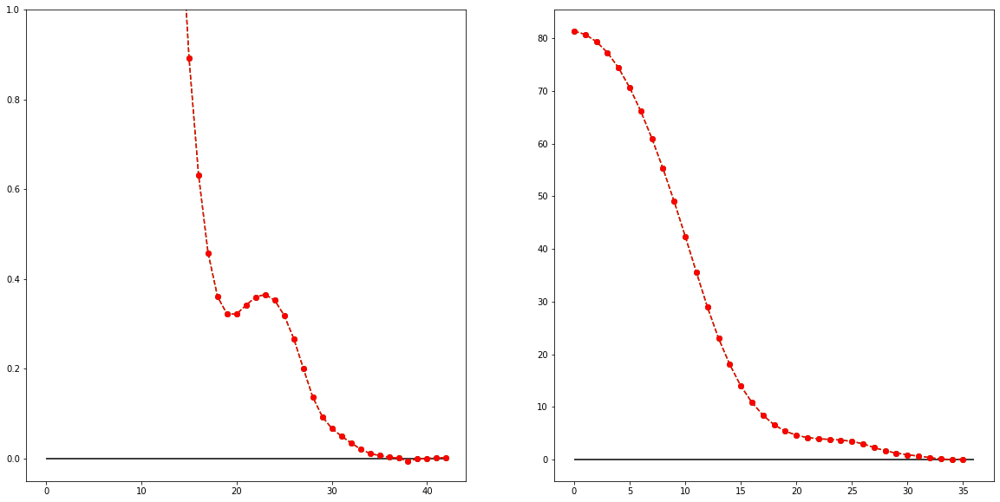

In [119]:
fig, axs = plt.subplots(ncols=2, nrows=1, figsize=(20,10))
axs[0].plot(np.array(b_all[1:1+len(pair_knots)])*(6*0.1**3) , 'go--')
axs[0].plot(np.array(b_init[1:1+len(pair_knots)])*(6*0.1**3) , 'ro--')

axs[0].set_ylim(-0.05,1.0)
axs[0].hlines(0.0, 0, 42)
axs[1].plot(np.array(b_all[1+len(pair_knots):])*(6*0.1**3) , 'go--')
axs[1].plot(np.array(b_init[1+len(pair_knots):])*(6*0.1**3) , 'ro--')
axs[1].hlines(0.0, 0, 36)

6
[slice(0, 415, 1), slice(415, 591, 1), slice(591, 1077, 1), slice(1077, 1098, 1), slice(1098, 1106, 1), slice(0, 1306, 1)]
-767.939 -767.955
-791.421 -791.314


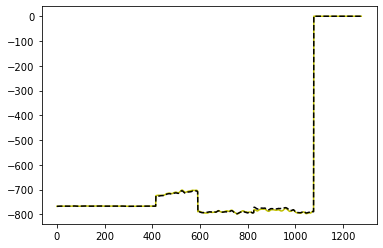

In [120]:
plt.plot(energy(b_all, X), 'y')
plt.plot(y[:], 'k--')
print(len(bounds))
print(bounds)
print([round(z, 3) for z in energy(b_all, X)[bounds[0]]][0], [round(z, 3) for z in y[bounds[0]]][0])
print([round(z, 3) for z in energy(b_all, X)[bounds[2]]][100], [round(z, 3) for z in y[bounds[2]]][100])

In [121]:
stats_file = 'stats_bsf_samples' # 'stats_samples'
with open(os.path.join(working, stats_file+'.pickle'), 'rb') as fi:
    stats_tpfx = pickle.load(fi, encoding='latin1')

stats_bsplinex = tpf_to_bsplines(stats_tpfx)

target_file = 'target_bsf_samples'
with open(os.path.join(working, target_file+'.pickle'), 'rb') as fi:
    targetsx = pickle.load(fi, encoding='latin1')

len 50


In [122]:
stats_listx = [downselect(stats_bsplinex, pair_knots, edens_knots, bspline=True)]

for key in targets.keys():
    targetsx[key]['weight'] = 1.0
    
for i, stat in enumerate(stats_listx[-1:]):
    Xall, yall, weights, beta, bounds = make_input_matrices(targetsx, stat, keytrj=tkeys, combined=0.35)
    
    #Xall, yall, weights, beta, bounds = make_input_matrices(targetsx, stat, keytrj=tkeys)
yall = yall[:,np.newaxis]

bounds [slice(0, 415, 1), slice(415, 591, 1), slice(591, 1077, 1), slice(1077, 1098, 1), slice(1098, 1106, 1), slice(0, 1306, 1)]
weights [1.0, 1.0, 1.0, 1.0, 1.0, 0.35]


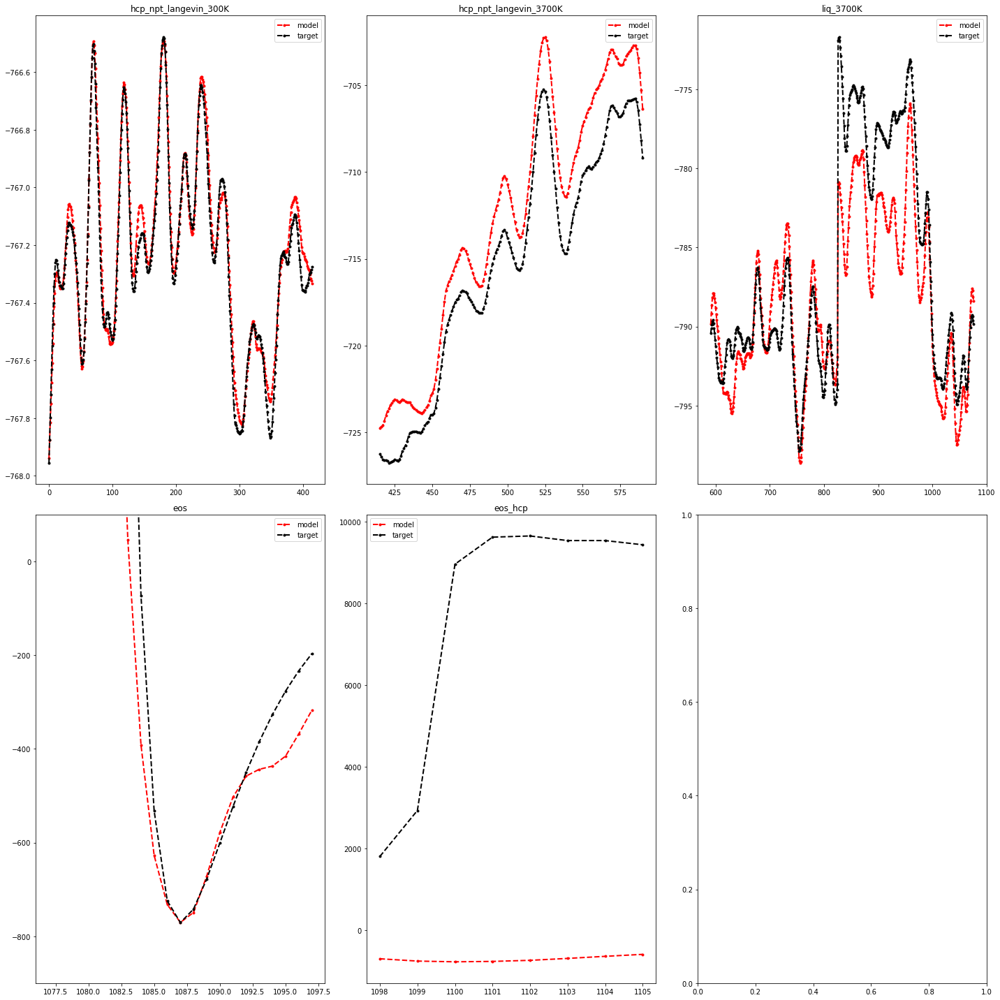

In [123]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(20,20))
    
for k, trj in enumerate(tkeys):
        
    i, j = divmod(k, 3)

    axes[i,j].set_title(trj)
        
    rr = list(range(len(Xall[0])))[bounds[k]][:]

    axes[i,j].plot(rr, energy(b_all, Xall)[bounds[k]][:], 'r.--', lw=2, label='model')
    #axes[i,j].plot(rr, energy(b_init, Xall)[bounds[k]][:], 'r.--', lw=2, label='model')


    axes[i,j].plot(rr, yall[bounds[k],0][:], 'k.--', lw=2, label='target')
    axes[i,j].legend()
    
    if trj == 'relax':
        axes[i,j].set_ylim(-1195, -1125)
        
    if trj == 'vacint':
        axes[i,j].set_ylim(-3835, -3815)
#        axes[i,j].set_xlim(1390,1392)
        
    if trj == 'eos':
        axes[i,j].set_ylim(-1200,1000)
        #axes[i,j].set_xlim(1395,)
    if trj == 'eos':
        axes[i,j].set_ylim(-900,100)
        #axes[i,j].set_xlim(1395,)
        
    #axes[i,j].set_xlim(*bounds[k][0])
    #axes[i,j].set_ylim(*bounds[k][1])

plt.tight_layout()

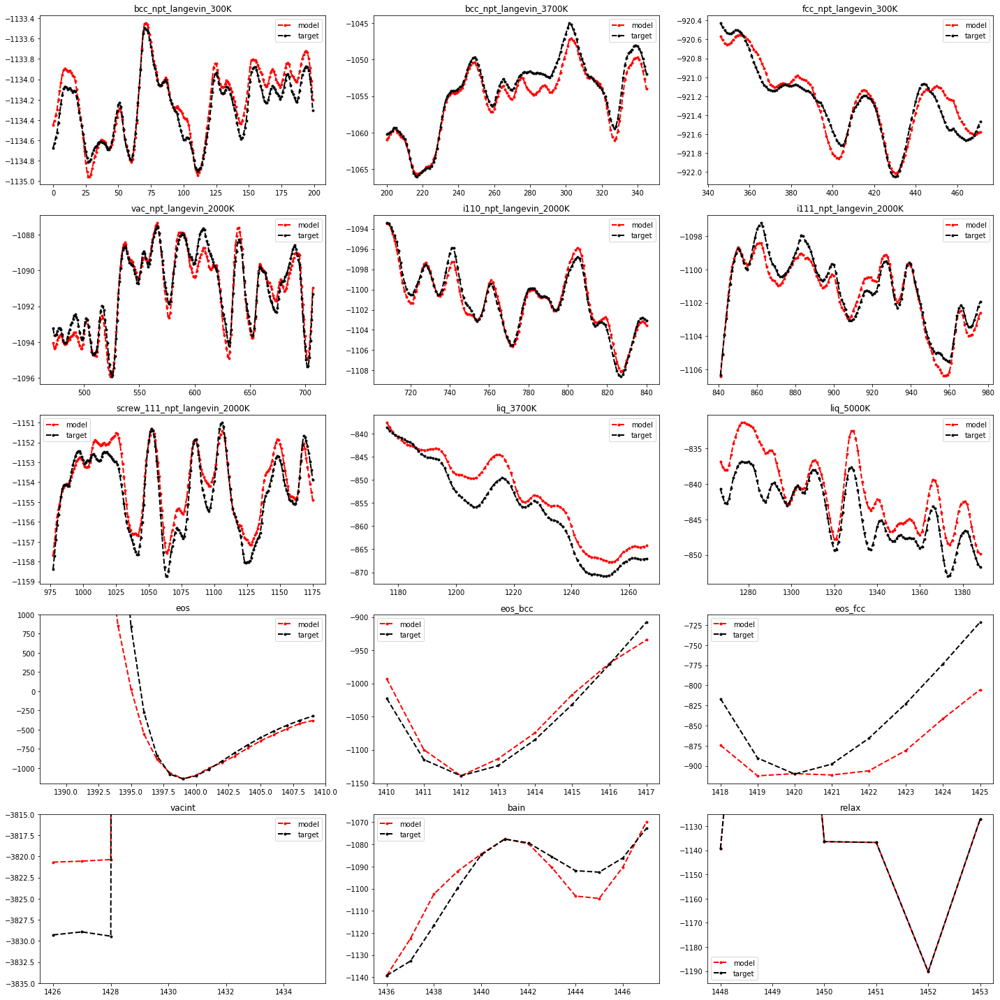

In [27]:
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(20,20))
    
for k, trj in enumerate(tkeys):
        
    i, j = divmod(k, 3)

    axes[i,j].set_title(trj)
        
    rr = list(range(len(Xall[0])))[bounds[k]][:]

    axes[i,j].plot(rr, energy(b_all, Xall)[bounds[k]][:], 'g.--', lw=2, label='model')
    #axes[i,j].plot(rr, energy(b_init, Xall)[bounds[k]][:], 'r.--', lw=2, label='model')


    axes[i,j].plot(rr, yall[bounds[k],0][:], 'k.--', lw=2, label='target')
    axes[i,j].legend()
    
    if trj == 'relax':
        axes[i,j].set_ylim(-1195, -1125)
        
    if trj == 'vacint':
        axes[i,j].set_ylim(-3835, -3815)
#        axes[i,j].set_xlim(1390,1392)
        
    if trj == 'eos':
        axes[i,j].set_ylim(-1200,1000)
        #axes[i,j].set_xlim(1395,)
    if trj == 'eos':
        axes[i,j].set_ylim(-1200,1000)
        #axes[i,j].set_xlim(1395,)
        
    #axes[i,j].set_xlim(*bounds[k][0])
    #axes[i,j].set_ylim(*bounds[k][1])

plt.tight_layout()

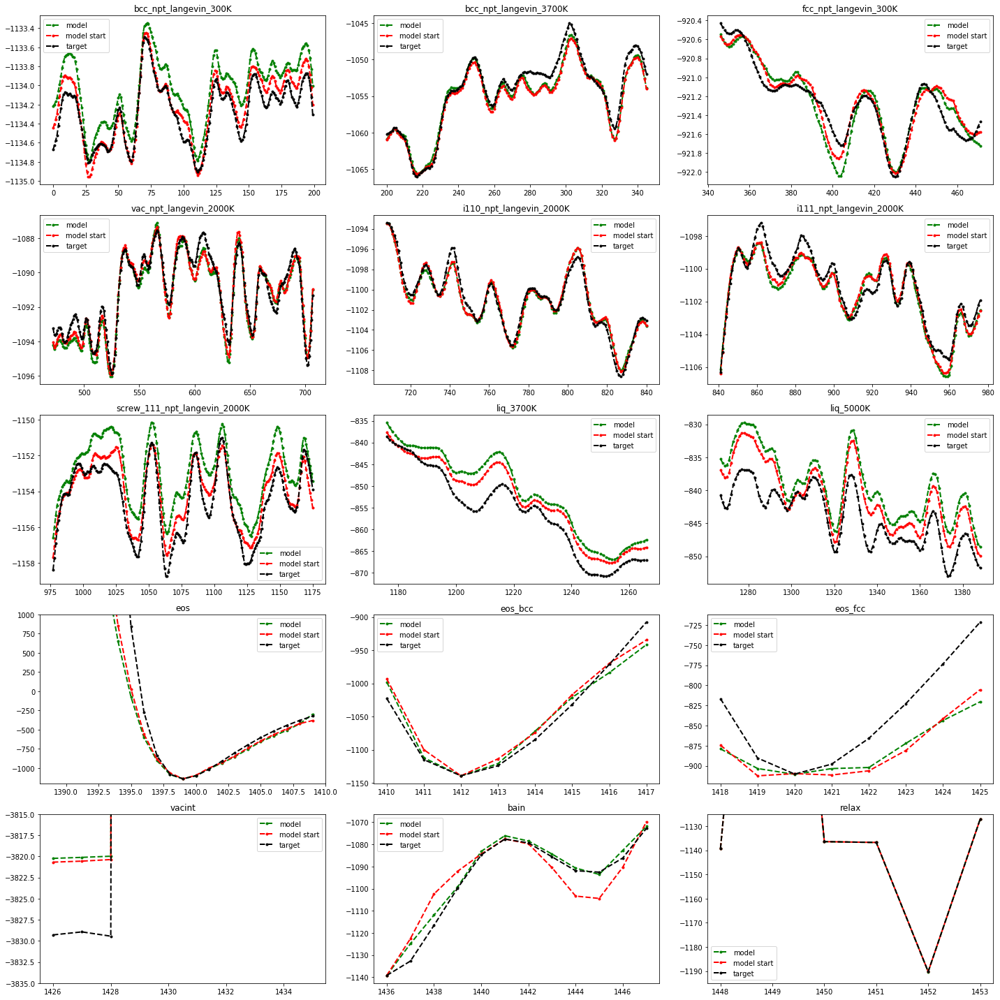

In [560]:
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(20,20))
    
for k, trj in enumerate(tkeys):
        
    i, j = divmod(k, 3)

    axes[i,j].set_title(trj)
        
    rr = list(range(len(Xall[0])))[bounds[k]][:]

    axes[i,j].plot(rr, energy(b_all, Xall)[bounds[k]][:], 'g.--', lw=2, label='model')
    axes[i,j].plot(rr, energy(b_init, Xall)[bounds[k]][:], 'r.--', lw=2, label='model start')


    axes[i,j].plot(rr, yall[bounds[k],0][:], 'k.--', lw=2, label='target')
    axes[i,j].legend()
    
    if trj == 'relax':
        axes[i,j].set_ylim(-1195, -1125)
        
    if trj == 'vacint':
        axes[i,j].set_ylim(-3835, -3815)
#        axes[i,j].set_xlim(1390,1392)
        
    if trj == 'eos':
        axes[i,j].set_ylim(-1200,1000)
        #axes[i,j].set_xlim(1395,)
    if trj == 'eos':
        axes[i,j].set_ylim(-1200,1000)
        #axes[i,j].set_xlim(1395,)
        
    #axes[i,j].set_xlim(*bounds[k][0])
    #axes[i,j].set_ylim(*bounds[k][1])

plt.tight_layout()

In [561]:
p_knots = np.array(pair_knots)+0.4
print(p_knots)
e_knots = np.array(edens_knots)+0.4
print(e_knots)
n_edens = len(e_knots)

[1.45 1.55 1.65 1.75 1.85 1.95 2.05 2.15 2.25 2.35 2.45 2.55 2.65 2.75
 2.85 2.95 3.05 3.15 3.25 3.35 3.45 3.55 3.65 3.75 3.85 3.95 4.05 4.15
 4.25 4.35 4.45 4.55 4.65 4.75 4.85 4.95 5.05 5.15 5.25 5.35 5.45 5.55
 5.65]
[1.45 1.55 1.65 1.75 1.85 1.95 2.05 2.15 2.25 2.35 2.45 2.55 2.65 2.75
 2.85 2.95 3.05 3.15 3.25 3.35 3.45 3.55 3.65 3.75 3.85 3.95 4.05 4.15
 4.25 4.35 4.45 4.55 4.65 4.75 4.85 4.95]


In [562]:
def _bspline_coeffs_to_tpf(n_tot):
    """
    Finds b-spline coefficients reproducing a single cubic
    functin (rc-r)**3
    """

    penalty = [1.0, -4.0, 6.0, -4.0, 1.0]
    o = 4
    P = np.zeros((n_tot+4, n_tot), dtype=float)
    for i in range(n_tot+4):
        #ii = i - 4
        for j, p in enumerate(penalty):
            if i+j-o < 0 or i+j-o > n_tot-1:
                continue
            P[i, i+j-o] = p

    return P

In [563]:
M = _bspline_coeffs_to_tpf(43)

In [564]:
#b11_ext = np.array([4.2e3, 3.6e3, 3.10e3, 2.65e3] + list(b_weight11[2:]))*(6*0.1**3)
b11_ext = np.array(list(b_all[1:-n_edens]))#*(6*0.1**3)
print(b11_ext)
tpf_coeff = M.dot(b11_ext)
print(tpf_coeff)

[ 4.70181796e+03  4.11458248e+03  3.56993897e+03  3.06792563e+03
  2.60855106e+03  2.19164573e+03  1.81701390e+03  1.48436502e+03
  1.19298420e+03  9.41818019e+02  7.29222240e+02  5.52866219e+02
  4.09584875e+02  2.96192141e+02  2.10706212e+02  1.47422155e+02
  9.87493381e+01  6.61617279e+01  4.68800167e+01  3.96301718e+01
  4.16616820e+01  4.82100019e+01  5.43292446e+01  5.70305907e+01
  5.55841240e+01  5.16692275e+01  4.49864828e+01  3.70119009e+01
  2.80557087e+01  1.89617881e+01  1.01263740e+01  4.18213719e+00
  3.73753874e+00  3.30668422e+00  1.50886512e+00  6.53698325e-01
  7.36010489e-01  3.62542892e-02 -1.93852683e+00  3.20298768e-01
 -3.12601605e+00 -1.18901093e+00  8.55034562e-02]
[ 4.70181796e+03 -1.46926894e+04  1.53225168e+04 -5.33160720e+03
 -2.96359611e-02 -1.78071399e-01 -2.62635510e-02 -9.47817401e-02
 -4.24350136e-01 -3.38517967e-01 -5.90834352e-01 -6.86395486e-01
 -8.34439217e-01 -2.09875032e-02  1.20426428e+00 -3.72312982e+00
 -1.88569917e+00  9.06460038e+00 -4.2532

In [565]:
Medens = _bspline_coeffs_to_tpf(36)

In [566]:
#b11_ext = np.array([4.2e3, 3.6e3, 3.10e3, 2.65e3] + list(b_weight11[2:]))*(6*0.1**3)
ed11_ext = np.array(list(b_all[-n_edens:]))#*(6*0.1**3)
print(ed11_ext)
edens_coeff = Medens.dot(ed11_ext)
print(edens_coeff)

[13929.2344703  13661.19095276 13292.29910317 12822.37766178
 12249.69929305 11572.04602187 10785.64877262  9892.69358466
  8906.34751341  7850.63057276  6761.34491463  5686.93057836
  4685.1585842   3799.39944772  3027.54377971  2403.92736429
  1936.1339343   1553.50686216  1300.01690269  1173.80539621
  1122.38760758  1079.56443397  1004.12689996   897.87400012
   777.09038059   635.54749255   505.13798954   370.47997407
   242.02894039   128.89246154    77.35563041    78.0344499
    63.90724653    58.06987196    69.61921329    28.58727421]
[ 1.39292345e+04 -4.20557469e+04  4.22229421e+04 -1.40966109e+04
 -1.54607580e+00 -4.90639560e-01 -1.55110049e+00  5.95511494e+00
  1.09810161e+01  1.08529584e+01  1.17821380e+01  1.26378874e+01
  9.33098092e+00 -1.44005047e+01 -4.54799047e+01  3.64451733e+01
 -2.67520513e+01 -7.82403604e+01  1.14627382e+02 -4.58294145e+01
 -5.06260754e+01 -1.37143677e+01  2.49901274e+01  4.30079700e+01
  1.44856516e+01 -2.25131950e+01  3.81212024e+01 -4.72745510e

In [567]:
p_knot = [1.05, 1.15, 1.25, 1.35] + list(p_knots)
print(len(tpf_coeff), len(p_knot))
e_knot = [1.05, 1.15, 1.25, 1.35] + list(e_knots)
print(len(edens_coeff), len(e_knot))

47 47
40 40


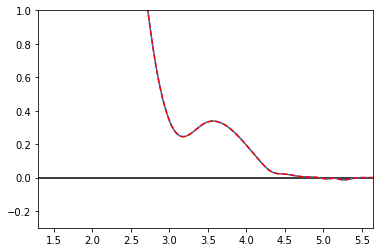

In [568]:
from statmechlib.forcefields import f_embed, f_dens, f_spline3

rr = np.linspace(1.3, 5.65, 436)

plt.plot(rr, [make_bspline(b_all[1:-n_edens], p_knot, r) for r in rr])
plt.xlim(1.3,)

#print(rr)
bs_target = [make_bspline(b_all[1:-n_edens], p_knot, r) for r in rr]
plt.plot(rr, [f_spline3(r, tpf_coeff, p_knot) for r in rr], 'r--')
plt.ylim(-0.3,1)
plt.xlim(rr[0], rr[-1])
plt.hlines(0.0, rr[0], rr[-1])
plt.savefig('pair_potential')

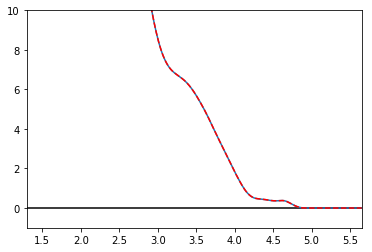

In [569]:
from statmechlib.forcefields import f_embed, f_dens, f_spline3

rr = np.linspace(1.3, 5.65, 436)

plt.plot(rr, [make_bspline(b_all[-n_edens:], p_knot, r) for r in rr])
plt.xlim(1.3,)

#print(rr)
bs_target = [make_bspline(b_all[-n_edens:], e_knot, r) for r in rr]
plt.plot(rr, [f_spline3(r, edens_coeff, e_knot) for r in rr], 'r--')
plt.ylim(-1,10)
#plt.xlim(1.5,2.8)
plt.xlim(rr[0], rr[-1])
plt.hlines(0.0, rr[0], rr[-1])
plt.savefig('pair_potential')

In [570]:
tpf_coeff

array([ 4.70181796e+03, -1.46926894e+04,  1.53225168e+04, -5.33160720e+03,
       -2.96359611e-02, -1.78071399e-01, -2.62635510e-02, -9.47817401e-02,
       -4.24350136e-01, -3.38517967e-01, -5.90834352e-01, -6.86395486e-01,
       -8.34439217e-01, -2.09875032e-02,  1.20426428e+00, -3.72312982e+00,
       -1.88569917e+00,  9.06460038e+00, -4.25327556e+00,  1.50527512e+00,
       -1.47647838e+00, -2.01403413e+00, -1.81341721e-01,  1.95706779e+00,
        2.25890299e+00,  2.40929919e+00, -1.97880130e+00,  1.77542943e+00,
       -1.16578424e+00,  5.33655048e-01, -4.47646999e-01,  2.23643595e+00,
       -2.42097583e-02, -8.09435552e+00,  4.10518594e+00,  3.69032538e+00,
       -2.31479022e+00, -1.71437398e+00,  1.22659077e+00,  6.00158818e+00,
       -1.54473787e+01,  2.10272075e+01, -1.71342710e+01,  5.34828356e+00,
        2.14304841e+00, -1.53102475e+00,  8.55034562e-02])

In [571]:
edens_coeff

array([ 1.39292345e+04, -4.20557469e+04,  4.22229421e+04, -1.40966109e+04,
       -1.54607580e+00, -4.90639560e-01, -1.55110049e+00,  5.95511494e+00,
        1.09810161e+01,  1.08529584e+01,  1.17821380e+01,  1.26378874e+01,
        9.33098092e+00, -1.44005047e+01, -4.54799047e+01,  3.64451733e+01,
       -2.67520513e+01, -7.82403604e+01,  1.14627382e+02, -4.58294145e+01,
       -5.06260754e+01, -1.37143677e+01,  2.49901274e+01,  4.30079700e+01,
        1.44856516e+01, -2.25131950e+01,  3.81212024e+01, -4.72745510e+01,
        2.58373917e+01, -1.34792120e+00,  3.71775199e+01, -5.56690900e+01,
       -5.76376763e+01,  9.01175251e+01, -1.39989645e+01, -7.90648834e+01,
        1.34993942e+02, -4.88833359e+01, -4.47298836e+01,  2.85872742e+01])

In [572]:
params = {
    'hyperparams':{'pair':[], 'edens':[]},
    'params':{'pair':[], 'edens':[]}}
params['hyperparams']['pair'] = p_knot
params['params']['pair'] = tpf_coeff
params['hyperparams']['edens'] = e_knot
params['params']['edens'] = edens_coeff
params['params']['embed'] = [-1.0, b_all[0]]

In [573]:
param_list = [params]
#param_list

In [576]:
file_name = os.path.join(working, "params_final_forces.pickle")

for params in param_list[-1:]:
    params_to_pickle(params, file_name)#, encoding='latin1', protocol=3)

In [577]:
file_name = os.path.join(working, "params_final_forces.pickle")

with open(file_name, 'rb') as fi:
    params_store = pickle.load(fi)
#params_store[-1]

In [578]:
print('pair')

for c, k in zip(tpf_coeff, p_knot):
    if c > 0.0:
        print('+{0}d0*({1}d0 - r)**3*H({1}d0 - r)'.format(c, round(k, 2)))
    else:
        print('{0}d0*({1}d0 - r)**3*H({1}d0 - r)'.format(c, round(k, 2)))

print('edens') 
for c, k in zip(edens_coeff, e_knot):
    if c > 0.0:
        print('+{0}d0*({1}d0 - r)**3*H({1}d0 - r)'.format(c, round(k, 2)))
    else:
        print('{0}d0*({1}d0 - r)**3*H({1}d0 - r)'.format(c, round(k, 2)))
        
print('embed')
print(-1.0, b_all[0])
#print(-4.42166597e-01,  1.12818607e-04)
#print(-4.49779872e-01,  1.09664665e-04)

pair
+4701.817959191992d0*(1.05d0 - r)**3*H(1.05d0 - r)
-14692.689359697128d0*(1.15d0 - r)**3*H(1.15d0 - r)
+15322.516812338035d0*(1.25d0 - r)**3*H(1.25d0 - r)
-5331.607202547126d0*(1.35d0 - r)**3*H(1.35d0 - r)
-0.029635961067469907d0*(1.45d0 - r)**3*H(1.45d0 - r)
-0.17807139896012814d0*(1.55d0 - r)**3*H(1.55d0 - r)
-0.026263551048941736d0*(1.65d0 - r)**3*H(1.65d0 - r)
-0.09478174013929674d0*(1.75d0 - r)**3*H(1.75d0 - r)
-0.42435013604244887d0*(1.85d0 - r)**3*H(1.85d0 - r)
-0.33851796686212765d0*(1.95d0 - r)**3*H(1.95d0 - r)
-0.5908343524070006d0*(2.05d0 - r)**3*H(2.05d0 - r)
-0.6863954863258641d0*(2.15d0 - r)**3*H(2.15d0 - r)
-0.8344392170583887d0*(2.25d0 - r)**3*H(2.25d0 - r)
-0.020987503247170025d0*(2.35d0 - r)**3*H(2.35d0 - r)
+1.2042642817093565d0*(2.45d0 - r)**3*H(2.45d0 - r)
-3.7231298243415267d0*(2.55d0 - r)**3*H(2.55d0 - r)
-1.8856991704445818d0*(2.65d0 - r)**3*H(2.65d0 - r)
+9.064600375369196d0*(2.75d0 - r)**3*H(2.75d0 - r)
-4.253275563553018d0*(2.85d0 - r)**3*H(2.85d0 - r)
+

In [ ]:
par = param_list[2]
print('pair')
for c, k in zip(par['params']['pair'], par['hyperparams']['pair']):
    if c > 0.0:
        print('+{0}d0*({1}d0 - r)**3*H({1}d0 - r)'.format(c, k))
    else:
        print('{0}d0*({1}d0 - r)**3*H({1}d0 - r)'.format(c, k))
print('edens')   
for c, k in zip(par['params']['edens'], par['hyperparams']['edens']):
    if c > 0.0:
        print('+{0}d0*({1}d0 - r)**3*H({1}d0 - r)'.format(c, k))
    else:
        print('{0}d0*({1}d0 - r)**3*H({1}d0 - r)'.format(c, k))
print('embed')    
par['params']['embed']